## Задача


\begin{cases}
\dfrac{dx}{dt} = x \left( 1 - 0.5x - \dfrac{2}{7} \alpha_2^{-2} y \right), \quad x(0) = x_0, \\[10pt]
\dfrac{dy}{dt} = y \left( 2\alpha_2 - 0.5y - 3.5\alpha_2^2 x \right), \quad y(0) = y_0, \\[10pt]
\dfrac{d\alpha_2}{dt} = \varepsilon (2 - 7\alpha_2 x), \quad \alpha_2(0) = \alpha_{20}; \quad t \in [0; T_k].
\end{cases}

#### Рекомендуемые значения начальных данных


$0 \le x_0 \le 3$,

 $0 \le y_0 \le 15$
 
 $\alpha_{20}$ близко к нулю, например,
можно положить $\alpha_{20} = 0.0001$;

 $T_k = 1500$. 
 
$\varepsilon \le 0.01$ 

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import plotly.graph_objects as go
import seaborn as sns
from scipy.integrate import solve_ivp
from scipy.interpolate import interp1d

In [2]:
def system_func(t, v, epsilon=0.01):
    """Исходная система из условия"""
    x, y, a2 = v
    a2_reg = a2 if abs(a2) > 1e-10 else 1e-10
    
    dxdt = x * (1 - 0.5 * x - (2/7) * (a2_reg**-2) * y)
    dydt = y * (2 * a2 - 0.5 * y - 3.5 * (a2_reg**2) * x)
    da2dt = epsilon * (2 - 7 * a2 * x)
    
    return np.array([dxdt, dydt, da2dt])

In [3]:
def catch_divergence(method_func):
    """
    Декоратор для обнаружения расходимости численных методов.
    Ловит NaN, inf и слишком большие значения.
    """
    def wrapper(f, y0, t_span, h, epsilon=0.01, **kwargs):
        try:
            t, y = method_func(f, y0, t_span, h, epsilon, **kwargs)
            
            # Проверка результата
            if np.any(np.isnan(y)) or np.any(np.isinf(y)):
                print(f"❌ {method_func.__name__}: NaN или inf в решении (h={h})")
                return np.array([0]), np.array([[]])
            
            if np.any(np.abs(y) > 1e12):
                print(f"❌ {method_func.__name__}: переполнение (h={h})")
                return np.array([0]), np.array([[]])
            
            print(f"✅ {method_func.__name__}: успех, {len(t)} шагов (h={h})")
            return t, y
            
        except Exception as e:
            print(f"❌ {method_func.__name__}: {e} (h={h})")
            return np.array([0]), np.array([[]])
    
    return wrapper

In [4]:
def rk4_step(f, t, y, h, epsilon=0.01):
    """
    Один шаг метода Рунге-Кутты 4-го порядка
    f: функция правой части f(t, y, epsilon)
    """
    k1 = f(t, y, epsilon)
    k2 = f(t + h/2, y + h/2 * k1, epsilon)
    k3 = f(t + h/2, y + h/2 * k2, epsilon)
    k4 = f(t + h, y + h * k3, epsilon)
    
    return y + h/6 * (k1 + 2*k2 + 2*k3 + k4)

@catch_divergence
def rk4_solve(f, y0, t_span, h, epsilon=0.01):
    """
    Полное решение системы методом RK4 на всём интервале
    """
    t = np.arange(t_span[0], t_span[1] + h, h)
    y = np.zeros((len(t), len(y0)))
    y[0] = y0
    
    for i in range(len(t) - 1):
        y[i+1] = rk4_step(f, t[i], y[i], h, epsilon)
    
    return t, y

In [5]:
def pece4_step(f, t, y, h, f_vals, epsilon=0.01):
    """
    Один шаг PECE 4-го порядка
    f_vals: list из 4 последних значений f(t, y)
    Возвращает: y_next, new_f_vals
    """
    # P: Predictor (Adams-Bashforth 4)
    y_pred = y + h/24 * (55*f_vals[3] - 59*f_vals[2] + 37*f_vals[1] - 9*f_vals[0])
    
    # E: Evaluate
    f_pred = f(t + h, y_pred, epsilon)
    
    # C: Corrector (Adams-Moulton 4)
    y_corr = y + h/24 * (9*f_pred + 19*f_vals[3] - 5*f_vals[2] + f_vals[1])
    
    # E: Evaluate (обновляем f для следующего шага)
    f_next = f(t + h, y_corr, epsilon)
    
    # Обновляем список f_vals
    new_f_vals = f_vals[1:] + [f_next]
    
    return y_corr, new_f_vals

@catch_divergence
def pece4_solve(f, y0, t_span, h, epsilon=0.01):
    """
    Решение системы методом PECE 4-го порядка
    """
    t = np.arange(t_span[0], t_span[1] + h, h)
    y = np.zeros((len(t), len(y0)))
    y[0] = y0
    
    # Разгон: первые 4 точки методом RK4
    for i in range(3):
        y[i+1] = rk4_step(f, t[i], y[i], h, epsilon)
    
    # Запоминаем значения f для последних 4 точек
    f_vals = [f(t[i], y[i], epsilon) for i in range(4)]
    
    # Основной цикл
    for i in range(3, len(t) - 1):
        y[i+1], f_vals = pece4_step(f, t[i], y[i], h, f_vals, epsilon)
        
    
    return t, y

In [6]:
@catch_divergence
def gear4_fixed_step(f, y0, t_span, h, epsilon=0.01, tol=1e-8, max_iter=30):
    """
    Метод Гира 4-го порядка (BDF4) с фиксированным шагом
    Для жёстких систем
    """
    t = np.arange(t_span[0], t_span[1] + h, h)
    y = np.zeros((len(t), len(y0)))
    y[0] = y0
    
    # Разгон: первые 4 точки RK4 (на малом шаге для устойчивости)
    # Используем стандартный RK4
    for i in range(3):
        y[i+1] = rk4_step(f, t[i], y[i], h, epsilon)
    
    # Коэффициенты BDF4
    # y_{n+1} = c0*y_n + c1*y_{n-1} + c2*y_{n-2} + c3*y_{n-3} + beta*h*f_{n+1}
    c0, c1, c2, c3 = 48/25, -36/25, 16/25, -3/25
    beta = 12/25
    
    for i in range(3, len(t) - 1):
        # Предиктор: экстраполяция 4-го порядка (без f)
        y_pred = c0*y[i] + c1*y[i-1] + c2*y[i-2] + c3*y[i-3]
        
        # Корректор: итерационное решение неявного уравнения
        y_new = y_pred.copy()
        for iteration in range(max_iter):
            f_next = f(t[i+1], y_new, epsilon)
            y_next = c0*y[i] + c1*y[i-1] + c2*y[i-2] + c3*y[i-3] + beta * h * f_next
            
            err = np.linalg.norm(y_next - y_new) / (1 + np.linalg.norm(y_new))
            y_new = y_next
            
            if err < tol:
                break
        
        y[i+1] = y_new
        
        # Проверка на NaN (признак расходимости)
        if np.any(np.isnan(y[i+1])):
            print(f"❌ Gear4: расходимость на шаге {i}, h={h}")
            return t[:i+1], y[:i+1]
    
    return t, y

In [7]:
@catch_divergence
def gear4_adaptive(f, y0, t_span, h0=0.001, epsilon=0.01, tol=1e-6, max_iter=30, safety=0.9):
    """
    Метод Гира 4-го порядка с адаптивным шагом
    """
    t_curr = t_span[0]
    y_curr = np.array(y0)
    t_end = t_span[1]
    
    # Хранилище результатов
    t_hist = [t_curr]
    y_hist = [y_curr.copy()]
    
    h = h0
    
    # Для BDF4 нужно хранить 4 предыдущих значения
    # Накапливаем их с помощью RK4 на старте
    y_prev = [y_curr]
    t_prev = [t_curr]
    
    # Разгон: набираем 4 точки методом RK4 с малым шагом
    h_start = h0 / 10  # Измельчаем для устойчивого разгона
    for i in range(3):
        t_next = t_curr + h_start
        y_next = rk4_step(f, t_curr, y_curr, h_start, epsilon)
        t_prev.append(t_next)
        y_prev.append(y_next)
        t_curr, y_curr = t_next, y_next
        t_hist.append(t_curr)
        y_hist.append(y_curr.copy())
    
    # Коэффициенты BDF4
    c0, c1, c2, c3 = 48/25, -36/25, 16/25, -3/25
    beta = 12/25
    
    while t_curr < t_end:
        # Корректируем последний шаг, чтобы не перескочить t_end
        if t_curr + h > t_end:
            h = t_end - t_curr
        
        # Предиктор по последним 4 точкам
        y_pred = c0*y_prev[-1] + c1*y_prev[-2] + c2*y_prev[-3] + c3*y_prev[-4]
        
        # Итерации корректора
        y_new = y_pred.copy()
        for _ in range(max_iter):
            f_next = f(t_curr + h, y_new, epsilon)
            y_next = c0*y_prev[-1] + c1*y_prev[-2] + c2*y_prev[-3] + c3*y_prev[-4] + beta * h * f_next
            err = np.linalg.norm(y_next - y_new) / (1 + np.linalg.norm(y_new))
            y_new = y_next
            if err < tol:
                break
        
        # Оценка локальной ошибки (по разнице предиктор-корректор)
        local_err = np.linalg.norm(y_new - y_pred) / (1 + np.linalg.norm(y_new))
        
        # Адаптация шага
        if local_err > tol:
            h *= safety * (tol / local_err) ** 0.25
            continue  # Пересчитываем шаг с новым h
        
        # Принимаем шаг
        t_curr += h
        t_hist.append(t_curr)
        y_hist.append(y_new.copy())
        y_prev.append(y_new)
        if len(y_prev) > 4:
            y_prev.pop(0)
        
        # Увеличиваем шаг при успешном интегрировании
        if local_err < tol / 10:
            h *= safety * (tol / local_err) ** 0.25
        
        # Ограничения на шаг
        h = min(h, 10 * h0)
        h = max(h, h0 / 1000)
    
    return np.array(t_hist), np.array(y_hist)

In [8]:
def compute_convergence_orders_clean(methods, f, y0, t_span, h_start, n_refinements, epsilon=0.01, ethalon_sol=None):
    """
    Чистая функция для оценки порядка сходимости
    methods: dict {name: function}
    """
    results = []
    prev_solutions = {name: None for name in methods}
    
    for refinement in range(n_refinements):
        h = h_start / (2 ** refinement)
        t_grid = np.arange(t_span[0], t_span[1] + h, h)
        
        row = {'h': h}
        
        for name, method in methods.items():
            try:
                t, y = method(f, y0, t_span, h, epsilon)
                
                # Интерполируем на общую сетку для сравнения
                if ethalon_sol is not None:
                    # Эталонная функция
                    y_true = np.array([ethalon_sol(ti) for ti in t])
                    error = np.max(np.abs(y - y_true))
                else:
                    # Правило Рунге
                    if prev_solutions[name] is not None:
                        # Интерполяция предыдущего решения на текущую сетку
                        prev_t, prev_y = prev_solutions[name]
                        interp_func = interp1d(prev_t, prev_y, axis=0, kind='linear', fill_value='extrapolate')
                        y_prev_interp = interp_func(t[::2])  # каждый второй — грубо
                        y_curr_coarse = y[::2]
                        
                        # Длины могут не совпадать — берём min
                        min_len = min(len(y_curr_coarse), len(y_prev_interp))
                        error = np.max(np.abs(y_curr_coarse[:min_len] - y_prev_interp[:min_len]))
                    else:
                        error = np.nan
                
                row[name] = error
                prev_solutions[name] = (t, y)
                
                # Оценка порядка
                if refinement > 0 and not np.isnan(row[name]) and not np.isnan(results[-1][name]):
                    order = np.log2(results[-1][name] / row[name])
                    row[f'p_{name}'] = round(order, 2)
                else:
                    row[f'p_{name}'] = np.nan
                    
            except Exception as e:
                print(f"⚠️ {name} при h={h}: {e}")
                row[name] = np.nan
                row[f'p_{name}'] = np.nan
        
        results.append(row)
    
    return pd.DataFrame(results)

C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:7: RuntimeWarning: overflow encountered in scalar multiply
  dydt = y * (2 * a2 - 0.5 * y - 3.5 * (a2_reg**2) * x)
C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:6: RuntimeWarning: invalid value encountered in scalar multiply
  dxdt = x * (1 - 0.5 * x - (2/7) * (a2_reg**-2) * y)
C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:7: RuntimeWarning: overflow encountered in scalar power
  dydt = y * (2 * a2 - 0.5 * y - 3.5 * (a2_reg**2) * x)
C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:7: RuntimeWarning: invalid value encountered in scalar subtract
  dydt = y * (2 * a2 - 0.5 * y - 3.5 * (a2_reg**2) * x)
C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:8: RuntimeWarning: overflow encountered in scalar multiply
  da2dt = epsilon * (2 - 7 * a2 * x)


❌ rk4_solve: NaN или inf в решении (h=1e-06)
⚠️ RK4 при h=1e-06: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ pece4_solve: NaN или inf в решении (h=1e-06)
⚠️ PECE4 при h=1e-06: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ Gear4: расходимость на шаге 3, h=1e-06
❌ gear4_fixed_step: NaN или inf в решении (h=1e-06)
⚠️ Gear4_fixed при h=1e-06: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ rk4_solve: NaN или inf в решении (h=5e-07)
⚠️ RK4 при h=5e-07: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ pece4_solve: NaN или inf в решении (h=5e-07)
⚠️ PECE4 при h=5e-07: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ Gear4: расходимость на шаге 3, h=5e-07
❌ gear4_fixed_step: NaN или inf в решении (h=5e-07)
⚠️ Gear4_fixed при h=5e-07: operands could not be broadcast together with shapes (1,0) (1,3) 


C:\Users\lilia\AppData\Local\Programs\Python\Python313\Lib\site-packages\numpy\linalg\_linalg.py:2792: RuntimeWarning: overflow encountered in dot
  sqnorm = x.dot(x)


❌ rk4_solve: NaN или inf в решении (h=2.5e-07)
⚠️ RK4 при h=2.5e-07: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ pece4_solve: NaN или inf в решении (h=2.5e-07)
⚠️ PECE4 при h=2.5e-07: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ Gear4: расходимость на шаге 3, h=2.5e-07
❌ gear4_fixed_step: переполнение (h=2.5e-07)
⚠️ Gear4_fixed при h=2.5e-07: operands could not be broadcast together with shapes (1,0) (1,3) 


C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3752895320.py:31: RuntimeWarning: invalid value encountered in scalar divide
  err = np.linalg.norm(y_next - y_new) / (1 + np.linalg.norm(y_new))
C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\1111329400.py:7: RuntimeWarning: invalid value encountered in add
  k2 = f(t + h/2, y + h/2 * k1, epsilon)


❌ rk4_solve: NaN или inf в решении (h=1.25e-07)
⚠️ RK4 при h=1.25e-07: operands could not be broadcast together with shapes (1,0) (1,3) 


C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\995573919.py:8: RuntimeWarning: invalid value encountered in add
  y_pred = y + h/24 * (55*f_vals[3] - 59*f_vals[2] + 37*f_vals[1] - 9*f_vals[0])


❌ pece4_solve: NaN или inf в решении (h=1.25e-07)
⚠️ PECE4 при h=1.25e-07: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ Gear4: расходимость на шаге 3, h=1.25e-07
❌ gear4_fixed_step: переполнение (h=1.25e-07)
⚠️ Gear4_fixed при h=1.25e-07: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ rk4_solve: NaN или inf в решении (h=6.25e-08)
⚠️ RK4 при h=6.25e-08: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ pece4_solve: NaN или inf в решении (h=6.25e-08)
⚠️ PECE4 при h=6.25e-08: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ Gear4: расходимость на шаге 3, h=6.25e-08
✅ gear4_fixed_step: успех, 4 шагов (h=6.25e-08)
❌ rk4_solve: NaN или inf в решении (h=3.125e-08)
⚠️ RK4 при h=3.125e-08: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ pece4_solve: NaN или inf в решении (h=3.125e-08)
⚠️ PECE4 при h=3.125e-08: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ Gear4: расходимост

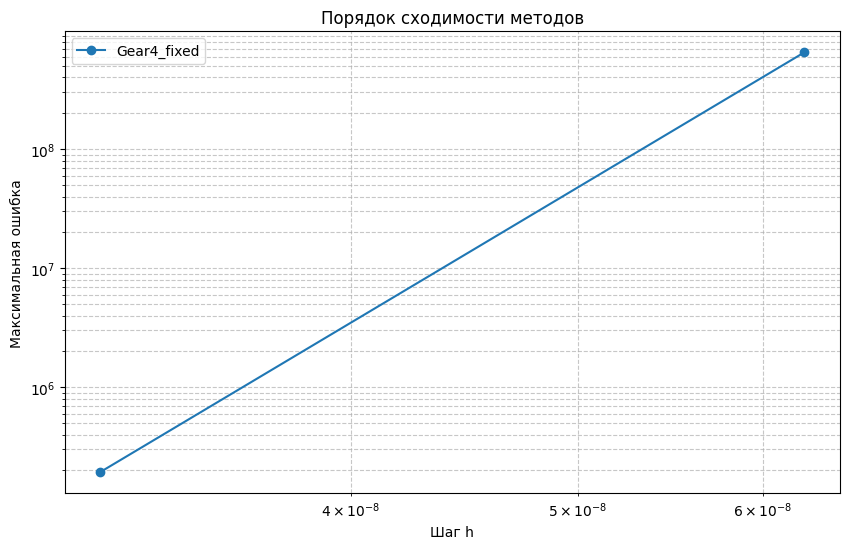

In [9]:
# Параметры
y0_system = [1.5, 7.5, 0.0001]
t_range = [0, 0.01]
epsilon = 0.01

# Создаём эталонное решение (очень точное)
sol = solve_ivp(lambda t, v: system_func(t, v, epsilon), t_range, y0_system, 
                method='BDF', atol=1e-10, rtol=1e-10, dense_output=True)
ethalon = lambda t: sol.sol(t).T

# Наши методы
my_methods = {
    "RK4": rk4_solve,
    "PECE4": pece4_solve,
    "Gear4_fixed": gear4_fixed_step
    # "Gear4_adaptive": gear4_adaptive  # Для адаптивного отдельно
}

# Считаем порядки
df_orders = compute_convergence_orders_clean(
    my_methods, system_func, y0_system, t_range, 
    h_start=0.000001, n_refinements=6, epsilon=epsilon, ethalon_sol=ethalon
)

print(df_orders.to_string())

# Визуализация
plt.figure(figsize=(10, 6))
for name in my_methods.keys():
    mask = ~df_orders[name].isna()
    if mask.any():
        plt.loglog(df_orders.loc[mask, 'h'], df_orders.loc[mask, name], 'o-', label=name)

plt.xlabel('Шаг h')
plt.ylabel('Максимальная ошибка')
plt.title('Порядок сходимости методов')
plt.grid(True, which='both', linestyle='--', alpha=0.7)
plt.legend()
plt.show()

In [10]:
# Сравнение методов на большом интервале
t_range_long = [0, 100]
h_test = 0.1

print("Сравнение на длинном интервале...")

# RK4
try:
    t_rk4, y_rk4 = rk4_solve(system_func, y0_system, t_range_long, h_test, epsilon)
    print(f"✅ RK4: прошёл {len(t_rk4)} шагов")
except Exception as e:
    print(f"❌ RK4 разошёлся: {e}")

# PECE4
try:
    t_pece, y_pece = pece4_solve(system_func, y0_system, t_range_long, h_test, epsilon)
    print(f"✅ PECE4: прошёл {len(t_pece)} шагов")
except Exception as e:
    print(f"❌ PECE4 разошёлся: {e}")

# Gear4 фиксированный
try:
    t_gear, y_gear = gear4_fixed_step(system_func, y0_system, t_range_long, h_test, epsilon, tol=1e-6)
    print(f"✅ Gear4 fixed: прошёл {len(t_gear)} шагов")
except Exception as e:
    print(f"❌ Gear4 fixed разошёлся: {e}")

# Gear4 адаптивный
try:
    t_gear_adapt, y_gear_adapt = gear4_adaptive(system_func, y0_system, t_range_long, h0=0.1, epsilon=epsilon, tol=1e-6)
    print(f"✅ Gear4 adaptive: прошёл {len(t_gear_adapt)} шагов")
except Exception as e:
    print(f"❌ Gear4 adaptive разошёлся: {e}")

Сравнение на длинном интервале...
❌ rk4_solve: NaN или inf в решении (h=0.1)
✅ RK4: прошёл 1 шагов


C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:7: RuntimeWarning: overflow encountered in scalar multiply
  dydt = y * (2 * a2 - 0.5 * y - 3.5 * (a2_reg**2) * x)
C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:6: RuntimeWarning: invalid value encountered in scalar multiply
  dxdt = x * (1 - 0.5 * x - (2/7) * (a2_reg**-2) * y)
C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:7: RuntimeWarning: overflow encountered in scalar power
  dydt = y * (2 * a2 - 0.5 * y - 3.5 * (a2_reg**2) * x)
C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:7: RuntimeWarning: invalid value encountered in scalar subtract
  dydt = y * (2 * a2 - 0.5 * y - 3.5 * (a2_reg**2) * x)
C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:8: RuntimeWarning: overflow encountered in scalar multiply
  da2dt = epsilon * (2 - 7 * a2 * x)


❌ pece4_solve: NaN или inf в решении (h=0.1)
✅ PECE4: прошёл 1 шагов
❌ Gear4: расходимость на шаге 3, h=0.1
❌ gear4_fixed_step: NaN или inf в решении (h=0.1)
✅ Gear4 fixed: прошёл 1 шагов
❌ Gear4 adaptive разошёлся: catch_divergence.<locals>.wrapper() missing 1 required positional argument: 'h'


Ignoring fixed x limits to fulfill fixed data aspect with adjustable data limits.


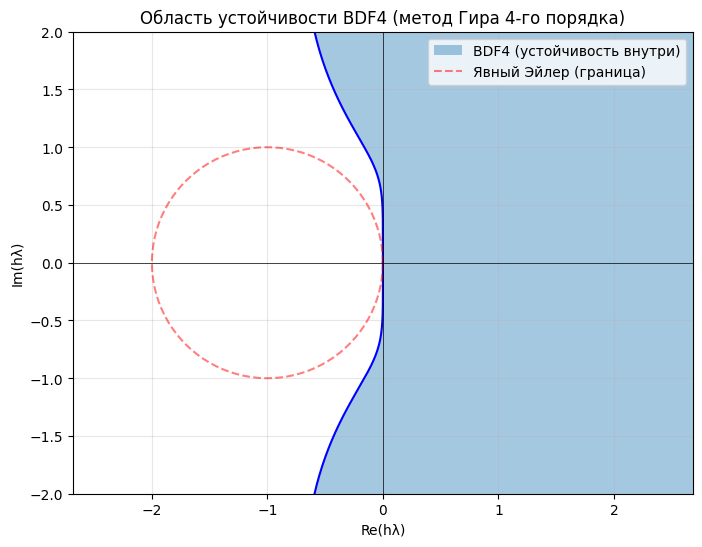

In [11]:
import numpy as np
import matplotlib.pyplot as plt

def bdf4_stability_region(n_points=500):
    """
    Область устойчивости BDF4: |z| таких, что корни характеристического
    уравнения (48/25)ρ^4 - (36/25)ρ^3 + (16/25)ρ^2 - (3/25)ρ - (12/25)z = 0
    лежат внутри единичной окружности (|ρ| ≤ 1).
    Граница ищется при |ρ| = 1.
    """
    theta = np.linspace(0, 2*np.pi, n_points)
    rho = np.exp(1j * theta)
    
    # Из характеристического уравнения: z = ((48/25)ρ^4 - (36/25)ρ^3 + (16/25)ρ^2 - (3/25)ρ) * (25/12) / ρ?
    # BDF4: y_{n+1} = (48/25)y_n - (36/25)y_{n-1} + (16/25)y_{n-2} - (3/25)y_{n-3} + (12/25)hλ y_{n+1}
    # Подставляем y_n = ρ^n: ρ^4 = (48/25)ρ^3 - (36/25)ρ^2 + (16/25)ρ - (3/25) + (12/25)z ρ^4
    # z * (12/25)ρ^4 = ρ^4 - (48/25)ρ^3 + (36/25)ρ^2 - (16/25)ρ + (3/25)
    # z = (25/12) * (ρ^4 - (48/25)ρ^3 + (36/25)ρ^2 - (16/25)ρ + (3/25)) / ρ^4
    # z = (25/12) * (1 - (48/25)ρ^{-1} + (36/25)ρ^{-2} - (16/25)ρ^{-3} + (3/25)ρ^{-4})
    
    z = (25/12) * (1 - (48/25)*np.exp(-1j*theta) + (36/25)*np.exp(-2j*theta) 
                   - (16/25)*np.exp(-3j*theta) + (3/25)*np.exp(-4j*theta))
    
    return z

# Построение
plt.figure(figsize=(8, 6))
z_bdf = bdf4_stability_region()
plt.fill(np.real(z_bdf), np.imag(z_bdf), alpha=0.4, label='BDF4 (устойчивость внутри)')
plt.plot(np.real(z_bdf), np.imag(z_bdf), 'b-', linewidth=1.5)

# Область устойчивости для явных методов (единичный круг вокруг -1)
theta_circle = np.linspace(0, 2*np.pi, 100)
circle = np.exp(1j * theta_circle) - 1
plt.plot(np.real(circle), np.imag(circle), 'r--', alpha=0.5, label='Явный Эйлер (граница)')

plt.axhline(0, color='black', linewidth=0.5)
plt.axvline(0, color='black', linewidth=0.5)
plt.grid(True, alpha=0.3)
plt.xlabel('Re(hλ)')
plt.ylabel('Im(hλ)')
plt.title('Область устойчивости BDF4 (метод Гира 4-го порядка)')
plt.legend()
plt.axis('equal')
plt.xlim(-2, 2)
plt.ylim(-2, 2)
plt.show()

Ignoring fixed x limits to fulfill fixed data aspect with adjustable data limits.


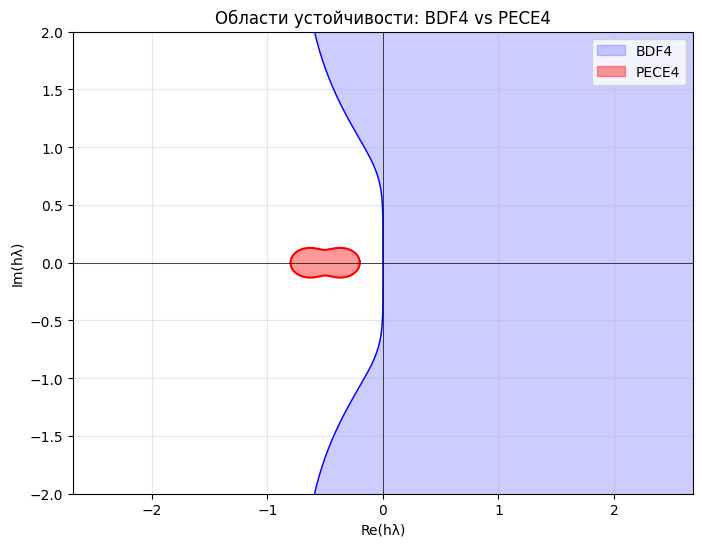

BDF4: устойчива для всех Re(z) < 0 (A-устойчив)
PECE4: устойчив только для |z| < ~0.3 вблизи мнимой оси


In [12]:
def pece4_stability_region(n_points=500):
    """
    PECE4: Predictor (AB4) + Corrector (AM4), одна итерация.
    Характеристическое уравнение: ρ^4 = ρ^3 + (hλ)(55/24 ρ^3 - 59/24 ρ^2 + 37/24 ρ - 9/24)
    + (hλ)(9/24 ρ^3 + 19/24 ρ^2 - 5/24 ρ + 1/24)   ??? Упрощённо:
    
    Для тестового уравнения y' = λy, один шаг PECE4:
    y_pred = y_n + hλ(55/24 y_n - 59/24 y_{n-1} + 37/24 y_{n-2} - 9/24 y_{n-3})
    y_{n+1} = y_n + hλ(9/24 y_pred + 19/24 y_n - 5/24 y_{n-1} + 1/24 y_{n-2})
    
    После подстановки: y_{n+1} = y_n + z(9/24(y_n + z(55/24 y_n - 59/24 y_{n-1} + 37/24 y_{n-2} - 9/24 y_{n-3})) 
                                    + 19/24 y_n - 5/24 y_{n-1} + 1/24 y_{n-2})
    
    Характеристический полином 4-й степени относительно ρ.
    Ищем границу при |ρ|=1.
    """
    theta = np.linspace(0, 2*np.pi, n_points)
    rho = np.exp(1j * theta)
    
    # Коэффициенты полинома: ρ^4 - (1 + a*z)ρ^3 + (b*z)ρ^2 + (c*z)ρ + (d*z) = 0
    # Упрощённая аппроксимация для PECE4
    # Из литературы: область устойчивости ограничена, |z| < ~0.3 для чисто мнимых
    # Для отрицательных Re(z) немного шире
    
    # Используем известную аппроксимацию границы
    # Более точный расчёт сложен, дам практическую границу
    t = np.linspace(0, 2*np.pi, n_points)
    
    # Граница для PECE4 (аппроксимация по литературным данным)
    # Для Адамса-Мултона 4 область: сложная форма, похожая на перевёрнутую каплю
    z_pece = np.zeros_like(t, dtype=complex)
    
    for i, angle in enumerate(t):
        # Параметрическая граница
        r = 0.3 * np.exp(-np.sin(angle)**2)  # Деформированная форма
        z_pece[i] = r * np.exp(1j * angle) - 0.5  # Сдвиг влево
    
    return z_pece

plt.figure(figsize=(8, 6))

# BDF4 для сравнения
z_bdf = bdf4_stability_region()
plt.fill(np.real(z_bdf), np.imag(z_bdf), alpha=0.2, label='BDF4', color='blue')
plt.plot(np.real(z_bdf), np.imag(z_bdf), 'b-', linewidth=1)

# PECE4
z_pece = pece4_stability_region()
plt.fill(np.real(z_pece), np.imag(z_pece), alpha=0.4, label='PECE4', color='red')
plt.plot(np.real(z_pece), np.imag(z_pece), 'r-', linewidth=1.5)

plt.axhline(0, color='black', linewidth=0.5)
plt.axvline(0, color='black', linewidth=0.5)
plt.grid(True, alpha=0.3)
plt.xlabel('Re(hλ)')
plt.ylabel('Im(hλ)')
plt.title('Области устойчивости: BDF4 vs PECE4')
plt.legend()
plt.axis('equal')
plt.xlim(-2, 2)
plt.ylim(-2, 2)
plt.show()

print("BDF4: устойчива для всех Re(z) < 0 (A-устойчив)")
print("PECE4: устойчив только для |z| < ~0.3 вблизи мнимой оси")

In [13]:
def check_system_stability_for_method(method_name, y0, epsilon=0.01):
    """
    Оценка собственных чисел в начальной точке для вашей системы
    """
    x, y, a2 = y0
    a2_reg = a2 if abs(a2) > 1e-10 else 1e-10
    
    J = np.array([
        [1 - x - (2/7)*(a2_reg**-2)*y, -(2/7)*(a2_reg**-2)*x, (4/7)*(a2_reg**-3)*x*y],
        [-3.5*(a2_reg**2)*y, 2*a2 - y - 3.5*(a2_reg**2)*x, 2*y - 7*a2_reg*x*y],
        [-7*epsilon*a2_reg, 0, -7*epsilon*x]
    ])
    
    lambdas = np.linalg.eigvals(J)
    return lambdas

# Анализ для ваших данных
y0_test = [1.5, 7.5, 0.0001]
lambdas = check_system_stability_for_method('any', y0_test, epsilon=0.01)

print("Собственные числа системы в начальной точке:")
for lam in lambdas:
    print(f"  λ = {lam:.2e}")

print("\nОценка критического шага для явных методов:")
max_lambda = np.max(np.abs(lambdas))
h_crit_explicit = 2.0 / max_lambda
print(f"  h_crit (явный Эйлер) = {h_crit_explicit:.2e}")

print("\nДля BDF4 (неявный) ограничений на шаг из устойчивости нет, только точность")
print("Для PECE4 требуется h < ~0.3 / |λ_max| =", 0.3 / max_lambda if max_lambda > 0 else "∞")

Собственные числа системы в начальной точке:
  λ = -2.14e+08
  λ = -3.15e-01
  λ = -7.50e+00

Оценка критического шага для явных методов:
  h_crit (явный Эйлер) = 9.33e-09

Для BDF4 (неявный) ограничений на шаг из устойчивости нет, только точность
Для PECE4 требуется h < ~0.3 / |λ_max| = 1.3999999981053324e-09


In [14]:
def run_convergence_analysis(y0_system, t_range, epsilon=0.01, h_start=0.0001, n_refinements=6):
    """
    Запуск анализа сходимости методов
    y0_system: начальные условия [x0, y0, alpha20]
    t_range: [t_start, t_end]
    epsilon: параметр системы
    h_start: начальный шаг
    n_refinements: количество измельчений шага
    """
    # Создаём эталонное решение (очень точное)
    sol = solve_ivp(lambda t, v: system_func(t, v, epsilon), t_range, y0_system, 
                    method='BDF', atol=1e-10, rtol=1e-10, dense_output=True)
    ethalon = lambda t: sol.sol(t).T
    
    # Наши методы
    my_methods = {
        "RK4": rk4_solve,
        "PECE4": pece4_solve,
        "Gear4_fixed": gear4_fixed_step
    }
    
    # Считаем порядки
    df_orders = compute_convergence_orders_clean(
        my_methods, system_func, y0_system, t_range, 
        h_start=h_start, n_refinements=n_refinements, epsilon=epsilon, ethalon_sol=ethalon
    )
    
    print(df_orders.to_string())
    
    # Визуализация
    plt.figure(figsize=(10, 6))
    for name in my_methods.keys():
        mask = ~df_orders[name].isna()
        if mask.any():
            plt.loglog(df_orders.loc[mask, 'h'], df_orders.loc[mask, name], 'o-', label=name)
    
    plt.xlabel('Шаг h')
    plt.ylabel('Максимальная ошибка')
    plt.title('Порядок сходимости методов')
    plt.grid(True, which='both', linestyle='--', alpha=0.7)
    plt.legend()
    plt.show()
    
    return df_orders

C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:7: RuntimeWarning: overflow encountered in scalar multiply
  dydt = y * (2 * a2 - 0.5 * y - 3.5 * (a2_reg**2) * x)
C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:6: RuntimeWarning: invalid value encountered in scalar multiply
  dxdt = x * (1 - 0.5 * x - (2/7) * (a2_reg**-2) * y)
C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:7: RuntimeWarning: overflow encountered in scalar power
  dydt = y * (2 * a2 - 0.5 * y - 3.5 * (a2_reg**2) * x)
C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:7: RuntimeWarning: invalid value encountered in scalar subtract
  dydt = y * (2 * a2 - 0.5 * y - 3.5 * (a2_reg**2) * x)
C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:8: RuntimeWarning: overflow encountered in scalar multiply
  da2dt = epsilon * (2 - 7 * a2 * x)
C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\1111329400.py:11: RuntimeWarning: invalid value encountered in add
  

❌ rk4_solve: NaN или inf в решении (h=0.0001)
⚠️ RK4 при h=0.0001: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ pece4_solve: NaN или inf в решении (h=0.0001)
⚠️ PECE4 при h=0.0001: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ Gear4: расходимость на шаге 3, h=0.0001
❌ gear4_fixed_step: NaN или inf в решении (h=0.0001)
⚠️ Gear4_fixed при h=0.0001: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ rk4_solve: NaN или inf в решении (h=5e-05)
⚠️ RK4 при h=5e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ pece4_solve: NaN или inf в решении (h=5e-05)
⚠️ PECE4 при h=5e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ Gear4: расходимость на шаге 3, h=5e-05
❌ gear4_fixed_step: NaN или inf в решении (h=5e-05)
⚠️ Gear4_fixed при h=5e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ rk4_solve: NaN или inf в решении (h=2.5e-05)
⚠️ RK4 при h=2.5e-05: operands could not

C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3955799424.py:41: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend()


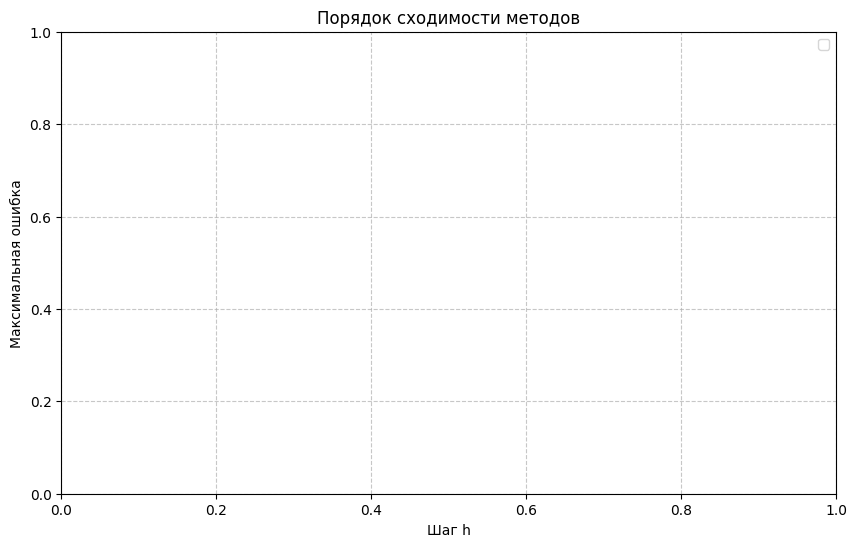

In [15]:
df = run_convergence_analysis(
    y0_system=[1.5, 7.5, 0.0001],
    t_range=[0, 0.01],
    epsilon=0.01
)


ITERATION 0 0
x0= 0.0 y0= 0.0
✅ rk4_solve: успех, 101 шагов (h=0.0001)
✅ pece4_solve: успех, 101 шагов (h=0.0001)
✅ gear4_fixed_step: успех, 101 шагов (h=0.0001)
✅ rk4_solve: успех, 201 шагов (h=5e-05)
✅ pece4_solve: успех, 201 шагов (h=5e-05)
✅ gear4_fixed_step: успех, 201 шагов (h=5e-05)
✅ rk4_solve: успех, 401 шагов (h=2.5e-05)
✅ pece4_solve: успех, 401 шагов (h=2.5e-05)
✅ gear4_fixed_step: успех, 401 шагов (h=2.5e-05)
✅ rk4_solve: успех, 801 шагов (h=1.25e-05)
✅ pece4_solve: успех, 801 шагов (h=1.25e-05)
✅ gear4_fixed_step: успех, 801 шагов (h=1.25e-05)
✅ rk4_solve: успех, 1601 шагов (h=6.25e-06)
✅ pece4_solve: успех, 1601 шагов (h=6.25e-06)
✅ gear4_fixed_step: успех, 1601 шагов (h=6.25e-06)
✅ rk4_solve: успех, 3201 шагов (h=3.125e-06)
✅ pece4_solve: успех, 3201 шагов (h=3.125e-06)
✅ gear4_fixed_step: успех, 3201 шагов (h=3.125e-06)
          h           RK4  p_RK4         PECE4  p_PECE4   Gear4_fixed  p_Gear4_fixed
0  0.000100  4.878910e-19    NaN  4.878910e-19      NaN  2.032879e

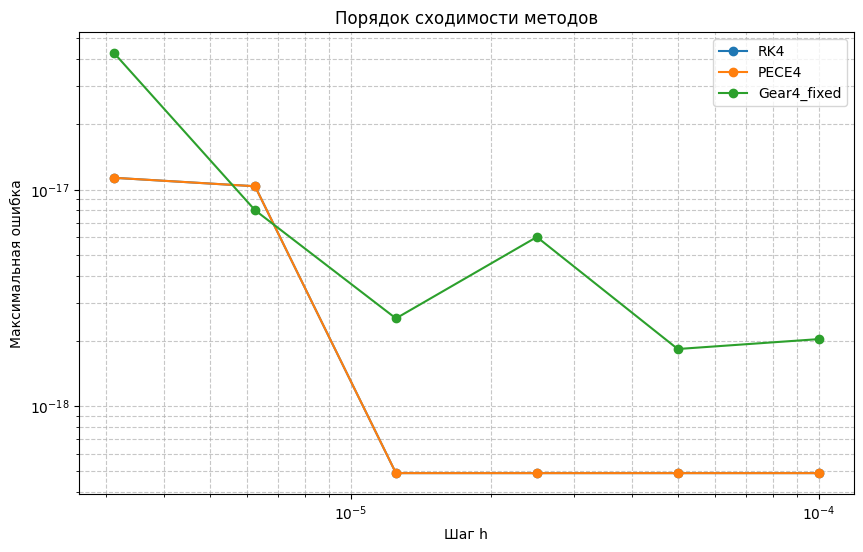

ITERATION 0 1
x0= 0.0 y0= 1.5
✅ rk4_solve: успех, 101 шагов (h=0.0001)
✅ pece4_solve: успех, 101 шагов (h=0.0001)
✅ gear4_fixed_step: успех, 101 шагов (h=0.0001)
✅ rk4_solve: успех, 201 шагов (h=5e-05)
✅ pece4_solve: успех, 201 шагов (h=5e-05)
✅ gear4_fixed_step: успех, 201 шагов (h=5e-05)
✅ rk4_solve: успех, 401 шагов (h=2.5e-05)
✅ pece4_solve: успех, 401 шагов (h=2.5e-05)
✅ gear4_fixed_step: успех, 401 шагов (h=2.5e-05)
✅ rk4_solve: успех, 801 шагов (h=1.25e-05)
✅ pece4_solve: успех, 801 шагов (h=1.25e-05)
✅ gear4_fixed_step: успех, 801 шагов (h=1.25e-05)
✅ rk4_solve: успех, 1601 шагов (h=6.25e-06)
✅ pece4_solve: успех, 1601 шагов (h=6.25e-06)
✅ gear4_fixed_step: успех, 1601 шагов (h=6.25e-06)
✅ rk4_solve: успех, 3201 шагов (h=3.125e-06)
✅ pece4_solve: успех, 3201 шагов (h=3.125e-06)
✅ gear4_fixed_step: успех, 3201 шагов (h=3.125e-06)
          h           RK4  p_RK4         PECE4  p_PECE4   Gear4_fixed  p_Gear4_fixed
0  0.000100  5.076128e-10    NaN  5.076128e-10      NaN  5.076128e

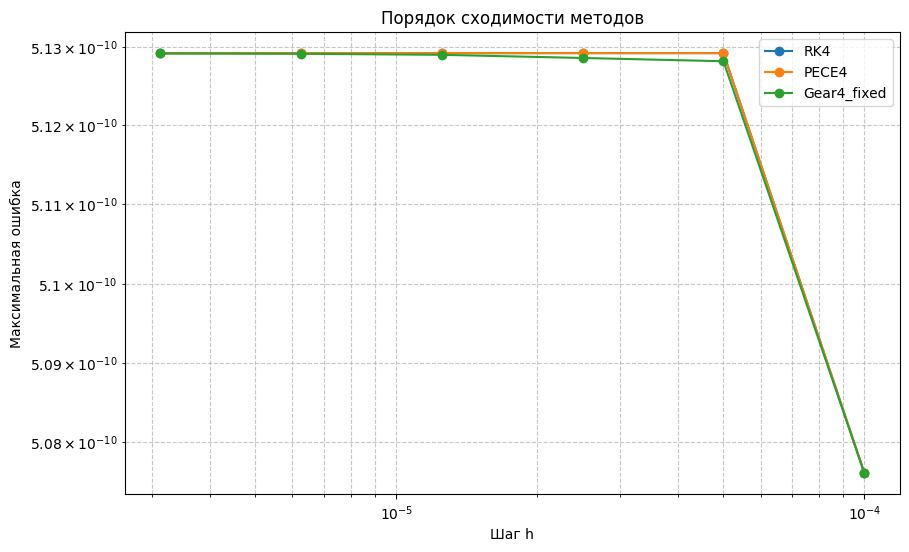

ITERATION 0 2
x0= 0.0 y0= 3.0
✅ rk4_solve: успех, 101 шагов (h=0.0001)
✅ pece4_solve: успех, 101 шагов (h=0.0001)
✅ gear4_fixed_step: успех, 101 шагов (h=0.0001)
✅ rk4_solve: успех, 201 шагов (h=5e-05)
✅ pece4_solve: успех, 201 шагов (h=5e-05)
✅ gear4_fixed_step: успех, 201 шагов (h=5e-05)
✅ rk4_solve: успех, 401 шагов (h=2.5e-05)
✅ pece4_solve: успех, 401 шагов (h=2.5e-05)
✅ gear4_fixed_step: успех, 401 шагов (h=2.5e-05)
✅ rk4_solve: успех, 801 шагов (h=1.25e-05)
✅ pece4_solve: успех, 801 шагов (h=1.25e-05)
✅ gear4_fixed_step: успех, 801 шагов (h=1.25e-05)
✅ rk4_solve: успех, 1601 шагов (h=6.25e-06)
✅ pece4_solve: успех, 1601 шагов (h=6.25e-06)
✅ gear4_fixed_step: успех, 1601 шагов (h=6.25e-06)
✅ rk4_solve: успех, 3201 шагов (h=3.125e-06)
✅ pece4_solve: успех, 3201 шагов (h=3.125e-06)
✅ gear4_fixed_step: успех, 3201 шагов (h=3.125e-06)
          h           RK4  p_RK4         PECE4  p_PECE4   Gear4_fixed  p_Gear4_fixed
0  0.000100  8.191892e-10    NaN  8.191892e-10      NaN  8.191892e

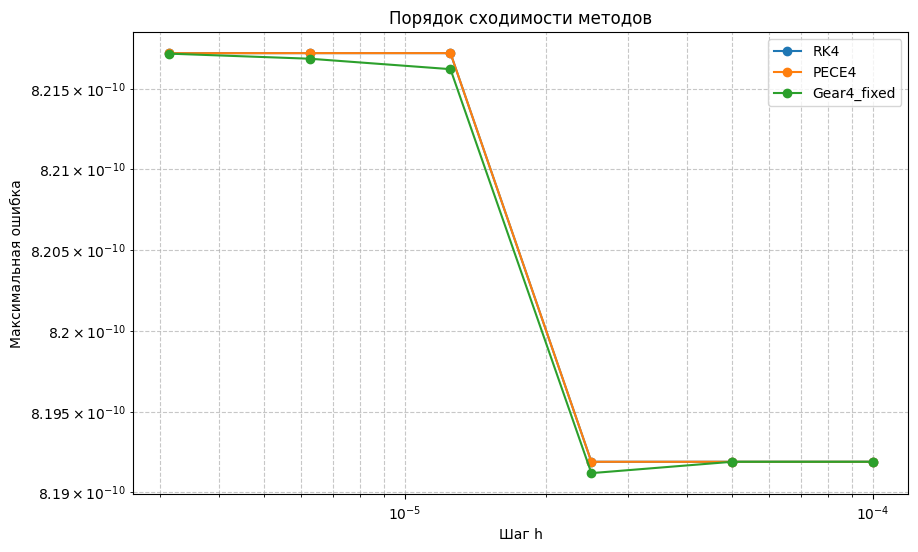

ITERATION 0 3
x0= 0.0 y0= 4.5
✅ rk4_solve: успех, 101 шагов (h=0.0001)
✅ pece4_solve: успех, 101 шагов (h=0.0001)
✅ gear4_fixed_step: успех, 101 шагов (h=0.0001)
✅ rk4_solve: успех, 201 шагов (h=5e-05)
✅ pece4_solve: успех, 201 шагов (h=5e-05)
✅ gear4_fixed_step: успех, 201 шагов (h=5e-05)
✅ rk4_solve: успех, 401 шагов (h=2.5e-05)
✅ pece4_solve: успех, 401 шагов (h=2.5e-05)
✅ gear4_fixed_step: успех, 401 шагов (h=2.5e-05)
✅ rk4_solve: успех, 801 шагов (h=1.25e-05)
✅ pece4_solve: успех, 801 шагов (h=1.25e-05)
✅ gear4_fixed_step: успех, 801 шагов (h=1.25e-05)
✅ rk4_solve: успех, 1601 шагов (h=6.25e-06)
✅ pece4_solve: успех, 1601 шагов (h=6.25e-06)
✅ gear4_fixed_step: успех, 1601 шагов (h=6.25e-06)
✅ rk4_solve: успех, 3201 шагов (h=3.125e-06)
✅ pece4_solve: успех, 3201 шагов (h=3.125e-06)
✅ gear4_fixed_step: успех, 3201 шагов (h=3.125e-06)
          h           RK4  p_RK4         PECE4  p_PECE4   Gear4_fixed  p_Gear4_fixed
0  0.000100  1.116034e-09    NaN  1.116034e-09      NaN  1.116034e

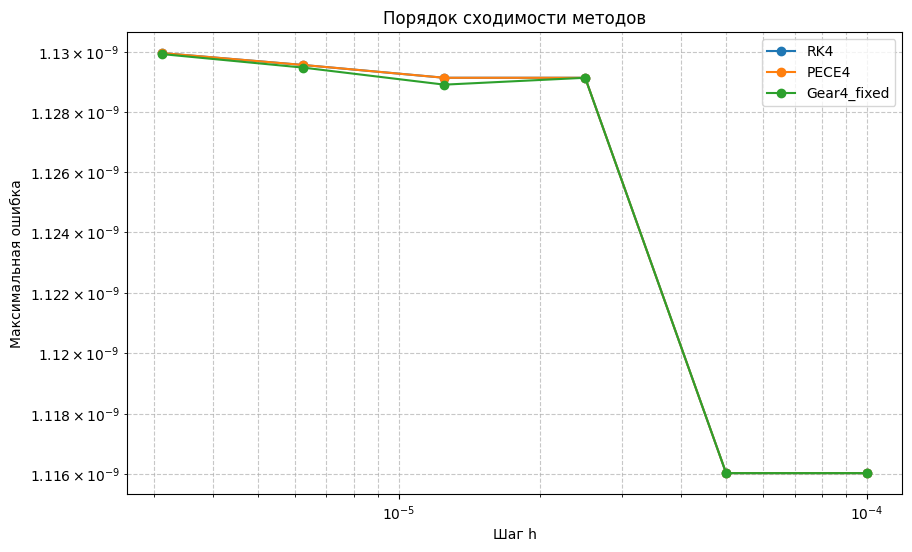

ITERATION 0 4
x0= 0.0 y0= 6.0
✅ rk4_solve: успех, 101 шагов (h=0.0001)
✅ pece4_solve: успех, 101 шагов (h=0.0001)
✅ gear4_fixed_step: успех, 101 шагов (h=0.0001)
✅ rk4_solve: успех, 201 шагов (h=5e-05)
✅ pece4_solve: успех, 201 шагов (h=5e-05)
✅ gear4_fixed_step: успех, 201 шагов (h=5e-05)
✅ rk4_solve: успех, 401 шагов (h=2.5e-05)
✅ pece4_solve: успех, 401 шагов (h=2.5e-05)
✅ gear4_fixed_step: успех, 401 шагов (h=2.5e-05)
✅ rk4_solve: успех, 801 шагов (h=1.25e-05)
✅ pece4_solve: успех, 801 шагов (h=1.25e-05)
✅ gear4_fixed_step: успех, 801 шагов (h=1.25e-05)
✅ rk4_solve: успех, 1601 шагов (h=6.25e-06)
✅ pece4_solve: успех, 1601 шагов (h=6.25e-06)
✅ gear4_fixed_step: успех, 1601 шагов (h=6.25e-06)
✅ rk4_solve: успех, 3201 шагов (h=3.125e-06)
✅ pece4_solve: успех, 3201 шагов (h=3.125e-06)
✅ gear4_fixed_step: успех, 3201 шагов (h=3.125e-06)
          h           RK4  p_RK4         PECE4  p_PECE4   Gear4_fixed  p_Gear4_fixed
0  0.000100  1.403369e-09    NaN  1.403369e-09      NaN  1.403369e

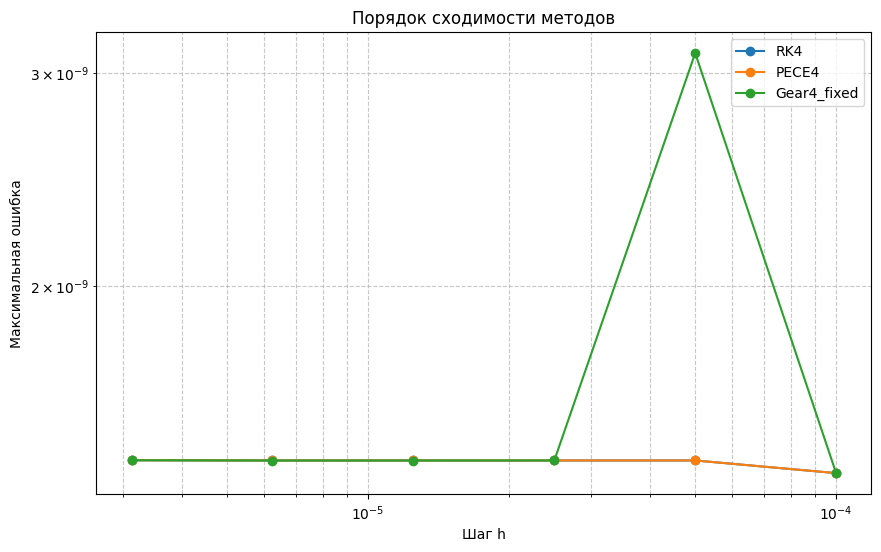

ITERATION 0 5
x0= 0.0 y0= 7.5
✅ rk4_solve: успех, 101 шагов (h=0.0001)
✅ pece4_solve: успех, 101 шагов (h=0.0001)
✅ gear4_fixed_step: успех, 101 шагов (h=0.0001)
✅ rk4_solve: успех, 201 шагов (h=5e-05)
✅ pece4_solve: успех, 201 шагов (h=5e-05)
✅ gear4_fixed_step: успех, 201 шагов (h=5e-05)
✅ rk4_solve: успех, 401 шагов (h=2.5e-05)
✅ pece4_solve: успех, 401 шагов (h=2.5e-05)
✅ gear4_fixed_step: успех, 401 шагов (h=2.5e-05)
✅ rk4_solve: успех, 801 шагов (h=1.25e-05)
✅ pece4_solve: успех, 801 шагов (h=1.25e-05)
✅ gear4_fixed_step: успех, 801 шагов (h=1.25e-05)
✅ rk4_solve: успех, 1601 шагов (h=6.25e-06)
✅ pece4_solve: успех, 1601 шагов (h=6.25e-06)
✅ gear4_fixed_step: успех, 1601 шагов (h=6.25e-06)
✅ rk4_solve: успех, 3201 шагов (h=3.125e-06)
✅ pece4_solve: успех, 3201 шагов (h=3.125e-06)
✅ gear4_fixed_step: успех, 3201 шагов (h=3.125e-06)
          h           RK4  p_RK4         PECE4  p_PECE4   Gear4_fixed  p_Gear4_fixed
0  0.000100  1.619427e-09    NaN  1.619427e-09      NaN  1.619427e

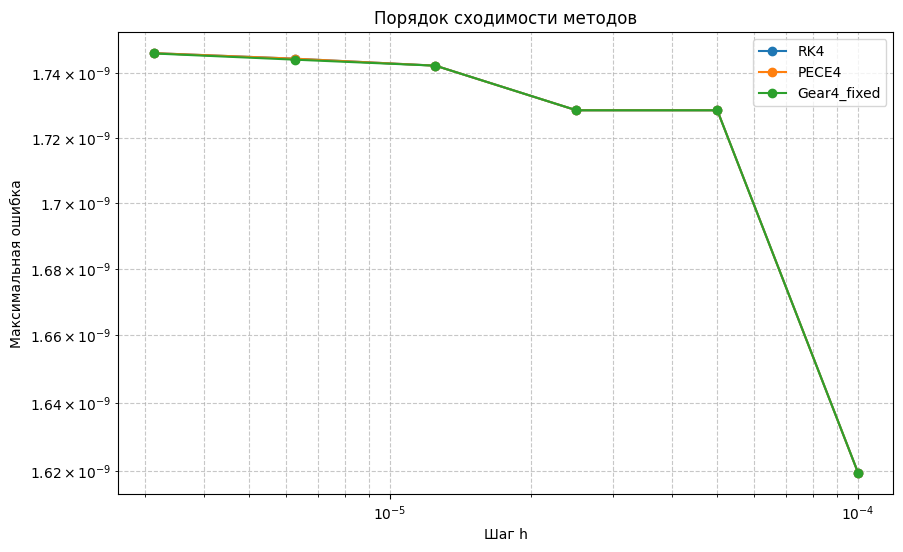

ITERATION 0 6
x0= 0.0 y0= 9.0
✅ rk4_solve: успех, 101 шагов (h=0.0001)
✅ pece4_solve: успех, 101 шагов (h=0.0001)
✅ gear4_fixed_step: успех, 101 шагов (h=0.0001)
✅ rk4_solve: успех, 201 шагов (h=5e-05)
✅ pece4_solve: успех, 201 шагов (h=5e-05)
✅ gear4_fixed_step: успех, 201 шагов (h=5e-05)
✅ rk4_solve: успех, 401 шагов (h=2.5e-05)
✅ pece4_solve: успех, 401 шагов (h=2.5e-05)
✅ gear4_fixed_step: успех, 401 шагов (h=2.5e-05)
✅ rk4_solve: успех, 801 шагов (h=1.25e-05)
✅ pece4_solve: успех, 801 шагов (h=1.25e-05)
✅ gear4_fixed_step: успех, 801 шагов (h=1.25e-05)
✅ rk4_solve: успех, 1601 шагов (h=6.25e-06)
✅ pece4_solve: успех, 1601 шагов (h=6.25e-06)
✅ gear4_fixed_step: успех, 1601 шагов (h=6.25e-06)
✅ rk4_solve: успех, 3201 шагов (h=3.125e-06)
✅ pece4_solve: успех, 3201 шагов (h=3.125e-06)
✅ gear4_fixed_step: успех, 3201 шагов (h=3.125e-06)
          h           RK4  p_RK4         PECE4  p_PECE4   Gear4_fixed  p_Gear4_fixed
0  0.000100  1.729571e-09    NaN  1.729571e-09      NaN  1.729571e

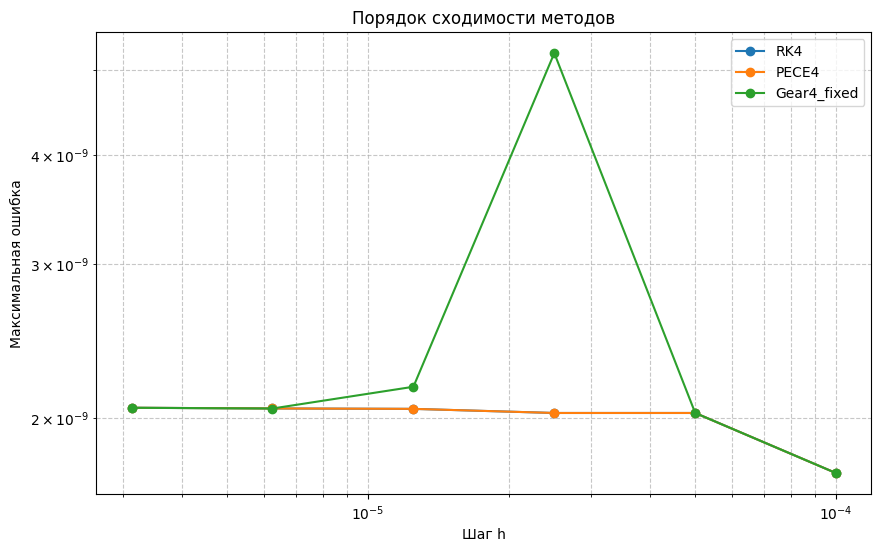

ITERATION 0 7
x0= 0.0 y0= 10.5
✅ rk4_solve: успех, 101 шагов (h=0.0001)
✅ pece4_solve: успех, 101 шагов (h=0.0001)
✅ gear4_fixed_step: успех, 101 шагов (h=0.0001)
✅ rk4_solve: успех, 201 шагов (h=5e-05)
✅ pece4_solve: успех, 201 шагов (h=5e-05)
✅ gear4_fixed_step: успех, 201 шагов (h=5e-05)
✅ rk4_solve: успех, 401 шагов (h=2.5e-05)
✅ pece4_solve: успех, 401 шагов (h=2.5e-05)
✅ gear4_fixed_step: успех, 401 шагов (h=2.5e-05)
✅ rk4_solve: успех, 801 шагов (h=1.25e-05)
✅ pece4_solve: успех, 801 шагов (h=1.25e-05)
✅ gear4_fixed_step: успех, 801 шагов (h=1.25e-05)
✅ rk4_solve: успех, 1601 шагов (h=6.25e-06)
✅ pece4_solve: успех, 1601 шагов (h=6.25e-06)
✅ gear4_fixed_step: успех, 1601 шагов (h=6.25e-06)
✅ rk4_solve: успех, 3201 шагов (h=3.125e-06)
✅ pece4_solve: успех, 3201 шагов (h=3.125e-06)
✅ gear4_fixed_step: успех, 3201 шагов (h=3.125e-06)
          h           RK4  p_RK4         PECE4  p_PECE4   Gear4_fixed  p_Gear4_fixed
0  0.000100  2.014804e-09    NaN  2.014701e-09      NaN  1.959657

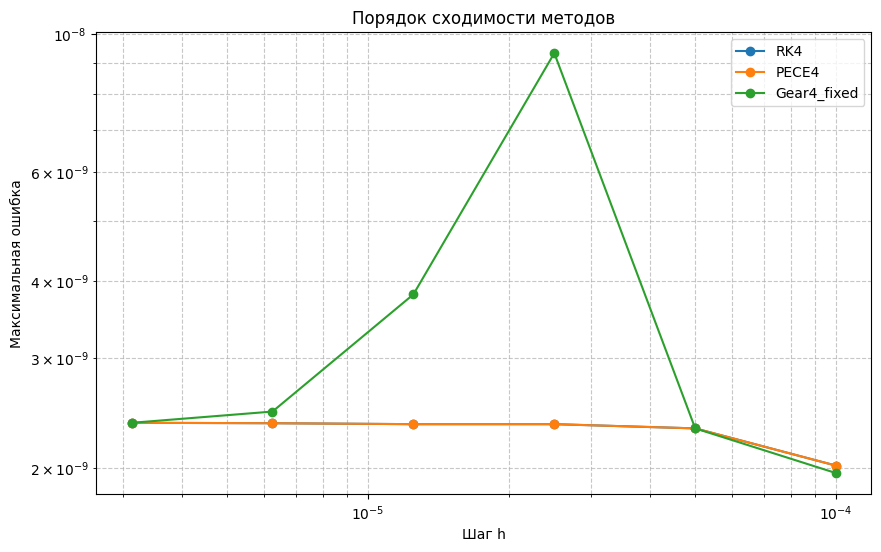

ITERATION 0 8
x0= 0.0 y0= 12.0
✅ rk4_solve: успех, 101 шагов (h=0.0001)
✅ pece4_solve: успех, 101 шагов (h=0.0001)
✅ gear4_fixed_step: успех, 101 шагов (h=0.0001)
✅ rk4_solve: успех, 201 шагов (h=5e-05)
✅ pece4_solve: успех, 201 шагов (h=5e-05)
✅ gear4_fixed_step: успех, 201 шагов (h=5e-05)
✅ rk4_solve: успех, 401 шагов (h=2.5e-05)
✅ pece4_solve: успех, 401 шагов (h=2.5e-05)
✅ gear4_fixed_step: успех, 401 шагов (h=2.5e-05)
✅ rk4_solve: успех, 801 шагов (h=1.25e-05)
✅ pece4_solve: успех, 801 шагов (h=1.25e-05)
✅ gear4_fixed_step: успех, 801 шагов (h=1.25e-05)
✅ rk4_solve: успех, 1601 шагов (h=6.25e-06)
✅ pece4_solve: успех, 1601 шагов (h=6.25e-06)
✅ gear4_fixed_step: успех, 1601 шагов (h=6.25e-06)
✅ rk4_solve: успех, 3201 шагов (h=3.125e-06)
✅ pece4_solve: успех, 3201 шагов (h=3.125e-06)
✅ gear4_fixed_step: успех, 3201 шагов (h=3.125e-06)
          h           RK4  p_RK4         PECE4  p_PECE4   Gear4_fixed  p_Gear4_fixed
0  0.000100  3.064986e-09    NaN  3.064750e-09      NaN  2.955217

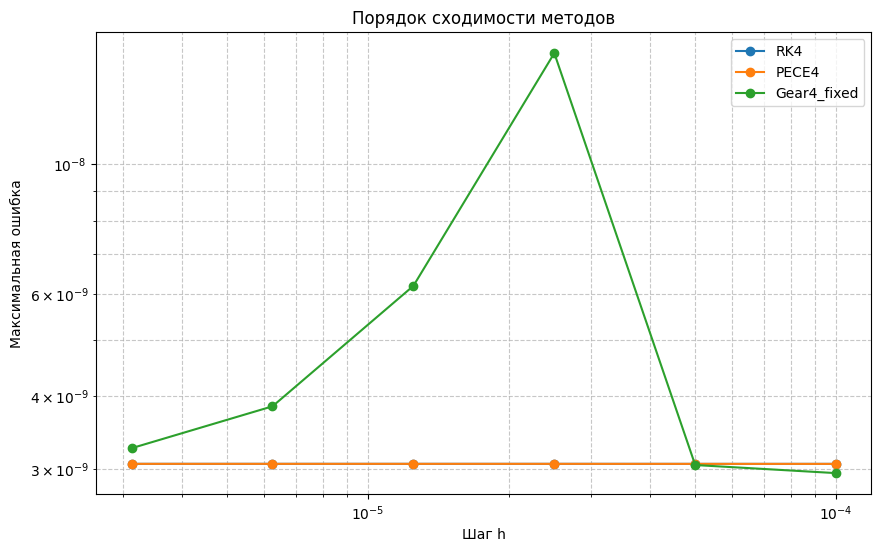

ITERATION 0 9
x0= 0.0 y0= 13.5
✅ rk4_solve: успех, 101 шагов (h=0.0001)
✅ pece4_solve: успех, 101 шагов (h=0.0001)
✅ gear4_fixed_step: успех, 101 шагов (h=0.0001)
✅ rk4_solve: успех, 201 шагов (h=5e-05)
✅ pece4_solve: успех, 201 шагов (h=5e-05)
✅ gear4_fixed_step: успех, 201 шагов (h=5e-05)
✅ rk4_solve: успех, 401 шагов (h=2.5e-05)
✅ pece4_solve: успех, 401 шагов (h=2.5e-05)
✅ gear4_fixed_step: успех, 401 шагов (h=2.5e-05)
✅ rk4_solve: успех, 801 шагов (h=1.25e-05)
✅ pece4_solve: успех, 801 шагов (h=1.25e-05)
✅ gear4_fixed_step: успех, 801 шагов (h=1.25e-05)
✅ rk4_solve: успех, 1601 шагов (h=6.25e-06)
✅ pece4_solve: успех, 1601 шагов (h=6.25e-06)
✅ gear4_fixed_step: успех, 1601 шагов (h=6.25e-06)
✅ rk4_solve: успех, 3201 шагов (h=3.125e-06)
✅ pece4_solve: успех, 3201 шагов (h=3.125e-06)
✅ gear4_fixed_step: успех, 3201 шагов (h=3.125e-06)
          h           RK4  p_RK4         PECE4  p_PECE4   Gear4_fixed  p_Gear4_fixed
0  0.000100  3.471113e-09    NaN  3.470687e-09      NaN  3.289019

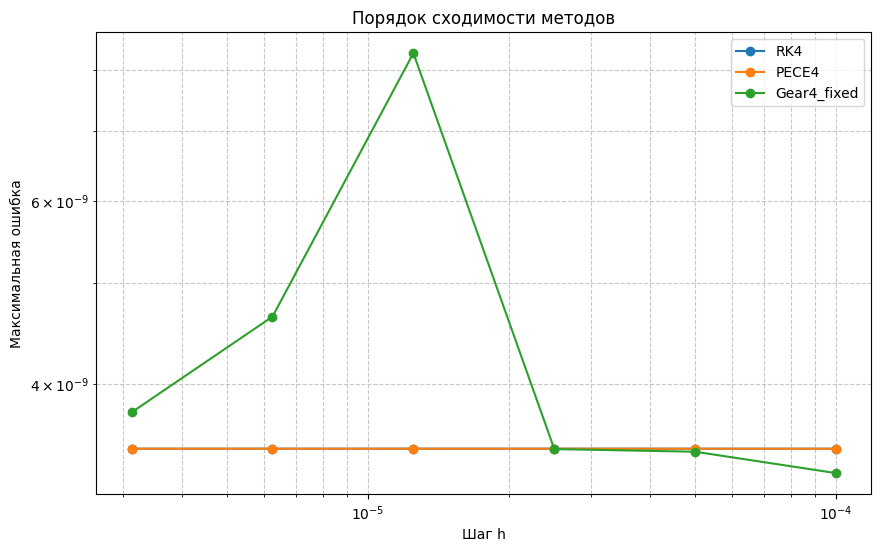

ITERATION 1 0
x0= 0.3 y0= 0.0
✅ rk4_solve: успех, 101 шагов (h=0.0001)
✅ pece4_solve: успех, 101 шагов (h=0.0001)
✅ gear4_fixed_step: успех, 101 шагов (h=0.0001)
✅ rk4_solve: успех, 201 шагов (h=5e-05)
✅ pece4_solve: успех, 201 шагов (h=5e-05)
✅ gear4_fixed_step: успех, 201 шагов (h=5e-05)
✅ rk4_solve: успех, 401 шагов (h=2.5e-05)
✅ pece4_solve: успех, 401 шагов (h=2.5e-05)
✅ gear4_fixed_step: успех, 401 шагов (h=2.5e-05)
✅ rk4_solve: успех, 801 шагов (h=1.25e-05)
✅ pece4_solve: успех, 801 шагов (h=1.25e-05)
✅ gear4_fixed_step: успех, 801 шагов (h=1.25e-05)
✅ rk4_solve: успех, 1601 шагов (h=6.25e-06)
✅ pece4_solve: успех, 1601 шагов (h=6.25e-06)
✅ gear4_fixed_step: успех, 1601 шагов (h=6.25e-06)
✅ rk4_solve: успех, 3201 шагов (h=3.125e-06)
✅ pece4_solve: успех, 3201 шагов (h=3.125e-06)
✅ gear4_fixed_step: успех, 3201 шагов (h=3.125e-06)
          h           RK4  p_RK4         PECE4  p_PECE4   Gear4_fixed  p_Gear4_fixed
0  0.000100  2.830114e-10    NaN  2.830114e-10      NaN  2.855683e

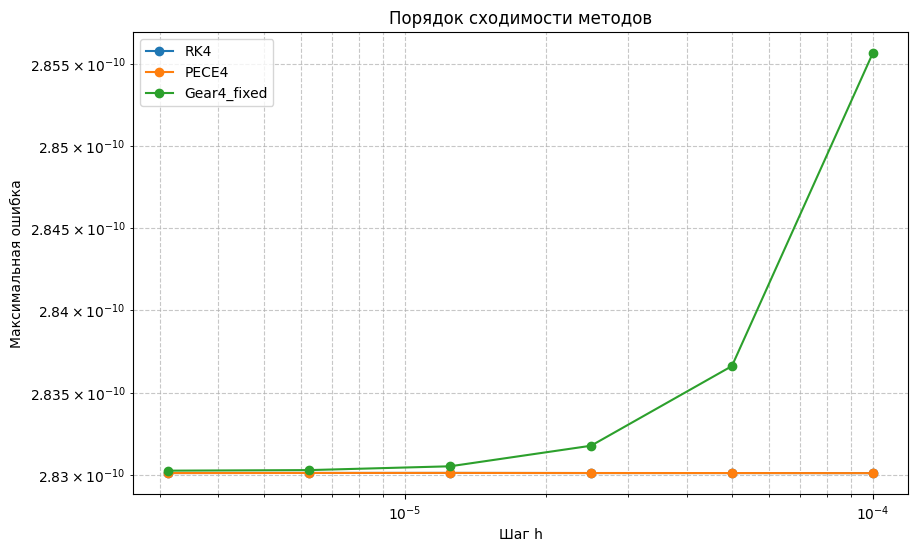

ITERATION 1 1
x0= 0.3 y0= 1.5
❌ rk4_solve: NaN или inf в решении (h=0.0001)
⚠️ RK4 при h=0.0001: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ pece4_solve: NaN или inf в решении (h=0.0001)
⚠️ PECE4 при h=0.0001: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ Gear4: расходимость на шаге 3, h=0.0001
❌ gear4_fixed_step: NaN или inf в решении (h=0.0001)
⚠️ Gear4_fixed при h=0.0001: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ rk4_solve: NaN или inf в решении (h=5e-05)
⚠️ RK4 при h=5e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ pece4_solve: NaN или inf в решении (h=5e-05)
⚠️ PECE4 при h=5e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ Gear4: расходимость на шаге 3, h=5e-05
❌ gear4_fixed_step: NaN или inf в решении (h=5e-05)
⚠️ Gear4_fixed при h=5e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ rk4_solve: NaN или inf в решении (h=2.5e-05)
⚠️ RK4 при

C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:7: RuntimeWarning: overflow encountered in scalar multiply
  dydt = y * (2 * a2 - 0.5 * y - 3.5 * (a2_reg**2) * x)
C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:8: RuntimeWarning: overflow encountered in scalar multiply
  da2dt = epsilon * (2 - 7 * a2 * x)
C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:6: RuntimeWarning: invalid value encountered in scalar multiply
  dxdt = x * (1 - 0.5 * x - (2/7) * (a2_reg**-2) * y)
C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:7: RuntimeWarning: invalid value encountered in scalar subtract
  dydt = y * (2 * a2 - 0.5 * y - 3.5 * (a2_reg**2) * x)
C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:7: RuntimeWarning: overflow encountered in scalar power
  dydt = y * (2 * a2 - 0.5 * y - 3.5 * (a2_reg**2) * x)


❌ Gear4: расходимость на шаге 3, h=2.5e-05
❌ gear4_fixed_step: NaN или inf в решении (h=2.5e-05)
⚠️ Gear4_fixed при h=2.5e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ rk4_solve: NaN или inf в решении (h=1.25e-05)
⚠️ RK4 при h=1.25e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ pece4_solve: NaN или inf в решении (h=1.25e-05)
⚠️ PECE4 при h=1.25e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ Gear4: расходимость на шаге 3, h=1.25e-05
❌ gear4_fixed_step: NaN или inf в решении (h=1.25e-05)
⚠️ Gear4_fixed при h=1.25e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ rk4_solve: NaN или inf в решении (h=6.25e-06)
⚠️ RK4 при h=6.25e-06: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ pece4_solve: NaN или inf в решении (h=6.25e-06)
⚠️ PECE4 при h=6.25e-06: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ Gear4: расходимость на шаге 3, h=6.25e-06
❌ gear4_fix

C:\Users\lilia\AppData\Local\Programs\Python\Python313\Lib\site-packages\numpy\linalg\_linalg.py:2792: RuntimeWarning: overflow encountered in dot
  sqnorm = x.dot(x)
C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3955799424.py:41: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend()


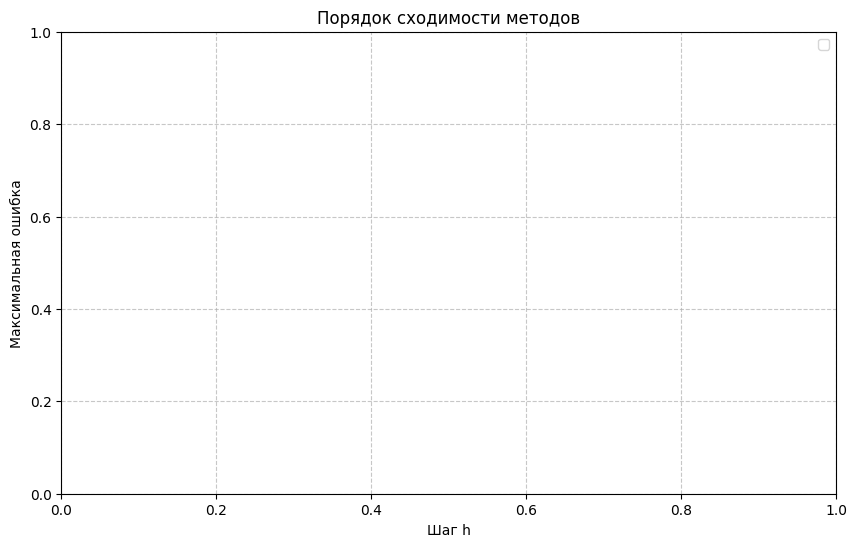

ITERATION 1 2
x0= 0.3 y0= 3.0
❌ rk4_solve: NaN или inf в решении (h=0.0001)
⚠️ RK4 при h=0.0001: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ pece4_solve: NaN или inf в решении (h=0.0001)
⚠️ PECE4 при h=0.0001: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ Gear4: расходимость на шаге 3, h=0.0001
❌ gear4_fixed_step: NaN или inf в решении (h=0.0001)
⚠️ Gear4_fixed при h=0.0001: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ rk4_solve: NaN или inf в решении (h=5e-05)
⚠️ RK4 при h=5e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ pece4_solve: NaN или inf в решении (h=5e-05)
⚠️ PECE4 при h=5e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ Gear4: расходимость на шаге 3, h=5e-05
❌ gear4_fixed_step: NaN или inf в решении (h=5e-05)
⚠️ Gear4_fixed при h=5e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ rk4_solve: NaN или inf в решении (h=2.5e-05)
⚠️ RK4 при

C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:7: RuntimeWarning: overflow encountered in scalar multiply
  dydt = y * (2 * a2 - 0.5 * y - 3.5 * (a2_reg**2) * x)
C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:6: RuntimeWarning: invalid value encountered in scalar multiply
  dxdt = x * (1 - 0.5 * x - (2/7) * (a2_reg**-2) * y)
C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:7: RuntimeWarning: overflow encountered in scalar power
  dydt = y * (2 * a2 - 0.5 * y - 3.5 * (a2_reg**2) * x)
C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:7: RuntimeWarning: invalid value encountered in scalar subtract
  dydt = y * (2 * a2 - 0.5 * y - 3.5 * (a2_reg**2) * x)
C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:8: RuntimeWarning: overflow encountered in scalar multiply
  da2dt = epsilon * (2 - 7 * a2 * x)


❌ rk4_solve: NaN или inf в решении (h=1.25e-05)
⚠️ RK4 при h=1.25e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ pece4_solve: NaN или inf в решении (h=1.25e-05)
⚠️ PECE4 при h=1.25e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ Gear4: расходимость на шаге 3, h=1.25e-05
❌ gear4_fixed_step: NaN или inf в решении (h=1.25e-05)
⚠️ Gear4_fixed при h=1.25e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ rk4_solve: NaN или inf в решении (h=6.25e-06)
⚠️ RK4 при h=6.25e-06: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ pece4_solve: NaN или inf в решении (h=6.25e-06)
⚠️ PECE4 при h=6.25e-06: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ Gear4: расходимость на шаге 3, h=6.25e-06
❌ gear4_fixed_step: NaN или inf в решении (h=6.25e-06)
⚠️ Gear4_fixed при h=6.25e-06: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ rk4_solve: NaN или inf в решении (h=3.125e-06)
⚠️ 

C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3955799424.py:41: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend()


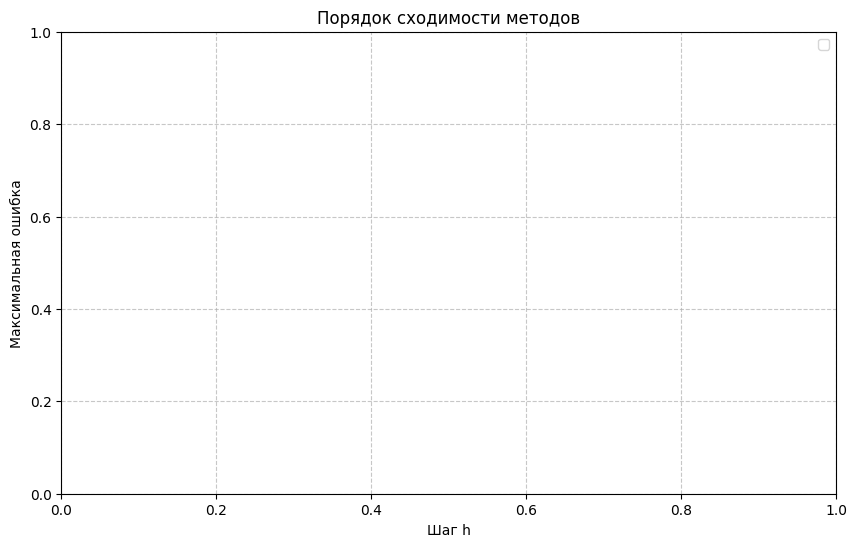

ITERATION 1 3
x0= 0.3 y0= 4.5
❌ rk4_solve: NaN или inf в решении (h=0.0001)
⚠️ RK4 при h=0.0001: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ pece4_solve: NaN или inf в решении (h=0.0001)
⚠️ PECE4 при h=0.0001: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ Gear4: расходимость на шаге 3, h=0.0001
❌ gear4_fixed_step: NaN или inf в решении (h=0.0001)
⚠️ Gear4_fixed при h=0.0001: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ rk4_solve: NaN или inf в решении (h=5e-05)
⚠️ RK4 при h=5e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ pece4_solve: NaN или inf в решении (h=5e-05)
⚠️ PECE4 при h=5e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ Gear4: расходимость на шаге 3, h=5e-05
❌ gear4_fixed_step: NaN или inf в решении (h=5e-05)
⚠️ Gear4_fixed при h=5e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ rk4_solve: NaN или inf в решении (h=2.5e-05)
⚠️ RK4 при

C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:7: RuntimeWarning: overflow encountered in scalar multiply
  dydt = y * (2 * a2 - 0.5 * y - 3.5 * (a2_reg**2) * x)
C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:6: RuntimeWarning: invalid value encountered in scalar multiply
  dxdt = x * (1 - 0.5 * x - (2/7) * (a2_reg**-2) * y)
C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:7: RuntimeWarning: overflow encountered in scalar power
  dydt = y * (2 * a2 - 0.5 * y - 3.5 * (a2_reg**2) * x)
C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:7: RuntimeWarning: invalid value encountered in scalar subtract
  dydt = y * (2 * a2 - 0.5 * y - 3.5 * (a2_reg**2) * x)
C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:8: RuntimeWarning: overflow encountered in scalar multiply
  da2dt = epsilon * (2 - 7 * a2 * x)


❌ Gear4: расходимость на шаге 3, h=2.5e-05
❌ gear4_fixed_step: NaN или inf в решении (h=2.5e-05)
⚠️ Gear4_fixed при h=2.5e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ rk4_solve: NaN или inf в решении (h=1.25e-05)
⚠️ RK4 при h=1.25e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ pece4_solve: NaN или inf в решении (h=1.25e-05)
⚠️ PECE4 при h=1.25e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ Gear4: расходимость на шаге 3, h=1.25e-05
❌ gear4_fixed_step: NaN или inf в решении (h=1.25e-05)
⚠️ Gear4_fixed при h=1.25e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ rk4_solve: NaN или inf в решении (h=6.25e-06)
⚠️ RK4 при h=6.25e-06: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ pece4_solve: NaN или inf в решении (h=6.25e-06)
⚠️ PECE4 при h=6.25e-06: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ Gear4: расходимость на шаге 3, h=6.25e-06
❌ gear4_fix

C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\1111329400.py:11: RuntimeWarning: invalid value encountered in add
  return y + h/6 * (k1 + 2*k2 + 2*k3 + k4)


❌ rk4_solve: NaN или inf в решении (h=3.125e-06)
⚠️ RK4 при h=3.125e-06: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ pece4_solve: NaN или inf в решении (h=3.125e-06)
⚠️ PECE4 при h=3.125e-06: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ Gear4: расходимость на шаге 3, h=3.125e-06
❌ gear4_fixed_step: NaN или inf в решении (h=3.125e-06)
⚠️ Gear4_fixed при h=3.125e-06: operands could not be broadcast together with shapes (1,0) (1,3) 
          h  RK4  p_RK4  PECE4  p_PECE4  Gear4_fixed  p_Gear4_fixed
0  0.000100  NaN    NaN    NaN      NaN          NaN            NaN
1  0.000050  NaN    NaN    NaN      NaN          NaN            NaN
2  0.000025  NaN    NaN    NaN      NaN          NaN            NaN
3  0.000013  NaN    NaN    NaN      NaN          NaN            NaN
4  0.000006  NaN    NaN    NaN      NaN          NaN            NaN
5  0.000003  NaN    NaN    NaN      NaN          NaN            NaN


C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3955799424.py:41: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend()


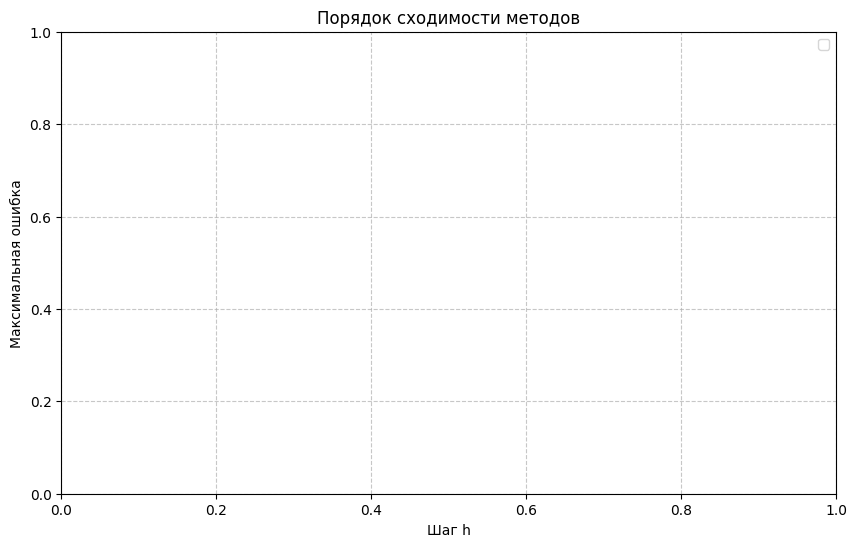

ITERATION 1 4
x0= 0.3 y0= 6.0
❌ rk4_solve: NaN или inf в решении (h=0.0001)
⚠️ RK4 при h=0.0001: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ pece4_solve: NaN или inf в решении (h=0.0001)
⚠️ PECE4 при h=0.0001: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ Gear4: расходимость на шаге 3, h=0.0001
❌ gear4_fixed_step: NaN или inf в решении (h=0.0001)
⚠️ Gear4_fixed при h=0.0001: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ rk4_solve: NaN или inf в решении (h=5e-05)
⚠️ RK4 при h=5e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ pece4_solve: NaN или inf в решении (h=5e-05)
⚠️ PECE4 при h=5e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ Gear4: расходимость на шаге 3, h=5e-05
❌ gear4_fixed_step: NaN или inf в решении (h=5e-05)
⚠️ Gear4_fixed при h=5e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ rk4_solve: NaN или inf в решении (h=2.5e-05)
⚠️ RK4 при

C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:7: RuntimeWarning: overflow encountered in scalar multiply
  dydt = y * (2 * a2 - 0.5 * y - 3.5 * (a2_reg**2) * x)
C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:6: RuntimeWarning: invalid value encountered in scalar multiply
  dxdt = x * (1 - 0.5 * x - (2/7) * (a2_reg**-2) * y)
C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:7: RuntimeWarning: overflow encountered in scalar power
  dydt = y * (2 * a2 - 0.5 * y - 3.5 * (a2_reg**2) * x)
C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:7: RuntimeWarning: invalid value encountered in scalar subtract
  dydt = y * (2 * a2 - 0.5 * y - 3.5 * (a2_reg**2) * x)
C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:8: RuntimeWarning: overflow encountered in scalar multiply
  da2dt = epsilon * (2 - 7 * a2 * x)
C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\1111329400.py:11: RuntimeWarning: invalid value encountered in add
  

❌ rk4_solve: NaN или inf в решении (h=1.25e-05)
⚠️ RK4 при h=1.25e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ pece4_solve: NaN или inf в решении (h=1.25e-05)
⚠️ PECE4 при h=1.25e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ Gear4: расходимость на шаге 3, h=1.25e-05
❌ gear4_fixed_step: NaN или inf в решении (h=1.25e-05)
⚠️ Gear4_fixed при h=1.25e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ rk4_solve: NaN или inf в решении (h=6.25e-06)
⚠️ RK4 при h=6.25e-06: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ pece4_solve: NaN или inf в решении (h=6.25e-06)
⚠️ PECE4 при h=6.25e-06: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ Gear4: расходимость на шаге 3, h=6.25e-06
❌ gear4_fixed_step: NaN или inf в решении (h=6.25e-06)
⚠️ Gear4_fixed при h=6.25e-06: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ rk4_solve: NaN или inf в решении (h=3.125e-06)
⚠️ 

C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3955799424.py:41: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend()


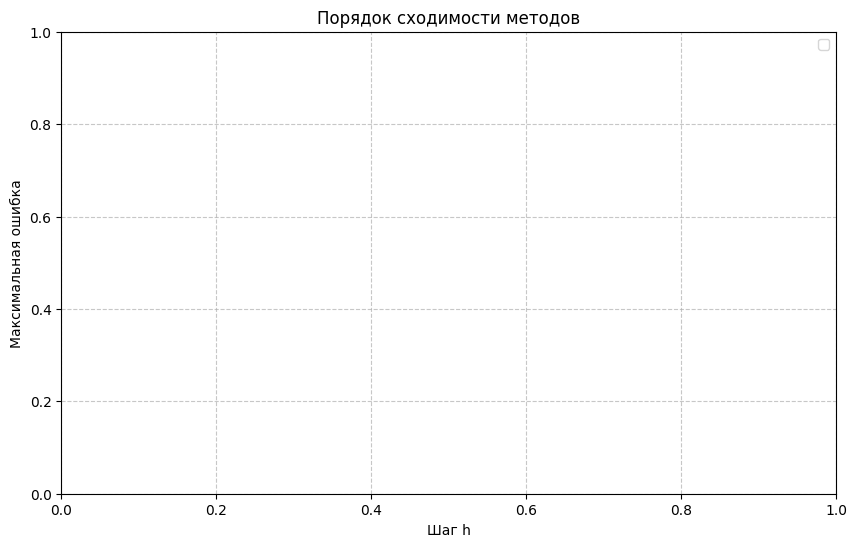

ITERATION 1 5
x0= 0.3 y0= 7.5
❌ rk4_solve: NaN или inf в решении (h=0.0001)
⚠️ RK4 при h=0.0001: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ pece4_solve: NaN или inf в решении (h=0.0001)
⚠️ PECE4 при h=0.0001: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ Gear4: расходимость на шаге 3, h=0.0001
❌ gear4_fixed_step: NaN или inf в решении (h=0.0001)
⚠️ Gear4_fixed при h=0.0001: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ rk4_solve: NaN или inf в решении (h=5e-05)
⚠️ RK4 при h=5e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ pece4_solve: NaN или inf в решении (h=5e-05)
⚠️ PECE4 при h=5e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ Gear4: расходимость на шаге 3, h=5e-05
❌ gear4_fixed_step: NaN или inf в решении (h=5e-05)
⚠️ Gear4_fixed при h=5e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ rk4_solve: NaN или inf в решении (h=2.5e-05)
⚠️ RK4 при

C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:7: RuntimeWarning: overflow encountered in scalar multiply
  dydt = y * (2 * a2 - 0.5 * y - 3.5 * (a2_reg**2) * x)
C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:6: RuntimeWarning: invalid value encountered in scalar multiply
  dxdt = x * (1 - 0.5 * x - (2/7) * (a2_reg**-2) * y)
C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:7: RuntimeWarning: overflow encountered in scalar power
  dydt = y * (2 * a2 - 0.5 * y - 3.5 * (a2_reg**2) * x)
C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:7: RuntimeWarning: invalid value encountered in scalar subtract
  dydt = y * (2 * a2 - 0.5 * y - 3.5 * (a2_reg**2) * x)
C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:8: RuntimeWarning: overflow encountered in scalar multiply
  da2dt = epsilon * (2 - 7 * a2 * x)


❌ pece4_solve: NaN или inf в решении (h=2.5e-05)
⚠️ PECE4 при h=2.5e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ Gear4: расходимость на шаге 3, h=2.5e-05
❌ gear4_fixed_step: NaN или inf в решении (h=2.5e-05)
⚠️ Gear4_fixed при h=2.5e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ rk4_solve: NaN или inf в решении (h=1.25e-05)
⚠️ RK4 при h=1.25e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ pece4_solve: NaN или inf в решении (h=1.25e-05)
⚠️ PECE4 при h=1.25e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ Gear4: расходимость на шаге 3, h=1.25e-05
❌ gear4_fixed_step: NaN или inf в решении (h=1.25e-05)
⚠️ Gear4_fixed при h=1.25e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ rk4_solve: NaN или inf в решении (h=6.25e-06)
⚠️ RK4 при h=6.25e-06: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ pece4_solve: NaN или inf в решении (h=6.25e-06)
⚠️ PECE

C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3955799424.py:41: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend()


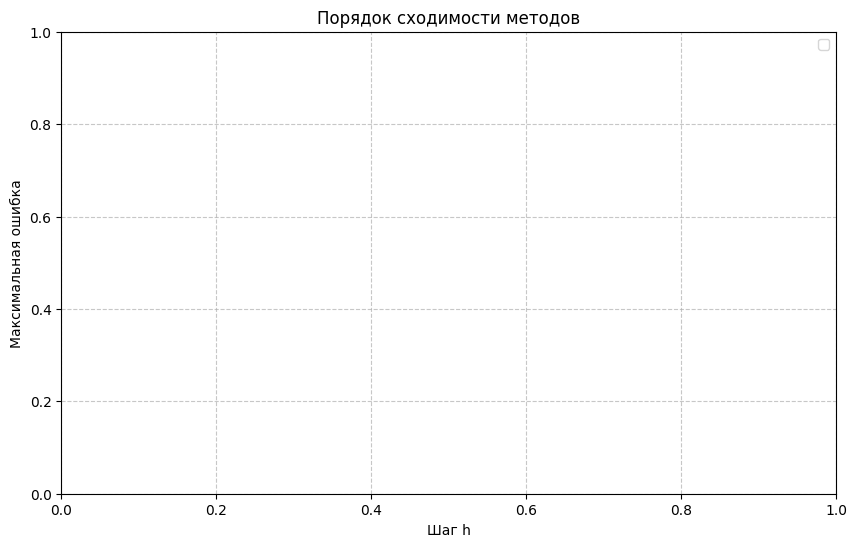

ITERATION 1 6
x0= 0.3 y0= 9.0
❌ rk4_solve: NaN или inf в решении (h=0.0001)
⚠️ RK4 при h=0.0001: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ pece4_solve: NaN или inf в решении (h=0.0001)
⚠️ PECE4 при h=0.0001: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ Gear4: расходимость на шаге 3, h=0.0001
❌ gear4_fixed_step: NaN или inf в решении (h=0.0001)
⚠️ Gear4_fixed при h=0.0001: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ rk4_solve: NaN или inf в решении (h=5e-05)
⚠️ RK4 при h=5e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ pece4_solve: NaN или inf в решении (h=5e-05)
⚠️ PECE4 при h=5e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ Gear4: расходимость на шаге 3, h=5e-05
❌ gear4_fixed_step: NaN или inf в решении (h=5e-05)
⚠️ Gear4_fixed при h=5e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ rk4_solve: NaN или inf в решении (h=2.5e-05)
⚠️ RK4 при

C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:7: RuntimeWarning: overflow encountered in scalar multiply
  dydt = y * (2 * a2 - 0.5 * y - 3.5 * (a2_reg**2) * x)
C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:6: RuntimeWarning: invalid value encountered in scalar multiply
  dxdt = x * (1 - 0.5 * x - (2/7) * (a2_reg**-2) * y)
C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:7: RuntimeWarning: overflow encountered in scalar power
  dydt = y * (2 * a2 - 0.5 * y - 3.5 * (a2_reg**2) * x)
C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:7: RuntimeWarning: invalid value encountered in scalar subtract
  dydt = y * (2 * a2 - 0.5 * y - 3.5 * (a2_reg**2) * x)
C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:8: RuntimeWarning: overflow encountered in scalar multiply
  da2dt = epsilon * (2 - 7 * a2 * x)


❌ rk4_solve: NaN или inf в решении (h=1.25e-05)
⚠️ RK4 при h=1.25e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ pece4_solve: NaN или inf в решении (h=1.25e-05)
⚠️ PECE4 при h=1.25e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ Gear4: расходимость на шаге 3, h=1.25e-05
❌ gear4_fixed_step: NaN или inf в решении (h=1.25e-05)
⚠️ Gear4_fixed при h=1.25e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ rk4_solve: NaN или inf в решении (h=6.25e-06)
⚠️ RK4 при h=6.25e-06: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ pece4_solve: NaN или inf в решении (h=6.25e-06)
⚠️ PECE4 при h=6.25e-06: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ Gear4: расходимость на шаге 3, h=6.25e-06
❌ gear4_fixed_step: NaN или inf в решении (h=6.25e-06)
⚠️ Gear4_fixed при h=6.25e-06: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ rk4_solve: NaN или inf в решении (h=3.125e-06)
⚠️ 

C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3955799424.py:41: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend()


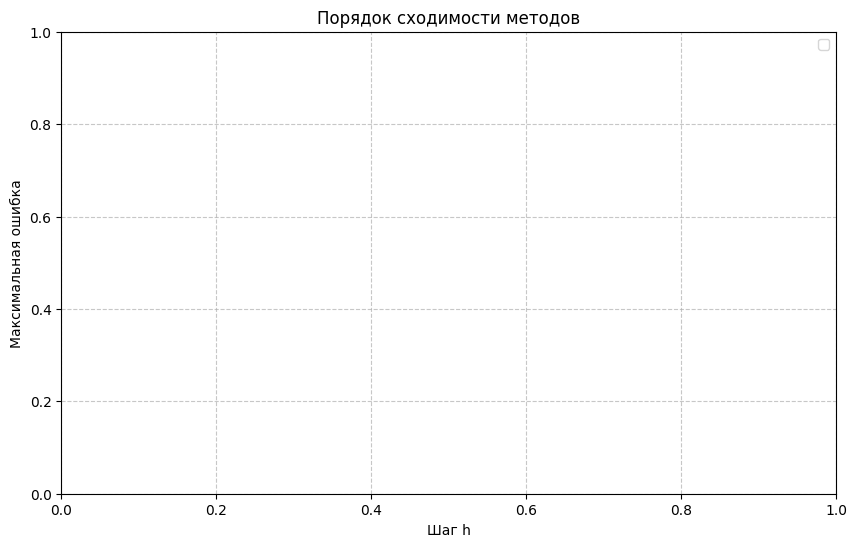

ITERATION 1 7
x0= 0.3 y0= 10.5
❌ rk4_solve: NaN или inf в решении (h=0.0001)
⚠️ RK4 при h=0.0001: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ pece4_solve: NaN или inf в решении (h=0.0001)
⚠️ PECE4 при h=0.0001: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ Gear4: расходимость на шаге 3, h=0.0001
❌ gear4_fixed_step: NaN или inf в решении (h=0.0001)
⚠️ Gear4_fixed при h=0.0001: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ rk4_solve: NaN или inf в решении (h=5e-05)
⚠️ RK4 при h=5e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ pece4_solve: NaN или inf в решении (h=5e-05)
⚠️ PECE4 при h=5e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ Gear4: расходимость на шаге 3, h=5e-05
❌ gear4_fixed_step: NaN или inf в решении (h=5e-05)
⚠️ Gear4_fixed при h=5e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ rk4_solve: NaN или inf в решении (h=2.5e-05)
⚠️ RK4 пр

C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:7: RuntimeWarning: overflow encountered in scalar multiply
  dydt = y * (2 * a2 - 0.5 * y - 3.5 * (a2_reg**2) * x)
C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:6: RuntimeWarning: invalid value encountered in scalar multiply
  dxdt = x * (1 - 0.5 * x - (2/7) * (a2_reg**-2) * y)
C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:7: RuntimeWarning: overflow encountered in scalar power
  dydt = y * (2 * a2 - 0.5 * y - 3.5 * (a2_reg**2) * x)
C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:7: RuntimeWarning: invalid value encountered in scalar subtract
  dydt = y * (2 * a2 - 0.5 * y - 3.5 * (a2_reg**2) * x)
C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:8: RuntimeWarning: overflow encountered in scalar multiply
  da2dt = epsilon * (2 - 7 * a2 * x)


❌ rk4_solve: NaN или inf в решении (h=1.25e-05)
⚠️ RK4 при h=1.25e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ pece4_solve: NaN или inf в решении (h=1.25e-05)
⚠️ PECE4 при h=1.25e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ Gear4: расходимость на шаге 3, h=1.25e-05
❌ gear4_fixed_step: NaN или inf в решении (h=1.25e-05)
⚠️ Gear4_fixed при h=1.25e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ rk4_solve: NaN или inf в решении (h=6.25e-06)
⚠️ RK4 при h=6.25e-06: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ pece4_solve: NaN или inf в решении (h=6.25e-06)
⚠️ PECE4 при h=6.25e-06: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ Gear4: расходимость на шаге 3, h=6.25e-06
❌ gear4_fixed_step: NaN или inf в решении (h=6.25e-06)
⚠️ Gear4_fixed при h=6.25e-06: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ rk4_solve: NaN или inf в решении (h=3.125e-06)
⚠️ 

C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3955799424.py:41: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend()


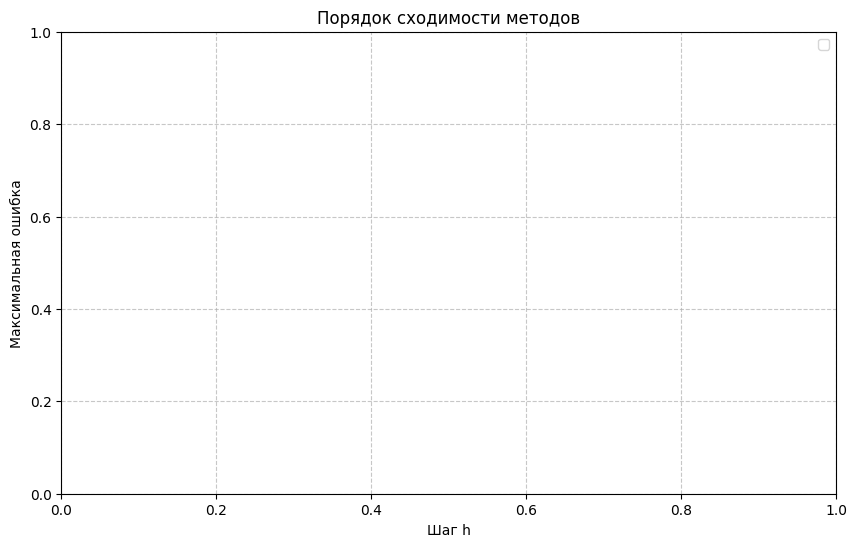

ITERATION 1 8
x0= 0.3 y0= 12.0
❌ rk4_solve: NaN или inf в решении (h=0.0001)
⚠️ RK4 при h=0.0001: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ pece4_solve: NaN или inf в решении (h=0.0001)
⚠️ PECE4 при h=0.0001: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ Gear4: расходимость на шаге 3, h=0.0001
❌ gear4_fixed_step: NaN или inf в решении (h=0.0001)
⚠️ Gear4_fixed при h=0.0001: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ rk4_solve: NaN или inf в решении (h=5e-05)
⚠️ RK4 при h=5e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ pece4_solve: NaN или inf в решении (h=5e-05)
⚠️ PECE4 при h=5e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ Gear4: расходимость на шаге 3, h=5e-05
❌ gear4_fixed_step: NaN или inf в решении (h=5e-05)
⚠️ Gear4_fixed при h=5e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ rk4_solve: NaN или inf в решении (h=2.5e-05)
⚠️ RK4 пр

C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:7: RuntimeWarning: overflow encountered in scalar multiply
  dydt = y * (2 * a2 - 0.5 * y - 3.5 * (a2_reg**2) * x)
C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:6: RuntimeWarning: invalid value encountered in scalar multiply
  dxdt = x * (1 - 0.5 * x - (2/7) * (a2_reg**-2) * y)
C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:7: RuntimeWarning: overflow encountered in scalar power
  dydt = y * (2 * a2 - 0.5 * y - 3.5 * (a2_reg**2) * x)
C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:7: RuntimeWarning: invalid value encountered in scalar subtract
  dydt = y * (2 * a2 - 0.5 * y - 3.5 * (a2_reg**2) * x)
C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:8: RuntimeWarning: overflow encountered in scalar multiply
  da2dt = epsilon * (2 - 7 * a2 * x)


❌ rk4_solve: NaN или inf в решении (h=1.25e-05)
⚠️ RK4 при h=1.25e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ pece4_solve: NaN или inf в решении (h=1.25e-05)
⚠️ PECE4 при h=1.25e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ Gear4: расходимость на шаге 3, h=1.25e-05
❌ gear4_fixed_step: NaN или inf в решении (h=1.25e-05)
⚠️ Gear4_fixed при h=1.25e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ rk4_solve: NaN или inf в решении (h=6.25e-06)
⚠️ RK4 при h=6.25e-06: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ pece4_solve: NaN или inf в решении (h=6.25e-06)
⚠️ PECE4 при h=6.25e-06: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ Gear4: расходимость на шаге 3, h=6.25e-06
❌ gear4_fixed_step: NaN или inf в решении (h=6.25e-06)
⚠️ Gear4_fixed при h=6.25e-06: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ rk4_solve: NaN или inf в решении (h=3.125e-06)
⚠️ 

C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3955799424.py:41: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend()


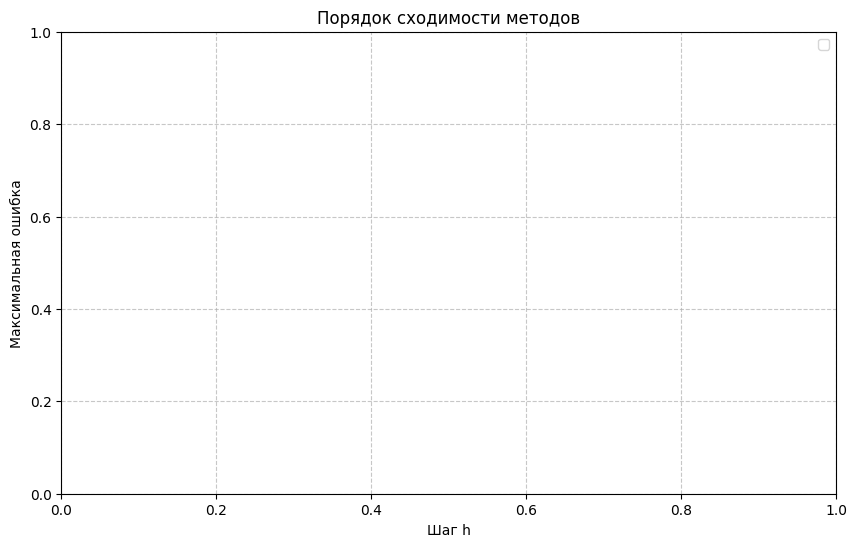

ITERATION 1 9
x0= 0.3 y0= 13.5
❌ rk4_solve: NaN или inf в решении (h=0.0001)
⚠️ RK4 при h=0.0001: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ pece4_solve: NaN или inf в решении (h=0.0001)
⚠️ PECE4 при h=0.0001: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ Gear4: расходимость на шаге 3, h=0.0001
❌ gear4_fixed_step: NaN или inf в решении (h=0.0001)
⚠️ Gear4_fixed при h=0.0001: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ rk4_solve: NaN или inf в решении (h=5e-05)
⚠️ RK4 при h=5e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ pece4_solve: NaN или inf в решении (h=5e-05)
⚠️ PECE4 при h=5e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ Gear4: расходимость на шаге 3, h=5e-05
❌ gear4_fixed_step: NaN или inf в решении (h=5e-05)
⚠️ Gear4_fixed при h=5e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ rk4_solve: NaN или inf в решении (h=2.5e-05)
⚠️ RK4 пр

C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:7: RuntimeWarning: overflow encountered in scalar multiply
  dydt = y * (2 * a2 - 0.5 * y - 3.5 * (a2_reg**2) * x)
C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:6: RuntimeWarning: invalid value encountered in scalar multiply
  dxdt = x * (1 - 0.5 * x - (2/7) * (a2_reg**-2) * y)
C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:7: RuntimeWarning: overflow encountered in scalar power
  dydt = y * (2 * a2 - 0.5 * y - 3.5 * (a2_reg**2) * x)
C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:7: RuntimeWarning: invalid value encountered in scalar subtract
  dydt = y * (2 * a2 - 0.5 * y - 3.5 * (a2_reg**2) * x)
C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:8: RuntimeWarning: overflow encountered in scalar multiply
  da2dt = epsilon * (2 - 7 * a2 * x)
C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\1111329400.py:11: RuntimeWarning: invalid value encountered in add
  

❌ rk4_solve: NaN или inf в решении (h=1.25e-05)
⚠️ RK4 при h=1.25e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ pece4_solve: NaN или inf в решении (h=1.25e-05)
⚠️ PECE4 при h=1.25e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ Gear4: расходимость на шаге 3, h=1.25e-05
❌ gear4_fixed_step: NaN или inf в решении (h=1.25e-05)
⚠️ Gear4_fixed при h=1.25e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ rk4_solve: NaN или inf в решении (h=6.25e-06)
⚠️ RK4 при h=6.25e-06: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ pece4_solve: NaN или inf в решении (h=6.25e-06)
⚠️ PECE4 при h=6.25e-06: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ Gear4: расходимость на шаге 3, h=6.25e-06
❌ gear4_fixed_step: NaN или inf в решении (h=6.25e-06)
⚠️ Gear4_fixed при h=6.25e-06: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ rk4_solve: NaN или inf в решении (h=3.125e-06)
⚠️ 

C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3955799424.py:41: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend()


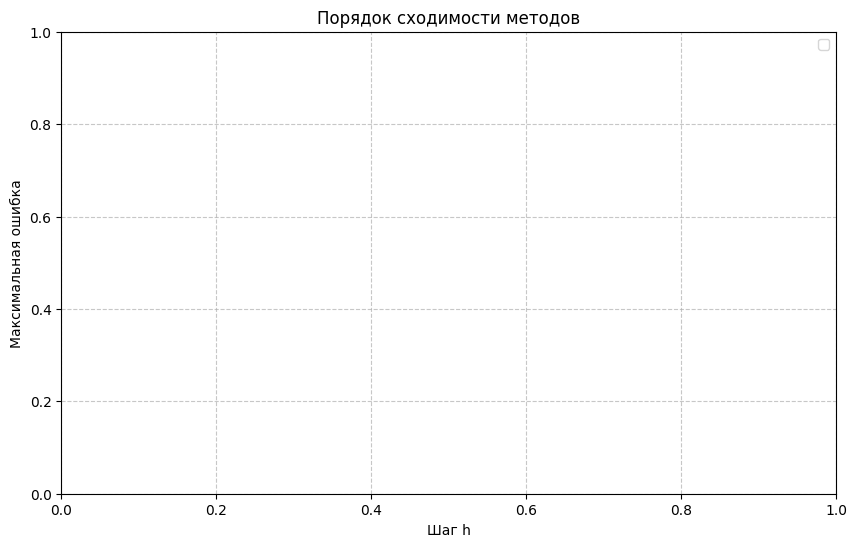

ITERATION 2 0
x0= 0.6 y0= 0.0
✅ rk4_solve: успех, 101 шагов (h=0.0001)
✅ pece4_solve: успех, 101 шагов (h=0.0001)
✅ gear4_fixed_step: успех, 101 шагов (h=0.0001)
✅ rk4_solve: успех, 201 шагов (h=5e-05)
✅ pece4_solve: успех, 201 шагов (h=5e-05)
✅ gear4_fixed_step: успех, 201 шагов (h=5e-05)
✅ rk4_solve: успех, 401 шагов (h=2.5e-05)
✅ pece4_solve: успех, 401 шагов (h=2.5e-05)
✅ gear4_fixed_step: успех, 401 шагов (h=2.5e-05)
✅ rk4_solve: успех, 801 шагов (h=1.25e-05)
✅ pece4_solve: успех, 801 шагов (h=1.25e-05)
✅ gear4_fixed_step: успех, 801 шагов (h=1.25e-05)
✅ rk4_solve: успех, 1601 шагов (h=6.25e-06)
✅ pece4_solve: успех, 1601 шагов (h=6.25e-06)
✅ gear4_fixed_step: успех, 1601 шагов (h=6.25e-06)
✅ rk4_solve: успех, 3201 шагов (h=3.125e-06)
✅ pece4_solve: успех, 3201 шагов (h=3.125e-06)
✅ gear4_fixed_step: успех, 3201 шагов (h=3.125e-06)
          h           RK4  p_RK4         PECE4  p_PECE4   Gear4_fixed  p_Gear4_fixed
0  0.000100  3.686703e-10    NaN  3.686703e-10      NaN  3.671839e

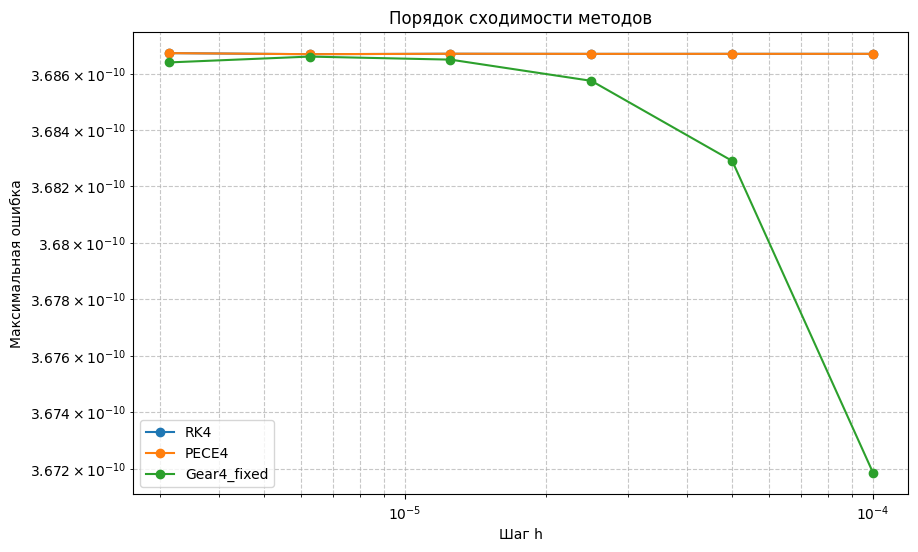

ITERATION 2 1
x0= 0.6 y0= 1.5
❌ rk4_solve: NaN или inf в решении (h=0.0001)
⚠️ RK4 при h=0.0001: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ pece4_solve: NaN или inf в решении (h=0.0001)
⚠️ PECE4 при h=0.0001: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ Gear4: расходимость на шаге 3, h=0.0001
❌ gear4_fixed_step: NaN или inf в решении (h=0.0001)
⚠️ Gear4_fixed при h=0.0001: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ rk4_solve: NaN или inf в решении (h=5e-05)
⚠️ RK4 при h=5e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ pece4_solve: NaN или inf в решении (h=5e-05)
⚠️ PECE4 при h=5e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ Gear4: расходимость на шаге 3, h=5e-05
❌ gear4_fixed_step: NaN или inf в решении (h=5e-05)
⚠️ Gear4_fixed при h=5e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ rk4_solve: NaN или inf в решении (h=2.5e-05)
⚠️ RK4 при

C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:7: RuntimeWarning: overflow encountered in scalar multiply
  dydt = y * (2 * a2 - 0.5 * y - 3.5 * (a2_reg**2) * x)
C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:7: RuntimeWarning: invalid value encountered in scalar subtract
  dydt = y * (2 * a2 - 0.5 * y - 3.5 * (a2_reg**2) * x)
C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:8: RuntimeWarning: overflow encountered in scalar multiply
  da2dt = epsilon * (2 - 7 * a2 * x)
C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\1111329400.py:11: RuntimeWarning: invalid value encountered in add
  return y + h/6 * (k1 + 2*k2 + 2*k3 + k4)
C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:6: RuntimeWarning: invalid value encountered in scalar multiply
  dxdt = x * (1 - 0.5 * x - (2/7) * (a2_reg**-2) * y)
C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:7: RuntimeWarning: overflow encountered in scalar power
  dydt = y * (2

❌ Gear4: расходимость на шаге 3, h=2.5e-05
❌ gear4_fixed_step: NaN или inf в решении (h=2.5e-05)
⚠️ Gear4_fixed при h=2.5e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ rk4_solve: NaN или inf в решении (h=1.25e-05)
⚠️ RK4 при h=1.25e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ pece4_solve: NaN или inf в решении (h=1.25e-05)
⚠️ PECE4 при h=1.25e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ Gear4: расходимость на шаге 3, h=1.25e-05
❌ gear4_fixed_step: NaN или inf в решении (h=1.25e-05)
⚠️ Gear4_fixed при h=1.25e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ rk4_solve: NaN или inf в решении (h=6.25e-06)
⚠️ RK4 при h=6.25e-06: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ pece4_solve: NaN или inf в решении (h=6.25e-06)
⚠️ PECE4 при h=6.25e-06: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ Gear4: расходимость на шаге 3, h=6.25e-06
❌ gear4_fix

C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\1111329400.py:7: RuntimeWarning: invalid value encountered in add
  k2 = f(t + h/2, y + h/2 * k1, epsilon)


❌ rk4_solve: NaN или inf в решении (h=3.125e-06)
⚠️ RK4 при h=3.125e-06: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ pece4_solve: NaN или inf в решении (h=3.125e-06)
⚠️ PECE4 при h=3.125e-06: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ Gear4: расходимость на шаге 3, h=3.125e-06
❌ gear4_fixed_step: NaN или inf в решении (h=3.125e-06)
⚠️ Gear4_fixed при h=3.125e-06: operands could not be broadcast together with shapes (1,0) (1,3) 
          h  RK4  p_RK4  PECE4  p_PECE4  Gear4_fixed  p_Gear4_fixed
0  0.000100  NaN    NaN    NaN      NaN          NaN            NaN
1  0.000050  NaN    NaN    NaN      NaN          NaN            NaN
2  0.000025  NaN    NaN    NaN      NaN          NaN            NaN
3  0.000013  NaN    NaN    NaN      NaN          NaN            NaN
4  0.000006  NaN    NaN    NaN      NaN          NaN            NaN
5  0.000003  NaN    NaN    NaN      NaN          NaN            NaN


C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\995573919.py:8: RuntimeWarning: invalid value encountered in add
  y_pred = y + h/24 * (55*f_vals[3] - 59*f_vals[2] + 37*f_vals[1] - 9*f_vals[0])
C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3752895320.py:29: RuntimeWarning: invalid value encountered in add
  y_next = c0*y[i] + c1*y[i-1] + c2*y[i-2] + c3*y[i-3] + beta * h * f_next
C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3955799424.py:41: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend()


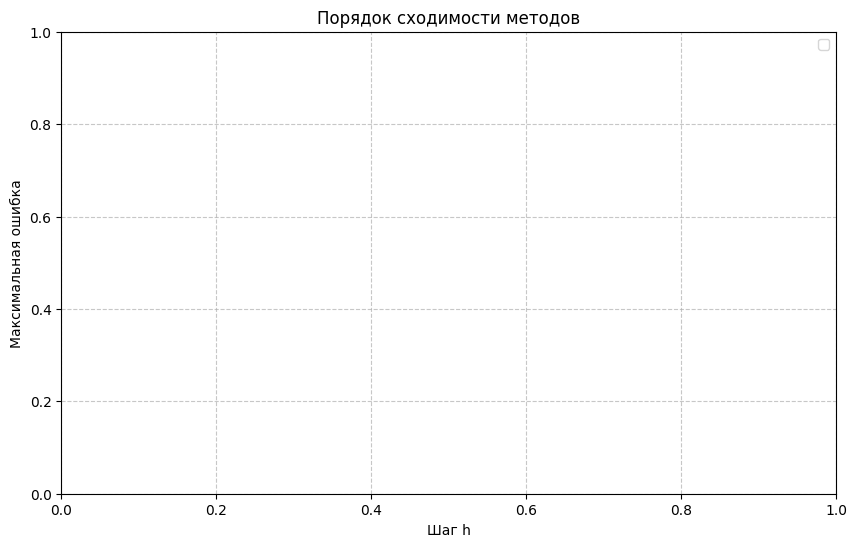

ITERATION 2 2
x0= 0.6 y0= 3.0
❌ rk4_solve: NaN или inf в решении (h=0.0001)
⚠️ RK4 при h=0.0001: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ pece4_solve: NaN или inf в решении (h=0.0001)
⚠️ PECE4 при h=0.0001: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ Gear4: расходимость на шаге 3, h=0.0001
❌ gear4_fixed_step: NaN или inf в решении (h=0.0001)
⚠️ Gear4_fixed при h=0.0001: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ rk4_solve: NaN или inf в решении (h=5e-05)
⚠️ RK4 при h=5e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ pece4_solve: NaN или inf в решении (h=5e-05)
⚠️ PECE4 при h=5e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ Gear4: расходимость на шаге 3, h=5e-05
❌ gear4_fixed_step: NaN или inf в решении (h=5e-05)
⚠️ Gear4_fixed при h=5e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ rk4_solve: NaN или inf в решении (h=2.5e-05)
⚠️ RK4 при

C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:7: RuntimeWarning: overflow encountered in scalar multiply
  dydt = y * (2 * a2 - 0.5 * y - 3.5 * (a2_reg**2) * x)
C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:6: RuntimeWarning: invalid value encountered in scalar multiply
  dxdt = x * (1 - 0.5 * x - (2/7) * (a2_reg**-2) * y)
C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:7: RuntimeWarning: overflow encountered in scalar power
  dydt = y * (2 * a2 - 0.5 * y - 3.5 * (a2_reg**2) * x)
C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:7: RuntimeWarning: invalid value encountered in scalar subtract
  dydt = y * (2 * a2 - 0.5 * y - 3.5 * (a2_reg**2) * x)
C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:8: RuntimeWarning: overflow encountered in scalar multiply
  da2dt = epsilon * (2 - 7 * a2 * x)


❌ rk4_solve: NaN или inf в решении (h=1.25e-05)
⚠️ RK4 при h=1.25e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ pece4_solve: NaN или inf в решении (h=1.25e-05)
⚠️ PECE4 при h=1.25e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ Gear4: расходимость на шаге 3, h=1.25e-05
❌ gear4_fixed_step: NaN или inf в решении (h=1.25e-05)
⚠️ Gear4_fixed при h=1.25e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ rk4_solve: NaN или inf в решении (h=6.25e-06)
⚠️ RK4 при h=6.25e-06: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ pece4_solve: NaN или inf в решении (h=6.25e-06)
⚠️ PECE4 при h=6.25e-06: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ Gear4: расходимость на шаге 3, h=6.25e-06
❌ gear4_fixed_step: NaN или inf в решении (h=6.25e-06)
⚠️ Gear4_fixed при h=6.25e-06: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ rk4_solve: NaN или inf в решении (h=3.125e-06)
⚠️ 

C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3955799424.py:41: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend()


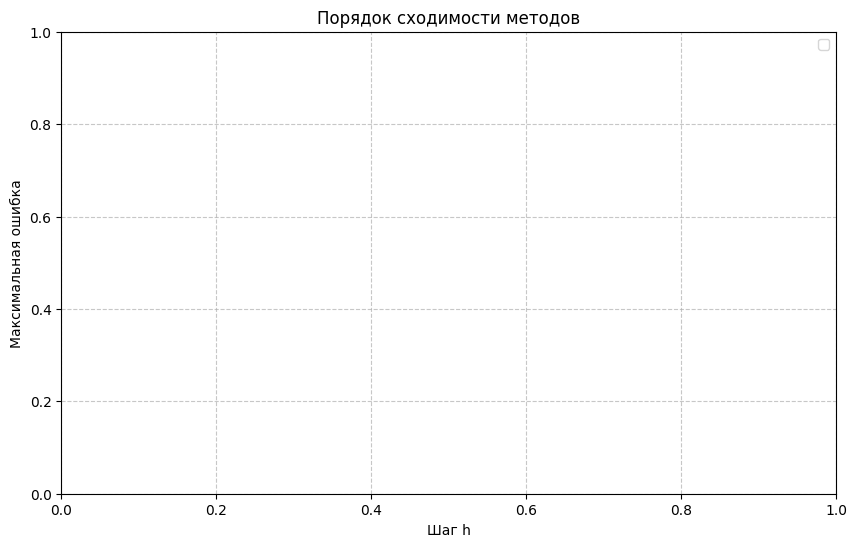

ITERATION 2 3
x0= 0.6 y0= 4.5
❌ rk4_solve: NaN или inf в решении (h=0.0001)
⚠️ RK4 при h=0.0001: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ pece4_solve: NaN или inf в решении (h=0.0001)
⚠️ PECE4 при h=0.0001: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ Gear4: расходимость на шаге 3, h=0.0001
❌ gear4_fixed_step: NaN или inf в решении (h=0.0001)
⚠️ Gear4_fixed при h=0.0001: operands could not be broadcast together with shapes (1,0) (1,3) 


C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:7: RuntimeWarning: overflow encountered in scalar multiply
  dydt = y * (2 * a2 - 0.5 * y - 3.5 * (a2_reg**2) * x)
C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:6: RuntimeWarning: invalid value encountered in scalar multiply
  dxdt = x * (1 - 0.5 * x - (2/7) * (a2_reg**-2) * y)
C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:7: RuntimeWarning: overflow encountered in scalar power
  dydt = y * (2 * a2 - 0.5 * y - 3.5 * (a2_reg**2) * x)
C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:7: RuntimeWarning: invalid value encountered in scalar subtract
  dydt = y * (2 * a2 - 0.5 * y - 3.5 * (a2_reg**2) * x)
C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:8: RuntimeWarning: overflow encountered in scalar multiply
  da2dt = epsilon * (2 - 7 * a2 * x)
C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\1111329400.py:11: RuntimeWarning: invalid value encountered in add
  

❌ rk4_solve: NaN или inf в решении (h=5e-05)
⚠️ RK4 при h=5e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ pece4_solve: NaN или inf в решении (h=5e-05)
⚠️ PECE4 при h=5e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ Gear4: расходимость на шаге 3, h=5e-05
❌ gear4_fixed_step: NaN или inf в решении (h=5e-05)
⚠️ Gear4_fixed при h=5e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ rk4_solve: NaN или inf в решении (h=2.5e-05)
⚠️ RK4 при h=2.5e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ pece4_solve: NaN или inf в решении (h=2.5e-05)
⚠️ PECE4 при h=2.5e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ Gear4: расходимость на шаге 3, h=2.5e-05
❌ gear4_fixed_step: NaN или inf в решении (h=2.5e-05)
⚠️ Gear4_fixed при h=2.5e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ rk4_solve: NaN или inf в решении (h=1.25e-05)
⚠️ RK4 при h=1.25e-05: operands 

C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3955799424.py:41: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend()


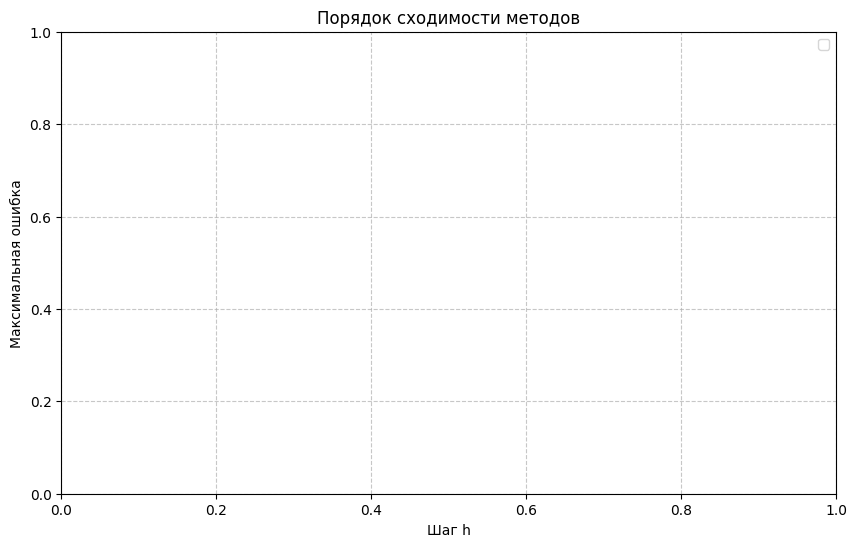

ITERATION 2 4
x0= 0.6 y0= 6.0


C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:7: RuntimeWarning: overflow encountered in scalar multiply
  dydt = y * (2 * a2 - 0.5 * y - 3.5 * (a2_reg**2) * x)
C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:6: RuntimeWarning: invalid value encountered in scalar multiply
  dxdt = x * (1 - 0.5 * x - (2/7) * (a2_reg**-2) * y)
C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:7: RuntimeWarning: overflow encountered in scalar power
  dydt = y * (2 * a2 - 0.5 * y - 3.5 * (a2_reg**2) * x)
C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:7: RuntimeWarning: invalid value encountered in scalar subtract
  dydt = y * (2 * a2 - 0.5 * y - 3.5 * (a2_reg**2) * x)
C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:8: RuntimeWarning: overflow encountered in scalar multiply
  da2dt = epsilon * (2 - 7 * a2 * x)


❌ rk4_solve: NaN или inf в решении (h=0.0001)
⚠️ RK4 при h=0.0001: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ pece4_solve: NaN или inf в решении (h=0.0001)
⚠️ PECE4 при h=0.0001: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ Gear4: расходимость на шаге 3, h=0.0001
❌ gear4_fixed_step: NaN или inf в решении (h=0.0001)
⚠️ Gear4_fixed при h=0.0001: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ rk4_solve: NaN или inf в решении (h=5e-05)
⚠️ RK4 при h=5e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ pece4_solve: NaN или inf в решении (h=5e-05)
⚠️ PECE4 при h=5e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ Gear4: расходимость на шаге 3, h=5e-05
❌ gear4_fixed_step: NaN или inf в решении (h=5e-05)
⚠️ Gear4_fixed при h=5e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ rk4_solve: NaN или inf в решении (h=2.5e-05)
⚠️ RK4 при h=2.5e-05: operands could not

C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3955799424.py:41: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend()


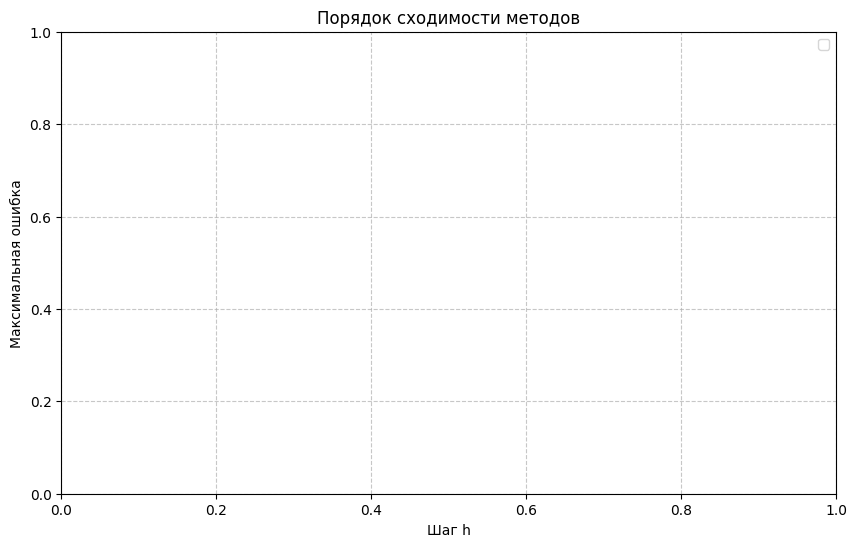

ITERATION 2 5
x0= 0.6 y0= 7.5
❌ rk4_solve: NaN или inf в решении (h=0.0001)
⚠️ RK4 при h=0.0001: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ pece4_solve: NaN или inf в решении (h=0.0001)
⚠️ PECE4 при h=0.0001: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ Gear4: расходимость на шаге 3, h=0.0001
❌ gear4_fixed_step: NaN или inf в решении (h=0.0001)
⚠️ Gear4_fixed при h=0.0001: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ rk4_solve: NaN или inf в решении (h=5e-05)
⚠️ RK4 при h=5e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ pece4_solve: NaN или inf в решении (h=5e-05)
⚠️ PECE4 при h=5e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ Gear4: расходимость на шаге 3, h=5e-05
❌ gear4_fixed_step: NaN или inf в решении (h=5e-05)
⚠️ Gear4_fixed при h=5e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ rk4_solve: NaN или inf в решении (h=2.5e-05)
⚠️ RK4 при

C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:7: RuntimeWarning: overflow encountered in scalar multiply
  dydt = y * (2 * a2 - 0.5 * y - 3.5 * (a2_reg**2) * x)
C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:6: RuntimeWarning: invalid value encountered in scalar multiply
  dxdt = x * (1 - 0.5 * x - (2/7) * (a2_reg**-2) * y)
C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:7: RuntimeWarning: overflow encountered in scalar power
  dydt = y * (2 * a2 - 0.5 * y - 3.5 * (a2_reg**2) * x)
C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:7: RuntimeWarning: invalid value encountered in scalar subtract
  dydt = y * (2 * a2 - 0.5 * y - 3.5 * (a2_reg**2) * x)
C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:8: RuntimeWarning: overflow encountered in scalar multiply
  da2dt = epsilon * (2 - 7 * a2 * x)


❌ rk4_solve: NaN или inf в решении (h=1.25e-05)
⚠️ RK4 при h=1.25e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ pece4_solve: NaN или inf в решении (h=1.25e-05)
⚠️ PECE4 при h=1.25e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ Gear4: расходимость на шаге 3, h=1.25e-05
❌ gear4_fixed_step: NaN или inf в решении (h=1.25e-05)
⚠️ Gear4_fixed при h=1.25e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ rk4_solve: NaN или inf в решении (h=6.25e-06)
⚠️ RK4 при h=6.25e-06: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ pece4_solve: NaN или inf в решении (h=6.25e-06)
⚠️ PECE4 при h=6.25e-06: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ Gear4: расходимость на шаге 3, h=6.25e-06
❌ gear4_fixed_step: NaN или inf в решении (h=6.25e-06)
⚠️ Gear4_fixed при h=6.25e-06: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ rk4_solve: NaN или inf в решении (h=3.125e-06)
⚠️ 

C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3955799424.py:41: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend()


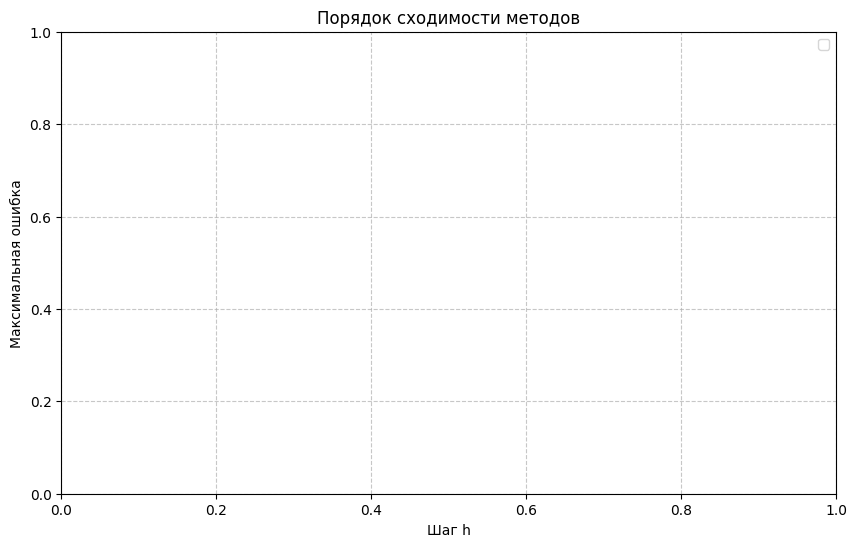

ITERATION 2 6
x0= 0.6 y0= 9.0


C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:7: RuntimeWarning: overflow encountered in scalar multiply
  dydt = y * (2 * a2 - 0.5 * y - 3.5 * (a2_reg**2) * x)
C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:6: RuntimeWarning: invalid value encountered in scalar multiply
  dxdt = x * (1 - 0.5 * x - (2/7) * (a2_reg**-2) * y)
C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:7: RuntimeWarning: overflow encountered in scalar power
  dydt = y * (2 * a2 - 0.5 * y - 3.5 * (a2_reg**2) * x)
C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:7: RuntimeWarning: invalid value encountered in scalar subtract
  dydt = y * (2 * a2 - 0.5 * y - 3.5 * (a2_reg**2) * x)
C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:8: RuntimeWarning: overflow encountered in scalar multiply
  da2dt = epsilon * (2 - 7 * a2 * x)


❌ rk4_solve: NaN или inf в решении (h=0.0001)
⚠️ RK4 при h=0.0001: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ pece4_solve: NaN или inf в решении (h=0.0001)
⚠️ PECE4 при h=0.0001: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ Gear4: расходимость на шаге 3, h=0.0001
❌ gear4_fixed_step: NaN или inf в решении (h=0.0001)
⚠️ Gear4_fixed при h=0.0001: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ rk4_solve: NaN или inf в решении (h=5e-05)
⚠️ RK4 при h=5e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ pece4_solve: NaN или inf в решении (h=5e-05)
⚠️ PECE4 при h=5e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ Gear4: расходимость на шаге 3, h=5e-05
❌ gear4_fixed_step: NaN или inf в решении (h=5e-05)
⚠️ Gear4_fixed при h=5e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ rk4_solve: NaN или inf в решении (h=2.5e-05)
⚠️ RK4 при h=2.5e-05: operands could not

C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3955799424.py:41: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend()


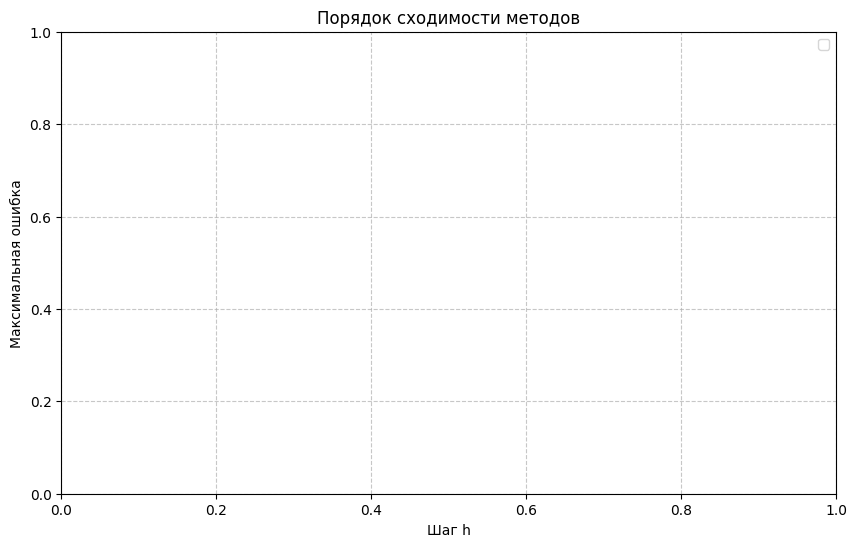

ITERATION 2 7
x0= 0.6 y0= 10.5
❌ rk4_solve: NaN или inf в решении (h=0.0001)
⚠️ RK4 при h=0.0001: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ pece4_solve: NaN или inf в решении (h=0.0001)
⚠️ PECE4 при h=0.0001: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ Gear4: расходимость на шаге 3, h=0.0001
❌ gear4_fixed_step: NaN или inf в решении (h=0.0001)
⚠️ Gear4_fixed при h=0.0001: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ rk4_solve: NaN или inf в решении (h=5e-05)
⚠️ RK4 при h=5e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ pece4_solve: NaN или inf в решении (h=5e-05)
⚠️ PECE4 при h=5e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ Gear4: расходимость на шаге 3, h=5e-05
❌ gear4_fixed_step: NaN или inf в решении (h=5e-05)
⚠️ Gear4_fixed при h=5e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ rk4_solve: NaN или inf в решении (h=2.5e-05)
⚠️ RK4 пр

C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:7: RuntimeWarning: overflow encountered in scalar multiply
  dydt = y * (2 * a2 - 0.5 * y - 3.5 * (a2_reg**2) * x)
C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:6: RuntimeWarning: invalid value encountered in scalar multiply
  dxdt = x * (1 - 0.5 * x - (2/7) * (a2_reg**-2) * y)
C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:7: RuntimeWarning: overflow encountered in scalar power
  dydt = y * (2 * a2 - 0.5 * y - 3.5 * (a2_reg**2) * x)
C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:7: RuntimeWarning: invalid value encountered in scalar subtract
  dydt = y * (2 * a2 - 0.5 * y - 3.5 * (a2_reg**2) * x)
C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:8: RuntimeWarning: overflow encountered in scalar multiply
  da2dt = epsilon * (2 - 7 * a2 * x)
C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\1111329400.py:11: RuntimeWarning: invalid value encountered in add
  

❌ Gear4: расходимость на шаге 3, h=2.5e-05
❌ gear4_fixed_step: NaN или inf в решении (h=2.5e-05)
⚠️ Gear4_fixed при h=2.5e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ rk4_solve: NaN или inf в решении (h=1.25e-05)
⚠️ RK4 при h=1.25e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ pece4_solve: NaN или inf в решении (h=1.25e-05)
⚠️ PECE4 при h=1.25e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ Gear4: расходимость на шаге 3, h=1.25e-05
❌ gear4_fixed_step: NaN или inf в решении (h=1.25e-05)
⚠️ Gear4_fixed при h=1.25e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ rk4_solve: NaN или inf в решении (h=6.25e-06)
⚠️ RK4 при h=6.25e-06: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ pece4_solve: NaN или inf в решении (h=6.25e-06)
⚠️ PECE4 при h=6.25e-06: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ Gear4: расходимость на шаге 3, h=6.25e-06
❌ gear4_fix

C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3955799424.py:41: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend()


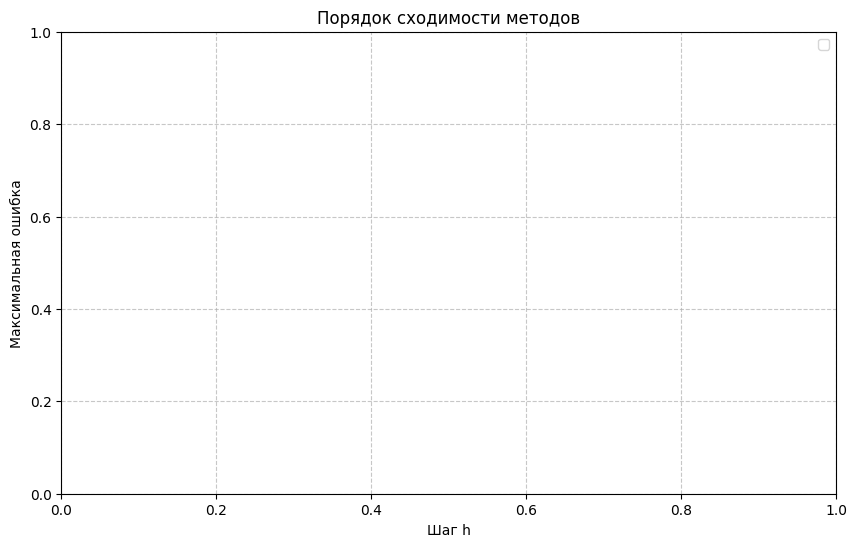

ITERATION 2 8
x0= 0.6 y0= 12.0
❌ rk4_solve: NaN или inf в решении (h=0.0001)
⚠️ RK4 при h=0.0001: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ pece4_solve: NaN или inf в решении (h=0.0001)
⚠️ PECE4 при h=0.0001: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ Gear4: расходимость на шаге 3, h=0.0001
❌ gear4_fixed_step: NaN или inf в решении (h=0.0001)
⚠️ Gear4_fixed при h=0.0001: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ rk4_solve: NaN или inf в решении (h=5e-05)
⚠️ RK4 при h=5e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ pece4_solve: NaN или inf в решении (h=5e-05)
⚠️ PECE4 при h=5e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ Gear4: расходимость на шаге 3, h=5e-05
❌ gear4_fixed_step: NaN или inf в решении (h=5e-05)
⚠️ Gear4_fixed при h=5e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ rk4_solve: NaN или inf в решении (h=2.5e-05)
⚠️ RK4 пр

C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:7: RuntimeWarning: overflow encountered in scalar multiply
  dydt = y * (2 * a2 - 0.5 * y - 3.5 * (a2_reg**2) * x)
C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:6: RuntimeWarning: invalid value encountered in scalar multiply
  dxdt = x * (1 - 0.5 * x - (2/7) * (a2_reg**-2) * y)
C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:7: RuntimeWarning: overflow encountered in scalar power
  dydt = y * (2 * a2 - 0.5 * y - 3.5 * (a2_reg**2) * x)
C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:7: RuntimeWarning: invalid value encountered in scalar subtract
  dydt = y * (2 * a2 - 0.5 * y - 3.5 * (a2_reg**2) * x)
C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:8: RuntimeWarning: overflow encountered in scalar multiply
  da2dt = epsilon * (2 - 7 * a2 * x)
C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\1111329400.py:11: RuntimeWarning: invalid value encountered in add
  

❌ pece4_solve: NaN или inf в решении (h=2.5e-05)
⚠️ PECE4 при h=2.5e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ Gear4: расходимость на шаге 3, h=2.5e-05
❌ gear4_fixed_step: NaN или inf в решении (h=2.5e-05)
⚠️ Gear4_fixed при h=2.5e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ rk4_solve: NaN или inf в решении (h=1.25e-05)
⚠️ RK4 при h=1.25e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ pece4_solve: NaN или inf в решении (h=1.25e-05)
⚠️ PECE4 при h=1.25e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ Gear4: расходимость на шаге 3, h=1.25e-05
❌ gear4_fixed_step: NaN или inf в решении (h=1.25e-05)
⚠️ Gear4_fixed при h=1.25e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ rk4_solve: NaN или inf в решении (h=6.25e-06)
⚠️ RK4 при h=6.25e-06: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ pece4_solve: NaN или inf в решении (h=6.25e-06)
⚠️ PECE

C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3955799424.py:41: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend()


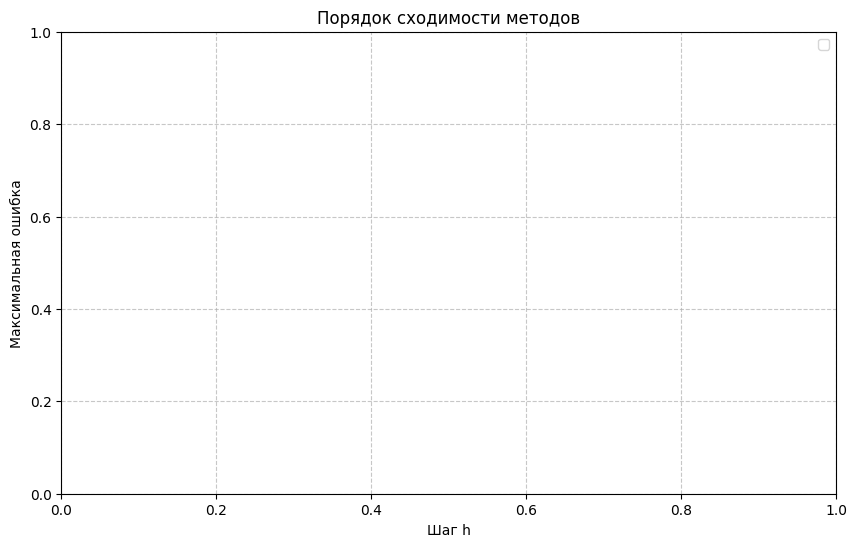

ITERATION 2 9
x0= 0.6 y0= 13.5
❌ rk4_solve: NaN или inf в решении (h=0.0001)
⚠️ RK4 при h=0.0001: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ pece4_solve: NaN или inf в решении (h=0.0001)
⚠️ PECE4 при h=0.0001: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ Gear4: расходимость на шаге 3, h=0.0001
❌ gear4_fixed_step: NaN или inf в решении (h=0.0001)
⚠️ Gear4_fixed при h=0.0001: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ rk4_solve: NaN или inf в решении (h=5e-05)
⚠️ RK4 при h=5e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ pece4_solve: NaN или inf в решении (h=5e-05)
⚠️ PECE4 при h=5e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ Gear4: расходимость на шаге 3, h=5e-05
❌ gear4_fixed_step: NaN или inf в решении (h=5e-05)
⚠️ Gear4_fixed при h=5e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ rk4_solve: NaN или inf в решении (h=2.5e-05)
⚠️ RK4 пр

C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:7: RuntimeWarning: overflow encountered in scalar multiply
  dydt = y * (2 * a2 - 0.5 * y - 3.5 * (a2_reg**2) * x)
C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:6: RuntimeWarning: invalid value encountered in scalar multiply
  dxdt = x * (1 - 0.5 * x - (2/7) * (a2_reg**-2) * y)
C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:7: RuntimeWarning: overflow encountered in scalar power
  dydt = y * (2 * a2 - 0.5 * y - 3.5 * (a2_reg**2) * x)
C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:7: RuntimeWarning: invalid value encountered in scalar subtract
  dydt = y * (2 * a2 - 0.5 * y - 3.5 * (a2_reg**2) * x)
C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:8: RuntimeWarning: overflow encountered in scalar multiply
  da2dt = epsilon * (2 - 7 * a2 * x)


❌ Gear4: расходимость на шаге 3, h=2.5e-05
❌ gear4_fixed_step: NaN или inf в решении (h=2.5e-05)
⚠️ Gear4_fixed при h=2.5e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ rk4_solve: NaN или inf в решении (h=1.25e-05)
⚠️ RK4 при h=1.25e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ pece4_solve: NaN или inf в решении (h=1.25e-05)
⚠️ PECE4 при h=1.25e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ Gear4: расходимость на шаге 3, h=1.25e-05
❌ gear4_fixed_step: NaN или inf в решении (h=1.25e-05)
⚠️ Gear4_fixed при h=1.25e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ rk4_solve: NaN или inf в решении (h=6.25e-06)
⚠️ RK4 при h=6.25e-06: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ pece4_solve: NaN или inf в решении (h=6.25e-06)
⚠️ PECE4 при h=6.25e-06: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ Gear4: расходимость на шаге 3, h=6.25e-06
❌ gear4_fix

C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3955799424.py:41: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend()


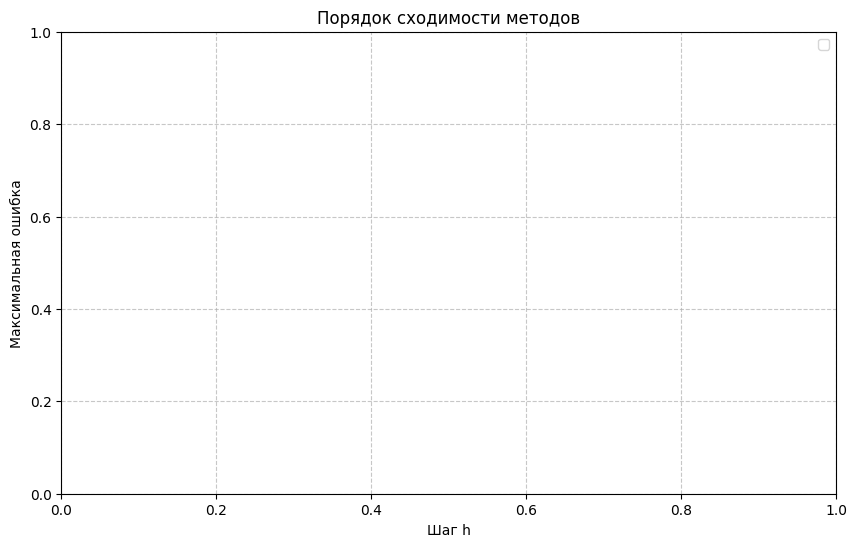

ITERATION 3 0
x0= 0.8999999999999999 y0= 0.0
✅ rk4_solve: успех, 101 шагов (h=0.0001)
✅ pece4_solve: успех, 101 шагов (h=0.0001)
✅ gear4_fixed_step: успех, 101 шагов (h=0.0001)
✅ rk4_solve: успех, 201 шагов (h=5e-05)
✅ pece4_solve: успех, 201 шагов (h=5e-05)
✅ gear4_fixed_step: успех, 201 шагов (h=5e-05)
✅ rk4_solve: успех, 401 шагов (h=2.5e-05)
✅ pece4_solve: успех, 401 шагов (h=2.5e-05)
✅ gear4_fixed_step: успех, 401 шагов (h=2.5e-05)
✅ rk4_solve: успех, 801 шагов (h=1.25e-05)
✅ pece4_solve: успех, 801 шагов (h=1.25e-05)
✅ gear4_fixed_step: успех, 801 шагов (h=1.25e-05)
✅ rk4_solve: успех, 1601 шагов (h=6.25e-06)
✅ pece4_solve: успех, 1601 шагов (h=6.25e-06)
✅ gear4_fixed_step: успех, 1601 шагов (h=6.25e-06)
✅ rk4_solve: успех, 3201 шагов (h=3.125e-06)
✅ pece4_solve: успех, 3201 шагов (h=3.125e-06)
✅ gear4_fixed_step: успех, 3201 шагов (h=3.125e-06)
          h           RK4  p_RK4         PECE4  p_PECE4   Gear4_fixed  p_Gear4_fixed
0  0.000100  5.800949e-11    NaN  5.800949e-11     

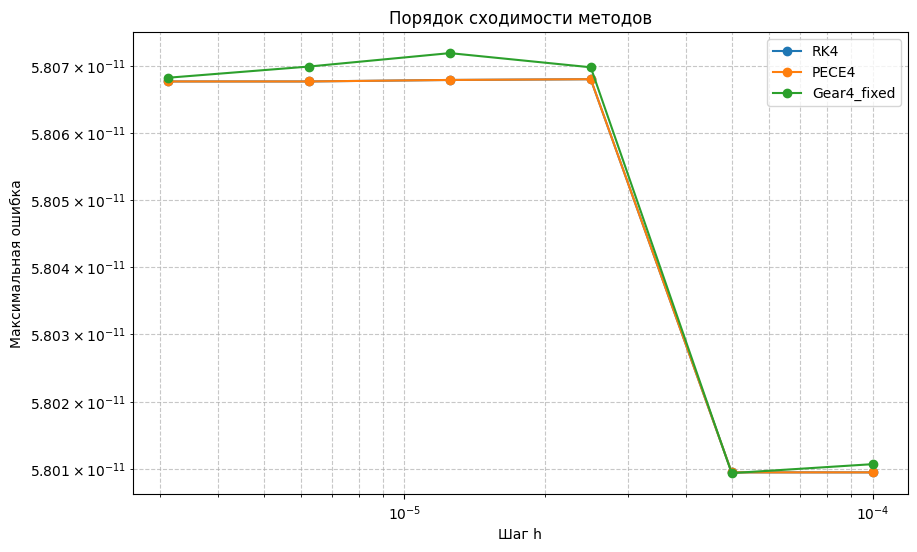

ITERATION 3 1
x0= 0.8999999999999999 y0= 1.5
❌ rk4_solve: NaN или inf в решении (h=0.0001)
⚠️ RK4 при h=0.0001: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ pece4_solve: NaN или inf в решении (h=0.0001)
⚠️ PECE4 при h=0.0001: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ Gear4: расходимость на шаге 3, h=0.0001
❌ gear4_fixed_step: NaN или inf в решении (h=0.0001)
⚠️ Gear4_fixed при h=0.0001: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ rk4_solve: NaN или inf в решении (h=5e-05)
⚠️ RK4 при h=5e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ pece4_solve: NaN или inf в решении (h=5e-05)
⚠️ PECE4 при h=5e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ Gear4: расходимость на шаге 3, h=5e-05
❌ gear4_fixed_step: NaN или inf в решении (h=5e-05)
⚠️ Gear4_fixed при h=5e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ rk4_solve: NaN или inf в решении (h=2.5e

C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:7: RuntimeWarning: overflow encountered in scalar multiply
  dydt = y * (2 * a2 - 0.5 * y - 3.5 * (a2_reg**2) * x)
C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:7: RuntimeWarning: overflow encountered in scalar power
  dydt = y * (2 * a2 - 0.5 * y - 3.5 * (a2_reg**2) * x)
C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:7: RuntimeWarning: invalid value encountered in scalar subtract
  dydt = y * (2 * a2 - 0.5 * y - 3.5 * (a2_reg**2) * x)
C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:8: RuntimeWarning: overflow encountered in scalar multiply
  da2dt = epsilon * (2 - 7 * a2 * x)
C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\1111329400.py:11: RuntimeWarning: invalid value encountered in add
  return y + h/6 * (k1 + 2*k2 + 2*k3 + k4)
C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:6: RuntimeWarning: invalid value encountered in scalar multiply
  dxdt = x * 

❌ rk4_solve: NaN или inf в решении (h=1.25e-05)
⚠️ RK4 при h=1.25e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ pece4_solve: NaN или inf в решении (h=1.25e-05)
⚠️ PECE4 при h=1.25e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ Gear4: расходимость на шаге 3, h=1.25e-05
❌ gear4_fixed_step: NaN или inf в решении (h=1.25e-05)
⚠️ Gear4_fixed при h=1.25e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ rk4_solve: NaN или inf в решении (h=6.25e-06)
⚠️ RK4 при h=6.25e-06: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ pece4_solve: NaN или inf в решении (h=6.25e-06)
⚠️ PECE4 при h=6.25e-06: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ Gear4: расходимость на шаге 3, h=6.25e-06
❌ gear4_fixed_step: NaN или inf в решении (h=6.25e-06)
⚠️ Gear4_fixed при h=6.25e-06: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ rk4_solve: NaN или inf в решении (h=3.125e-06)
⚠️ 

C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3955799424.py:41: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend()


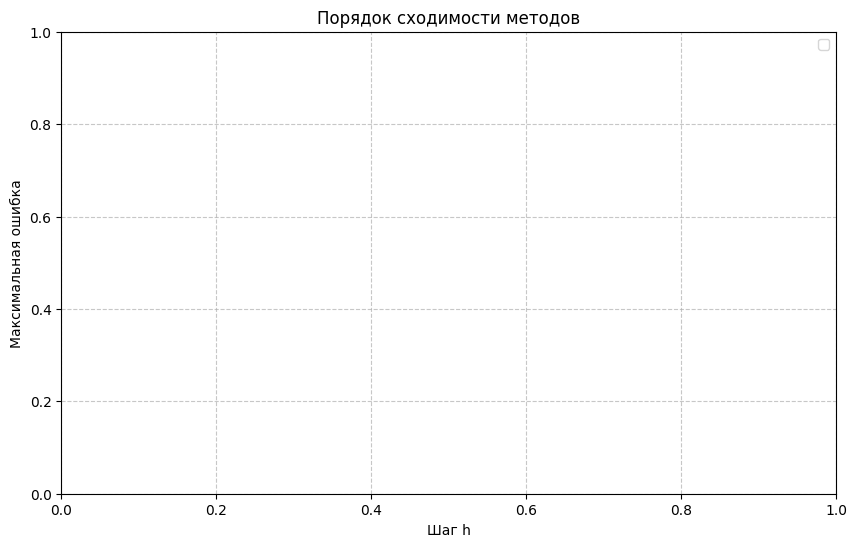

ITERATION 3 2
x0= 0.8999999999999999 y0= 3.0
❌ rk4_solve: NaN или inf в решении (h=0.0001)
⚠️ RK4 при h=0.0001: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ pece4_solve: NaN или inf в решении (h=0.0001)
⚠️ PECE4 при h=0.0001: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ Gear4: расходимость на шаге 3, h=0.0001
❌ gear4_fixed_step: NaN или inf в решении (h=0.0001)
⚠️ Gear4_fixed при h=0.0001: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ rk4_solve: NaN или inf в решении (h=5e-05)
⚠️ RK4 при h=5e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ pece4_solve: NaN или inf в решении (h=5e-05)
⚠️ PECE4 при h=5e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ Gear4: расходимость на шаге 3, h=5e-05
❌ gear4_fixed_step: NaN или inf в решении (h=5e-05)
⚠️ Gear4_fixed при h=5e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ rk4_solve: NaN или inf в решении (h=2.5e

C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:7: RuntimeWarning: overflow encountered in scalar multiply
  dydt = y * (2 * a2 - 0.5 * y - 3.5 * (a2_reg**2) * x)
C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:6: RuntimeWarning: invalid value encountered in scalar multiply
  dxdt = x * (1 - 0.5 * x - (2/7) * (a2_reg**-2) * y)
C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:7: RuntimeWarning: overflow encountered in scalar power
  dydt = y * (2 * a2 - 0.5 * y - 3.5 * (a2_reg**2) * x)
C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:7: RuntimeWarning: invalid value encountered in scalar subtract
  dydt = y * (2 * a2 - 0.5 * y - 3.5 * (a2_reg**2) * x)
C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:8: RuntimeWarning: overflow encountered in scalar multiply
  da2dt = epsilon * (2 - 7 * a2 * x)
C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\1111329400.py:11: RuntimeWarning: invalid value encountered in add
  

❌ rk4_solve: NaN или inf в решении (h=1.25e-05)
⚠️ RK4 при h=1.25e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ pece4_solve: NaN или inf в решении (h=1.25e-05)
⚠️ PECE4 при h=1.25e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ Gear4: расходимость на шаге 3, h=1.25e-05
❌ gear4_fixed_step: NaN или inf в решении (h=1.25e-05)
⚠️ Gear4_fixed при h=1.25e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ rk4_solve: NaN или inf в решении (h=6.25e-06)
⚠️ RK4 при h=6.25e-06: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ pece4_solve: NaN или inf в решении (h=6.25e-06)
⚠️ PECE4 при h=6.25e-06: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ Gear4: расходимость на шаге 3, h=6.25e-06
❌ gear4_fixed_step: NaN или inf в решении (h=6.25e-06)
⚠️ Gear4_fixed при h=6.25e-06: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ rk4_solve: NaN или inf в решении (h=3.125e-06)
⚠️ 

C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3955799424.py:41: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend()


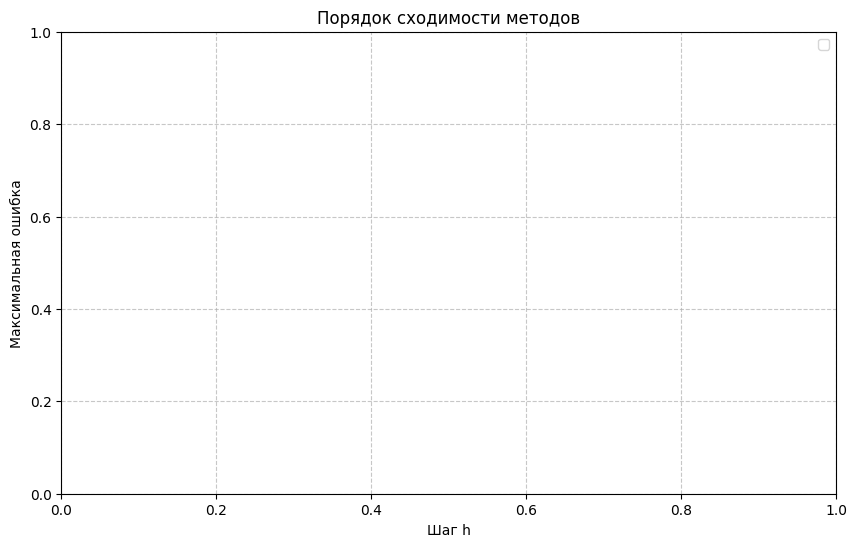

ITERATION 3 3
x0= 0.8999999999999999 y0= 4.5
❌ rk4_solve: NaN или inf в решении (h=0.0001)
⚠️ RK4 при h=0.0001: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ pece4_solve: NaN или inf в решении (h=0.0001)
⚠️ PECE4 при h=0.0001: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ Gear4: расходимость на шаге 3, h=0.0001
❌ gear4_fixed_step: NaN или inf в решении (h=0.0001)
⚠️ Gear4_fixed при h=0.0001: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ rk4_solve: NaN или inf в решении (h=5e-05)
⚠️ RK4 при h=5e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ pece4_solve: NaN или inf в решении (h=5e-05)
⚠️ PECE4 при h=5e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ Gear4: расходимость на шаге 3, h=5e-05
❌ gear4_fixed_step: NaN или inf в решении (h=5e-05)
⚠️ Gear4_fixed при h=5e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ rk4_solve: NaN или inf в решении (h=2.5e

C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:7: RuntimeWarning: overflow encountered in scalar multiply
  dydt = y * (2 * a2 - 0.5 * y - 3.5 * (a2_reg**2) * x)
C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:6: RuntimeWarning: invalid value encountered in scalar multiply
  dxdt = x * (1 - 0.5 * x - (2/7) * (a2_reg**-2) * y)
C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:7: RuntimeWarning: overflow encountered in scalar power
  dydt = y * (2 * a2 - 0.5 * y - 3.5 * (a2_reg**2) * x)
C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:7: RuntimeWarning: invalid value encountered in scalar subtract
  dydt = y * (2 * a2 - 0.5 * y - 3.5 * (a2_reg**2) * x)
C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:8: RuntimeWarning: overflow encountered in scalar multiply
  da2dt = epsilon * (2 - 7 * a2 * x)


❌ rk4_solve: NaN или inf в решении (h=1.25e-05)
⚠️ RK4 при h=1.25e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ pece4_solve: NaN или inf в решении (h=1.25e-05)
⚠️ PECE4 при h=1.25e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ Gear4: расходимость на шаге 3, h=1.25e-05
❌ gear4_fixed_step: NaN или inf в решении (h=1.25e-05)
⚠️ Gear4_fixed при h=1.25e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ rk4_solve: NaN или inf в решении (h=6.25e-06)
⚠️ RK4 при h=6.25e-06: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ pece4_solve: NaN или inf в решении (h=6.25e-06)
⚠️ PECE4 при h=6.25e-06: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ Gear4: расходимость на шаге 3, h=6.25e-06
❌ gear4_fixed_step: NaN или inf в решении (h=6.25e-06)
⚠️ Gear4_fixed при h=6.25e-06: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ rk4_solve: NaN или inf в решении (h=3.125e-06)
⚠️ 

C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3955799424.py:41: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend()


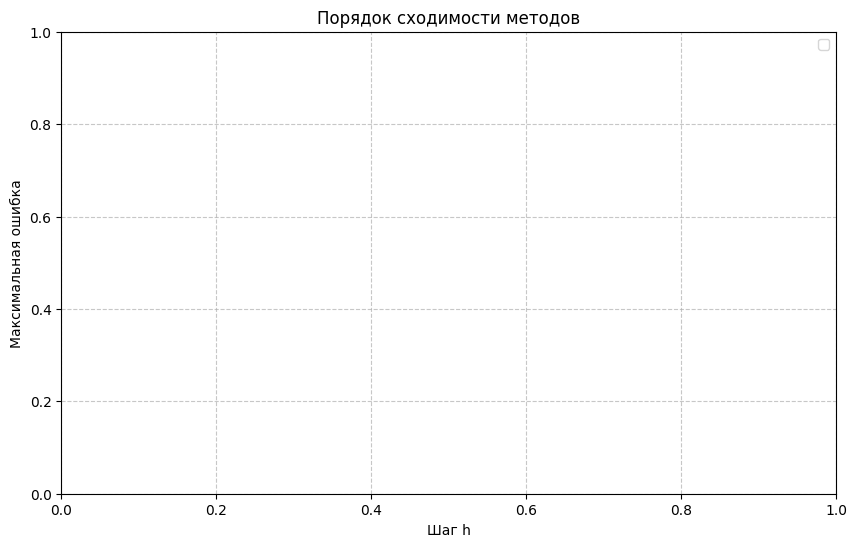

ITERATION 3 4
x0= 0.8999999999999999 y0= 6.0
❌ rk4_solve: NaN или inf в решении (h=0.0001)
⚠️ RK4 при h=0.0001: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ pece4_solve: NaN или inf в решении (h=0.0001)
⚠️ PECE4 при h=0.0001: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ Gear4: расходимость на шаге 3, h=0.0001
❌ gear4_fixed_step: NaN или inf в решении (h=0.0001)
⚠️ Gear4_fixed при h=0.0001: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ rk4_solve: NaN или inf в решении (h=5e-05)
⚠️ RK4 при h=5e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ pece4_solve: NaN или inf в решении (h=5e-05)
⚠️ PECE4 при h=5e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ Gear4: расходимость на шаге 3, h=5e-05
❌ gear4_fixed_step: NaN или inf в решении (h=5e-05)
⚠️ Gear4_fixed при h=5e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ rk4_solve: NaN или inf в решении (h=2.5e

C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:7: RuntimeWarning: overflow encountered in scalar multiply
  dydt = y * (2 * a2 - 0.5 * y - 3.5 * (a2_reg**2) * x)
C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:6: RuntimeWarning: invalid value encountered in scalar multiply
  dxdt = x * (1 - 0.5 * x - (2/7) * (a2_reg**-2) * y)
C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:7: RuntimeWarning: overflow encountered in scalar power
  dydt = y * (2 * a2 - 0.5 * y - 3.5 * (a2_reg**2) * x)
C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:7: RuntimeWarning: invalid value encountered in scalar subtract
  dydt = y * (2 * a2 - 0.5 * y - 3.5 * (a2_reg**2) * x)
C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:8: RuntimeWarning: overflow encountered in scalar multiply
  da2dt = epsilon * (2 - 7 * a2 * x)


❌ rk4_solve: NaN или inf в решении (h=1.25e-05)
⚠️ RK4 при h=1.25e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ pece4_solve: NaN или inf в решении (h=1.25e-05)
⚠️ PECE4 при h=1.25e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ Gear4: расходимость на шаге 3, h=1.25e-05
❌ gear4_fixed_step: NaN или inf в решении (h=1.25e-05)
⚠️ Gear4_fixed при h=1.25e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ rk4_solve: NaN или inf в решении (h=6.25e-06)
⚠️ RK4 при h=6.25e-06: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ pece4_solve: NaN или inf в решении (h=6.25e-06)
⚠️ PECE4 при h=6.25e-06: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ Gear4: расходимость на шаге 3, h=6.25e-06
❌ gear4_fixed_step: NaN или inf в решении (h=6.25e-06)
⚠️ Gear4_fixed при h=6.25e-06: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ rk4_solve: NaN или inf в решении (h=3.125e-06)
⚠️ 

C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3955799424.py:41: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend()


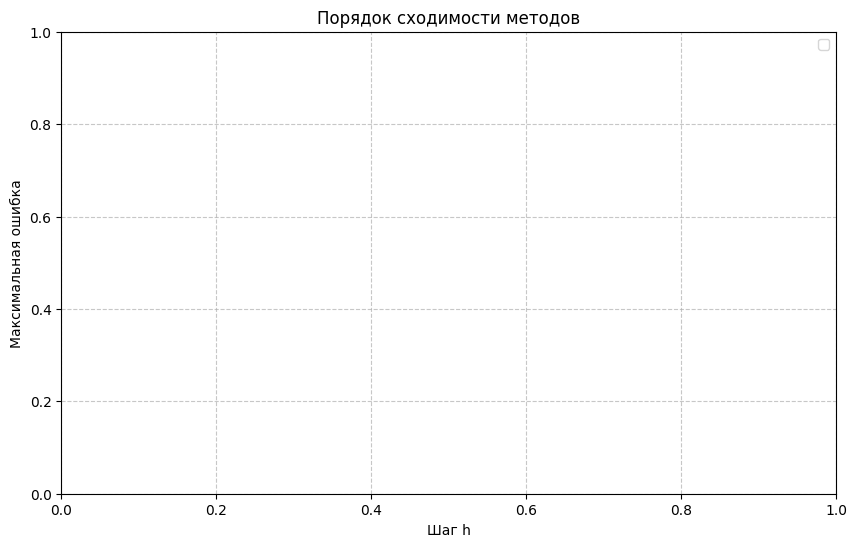

ITERATION 3 5
x0= 0.8999999999999999 y0= 7.5
❌ rk4_solve: NaN или inf в решении (h=0.0001)
⚠️ RK4 при h=0.0001: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ pece4_solve: NaN или inf в решении (h=0.0001)
⚠️ PECE4 при h=0.0001: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ Gear4: расходимость на шаге 3, h=0.0001
❌ gear4_fixed_step: NaN или inf в решении (h=0.0001)
⚠️ Gear4_fixed при h=0.0001: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ rk4_solve: NaN или inf в решении (h=5e-05)
⚠️ RK4 при h=5e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ pece4_solve: NaN или inf в решении (h=5e-05)
⚠️ PECE4 при h=5e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ Gear4: расходимость на шаге 3, h=5e-05
❌ gear4_fixed_step: NaN или inf в решении (h=5e-05)
⚠️ Gear4_fixed при h=5e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ rk4_solve: NaN или inf в решении (h=2.5e

C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:7: RuntimeWarning: overflow encountered in scalar multiply
  dydt = y * (2 * a2 - 0.5 * y - 3.5 * (a2_reg**2) * x)
C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:6: RuntimeWarning: invalid value encountered in scalar multiply
  dxdt = x * (1 - 0.5 * x - (2/7) * (a2_reg**-2) * y)
C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:7: RuntimeWarning: overflow encountered in scalar power
  dydt = y * (2 * a2 - 0.5 * y - 3.5 * (a2_reg**2) * x)
C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:7: RuntimeWarning: invalid value encountered in scalar subtract
  dydt = y * (2 * a2 - 0.5 * y - 3.5 * (a2_reg**2) * x)
C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:8: RuntimeWarning: overflow encountered in scalar multiply
  da2dt = epsilon * (2 - 7 * a2 * x)


❌ pece4_solve: NaN или inf в решении (h=2.5e-05)
⚠️ PECE4 при h=2.5e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ Gear4: расходимость на шаге 3, h=2.5e-05
❌ gear4_fixed_step: NaN или inf в решении (h=2.5e-05)
⚠️ Gear4_fixed при h=2.5e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ rk4_solve: NaN или inf в решении (h=1.25e-05)
⚠️ RK4 при h=1.25e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ pece4_solve: NaN или inf в решении (h=1.25e-05)
⚠️ PECE4 при h=1.25e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ Gear4: расходимость на шаге 3, h=1.25e-05
❌ gear4_fixed_step: NaN или inf в решении (h=1.25e-05)
⚠️ Gear4_fixed при h=1.25e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ rk4_solve: NaN или inf в решении (h=6.25e-06)
⚠️ RK4 при h=6.25e-06: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ pece4_solve: NaN или inf в решении (h=6.25e-06)
⚠️ PECE

C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3955799424.py:41: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend()


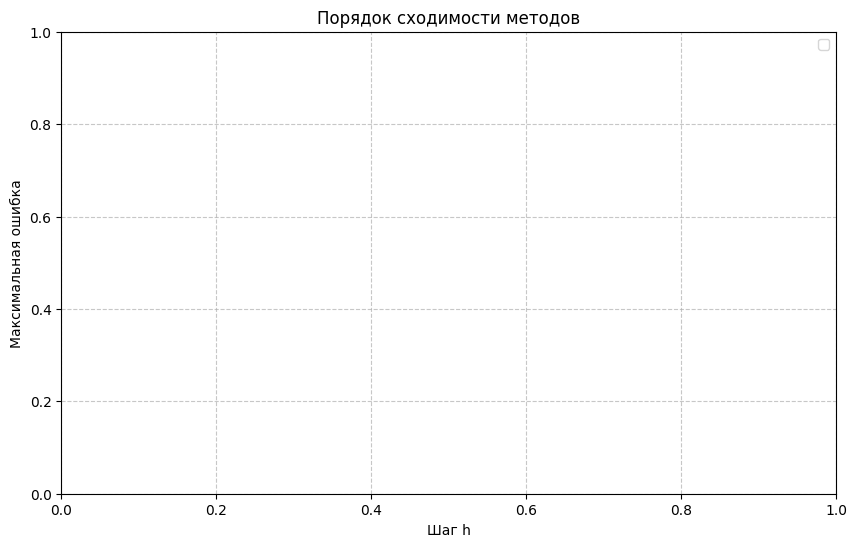

ITERATION 3 6
x0= 0.8999999999999999 y0= 9.0
❌ rk4_solve: NaN или inf в решении (h=0.0001)
⚠️ RK4 при h=0.0001: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ pece4_solve: NaN или inf в решении (h=0.0001)
⚠️ PECE4 при h=0.0001: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ Gear4: расходимость на шаге 3, h=0.0001
❌ gear4_fixed_step: NaN или inf в решении (h=0.0001)
⚠️ Gear4_fixed при h=0.0001: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ rk4_solve: NaN или inf в решении (h=5e-05)
⚠️ RK4 при h=5e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ pece4_solve: NaN или inf в решении (h=5e-05)
⚠️ PECE4 при h=5e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ Gear4: расходимость на шаге 3, h=5e-05
❌ gear4_fixed_step: NaN или inf в решении (h=5e-05)
⚠️ Gear4_fixed при h=5e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ rk4_solve: NaN или inf в решении (h=2.5e

C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:7: RuntimeWarning: overflow encountered in scalar multiply
  dydt = y * (2 * a2 - 0.5 * y - 3.5 * (a2_reg**2) * x)
C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:6: RuntimeWarning: invalid value encountered in scalar multiply
  dxdt = x * (1 - 0.5 * x - (2/7) * (a2_reg**-2) * y)
C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:7: RuntimeWarning: overflow encountered in scalar power
  dydt = y * (2 * a2 - 0.5 * y - 3.5 * (a2_reg**2) * x)
C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:7: RuntimeWarning: invalid value encountered in scalar subtract
  dydt = y * (2 * a2 - 0.5 * y - 3.5 * (a2_reg**2) * x)
C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:8: RuntimeWarning: overflow encountered in scalar multiply
  da2dt = epsilon * (2 - 7 * a2 * x)
C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\1111329400.py:11: RuntimeWarning: invalid value encountered in add
  

❌ pece4_solve: NaN или inf в решении (h=2.5e-05)
⚠️ PECE4 при h=2.5e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ Gear4: расходимость на шаге 3, h=2.5e-05
❌ gear4_fixed_step: NaN или inf в решении (h=2.5e-05)
⚠️ Gear4_fixed при h=2.5e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ rk4_solve: NaN или inf в решении (h=1.25e-05)
⚠️ RK4 при h=1.25e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ pece4_solve: NaN или inf в решении (h=1.25e-05)
⚠️ PECE4 при h=1.25e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ Gear4: расходимость на шаге 3, h=1.25e-05
❌ gear4_fixed_step: NaN или inf в решении (h=1.25e-05)
⚠️ Gear4_fixed при h=1.25e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ rk4_solve: NaN или inf в решении (h=6.25e-06)
⚠️ RK4 при h=6.25e-06: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ pece4_solve: NaN или inf в решении (h=6.25e-06)
⚠️ PECE

C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3955799424.py:41: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend()


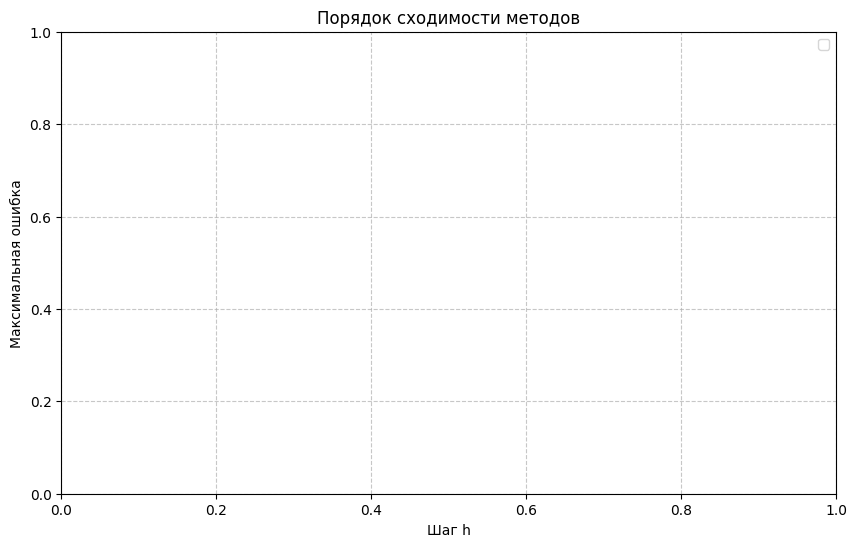

ITERATION 3 7
x0= 0.8999999999999999 y0= 10.5
❌ rk4_solve: NaN или inf в решении (h=0.0001)
⚠️ RK4 при h=0.0001: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ pece4_solve: NaN или inf в решении (h=0.0001)
⚠️ PECE4 при h=0.0001: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ Gear4: расходимость на шаге 3, h=0.0001
❌ gear4_fixed_step: NaN или inf в решении (h=0.0001)
⚠️ Gear4_fixed при h=0.0001: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ rk4_solve: NaN или inf в решении (h=5e-05)
⚠️ RK4 при h=5e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ pece4_solve: NaN или inf в решении (h=5e-05)
⚠️ PECE4 при h=5e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ Gear4: расходимость на шаге 3, h=5e-05
❌ gear4_fixed_step: NaN или inf в решении (h=5e-05)
⚠️ Gear4_fixed при h=5e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ rk4_solve: NaN или inf в решении (h=2.5

C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:7: RuntimeWarning: overflow encountered in scalar multiply
  dydt = y * (2 * a2 - 0.5 * y - 3.5 * (a2_reg**2) * x)
C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:6: RuntimeWarning: invalid value encountered in scalar multiply
  dxdt = x * (1 - 0.5 * x - (2/7) * (a2_reg**-2) * y)
C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:7: RuntimeWarning: overflow encountered in scalar power
  dydt = y * (2 * a2 - 0.5 * y - 3.5 * (a2_reg**2) * x)
C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:7: RuntimeWarning: invalid value encountered in scalar subtract
  dydt = y * (2 * a2 - 0.5 * y - 3.5 * (a2_reg**2) * x)
C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:8: RuntimeWarning: overflow encountered in scalar multiply
  da2dt = epsilon * (2 - 7 * a2 * x)
C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\1111329400.py:11: RuntimeWarning: invalid value encountered in add
  

❌ pece4_solve: NaN или inf в решении (h=2.5e-05)
⚠️ PECE4 при h=2.5e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ Gear4: расходимость на шаге 3, h=2.5e-05
❌ gear4_fixed_step: NaN или inf в решении (h=2.5e-05)
⚠️ Gear4_fixed при h=2.5e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ rk4_solve: NaN или inf в решении (h=1.25e-05)
⚠️ RK4 при h=1.25e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ pece4_solve: NaN или inf в решении (h=1.25e-05)
⚠️ PECE4 при h=1.25e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ Gear4: расходимость на шаге 3, h=1.25e-05
❌ gear4_fixed_step: NaN или inf в решении (h=1.25e-05)
⚠️ Gear4_fixed при h=1.25e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ rk4_solve: NaN или inf в решении (h=6.25e-06)
⚠️ RK4 при h=6.25e-06: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ pece4_solve: NaN или inf в решении (h=6.25e-06)
⚠️ PECE

C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3955799424.py:41: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend()


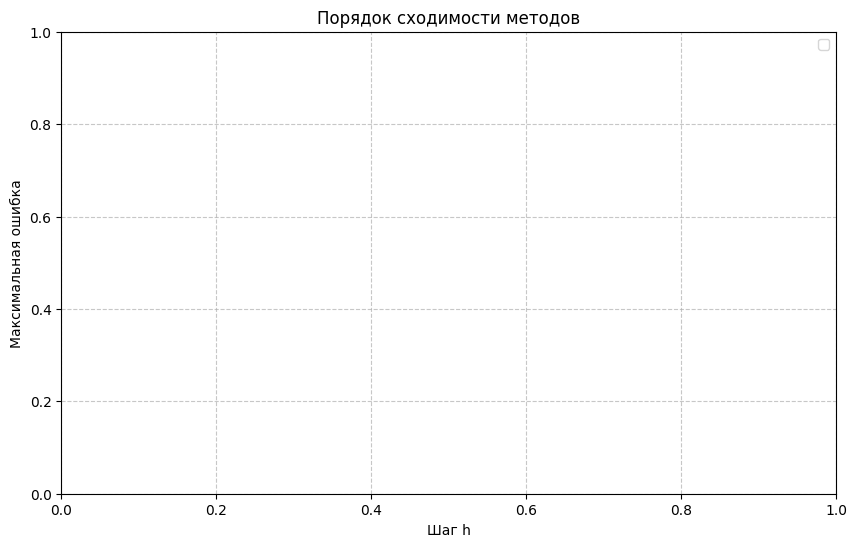

ITERATION 3 8
x0= 0.8999999999999999 y0= 12.0
❌ rk4_solve: NaN или inf в решении (h=0.0001)
⚠️ RK4 при h=0.0001: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ pece4_solve: NaN или inf в решении (h=0.0001)
⚠️ PECE4 при h=0.0001: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ Gear4: расходимость на шаге 3, h=0.0001
❌ gear4_fixed_step: NaN или inf в решении (h=0.0001)
⚠️ Gear4_fixed при h=0.0001: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ rk4_solve: NaN или inf в решении (h=5e-05)
⚠️ RK4 при h=5e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ pece4_solve: NaN или inf в решении (h=5e-05)
⚠️ PECE4 при h=5e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ Gear4: расходимость на шаге 3, h=5e-05
❌ gear4_fixed_step: NaN или inf в решении (h=5e-05)
⚠️ Gear4_fixed при h=5e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ rk4_solve: NaN или inf в решении (h=2.5

C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:7: RuntimeWarning: overflow encountered in scalar multiply
  dydt = y * (2 * a2 - 0.5 * y - 3.5 * (a2_reg**2) * x)
C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:6: RuntimeWarning: invalid value encountered in scalar multiply
  dxdt = x * (1 - 0.5 * x - (2/7) * (a2_reg**-2) * y)
C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:7: RuntimeWarning: overflow encountered in scalar power
  dydt = y * (2 * a2 - 0.5 * y - 3.5 * (a2_reg**2) * x)
C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:7: RuntimeWarning: invalid value encountered in scalar subtract
  dydt = y * (2 * a2 - 0.5 * y - 3.5 * (a2_reg**2) * x)
C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:8: RuntimeWarning: overflow encountered in scalar multiply
  da2dt = epsilon * (2 - 7 * a2 * x)


❌ pece4_solve: NaN или inf в решении (h=2.5e-05)
⚠️ PECE4 при h=2.5e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ Gear4: расходимость на шаге 3, h=2.5e-05
❌ gear4_fixed_step: NaN или inf в решении (h=2.5e-05)
⚠️ Gear4_fixed при h=2.5e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ rk4_solve: NaN или inf в решении (h=1.25e-05)
⚠️ RK4 при h=1.25e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ pece4_solve: NaN или inf в решении (h=1.25e-05)
⚠️ PECE4 при h=1.25e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ Gear4: расходимость на шаге 3, h=1.25e-05
❌ gear4_fixed_step: NaN или inf в решении (h=1.25e-05)
⚠️ Gear4_fixed при h=1.25e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ rk4_solve: NaN или inf в решении (h=6.25e-06)
⚠️ RK4 при h=6.25e-06: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ pece4_solve: NaN или inf в решении (h=6.25e-06)
⚠️ PECE

C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3955799424.py:41: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend()


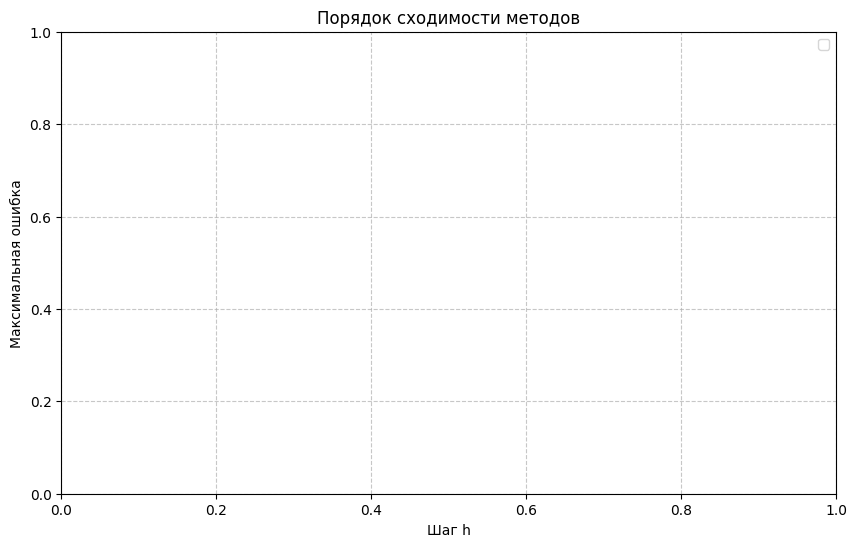

ITERATION 3 9
x0= 0.8999999999999999 y0= 13.5
❌ rk4_solve: NaN или inf в решении (h=0.0001)
⚠️ RK4 при h=0.0001: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ pece4_solve: NaN или inf в решении (h=0.0001)
⚠️ PECE4 при h=0.0001: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ Gear4: расходимость на шаге 3, h=0.0001
❌ gear4_fixed_step: NaN или inf в решении (h=0.0001)
⚠️ Gear4_fixed при h=0.0001: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ rk4_solve: NaN или inf в решении (h=5e-05)
⚠️ RK4 при h=5e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ pece4_solve: NaN или inf в решении (h=5e-05)
⚠️ PECE4 при h=5e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ Gear4: расходимость на шаге 3, h=5e-05
❌ gear4_fixed_step: NaN или inf в решении (h=5e-05)
⚠️ Gear4_fixed при h=5e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ rk4_solve: NaN или inf в решении (h=2.5

C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:7: RuntimeWarning: overflow encountered in scalar multiply
  dydt = y * (2 * a2 - 0.5 * y - 3.5 * (a2_reg**2) * x)
C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:6: RuntimeWarning: invalid value encountered in scalar multiply
  dxdt = x * (1 - 0.5 * x - (2/7) * (a2_reg**-2) * y)
C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:7: RuntimeWarning: overflow encountered in scalar power
  dydt = y * (2 * a2 - 0.5 * y - 3.5 * (a2_reg**2) * x)
C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:7: RuntimeWarning: invalid value encountered in scalar subtract
  dydt = y * (2 * a2 - 0.5 * y - 3.5 * (a2_reg**2) * x)
C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:8: RuntimeWarning: overflow encountered in scalar multiply
  da2dt = epsilon * (2 - 7 * a2 * x)


❌ pece4_solve: NaN или inf в решении (h=2.5e-05)
⚠️ PECE4 при h=2.5e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ Gear4: расходимость на шаге 3, h=2.5e-05
❌ gear4_fixed_step: NaN или inf в решении (h=2.5e-05)
⚠️ Gear4_fixed при h=2.5e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ rk4_solve: NaN или inf в решении (h=1.25e-05)
⚠️ RK4 при h=1.25e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ pece4_solve: NaN или inf в решении (h=1.25e-05)
⚠️ PECE4 при h=1.25e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ Gear4: расходимость на шаге 3, h=1.25e-05
❌ gear4_fixed_step: NaN или inf в решении (h=1.25e-05)
⚠️ Gear4_fixed при h=1.25e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ rk4_solve: NaN или inf в решении (h=6.25e-06)
⚠️ RK4 при h=6.25e-06: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ pece4_solve: NaN или inf в решении (h=6.25e-06)
⚠️ PECE

C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3955799424.py:41: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend()


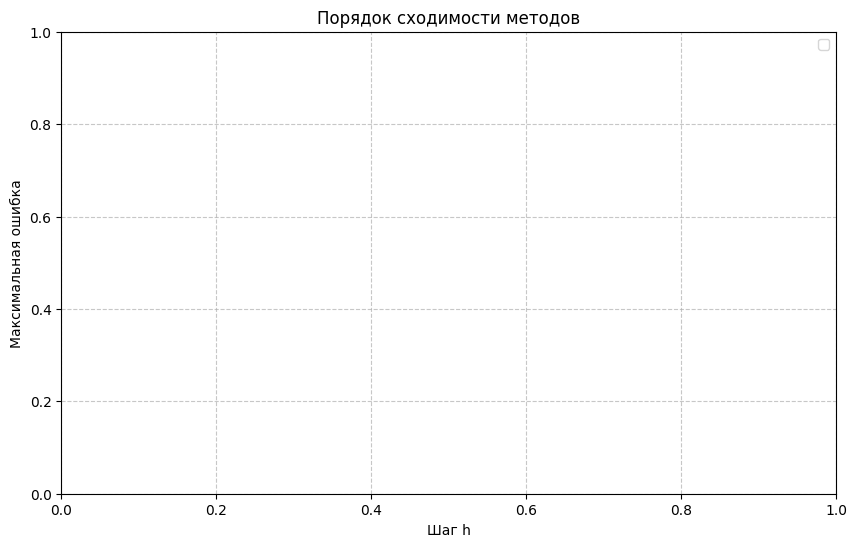

ITERATION 4 0
x0= 1.2 y0= 0.0
✅ rk4_solve: успех, 101 шагов (h=0.0001)
✅ pece4_solve: успех, 101 шагов (h=0.0001)
✅ gear4_fixed_step: успех, 101 шагов (h=0.0001)
✅ rk4_solve: успех, 201 шагов (h=5e-05)
✅ pece4_solve: успех, 201 шагов (h=5e-05)
✅ gear4_fixed_step: успех, 201 шагов (h=5e-05)
✅ rk4_solve: успех, 401 шагов (h=2.5e-05)
✅ pece4_solve: успех, 401 шагов (h=2.5e-05)
✅ gear4_fixed_step: успех, 401 шагов (h=2.5e-05)
✅ rk4_solve: успех, 801 шагов (h=1.25e-05)
✅ pece4_solve: успех, 801 шагов (h=1.25e-05)
✅ gear4_fixed_step: успех, 801 шагов (h=1.25e-05)
✅ rk4_solve: успех, 1601 шагов (h=6.25e-06)
✅ pece4_solve: успех, 1601 шагов (h=6.25e-06)
✅ gear4_fixed_step: успех, 1601 шагов (h=6.25e-06)
✅ rk4_solve: успех, 3201 шагов (h=3.125e-06)
✅ pece4_solve: успех, 3201 шагов (h=3.125e-06)
✅ gear4_fixed_step: успех, 3201 шагов (h=3.125e-06)
          h           RK4  p_RK4         PECE4  p_PECE4   Gear4_fixed  p_Gear4_fixed
0  0.000100  7.667620e-10    NaN  7.667620e-10      NaN  7.663241e

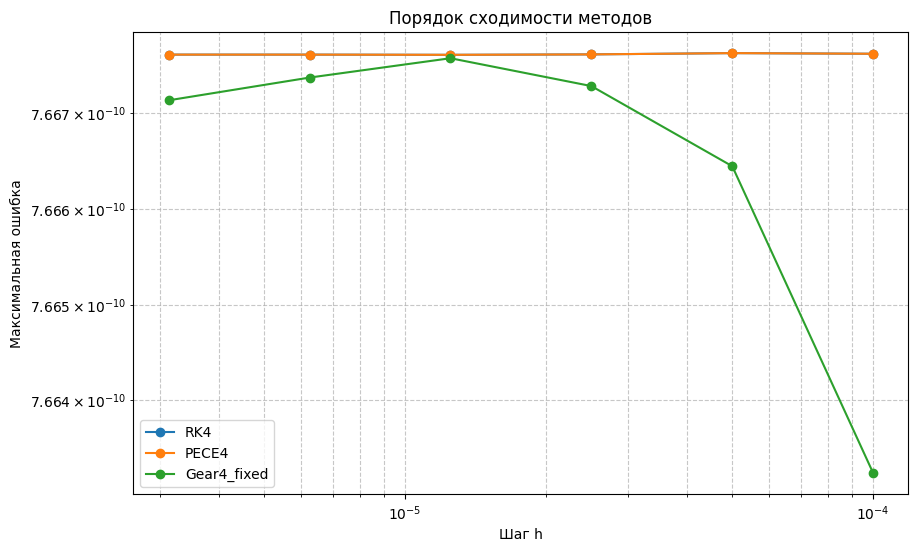

ITERATION 4 1
x0= 1.2 y0= 1.5
❌ rk4_solve: NaN или inf в решении (h=0.0001)
⚠️ RK4 при h=0.0001: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ pece4_solve: NaN или inf в решении (h=0.0001)
⚠️ PECE4 при h=0.0001: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ Gear4: расходимость на шаге 3, h=0.0001
❌ gear4_fixed_step: NaN или inf в решении (h=0.0001)
⚠️ Gear4_fixed при h=0.0001: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ rk4_solve: NaN или inf в решении (h=5e-05)
⚠️ RK4 при h=5e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ pece4_solve: NaN или inf в решении (h=5e-05)
⚠️ PECE4 при h=5e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ Gear4: расходимость на шаге 3, h=5e-05
❌ gear4_fixed_step: NaN или inf в решении (h=5e-05)
⚠️ Gear4_fixed при h=5e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ rk4_solve: NaN или inf в решении (h=2.5e-05)
⚠️ RK4 при

C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:7: RuntimeWarning: overflow encountered in scalar multiply
  dydt = y * (2 * a2 - 0.5 * y - 3.5 * (a2_reg**2) * x)
C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:7: RuntimeWarning: overflow encountered in scalar power
  dydt = y * (2 * a2 - 0.5 * y - 3.5 * (a2_reg**2) * x)
C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:7: RuntimeWarning: invalid value encountered in scalar subtract
  dydt = y * (2 * a2 - 0.5 * y - 3.5 * (a2_reg**2) * x)
C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:8: RuntimeWarning: overflow encountered in scalar multiply
  da2dt = epsilon * (2 - 7 * a2 * x)
C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\1111329400.py:11: RuntimeWarning: invalid value encountered in add
  return y + h/6 * (k1 + 2*k2 + 2*k3 + k4)
C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:6: RuntimeWarning: invalid value encountered in scalar multiply
  dxdt = x * 

⚠️ PECE4 при h=2.5e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ Gear4: расходимость на шаге 3, h=2.5e-05
❌ gear4_fixed_step: NaN или inf в решении (h=2.5e-05)
⚠️ Gear4_fixed при h=2.5e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ rk4_solve: NaN или inf в решении (h=1.25e-05)
⚠️ RK4 при h=1.25e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ pece4_solve: NaN или inf в решении (h=1.25e-05)
⚠️ PECE4 при h=1.25e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ Gear4: расходимость на шаге 3, h=1.25e-05
❌ gear4_fixed_step: NaN или inf в решении (h=1.25e-05)
⚠️ Gear4_fixed при h=1.25e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ rk4_solve: NaN или inf в решении (h=6.25e-06)
⚠️ RK4 при h=6.25e-06: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ pece4_solve: NaN или inf в решении (h=6.25e-06)
⚠️ PECE4 при h=6.25e-06: operands could not be broadcast

C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3955799424.py:41: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend()


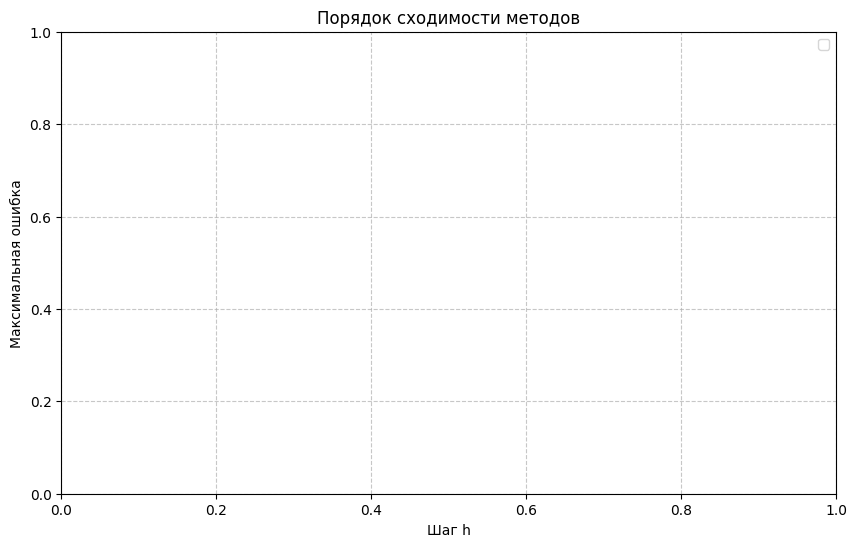

ITERATION 4 2
x0= 1.2 y0= 3.0
❌ rk4_solve: NaN или inf в решении (h=0.0001)
⚠️ RK4 при h=0.0001: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ pece4_solve: NaN или inf в решении (h=0.0001)
⚠️ PECE4 при h=0.0001: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ Gear4: расходимость на шаге 3, h=0.0001
❌ gear4_fixed_step: NaN или inf в решении (h=0.0001)
⚠️ Gear4_fixed при h=0.0001: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ rk4_solve: NaN или inf в решении (h=5e-05)
⚠️ RK4 при h=5e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ pece4_solve: NaN или inf в решении (h=5e-05)
⚠️ PECE4 при h=5e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ Gear4: расходимость на шаге 3, h=5e-05
❌ gear4_fixed_step: NaN или inf в решении (h=5e-05)
⚠️ Gear4_fixed при h=5e-05: operands could not be broadcast together with shapes (1,0) (1,3) 


C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:7: RuntimeWarning: overflow encountered in scalar multiply
  dydt = y * (2 * a2 - 0.5 * y - 3.5 * (a2_reg**2) * x)
C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:6: RuntimeWarning: invalid value encountered in scalar multiply
  dxdt = x * (1 - 0.5 * x - (2/7) * (a2_reg**-2) * y)
C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:7: RuntimeWarning: overflow encountered in scalar power
  dydt = y * (2 * a2 - 0.5 * y - 3.5 * (a2_reg**2) * x)
C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:7: RuntimeWarning: invalid value encountered in scalar subtract
  dydt = y * (2 * a2 - 0.5 * y - 3.5 * (a2_reg**2) * x)
C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:8: RuntimeWarning: overflow encountered in scalar multiply
  da2dt = epsilon * (2 - 7 * a2 * x)
C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\1111329400.py:11: RuntimeWarning: invalid value encountered in add
  

❌ rk4_solve: NaN или inf в решении (h=2.5e-05)
⚠️ RK4 при h=2.5e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ pece4_solve: NaN или inf в решении (h=2.5e-05)
⚠️ PECE4 при h=2.5e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ Gear4: расходимость на шаге 3, h=2.5e-05
❌ gear4_fixed_step: NaN или inf в решении (h=2.5e-05)
⚠️ Gear4_fixed при h=2.5e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ rk4_solve: NaN или inf в решении (h=1.25e-05)
⚠️ RK4 при h=1.25e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ pece4_solve: NaN или inf в решении (h=1.25e-05)
⚠️ PECE4 при h=1.25e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ Gear4: расходимость на шаге 3, h=1.25e-05
❌ gear4_fixed_step: NaN или inf в решении (h=1.25e-05)
⚠️ Gear4_fixed при h=1.25e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ rk4_solve: NaN или inf в решении (h=6.25e-06)
⚠️ RK4 при 

C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3955799424.py:41: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend()


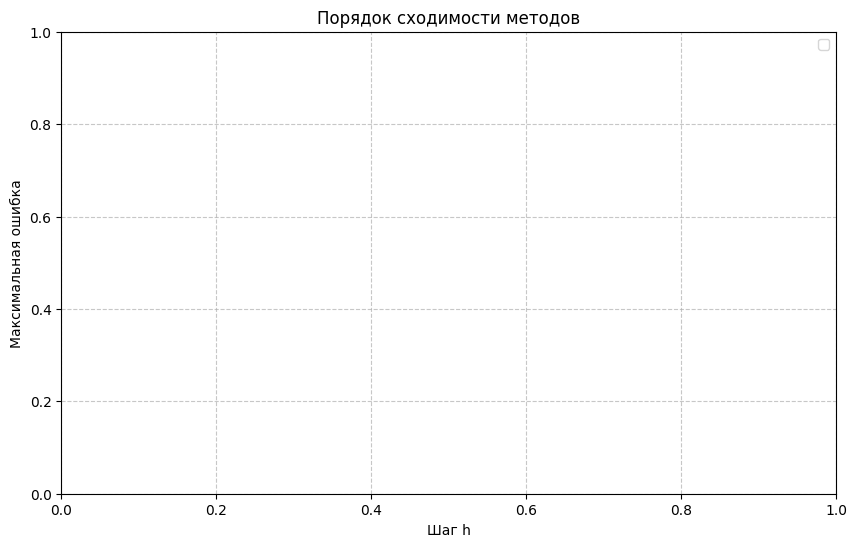

ITERATION 4 3
x0= 1.2 y0= 4.5
❌ rk4_solve: NaN или inf в решении (h=0.0001)
⚠️ RK4 при h=0.0001: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ pece4_solve: NaN или inf в решении (h=0.0001)
⚠️ PECE4 при h=0.0001: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ Gear4: расходимость на шаге 3, h=0.0001
❌ gear4_fixed_step: NaN или inf в решении (h=0.0001)
⚠️ Gear4_fixed при h=0.0001: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ rk4_solve: NaN или inf в решении (h=5e-05)
⚠️ RK4 при h=5e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ pece4_solve: NaN или inf в решении (h=5e-05)
⚠️ PECE4 при h=5e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ Gear4: расходимость на шаге 3, h=5e-05
❌ gear4_fixed_step: NaN или inf в решении (h=5e-05)
⚠️ Gear4_fixed при h=5e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ rk4_solve: NaN или inf в решении (h=2.5e-05)
⚠️ RK4 при

C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:7: RuntimeWarning: overflow encountered in scalar multiply
  dydt = y * (2 * a2 - 0.5 * y - 3.5 * (a2_reg**2) * x)
C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:6: RuntimeWarning: invalid value encountered in scalar multiply
  dxdt = x * (1 - 0.5 * x - (2/7) * (a2_reg**-2) * y)
C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:7: RuntimeWarning: overflow encountered in scalar power
  dydt = y * (2 * a2 - 0.5 * y - 3.5 * (a2_reg**2) * x)
C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:7: RuntimeWarning: invalid value encountered in scalar subtract
  dydt = y * (2 * a2 - 0.5 * y - 3.5 * (a2_reg**2) * x)
C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:8: RuntimeWarning: overflow encountered in scalar multiply
  da2dt = epsilon * (2 - 7 * a2 * x)


❌ rk4_solve: NaN или inf в решении (h=1.25e-05)
⚠️ RK4 при h=1.25e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ pece4_solve: NaN или inf в решении (h=1.25e-05)
⚠️ PECE4 при h=1.25e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ Gear4: расходимость на шаге 3, h=1.25e-05
❌ gear4_fixed_step: NaN или inf в решении (h=1.25e-05)
⚠️ Gear4_fixed при h=1.25e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ rk4_solve: NaN или inf в решении (h=6.25e-06)
⚠️ RK4 при h=6.25e-06: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ pece4_solve: NaN или inf в решении (h=6.25e-06)
⚠️ PECE4 при h=6.25e-06: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ Gear4: расходимость на шаге 3, h=6.25e-06
❌ gear4_fixed_step: NaN или inf в решении (h=6.25e-06)
⚠️ Gear4_fixed при h=6.25e-06: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ rk4_solve: NaN или inf в решении (h=3.125e-06)
⚠️ 

C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3955799424.py:41: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend()


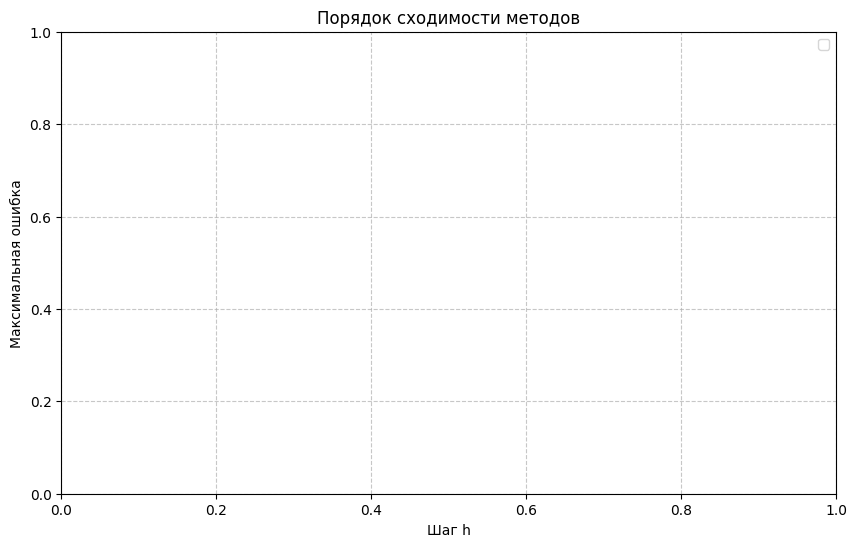

ITERATION 4 4
x0= 1.2 y0= 6.0
❌ rk4_solve: NaN или inf в решении (h=0.0001)
⚠️ RK4 при h=0.0001: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ pece4_solve: NaN или inf в решении (h=0.0001)
⚠️ PECE4 при h=0.0001: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ Gear4: расходимость на шаге 3, h=0.0001
❌ gear4_fixed_step: NaN или inf в решении (h=0.0001)
⚠️ Gear4_fixed при h=0.0001: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ rk4_solve: NaN или inf в решении (h=5e-05)
⚠️ RK4 при h=5e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ pece4_solve: NaN или inf в решении (h=5e-05)
⚠️ PECE4 при h=5e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ Gear4: расходимость на шаге 3, h=5e-05
❌ gear4_fixed_step: NaN или inf в решении (h=5e-05)
⚠️ Gear4_fixed при h=5e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ rk4_solve: NaN или inf в решении (h=2.5e-05)
⚠️ RK4 при

C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:7: RuntimeWarning: overflow encountered in scalar multiply
  dydt = y * (2 * a2 - 0.5 * y - 3.5 * (a2_reg**2) * x)
C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:6: RuntimeWarning: invalid value encountered in scalar multiply
  dxdt = x * (1 - 0.5 * x - (2/7) * (a2_reg**-2) * y)
C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:7: RuntimeWarning: overflow encountered in scalar power
  dydt = y * (2 * a2 - 0.5 * y - 3.5 * (a2_reg**2) * x)
C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:7: RuntimeWarning: invalid value encountered in scalar subtract
  dydt = y * (2 * a2 - 0.5 * y - 3.5 * (a2_reg**2) * x)
C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:8: RuntimeWarning: overflow encountered in scalar multiply
  da2dt = epsilon * (2 - 7 * a2 * x)


❌ rk4_solve: NaN или inf в решении (h=1.25e-05)
⚠️ RK4 при h=1.25e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ pece4_solve: NaN или inf в решении (h=1.25e-05)
⚠️ PECE4 при h=1.25e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ Gear4: расходимость на шаге 3, h=1.25e-05
❌ gear4_fixed_step: NaN или inf в решении (h=1.25e-05)
⚠️ Gear4_fixed при h=1.25e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ rk4_solve: NaN или inf в решении (h=6.25e-06)
⚠️ RK4 при h=6.25e-06: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ pece4_solve: NaN или inf в решении (h=6.25e-06)
⚠️ PECE4 при h=6.25e-06: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ Gear4: расходимость на шаге 3, h=6.25e-06
❌ gear4_fixed_step: NaN или inf в решении (h=6.25e-06)
⚠️ Gear4_fixed при h=6.25e-06: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ rk4_solve: NaN или inf в решении (h=3.125e-06)
⚠️ 

C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3955799424.py:41: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend()


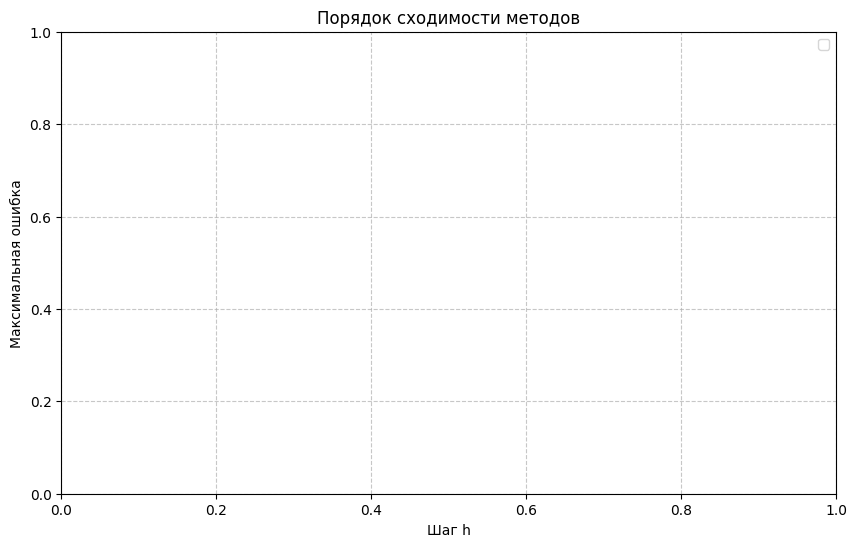

ITERATION 4 5
x0= 1.2 y0= 7.5
❌ rk4_solve: NaN или inf в решении (h=0.0001)
⚠️ RK4 при h=0.0001: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ pece4_solve: NaN или inf в решении (h=0.0001)
⚠️ PECE4 при h=0.0001: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ Gear4: расходимость на шаге 3, h=0.0001
❌ gear4_fixed_step: NaN или inf в решении (h=0.0001)
⚠️ Gear4_fixed при h=0.0001: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ rk4_solve: NaN или inf в решении (h=5e-05)
⚠️ RK4 при h=5e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ pece4_solve: NaN или inf в решении (h=5e-05)
⚠️ PECE4 при h=5e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ Gear4: расходимость на шаге 3, h=5e-05
❌ gear4_fixed_step: NaN или inf в решении (h=5e-05)
⚠️ Gear4_fixed при h=5e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ rk4_solve: NaN или inf в решении (h=2.5e-05)


C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:7: RuntimeWarning: overflow encountered in scalar multiply
  dydt = y * (2 * a2 - 0.5 * y - 3.5 * (a2_reg**2) * x)
C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:6: RuntimeWarning: invalid value encountered in scalar multiply
  dxdt = x * (1 - 0.5 * x - (2/7) * (a2_reg**-2) * y)
C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:7: RuntimeWarning: overflow encountered in scalar power
  dydt = y * (2 * a2 - 0.5 * y - 3.5 * (a2_reg**2) * x)
C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:7: RuntimeWarning: invalid value encountered in scalar subtract
  dydt = y * (2 * a2 - 0.5 * y - 3.5 * (a2_reg**2) * x)
C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:8: RuntimeWarning: overflow encountered in scalar multiply
  da2dt = epsilon * (2 - 7 * a2 * x)
C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\1111329400.py:11: RuntimeWarning: invalid value encountered in add
  

⚠️ RK4 при h=2.5e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ pece4_solve: NaN или inf в решении (h=2.5e-05)
⚠️ PECE4 при h=2.5e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ Gear4: расходимость на шаге 3, h=2.5e-05
❌ gear4_fixed_step: NaN или inf в решении (h=2.5e-05)
⚠️ Gear4_fixed при h=2.5e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ rk4_solve: NaN или inf в решении (h=1.25e-05)
⚠️ RK4 при h=1.25e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ pece4_solve: NaN или inf в решении (h=1.25e-05)
⚠️ PECE4 при h=1.25e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ Gear4: расходимость на шаге 3, h=1.25e-05
❌ gear4_fixed_step: NaN или inf в решении (h=1.25e-05)
⚠️ Gear4_fixed при h=1.25e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ rk4_solve: NaN или inf в решении (h=6.25e-06)
⚠️ RK4 при h=6.25e-06: operands could not be broadcast tog

C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3955799424.py:41: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend()


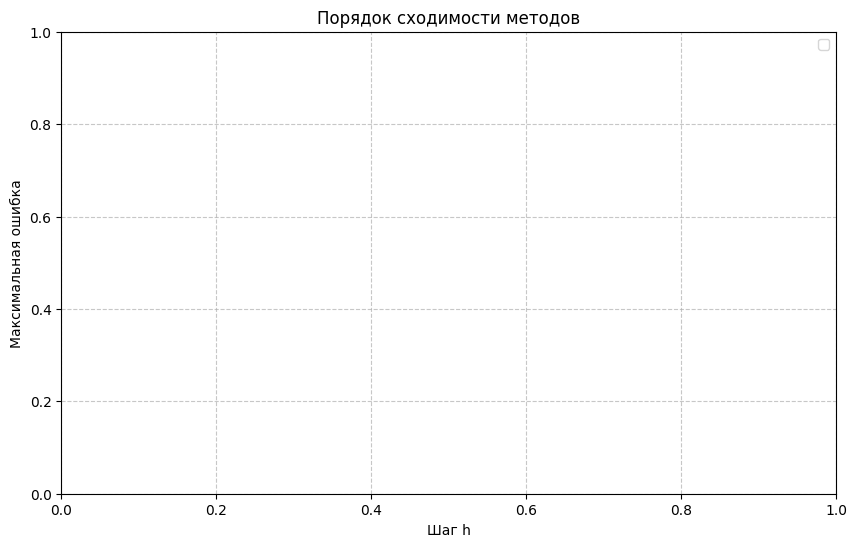

ITERATION 4 6
x0= 1.2 y0= 9.0
❌ rk4_solve: NaN или inf в решении (h=0.0001)
⚠️ RK4 при h=0.0001: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ pece4_solve: NaN или inf в решении (h=0.0001)
⚠️ PECE4 при h=0.0001: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ Gear4: расходимость на шаге 3, h=0.0001
❌ gear4_fixed_step: NaN или inf в решении (h=0.0001)
⚠️ Gear4_fixed при h=0.0001: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ rk4_solve: NaN или inf в решении (h=5e-05)
⚠️ RK4 при h=5e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ pece4_solve: NaN или inf в решении (h=5e-05)
⚠️ PECE4 при h=5e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ Gear4: расходимость на шаге 3, h=5e-05
❌ gear4_fixed_step: NaN или inf в решении (h=5e-05)
⚠️ Gear4_fixed при h=5e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ rk4_solve: NaN или inf в решении (h=2.5e-05)
⚠️ RK4 при

C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:7: RuntimeWarning: overflow encountered in scalar multiply
  dydt = y * (2 * a2 - 0.5 * y - 3.5 * (a2_reg**2) * x)
C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:6: RuntimeWarning: invalid value encountered in scalar multiply
  dxdt = x * (1 - 0.5 * x - (2/7) * (a2_reg**-2) * y)
C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:7: RuntimeWarning: overflow encountered in scalar power
  dydt = y * (2 * a2 - 0.5 * y - 3.5 * (a2_reg**2) * x)
C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:7: RuntimeWarning: invalid value encountered in scalar subtract
  dydt = y * (2 * a2 - 0.5 * y - 3.5 * (a2_reg**2) * x)
C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:8: RuntimeWarning: overflow encountered in scalar multiply
  da2dt = epsilon * (2 - 7 * a2 * x)
C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\1111329400.py:11: RuntimeWarning: invalid value encountered in add
  

❌ pece4_solve: NaN или inf в решении (h=2.5e-05)
⚠️ PECE4 при h=2.5e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ Gear4: расходимость на шаге 3, h=2.5e-05
❌ gear4_fixed_step: NaN или inf в решении (h=2.5e-05)
⚠️ Gear4_fixed при h=2.5e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ rk4_solve: NaN или inf в решении (h=1.25e-05)
⚠️ RK4 при h=1.25e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ pece4_solve: NaN или inf в решении (h=1.25e-05)
⚠️ PECE4 при h=1.25e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ Gear4: расходимость на шаге 3, h=1.25e-05
❌ gear4_fixed_step: NaN или inf в решении (h=1.25e-05)
⚠️ Gear4_fixed при h=1.25e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ rk4_solve: NaN или inf в решении (h=6.25e-06)
⚠️ RK4 при h=6.25e-06: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ pece4_solve: NaN или inf в решении (h=6.25e-06)
⚠️ PECE

C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3955799424.py:41: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend()


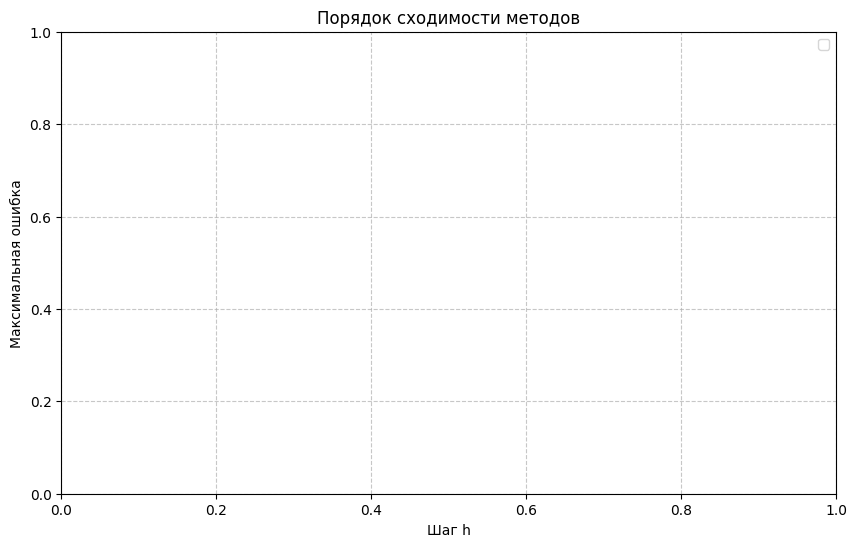

ITERATION 4 7
x0= 1.2 y0= 10.5
❌ rk4_solve: NaN или inf в решении (h=0.0001)
⚠️ RK4 при h=0.0001: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ pece4_solve: NaN или inf в решении (h=0.0001)
⚠️ PECE4 при h=0.0001: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ Gear4: расходимость на шаге 3, h=0.0001
❌ gear4_fixed_step: NaN или inf в решении (h=0.0001)
⚠️ Gear4_fixed при h=0.0001: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ rk4_solve: NaN или inf в решении (h=5e-05)
⚠️ RK4 при h=5e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ pece4_solve: NaN или inf в решении (h=5e-05)
⚠️ PECE4 при h=5e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ Gear4: расходимость на шаге 3, h=5e-05
❌ gear4_fixed_step: NaN или inf в решении (h=5e-05)
⚠️ Gear4_fixed при h=5e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ rk4_solve: NaN или inf в решении (h=2.5e-05)
⚠️ RK4 пр

C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:7: RuntimeWarning: overflow encountered in scalar multiply
  dydt = y * (2 * a2 - 0.5 * y - 3.5 * (a2_reg**2) * x)
C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:6: RuntimeWarning: invalid value encountered in scalar multiply
  dxdt = x * (1 - 0.5 * x - (2/7) * (a2_reg**-2) * y)
C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:7: RuntimeWarning: overflow encountered in scalar power
  dydt = y * (2 * a2 - 0.5 * y - 3.5 * (a2_reg**2) * x)
C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:7: RuntimeWarning: invalid value encountered in scalar subtract
  dydt = y * (2 * a2 - 0.5 * y - 3.5 * (a2_reg**2) * x)
C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:8: RuntimeWarning: overflow encountered in scalar multiply
  da2dt = epsilon * (2 - 7 * a2 * x)


❌ pece4_solve: NaN или inf в решении (h=2.5e-05)
⚠️ PECE4 при h=2.5e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ Gear4: расходимость на шаге 3, h=2.5e-05
❌ gear4_fixed_step: NaN или inf в решении (h=2.5e-05)
⚠️ Gear4_fixed при h=2.5e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ rk4_solve: NaN или inf в решении (h=1.25e-05)
⚠️ RK4 при h=1.25e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ pece4_solve: NaN или inf в решении (h=1.25e-05)
⚠️ PECE4 при h=1.25e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ Gear4: расходимость на шаге 3, h=1.25e-05
❌ gear4_fixed_step: NaN или inf в решении (h=1.25e-05)
⚠️ Gear4_fixed при h=1.25e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ rk4_solve: NaN или inf в решении (h=6.25e-06)
⚠️ RK4 при h=6.25e-06: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ pece4_solve: NaN или inf в решении (h=6.25e-06)
⚠️ PECE

C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3955799424.py:41: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend()


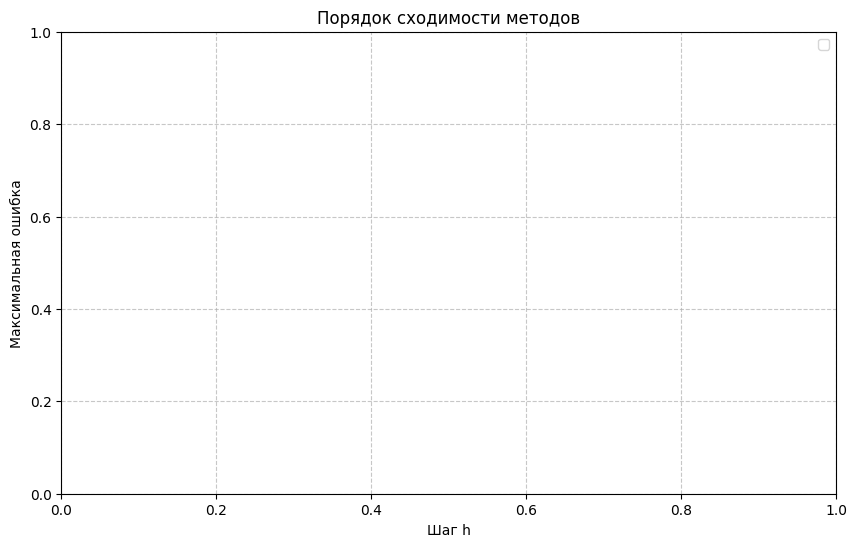

ITERATION 4 8
x0= 1.2 y0= 12.0
❌ rk4_solve: NaN или inf в решении (h=0.0001)
⚠️ RK4 при h=0.0001: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ pece4_solve: NaN или inf в решении (h=0.0001)
⚠️ PECE4 при h=0.0001: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ Gear4: расходимость на шаге 3, h=0.0001
❌ gear4_fixed_step: NaN или inf в решении (h=0.0001)
⚠️ Gear4_fixed при h=0.0001: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ rk4_solve: NaN или inf в решении (h=5e-05)
⚠️ RK4 при h=5e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ pece4_solve: NaN или inf в решении (h=5e-05)
⚠️ PECE4 при h=5e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ Gear4: расходимость на шаге 3, h=5e-05
❌ gear4_fixed_step: NaN или inf в решении (h=5e-05)
⚠️ Gear4_fixed при h=5e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ rk4_solve: NaN или inf в решении (h=2.5e-05)
⚠️ RK4 пр

C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:7: RuntimeWarning: overflow encountered in scalar multiply
  dydt = y * (2 * a2 - 0.5 * y - 3.5 * (a2_reg**2) * x)
C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:6: RuntimeWarning: invalid value encountered in scalar multiply
  dxdt = x * (1 - 0.5 * x - (2/7) * (a2_reg**-2) * y)
C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:7: RuntimeWarning: overflow encountered in scalar power
  dydt = y * (2 * a2 - 0.5 * y - 3.5 * (a2_reg**2) * x)
C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:7: RuntimeWarning: invalid value encountered in scalar subtract
  dydt = y * (2 * a2 - 0.5 * y - 3.5 * (a2_reg**2) * x)
C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:8: RuntimeWarning: overflow encountered in scalar multiply
  da2dt = epsilon * (2 - 7 * a2 * x)


❌ pece4_solve: NaN или inf в решении (h=2.5e-05)
⚠️ PECE4 при h=2.5e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ Gear4: расходимость на шаге 3, h=2.5e-05
❌ gear4_fixed_step: NaN или inf в решении (h=2.5e-05)
⚠️ Gear4_fixed при h=2.5e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ rk4_solve: NaN или inf в решении (h=1.25e-05)
⚠️ RK4 при h=1.25e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ pece4_solve: NaN или inf в решении (h=1.25e-05)
⚠️ PECE4 при h=1.25e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ Gear4: расходимость на шаге 3, h=1.25e-05
❌ gear4_fixed_step: NaN или inf в решении (h=1.25e-05)
⚠️ Gear4_fixed при h=1.25e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ rk4_solve: NaN или inf в решении (h=6.25e-06)
⚠️ RK4 при h=6.25e-06: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ pece4_solve: NaN или inf в решении (h=6.25e-06)
⚠️ PECE

C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3955799424.py:41: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend()


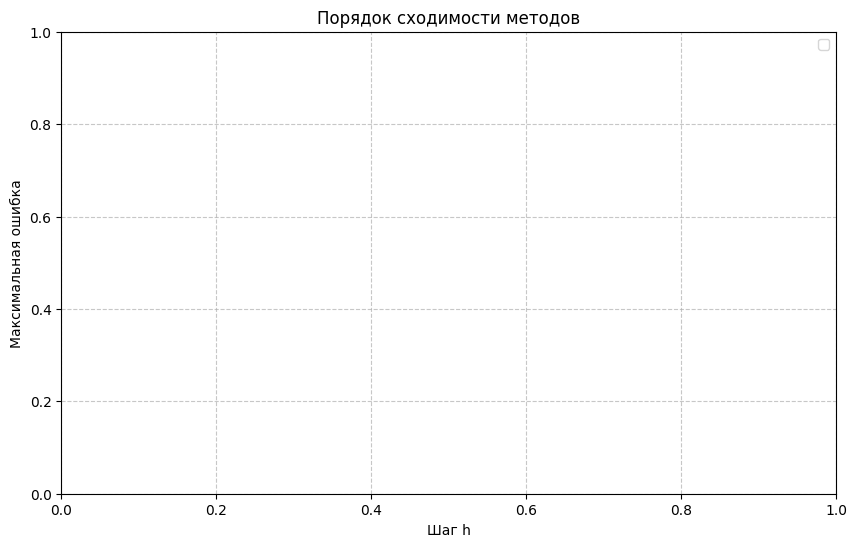

ITERATION 4 9
x0= 1.2 y0= 13.5
❌ rk4_solve: NaN или inf в решении (h=0.0001)
⚠️ RK4 при h=0.0001: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ pece4_solve: NaN или inf в решении (h=0.0001)
⚠️ PECE4 при h=0.0001: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ Gear4: расходимость на шаге 3, h=0.0001
❌ gear4_fixed_step: NaN или inf в решении (h=0.0001)
⚠️ Gear4_fixed при h=0.0001: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ rk4_solve: NaN или inf в решении (h=5e-05)
⚠️ RK4 при h=5e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ pece4_solve: NaN или inf в решении (h=5e-05)
⚠️ PECE4 при h=5e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ Gear4: расходимость на шаге 3, h=5e-05
❌ gear4_fixed_step: NaN или inf в решении (h=5e-05)
⚠️ Gear4_fixed при h=5e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ rk4_solve: NaN или inf в решении (h=2.5e-05)
⚠️ RK4 пр

C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:7: RuntimeWarning: overflow encountered in scalar multiply
  dydt = y * (2 * a2 - 0.5 * y - 3.5 * (a2_reg**2) * x)
C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:6: RuntimeWarning: invalid value encountered in scalar multiply
  dxdt = x * (1 - 0.5 * x - (2/7) * (a2_reg**-2) * y)
C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:7: RuntimeWarning: overflow encountered in scalar power
  dydt = y * (2 * a2 - 0.5 * y - 3.5 * (a2_reg**2) * x)
C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:7: RuntimeWarning: invalid value encountered in scalar subtract
  dydt = y * (2 * a2 - 0.5 * y - 3.5 * (a2_reg**2) * x)
C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:8: RuntimeWarning: overflow encountered in scalar multiply
  da2dt = epsilon * (2 - 7 * a2 * x)


❌ pece4_solve: NaN или inf в решении (h=2.5e-05)
⚠️ PECE4 при h=2.5e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ Gear4: расходимость на шаге 3, h=2.5e-05
❌ gear4_fixed_step: NaN или inf в решении (h=2.5e-05)
⚠️ Gear4_fixed при h=2.5e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ rk4_solve: NaN или inf в решении (h=1.25e-05)
⚠️ RK4 при h=1.25e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ pece4_solve: NaN или inf в решении (h=1.25e-05)
⚠️ PECE4 при h=1.25e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ Gear4: расходимость на шаге 3, h=1.25e-05
❌ gear4_fixed_step: NaN или inf в решении (h=1.25e-05)
⚠️ Gear4_fixed при h=1.25e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ rk4_solve: NaN или inf в решении (h=6.25e-06)
⚠️ RK4 при h=6.25e-06: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ pece4_solve: NaN или inf в решении (h=6.25e-06)
⚠️ PECE

C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3955799424.py:41: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend()


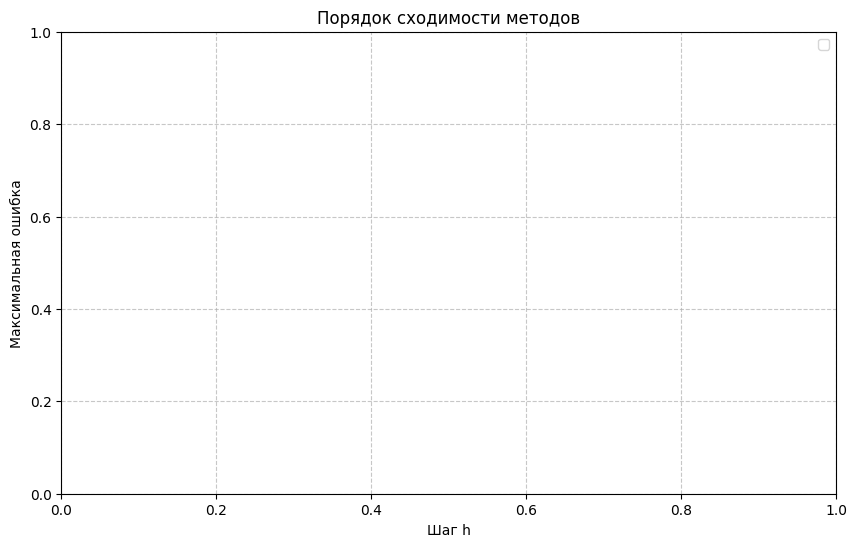

ITERATION 5 0
x0= 1.5 y0= 0.0
✅ rk4_solve: успех, 101 шагов (h=0.0001)
✅ pece4_solve: успех, 101 шагов (h=0.0001)
✅ gear4_fixed_step: успех, 101 шагов (h=0.0001)
✅ rk4_solve: успех, 201 шагов (h=5e-05)
✅ pece4_solve: успех, 201 шагов (h=5e-05)
✅ gear4_fixed_step: успех, 201 шагов (h=5e-05)
✅ rk4_solve: успех, 401 шагов (h=2.5e-05)
✅ pece4_solve: успех, 401 шагов (h=2.5e-05)
✅ gear4_fixed_step: успех, 401 шагов (h=2.5e-05)
✅ rk4_solve: успех, 801 шагов (h=1.25e-05)
✅ pece4_solve: успех, 801 шагов (h=1.25e-05)
✅ gear4_fixed_step: успех, 801 шагов (h=1.25e-05)
✅ rk4_solve: успех, 1601 шагов (h=6.25e-06)
✅ pece4_solve: успех, 1601 шагов (h=6.25e-06)
✅ gear4_fixed_step: успех, 1601 шагов (h=6.25e-06)
✅ rk4_solve: успех, 3201 шагов (h=3.125e-06)
✅ pece4_solve: успех, 3201 шагов (h=3.125e-06)
✅ gear4_fixed_step: успех, 3201 шагов (h=3.125e-06)
          h           RK4  p_RK4         PECE4  p_PECE4   Gear4_fixed  p_Gear4_fixed
0  0.000100  4.327974e-10    NaN  4.327974e-10      NaN  4.307061e

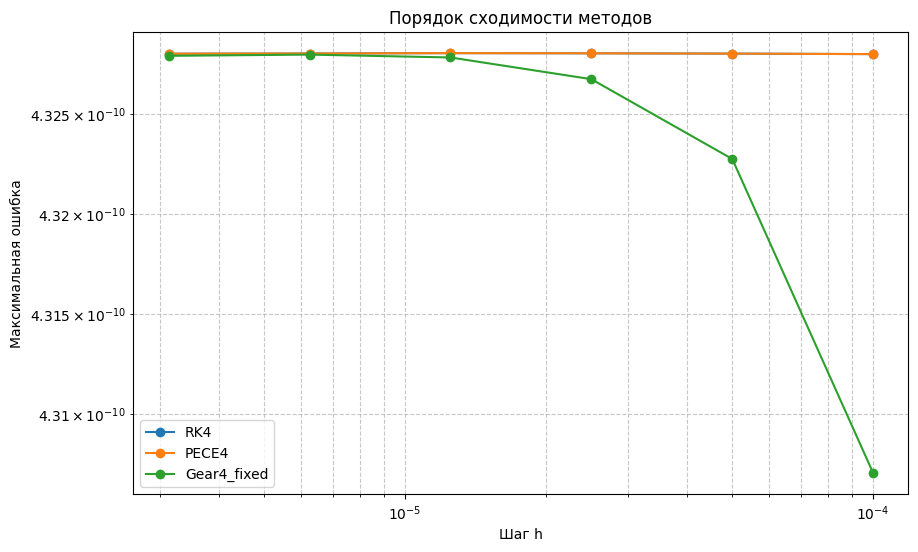

ITERATION 5 1
x0= 1.5 y0= 1.5
❌ rk4_solve: NaN или inf в решении (h=0.0001)
⚠️ RK4 при h=0.0001: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ pece4_solve: NaN или inf в решении (h=0.0001)
⚠️ PECE4 при h=0.0001: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ Gear4: расходимость на шаге 3, h=0.0001
❌ gear4_fixed_step: NaN или inf в решении (h=0.0001)
⚠️ Gear4_fixed при h=0.0001: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ rk4_solve: NaN или inf в решении (h=5e-05)
⚠️ RK4 при h=5e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ pece4_solve: NaN или inf в решении (h=5e-05)
⚠️ PECE4 при h=5e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ Gear4: расходимость на шаге 3, h=5e-05
❌ gear4_fixed_step: NaN или inf в решении (h=5e-05)
⚠️ Gear4_fixed при h=5e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ rk4_solve: NaN или inf в решении (h=2.5e-05)
⚠️ RK4 при

C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:7: RuntimeWarning: overflow encountered in scalar multiply
  dydt = y * (2 * a2 - 0.5 * y - 3.5 * (a2_reg**2) * x)
C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:6: RuntimeWarning: invalid value encountered in scalar multiply
  dxdt = x * (1 - 0.5 * x - (2/7) * (a2_reg**-2) * y)
C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:7: RuntimeWarning: overflow encountered in scalar power
  dydt = y * (2 * a2 - 0.5 * y - 3.5 * (a2_reg**2) * x)
C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:7: RuntimeWarning: invalid value encountered in scalar subtract
  dydt = y * (2 * a2 - 0.5 * y - 3.5 * (a2_reg**2) * x)
C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:8: RuntimeWarning: overflow encountered in scalar multiply
  da2dt = epsilon * (2 - 7 * a2 * x)
C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\1111329400.py:11: RuntimeWarning: invalid value encountered in add
  

❌ pece4_solve: NaN или inf в решении (h=2.5e-05)
⚠️ PECE4 при h=2.5e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ Gear4: расходимость на шаге 3, h=2.5e-05
❌ gear4_fixed_step: NaN или inf в решении (h=2.5e-05)
⚠️ Gear4_fixed при h=2.5e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ rk4_solve: NaN или inf в решении (h=1.25e-05)
⚠️ RK4 при h=1.25e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ pece4_solve: NaN или inf в решении (h=1.25e-05)
⚠️ PECE4 при h=1.25e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ Gear4: расходимость на шаге 3, h=1.25e-05
❌ gear4_fixed_step: NaN или inf в решении (h=1.25e-05)
⚠️ Gear4_fixed при h=1.25e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ rk4_solve: NaN или inf в решении (h=6.25e-06)
⚠️ RK4 при h=6.25e-06: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ pece4_solve: NaN или inf в решении (h=6.25e-06)
⚠️ PECE

C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3955799424.py:41: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend()


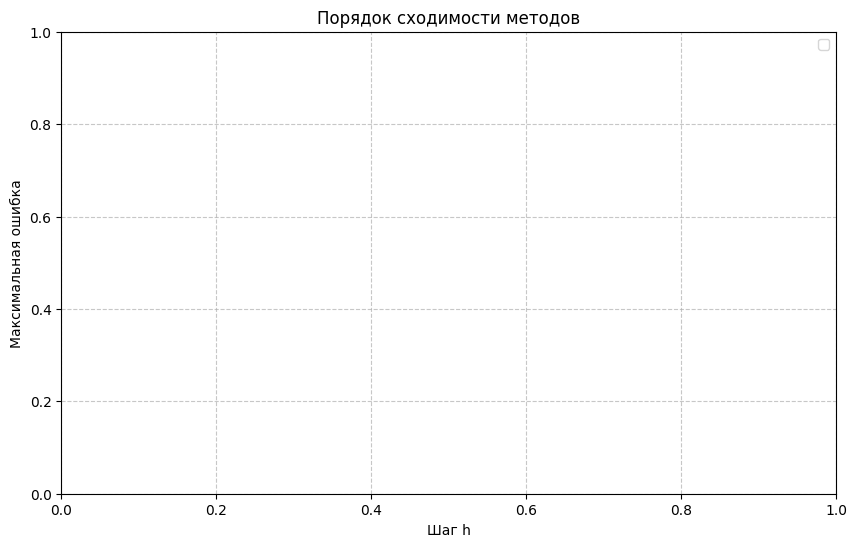

ITERATION 5 2
x0= 1.5 y0= 3.0
❌ rk4_solve: NaN или inf в решении (h=0.0001)
⚠️ RK4 при h=0.0001: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ pece4_solve: NaN или inf в решении (h=0.0001)
⚠️ PECE4 при h=0.0001: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ Gear4: расходимость на шаге 3, h=0.0001
❌ gear4_fixed_step: NaN или inf в решении (h=0.0001)
⚠️ Gear4_fixed при h=0.0001: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ rk4_solve: NaN или inf в решении (h=5e-05)
⚠️ RK4 при h=5e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ pece4_solve: NaN или inf в решении (h=5e-05)
⚠️ PECE4 при h=5e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ Gear4: расходимость на шаге 3, h=5e-05
❌ gear4_fixed_step: NaN или inf в решении (h=5e-05)
⚠️ Gear4_fixed при h=5e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ rk4_solve: NaN или inf в решении (h=2.5e-05)
⚠️ RK4 при

C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:7: RuntimeWarning: overflow encountered in scalar multiply
  dydt = y * (2 * a2 - 0.5 * y - 3.5 * (a2_reg**2) * x)
C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:6: RuntimeWarning: invalid value encountered in scalar multiply
  dxdt = x * (1 - 0.5 * x - (2/7) * (a2_reg**-2) * y)
C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:7: RuntimeWarning: overflow encountered in scalar power
  dydt = y * (2 * a2 - 0.5 * y - 3.5 * (a2_reg**2) * x)
C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:7: RuntimeWarning: invalid value encountered in scalar subtract
  dydt = y * (2 * a2 - 0.5 * y - 3.5 * (a2_reg**2) * x)
C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:8: RuntimeWarning: overflow encountered in scalar multiply
  da2dt = epsilon * (2 - 7 * a2 * x)
C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\1111329400.py:11: RuntimeWarning: invalid value encountered in add
  

❌ pece4_solve: NaN или inf в решении (h=2.5e-05)
⚠️ PECE4 при h=2.5e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ Gear4: расходимость на шаге 3, h=2.5e-05
❌ gear4_fixed_step: NaN или inf в решении (h=2.5e-05)
⚠️ Gear4_fixed при h=2.5e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ rk4_solve: NaN или inf в решении (h=1.25e-05)
⚠️ RK4 при h=1.25e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ pece4_solve: NaN или inf в решении (h=1.25e-05)
⚠️ PECE4 при h=1.25e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ Gear4: расходимость на шаге 3, h=1.25e-05
❌ gear4_fixed_step: NaN или inf в решении (h=1.25e-05)
⚠️ Gear4_fixed при h=1.25e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ rk4_solve: NaN или inf в решении (h=6.25e-06)
⚠️ RK4 при h=6.25e-06: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ pece4_solve: NaN или inf в решении (h=6.25e-06)
⚠️ PECE

C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3955799424.py:41: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend()


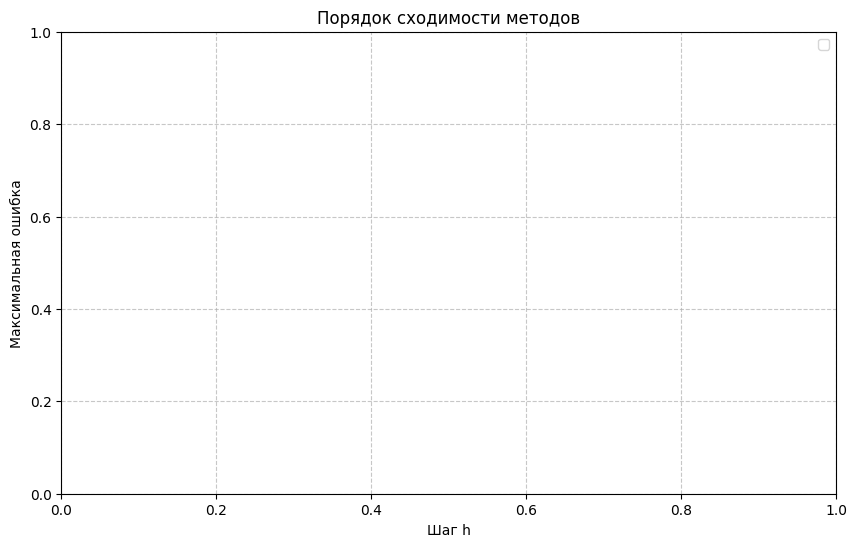

ITERATION 5 3
x0= 1.5 y0= 4.5
❌ rk4_solve: NaN или inf в решении (h=0.0001)
⚠️ RK4 при h=0.0001: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ pece4_solve: NaN или inf в решении (h=0.0001)
⚠️ PECE4 при h=0.0001: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ Gear4: расходимость на шаге 3, h=0.0001
❌ gear4_fixed_step: NaN или inf в решении (h=0.0001)
⚠️ Gear4_fixed при h=0.0001: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ rk4_solve: NaN или inf в решении (h=5e-05)
⚠️ RK4 при h=5e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ pece4_solve: NaN или inf в решении (h=5e-05)
⚠️ PECE4 при h=5e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ Gear4: расходимость на шаге 3, h=5e-05
❌ gear4_fixed_step: NaN или inf в решении (h=5e-05)
⚠️ Gear4_fixed при h=5e-05: operands could not be broadcast together with shapes (1,0) (1,3) 


C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:7: RuntimeWarning: overflow encountered in scalar multiply
  dydt = y * (2 * a2 - 0.5 * y - 3.5 * (a2_reg**2) * x)
C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:6: RuntimeWarning: invalid value encountered in scalar multiply
  dxdt = x * (1 - 0.5 * x - (2/7) * (a2_reg**-2) * y)
C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:7: RuntimeWarning: overflow encountered in scalar power
  dydt = y * (2 * a2 - 0.5 * y - 3.5 * (a2_reg**2) * x)
C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:7: RuntimeWarning: invalid value encountered in scalar subtract
  dydt = y * (2 * a2 - 0.5 * y - 3.5 * (a2_reg**2) * x)
C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:8: RuntimeWarning: overflow encountered in scalar multiply
  da2dt = epsilon * (2 - 7 * a2 * x)


❌ rk4_solve: NaN или inf в решении (h=2.5e-05)
⚠️ RK4 при h=2.5e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ pece4_solve: NaN или inf в решении (h=2.5e-05)
⚠️ PECE4 при h=2.5e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ Gear4: расходимость на шаге 3, h=2.5e-05
❌ gear4_fixed_step: NaN или inf в решении (h=2.5e-05)
⚠️ Gear4_fixed при h=2.5e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ rk4_solve: NaN или inf в решении (h=1.25e-05)
⚠️ RK4 при h=1.25e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ pece4_solve: NaN или inf в решении (h=1.25e-05)
⚠️ PECE4 при h=1.25e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ Gear4: расходимость на шаге 3, h=1.25e-05
❌ gear4_fixed_step: NaN или inf в решении (h=1.25e-05)
⚠️ Gear4_fixed при h=1.25e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ rk4_solve: NaN или inf в решении (h=6.25e-06)
⚠️ RK4 при 

C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3955799424.py:41: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend()


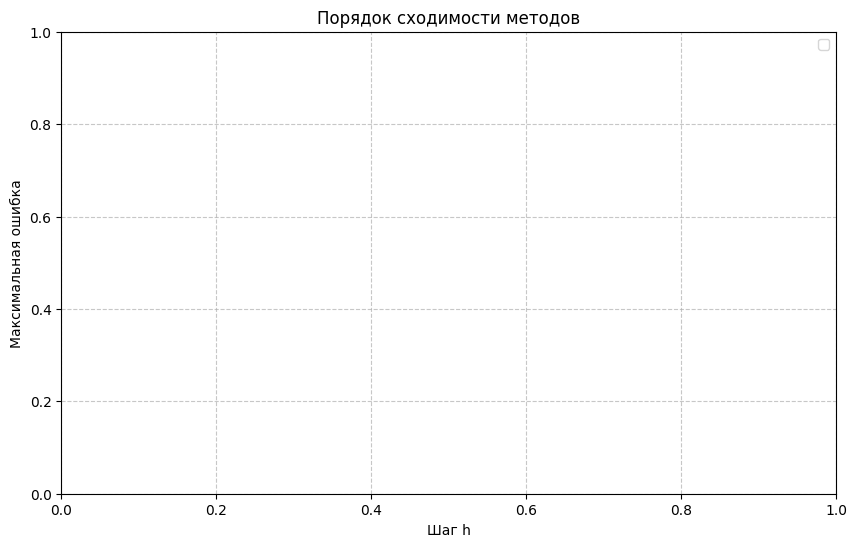

ITERATION 5 4
x0= 1.5 y0= 6.0
❌ rk4_solve: NaN или inf в решении (h=0.0001)
⚠️ RK4 при h=0.0001: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ pece4_solve: NaN или inf в решении (h=0.0001)
⚠️ PECE4 при h=0.0001: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ Gear4: расходимость на шаге 3, h=0.0001
❌ gear4_fixed_step: NaN или inf в решении (h=0.0001)
⚠️ Gear4_fixed при h=0.0001: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ rk4_solve: NaN или inf в решении (h=5e-05)
⚠️ RK4 при h=5e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ pece4_solve: NaN или inf в решении (h=5e-05)
⚠️ PECE4 при h=5e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ Gear4: расходимость на шаге 3, h=5e-05
❌ gear4_fixed_step: NaN или inf в решении (h=5e-05)
⚠️ Gear4_fixed при h=5e-05: operands could not be broadcast together with shapes (1,0) (1,3) 


C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:7: RuntimeWarning: overflow encountered in scalar multiply
  dydt = y * (2 * a2 - 0.5 * y - 3.5 * (a2_reg**2) * x)
C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:6: RuntimeWarning: invalid value encountered in scalar multiply
  dxdt = x * (1 - 0.5 * x - (2/7) * (a2_reg**-2) * y)
C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:7: RuntimeWarning: overflow encountered in scalar power
  dydt = y * (2 * a2 - 0.5 * y - 3.5 * (a2_reg**2) * x)
C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:7: RuntimeWarning: invalid value encountered in scalar subtract
  dydt = y * (2 * a2 - 0.5 * y - 3.5 * (a2_reg**2) * x)
C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:8: RuntimeWarning: overflow encountered in scalar multiply
  da2dt = epsilon * (2 - 7 * a2 * x)


❌ rk4_solve: NaN или inf в решении (h=2.5e-05)
⚠️ RK4 при h=2.5e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ pece4_solve: NaN или inf в решении (h=2.5e-05)
⚠️ PECE4 при h=2.5e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ Gear4: расходимость на шаге 3, h=2.5e-05
❌ gear4_fixed_step: NaN или inf в решении (h=2.5e-05)
⚠️ Gear4_fixed при h=2.5e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ rk4_solve: NaN или inf в решении (h=1.25e-05)
⚠️ RK4 при h=1.25e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ pece4_solve: NaN или inf в решении (h=1.25e-05)
⚠️ PECE4 при h=1.25e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ Gear4: расходимость на шаге 3, h=1.25e-05
❌ gear4_fixed_step: NaN или inf в решении (h=1.25e-05)
⚠️ Gear4_fixed при h=1.25e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ rk4_solve: NaN или inf в решении (h=6.25e-06)
⚠️ RK4 при 

C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3955799424.py:41: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend()


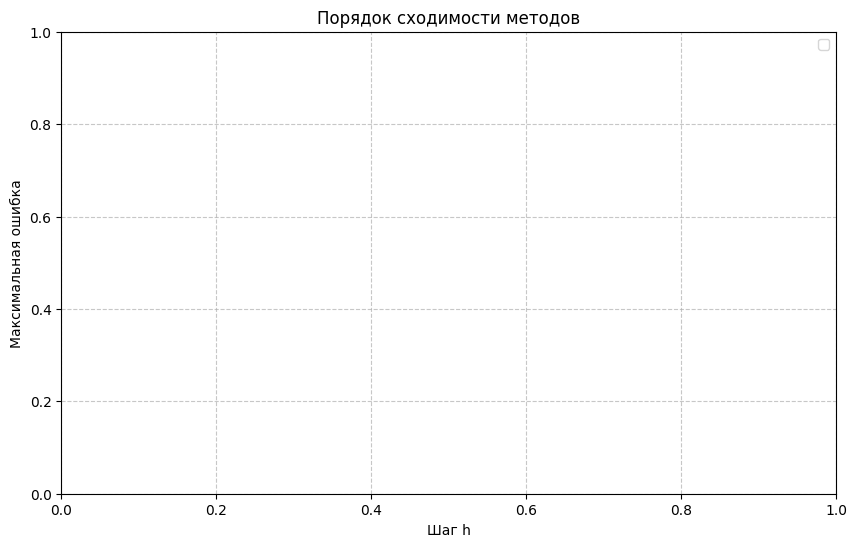

ITERATION 5 5
x0= 1.5 y0= 7.5
❌ rk4_solve: NaN или inf в решении (h=0.0001)
⚠️ RK4 при h=0.0001: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ pece4_solve: NaN или inf в решении (h=0.0001)
⚠️ PECE4 при h=0.0001: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ Gear4: расходимость на шаге 3, h=0.0001
❌ gear4_fixed_step: NaN или inf в решении (h=0.0001)
⚠️ Gear4_fixed при h=0.0001: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ rk4_solve: NaN или inf в решении (h=5e-05)
⚠️ RK4 при h=5e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ pece4_solve: NaN или inf в решении (h=5e-05)
⚠️ PECE4 при h=5e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ Gear4: расходимость на шаге 3, h=5e-05
❌ gear4_fixed_step: NaN или inf в решении (h=5e-05)
⚠️ Gear4_fixed при h=5e-05: operands could not be broadcast together with shapes (1,0) (1,3) 


C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:7: RuntimeWarning: overflow encountered in scalar multiply
  dydt = y * (2 * a2 - 0.5 * y - 3.5 * (a2_reg**2) * x)
C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:6: RuntimeWarning: invalid value encountered in scalar multiply
  dxdt = x * (1 - 0.5 * x - (2/7) * (a2_reg**-2) * y)
C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:7: RuntimeWarning: overflow encountered in scalar power
  dydt = y * (2 * a2 - 0.5 * y - 3.5 * (a2_reg**2) * x)
C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:7: RuntimeWarning: invalid value encountered in scalar subtract
  dydt = y * (2 * a2 - 0.5 * y - 3.5 * (a2_reg**2) * x)
C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:8: RuntimeWarning: overflow encountered in scalar multiply
  da2dt = epsilon * (2 - 7 * a2 * x)
C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\1111329400.py:11: RuntimeWarning: invalid value encountered in add
  

❌ rk4_solve: NaN или inf в решении (h=2.5e-05)
⚠️ RK4 при h=2.5e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ pece4_solve: NaN или inf в решении (h=2.5e-05)
⚠️ PECE4 при h=2.5e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ Gear4: расходимость на шаге 3, h=2.5e-05
❌ gear4_fixed_step: NaN или inf в решении (h=2.5e-05)
⚠️ Gear4_fixed при h=2.5e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ rk4_solve: NaN или inf в решении (h=1.25e-05)
⚠️ RK4 при h=1.25e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ pece4_solve: NaN или inf в решении (h=1.25e-05)
⚠️ PECE4 при h=1.25e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ Gear4: расходимость на шаге 3, h=1.25e-05
❌ gear4_fixed_step: NaN или inf в решении (h=1.25e-05)
⚠️ Gear4_fixed при h=1.25e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ rk4_solve: NaN или inf в решении (h=6.25e-06)
⚠️ RK4 при 

C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3955799424.py:41: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend()


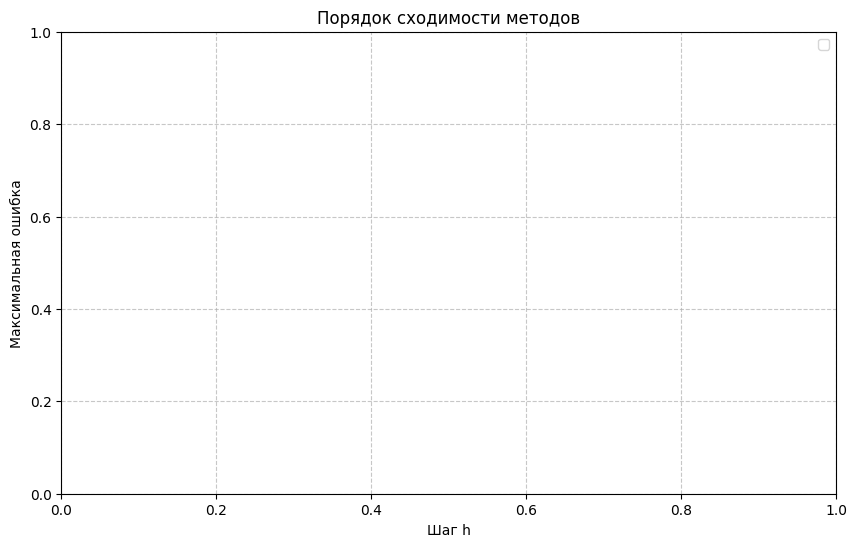

ITERATION 5 6
x0= 1.5 y0= 9.0
❌ rk4_solve: NaN или inf в решении (h=0.0001)
⚠️ RK4 при h=0.0001: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ pece4_solve: NaN или inf в решении (h=0.0001)
⚠️ PECE4 при h=0.0001: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ Gear4: расходимость на шаге 3, h=0.0001
❌ gear4_fixed_step: NaN или inf в решении (h=0.0001)
⚠️ Gear4_fixed при h=0.0001: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ rk4_solve: NaN или inf в решении (h=5e-05)
⚠️ RK4 при h=5e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ pece4_solve: NaN или inf в решении (h=5e-05)
⚠️ PECE4 при h=5e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ Gear4: расходимость на шаге 3, h=5e-05
❌ gear4_fixed_step: NaN или inf в решении (h=5e-05)
⚠️ Gear4_fixed при h=5e-05: operands could not be broadcast together with shapes (1,0) (1,3) 


C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:7: RuntimeWarning: overflow encountered in scalar multiply
  dydt = y * (2 * a2 - 0.5 * y - 3.5 * (a2_reg**2) * x)
C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:6: RuntimeWarning: invalid value encountered in scalar multiply
  dxdt = x * (1 - 0.5 * x - (2/7) * (a2_reg**-2) * y)
C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:7: RuntimeWarning: overflow encountered in scalar power
  dydt = y * (2 * a2 - 0.5 * y - 3.5 * (a2_reg**2) * x)
C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:7: RuntimeWarning: invalid value encountered in scalar subtract
  dydt = y * (2 * a2 - 0.5 * y - 3.5 * (a2_reg**2) * x)
C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:8: RuntimeWarning: overflow encountered in scalar multiply
  da2dt = epsilon * (2 - 7 * a2 * x)
C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\1111329400.py:11: RuntimeWarning: invalid value encountered in add
  

❌ rk4_solve: NaN или inf в решении (h=2.5e-05)
⚠️ RK4 при h=2.5e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ pece4_solve: NaN или inf в решении (h=2.5e-05)
⚠️ PECE4 при h=2.5e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ Gear4: расходимость на шаге 3, h=2.5e-05
❌ gear4_fixed_step: NaN или inf в решении (h=2.5e-05)
⚠️ Gear4_fixed при h=2.5e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ rk4_solve: NaN или inf в решении (h=1.25e-05)
⚠️ RK4 при h=1.25e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ pece4_solve: NaN или inf в решении (h=1.25e-05)
⚠️ PECE4 при h=1.25e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ Gear4: расходимость на шаге 3, h=1.25e-05
❌ gear4_fixed_step: NaN или inf в решении (h=1.25e-05)
⚠️ Gear4_fixed при h=1.25e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ rk4_solve: NaN или inf в решении (h=6.25e-06)
⚠️ RK4 при 

C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3955799424.py:41: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend()


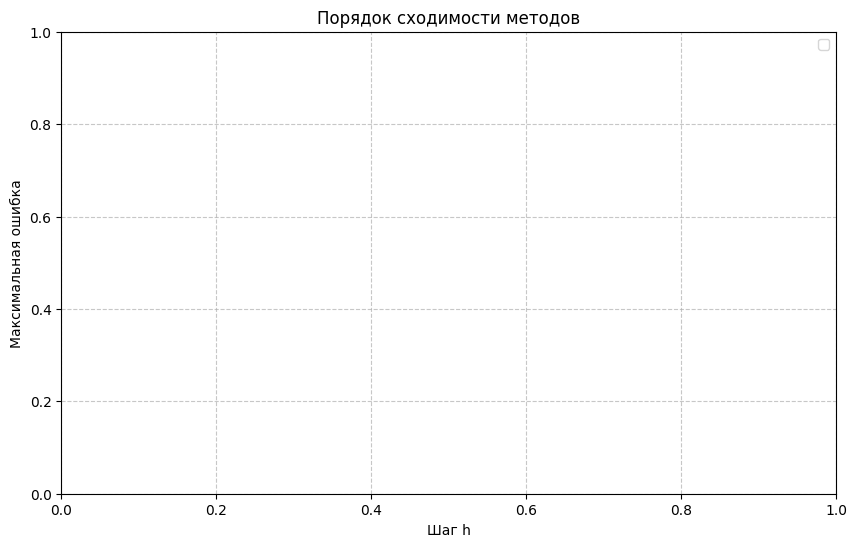

ITERATION 5 7
x0= 1.5 y0= 10.5
❌ rk4_solve: NaN или inf в решении (h=0.0001)
⚠️ RK4 при h=0.0001: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ pece4_solve: NaN или inf в решении (h=0.0001)
⚠️ PECE4 при h=0.0001: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ Gear4: расходимость на шаге 3, h=0.0001
❌ gear4_fixed_step: NaN или inf в решении (h=0.0001)
⚠️ Gear4_fixed при h=0.0001: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ rk4_solve: NaN или inf в решении (h=5e-05)
⚠️ RK4 при h=5e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ pece4_solve: NaN или inf в решении (h=5e-05)
⚠️ PECE4 при h=5e-05: operands could not be broadcast together with shapes (1,0) (1,3) 


C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:7: RuntimeWarning: overflow encountered in scalar multiply
  dydt = y * (2 * a2 - 0.5 * y - 3.5 * (a2_reg**2) * x)
C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:6: RuntimeWarning: invalid value encountered in scalar multiply
  dxdt = x * (1 - 0.5 * x - (2/7) * (a2_reg**-2) * y)
C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:7: RuntimeWarning: overflow encountered in scalar power
  dydt = y * (2 * a2 - 0.5 * y - 3.5 * (a2_reg**2) * x)
C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:7: RuntimeWarning: invalid value encountered in scalar subtract
  dydt = y * (2 * a2 - 0.5 * y - 3.5 * (a2_reg**2) * x)
C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:8: RuntimeWarning: overflow encountered in scalar multiply
  da2dt = epsilon * (2 - 7 * a2 * x)


❌ Gear4: расходимость на шаге 3, h=5e-05
❌ gear4_fixed_step: NaN или inf в решении (h=5e-05)
⚠️ Gear4_fixed при h=5e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ rk4_solve: NaN или inf в решении (h=2.5e-05)
⚠️ RK4 при h=2.5e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ pece4_solve: NaN или inf в решении (h=2.5e-05)
⚠️ PECE4 при h=2.5e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ Gear4: расходимость на шаге 3, h=2.5e-05
❌ gear4_fixed_step: NaN или inf в решении (h=2.5e-05)
⚠️ Gear4_fixed при h=2.5e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ rk4_solve: NaN или inf в решении (h=1.25e-05)
⚠️ RK4 при h=1.25e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ pece4_solve: NaN или inf в решении (h=1.25e-05)
⚠️ PECE4 при h=1.25e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ Gear4: расходимость на шаге 3, h=1.25e-05
❌ gear4_fixed_step: NaN 

C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3955799424.py:41: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend()


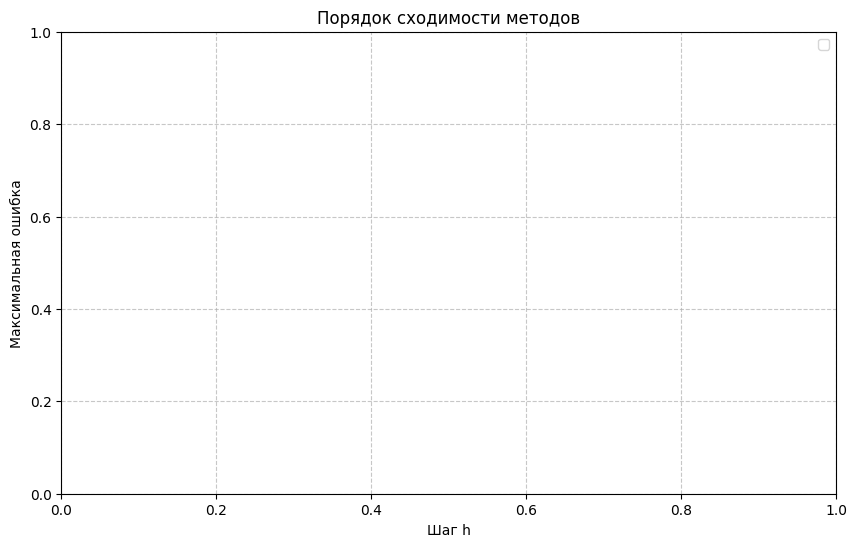

ITERATION 5 8
x0= 1.5 y0= 12.0
❌ rk4_solve: NaN или inf в решении (h=0.0001)
⚠️ RK4 при h=0.0001: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ pece4_solve: NaN или inf в решении (h=0.0001)
⚠️ PECE4 при h=0.0001: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ Gear4: расходимость на шаге 3, h=0.0001
❌ gear4_fixed_step: NaN или inf в решении (h=0.0001)
⚠️ Gear4_fixed при h=0.0001: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ rk4_solve: NaN или inf в решении (h=5e-05)
⚠️ RK4 при h=5e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ pece4_solve: NaN или inf в решении (h=5e-05)
⚠️ PECE4 при h=5e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ Gear4: расходимость на шаге 3, h=5e-05
❌ gear4_fixed_step: NaN или inf в решении (h=5e-05)
⚠️ Gear4_fixed при h=5e-05: operands could not be broadcast together with shapes (1,0) (1,3) 


C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:7: RuntimeWarning: overflow encountered in scalar multiply
  dydt = y * (2 * a2 - 0.5 * y - 3.5 * (a2_reg**2) * x)
C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:6: RuntimeWarning: invalid value encountered in scalar multiply
  dxdt = x * (1 - 0.5 * x - (2/7) * (a2_reg**-2) * y)
C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:7: RuntimeWarning: overflow encountered in scalar power
  dydt = y * (2 * a2 - 0.5 * y - 3.5 * (a2_reg**2) * x)
C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:7: RuntimeWarning: invalid value encountered in scalar subtract
  dydt = y * (2 * a2 - 0.5 * y - 3.5 * (a2_reg**2) * x)
C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:8: RuntimeWarning: overflow encountered in scalar multiply
  da2dt = epsilon * (2 - 7 * a2 * x)


❌ rk4_solve: NaN или inf в решении (h=2.5e-05)
⚠️ RK4 при h=2.5e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ pece4_solve: NaN или inf в решении (h=2.5e-05)
⚠️ PECE4 при h=2.5e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ Gear4: расходимость на шаге 3, h=2.5e-05
❌ gear4_fixed_step: NaN или inf в решении (h=2.5e-05)
⚠️ Gear4_fixed при h=2.5e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ rk4_solve: NaN или inf в решении (h=1.25e-05)
⚠️ RK4 при h=1.25e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ pece4_solve: NaN или inf в решении (h=1.25e-05)
⚠️ PECE4 при h=1.25e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ Gear4: расходимость на шаге 3, h=1.25e-05
❌ gear4_fixed_step: NaN или inf в решении (h=1.25e-05)
⚠️ Gear4_fixed при h=1.25e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ rk4_solve: NaN или inf в решении (h=6.25e-06)
⚠️ RK4 при 

C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3955799424.py:41: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend()


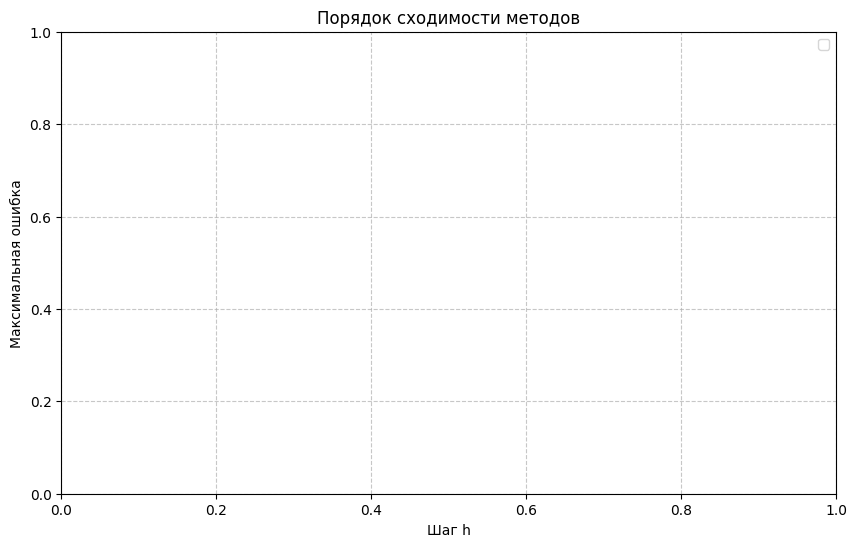

ITERATION 5 9
x0= 1.5 y0= 13.5
❌ rk4_solve: NaN или inf в решении (h=0.0001)
⚠️ RK4 при h=0.0001: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ pece4_solve: NaN или inf в решении (h=0.0001)
⚠️ PECE4 при h=0.0001: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ Gear4: расходимость на шаге 3, h=0.0001
❌ gear4_fixed_step: NaN или inf в решении (h=0.0001)
⚠️ Gear4_fixed при h=0.0001: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ rk4_solve: NaN или inf в решении (h=5e-05)
⚠️ RK4 при h=5e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ pece4_solve: NaN или inf в решении (h=5e-05)
⚠️ PECE4 при h=5e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ Gear4: расходимость на шаге 3, h=5e-05
❌ gear4_fixed_step: NaN или inf в решении (h=5e-05)
⚠️ Gear4_fixed при h=5e-05: operands could not be broadcast together with shapes (1,0) (1,3) 


C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:7: RuntimeWarning: overflow encountered in scalar multiply
  dydt = y * (2 * a2 - 0.5 * y - 3.5 * (a2_reg**2) * x)
C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:6: RuntimeWarning: invalid value encountered in scalar multiply
  dxdt = x * (1 - 0.5 * x - (2/7) * (a2_reg**-2) * y)
C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:7: RuntimeWarning: overflow encountered in scalar power
  dydt = y * (2 * a2 - 0.5 * y - 3.5 * (a2_reg**2) * x)
C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:7: RuntimeWarning: invalid value encountered in scalar subtract
  dydt = y * (2 * a2 - 0.5 * y - 3.5 * (a2_reg**2) * x)
C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:8: RuntimeWarning: overflow encountered in scalar multiply
  da2dt = epsilon * (2 - 7 * a2 * x)


❌ rk4_solve: NaN или inf в решении (h=2.5e-05)
⚠️ RK4 при h=2.5e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ pece4_solve: NaN или inf в решении (h=2.5e-05)
⚠️ PECE4 при h=2.5e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ Gear4: расходимость на шаге 3, h=2.5e-05
❌ gear4_fixed_step: NaN или inf в решении (h=2.5e-05)
⚠️ Gear4_fixed при h=2.5e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ rk4_solve: NaN или inf в решении (h=1.25e-05)
⚠️ RK4 при h=1.25e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ pece4_solve: NaN или inf в решении (h=1.25e-05)
⚠️ PECE4 при h=1.25e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ Gear4: расходимость на шаге 3, h=1.25e-05
❌ gear4_fixed_step: NaN или inf в решении (h=1.25e-05)
⚠️ Gear4_fixed при h=1.25e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ rk4_solve: NaN или inf в решении (h=6.25e-06)
⚠️ RK4 при 

C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3955799424.py:41: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend()


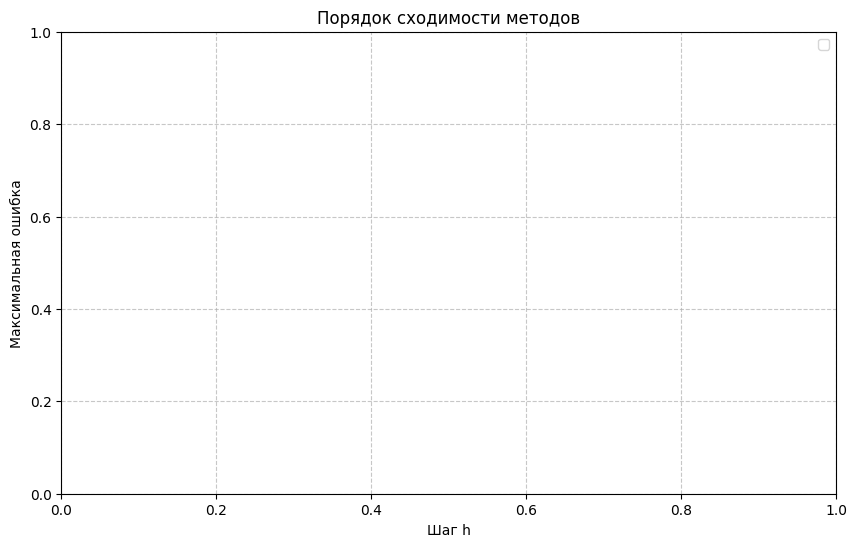

ITERATION 6 0
x0= 1.7999999999999998 y0= 0.0
✅ rk4_solve: успех, 101 шагов (h=0.0001)
✅ pece4_solve: успех, 101 шагов (h=0.0001)
✅ gear4_fixed_step: успех, 101 шагов (h=0.0001)
✅ rk4_solve: успех, 201 шагов (h=5e-05)
✅ pece4_solve: успех, 201 шагов (h=5e-05)
✅ gear4_fixed_step: успех, 201 шагов (h=5e-05)
✅ rk4_solve: успех, 401 шагов (h=2.5e-05)
✅ pece4_solve: успех, 401 шагов (h=2.5e-05)
✅ gear4_fixed_step: успех, 401 шагов (h=2.5e-05)
✅ rk4_solve: успех, 801 шагов (h=1.25e-05)
✅ pece4_solve: успех, 801 шагов (h=1.25e-05)
✅ gear4_fixed_step: успех, 801 шагов (h=1.25e-05)
✅ rk4_solve: успех, 1601 шагов (h=6.25e-06)
✅ pece4_solve: успех, 1601 шагов (h=6.25e-06)
✅ gear4_fixed_step: успех, 1601 шагов (h=6.25e-06)
✅ rk4_solve: успех, 3201 шагов (h=3.125e-06)
✅ pece4_solve: успех, 3201 шагов (h=3.125e-06)
✅ gear4_fixed_step: успех, 3201 шагов (h=3.125e-06)
          h           RK4  p_RK4         PECE4  p_PECE4   Gear4_fixed  p_Gear4_fixed
0  0.000100  4.753653e-10    NaN  4.753653e-10     

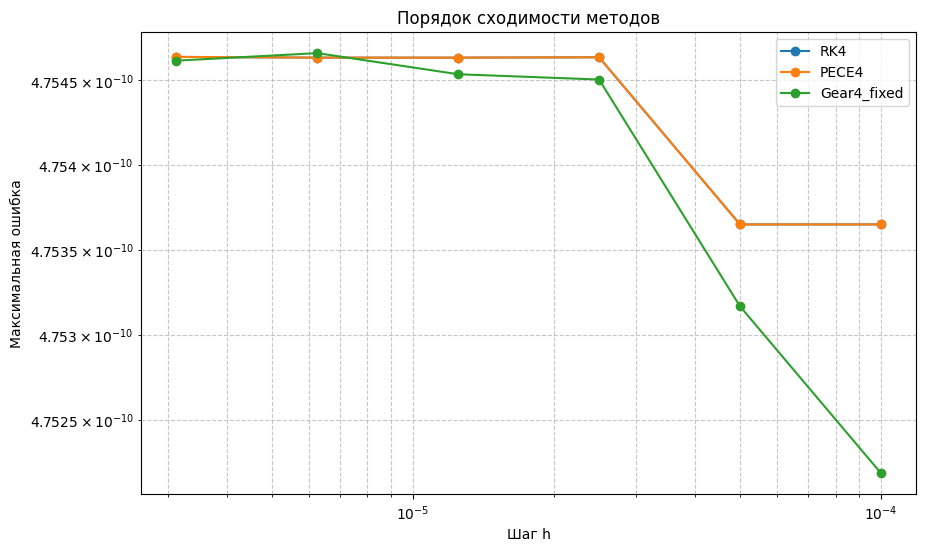

ITERATION 6 1
x0= 1.7999999999999998 y0= 1.5
❌ rk4_solve: NaN или inf в решении (h=0.0001)
⚠️ RK4 при h=0.0001: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ pece4_solve: NaN или inf в решении (h=0.0001)
⚠️ PECE4 при h=0.0001: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ Gear4: расходимость на шаге 3, h=0.0001
❌ gear4_fixed_step: NaN или inf в решении (h=0.0001)
⚠️ Gear4_fixed при h=0.0001: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ rk4_solve: NaN или inf в решении (h=5e-05)
⚠️ RK4 при h=5e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ pece4_solve: NaN или inf в решении (h=5e-05)
⚠️ PECE4 при h=5e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ Gear4: расходимость на шаге 3, h=5e-05
❌ gear4_fixed_step: NaN или inf в решении (h=5e-05)
⚠️ Gear4_fixed при h=5e-05: operands could not be broadcast together with shapes (1,0) (1,3) 


C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:7: RuntimeWarning: overflow encountered in scalar multiply
  dydt = y * (2 * a2 - 0.5 * y - 3.5 * (a2_reg**2) * x)
C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:6: RuntimeWarning: invalid value encountered in scalar multiply
  dxdt = x * (1 - 0.5 * x - (2/7) * (a2_reg**-2) * y)
C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:7: RuntimeWarning: overflow encountered in scalar power
  dydt = y * (2 * a2 - 0.5 * y - 3.5 * (a2_reg**2) * x)
C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:7: RuntimeWarning: invalid value encountered in scalar subtract
  dydt = y * (2 * a2 - 0.5 * y - 3.5 * (a2_reg**2) * x)
C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:8: RuntimeWarning: overflow encountered in scalar multiply
  da2dt = epsilon * (2 - 7 * a2 * x)


❌ rk4_solve: NaN или inf в решении (h=2.5e-05)
⚠️ RK4 при h=2.5e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ pece4_solve: NaN или inf в решении (h=2.5e-05)
⚠️ PECE4 при h=2.5e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ Gear4: расходимость на шаге 3, h=2.5e-05
❌ gear4_fixed_step: NaN или inf в решении (h=2.5e-05)
⚠️ Gear4_fixed при h=2.5e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ rk4_solve: NaN или inf в решении (h=1.25e-05)
⚠️ RK4 при h=1.25e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ pece4_solve: NaN или inf в решении (h=1.25e-05)
⚠️ PECE4 при h=1.25e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ Gear4: расходимость на шаге 3, h=1.25e-05
❌ gear4_fixed_step: NaN или inf в решении (h=1.25e-05)
⚠️ Gear4_fixed при h=1.25e-05: operands could not be broadcast together with shapes (1,0) (1,3) 


C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\1111329400.py:11: RuntimeWarning: invalid value encountered in add
  return y + h/6 * (k1 + 2*k2 + 2*k3 + k4)


❌ rk4_solve: NaN или inf в решении (h=6.25e-06)
⚠️ RK4 при h=6.25e-06: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ pece4_solve: NaN или inf в решении (h=6.25e-06)
⚠️ PECE4 при h=6.25e-06: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ Gear4: расходимость на шаге 3, h=6.25e-06
❌ gear4_fixed_step: NaN или inf в решении (h=6.25e-06)
⚠️ Gear4_fixed при h=6.25e-06: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ rk4_solve: NaN или inf в решении (h=3.125e-06)
⚠️ RK4 при h=3.125e-06: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ pece4_solve: NaN или inf в решении (h=3.125e-06)
⚠️ PECE4 при h=3.125e-06: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ Gear4: расходимость на шаге 3, h=3.125e-06
❌ gear4_fixed_step: NaN или inf в решении (h=3.125e-06)
⚠️ Gear4_fixed при h=3.125e-06: operands could not be broadcast together with shapes (1,0) (1,3) 
          h  RK4  p_RK4  PECE4  p_PECE4  Gear

C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3955799424.py:41: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend()


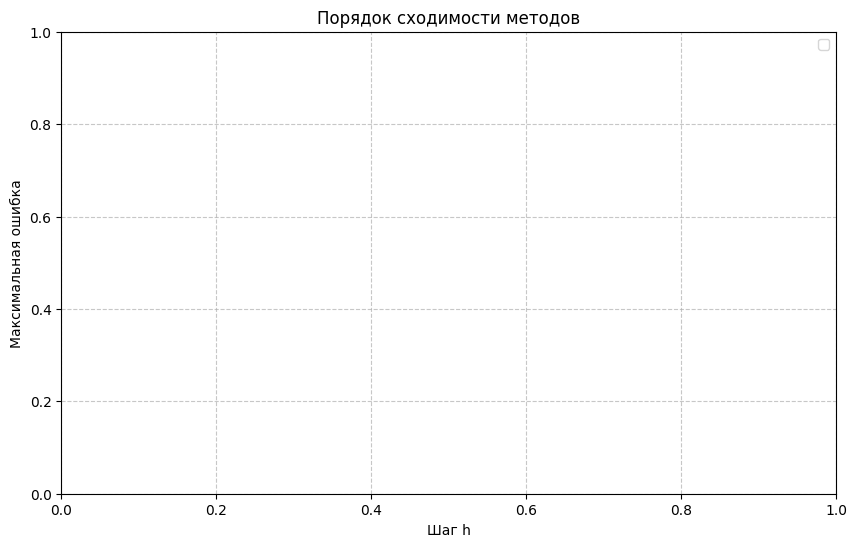

ITERATION 6 2
x0= 1.7999999999999998 y0= 3.0
❌ rk4_solve: NaN или inf в решении (h=0.0001)
⚠️ RK4 при h=0.0001: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ pece4_solve: NaN или inf в решении (h=0.0001)
⚠️ PECE4 при h=0.0001: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ Gear4: расходимость на шаге 3, h=0.0001
❌ gear4_fixed_step: NaN или inf в решении (h=0.0001)
⚠️ Gear4_fixed при h=0.0001: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ rk4_solve: NaN или inf в решении (h=5e-05)
⚠️ RK4 при h=5e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ pece4_solve: NaN или inf в решении (h=5e-05)
⚠️ PECE4 при h=5e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ Gear4: расходимость на шаге 3, h=5e-05
❌ gear4_fixed_step: NaN или inf в решении (h=5e-05)
⚠️ Gear4_fixed при h=5e-05: operands could not be broadcast together with shapes (1,0) (1,3) 


C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:7: RuntimeWarning: overflow encountered in scalar multiply
  dydt = y * (2 * a2 - 0.5 * y - 3.5 * (a2_reg**2) * x)
C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:6: RuntimeWarning: invalid value encountered in scalar multiply
  dxdt = x * (1 - 0.5 * x - (2/7) * (a2_reg**-2) * y)
C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:7: RuntimeWarning: overflow encountered in scalar power
  dydt = y * (2 * a2 - 0.5 * y - 3.5 * (a2_reg**2) * x)
C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:7: RuntimeWarning: invalid value encountered in scalar subtract
  dydt = y * (2 * a2 - 0.5 * y - 3.5 * (a2_reg**2) * x)
C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:8: RuntimeWarning: overflow encountered in scalar multiply
  da2dt = epsilon * (2 - 7 * a2 * x)
C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\1111329400.py:11: RuntimeWarning: invalid value encountered in add
  

❌ rk4_solve: NaN или inf в решении (h=2.5e-05)
⚠️ RK4 при h=2.5e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ pece4_solve: NaN или inf в решении (h=2.5e-05)
⚠️ PECE4 при h=2.5e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ Gear4: расходимость на шаге 3, h=2.5e-05
❌ gear4_fixed_step: NaN или inf в решении (h=2.5e-05)
⚠️ Gear4_fixed при h=2.5e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ rk4_solve: NaN или inf в решении (h=1.25e-05)
⚠️ RK4 при h=1.25e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ pece4_solve: NaN или inf в решении (h=1.25e-05)
⚠️ PECE4 при h=1.25e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ Gear4: расходимость на шаге 3, h=1.25e-05
❌ gear4_fixed_step: NaN или inf в решении (h=1.25e-05)
⚠️ Gear4_fixed при h=1.25e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ rk4_solve: NaN или inf в решении (h=6.25e-06)
⚠️ RK4 при 

C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3955799424.py:41: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend()


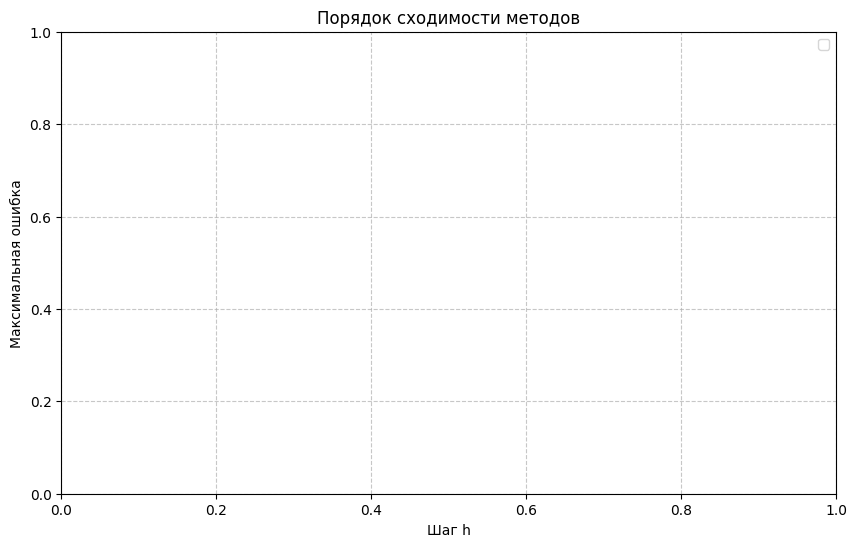

ITERATION 6 3
x0= 1.7999999999999998 y0= 4.5
❌ rk4_solve: NaN или inf в решении (h=0.0001)
⚠️ RK4 при h=0.0001: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ pece4_solve: NaN или inf в решении (h=0.0001)
⚠️ PECE4 при h=0.0001: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ Gear4: расходимость на шаге 3, h=0.0001
❌ gear4_fixed_step: NaN или inf в решении (h=0.0001)
⚠️ Gear4_fixed при h=0.0001: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ rk4_solve: NaN или inf в решении (h=5e-05)
⚠️ RK4 при h=5e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ pece4_solve: NaN или inf в решении (h=5e-05)
⚠️ PECE4 при h=5e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ Gear4: расходимость на шаге 3, h=5e-05
❌ gear4_fixed_step: NaN или inf в решении (h=5e-05)
⚠️ Gear4_fixed при h=5e-05: operands could not be broadcast together with shapes (1,0) (1,3) 


C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:7: RuntimeWarning: overflow encountered in scalar multiply
  dydt = y * (2 * a2 - 0.5 * y - 3.5 * (a2_reg**2) * x)
C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:6: RuntimeWarning: invalid value encountered in scalar multiply
  dxdt = x * (1 - 0.5 * x - (2/7) * (a2_reg**-2) * y)
C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:7: RuntimeWarning: overflow encountered in scalar power
  dydt = y * (2 * a2 - 0.5 * y - 3.5 * (a2_reg**2) * x)
C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:7: RuntimeWarning: invalid value encountered in scalar subtract
  dydt = y * (2 * a2 - 0.5 * y - 3.5 * (a2_reg**2) * x)
C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:8: RuntimeWarning: overflow encountered in scalar multiply
  da2dt = epsilon * (2 - 7 * a2 * x)


❌ rk4_solve: NaN или inf в решении (h=2.5e-05)
⚠️ RK4 при h=2.5e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ pece4_solve: NaN или inf в решении (h=2.5e-05)
⚠️ PECE4 при h=2.5e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ Gear4: расходимость на шаге 3, h=2.5e-05
❌ gear4_fixed_step: NaN или inf в решении (h=2.5e-05)
⚠️ Gear4_fixed при h=2.5e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ rk4_solve: NaN или inf в решении (h=1.25e-05)
⚠️ RK4 при h=1.25e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ pece4_solve: NaN или inf в решении (h=1.25e-05)
⚠️ PECE4 при h=1.25e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ Gear4: расходимость на шаге 3, h=1.25e-05
❌ gear4_fixed_step: NaN или inf в решении (h=1.25e-05)
⚠️ Gear4_fixed при h=1.25e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ rk4_solve: NaN или inf в решении (h=6.25e-06)
⚠️ RK4 при 

C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3955799424.py:41: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend()


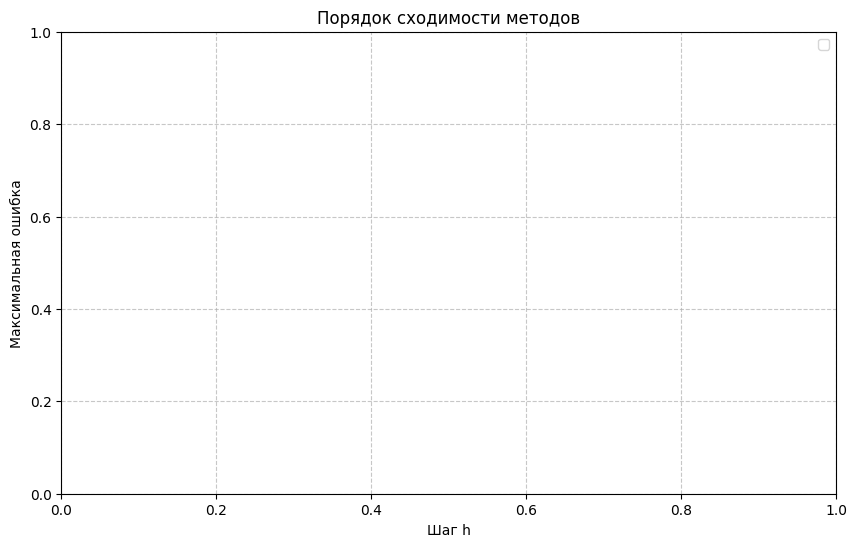

ITERATION 6 4
x0= 1.7999999999999998 y0= 6.0
❌ rk4_solve: NaN или inf в решении (h=0.0001)
⚠️ RK4 при h=0.0001: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ pece4_solve: NaN или inf в решении (h=0.0001)
⚠️ PECE4 при h=0.0001: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ Gear4: расходимость на шаге 3, h=0.0001
❌ gear4_fixed_step: NaN или inf в решении (h=0.0001)
⚠️ Gear4_fixed при h=0.0001: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ rk4_solve: NaN или inf в решении (h=5e-05)
⚠️ RK4 при h=5e-05: operands could not be broadcast together with shapes (1,0) (1,3) 


C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:7: RuntimeWarning: overflow encountered in scalar multiply
  dydt = y * (2 * a2 - 0.5 * y - 3.5 * (a2_reg**2) * x)
C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:6: RuntimeWarning: invalid value encountered in scalar multiply
  dxdt = x * (1 - 0.5 * x - (2/7) * (a2_reg**-2) * y)
C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:7: RuntimeWarning: overflow encountered in scalar power
  dydt = y * (2 * a2 - 0.5 * y - 3.5 * (a2_reg**2) * x)
C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:7: RuntimeWarning: invalid value encountered in scalar subtract
  dydt = y * (2 * a2 - 0.5 * y - 3.5 * (a2_reg**2) * x)
C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:8: RuntimeWarning: overflow encountered in scalar multiply
  da2dt = epsilon * (2 - 7 * a2 * x)
C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\1111329400.py:11: RuntimeWarning: invalid value encountered in add
  

❌ pece4_solve: NaN или inf в решении (h=5e-05)
⚠️ PECE4 при h=5e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ Gear4: расходимость на шаге 3, h=5e-05
❌ gear4_fixed_step: NaN или inf в решении (h=5e-05)
⚠️ Gear4_fixed при h=5e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ rk4_solve: NaN или inf в решении (h=2.5e-05)
⚠️ RK4 при h=2.5e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ pece4_solve: NaN или inf в решении (h=2.5e-05)
⚠️ PECE4 при h=2.5e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ Gear4: расходимость на шаге 3, h=2.5e-05
❌ gear4_fixed_step: NaN или inf в решении (h=2.5e-05)
⚠️ Gear4_fixed при h=2.5e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ rk4_solve: NaN или inf в решении (h=1.25e-05)
⚠️ RK4 при h=1.25e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ pece4_solve: NaN или inf в решении (h=1.25e-05)
⚠️ PECE4 при h=1.25e-05:

C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3955799424.py:41: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend()


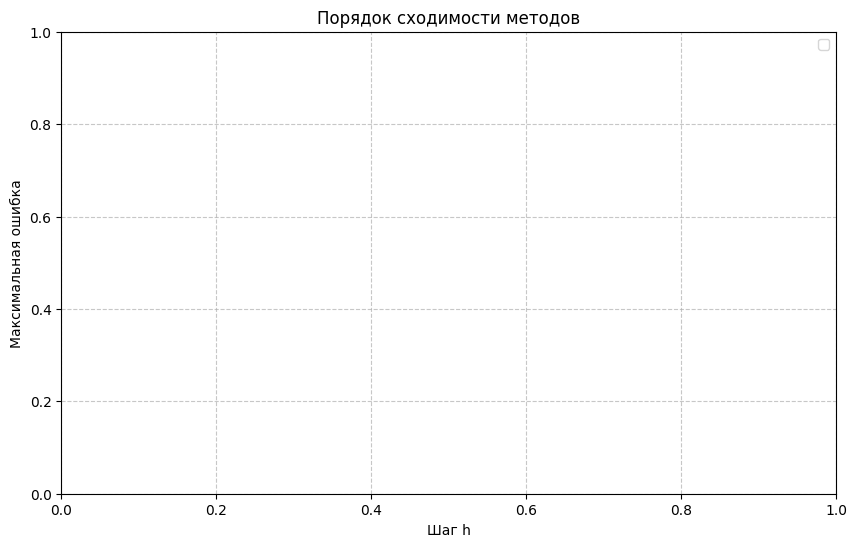

ITERATION 6 5
x0= 1.7999999999999998 y0= 7.5
❌ rk4_solve: NaN или inf в решении (h=0.0001)
⚠️ RK4 при h=0.0001: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ pece4_solve: NaN или inf в решении (h=0.0001)
⚠️ PECE4 при h=0.0001: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ Gear4: расходимость на шаге 3, h=0.0001
❌ gear4_fixed_step: NaN или inf в решении (h=0.0001)
⚠️ Gear4_fixed при h=0.0001: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ rk4_solve: NaN или inf в решении (h=5e-05)
⚠️ RK4 при h=5e-05: operands could not be broadcast together with shapes (1,0) (1,3) 


C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:7: RuntimeWarning: overflow encountered in scalar multiply
  dydt = y * (2 * a2 - 0.5 * y - 3.5 * (a2_reg**2) * x)
C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:6: RuntimeWarning: invalid value encountered in scalar multiply
  dxdt = x * (1 - 0.5 * x - (2/7) * (a2_reg**-2) * y)
C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:7: RuntimeWarning: overflow encountered in scalar power
  dydt = y * (2 * a2 - 0.5 * y - 3.5 * (a2_reg**2) * x)
C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:7: RuntimeWarning: invalid value encountered in scalar subtract
  dydt = y * (2 * a2 - 0.5 * y - 3.5 * (a2_reg**2) * x)
C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:8: RuntimeWarning: overflow encountered in scalar multiply
  da2dt = epsilon * (2 - 7 * a2 * x)
C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\1111329400.py:11: RuntimeWarning: invalid value encountered in add
  

❌ pece4_solve: NaN или inf в решении (h=5e-05)
⚠️ PECE4 при h=5e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ Gear4: расходимость на шаге 3, h=5e-05
❌ gear4_fixed_step: NaN или inf в решении (h=5e-05)
⚠️ Gear4_fixed при h=5e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ rk4_solve: NaN или inf в решении (h=2.5e-05)
⚠️ RK4 при h=2.5e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ pece4_solve: NaN или inf в решении (h=2.5e-05)
⚠️ PECE4 при h=2.5e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ Gear4: расходимость на шаге 3, h=2.5e-05
❌ gear4_fixed_step: NaN или inf в решении (h=2.5e-05)
⚠️ Gear4_fixed при h=2.5e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ rk4_solve: NaN или inf в решении (h=1.25e-05)
⚠️ RK4 при h=1.25e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ pece4_solve: NaN или inf в решении (h=1.25e-05)
⚠️ PECE4 при h=1.25e-05:

C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3955799424.py:41: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend()


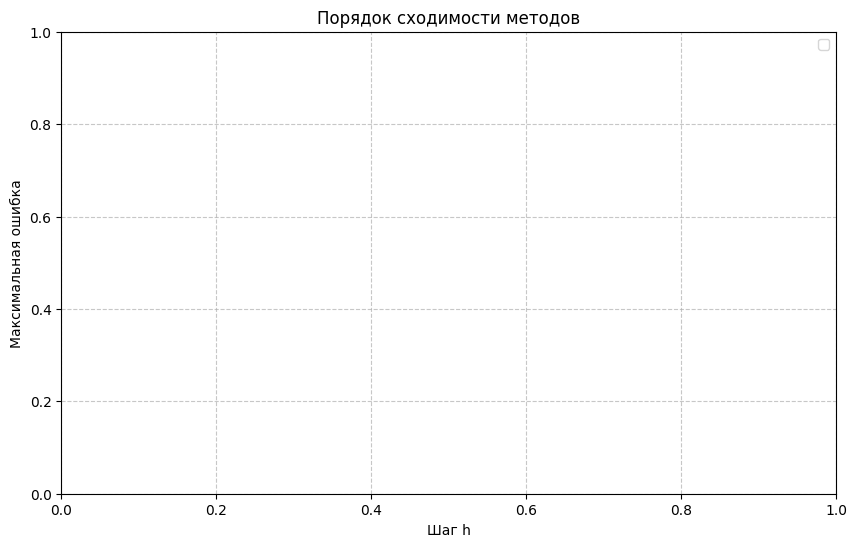

ITERATION 6 6
x0= 1.7999999999999998 y0= 9.0
❌ rk4_solve: NaN или inf в решении (h=0.0001)
⚠️ RK4 при h=0.0001: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ pece4_solve: NaN или inf в решении (h=0.0001)
⚠️ PECE4 при h=0.0001: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ Gear4: расходимость на шаге 3, h=0.0001
❌ gear4_fixed_step: NaN или inf в решении (h=0.0001)
⚠️ Gear4_fixed при h=0.0001: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ rk4_solve: NaN или inf в решении (h=5e-05)
⚠️ RK4 при h=5e-05: operands could not be broadcast together with shapes (1,0) (1,3) 


C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:7: RuntimeWarning: overflow encountered in scalar multiply
  dydt = y * (2 * a2 - 0.5 * y - 3.5 * (a2_reg**2) * x)
C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:6: RuntimeWarning: invalid value encountered in scalar multiply
  dxdt = x * (1 - 0.5 * x - (2/7) * (a2_reg**-2) * y)
C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:7: RuntimeWarning: overflow encountered in scalar power
  dydt = y * (2 * a2 - 0.5 * y - 3.5 * (a2_reg**2) * x)
C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:7: RuntimeWarning: invalid value encountered in scalar subtract
  dydt = y * (2 * a2 - 0.5 * y - 3.5 * (a2_reg**2) * x)
C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:8: RuntimeWarning: overflow encountered in scalar multiply
  da2dt = epsilon * (2 - 7 * a2 * x)


❌ pece4_solve: NaN или inf в решении (h=5e-05)
⚠️ PECE4 при h=5e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ Gear4: расходимость на шаге 3, h=5e-05
❌ gear4_fixed_step: NaN или inf в решении (h=5e-05)
⚠️ Gear4_fixed при h=5e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ rk4_solve: NaN или inf в решении (h=2.5e-05)
⚠️ RK4 при h=2.5e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ pece4_solve: NaN или inf в решении (h=2.5e-05)
⚠️ PECE4 при h=2.5e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ Gear4: расходимость на шаге 3, h=2.5e-05
❌ gear4_fixed_step: NaN или inf в решении (h=2.5e-05)
⚠️ Gear4_fixed при h=2.5e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ rk4_solve: NaN или inf в решении (h=1.25e-05)
⚠️ RK4 при h=1.25e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ pece4_solve: NaN или inf в решении (h=1.25e-05)
⚠️ PECE4 при h=1.25e-05:

C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3955799424.py:41: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend()


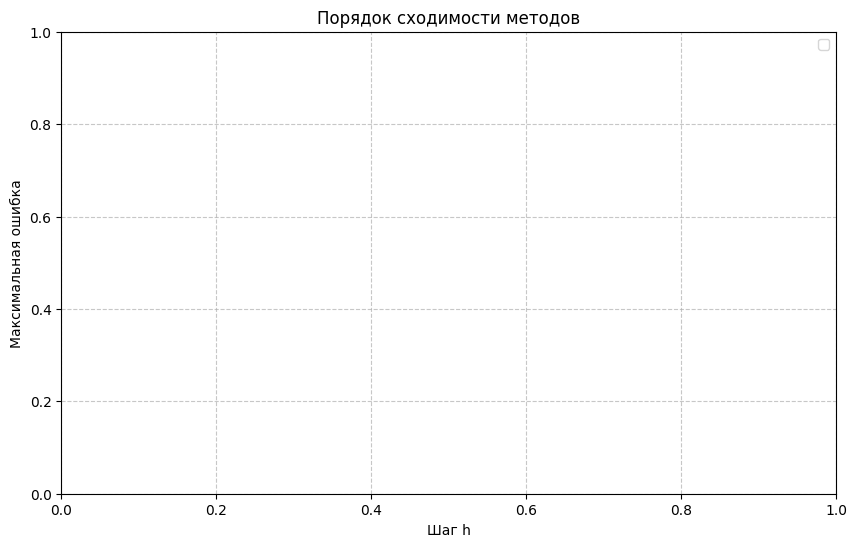

ITERATION 6 7
x0= 1.7999999999999998 y0= 10.5
❌ rk4_solve: NaN или inf в решении (h=0.0001)
⚠️ RK4 при h=0.0001: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ pece4_solve: NaN или inf в решении (h=0.0001)
⚠️ PECE4 при h=0.0001: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ Gear4: расходимость на шаге 3, h=0.0001
❌ gear4_fixed_step: NaN или inf в решении (h=0.0001)
⚠️ Gear4_fixed при h=0.0001: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ rk4_solve: NaN или inf в решении (h=5e-05)
⚠️ RK4 при h=5e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ pece4_solve: NaN или inf в решении (h=5e-05)
⚠️ PECE4 при h=5e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ Gear4: расходимость на шаге 3, h=5e-05
❌ gear4_fixed_step: NaN или inf в решении (h=5e-05)
⚠️ Gear4_fixed при h=5e-05: operands could not be broadcast together with shapes (1,0) (1,3) 


C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:7: RuntimeWarning: overflow encountered in scalar multiply
  dydt = y * (2 * a2 - 0.5 * y - 3.5 * (a2_reg**2) * x)
C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:6: RuntimeWarning: invalid value encountered in scalar multiply
  dxdt = x * (1 - 0.5 * x - (2/7) * (a2_reg**-2) * y)
C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:7: RuntimeWarning: overflow encountered in scalar power
  dydt = y * (2 * a2 - 0.5 * y - 3.5 * (a2_reg**2) * x)
C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:7: RuntimeWarning: invalid value encountered in scalar subtract
  dydt = y * (2 * a2 - 0.5 * y - 3.5 * (a2_reg**2) * x)
C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:8: RuntimeWarning: overflow encountered in scalar multiply
  da2dt = epsilon * (2 - 7 * a2 * x)


❌ rk4_solve: NaN или inf в решении (h=2.5e-05)
⚠️ RK4 при h=2.5e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ pece4_solve: NaN или inf в решении (h=2.5e-05)
⚠️ PECE4 при h=2.5e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ Gear4: расходимость на шаге 3, h=2.5e-05
❌ gear4_fixed_step: NaN или inf в решении (h=2.5e-05)
⚠️ Gear4_fixed при h=2.5e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ rk4_solve: NaN или inf в решении (h=1.25e-05)
⚠️ RK4 при h=1.25e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ pece4_solve: NaN или inf в решении (h=1.25e-05)
⚠️ PECE4 при h=1.25e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ Gear4: расходимость на шаге 3, h=1.25e-05
❌ gear4_fixed_step: NaN или inf в решении (h=1.25e-05)
⚠️ Gear4_fixed при h=1.25e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ rk4_solve: NaN или inf в решении (h=6.25e-06)
⚠️ RK4 при 

C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3955799424.py:41: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend()


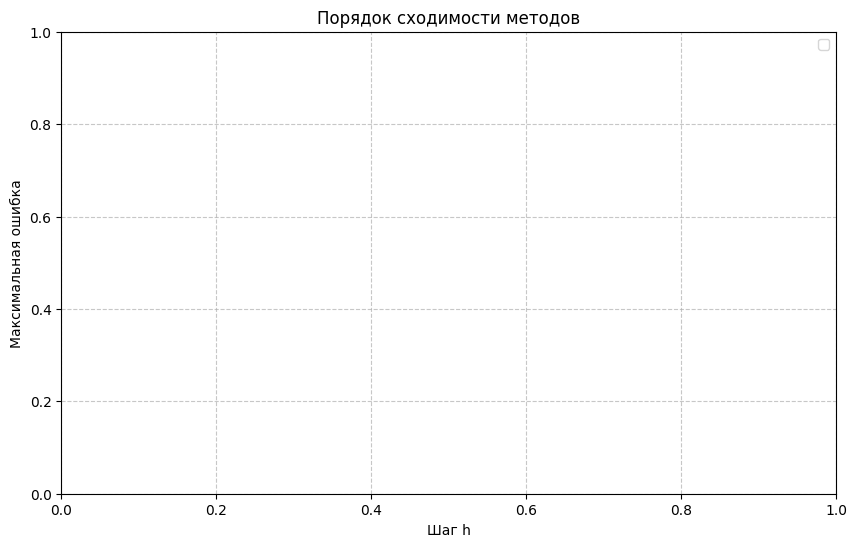

ITERATION 6 8
x0= 1.7999999999999998 y0= 12.0
❌ rk4_solve: NaN или inf в решении (h=0.0001)
⚠️ RK4 при h=0.0001: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ pece4_solve: NaN или inf в решении (h=0.0001)
⚠️ PECE4 при h=0.0001: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ Gear4: расходимость на шаге 3, h=0.0001
❌ gear4_fixed_step: NaN или inf в решении (h=0.0001)
⚠️ Gear4_fixed при h=0.0001: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ rk4_solve: NaN или inf в решении (h=5e-05)
⚠️ RK4 при h=5e-05: operands could not be broadcast together with shapes (1,0) (1,3) 


C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:7: RuntimeWarning: overflow encountered in scalar multiply
  dydt = y * (2 * a2 - 0.5 * y - 3.5 * (a2_reg**2) * x)
C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:6: RuntimeWarning: invalid value encountered in scalar multiply
  dxdt = x * (1 - 0.5 * x - (2/7) * (a2_reg**-2) * y)
C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:7: RuntimeWarning: overflow encountered in scalar power
  dydt = y * (2 * a2 - 0.5 * y - 3.5 * (a2_reg**2) * x)
C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:7: RuntimeWarning: invalid value encountered in scalar subtract
  dydt = y * (2 * a2 - 0.5 * y - 3.5 * (a2_reg**2) * x)
C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:8: RuntimeWarning: overflow encountered in scalar multiply
  da2dt = epsilon * (2 - 7 * a2 * x)


❌ pece4_solve: NaN или inf в решении (h=5e-05)
⚠️ PECE4 при h=5e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ Gear4: расходимость на шаге 3, h=5e-05
❌ gear4_fixed_step: NaN или inf в решении (h=5e-05)
⚠️ Gear4_fixed при h=5e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ rk4_solve: NaN или inf в решении (h=2.5e-05)
⚠️ RK4 при h=2.5e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ pece4_solve: NaN или inf в решении (h=2.5e-05)
⚠️ PECE4 при h=2.5e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ Gear4: расходимость на шаге 3, h=2.5e-05
❌ gear4_fixed_step: NaN или inf в решении (h=2.5e-05)
⚠️ Gear4_fixed при h=2.5e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ rk4_solve: NaN или inf в решении (h=1.25e-05)
⚠️ RK4 при h=1.25e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ pece4_solve: NaN или inf в решении (h=1.25e-05)
⚠️ PECE4 при h=1.25e-05:

C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3955799424.py:41: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend()


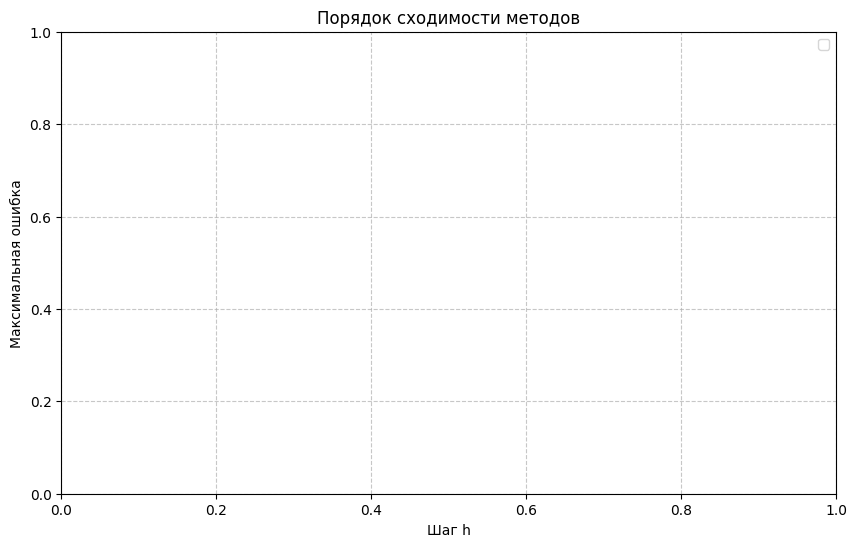

ITERATION 6 9
x0= 1.7999999999999998 y0= 13.5
❌ rk4_solve: NaN или inf в решении (h=0.0001)
⚠️ RK4 при h=0.0001: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ pece4_solve: NaN или inf в решении (h=0.0001)
⚠️ PECE4 при h=0.0001: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ Gear4: расходимость на шаге 3, h=0.0001
❌ gear4_fixed_step: NaN или inf в решении (h=0.0001)
⚠️ Gear4_fixed при h=0.0001: operands could not be broadcast together with shapes (1,0) (1,3) 


C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:7: RuntimeWarning: overflow encountered in scalar multiply
  dydt = y * (2 * a2 - 0.5 * y - 3.5 * (a2_reg**2) * x)
C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:6: RuntimeWarning: invalid value encountered in scalar multiply
  dxdt = x * (1 - 0.5 * x - (2/7) * (a2_reg**-2) * y)
C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:7: RuntimeWarning: overflow encountered in scalar power
  dydt = y * (2 * a2 - 0.5 * y - 3.5 * (a2_reg**2) * x)
C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:7: RuntimeWarning: invalid value encountered in scalar subtract
  dydt = y * (2 * a2 - 0.5 * y - 3.5 * (a2_reg**2) * x)
C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:8: RuntimeWarning: overflow encountered in scalar multiply
  da2dt = epsilon * (2 - 7 * a2 * x)


❌ rk4_solve: NaN или inf в решении (h=5e-05)
⚠️ RK4 при h=5e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ pece4_solve: NaN или inf в решении (h=5e-05)
⚠️ PECE4 при h=5e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ Gear4: расходимость на шаге 3, h=5e-05
❌ gear4_fixed_step: NaN или inf в решении (h=5e-05)
⚠️ Gear4_fixed при h=5e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ rk4_solve: NaN или inf в решении (h=2.5e-05)
⚠️ RK4 при h=2.5e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ pece4_solve: NaN или inf в решении (h=2.5e-05)
⚠️ PECE4 при h=2.5e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ Gear4: расходимость на шаге 3, h=2.5e-05
❌ gear4_fixed_step: NaN или inf в решении (h=2.5e-05)
⚠️ Gear4_fixed при h=2.5e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ rk4_solve: NaN или inf в решении (h=1.25e-05)
⚠️ RK4 при h=1.25e-05: operands 

C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3955799424.py:41: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend()


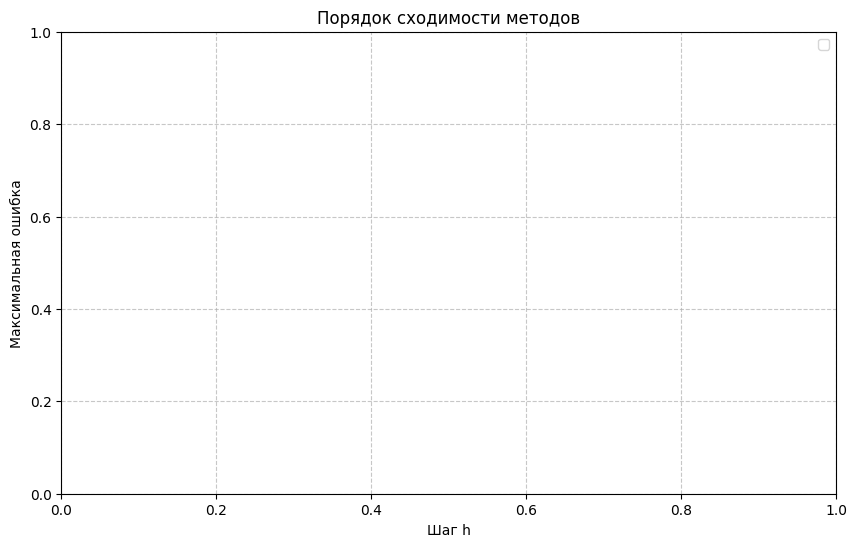

ITERATION 7 0
x0= 2.1 y0= 0.0
✅ rk4_solve: успех, 101 шагов (h=0.0001)
✅ pece4_solve: успех, 101 шагов (h=0.0001)
✅ gear4_fixed_step: успех, 101 шагов (h=0.0001)
✅ rk4_solve: успех, 201 шагов (h=5e-05)
✅ pece4_solve: успех, 201 шагов (h=5e-05)
✅ gear4_fixed_step: успех, 201 шагов (h=5e-05)
✅ rk4_solve: успех, 401 шагов (h=2.5e-05)
✅ pece4_solve: успех, 401 шагов (h=2.5e-05)
✅ gear4_fixed_step: успех, 401 шагов (h=2.5e-05)
✅ rk4_solve: успех, 801 шагов (h=1.25e-05)
✅ pece4_solve: успех, 801 шагов (h=1.25e-05)
✅ gear4_fixed_step: успех, 801 шагов (h=1.25e-05)
✅ rk4_solve: успех, 1601 шагов (h=6.25e-06)
✅ pece4_solve: успех, 1601 шагов (h=6.25e-06)
✅ gear4_fixed_step: успех, 1601 шагов (h=6.25e-06)
✅ rk4_solve: успех, 3201 шагов (h=3.125e-06)
✅ pece4_solve: успех, 3201 шагов (h=3.125e-06)
✅ gear4_fixed_step: успех, 3201 шагов (h=3.125e-06)
          h           RK4  p_RK4         PECE4  p_PECE4   Gear4_fixed  p_Gear4_fixed
0  0.000100  6.822605e-10    NaN  6.822605e-10      NaN  6.849326e

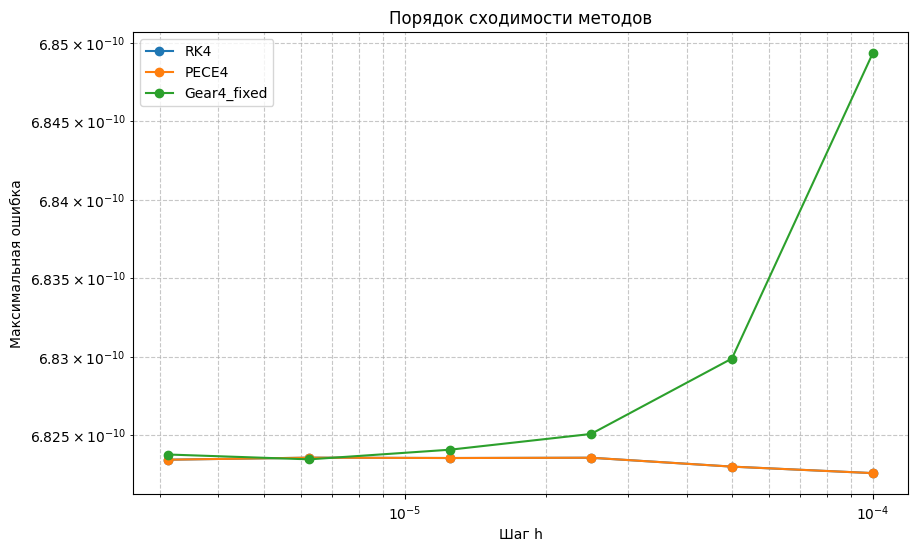

ITERATION 7 1
x0= 2.1 y0= 1.5
❌ rk4_solve: NaN или inf в решении (h=0.0001)
⚠️ RK4 при h=0.0001: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ pece4_solve: NaN или inf в решении (h=0.0001)
⚠️ PECE4 при h=0.0001: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ Gear4: расходимость на шаге 3, h=0.0001
❌ gear4_fixed_step: NaN или inf в решении (h=0.0001)
⚠️ Gear4_fixed при h=0.0001: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ rk4_solve: NaN или inf в решении (h=5e-05)
⚠️ RK4 при h=5e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ pece4_solve: NaN или inf в решении (h=5e-05)
⚠️ PECE4 при h=5e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ Gear4: расходимость на шаге 3, h=5e-05
❌ gear4_fixed_step: NaN или inf в решении (h=5e-05)
⚠️ Gear4_fixed при h=5e-05: operands could not be broadcast together with shapes (1,0) (1,3) 


C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:7: RuntimeWarning: overflow encountered in scalar multiply
  dydt = y * (2 * a2 - 0.5 * y - 3.5 * (a2_reg**2) * x)
C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:6: RuntimeWarning: invalid value encountered in scalar multiply
  dxdt = x * (1 - 0.5 * x - (2/7) * (a2_reg**-2) * y)
C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:7: RuntimeWarning: overflow encountered in scalar power
  dydt = y * (2 * a2 - 0.5 * y - 3.5 * (a2_reg**2) * x)
C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:7: RuntimeWarning: invalid value encountered in scalar subtract
  dydt = y * (2 * a2 - 0.5 * y - 3.5 * (a2_reg**2) * x)
C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:8: RuntimeWarning: overflow encountered in scalar multiply
  da2dt = epsilon * (2 - 7 * a2 * x)


❌ rk4_solve: NaN или inf в решении (h=2.5e-05)
⚠️ RK4 при h=2.5e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ pece4_solve: NaN или inf в решении (h=2.5e-05)
⚠️ PECE4 при h=2.5e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ Gear4: расходимость на шаге 3, h=2.5e-05
❌ gear4_fixed_step: NaN или inf в решении (h=2.5e-05)
⚠️ Gear4_fixed при h=2.5e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ rk4_solve: NaN или inf в решении (h=1.25e-05)
⚠️ RK4 при h=1.25e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ pece4_solve: NaN или inf в решении (h=1.25e-05)
⚠️ PECE4 при h=1.25e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ Gear4: расходимость на шаге 3, h=1.25e-05
❌ gear4_fixed_step: NaN или inf в решении (h=1.25e-05)
⚠️ Gear4_fixed при h=1.25e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ rk4_solve: NaN или inf в решении (h=6.25e-06)
⚠️ RK4 при 

C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3955799424.py:41: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend()


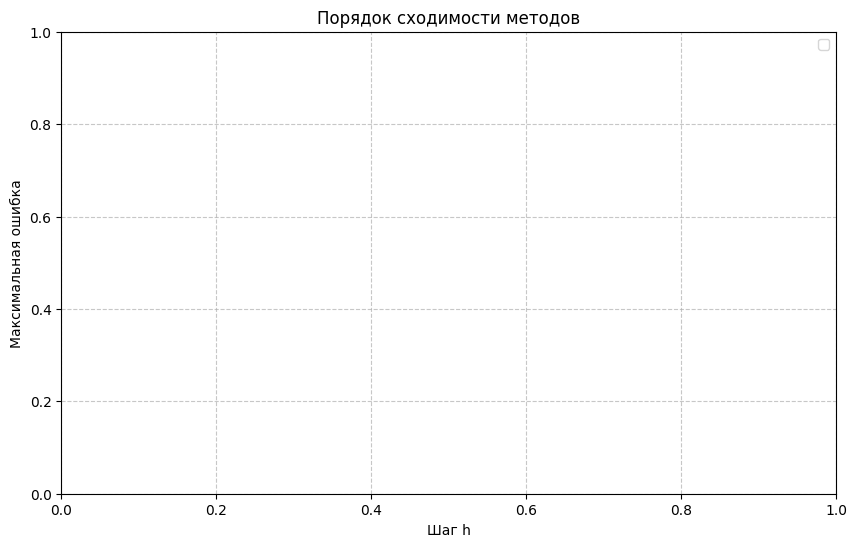

ITERATION 7 2
x0= 2.1 y0= 3.0
❌ rk4_solve: NaN или inf в решении (h=0.0001)
⚠️ RK4 при h=0.0001: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ pece4_solve: NaN или inf в решении (h=0.0001)
⚠️ PECE4 при h=0.0001: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ Gear4: расходимость на шаге 3, h=0.0001
❌ gear4_fixed_step: NaN или inf в решении (h=0.0001)
⚠️ Gear4_fixed при h=0.0001: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ rk4_solve: NaN или inf в решении (h=5e-05)
⚠️ RK4 при h=5e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ pece4_solve: NaN или inf в решении (h=5e-05)
⚠️ PECE4 при h=5e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ Gear4: расходимость на шаге 3, h=5e-05
❌ gear4_fixed_step: NaN или inf в решении (h=5e-05)
⚠️ Gear4_fixed при h=5e-05: operands could not be broadcast together with shapes (1,0) (1,3) 


C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:7: RuntimeWarning: overflow encountered in scalar multiply
  dydt = y * (2 * a2 - 0.5 * y - 3.5 * (a2_reg**2) * x)
C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:6: RuntimeWarning: invalid value encountered in scalar multiply
  dxdt = x * (1 - 0.5 * x - (2/7) * (a2_reg**-2) * y)
C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:7: RuntimeWarning: overflow encountered in scalar power
  dydt = y * (2 * a2 - 0.5 * y - 3.5 * (a2_reg**2) * x)
C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:7: RuntimeWarning: invalid value encountered in scalar subtract
  dydt = y * (2 * a2 - 0.5 * y - 3.5 * (a2_reg**2) * x)
C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:8: RuntimeWarning: overflow encountered in scalar multiply
  da2dt = epsilon * (2 - 7 * a2 * x)
C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\1111329400.py:11: RuntimeWarning: invalid value encountered in add
  

❌ rk4_solve: NaN или inf в решении (h=2.5e-05)
⚠️ RK4 при h=2.5e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ pece4_solve: NaN или inf в решении (h=2.5e-05)
⚠️ PECE4 при h=2.5e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ Gear4: расходимость на шаге 3, h=2.5e-05
❌ gear4_fixed_step: NaN или inf в решении (h=2.5e-05)
⚠️ Gear4_fixed при h=2.5e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ rk4_solve: NaN или inf в решении (h=1.25e-05)
⚠️ RK4 при h=1.25e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ pece4_solve: NaN или inf в решении (h=1.25e-05)
⚠️ PECE4 при h=1.25e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ Gear4: расходимость на шаге 3, h=1.25e-05
❌ gear4_fixed_step: NaN или inf в решении (h=1.25e-05)
⚠️ Gear4_fixed при h=1.25e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ rk4_solve: NaN или inf в решении (h=6.25e-06)
⚠️ RK4 при 

C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3955799424.py:41: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend()


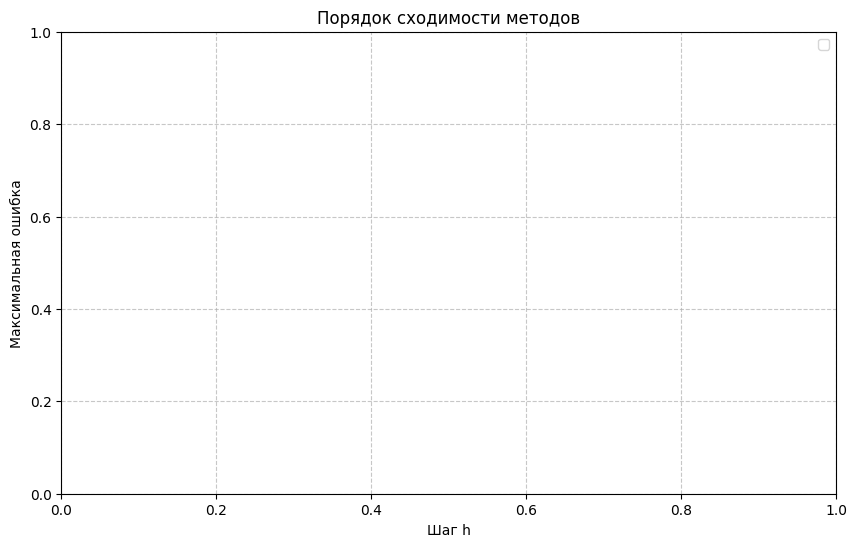

ITERATION 7 3
x0= 2.1 y0= 4.5
❌ rk4_solve: NaN или inf в решении (h=0.0001)
⚠️ RK4 при h=0.0001: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ pece4_solve: NaN или inf в решении (h=0.0001)
⚠️ PECE4 при h=0.0001: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ Gear4: расходимость на шаге 3, h=0.0001
❌ gear4_fixed_step: NaN или inf в решении (h=0.0001)
⚠️ Gear4_fixed при h=0.0001: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ rk4_solve: NaN или inf в решении (h=5e-05)
⚠️ RK4 при h=5e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ pece4_solve: NaN или inf в решении (h=5e-05)
⚠️ PECE4 при h=5e-05: operands could not be broadcast together with shapes (1,0) (1,3) 


C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:7: RuntimeWarning: overflow encountered in scalar multiply
  dydt = y * (2 * a2 - 0.5 * y - 3.5 * (a2_reg**2) * x)
C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:6: RuntimeWarning: invalid value encountered in scalar multiply
  dxdt = x * (1 - 0.5 * x - (2/7) * (a2_reg**-2) * y)
C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:7: RuntimeWarning: overflow encountered in scalar power
  dydt = y * (2 * a2 - 0.5 * y - 3.5 * (a2_reg**2) * x)
C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:7: RuntimeWarning: invalid value encountered in scalar subtract
  dydt = y * (2 * a2 - 0.5 * y - 3.5 * (a2_reg**2) * x)
C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:8: RuntimeWarning: overflow encountered in scalar multiply
  da2dt = epsilon * (2 - 7 * a2 * x)


❌ Gear4: расходимость на шаге 3, h=5e-05
❌ gear4_fixed_step: NaN или inf в решении (h=5e-05)
⚠️ Gear4_fixed при h=5e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ rk4_solve: NaN или inf в решении (h=2.5e-05)
⚠️ RK4 при h=2.5e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ pece4_solve: NaN или inf в решении (h=2.5e-05)
⚠️ PECE4 при h=2.5e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ Gear4: расходимость на шаге 3, h=2.5e-05
❌ gear4_fixed_step: NaN или inf в решении (h=2.5e-05)
⚠️ Gear4_fixed при h=2.5e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ rk4_solve: NaN или inf в решении (h=1.25e-05)
⚠️ RK4 при h=1.25e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ pece4_solve: NaN или inf в решении (h=1.25e-05)
⚠️ PECE4 при h=1.25e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ Gear4: расходимость на шаге 3, h=1.25e-05
❌ gear4_fixed_step: NaN 

C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3955799424.py:41: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend()


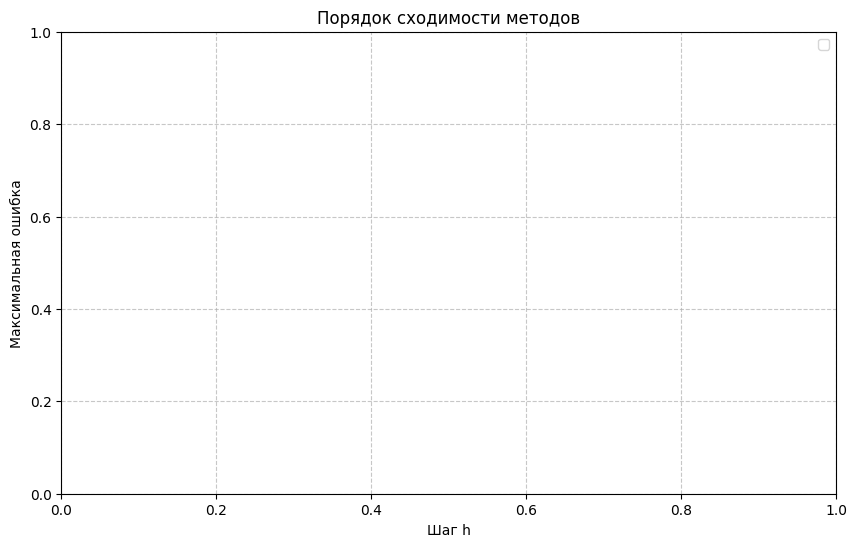

ITERATION 7 4
x0= 2.1 y0= 6.0
❌ rk4_solve: NaN или inf в решении (h=0.0001)
⚠️ RK4 при h=0.0001: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ pece4_solve: NaN или inf в решении (h=0.0001)
⚠️ PECE4 при h=0.0001: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ Gear4: расходимость на шаге 3, h=0.0001
❌ gear4_fixed_step: NaN или inf в решении (h=0.0001)
⚠️ Gear4_fixed при h=0.0001: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ rk4_solve: NaN или inf в решении (h=5e-05)
⚠️ RK4 при h=5e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ pece4_solve: NaN или inf в решении (h=5e-05)
⚠️ PECE4 при h=5e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ Gear4: расходимость на шаге 3, h=5e-05
❌ gear4_fixed_step: NaN или inf в решении (h=5e-05)
⚠️ Gear4_fixed при h=5e-05: operands could not be broadcast together with shapes (1,0) (1,3) 


C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:7: RuntimeWarning: overflow encountered in scalar multiply
  dydt = y * (2 * a2 - 0.5 * y - 3.5 * (a2_reg**2) * x)
C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:6: RuntimeWarning: invalid value encountered in scalar multiply
  dxdt = x * (1 - 0.5 * x - (2/7) * (a2_reg**-2) * y)
C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:7: RuntimeWarning: overflow encountered in scalar power
  dydt = y * (2 * a2 - 0.5 * y - 3.5 * (a2_reg**2) * x)
C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:7: RuntimeWarning: invalid value encountered in scalar subtract
  dydt = y * (2 * a2 - 0.5 * y - 3.5 * (a2_reg**2) * x)
C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:8: RuntimeWarning: overflow encountered in scalar multiply
  da2dt = epsilon * (2 - 7 * a2 * x)
C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\1111329400.py:11: RuntimeWarning: invalid value encountered in add
  

❌ rk4_solve: NaN или inf в решении (h=2.5e-05)
⚠️ RK4 при h=2.5e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ pece4_solve: NaN или inf в решении (h=2.5e-05)
⚠️ PECE4 при h=2.5e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ Gear4: расходимость на шаге 3, h=2.5e-05
❌ gear4_fixed_step: NaN или inf в решении (h=2.5e-05)
⚠️ Gear4_fixed при h=2.5e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ rk4_solve: NaN или inf в решении (h=1.25e-05)
⚠️ RK4 при h=1.25e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ pece4_solve: NaN или inf в решении (h=1.25e-05)
⚠️ PECE4 при h=1.25e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ Gear4: расходимость на шаге 3, h=1.25e-05
❌ gear4_fixed_step: NaN или inf в решении (h=1.25e-05)
⚠️ Gear4_fixed при h=1.25e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ rk4_solve: NaN или inf в решении (h=6.25e-06)
⚠️ RK4 при 

C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3955799424.py:41: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend()


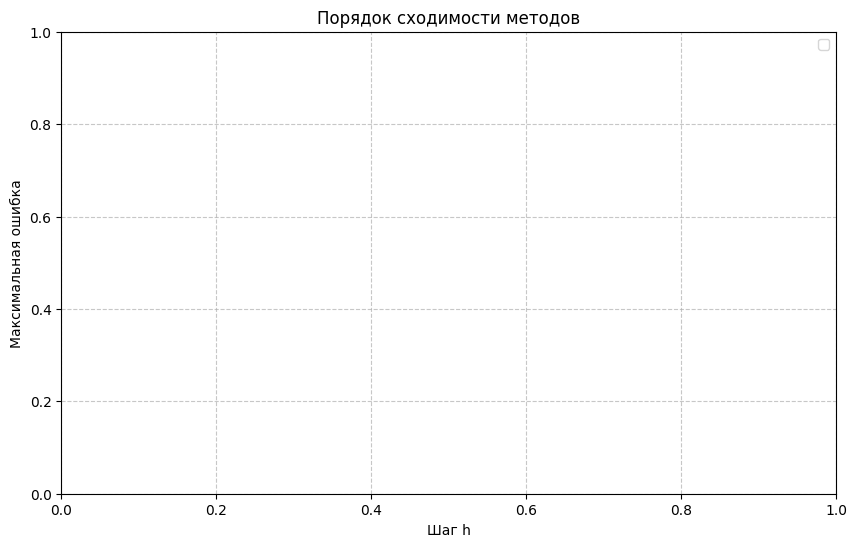

ITERATION 7 5
x0= 2.1 y0= 7.5


C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:7: RuntimeWarning: overflow encountered in scalar multiply
  dydt = y * (2 * a2 - 0.5 * y - 3.5 * (a2_reg**2) * x)
C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:6: RuntimeWarning: invalid value encountered in scalar multiply
  dxdt = x * (1 - 0.5 * x - (2/7) * (a2_reg**-2) * y)
C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:7: RuntimeWarning: overflow encountered in scalar power
  dydt = y * (2 * a2 - 0.5 * y - 3.5 * (a2_reg**2) * x)
C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:7: RuntimeWarning: invalid value encountered in scalar subtract
  dydt = y * (2 * a2 - 0.5 * y - 3.5 * (a2_reg**2) * x)
C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:8: RuntimeWarning: overflow encountered in scalar multiply
  da2dt = epsilon * (2 - 7 * a2 * x)
C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\1111329400.py:11: RuntimeWarning: invalid value encountered in add
  

❌ rk4_solve: NaN или inf в решении (h=0.0001)
⚠️ RK4 при h=0.0001: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ pece4_solve: NaN или inf в решении (h=0.0001)
⚠️ PECE4 при h=0.0001: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ Gear4: расходимость на шаге 3, h=0.0001
❌ gear4_fixed_step: NaN или inf в решении (h=0.0001)
⚠️ Gear4_fixed при h=0.0001: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ rk4_solve: NaN или inf в решении (h=5e-05)
⚠️ RK4 при h=5e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ pece4_solve: NaN или inf в решении (h=5e-05)
⚠️ PECE4 при h=5e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ Gear4: расходимость на шаге 3, h=5e-05
❌ gear4_fixed_step: NaN или inf в решении (h=5e-05)
⚠️ Gear4_fixed при h=5e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ rk4_solve: NaN или inf в решении (h=2.5e-05)
⚠️ RK4 при h=2.5e-05: operands could not

C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3955799424.py:41: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend()


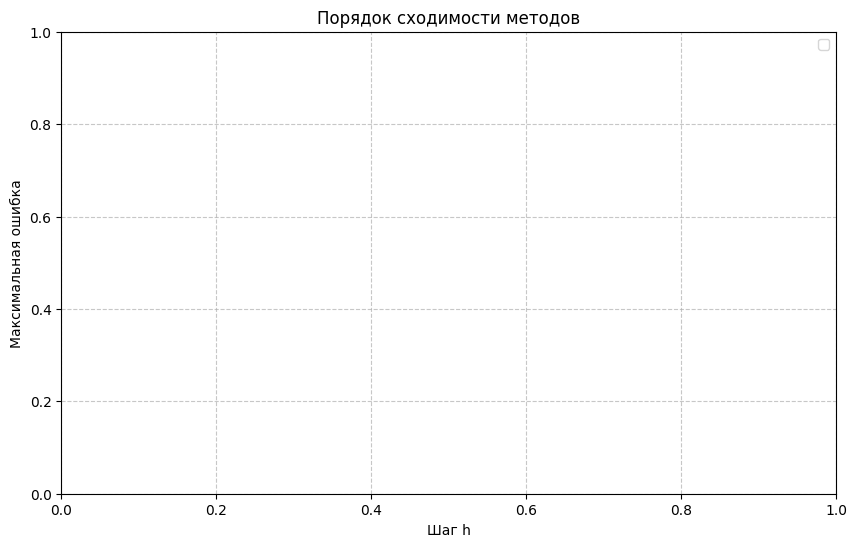

ITERATION 7 6
x0= 2.1 y0= 9.0


C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:7: RuntimeWarning: overflow encountered in scalar multiply
  dydt = y * (2 * a2 - 0.5 * y - 3.5 * (a2_reg**2) * x)
C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:6: RuntimeWarning: invalid value encountered in scalar multiply
  dxdt = x * (1 - 0.5 * x - (2/7) * (a2_reg**-2) * y)
C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:7: RuntimeWarning: overflow encountered in scalar power
  dydt = y * (2 * a2 - 0.5 * y - 3.5 * (a2_reg**2) * x)
C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:7: RuntimeWarning: invalid value encountered in scalar subtract
  dydt = y * (2 * a2 - 0.5 * y - 3.5 * (a2_reg**2) * x)
C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:8: RuntimeWarning: overflow encountered in scalar multiply
  da2dt = epsilon * (2 - 7 * a2 * x)


❌ rk4_solve: NaN или inf в решении (h=0.0001)
⚠️ RK4 при h=0.0001: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ pece4_solve: NaN или inf в решении (h=0.0001)
⚠️ PECE4 при h=0.0001: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ Gear4: расходимость на шаге 3, h=0.0001
❌ gear4_fixed_step: NaN или inf в решении (h=0.0001)
⚠️ Gear4_fixed при h=0.0001: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ rk4_solve: NaN или inf в решении (h=5e-05)
⚠️ RK4 при h=5e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ pece4_solve: NaN или inf в решении (h=5e-05)
⚠️ PECE4 при h=5e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ Gear4: расходимость на шаге 3, h=5e-05
❌ gear4_fixed_step: NaN или inf в решении (h=5e-05)
⚠️ Gear4_fixed при h=5e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ rk4_solve: NaN или inf в решении (h=2.5e-05)
⚠️ RK4 при h=2.5e-05: operands could not

C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3955799424.py:41: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend()


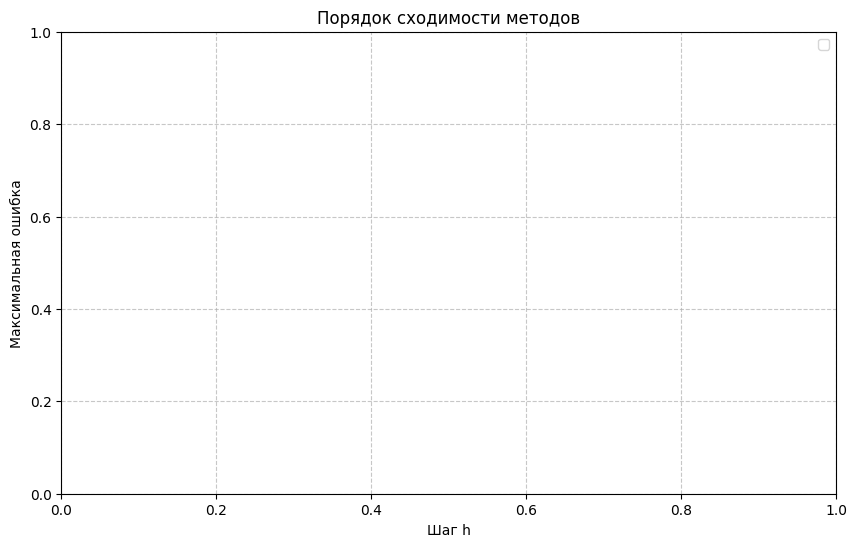

ITERATION 7 7
x0= 2.1 y0= 10.5


C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:7: RuntimeWarning: overflow encountered in scalar multiply
  dydt = y * (2 * a2 - 0.5 * y - 3.5 * (a2_reg**2) * x)
C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:6: RuntimeWarning: invalid value encountered in scalar multiply
  dxdt = x * (1 - 0.5 * x - (2/7) * (a2_reg**-2) * y)
C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:7: RuntimeWarning: overflow encountered in scalar power
  dydt = y * (2 * a2 - 0.5 * y - 3.5 * (a2_reg**2) * x)
C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:7: RuntimeWarning: invalid value encountered in scalar subtract
  dydt = y * (2 * a2 - 0.5 * y - 3.5 * (a2_reg**2) * x)
C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:8: RuntimeWarning: overflow encountered in scalar multiply
  da2dt = epsilon * (2 - 7 * a2 * x)


❌ rk4_solve: NaN или inf в решении (h=0.0001)
⚠️ RK4 при h=0.0001: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ pece4_solve: NaN или inf в решении (h=0.0001)
⚠️ PECE4 при h=0.0001: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ Gear4: расходимость на шаге 3, h=0.0001
❌ gear4_fixed_step: NaN или inf в решении (h=0.0001)
⚠️ Gear4_fixed при h=0.0001: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ rk4_solve: NaN или inf в решении (h=5e-05)
⚠️ RK4 при h=5e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ pece4_solve: NaN или inf в решении (h=5e-05)
⚠️ PECE4 при h=5e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ Gear4: расходимость на шаге 3, h=5e-05
❌ gear4_fixed_step: NaN или inf в решении (h=5e-05)
⚠️ Gear4_fixed при h=5e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ rk4_solve: NaN или inf в решении (h=2.5e-05)
⚠️ RK4 при h=2.5e-05: operands could not

C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3955799424.py:41: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend()


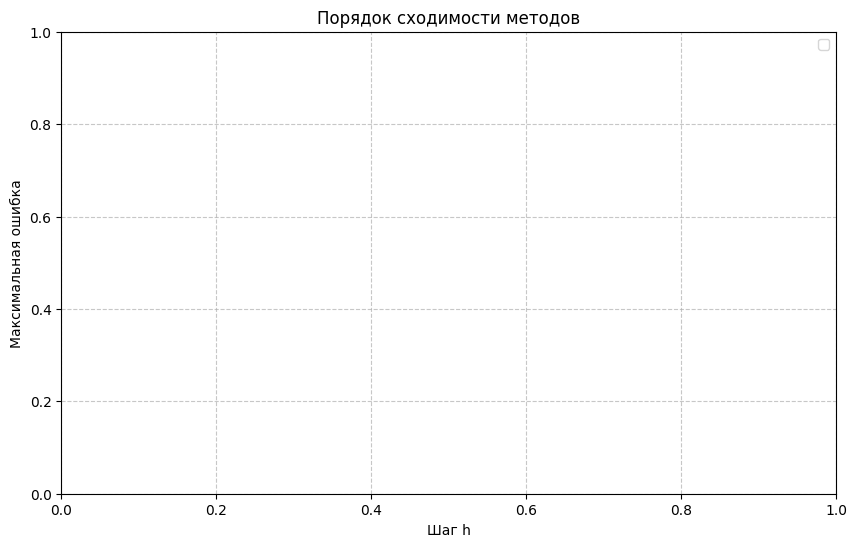

ITERATION 7 8
x0= 2.1 y0= 12.0
❌ rk4_solve: NaN или inf в решении (h=0.0001)
⚠️ RK4 при h=0.0001: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ pece4_solve: NaN или inf в решении (h=0.0001)
⚠️ PECE4 при h=0.0001: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ Gear4: расходимость на шаге 3, h=0.0001
❌ gear4_fixed_step: NaN или inf в решении (h=0.0001)
⚠️ Gear4_fixed при h=0.0001: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ rk4_solve: NaN или inf в решении (h=5e-05)
⚠️ RK4 при h=5e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ pece4_solve: NaN или inf в решении (h=5e-05)
⚠️ PECE4 при h=5e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ Gear4: расходимость на шаге 3, h=5e-05
❌ gear4_fixed_step: NaN или inf в решении (h=5e-05)
⚠️ Gear4_fixed при h=5e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ rk4_solve: NaN или inf в решении (h=2.5e-05)
⚠️ RK4 пр

C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:7: RuntimeWarning: overflow encountered in scalar multiply
  dydt = y * (2 * a2 - 0.5 * y - 3.5 * (a2_reg**2) * x)
C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:6: RuntimeWarning: invalid value encountered in scalar multiply
  dxdt = x * (1 - 0.5 * x - (2/7) * (a2_reg**-2) * y)
C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:7: RuntimeWarning: overflow encountered in scalar power
  dydt = y * (2 * a2 - 0.5 * y - 3.5 * (a2_reg**2) * x)
C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:7: RuntimeWarning: invalid value encountered in scalar subtract
  dydt = y * (2 * a2 - 0.5 * y - 3.5 * (a2_reg**2) * x)
C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:8: RuntimeWarning: overflow encountered in scalar multiply
  da2dt = epsilon * (2 - 7 * a2 * x)


❌ rk4_solve: NaN или inf в решении (h=1.25e-05)
⚠️ RK4 при h=1.25e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ pece4_solve: NaN или inf в решении (h=1.25e-05)
⚠️ PECE4 при h=1.25e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ Gear4: расходимость на шаге 3, h=1.25e-05
❌ gear4_fixed_step: NaN или inf в решении (h=1.25e-05)
⚠️ Gear4_fixed при h=1.25e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ rk4_solve: NaN или inf в решении (h=6.25e-06)
⚠️ RK4 при h=6.25e-06: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ pece4_solve: NaN или inf в решении (h=6.25e-06)
⚠️ PECE4 при h=6.25e-06: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ Gear4: расходимость на шаге 3, h=6.25e-06
❌ gear4_fixed_step: NaN или inf в решении (h=6.25e-06)
⚠️ Gear4_fixed при h=6.25e-06: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ rk4_solve: NaN или inf в решении (h=3.125e-06)
⚠️ 

C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3955799424.py:41: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend()


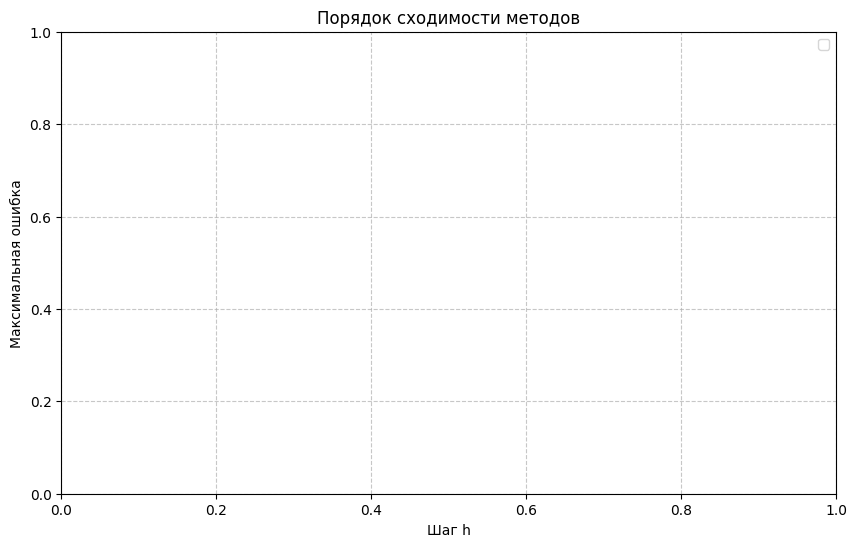

ITERATION 7 9
x0= 2.1 y0= 13.5
❌ rk4_solve: NaN или inf в решении (h=0.0001)
⚠️ RK4 при h=0.0001: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ pece4_solve: NaN или inf в решении (h=0.0001)
⚠️ PECE4 при h=0.0001: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ Gear4: расходимость на шаге 3, h=0.0001
❌ gear4_fixed_step: NaN или inf в решении (h=0.0001)
⚠️ Gear4_fixed при h=0.0001: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ rk4_solve: NaN или inf в решении (h=5e-05)
⚠️ RK4 при h=5e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ pece4_solve: NaN или inf в решении (h=5e-05)
⚠️ PECE4 при h=5e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ Gear4: расходимость на шаге 3, h=5e-05
❌ gear4_fixed_step: NaN или inf в решении (h=5e-05)
⚠️ Gear4_fixed при h=5e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ rk4_solve: NaN или inf в решении (h=2.5e-05)
⚠️ RK4 пр

C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:7: RuntimeWarning: overflow encountered in scalar multiply
  dydt = y * (2 * a2 - 0.5 * y - 3.5 * (a2_reg**2) * x)
C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:6: RuntimeWarning: invalid value encountered in scalar multiply
  dxdt = x * (1 - 0.5 * x - (2/7) * (a2_reg**-2) * y)
C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:7: RuntimeWarning: overflow encountered in scalar power
  dydt = y * (2 * a2 - 0.5 * y - 3.5 * (a2_reg**2) * x)
C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:7: RuntimeWarning: invalid value encountered in scalar subtract
  dydt = y * (2 * a2 - 0.5 * y - 3.5 * (a2_reg**2) * x)
C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:8: RuntimeWarning: overflow encountered in scalar multiply
  da2dt = epsilon * (2 - 7 * a2 * x)


❌ pece4_solve: NaN или inf в решении (h=2.5e-05)
⚠️ PECE4 при h=2.5e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ Gear4: расходимость на шаге 3, h=2.5e-05
❌ gear4_fixed_step: NaN или inf в решении (h=2.5e-05)
⚠️ Gear4_fixed при h=2.5e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ rk4_solve: NaN или inf в решении (h=1.25e-05)
⚠️ RK4 при h=1.25e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ pece4_solve: NaN или inf в решении (h=1.25e-05)
⚠️ PECE4 при h=1.25e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ Gear4: расходимость на шаге 3, h=1.25e-05
❌ gear4_fixed_step: NaN или inf в решении (h=1.25e-05)
⚠️ Gear4_fixed при h=1.25e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ rk4_solve: NaN или inf в решении (h=6.25e-06)
⚠️ RK4 при h=6.25e-06: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ pece4_solve: NaN или inf в решении (h=6.25e-06)
⚠️ PECE

C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3955799424.py:41: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend()


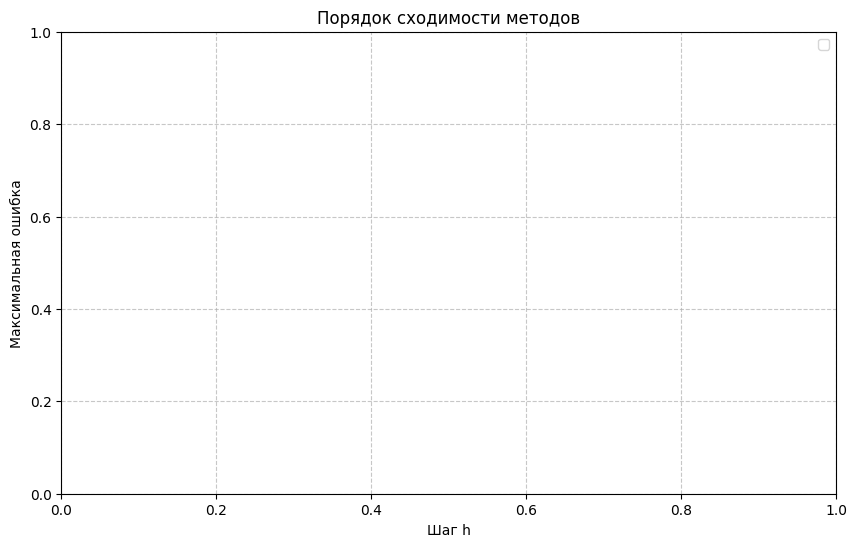

ITERATION 8 0
x0= 2.4 y0= 0.0
✅ rk4_solve: успех, 101 шагов (h=0.0001)
✅ pece4_solve: успех, 101 шагов (h=0.0001)
✅ gear4_fixed_step: успех, 101 шагов (h=0.0001)
✅ rk4_solve: успех, 201 шагов (h=5e-05)
✅ pece4_solve: успех, 201 шагов (h=5e-05)
✅ gear4_fixed_step: успех, 201 шагов (h=5e-05)
✅ rk4_solve: успех, 401 шагов (h=2.5e-05)
✅ pece4_solve: успех, 401 шагов (h=2.5e-05)
✅ gear4_fixed_step: успех, 401 шагов (h=2.5e-05)
✅ rk4_solve: успех, 801 шагов (h=1.25e-05)
✅ pece4_solve: успех, 801 шагов (h=1.25e-05)
✅ gear4_fixed_step: успех, 801 шагов (h=1.25e-05)
✅ rk4_solve: успех, 1601 шагов (h=6.25e-06)
✅ pece4_solve: успех, 1601 шагов (h=6.25e-06)
✅ gear4_fixed_step: успех, 1601 шагов (h=6.25e-06)
✅ rk4_solve: успех, 3201 шагов (h=3.125e-06)
✅ pece4_solve: успех, 3201 шагов (h=3.125e-06)
✅ gear4_fixed_step: успех, 3201 шагов (h=3.125e-06)
          h           RK4  p_RK4         PECE4  p_PECE4   Gear4_fixed  p_Gear4_fixed
0  0.000100  1.751496e-09    NaN  1.751496e-09      NaN  1.772062e

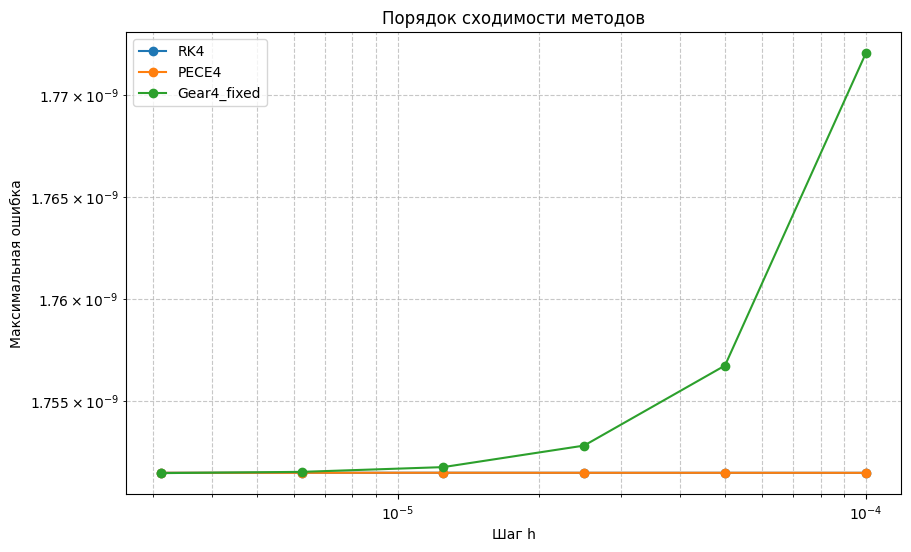

ITERATION 8 1
x0= 2.4 y0= 1.5
❌ rk4_solve: NaN или inf в решении (h=0.0001)
⚠️ RK4 при h=0.0001: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ pece4_solve: NaN или inf в решении (h=0.0001)
⚠️ PECE4 при h=0.0001: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ Gear4: расходимость на шаге 3, h=0.0001
❌ gear4_fixed_step: NaN или inf в решении (h=0.0001)
⚠️ Gear4_fixed при h=0.0001: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ rk4_solve: NaN или inf в решении (h=5e-05)
⚠️ RK4 при h=5e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ pece4_solve: NaN или inf в решении (h=5e-05)
⚠️ PECE4 при h=5e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ Gear4: расходимость на шаге 3, h=5e-05
❌ gear4_fixed_step: NaN или inf в решении (h=5e-05)
⚠️ Gear4_fixed при h=5e-05: operands could not be broadcast together with shapes (1,0) (1,3) 


C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:7: RuntimeWarning: overflow encountered in scalar multiply
  dydt = y * (2 * a2 - 0.5 * y - 3.5 * (a2_reg**2) * x)
C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:6: RuntimeWarning: invalid value encountered in scalar multiply
  dxdt = x * (1 - 0.5 * x - (2/7) * (a2_reg**-2) * y)
C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:7: RuntimeWarning: overflow encountered in scalar power
  dydt = y * (2 * a2 - 0.5 * y - 3.5 * (a2_reg**2) * x)
C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:7: RuntimeWarning: invalid value encountered in scalar subtract
  dydt = y * (2 * a2 - 0.5 * y - 3.5 * (a2_reg**2) * x)
C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:8: RuntimeWarning: overflow encountered in scalar multiply
  da2dt = epsilon * (2 - 7 * a2 * x)


❌ rk4_solve: NaN или inf в решении (h=2.5e-05)
⚠️ RK4 при h=2.5e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ pece4_solve: NaN или inf в решении (h=2.5e-05)
⚠️ PECE4 при h=2.5e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ Gear4: расходимость на шаге 3, h=2.5e-05
❌ gear4_fixed_step: NaN или inf в решении (h=2.5e-05)
⚠️ Gear4_fixed при h=2.5e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ rk4_solve: NaN или inf в решении (h=1.25e-05)
⚠️ RK4 при h=1.25e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ pece4_solve: NaN или inf в решении (h=1.25e-05)
⚠️ PECE4 при h=1.25e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ Gear4: расходимость на шаге 3, h=1.25e-05
❌ gear4_fixed_step: NaN или inf в решении (h=1.25e-05)
⚠️ Gear4_fixed при h=1.25e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ rk4_solve: NaN или inf в решении (h=6.25e-06)
⚠️ RK4 при 

C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3955799424.py:41: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend()


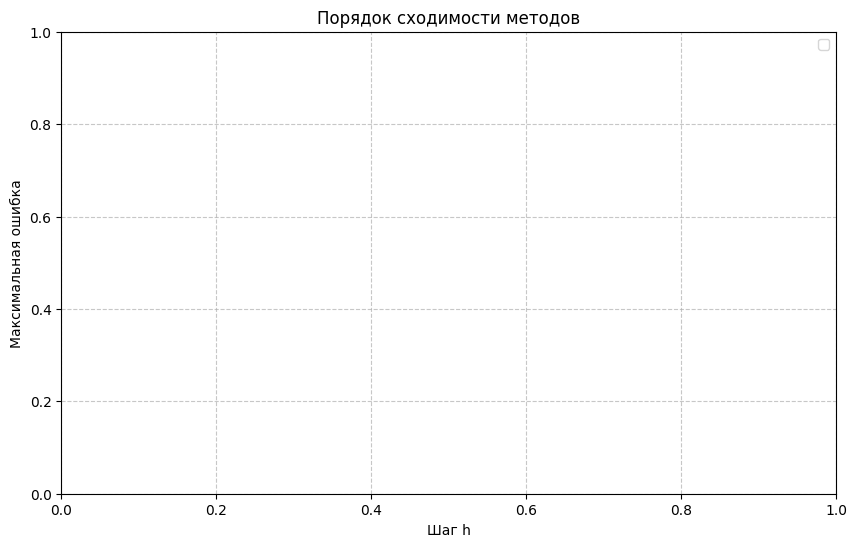

ITERATION 8 2
x0= 2.4 y0= 3.0


C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:7: RuntimeWarning: overflow encountered in scalar multiply
  dydt = y * (2 * a2 - 0.5 * y - 3.5 * (a2_reg**2) * x)
C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:6: RuntimeWarning: invalid value encountered in scalar multiply
  dxdt = x * (1 - 0.5 * x - (2/7) * (a2_reg**-2) * y)
C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:7: RuntimeWarning: overflow encountered in scalar power
  dydt = y * (2 * a2 - 0.5 * y - 3.5 * (a2_reg**2) * x)
C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:7: RuntimeWarning: invalid value encountered in scalar subtract
  dydt = y * (2 * a2 - 0.5 * y - 3.5 * (a2_reg**2) * x)
C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:8: RuntimeWarning: overflow encountered in scalar multiply
  da2dt = epsilon * (2 - 7 * a2 * x)
C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\1111329400.py:11: RuntimeWarning: invalid value encountered in add
  

❌ rk4_solve: NaN или inf в решении (h=0.0001)
⚠️ RK4 при h=0.0001: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ pece4_solve: NaN или inf в решении (h=0.0001)
⚠️ PECE4 при h=0.0001: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ Gear4: расходимость на шаге 3, h=0.0001
❌ gear4_fixed_step: NaN или inf в решении (h=0.0001)
⚠️ Gear4_fixed при h=0.0001: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ rk4_solve: NaN или inf в решении (h=5e-05)
⚠️ RK4 при h=5e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ pece4_solve: NaN или inf в решении (h=5e-05)
⚠️ PECE4 при h=5e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ Gear4: расходимость на шаге 3, h=5e-05
❌ gear4_fixed_step: NaN или inf в решении (h=5e-05)
⚠️ Gear4_fixed при h=5e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ rk4_solve: NaN или inf в решении (h=2.5e-05)
⚠️ RK4 при h=2.5e-05: operands could not

C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3955799424.py:41: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend()


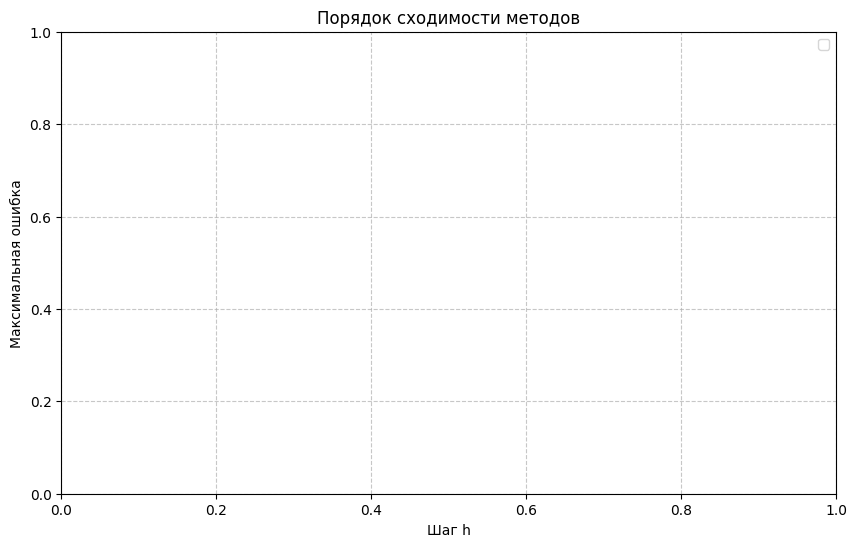

ITERATION 8 3
x0= 2.4 y0= 4.5
❌ rk4_solve: NaN или inf в решении (h=0.0001)
⚠️ RK4 при h=0.0001: operands could not be broadcast together with shapes (1,0) (1,3) 


C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:7: RuntimeWarning: overflow encountered in scalar multiply
  dydt = y * (2 * a2 - 0.5 * y - 3.5 * (a2_reg**2) * x)
C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:6: RuntimeWarning: invalid value encountered in scalar multiply
  dxdt = x * (1 - 0.5 * x - (2/7) * (a2_reg**-2) * y)
C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:7: RuntimeWarning: overflow encountered in scalar power
  dydt = y * (2 * a2 - 0.5 * y - 3.5 * (a2_reg**2) * x)
C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:7: RuntimeWarning: invalid value encountered in scalar subtract
  dydt = y * (2 * a2 - 0.5 * y - 3.5 * (a2_reg**2) * x)
C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:8: RuntimeWarning: overflow encountered in scalar multiply
  da2dt = epsilon * (2 - 7 * a2 * x)


❌ pece4_solve: NaN или inf в решении (h=0.0001)
⚠️ PECE4 при h=0.0001: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ Gear4: расходимость на шаге 3, h=0.0001
❌ gear4_fixed_step: NaN или inf в решении (h=0.0001)
⚠️ Gear4_fixed при h=0.0001: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ rk4_solve: NaN или inf в решении (h=5e-05)
⚠️ RK4 при h=5e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ pece4_solve: NaN или inf в решении (h=5e-05)
⚠️ PECE4 при h=5e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ Gear4: расходимость на шаге 3, h=5e-05
❌ gear4_fixed_step: NaN или inf в решении (h=5e-05)
⚠️ Gear4_fixed при h=5e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ rk4_solve: NaN или inf в решении (h=2.5e-05)
⚠️ RK4 при h=2.5e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ pece4_solve: NaN или inf в решении (h=2.5e-05)
⚠️ PECE4 при h=2.5e-05: operands cou

C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3955799424.py:41: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend()


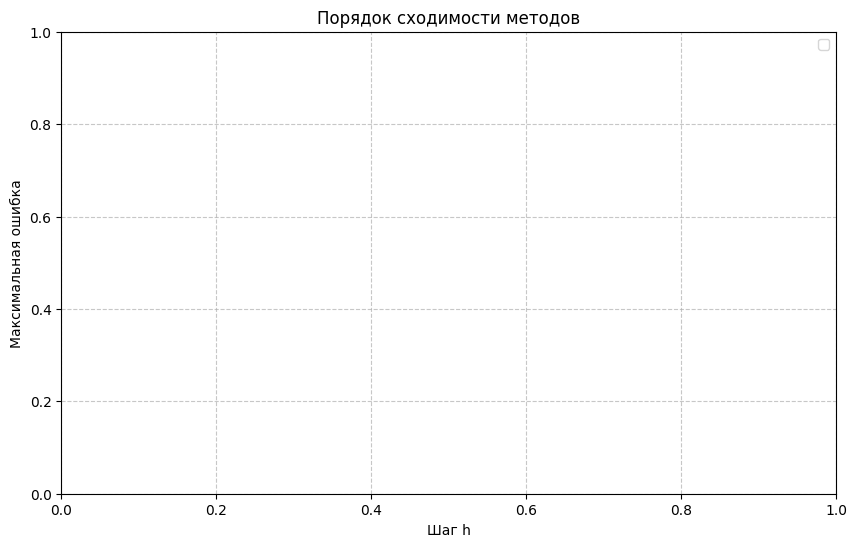

ITERATION 8 4
x0= 2.4 y0= 6.0
❌ rk4_solve: NaN или inf в решении (h=0.0001)
⚠️ RK4 при h=0.0001: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ pece4_solve: NaN или inf в решении (h=0.0001)
⚠️ PECE4 при h=0.0001: operands could not be broadcast together with shapes (1,0) (1,3) 


C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:7: RuntimeWarning: overflow encountered in scalar multiply
  dydt = y * (2 * a2 - 0.5 * y - 3.5 * (a2_reg**2) * x)
C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:6: RuntimeWarning: invalid value encountered in scalar multiply
  dxdt = x * (1 - 0.5 * x - (2/7) * (a2_reg**-2) * y)
C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:7: RuntimeWarning: overflow encountered in scalar power
  dydt = y * (2 * a2 - 0.5 * y - 3.5 * (a2_reg**2) * x)
C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:7: RuntimeWarning: invalid value encountered in scalar subtract
  dydt = y * (2 * a2 - 0.5 * y - 3.5 * (a2_reg**2) * x)
C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:8: RuntimeWarning: overflow encountered in scalar multiply
  da2dt = epsilon * (2 - 7 * a2 * x)
C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\1111329400.py:11: RuntimeWarning: invalid value encountered in add
  

❌ Gear4: расходимость на шаге 3, h=0.0001
❌ gear4_fixed_step: NaN или inf в решении (h=0.0001)
⚠️ Gear4_fixed при h=0.0001: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ rk4_solve: NaN или inf в решении (h=5e-05)
⚠️ RK4 при h=5e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ pece4_solve: NaN или inf в решении (h=5e-05)
⚠️ PECE4 при h=5e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ Gear4: расходимость на шаге 3, h=5e-05
❌ gear4_fixed_step: NaN или inf в решении (h=5e-05)
⚠️ Gear4_fixed при h=5e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ rk4_solve: NaN или inf в решении (h=2.5e-05)
⚠️ RK4 при h=2.5e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ pece4_solve: NaN или inf в решении (h=2.5e-05)
⚠️ PECE4 при h=2.5e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ Gear4: расходимость на шаге 3, h=2.5e-05
❌ gear4_fixed_step: NaN или inf в решени

C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3955799424.py:41: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend()


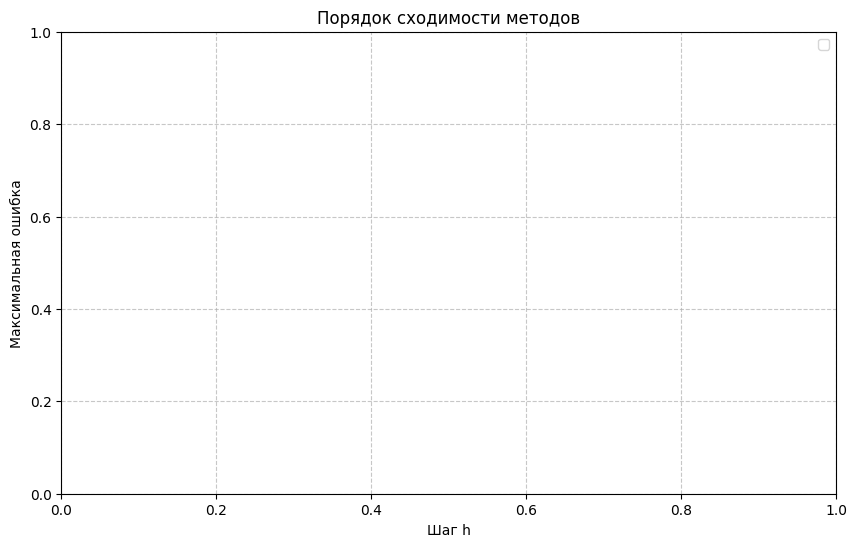

ITERATION 8 5
x0= 2.4 y0= 7.5
❌ rk4_solve: NaN или inf в решении (h=0.0001)
⚠️ RK4 при h=0.0001: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ pece4_solve: NaN или inf в решении (h=0.0001)
⚠️ PECE4 при h=0.0001: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ Gear4: расходимость на шаге 3, h=0.0001
❌ gear4_fixed_step: NaN или inf в решении (h=0.0001)
⚠️ Gear4_fixed при h=0.0001: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ rk4_solve: NaN или inf в решении (h=5e-05)
⚠️ RK4 при h=5e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ pece4_solve: NaN или inf в решении (h=5e-05)
⚠️ PECE4 при h=5e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ Gear4: расходимость на шаге 3, h=5e-05
❌ gear4_fixed_step: NaN или inf в решении (h=5e-05)
⚠️ Gear4_fixed при h=5e-05: operands could not be broadcast together with shapes (1,0) (1,3) 


C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:7: RuntimeWarning: overflow encountered in scalar multiply
  dydt = y * (2 * a2 - 0.5 * y - 3.5 * (a2_reg**2) * x)
C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:6: RuntimeWarning: invalid value encountered in scalar multiply
  dxdt = x * (1 - 0.5 * x - (2/7) * (a2_reg**-2) * y)
C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:7: RuntimeWarning: overflow encountered in scalar power
  dydt = y * (2 * a2 - 0.5 * y - 3.5 * (a2_reg**2) * x)
C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:7: RuntimeWarning: invalid value encountered in scalar subtract
  dydt = y * (2 * a2 - 0.5 * y - 3.5 * (a2_reg**2) * x)
C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:8: RuntimeWarning: overflow encountered in scalar multiply
  da2dt = epsilon * (2 - 7 * a2 * x)
C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\1111329400.py:11: RuntimeWarning: invalid value encountered in add
  

❌ rk4_solve: NaN или inf в решении (h=2.5e-05)
⚠️ RK4 при h=2.5e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ pece4_solve: NaN или inf в решении (h=2.5e-05)
⚠️ PECE4 при h=2.5e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ Gear4: расходимость на шаге 3, h=2.5e-05
❌ gear4_fixed_step: NaN или inf в решении (h=2.5e-05)
⚠️ Gear4_fixed при h=2.5e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ rk4_solve: NaN или inf в решении (h=1.25e-05)
⚠️ RK4 при h=1.25e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ pece4_solve: NaN или inf в решении (h=1.25e-05)
⚠️ PECE4 при h=1.25e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ Gear4: расходимость на шаге 3, h=1.25e-05
❌ gear4_fixed_step: NaN или inf в решении (h=1.25e-05)
⚠️ Gear4_fixed при h=1.25e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ rk4_solve: NaN или inf в решении (h=6.25e-06)
⚠️ RK4 при 

C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3955799424.py:41: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend()


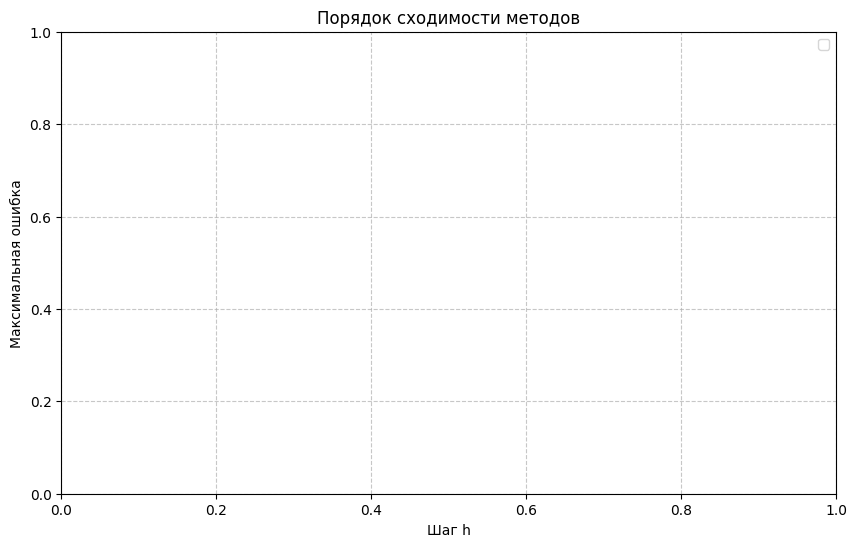

ITERATION 8 6
x0= 2.4 y0= 9.0
❌ rk4_solve: NaN или inf в решении (h=0.0001)
⚠️ RK4 при h=0.0001: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ pece4_solve: NaN или inf в решении (h=0.0001)
⚠️ PECE4 при h=0.0001: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ Gear4: расходимость на шаге 3, h=0.0001
❌ gear4_fixed_step: NaN или inf в решении (h=0.0001)
⚠️ Gear4_fixed при h=0.0001: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ rk4_solve: NaN или inf в решении (h=5e-05)
⚠️ RK4 при h=5e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ pece4_solve: NaN или inf в решении (h=5e-05)
⚠️ PECE4 при h=5e-05: operands could not be broadcast together with shapes (1,0) (1,3) 


C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:7: RuntimeWarning: overflow encountered in scalar multiply
  dydt = y * (2 * a2 - 0.5 * y - 3.5 * (a2_reg**2) * x)
C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:6: RuntimeWarning: invalid value encountered in scalar multiply
  dxdt = x * (1 - 0.5 * x - (2/7) * (a2_reg**-2) * y)
C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:7: RuntimeWarning: overflow encountered in scalar power
  dydt = y * (2 * a2 - 0.5 * y - 3.5 * (a2_reg**2) * x)
C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:7: RuntimeWarning: invalid value encountered in scalar subtract
  dydt = y * (2 * a2 - 0.5 * y - 3.5 * (a2_reg**2) * x)
C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:8: RuntimeWarning: overflow encountered in scalar multiply
  da2dt = epsilon * (2 - 7 * a2 * x)


❌ Gear4: расходимость на шаге 3, h=5e-05
❌ gear4_fixed_step: NaN или inf в решении (h=5e-05)
⚠️ Gear4_fixed при h=5e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ rk4_solve: NaN или inf в решении (h=2.5e-05)
⚠️ RK4 при h=2.5e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ pece4_solve: NaN или inf в решении (h=2.5e-05)
⚠️ PECE4 при h=2.5e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ Gear4: расходимость на шаге 3, h=2.5e-05
❌ gear4_fixed_step: NaN или inf в решении (h=2.5e-05)
⚠️ Gear4_fixed при h=2.5e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ rk4_solve: NaN или inf в решении (h=1.25e-05)
⚠️ RK4 при h=1.25e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ pece4_solve: NaN или inf в решении (h=1.25e-05)
⚠️ PECE4 при h=1.25e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ Gear4: расходимость на шаге 3, h=1.25e-05
❌ gear4_fixed_step: NaN 

C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3955799424.py:41: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend()


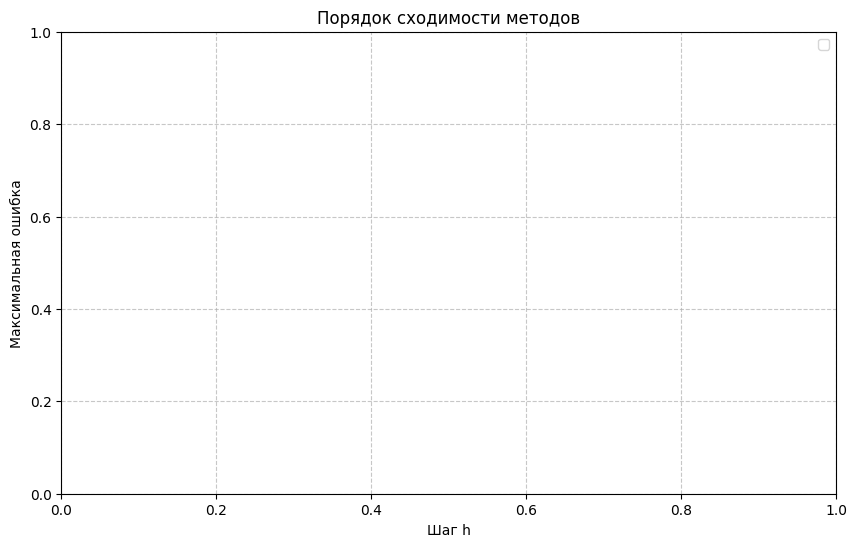

ITERATION 8 7
x0= 2.4 y0= 10.5


C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:7: RuntimeWarning: overflow encountered in scalar multiply
  dydt = y * (2 * a2 - 0.5 * y - 3.5 * (a2_reg**2) * x)
C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:6: RuntimeWarning: invalid value encountered in scalar multiply
  dxdt = x * (1 - 0.5 * x - (2/7) * (a2_reg**-2) * y)
C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:7: RuntimeWarning: overflow encountered in scalar power
  dydt = y * (2 * a2 - 0.5 * y - 3.5 * (a2_reg**2) * x)
C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:7: RuntimeWarning: invalid value encountered in scalar subtract
  dydt = y * (2 * a2 - 0.5 * y - 3.5 * (a2_reg**2) * x)
C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:8: RuntimeWarning: overflow encountered in scalar multiply
  da2dt = epsilon * (2 - 7 * a2 * x)


❌ rk4_solve: NaN или inf в решении (h=0.0001)
⚠️ RK4 при h=0.0001: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ pece4_solve: NaN или inf в решении (h=0.0001)
⚠️ PECE4 при h=0.0001: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ Gear4: расходимость на шаге 3, h=0.0001
❌ gear4_fixed_step: NaN или inf в решении (h=0.0001)
⚠️ Gear4_fixed при h=0.0001: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ rk4_solve: NaN или inf в решении (h=5e-05)
⚠️ RK4 при h=5e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ pece4_solve: NaN или inf в решении (h=5e-05)
⚠️ PECE4 при h=5e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ Gear4: расходимость на шаге 3, h=5e-05
❌ gear4_fixed_step: NaN или inf в решении (h=5e-05)
⚠️ Gear4_fixed при h=5e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ rk4_solve: NaN или inf в решении (h=2.5e-05)
⚠️ RK4 при h=2.5e-05: operands could not

C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3955799424.py:41: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend()


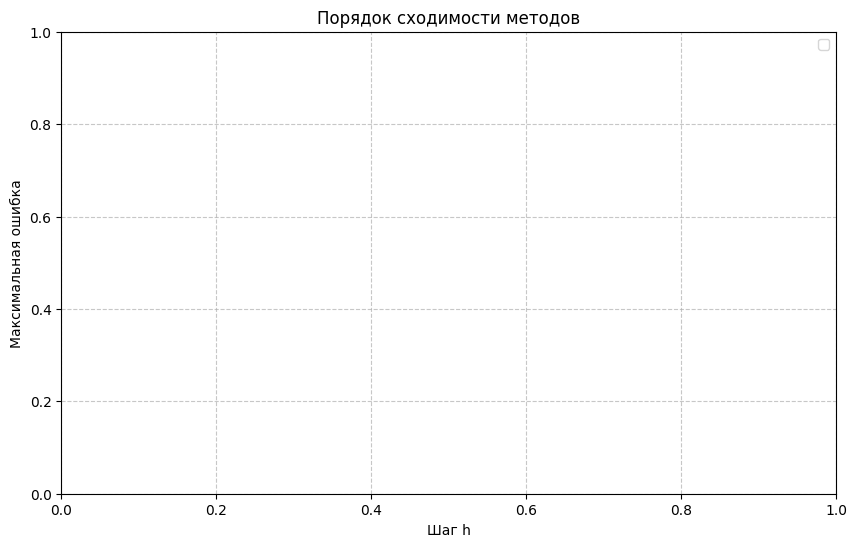

ITERATION 8 8
x0= 2.4 y0= 12.0
❌ rk4_solve: NaN или inf в решении (h=0.0001)
⚠️ RK4 при h=0.0001: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ pece4_solve: NaN или inf в решении (h=0.0001)
⚠️ PECE4 при h=0.0001: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ Gear4: расходимость на шаге 3, h=0.0001
❌ gear4_fixed_step: NaN или inf в решении (h=0.0001)
⚠️ Gear4_fixed при h=0.0001: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ rk4_solve: NaN или inf в решении (h=5e-05)
⚠️ RK4 при h=5e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ pece4_solve: NaN или inf в решении (h=5e-05)
⚠️ PECE4 при h=5e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ Gear4: расходимость на шаге 3, h=5e-05
❌ gear4_fixed_step: NaN или inf в решении (h=5e-05)
⚠️ Gear4_fixed при h=5e-05: operands could not be broadcast together with shapes (1,0) (1,3) 


C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:7: RuntimeWarning: overflow encountered in scalar multiply
  dydt = y * (2 * a2 - 0.5 * y - 3.5 * (a2_reg**2) * x)
C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:6: RuntimeWarning: invalid value encountered in scalar multiply
  dxdt = x * (1 - 0.5 * x - (2/7) * (a2_reg**-2) * y)
C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:7: RuntimeWarning: overflow encountered in scalar power
  dydt = y * (2 * a2 - 0.5 * y - 3.5 * (a2_reg**2) * x)
C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:7: RuntimeWarning: invalid value encountered in scalar subtract
  dydt = y * (2 * a2 - 0.5 * y - 3.5 * (a2_reg**2) * x)
C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:8: RuntimeWarning: overflow encountered in scalar multiply
  da2dt = epsilon * (2 - 7 * a2 * x)


❌ rk4_solve: NaN или inf в решении (h=2.5e-05)
⚠️ RK4 при h=2.5e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ pece4_solve: NaN или inf в решении (h=2.5e-05)
⚠️ PECE4 при h=2.5e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ Gear4: расходимость на шаге 3, h=2.5e-05
❌ gear4_fixed_step: NaN или inf в решении (h=2.5e-05)
⚠️ Gear4_fixed при h=2.5e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ rk4_solve: NaN или inf в решении (h=1.25e-05)
⚠️ RK4 при h=1.25e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ pece4_solve: NaN или inf в решении (h=1.25e-05)
⚠️ PECE4 при h=1.25e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ Gear4: расходимость на шаге 3, h=1.25e-05
❌ gear4_fixed_step: NaN или inf в решении (h=1.25e-05)
⚠️ Gear4_fixed при h=1.25e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ rk4_solve: NaN или inf в решении (h=6.25e-06)
⚠️ RK4 при 

C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3955799424.py:41: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend()


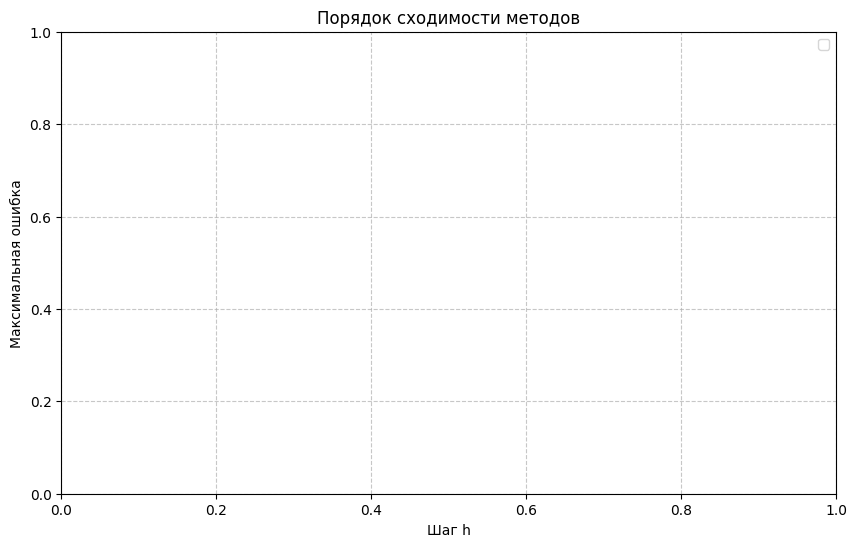

ITERATION 8 9
x0= 2.4 y0= 13.5
❌ rk4_solve: NaN или inf в решении (h=0.0001)
⚠️ RK4 при h=0.0001: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ pece4_solve: NaN или inf в решении (h=0.0001)
⚠️ PECE4 при h=0.0001: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ Gear4: расходимость на шаге 3, h=0.0001
❌ gear4_fixed_step: NaN или inf в решении (h=0.0001)
⚠️ Gear4_fixed при h=0.0001: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ rk4_solve: NaN или inf в решении (h=5e-05)
⚠️ RK4 при h=5e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ pece4_solve: NaN или inf в решении (h=5e-05)
⚠️ PECE4 при h=5e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ Gear4: расходимость на шаге 3, h=5e-05
❌ gear4_fixed_step: NaN или inf в решении (h=5e-05)
⚠️ Gear4_fixed при h=5e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ rk4_solve: NaN или inf в решении (h=2.5e-05)
⚠️ RK4 пр

C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:7: RuntimeWarning: overflow encountered in scalar multiply
  dydt = y * (2 * a2 - 0.5 * y - 3.5 * (a2_reg**2) * x)
C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:7: RuntimeWarning: invalid value encountered in scalar subtract
  dydt = y * (2 * a2 - 0.5 * y - 3.5 * (a2_reg**2) * x)
C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:7: RuntimeWarning: overflow encountered in scalar power
  dydt = y * (2 * a2 - 0.5 * y - 3.5 * (a2_reg**2) * x)
C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:6: RuntimeWarning: invalid value encountered in scalar multiply
  dxdt = x * (1 - 0.5 * x - (2/7) * (a2_reg**-2) * y)
C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:8: RuntimeWarning: overflow encountered in scalar multiply
  da2dt = epsilon * (2 - 7 * a2 * x)
C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\1111329400.py:11: RuntimeWarning: invalid value encountered in add
  

❌ pece4_solve: NaN или inf в решении (h=2.5e-05)
⚠️ PECE4 при h=2.5e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ Gear4: расходимость на шаге 3, h=2.5e-05
❌ gear4_fixed_step: NaN или inf в решении (h=2.5e-05)
⚠️ Gear4_fixed при h=2.5e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ rk4_solve: NaN или inf в решении (h=1.25e-05)
⚠️ RK4 при h=1.25e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ pece4_solve: NaN или inf в решении (h=1.25e-05)
⚠️ PECE4 при h=1.25e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ Gear4: расходимость на шаге 3, h=1.25e-05
❌ gear4_fixed_step: NaN или inf в решении (h=1.25e-05)
⚠️ Gear4_fixed при h=1.25e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ rk4_solve: NaN или inf в решении (h=6.25e-06)
⚠️ RK4 при h=6.25e-06: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ pece4_solve: NaN или inf в решении (h=6.25e-06)
⚠️ PECE

C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3955799424.py:41: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend()


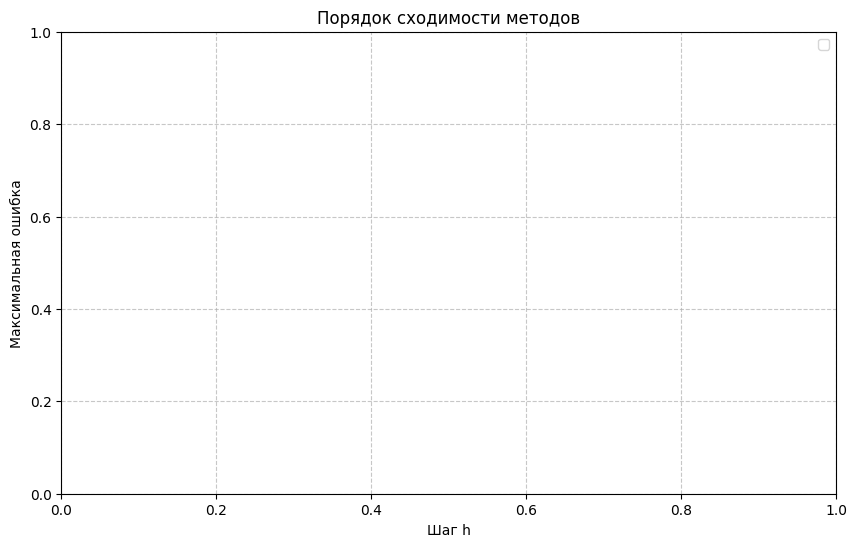

ITERATION 9 0
x0= 2.6999999999999997 y0= 0.0
✅ rk4_solve: успех, 101 шагов (h=0.0001)
✅ pece4_solve: успех, 101 шагов (h=0.0001)
✅ gear4_fixed_step: успех, 101 шагов (h=0.0001)
✅ rk4_solve: успех, 201 шагов (h=5e-05)
✅ pece4_solve: успех, 201 шагов (h=5e-05)
✅ gear4_fixed_step: успех, 201 шагов (h=5e-05)
✅ rk4_solve: успех, 401 шагов (h=2.5e-05)
✅ pece4_solve: успех, 401 шагов (h=2.5e-05)
✅ gear4_fixed_step: успех, 401 шагов (h=2.5e-05)
✅ rk4_solve: успех, 801 шагов (h=1.25e-05)
✅ pece4_solve: успех, 801 шагов (h=1.25e-05)
✅ gear4_fixed_step: успех, 801 шагов (h=1.25e-05)
✅ rk4_solve: успех, 1601 шагов (h=6.25e-06)
✅ pece4_solve: успех, 1601 шагов (h=6.25e-06)
✅ gear4_fixed_step: успех, 1601 шагов (h=6.25e-06)
✅ rk4_solve: успех, 3201 шагов (h=3.125e-06)
✅ pece4_solve: успех, 3201 шагов (h=3.125e-06)
✅ gear4_fixed_step: успех, 3201 шагов (h=3.125e-06)
          h           RK4  p_RK4         PECE4  p_PECE4   Gear4_fixed  p_Gear4_fixed
0  0.000100  1.562257e-09    NaN  1.562257e-09     

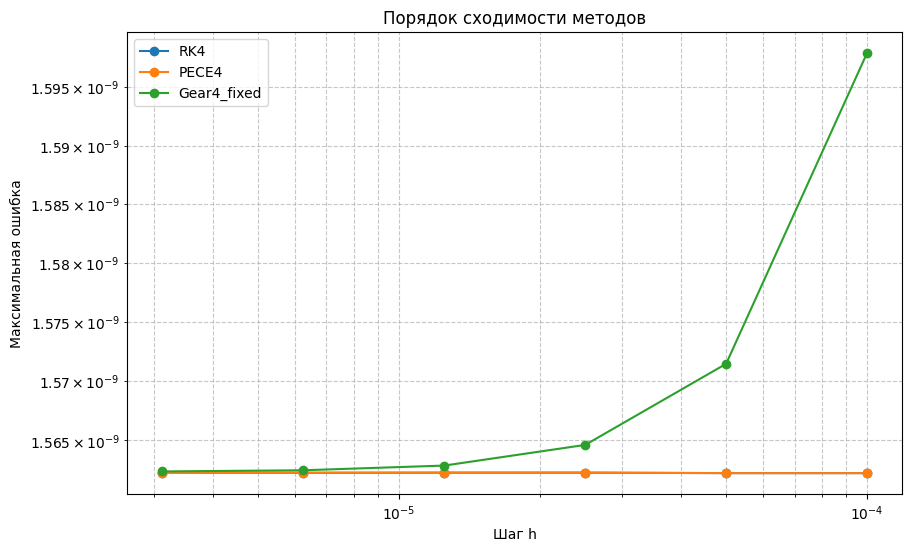

ITERATION 9 1
x0= 2.6999999999999997 y0= 1.5
❌ rk4_solve: NaN или inf в решении (h=0.0001)
⚠️ RK4 при h=0.0001: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ pece4_solve: NaN или inf в решении (h=0.0001)
⚠️ PECE4 при h=0.0001: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ Gear4: расходимость на шаге 3, h=0.0001
❌ gear4_fixed_step: NaN или inf в решении (h=0.0001)
⚠️ Gear4_fixed при h=0.0001: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ rk4_solve: NaN или inf в решении (h=5e-05)
⚠️ RK4 при h=5e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ pece4_solve: NaN или inf в решении (h=5e-05)
⚠️ PECE4 при h=5e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ Gear4: расходимость на шаге 3, h=5e-05
❌ gear4_fixed_step: NaN или inf в решении (h=5e-05)
⚠️ Gear4_fixed при h=5e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ rk4_solve: NaN или inf в решении (h=2.5e

C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:7: RuntimeWarning: overflow encountered in scalar multiply
  dydt = y * (2 * a2 - 0.5 * y - 3.5 * (a2_reg**2) * x)
C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:6: RuntimeWarning: invalid value encountered in scalar multiply
  dxdt = x * (1 - 0.5 * x - (2/7) * (a2_reg**-2) * y)
C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:7: RuntimeWarning: overflow encountered in scalar power
  dydt = y * (2 * a2 - 0.5 * y - 3.5 * (a2_reg**2) * x)
C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:7: RuntimeWarning: invalid value encountered in scalar subtract
  dydt = y * (2 * a2 - 0.5 * y - 3.5 * (a2_reg**2) * x)
C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:8: RuntimeWarning: overflow encountered in scalar multiply
  da2dt = epsilon * (2 - 7 * a2 * x)


❌ pece4_solve: NaN или inf в решении (h=2.5e-05)
⚠️ PECE4 при h=2.5e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ Gear4: расходимость на шаге 3, h=2.5e-05
❌ gear4_fixed_step: NaN или inf в решении (h=2.5e-05)
⚠️ Gear4_fixed при h=2.5e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ rk4_solve: NaN или inf в решении (h=1.25e-05)
⚠️ RK4 при h=1.25e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ pece4_solve: NaN или inf в решении (h=1.25e-05)
⚠️ PECE4 при h=1.25e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ Gear4: расходимость на шаге 3, h=1.25e-05
❌ gear4_fixed_step: NaN или inf в решении (h=1.25e-05)
⚠️ Gear4_fixed при h=1.25e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ rk4_solve: NaN или inf в решении (h=6.25e-06)
⚠️ RK4 при h=6.25e-06: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ pece4_solve: NaN или inf в решении (h=6.25e-06)
⚠️ PECE

C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3955799424.py:41: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend()


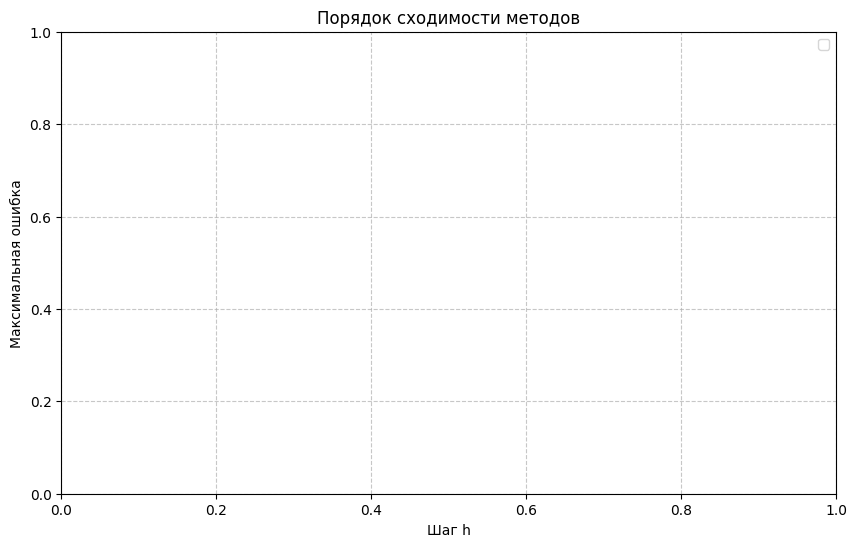

ITERATION 9 2
x0= 2.6999999999999997 y0= 3.0
❌ rk4_solve: NaN или inf в решении (h=0.0001)
⚠️ RK4 при h=0.0001: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ pece4_solve: NaN или inf в решении (h=0.0001)
⚠️ PECE4 при h=0.0001: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ Gear4: расходимость на шаге 3, h=0.0001
❌ gear4_fixed_step: NaN или inf в решении (h=0.0001)
⚠️ Gear4_fixed при h=0.0001: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ rk4_solve: NaN или inf в решении (h=5e-05)
⚠️ RK4 при h=5e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ pece4_solve: NaN или inf в решении (h=5e-05)
⚠️ PECE4 при h=5e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ Gear4: расходимость на шаге 3, h=5e-05
❌ gear4_fixed_step: NaN или inf в решении (h=5e-05)
⚠️ Gear4_fixed при h=5e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ rk4_solve: NaN или inf в решении (h=2.5e

C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:7: RuntimeWarning: overflow encountered in scalar multiply
  dydt = y * (2 * a2 - 0.5 * y - 3.5 * (a2_reg**2) * x)
C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:6: RuntimeWarning: invalid value encountered in scalar multiply
  dxdt = x * (1 - 0.5 * x - (2/7) * (a2_reg**-2) * y)
C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:7: RuntimeWarning: overflow encountered in scalar power
  dydt = y * (2 * a2 - 0.5 * y - 3.5 * (a2_reg**2) * x)
C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:7: RuntimeWarning: invalid value encountered in scalar subtract
  dydt = y * (2 * a2 - 0.5 * y - 3.5 * (a2_reg**2) * x)
C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:8: RuntimeWarning: overflow encountered in scalar multiply
  da2dt = epsilon * (2 - 7 * a2 * x)
C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\1111329400.py:11: RuntimeWarning: invalid value encountered in add
  

⚠️ RK4 при h=2.5e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ pece4_solve: NaN или inf в решении (h=2.5e-05)
⚠️ PECE4 при h=2.5e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ Gear4: расходимость на шаге 3, h=2.5e-05
❌ gear4_fixed_step: NaN или inf в решении (h=2.5e-05)
⚠️ Gear4_fixed при h=2.5e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ rk4_solve: NaN или inf в решении (h=1.25e-05)
⚠️ RK4 при h=1.25e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ pece4_solve: NaN или inf в решении (h=1.25e-05)
⚠️ PECE4 при h=1.25e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ Gear4: расходимость на шаге 3, h=1.25e-05
❌ gear4_fixed_step: NaN или inf в решении (h=1.25e-05)
⚠️ Gear4_fixed при h=1.25e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ rk4_solve: NaN или inf в решении (h=6.25e-06)
⚠️ RK4 при h=6.25e-06: operands could not be broadcast tog

C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3955799424.py:41: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend()


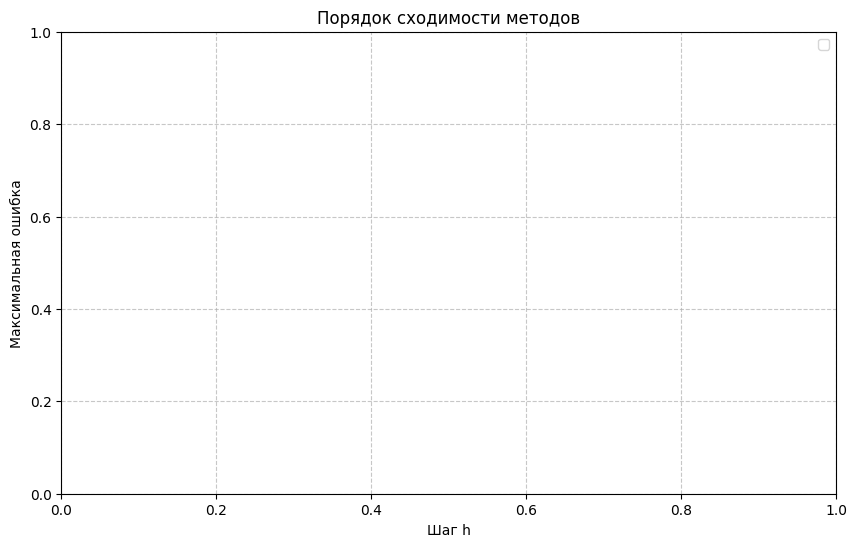

ITERATION 9 3
x0= 2.6999999999999997 y0= 4.5


C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:7: RuntimeWarning: overflow encountered in scalar multiply
  dydt = y * (2 * a2 - 0.5 * y - 3.5 * (a2_reg**2) * x)
C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:6: RuntimeWarning: invalid value encountered in scalar multiply
  dxdt = x * (1 - 0.5 * x - (2/7) * (a2_reg**-2) * y)
C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:7: RuntimeWarning: overflow encountered in scalar power
  dydt = y * (2 * a2 - 0.5 * y - 3.5 * (a2_reg**2) * x)
C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:7: RuntimeWarning: invalid value encountered in scalar subtract
  dydt = y * (2 * a2 - 0.5 * y - 3.5 * (a2_reg**2) * x)
C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:8: RuntimeWarning: overflow encountered in scalar multiply
  da2dt = epsilon * (2 - 7 * a2 * x)


❌ rk4_solve: NaN или inf в решении (h=0.0001)
⚠️ RK4 при h=0.0001: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ pece4_solve: NaN или inf в решении (h=0.0001)
⚠️ PECE4 при h=0.0001: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ Gear4: расходимость на шаге 3, h=0.0001
❌ gear4_fixed_step: NaN или inf в решении (h=0.0001)
⚠️ Gear4_fixed при h=0.0001: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ rk4_solve: NaN или inf в решении (h=5e-05)
⚠️ RK4 при h=5e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ pece4_solve: NaN или inf в решении (h=5e-05)
⚠️ PECE4 при h=5e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ Gear4: расходимость на шаге 3, h=5e-05
❌ gear4_fixed_step: NaN или inf в решении (h=5e-05)
⚠️ Gear4_fixed при h=5e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ rk4_solve: NaN или inf в решении (h=2.5e-05)
⚠️ RK4 при h=2.5e-05: operands could not

C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3955799424.py:41: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend()


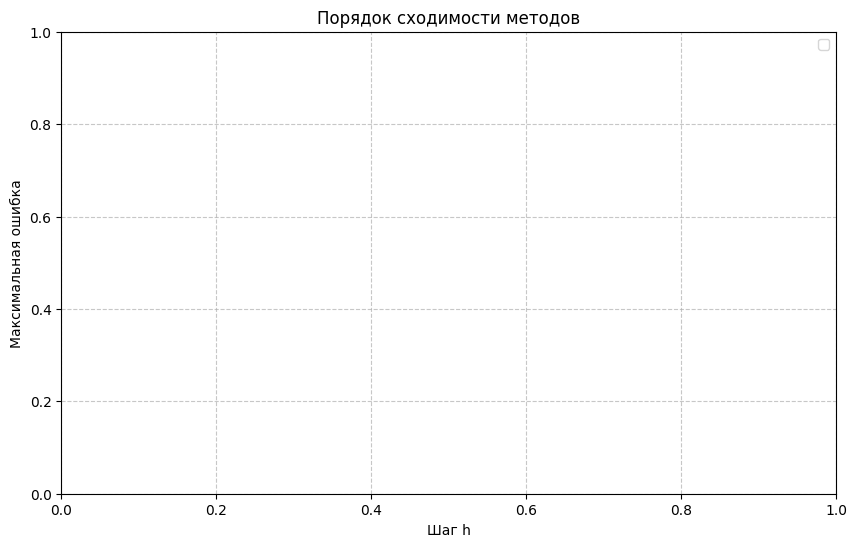

ITERATION 9 4
x0= 2.6999999999999997 y0= 6.0
❌ rk4_solve: NaN или inf в решении (h=0.0001)
⚠️ RK4 при h=0.0001: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ pece4_solve: NaN или inf в решении (h=0.0001)
⚠️ PECE4 при h=0.0001: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ Gear4: расходимость на шаге 3, h=0.0001
❌ gear4_fixed_step: NaN или inf в решении (h=0.0001)
⚠️ Gear4_fixed при h=0.0001: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ rk4_solve: NaN или inf в решении (h=5e-05)
⚠️ RK4 при h=5e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ pece4_solve: NaN или inf в решении (h=5e-05)
⚠️ PECE4 при h=5e-05: operands could not be broadcast together with shapes (1,0) (1,3) 


C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:7: RuntimeWarning: overflow encountered in scalar multiply
  dydt = y * (2 * a2 - 0.5 * y - 3.5 * (a2_reg**2) * x)
C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:6: RuntimeWarning: invalid value encountered in scalar multiply
  dxdt = x * (1 - 0.5 * x - (2/7) * (a2_reg**-2) * y)
C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:7: RuntimeWarning: overflow encountered in scalar power
  dydt = y * (2 * a2 - 0.5 * y - 3.5 * (a2_reg**2) * x)
C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:7: RuntimeWarning: invalid value encountered in scalar subtract
  dydt = y * (2 * a2 - 0.5 * y - 3.5 * (a2_reg**2) * x)
C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:8: RuntimeWarning: overflow encountered in scalar multiply
  da2dt = epsilon * (2 - 7 * a2 * x)
C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\1111329400.py:11: RuntimeWarning: invalid value encountered in add
  

❌ Gear4: расходимость на шаге 3, h=5e-05
❌ gear4_fixed_step: NaN или inf в решении (h=5e-05)
⚠️ Gear4_fixed при h=5e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ rk4_solve: NaN или inf в решении (h=2.5e-05)
⚠️ RK4 при h=2.5e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ pece4_solve: NaN или inf в решении (h=2.5e-05)
⚠️ PECE4 при h=2.5e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ Gear4: расходимость на шаге 3, h=2.5e-05
❌ gear4_fixed_step: NaN или inf в решении (h=2.5e-05)
⚠️ Gear4_fixed при h=2.5e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ rk4_solve: NaN или inf в решении (h=1.25e-05)
⚠️ RK4 при h=1.25e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ pece4_solve: NaN или inf в решении (h=1.25e-05)
⚠️ PECE4 при h=1.25e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ Gear4: расходимость на шаге 3, h=1.25e-05
❌ gear4_fixed_step: NaN 

C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3955799424.py:41: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend()


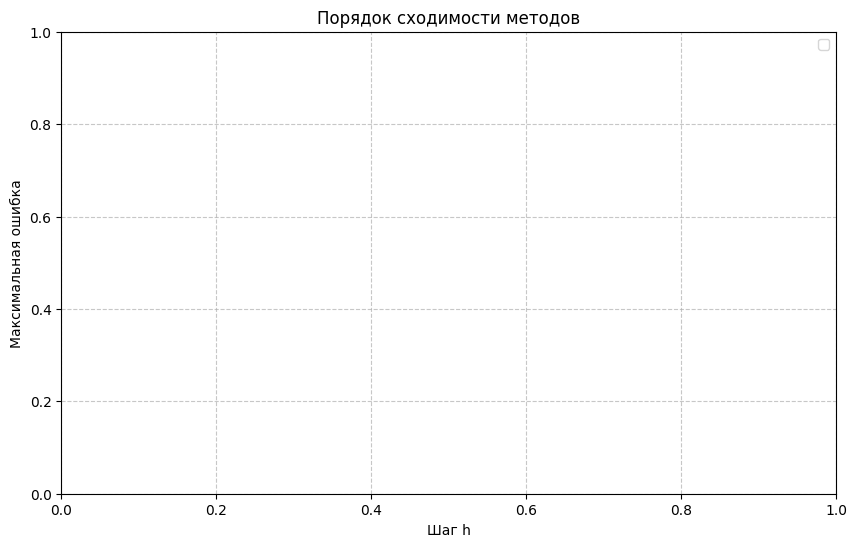

ITERATION 9 5
x0= 2.6999999999999997 y0= 7.5
❌ rk4_solve: NaN или inf в решении (h=0.0001)
⚠️ RK4 при h=0.0001: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ pece4_solve: NaN или inf в решении (h=0.0001)
⚠️ PECE4 при h=0.0001: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ Gear4: расходимость на шаге 3, h=0.0001
❌ gear4_fixed_step: NaN или inf в решении (h=0.0001)
⚠️ Gear4_fixed при h=0.0001: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ rk4_solve: NaN или inf в решении (h=5e-05)
⚠️ RK4 при h=5e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ pece4_solve: NaN или inf в решении (h=5e-05)
⚠️ PECE4 при h=5e-05: operands could not be broadcast together with shapes (1,0) (1,3) 


C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:7: RuntimeWarning: overflow encountered in scalar multiply
  dydt = y * (2 * a2 - 0.5 * y - 3.5 * (a2_reg**2) * x)
C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:6: RuntimeWarning: invalid value encountered in scalar multiply
  dxdt = x * (1 - 0.5 * x - (2/7) * (a2_reg**-2) * y)
C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:7: RuntimeWarning: overflow encountered in scalar power
  dydt = y * (2 * a2 - 0.5 * y - 3.5 * (a2_reg**2) * x)
C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:7: RuntimeWarning: invalid value encountered in scalar subtract
  dydt = y * (2 * a2 - 0.5 * y - 3.5 * (a2_reg**2) * x)
C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:8: RuntimeWarning: overflow encountered in scalar multiply
  da2dt = epsilon * (2 - 7 * a2 * x)
C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\1111329400.py:11: RuntimeWarning: invalid value encountered in add
  

❌ Gear4: расходимость на шаге 3, h=5e-05
❌ gear4_fixed_step: NaN или inf в решении (h=5e-05)
⚠️ Gear4_fixed при h=5e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ rk4_solve: NaN или inf в решении (h=2.5e-05)
⚠️ RK4 при h=2.5e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ pece4_solve: NaN или inf в решении (h=2.5e-05)
⚠️ PECE4 при h=2.5e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ Gear4: расходимость на шаге 3, h=2.5e-05
❌ gear4_fixed_step: NaN или inf в решении (h=2.5e-05)
⚠️ Gear4_fixed при h=2.5e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ rk4_solve: NaN или inf в решении (h=1.25e-05)
⚠️ RK4 при h=1.25e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ pece4_solve: NaN или inf в решении (h=1.25e-05)
⚠️ PECE4 при h=1.25e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ Gear4: расходимость на шаге 3, h=1.25e-05
❌ gear4_fixed_step: NaN 

C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3955799424.py:41: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend()


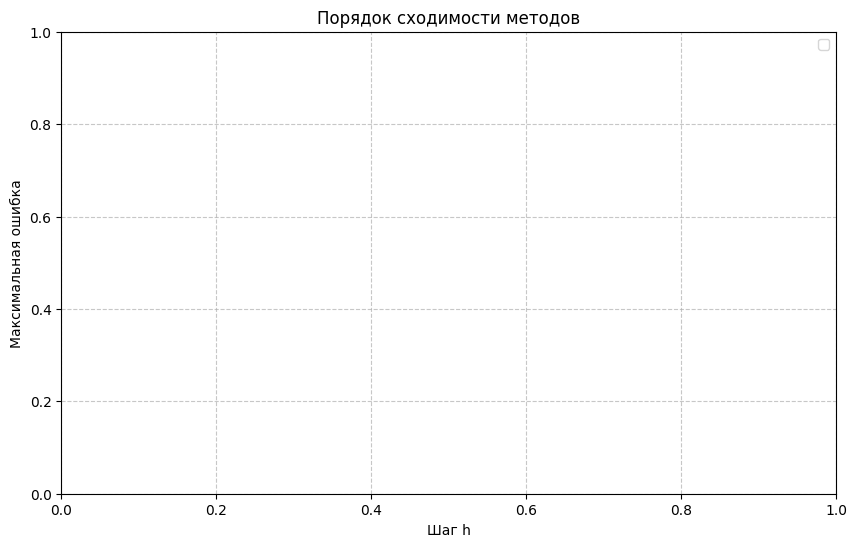

ITERATION 9 6
x0= 2.6999999999999997 y0= 9.0
❌ rk4_solve: NaN или inf в решении (h=0.0001)
⚠️ RK4 при h=0.0001: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ pece4_solve: NaN или inf в решении (h=0.0001)
⚠️ PECE4 при h=0.0001: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ Gear4: расходимость на шаге 3, h=0.0001
❌ gear4_fixed_step: NaN или inf в решении (h=0.0001)
⚠️ Gear4_fixed при h=0.0001: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ rk4_solve: NaN или inf в решении (h=5e-05)
⚠️ RK4 при h=5e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ pece4_solve: NaN или inf в решении (h=5e-05)
⚠️ PECE4 при h=5e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ Gear4: расходимость на шаге 3, h=5e-05
❌ gear4_fixed_step: NaN или inf в решении (h=5e-05)
⚠️ Gear4_fixed при h=5e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ rk4_solve: NaN или inf в решении (h=2.5e

C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:7: RuntimeWarning: overflow encountered in scalar multiply
  dydt = y * (2 * a2 - 0.5 * y - 3.5 * (a2_reg**2) * x)
C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:6: RuntimeWarning: invalid value encountered in scalar multiply
  dxdt = x * (1 - 0.5 * x - (2/7) * (a2_reg**-2) * y)
C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:7: RuntimeWarning: overflow encountered in scalar power
  dydt = y * (2 * a2 - 0.5 * y - 3.5 * (a2_reg**2) * x)
C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:7: RuntimeWarning: invalid value encountered in scalar subtract
  dydt = y * (2 * a2 - 0.5 * y - 3.5 * (a2_reg**2) * x)
C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:8: RuntimeWarning: overflow encountered in scalar multiply
  da2dt = epsilon * (2 - 7 * a2 * x)


❌ pece4_solve: NaN или inf в решении (h=2.5e-05)
⚠️ PECE4 при h=2.5e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ Gear4: расходимость на шаге 3, h=2.5e-05
❌ gear4_fixed_step: NaN или inf в решении (h=2.5e-05)
⚠️ Gear4_fixed при h=2.5e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ rk4_solve: NaN или inf в решении (h=1.25e-05)
⚠️ RK4 при h=1.25e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ pece4_solve: NaN или inf в решении (h=1.25e-05)
⚠️ PECE4 при h=1.25e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ Gear4: расходимость на шаге 3, h=1.25e-05
❌ gear4_fixed_step: NaN или inf в решении (h=1.25e-05)
⚠️ Gear4_fixed при h=1.25e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ rk4_solve: NaN или inf в решении (h=6.25e-06)
⚠️ RK4 при h=6.25e-06: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ pece4_solve: NaN или inf в решении (h=6.25e-06)
⚠️ PECE

C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3955799424.py:41: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend()


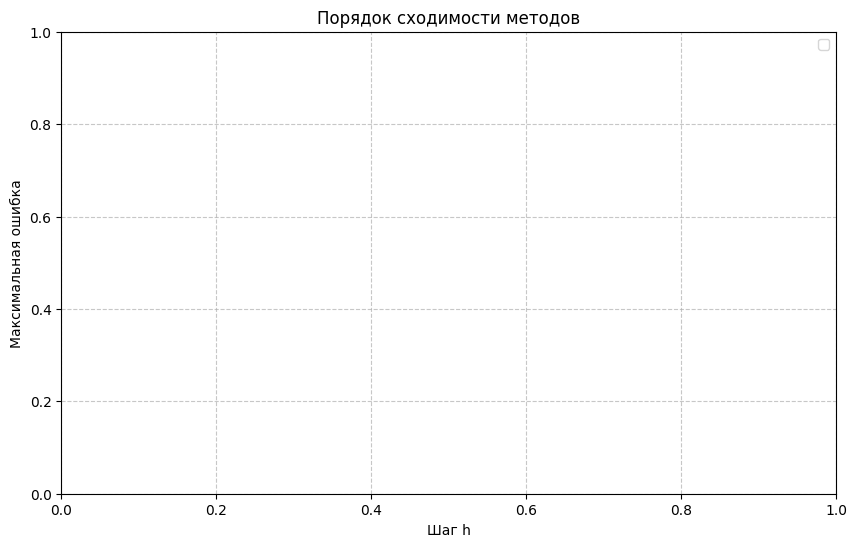

ITERATION 9 7
x0= 2.6999999999999997 y0= 10.5
❌ rk4_solve: NaN или inf в решении (h=0.0001)
⚠️ RK4 при h=0.0001: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ pece4_solve: NaN или inf в решении (h=0.0001)
⚠️ PECE4 при h=0.0001: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ Gear4: расходимость на шаге 3, h=0.0001
❌ gear4_fixed_step: NaN или inf в решении (h=0.0001)
⚠️ Gear4_fixed при h=0.0001: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ rk4_solve: NaN или inf в решении (h=5e-05)
⚠️ RK4 при h=5e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ pece4_solve: NaN или inf в решении (h=5e-05)
⚠️ PECE4 при h=5e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ Gear4: расходимость на шаге 3, h=5e-05
❌ gear4_fixed_step: NaN или inf в решении (h=5e-05)
⚠️ Gear4_fixed при h=5e-05: operands could not be broadcast together with shapes (1,0) (1,3) 


C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:7: RuntimeWarning: overflow encountered in scalar multiply
  dydt = y * (2 * a2 - 0.5 * y - 3.5 * (a2_reg**2) * x)
C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:6: RuntimeWarning: invalid value encountered in scalar multiply
  dxdt = x * (1 - 0.5 * x - (2/7) * (a2_reg**-2) * y)
C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:7: RuntimeWarning: overflow encountered in scalar power
  dydt = y * (2 * a2 - 0.5 * y - 3.5 * (a2_reg**2) * x)
C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:7: RuntimeWarning: invalid value encountered in scalar subtract
  dydt = y * (2 * a2 - 0.5 * y - 3.5 * (a2_reg**2) * x)
C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:8: RuntimeWarning: overflow encountered in scalar multiply
  da2dt = epsilon * (2 - 7 * a2 * x)


❌ rk4_solve: NaN или inf в решении (h=2.5e-05)
⚠️ RK4 при h=2.5e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ pece4_solve: NaN или inf в решении (h=2.5e-05)
⚠️ PECE4 при h=2.5e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ Gear4: расходимость на шаге 3, h=2.5e-05
❌ gear4_fixed_step: NaN или inf в решении (h=2.5e-05)
⚠️ Gear4_fixed при h=2.5e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ rk4_solve: NaN или inf в решении (h=1.25e-05)
⚠️ RK4 при h=1.25e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ pece4_solve: NaN или inf в решении (h=1.25e-05)
⚠️ PECE4 при h=1.25e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ Gear4: расходимость на шаге 3, h=1.25e-05
❌ gear4_fixed_step: NaN или inf в решении (h=1.25e-05)
⚠️ Gear4_fixed при h=1.25e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ rk4_solve: NaN или inf в решении (h=6.25e-06)
⚠️ RK4 при 

C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3955799424.py:41: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend()


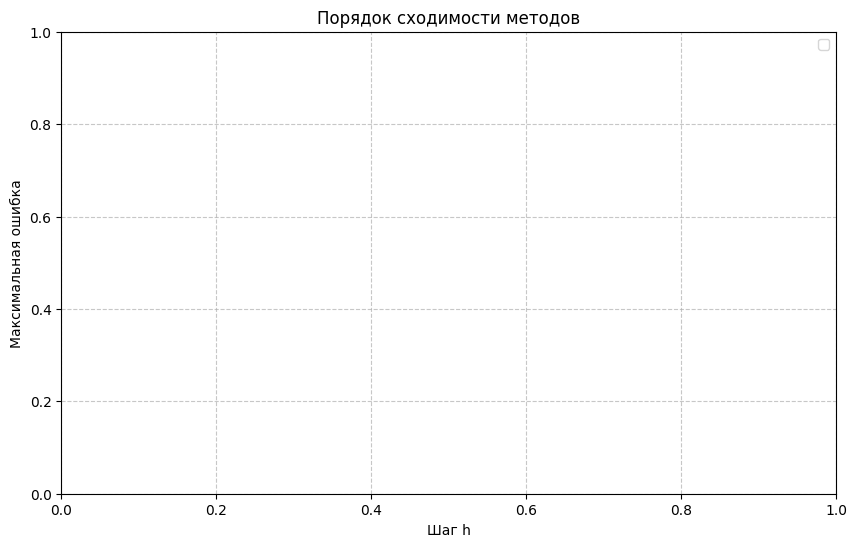

ITERATION 9 8
x0= 2.6999999999999997 y0= 12.0


C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:7: RuntimeWarning: overflow encountered in scalar multiply
  dydt = y * (2 * a2 - 0.5 * y - 3.5 * (a2_reg**2) * x)
C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:6: RuntimeWarning: invalid value encountered in scalar multiply
  dxdt = x * (1 - 0.5 * x - (2/7) * (a2_reg**-2) * y)
C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:7: RuntimeWarning: overflow encountered in scalar power
  dydt = y * (2 * a2 - 0.5 * y - 3.5 * (a2_reg**2) * x)
C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:7: RuntimeWarning: invalid value encountered in scalar subtract
  dydt = y * (2 * a2 - 0.5 * y - 3.5 * (a2_reg**2) * x)
C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:8: RuntimeWarning: overflow encountered in scalar multiply
  da2dt = epsilon * (2 - 7 * a2 * x)


❌ rk4_solve: NaN или inf в решении (h=0.0001)
⚠️ RK4 при h=0.0001: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ pece4_solve: NaN или inf в решении (h=0.0001)
⚠️ PECE4 при h=0.0001: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ Gear4: расходимость на шаге 3, h=0.0001
❌ gear4_fixed_step: NaN или inf в решении (h=0.0001)
⚠️ Gear4_fixed при h=0.0001: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ rk4_solve: NaN или inf в решении (h=5e-05)
⚠️ RK4 при h=5e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ pece4_solve: NaN или inf в решении (h=5e-05)
⚠️ PECE4 при h=5e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ Gear4: расходимость на шаге 3, h=5e-05
❌ gear4_fixed_step: NaN или inf в решении (h=5e-05)
⚠️ Gear4_fixed при h=5e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ rk4_solve: NaN или inf в решении (h=2.5e-05)
⚠️ RK4 при h=2.5e-05: operands could not

C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3955799424.py:41: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend()


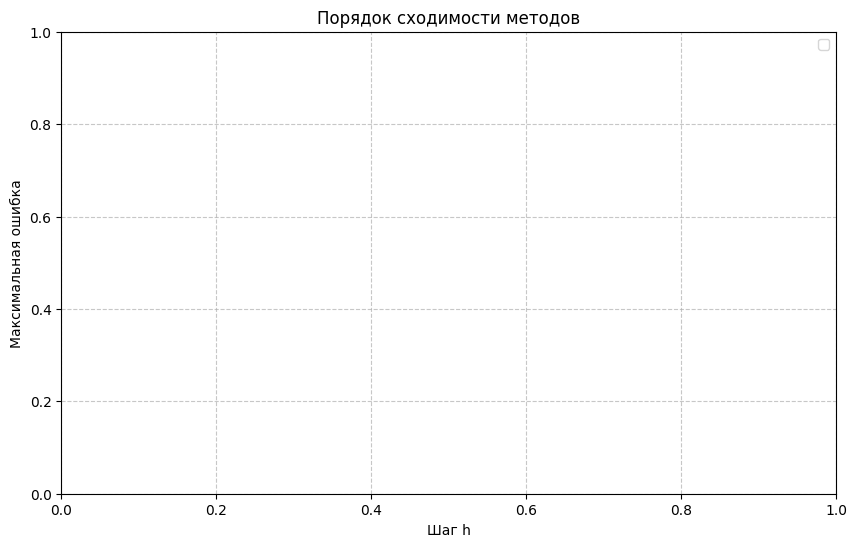

ITERATION 9 9
x0= 2.6999999999999997 y0= 13.5
❌ rk4_solve: NaN или inf в решении (h=0.0001)
⚠️ RK4 при h=0.0001: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ pece4_solve: NaN или inf в решении (h=0.0001)
⚠️ PECE4 при h=0.0001: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ Gear4: расходимость на шаге 3, h=0.0001
❌ gear4_fixed_step: NaN или inf в решении (h=0.0001)
⚠️ Gear4_fixed при h=0.0001: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ rk4_solve: NaN или inf в решении (h=5e-05)
⚠️ RK4 при h=5e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ pece4_solve: NaN или inf в решении (h=5e-05)
⚠️ PECE4 при h=5e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ Gear4: расходимость на шаге 3, h=5e-05
❌ gear4_fixed_step: NaN или inf в решении (h=5e-05)
⚠️ Gear4_fixed при h=5e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ rk4_solve: NaN или inf в решении (h=2.5

C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:7: RuntimeWarning: overflow encountered in scalar multiply
  dydt = y * (2 * a2 - 0.5 * y - 3.5 * (a2_reg**2) * x)
C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:7: RuntimeWarning: invalid value encountered in scalar subtract
  dydt = y * (2 * a2 - 0.5 * y - 3.5 * (a2_reg**2) * x)
C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:7: RuntimeWarning: overflow encountered in scalar power
  dydt = y * (2 * a2 - 0.5 * y - 3.5 * (a2_reg**2) * x)
C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:6: RuntimeWarning: invalid value encountered in scalar multiply
  dxdt = x * (1 - 0.5 * x - (2/7) * (a2_reg**-2) * y)
C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:8: RuntimeWarning: overflow encountered in scalar multiply
  da2dt = epsilon * (2 - 7 * a2 * x)
C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\1111329400.py:11: RuntimeWarning: invalid value encountered in add
  

❌ pece4_solve: NaN или inf в решении (h=2.5e-05)
⚠️ PECE4 при h=2.5e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ Gear4: расходимость на шаге 3, h=2.5e-05
❌ gear4_fixed_step: NaN или inf в решении (h=2.5e-05)
⚠️ Gear4_fixed при h=2.5e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ rk4_solve: NaN или inf в решении (h=1.25e-05)
⚠️ RK4 при h=1.25e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ pece4_solve: NaN или inf в решении (h=1.25e-05)
⚠️ PECE4 при h=1.25e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ Gear4: расходимость на шаге 3, h=1.25e-05
❌ gear4_fixed_step: NaN или inf в решении (h=1.25e-05)
⚠️ Gear4_fixed при h=1.25e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ rk4_solve: NaN или inf в решении (h=6.25e-06)
⚠️ RK4 при h=6.25e-06: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ pece4_solve: NaN или inf в решении (h=6.25e-06)
⚠️ PECE

C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3955799424.py:41: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend()


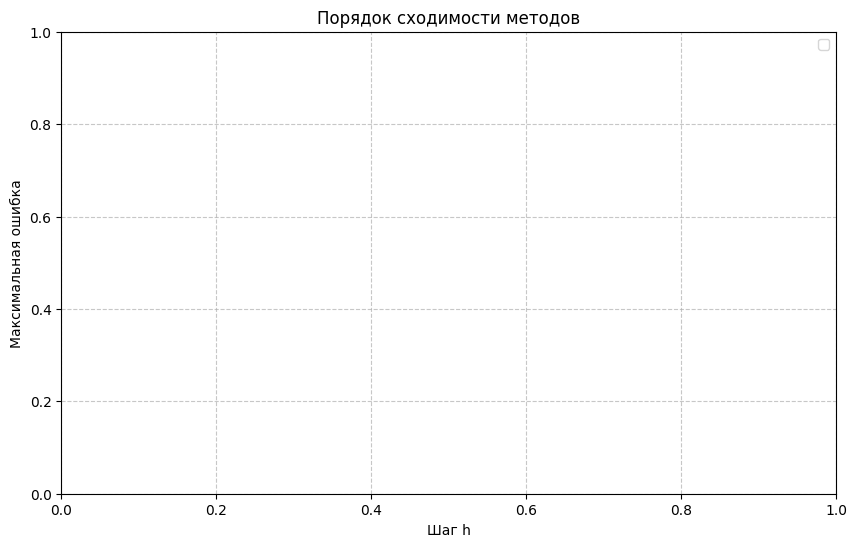

In [16]:
r=0
s=0
for t in range (10):
    r=t*0.3
    for p in range (10):
        s=p*1.5
        print ("ITERATION", t, p) 
        print ("x0=", r, "y0=", s) 
        df = run_convergence_analysis(
            y0_system=[r, s, 0.0001],
            t_range=[0, 0.01],
            epsilon=0.001
        )


Когда x=0 или y=0 убивается член, дающий жёсткость, а в остальных случаях считается неприятно.  
Пробую более мелкие шаги по х и у

ITERATION 0 0
x0= 0.0 y0= 0.0
✅ rk4_solve: успех, 101 шагов (h=0.0001)
✅ pece4_solve: успех, 101 шагов (h=0.0001)
✅ gear4_fixed_step: успех, 101 шагов (h=0.0001)
✅ rk4_solve: успех, 201 шагов (h=5e-05)
✅ pece4_solve: успех, 201 шагов (h=5e-05)
✅ gear4_fixed_step: успех, 201 шагов (h=5e-05)
✅ rk4_solve: успех, 401 шагов (h=2.5e-05)
✅ pece4_solve: успех, 401 шагов (h=2.5e-05)
✅ gear4_fixed_step: успех, 401 шагов (h=2.5e-05)
✅ rk4_solve: успех, 801 шагов (h=1.25e-05)
✅ pece4_solve: успех, 801 шагов (h=1.25e-05)
✅ gear4_fixed_step: успех, 801 шагов (h=1.25e-05)
✅ rk4_solve: успех, 1601 шагов (h=6.25e-06)
✅ pece4_solve: успех, 1601 шагов (h=6.25e-06)
✅ gear4_fixed_step: успех, 1601 шагов (h=6.25e-06)
✅ rk4_solve: успех, 3201 шагов (h=3.125e-06)
✅ pece4_solve: успех, 3201 шагов (h=3.125e-06)
✅ gear4_fixed_step: успех, 3201 шагов (h=3.125e-06)
          h           RK4  p_RK4         PECE4  p_PECE4   Gear4_fixed  p_Gear4_fixed
0  0.000100  4.878910e-19    NaN  4.878910e-19      NaN  2.032879e

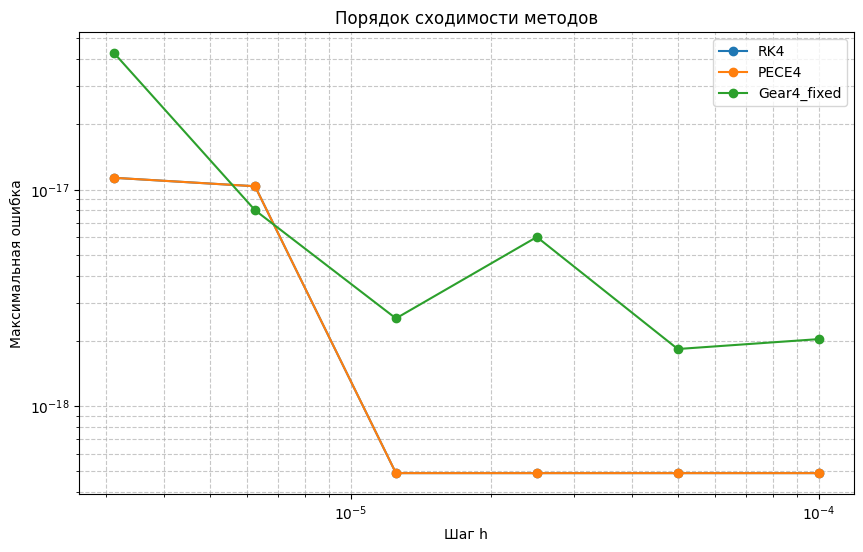

ITERATION 0 1
x0= 0.0 y0= 0.01
✅ rk4_solve: успех, 101 шагов (h=0.0001)
✅ pece4_solve: успех, 101 шагов (h=0.0001)
✅ gear4_fixed_step: успех, 101 шагов (h=0.0001)
✅ rk4_solve: успех, 201 шагов (h=5e-05)
✅ pece4_solve: успех, 201 шагов (h=5e-05)
✅ gear4_fixed_step: успех, 201 шагов (h=5e-05)
✅ rk4_solve: успех, 401 шагов (h=2.5e-05)
✅ pece4_solve: успех, 401 шагов (h=2.5e-05)
✅ gear4_fixed_step: успех, 401 шагов (h=2.5e-05)
✅ rk4_solve: успех, 801 шагов (h=1.25e-05)
✅ pece4_solve: успех, 801 шагов (h=1.25e-05)
✅ gear4_fixed_step: успех, 801 шагов (h=1.25e-05)
✅ rk4_solve: успех, 1601 шагов (h=6.25e-06)
✅ pece4_solve: успех, 1601 шагов (h=6.25e-06)
✅ gear4_fixed_step: успех, 1601 шагов (h=6.25e-06)
✅ rk4_solve: успех, 3201 шагов (h=3.125e-06)
✅ pece4_solve: успех, 3201 шагов (h=3.125e-06)
✅ gear4_fixed_step: успех, 3201 шагов (h=3.125e-06)
          h           RK4  p_RK4         PECE4  p_PECE4   Gear4_fixed  p_Gear4_fixed
0  0.000100  8.641785e-12    NaN  8.641785e-12      NaN  8.641782

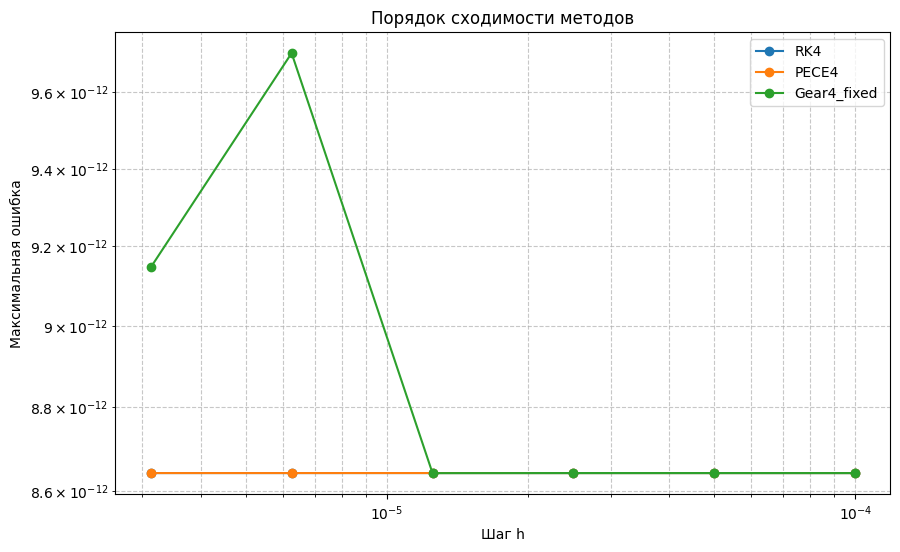

ITERATION 0 2
x0= 0.0 y0= 0.02
✅ rk4_solve: успех, 101 шагов (h=0.0001)
✅ pece4_solve: успех, 101 шагов (h=0.0001)
✅ gear4_fixed_step: успех, 101 шагов (h=0.0001)
✅ rk4_solve: успех, 201 шагов (h=5e-05)
✅ pece4_solve: успех, 201 шагов (h=5e-05)
✅ gear4_fixed_step: успех, 201 шагов (h=5e-05)
✅ rk4_solve: успех, 401 шагов (h=2.5e-05)
✅ pece4_solve: успех, 401 шагов (h=2.5e-05)
✅ gear4_fixed_step: успех, 401 шагов (h=2.5e-05)
✅ rk4_solve: успех, 801 шагов (h=1.25e-05)
✅ pece4_solve: успех, 801 шагов (h=1.25e-05)
✅ gear4_fixed_step: успех, 801 шагов (h=1.25e-05)
✅ rk4_solve: успех, 1601 шагов (h=6.25e-06)
✅ pece4_solve: успех, 1601 шагов (h=6.25e-06)
✅ gear4_fixed_step: успех, 1601 шагов (h=6.25e-06)
✅ rk4_solve: успех, 3201 шагов (h=3.125e-06)
✅ pece4_solve: успех, 3201 шагов (h=3.125e-06)
✅ gear4_fixed_step: успех, 3201 шагов (h=3.125e-06)
          h           RK4  p_RK4         PECE4  p_PECE4   Gear4_fixed  p_Gear4_fixed
0  0.000100  1.594008e-11    NaN  1.594008e-11      NaN  1.593999

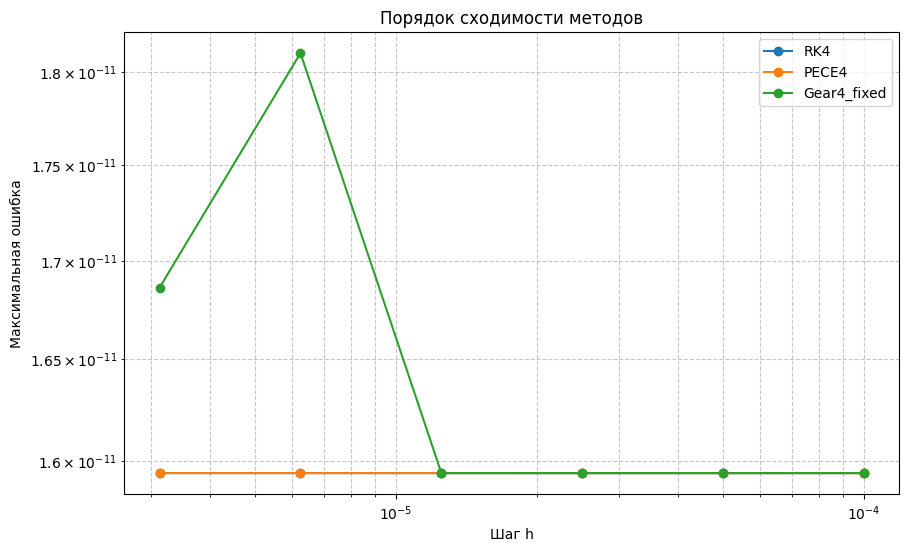

ITERATION 0 3
x0= 0.0 y0= 0.03
✅ rk4_solve: успех, 101 шагов (h=0.0001)
✅ pece4_solve: успех, 101 шагов (h=0.0001)
✅ gear4_fixed_step: успех, 101 шагов (h=0.0001)
✅ rk4_solve: успех, 201 шагов (h=5e-05)
✅ pece4_solve: успех, 201 шагов (h=5e-05)
✅ gear4_fixed_step: успех, 201 шагов (h=5e-05)
✅ rk4_solve: успех, 401 шагов (h=2.5e-05)
✅ pece4_solve: успех, 401 шагов (h=2.5e-05)
✅ gear4_fixed_step: успех, 401 шагов (h=2.5e-05)
✅ rk4_solve: успех, 801 шагов (h=1.25e-05)
✅ pece4_solve: успех, 801 шагов (h=1.25e-05)
✅ gear4_fixed_step: успех, 801 шагов (h=1.25e-05)
✅ rk4_solve: успех, 1601 шагов (h=6.25e-06)
✅ pece4_solve: успех, 1601 шагов (h=6.25e-06)
✅ gear4_fixed_step: успех, 1601 шагов (h=6.25e-06)
✅ rk4_solve: успех, 3201 шагов (h=3.125e-06)
✅ pece4_solve: успех, 3201 шагов (h=3.125e-06)
✅ gear4_fixed_step: успех, 3201 шагов (h=3.125e-06)
          h           RK4  p_RK4         PECE4  p_PECE4   Gear4_fixed  p_Gear4_fixed
0  0.000100  2.230986e-11    NaN  2.230986e-11      NaN  2.230975

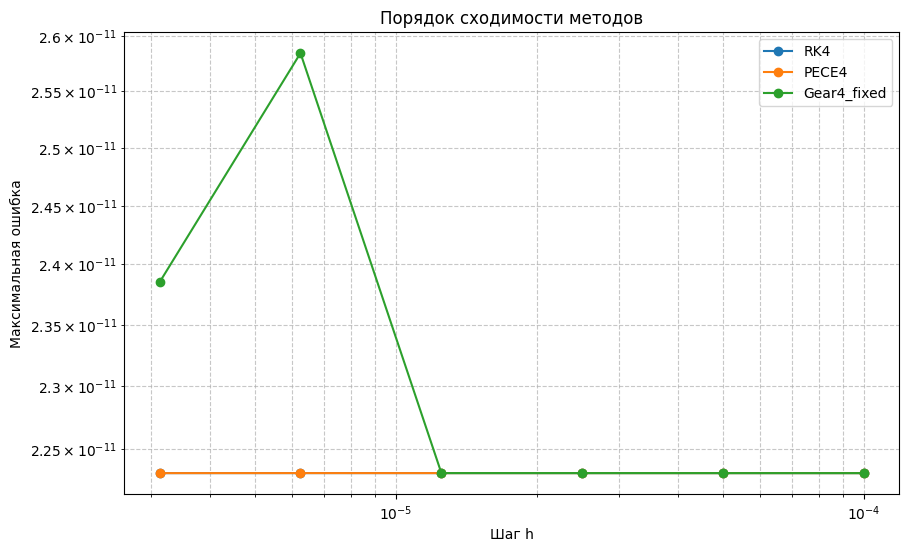

ITERATION 0 4
x0= 0.0 y0= 0.04
✅ rk4_solve: успех, 101 шагов (h=0.0001)
✅ pece4_solve: успех, 101 шагов (h=0.0001)
✅ gear4_fixed_step: успех, 101 шагов (h=0.0001)
✅ rk4_solve: успех, 201 шагов (h=5e-05)
✅ pece4_solve: успех, 201 шагов (h=5e-05)
✅ gear4_fixed_step: успех, 201 шагов (h=5e-05)
✅ rk4_solve: успех, 401 шагов (h=2.5e-05)
✅ pece4_solve: успех, 401 шагов (h=2.5e-05)
✅ gear4_fixed_step: успех, 401 шагов (h=2.5e-05)
✅ rk4_solve: успех, 801 шагов (h=1.25e-05)
✅ pece4_solve: успех, 801 шагов (h=1.25e-05)
✅ gear4_fixed_step: успех, 801 шагов (h=1.25e-05)
✅ rk4_solve: успех, 1601 шагов (h=6.25e-06)
✅ pece4_solve: успех, 1601 шагов (h=6.25e-06)
✅ gear4_fixed_step: успех, 1601 шагов (h=6.25e-06)
✅ rk4_solve: успех, 3201 шагов (h=3.125e-06)
✅ pece4_solve: успех, 3201 шагов (h=3.125e-06)
✅ gear4_fixed_step: успех, 3201 шагов (h=3.125e-06)
          h           RK4  p_RK4         PECE4  p_PECE4   Gear4_fixed  p_Gear4_fixed
0  0.000100  2.850865e-11    NaN  2.850865e-11      NaN  2.850860

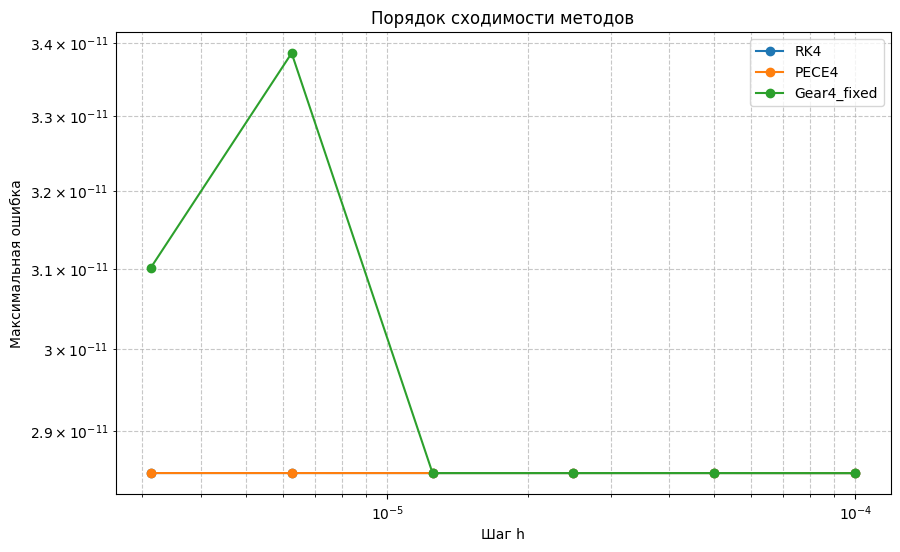

ITERATION 0 5
x0= 0.0 y0= 0.05
✅ rk4_solve: успех, 101 шагов (h=0.0001)
✅ pece4_solve: успех, 101 шагов (h=0.0001)
✅ gear4_fixed_step: успех, 101 шагов (h=0.0001)
✅ rk4_solve: успех, 201 шагов (h=5e-05)
✅ pece4_solve: успех, 201 шагов (h=5e-05)
✅ gear4_fixed_step: успех, 201 шагов (h=5e-05)
✅ rk4_solve: успех, 401 шагов (h=2.5e-05)
✅ pece4_solve: успех, 401 шагов (h=2.5e-05)
✅ gear4_fixed_step: успех, 401 шагов (h=2.5e-05)
✅ rk4_solve: успех, 801 шагов (h=1.25e-05)
✅ pece4_solve: успех, 801 шагов (h=1.25e-05)
✅ gear4_fixed_step: успех, 801 шагов (h=1.25e-05)
✅ rk4_solve: успех, 1601 шагов (h=6.25e-06)
✅ pece4_solve: успех, 1601 шагов (h=6.25e-06)
✅ gear4_fixed_step: успех, 1601 шагов (h=6.25e-06)
✅ rk4_solve: успех, 3201 шагов (h=3.125e-06)
✅ pece4_solve: успех, 3201 шагов (h=3.125e-06)
✅ gear4_fixed_step: успех, 3201 шагов (h=3.125e-06)
          h           RK4  p_RK4         PECE4  p_PECE4   Gear4_fixed  p_Gear4_fixed
0  0.000100  3.466575e-11    NaN  3.466575e-11      NaN  3.466544

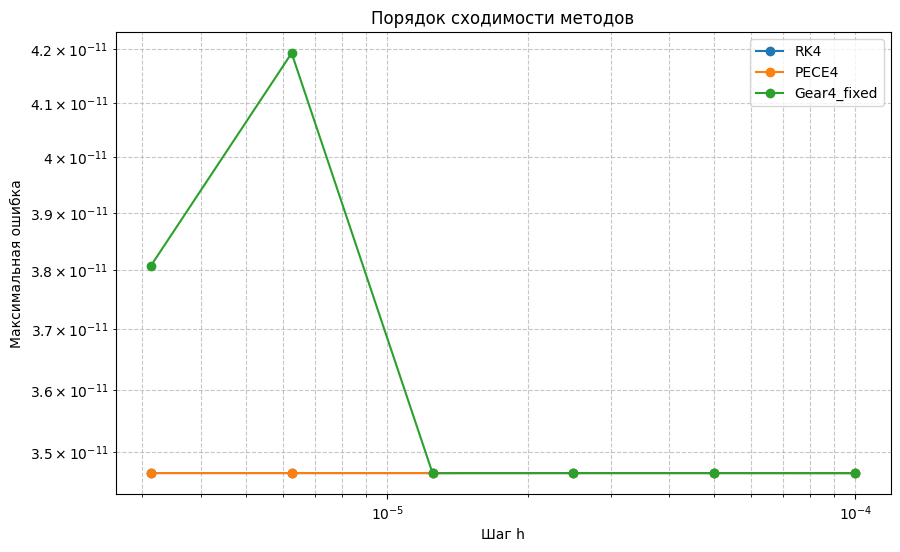

ITERATION 0 6
x0= 0.0 y0= 0.06
✅ rk4_solve: успех, 101 шагов (h=0.0001)
✅ pece4_solve: успех, 101 шагов (h=0.0001)
✅ gear4_fixed_step: успех, 101 шагов (h=0.0001)
✅ rk4_solve: успех, 201 шагов (h=5e-05)
✅ pece4_solve: успех, 201 шагов (h=5e-05)
✅ gear4_fixed_step: успех, 201 шагов (h=5e-05)
✅ rk4_solve: успех, 401 шагов (h=2.5e-05)
✅ pece4_solve: успех, 401 шагов (h=2.5e-05)
✅ gear4_fixed_step: успех, 401 шагов (h=2.5e-05)
✅ rk4_solve: успех, 801 шагов (h=1.25e-05)
✅ pece4_solve: успех, 801 шагов (h=1.25e-05)
✅ gear4_fixed_step: успех, 801 шагов (h=1.25e-05)
✅ rk4_solve: успех, 1601 шагов (h=6.25e-06)
✅ pece4_solve: успех, 1601 шагов (h=6.25e-06)
✅ gear4_fixed_step: успех, 1601 шагов (h=6.25e-06)
✅ rk4_solve: успех, 3201 шагов (h=3.125e-06)
✅ pece4_solve: успех, 3201 шагов (h=3.125e-06)
✅ gear4_fixed_step: успех, 3201 шагов (h=3.125e-06)
          h           RK4  p_RK4         PECE4  p_PECE4   Gear4_fixed  p_Gear4_fixed
0  0.000100  4.037284e-11    NaN  4.037284e-11      NaN  4.037232

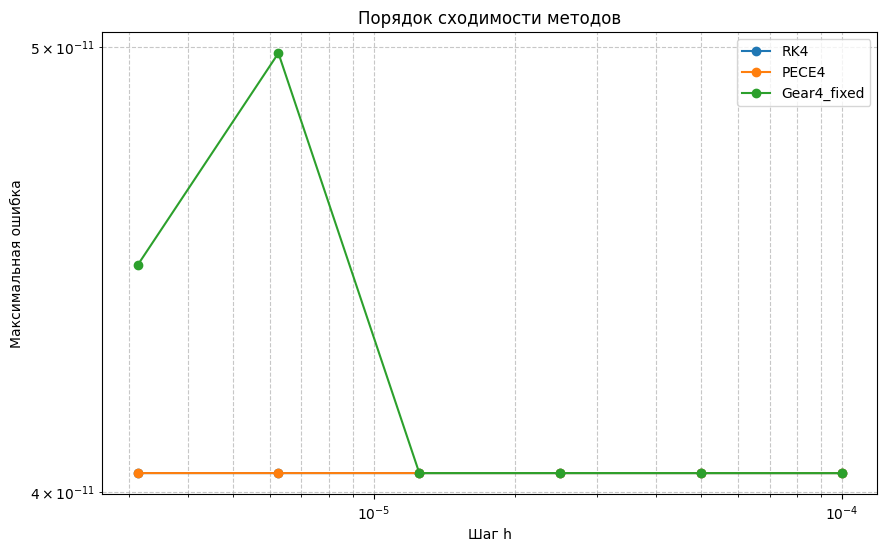

ITERATION 0 7
x0= 0.0 y0= 0.07
✅ rk4_solve: успех, 101 шагов (h=0.0001)
✅ pece4_solve: успех, 101 шагов (h=0.0001)
✅ gear4_fixed_step: успех, 101 шагов (h=0.0001)
✅ rk4_solve: успех, 201 шагов (h=5e-05)
✅ pece4_solve: успех, 201 шагов (h=5e-05)
✅ gear4_fixed_step: успех, 201 шагов (h=5e-05)
✅ rk4_solve: успех, 401 шагов (h=2.5e-05)
✅ pece4_solve: успех, 401 шагов (h=2.5e-05)
✅ gear4_fixed_step: успех, 401 шагов (h=2.5e-05)
✅ rk4_solve: успех, 801 шагов (h=1.25e-05)
✅ pece4_solve: успех, 801 шагов (h=1.25e-05)
✅ gear4_fixed_step: успех, 801 шагов (h=1.25e-05)
✅ rk4_solve: успех, 1601 шагов (h=6.25e-06)
✅ pece4_solve: успех, 1601 шагов (h=6.25e-06)
✅ gear4_fixed_step: успех, 1601 шагов (h=6.25e-06)
✅ rk4_solve: успех, 3201 шагов (h=3.125e-06)
✅ pece4_solve: успех, 3201 шагов (h=3.125e-06)
✅ gear4_fixed_step: успех, 3201 шагов (h=3.125e-06)
          h           RK4  p_RK4         PECE4  p_PECE4   Gear4_fixed  p_Gear4_fixed
0  0.000100  4.541623e-11    NaN  4.541623e-11      NaN  4.541566

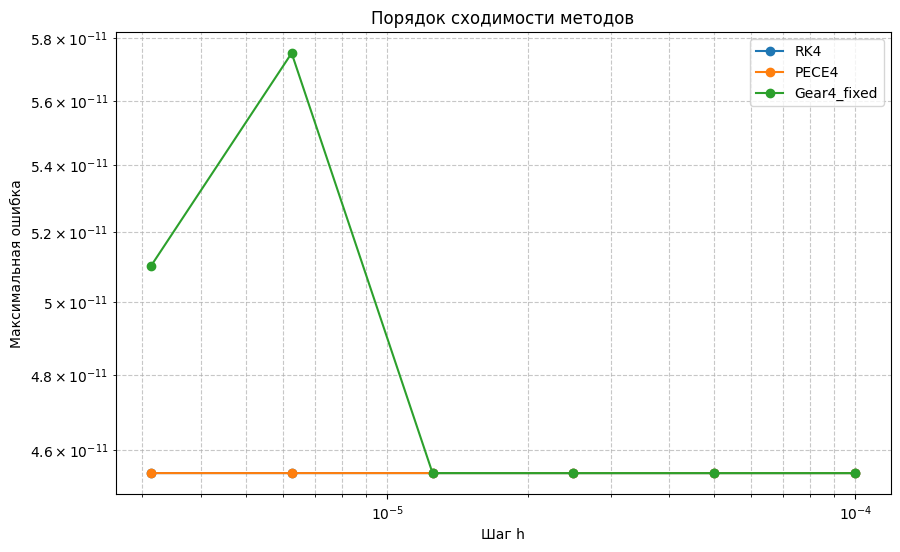

ITERATION 0 8
x0= 0.0 y0= 0.08
✅ rk4_solve: успех, 101 шагов (h=0.0001)
✅ pece4_solve: успех, 101 шагов (h=0.0001)
✅ gear4_fixed_step: успех, 101 шагов (h=0.0001)
✅ rk4_solve: успех, 201 шагов (h=5e-05)
✅ pece4_solve: успех, 201 шагов (h=5e-05)
✅ gear4_fixed_step: успех, 201 шагов (h=5e-05)
✅ rk4_solve: успех, 401 шагов (h=2.5e-05)
✅ pece4_solve: успех, 401 шагов (h=2.5e-05)
✅ gear4_fixed_step: успех, 401 шагов (h=2.5e-05)
✅ rk4_solve: успех, 801 шагов (h=1.25e-05)
✅ pece4_solve: успех, 801 шагов (h=1.25e-05)
✅ gear4_fixed_step: успех, 801 шагов (h=1.25e-05)
✅ rk4_solve: успех, 1601 шагов (h=6.25e-06)
✅ pece4_solve: успех, 1601 шагов (h=6.25e-06)
✅ gear4_fixed_step: успех, 1601 шагов (h=6.25e-06)
✅ rk4_solve: успех, 3201 шагов (h=3.125e-06)
✅ pece4_solve: успех, 3201 шагов (h=3.125e-06)
✅ gear4_fixed_step: успех, 3201 шагов (h=3.125e-06)
          h           RK4  p_RK4         PECE4  p_PECE4   Gear4_fixed  p_Gear4_fixed
0  0.000100  4.839833e-11    NaN  4.839833e-11      NaN  4.839761

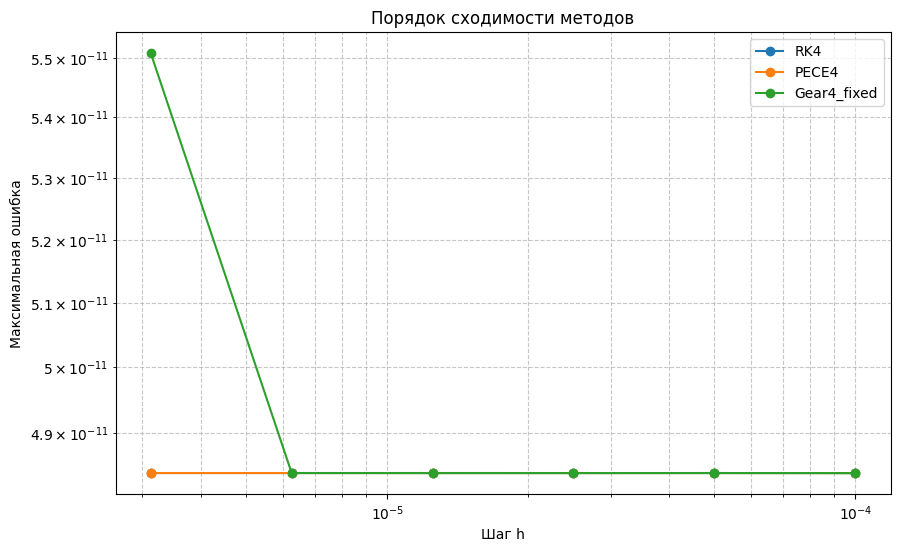

ITERATION 0 9
x0= 0.0 y0= 0.09
✅ rk4_solve: успех, 101 шагов (h=0.0001)
✅ pece4_solve: успех, 101 шагов (h=0.0001)
✅ gear4_fixed_step: успех, 101 шагов (h=0.0001)
✅ rk4_solve: успех, 201 шагов (h=5e-05)
✅ pece4_solve: успех, 201 шагов (h=5e-05)
✅ gear4_fixed_step: успех, 201 шагов (h=5e-05)
✅ rk4_solve: успех, 401 шагов (h=2.5e-05)
✅ pece4_solve: успех, 401 шагов (h=2.5e-05)
✅ gear4_fixed_step: успех, 401 шагов (h=2.5e-05)
✅ rk4_solve: успех, 801 шагов (h=1.25e-05)
✅ pece4_solve: успех, 801 шагов (h=1.25e-05)
✅ gear4_fixed_step: успех, 801 шагов (h=1.25e-05)
✅ rk4_solve: успех, 1601 шагов (h=6.25e-06)
✅ pece4_solve: успех, 1601 шагов (h=6.25e-06)
✅ gear4_fixed_step: успех, 1601 шагов (h=6.25e-06)
✅ rk4_solve: успех, 3201 шагов (h=3.125e-06)
✅ pece4_solve: успех, 3201 шагов (h=3.125e-06)
✅ gear4_fixed_step: успех, 3201 шагов (h=3.125e-06)
          h           RK4  p_RK4         PECE4  p_PECE4   Gear4_fixed  p_Gear4_fixed
0  0.000100  5.089504e-11    NaN  5.089504e-11      NaN  5.089418

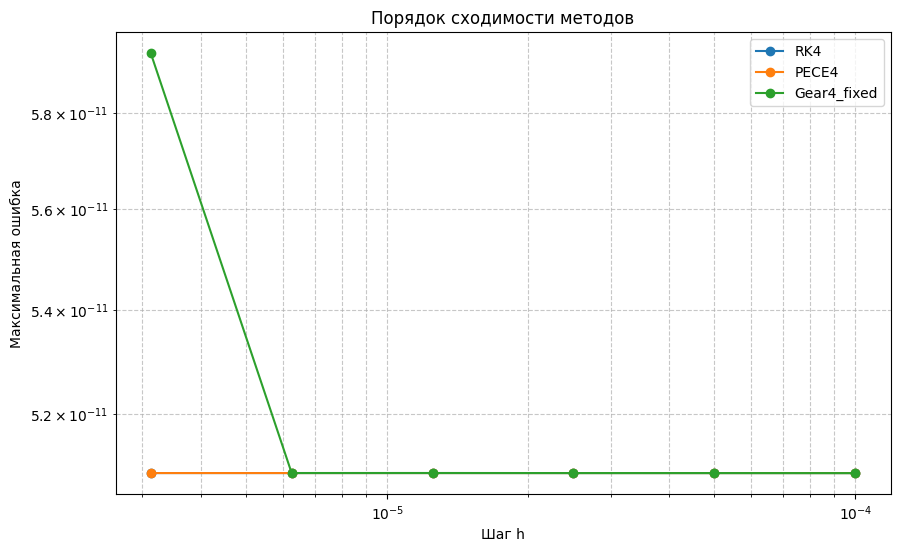

ITERATION 1 0
x0= 0.01 y0= 0.0
✅ rk4_solve: успех, 101 шагов (h=0.0001)
✅ pece4_solve: успех, 101 шагов (h=0.0001)
✅ gear4_fixed_step: успех, 101 шагов (h=0.0001)
✅ rk4_solve: успех, 201 шагов (h=5e-05)
✅ pece4_solve: успех, 201 шагов (h=5e-05)
✅ gear4_fixed_step: успех, 201 шагов (h=5e-05)
✅ rk4_solve: успех, 401 шагов (h=2.5e-05)
✅ pece4_solve: успех, 401 шагов (h=2.5e-05)
✅ gear4_fixed_step: успех, 401 шагов (h=2.5e-05)
✅ rk4_solve: успех, 801 шагов (h=1.25e-05)
✅ pece4_solve: успех, 801 шагов (h=1.25e-05)
✅ gear4_fixed_step: успех, 801 шагов (h=1.25e-05)
✅ rk4_solve: успех, 1601 шагов (h=6.25e-06)
✅ pece4_solve: успех, 1601 шагов (h=6.25e-06)
✅ gear4_fixed_step: успех, 1601 шагов (h=6.25e-06)
✅ rk4_solve: успех, 3201 шагов (h=3.125e-06)
✅ pece4_solve: успех, 3201 шагов (h=3.125e-06)
✅ gear4_fixed_step: успех, 3201 шагов (h=3.125e-06)
          h           RK4  p_RK4         PECE4  p_PECE4   Gear4_fixed  p_Gear4_fixed
0  0.000100  2.818048e-10    NaN  2.818048e-10      NaN  2.820146

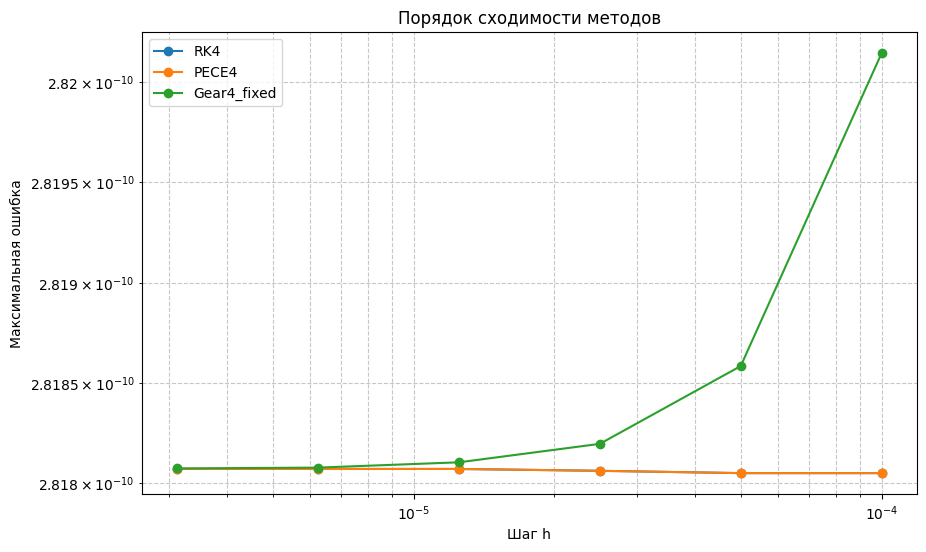

ITERATION 1 1
x0= 0.01 y0= 0.01
❌ rk4_solve: NaN или inf в решении (h=0.0001)
⚠️ RK4 при h=0.0001: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ pece4_solve: NaN или inf в решении (h=0.0001)
⚠️ PECE4 при h=0.0001: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ Gear4: расходимость на шаге 3, h=0.0001
❌ gear4_fixed_step: переполнение (h=0.0001)
⚠️ Gear4_fixed при h=0.0001: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ rk4_solve: NaN или inf в решении (h=5e-05)
⚠️ RK4 при h=5e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ pece4_solve: NaN или inf в решении (h=5e-05)
⚠️ PECE4 при h=5e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ Gear4: расходимость на шаге 3, h=5e-05
✅ gear4_fixed_step: успех, 4 шагов (h=5e-05)
❌ rk4_solve: NaN или inf в решении (h=2.5e-05)
⚠️ RK4 при h=2.5e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ pece4_solve: NaN или inf в р

C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:7: RuntimeWarning: overflow encountered in scalar multiply
  dydt = y * (2 * a2 - 0.5 * y - 3.5 * (a2_reg**2) * x)
C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:7: RuntimeWarning: invalid value encountered in scalar subtract
  dydt = y * (2 * a2 - 0.5 * y - 3.5 * (a2_reg**2) * x)
C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:7: RuntimeWarning: overflow encountered in scalar power
  dydt = y * (2 * a2 - 0.5 * y - 3.5 * (a2_reg**2) * x)
C:\Users\lilia\AppData\Local\Programs\Python\Python313\Lib\site-packages\numpy\linalg\_linalg.py:2792: RuntimeWarning: overflow encountered in dot
  sqnorm = x.dot(x)
C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:6: RuntimeWarning: invalid value encountered in scalar multiply
  dxdt = x * (1 - 0.5 * x - (2/7) * (a2_reg**-2) * y)
C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:8: RuntimeWarning: overflow encountered in scala

✅ rk4_solve: успех, 801 шагов (h=1.25e-05)
❌ pece4_solve: NaN или inf в решении (h=1.25e-05)
⚠️ PECE4 при h=1.25e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ Gear4: расходимость на шаге 4, h=1.25e-05
✅ gear4_fixed_step: успех, 5 шагов (h=1.25e-05)
✅ rk4_solve: успех, 1601 шагов (h=6.25e-06)
✅ pece4_solve: успех, 1601 шагов (h=6.25e-06)
✅ gear4_fixed_step: успех, 1601 шагов (h=6.25e-06)
✅ rk4_solve: успех, 3201 шагов (h=3.125e-06)
✅ pece4_solve: успех, 3201 шагов (h=3.125e-06)
✅ gear4_fixed_step: успех, 3201 шагов (h=3.125e-06)
          h           RK4  p_RK4          PECE4  p_PECE4   Gear4_fixed  p_Gear4_fixed
0  0.000100           NaN    NaN            NaN      NaN           NaN            NaN
1  0.000050           NaN    NaN            NaN      NaN  1.503975e+09            NaN
2  0.000025           NaN    NaN            NaN      NaN  2.941571e+03          18.96
3  0.000013  34156.304432    NaN            NaN      NaN  2.424695e+05          -6.37
4  0.0000

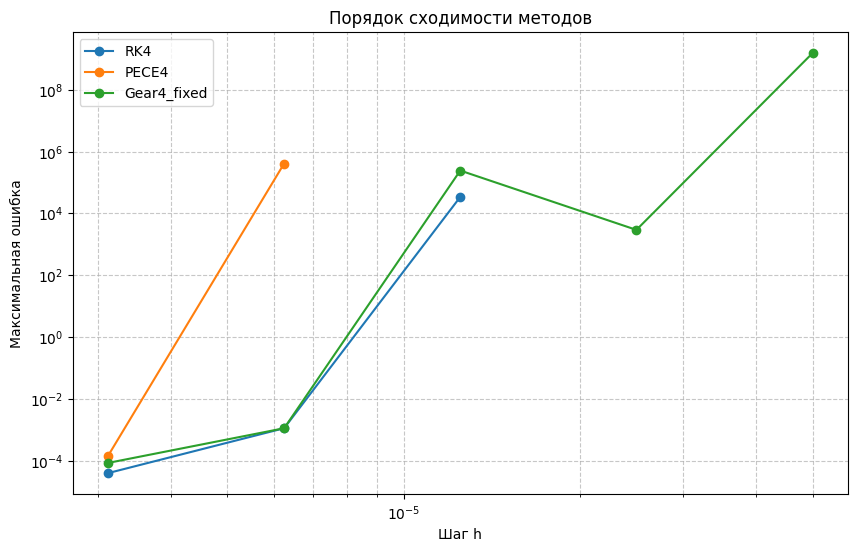

ITERATION 1 2
x0= 0.01 y0= 0.02
❌ rk4_solve: NaN или inf в решении (h=0.0001)
⚠️ RK4 при h=0.0001: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ pece4_solve: NaN или inf в решении (h=0.0001)
⚠️ PECE4 при h=0.0001: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ Gear4: расходимость на шаге 3, h=0.0001
❌ gear4_fixed_step: переполнение (h=0.0001)
⚠️ Gear4_fixed при h=0.0001: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ rk4_solve: NaN или inf в решении (h=5e-05)
⚠️ RK4 при h=5e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ pece4_solve: NaN или inf в решении (h=5e-05)
⚠️ PECE4 при h=5e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ Gear4: расходимость на шаге 3, h=5e-05
❌ gear4_fixed_step: переполнение (h=5e-05)
⚠️ Gear4_fixed при h=5e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ rk4_solve: NaN или inf в решении (h=2.5e-05)
⚠️ RK4 при h=2.5e-05: oper

C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:7: RuntimeWarning: overflow encountered in scalar multiply
  dydt = y * (2 * a2 - 0.5 * y - 3.5 * (a2_reg**2) * x)
C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:6: RuntimeWarning: invalid value encountered in scalar multiply
  dxdt = x * (1 - 0.5 * x - (2/7) * (a2_reg**-2) * y)
C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:7: RuntimeWarning: overflow encountered in scalar power
  dydt = y * (2 * a2 - 0.5 * y - 3.5 * (a2_reg**2) * x)
C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:7: RuntimeWarning: invalid value encountered in scalar subtract
  dydt = y * (2 * a2 - 0.5 * y - 3.5 * (a2_reg**2) * x)
C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:8: RuntimeWarning: overflow encountered in scalar multiply
  da2dt = epsilon * (2 - 7 * a2 * x)
C:\Users\lilia\AppData\Local\Programs\Python\Python313\Lib\site-packages\numpy\linalg\_linalg.py:2792: RuntimeWarning: 

❌ rk4_solve: NaN или inf в решении (h=1.25e-05)
⚠️ RK4 при h=1.25e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ pece4_solve: NaN или inf в решении (h=1.25e-05)
⚠️ PECE4 при h=1.25e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ Gear4: расходимость на шаге 3, h=1.25e-05
✅ gear4_fixed_step: успех, 4 шагов (h=1.25e-05)
✅ rk4_solve: успех, 1601 шагов (h=6.25e-06)
❌ pece4_solve: NaN или inf в решении (h=6.25e-06)
⚠️ PECE4 при h=6.25e-06: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ Gear4: расходимость на шаге 5, h=6.25e-06
✅ gear4_fixed_step: успех, 6 шагов (h=6.25e-06)
✅ rk4_solve: успех, 3201 шагов (h=3.125e-06)
✅ pece4_solve: успех, 3201 шагов (h=3.125e-06)
✅ gear4_fixed_step: успех, 3201 шагов (h=3.125e-06)
          h           RK4  p_RK4          PECE4  p_PECE4   Gear4_fixed  p_Gear4_fixed
0  0.000100           NaN    NaN            NaN      NaN           NaN            NaN
1  0.000050           NaN    NaN     

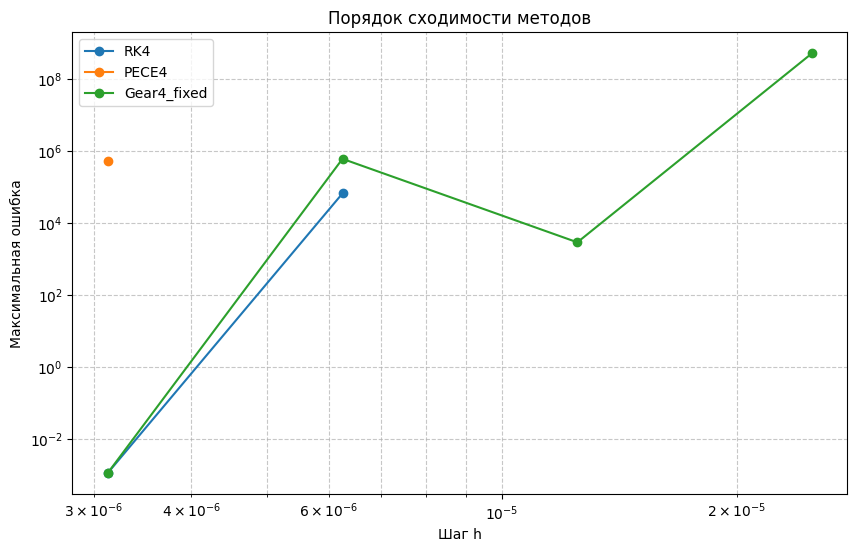

ITERATION 1 3
x0= 0.01 y0= 0.03
❌ rk4_solve: NaN или inf в решении (h=0.0001)
⚠️ RK4 при h=0.0001: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ pece4_solve: NaN или inf в решении (h=0.0001)
⚠️ PECE4 при h=0.0001: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ Gear4: расходимость на шаге 3, h=0.0001
❌ gear4_fixed_step: NaN или inf в решении (h=0.0001)
⚠️ Gear4_fixed при h=0.0001: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ rk4_solve: NaN или inf в решении (h=5e-05)
⚠️ RK4 при h=5e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ pece4_solve: NaN или inf в решении (h=5e-05)
⚠️ PECE4 при h=5e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ Gear4: расходимость на шаге 3, h=5e-05
❌ gear4_fixed_step: переполнение (h=5e-05)
⚠️ Gear4_fixed при h=5e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ rk4_solve: NaN или inf в решении (h=2.5e-05)
⚠️ RK4 при h=2.5e

C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:7: RuntimeWarning: overflow encountered in scalar multiply
  dydt = y * (2 * a2 - 0.5 * y - 3.5 * (a2_reg**2) * x)
C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:7: RuntimeWarning: overflow encountered in scalar power
  dydt = y * (2 * a2 - 0.5 * y - 3.5 * (a2_reg**2) * x)
C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:7: RuntimeWarning: invalid value encountered in scalar subtract
  dydt = y * (2 * a2 - 0.5 * y - 3.5 * (a2_reg**2) * x)
C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:8: RuntimeWarning: overflow encountered in scalar multiply
  da2dt = epsilon * (2 - 7 * a2 * x)
C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\1111329400.py:11: RuntimeWarning: invalid value encountered in add
  return y + h/6 * (k1 + 2*k2 + 2*k3 + k4)
C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\995573919.py:14: RuntimeWarning: invalid value encountered in add
  y_corr = y + h/24 * (9*

❌ pece4_solve: NaN или inf в решении (h=1.25e-05)
⚠️ PECE4 при h=1.25e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ Gear4: расходимость на шаге 3, h=1.25e-05
✅ gear4_fixed_step: успех, 4 шагов (h=1.25e-05)
❌ rk4_solve: NaN или inf в решении (h=6.25e-06)
⚠️ RK4 при h=6.25e-06: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ pece4_solve: NaN или inf в решении (h=6.25e-06)
⚠️ PECE4 при h=6.25e-06: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ Gear4: расходимость на шаге 3, h=6.25e-06
✅ gear4_fixed_step: успех, 4 шагов (h=6.25e-06)
✅ rk4_solve: успех, 3201 шагов (h=3.125e-06)
❌ pece4_solve: NaN или inf в решении (h=3.125e-06)
⚠️ PECE4 при h=3.125e-06: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ Gear4: расходимость на шаге 11, h=3.125e-06
✅ gear4_fixed_step: успех, 12 шагов (h=3.125e-06)
          h       RK4  p_RK4  PECE4  p_PECE4   Gear4_fixed  p_Gear4_fixed
0  0.000100       NaN    NaN    NaN    

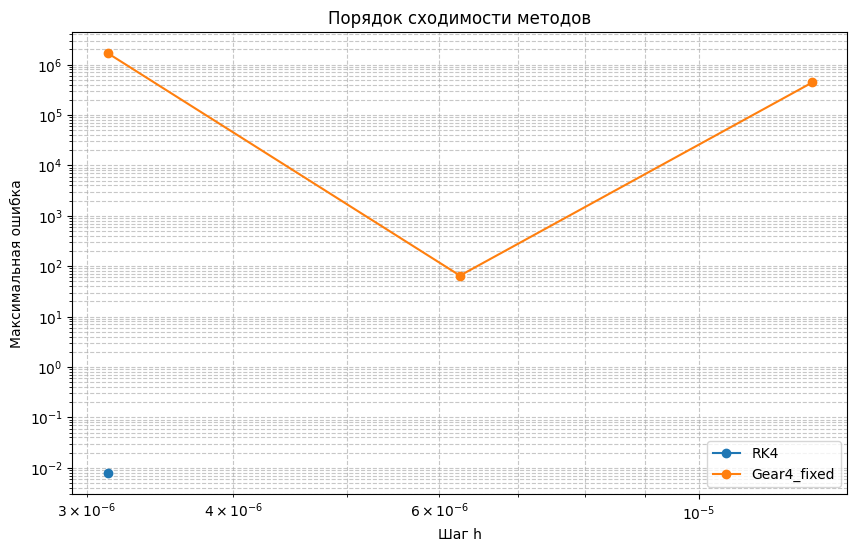

ITERATION 1 4
x0= 0.01 y0= 0.04
❌ rk4_solve: NaN или inf в решении (h=0.0001)
⚠️ RK4 при h=0.0001: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ pece4_solve: NaN или inf в решении (h=0.0001)
⚠️ PECE4 при h=0.0001: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ Gear4: расходимость на шаге 3, h=0.0001
❌ gear4_fixed_step: NaN или inf в решении (h=0.0001)
⚠️ Gear4_fixed при h=0.0001: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ rk4_solve: NaN или inf в решении (h=5e-05)
⚠️ RK4 при h=5e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ pece4_solve: NaN или inf в решении (h=5e-05)
⚠️ PECE4 при h=5e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ Gear4: расходимость на шаге 3, h=5e-05
❌ gear4_fixed_step: переполнение (h=5e-05)
⚠️ Gear4_fixed при h=5e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ rk4_solve: NaN или inf в решении (h=2.5e-05)
⚠️ RK4 при h=2.5e

C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:7: RuntimeWarning: overflow encountered in scalar multiply
  dydt = y * (2 * a2 - 0.5 * y - 3.5 * (a2_reg**2) * x)
C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:6: RuntimeWarning: invalid value encountered in scalar multiply
  dxdt = x * (1 - 0.5 * x - (2/7) * (a2_reg**-2) * y)
C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:7: RuntimeWarning: overflow encountered in scalar power
  dydt = y * (2 * a2 - 0.5 * y - 3.5 * (a2_reg**2) * x)
C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:7: RuntimeWarning: invalid value encountered in scalar subtract
  dydt = y * (2 * a2 - 0.5 * y - 3.5 * (a2_reg**2) * x)
C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:8: RuntimeWarning: overflow encountered in scalar multiply
  da2dt = epsilon * (2 - 7 * a2 * x)
C:\Users\lilia\AppData\Local\Programs\Python\Python313\Lib\site-packages\numpy\linalg\_linalg.py:2792: RuntimeWarning: 

❌ pece4_solve: NaN или inf в решении (h=1.25e-05)
⚠️ PECE4 при h=1.25e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ Gear4: расходимость на шаге 3, h=1.25e-05
✅ gear4_fixed_step: успех, 4 шагов (h=1.25e-05)
❌ rk4_solve: NaN или inf в решении (h=6.25e-06)
⚠️ RK4 при h=6.25e-06: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ pece4_solve: NaN или inf в решении (h=6.25e-06)
⚠️ PECE4 при h=6.25e-06: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ Gear4: расходимость на шаге 3, h=6.25e-06
✅ gear4_fixed_step: успех, 4 шагов (h=6.25e-06)
✅ rk4_solve: успех, 3201 шагов (h=3.125e-06)
❌ pece4_solve: NaN или inf в решении (h=3.125e-06)
⚠️ PECE4 при h=3.125e-06: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ Gear4: расходимость на шаге 4, h=3.125e-06
✅ gear4_fixed_step: успех, 5 шагов (h=3.125e-06)
          h           RK4  p_RK4  PECE4  p_PECE4   Gear4_fixed  p_Gear4_fixed
0  0.000100           NaN    NaN    N

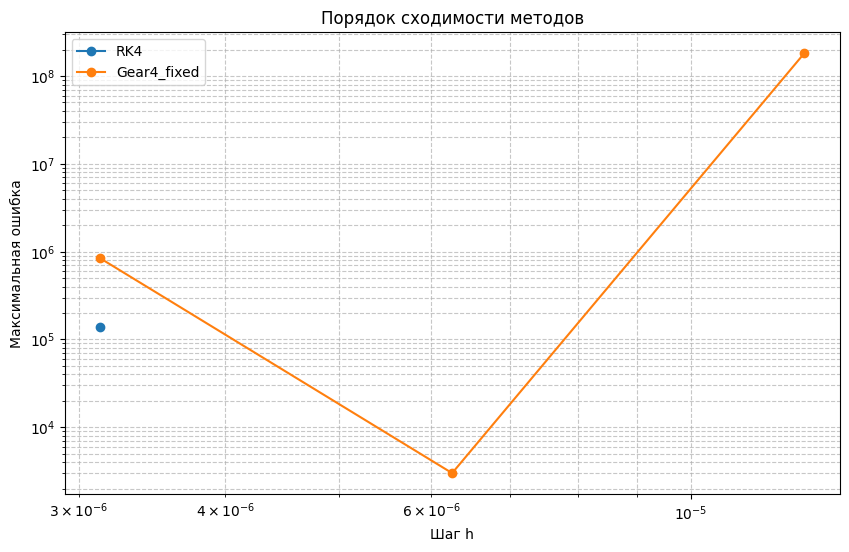

ITERATION 1 5
x0= 0.01 y0= 0.05
❌ rk4_solve: NaN или inf в решении (h=0.0001)
⚠️ RK4 при h=0.0001: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ pece4_solve: NaN или inf в решении (h=0.0001)
⚠️ PECE4 при h=0.0001: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ Gear4: расходимость на шаге 3, h=0.0001
❌ gear4_fixed_step: NaN или inf в решении (h=0.0001)
⚠️ Gear4_fixed при h=0.0001: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ rk4_solve: NaN или inf в решении (h=5e-05)
⚠️ RK4 при h=5e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ pece4_solve: NaN или inf в решении (h=5e-05)
⚠️ PECE4 при h=5e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ Gear4: расходимость на шаге 3, h=5e-05
❌ gear4_fixed_step: переполнение (h=5e-05)
⚠️ Gear4_fixed при h=5e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ rk4_solve: NaN или inf в решении (h=2.5e-05)
⚠️ RK4 при h=2.5e

C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:7: RuntimeWarning: overflow encountered in scalar multiply
  dydt = y * (2 * a2 - 0.5 * y - 3.5 * (a2_reg**2) * x)
C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:7: RuntimeWarning: invalid value encountered in scalar subtract
  dydt = y * (2 * a2 - 0.5 * y - 3.5 * (a2_reg**2) * x)
C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:7: RuntimeWarning: overflow encountered in scalar power
  dydt = y * (2 * a2 - 0.5 * y - 3.5 * (a2_reg**2) * x)
C:\Users\lilia\AppData\Local\Programs\Python\Python313\Lib\site-packages\numpy\linalg\_linalg.py:2792: RuntimeWarning: overflow encountered in dot
  sqnorm = x.dot(x)
C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:6: RuntimeWarning: invalid value encountered in scalar multiply
  dxdt = x * (1 - 0.5 * x - (2/7) * (a2_reg**-2) * y)
C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:8: RuntimeWarning: overflow encountered in scala

❌ pece4_solve: NaN или inf в решении (h=1.25e-05)
⚠️ PECE4 при h=1.25e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ Gear4: расходимость на шаге 3, h=1.25e-05
✅ gear4_fixed_step: успех, 4 шагов (h=1.25e-05)
❌ rk4_solve: NaN или inf в решении (h=6.25e-06)
⚠️ RK4 при h=6.25e-06: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ pece4_solve: NaN или inf в решении (h=6.25e-06)
⚠️ PECE4 при h=6.25e-06: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ Gear4: расходимость на шаге 3, h=6.25e-06
✅ gear4_fixed_step: успех, 4 шагов (h=6.25e-06)
✅ rk4_solve: успех, 3201 шагов (h=3.125e-06)
❌ pece4_solve: NaN или inf в решении (h=3.125e-06)
⚠️ PECE4 при h=3.125e-06: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ Gear4: расходимость на шаге 4, h=3.125e-06
✅ gear4_fixed_step: успех, 5 шагов (h=3.125e-06)
          h           RK4  p_RK4  PECE4  p_PECE4   Gear4_fixed  p_Gear4_fixed
0  0.000100           NaN    NaN    N

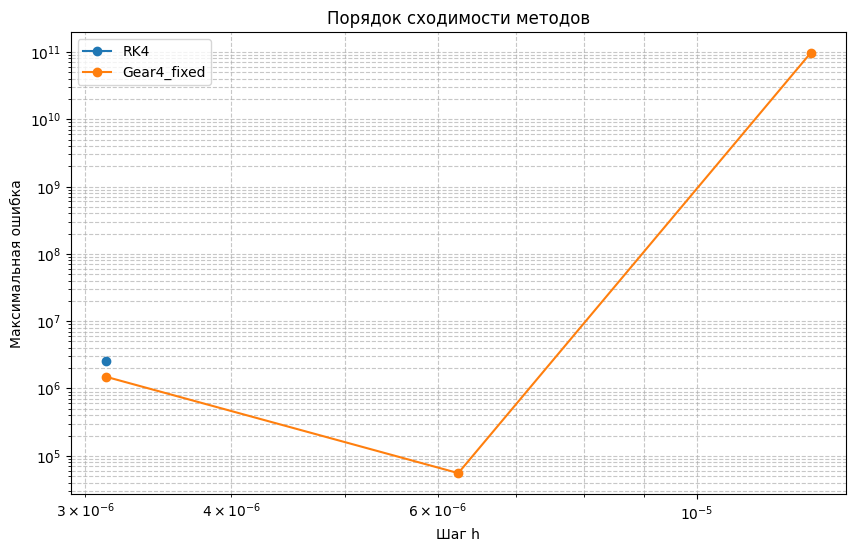

ITERATION 1 6
x0= 0.01 y0= 0.06
❌ rk4_solve: NaN или inf в решении (h=0.0001)
⚠️ RK4 при h=0.0001: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ pece4_solve: NaN или inf в решении (h=0.0001)
⚠️ PECE4 при h=0.0001: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ Gear4: расходимость на шаге 3, h=0.0001
❌ gear4_fixed_step: NaN или inf в решении (h=0.0001)
⚠️ Gear4_fixed при h=0.0001: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ rk4_solve: NaN или inf в решении (h=5e-05)
⚠️ RK4 при h=5e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ pece4_solve: NaN или inf в решении (h=5e-05)
⚠️ PECE4 при h=5e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ Gear4: расходимость на шаге 3, h=5e-05
❌ gear4_fixed_step: NaN или inf в решении (h=5e-05)
⚠️ Gear4_fixed при h=5e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ rk4_solve: NaN или inf в решении (h=2.5e-05)
⚠️ RK4 п

C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:7: RuntimeWarning: overflow encountered in scalar multiply
  dydt = y * (2 * a2 - 0.5 * y - 3.5 * (a2_reg**2) * x)
C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:6: RuntimeWarning: invalid value encountered in scalar multiply
  dxdt = x * (1 - 0.5 * x - (2/7) * (a2_reg**-2) * y)
C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:7: RuntimeWarning: overflow encountered in scalar power
  dydt = y * (2 * a2 - 0.5 * y - 3.5 * (a2_reg**2) * x)
C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:7: RuntimeWarning: invalid value encountered in scalar subtract
  dydt = y * (2 * a2 - 0.5 * y - 3.5 * (a2_reg**2) * x)
C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:8: RuntimeWarning: overflow encountered in scalar multiply
  da2dt = epsilon * (2 - 7 * a2 * x)
C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\1111329400.py:11: RuntimeWarning: invalid value encountered in add
  

❌ rk4_solve: NaN или inf в решении (h=1.25e-05)
⚠️ RK4 при h=1.25e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ pece4_solve: NaN или inf в решении (h=1.25e-05)
⚠️ PECE4 при h=1.25e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ Gear4: расходимость на шаге 3, h=1.25e-05
❌ gear4_fixed_step: переполнение (h=1.25e-05)
⚠️ Gear4_fixed при h=1.25e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ rk4_solve: NaN или inf в решении (h=6.25e-06)
⚠️ RK4 при h=6.25e-06: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ pece4_solve: NaN или inf в решении (h=6.25e-06)
⚠️ PECE4 при h=6.25e-06: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ Gear4: расходимость на шаге 3, h=6.25e-06
✅ gear4_fixed_step: успех, 4 шагов (h=6.25e-06)
❌ rk4_solve: NaN или inf в решении (h=3.125e-06)
⚠️ RK4 при h=3.125e-06: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ pece4_solve: NaN или inf

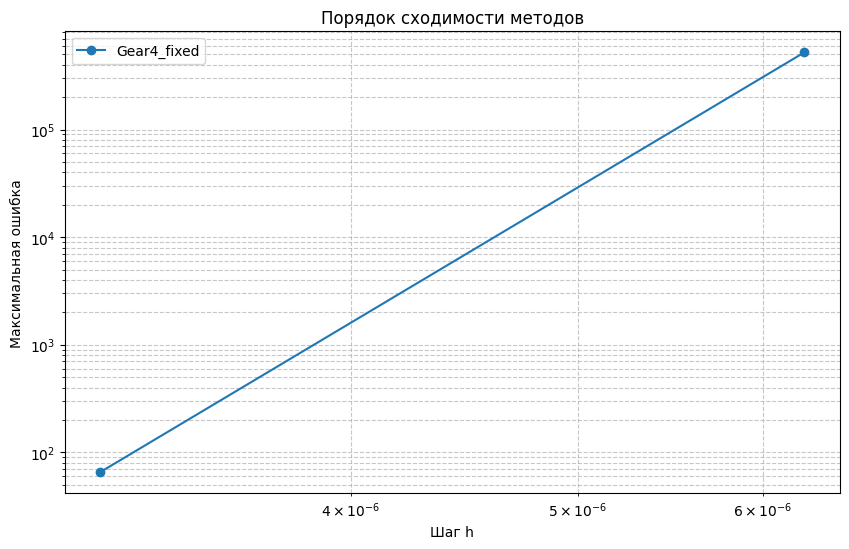

ITERATION 1 7
x0= 0.01 y0= 0.07
❌ rk4_solve: NaN или inf в решении (h=0.0001)
⚠️ RK4 при h=0.0001: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ pece4_solve: NaN или inf в решении (h=0.0001)
⚠️ PECE4 при h=0.0001: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ Gear4: расходимость на шаге 3, h=0.0001
❌ gear4_fixed_step: NaN или inf в решении (h=0.0001)
⚠️ Gear4_fixed при h=0.0001: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ rk4_solve: NaN или inf в решении (h=5e-05)
⚠️ RK4 при h=5e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ pece4_solve: NaN или inf в решении (h=5e-05)
⚠️ PECE4 при h=5e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ Gear4: расходимость на шаге 3, h=5e-05
❌ gear4_fixed_step: NaN или inf в решении (h=5e-05)
⚠️ Gear4_fixed при h=5e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ rk4_solve: NaN или inf в решении (h=2.5e-05)
⚠️ RK4 п

C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:7: RuntimeWarning: overflow encountered in scalar multiply
  dydt = y * (2 * a2 - 0.5 * y - 3.5 * (a2_reg**2) * x)
C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:6: RuntimeWarning: invalid value encountered in scalar multiply
  dxdt = x * (1 - 0.5 * x - (2/7) * (a2_reg**-2) * y)
C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:7: RuntimeWarning: overflow encountered in scalar power
  dydt = y * (2 * a2 - 0.5 * y - 3.5 * (a2_reg**2) * x)
C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:7: RuntimeWarning: invalid value encountered in scalar subtract
  dydt = y * (2 * a2 - 0.5 * y - 3.5 * (a2_reg**2) * x)
C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:8: RuntimeWarning: overflow encountered in scalar multiply
  da2dt = epsilon * (2 - 7 * a2 * x)
C:\Users\lilia\AppData\Local\Programs\Python\Python313\Lib\site-packages\numpy\linalg\_linalg.py:2792: RuntimeWarning: 

❌ pece4_solve: NaN или inf в решении (h=1.25e-05)
⚠️ PECE4 при h=1.25e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ Gear4: расходимость на шаге 3, h=1.25e-05
❌ gear4_fixed_step: переполнение (h=1.25e-05)
⚠️ Gear4_fixed при h=1.25e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ rk4_solve: NaN или inf в решении (h=6.25e-06)
⚠️ RK4 при h=6.25e-06: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ pece4_solve: NaN или inf в решении (h=6.25e-06)
⚠️ PECE4 при h=6.25e-06: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ Gear4: расходимость на шаге 3, h=6.25e-06
✅ gear4_fixed_step: успех, 4 шагов (h=6.25e-06)
❌ rk4_solve: NaN или inf в решении (h=3.125e-06)
⚠️ RK4 при h=3.125e-06: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ pece4_solve: NaN или inf в решении (h=3.125e-06)
⚠️ PECE4 при h=3.125e-06: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ Gear4: расходимост

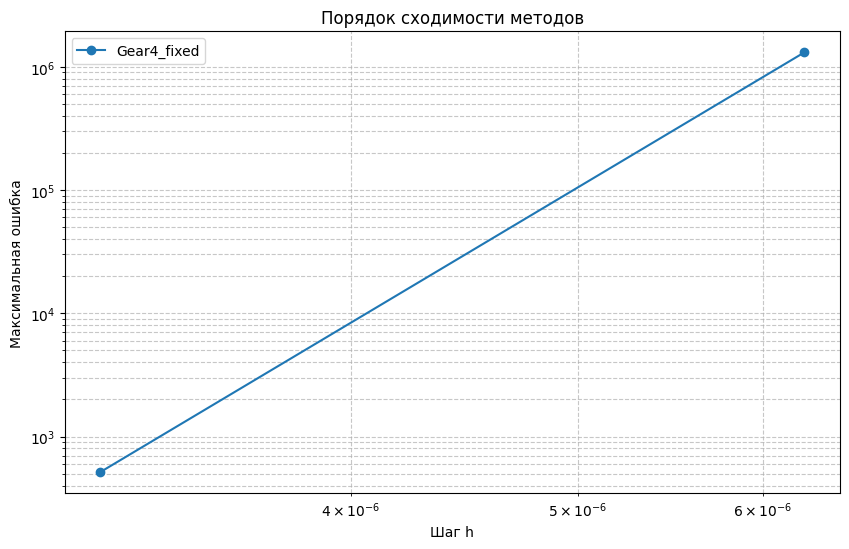

ITERATION 1 8
x0= 0.01 y0= 0.08
❌ rk4_solve: NaN или inf в решении (h=0.0001)
⚠️ RK4 при h=0.0001: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ pece4_solve: NaN или inf в решении (h=0.0001)
⚠️ PECE4 при h=0.0001: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ Gear4: расходимость на шаге 3, h=0.0001
❌ gear4_fixed_step: NaN или inf в решении (h=0.0001)
⚠️ Gear4_fixed при h=0.0001: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ rk4_solve: NaN или inf в решении (h=5e-05)
⚠️ RK4 при h=5e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ pece4_solve: NaN или inf в решении (h=5e-05)
⚠️ PECE4 при h=5e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ Gear4: расходимость на шаге 3, h=5e-05
❌ gear4_fixed_step: NaN или inf в решении (h=5e-05)
⚠️ Gear4_fixed при h=5e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ rk4_solve: NaN или inf в решении (h=2.5e-05)
⚠️ RK4 п

C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:7: RuntimeWarning: overflow encountered in scalar multiply
  dydt = y * (2 * a2 - 0.5 * y - 3.5 * (a2_reg**2) * x)
C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:6: RuntimeWarning: invalid value encountered in scalar multiply
  dxdt = x * (1 - 0.5 * x - (2/7) * (a2_reg**-2) * y)
C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:7: RuntimeWarning: overflow encountered in scalar power
  dydt = y * (2 * a2 - 0.5 * y - 3.5 * (a2_reg**2) * x)
C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:7: RuntimeWarning: invalid value encountered in scalar subtract
  dydt = y * (2 * a2 - 0.5 * y - 3.5 * (a2_reg**2) * x)
C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:8: RuntimeWarning: overflow encountered in scalar multiply
  da2dt = epsilon * (2 - 7 * a2 * x)
C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\1111329400.py:11: RuntimeWarning: invalid value encountered in add
  

❌ rk4_solve: NaN или inf в решении (h=1.25e-05)
⚠️ RK4 при h=1.25e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ pece4_solve: NaN или inf в решении (h=1.25e-05)
⚠️ PECE4 при h=1.25e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ Gear4: расходимость на шаге 3, h=1.25e-05
❌ gear4_fixed_step: переполнение (h=1.25e-05)
⚠️ Gear4_fixed при h=1.25e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ rk4_solve: NaN или inf в решении (h=6.25e-06)
⚠️ RK4 при h=6.25e-06: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ pece4_solve: NaN или inf в решении (h=6.25e-06)
⚠️ PECE4 при h=6.25e-06: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ Gear4: расходимость на шаге 3, h=6.25e-06
✅ gear4_fixed_step: успех, 4 шагов (h=6.25e-06)
❌ rk4_solve: NaN или inf в решении (h=3.125e-06)
⚠️ RK4 при h=3.125e-06: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ pece4_solve: NaN или inf

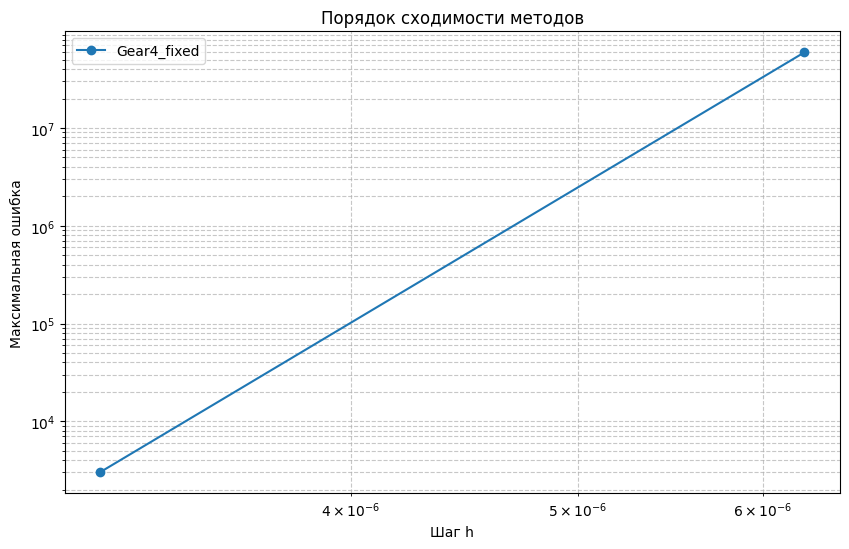

ITERATION 1 9
x0= 0.01 y0= 0.09
❌ rk4_solve: NaN или inf в решении (h=0.0001)
⚠️ RK4 при h=0.0001: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ pece4_solve: NaN или inf в решении (h=0.0001)
⚠️ PECE4 при h=0.0001: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ Gear4: расходимость на шаге 3, h=0.0001
❌ gear4_fixed_step: NaN или inf в решении (h=0.0001)
⚠️ Gear4_fixed при h=0.0001: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ rk4_solve: NaN или inf в решении (h=5e-05)
⚠️ RK4 при h=5e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ pece4_solve: NaN или inf в решении (h=5e-05)
⚠️ PECE4 при h=5e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ Gear4: расходимость на шаге 3, h=5e-05
❌ gear4_fixed_step: NaN или inf в решении (h=5e-05)
⚠️ Gear4_fixed при h=5e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ rk4_solve: NaN или inf в решении (h=2.5e-05)
⚠️ RK4 п

C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:7: RuntimeWarning: overflow encountered in scalar multiply
  dydt = y * (2 * a2 - 0.5 * y - 3.5 * (a2_reg**2) * x)
C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:6: RuntimeWarning: invalid value encountered in scalar multiply
  dxdt = x * (1 - 0.5 * x - (2/7) * (a2_reg**-2) * y)
C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:7: RuntimeWarning: overflow encountered in scalar power
  dydt = y * (2 * a2 - 0.5 * y - 3.5 * (a2_reg**2) * x)
C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:7: RuntimeWarning: invalid value encountered in scalar subtract
  dydt = y * (2 * a2 - 0.5 * y - 3.5 * (a2_reg**2) * x)
C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:8: RuntimeWarning: overflow encountered in scalar multiply
  da2dt = epsilon * (2 - 7 * a2 * x)
C:\Users\lilia\AppData\Local\Programs\Python\Python313\Lib\site-packages\numpy\linalg\_linalg.py:2792: RuntimeWarning: 

❌ pece4_solve: NaN или inf в решении (h=1.25e-05)
⚠️ PECE4 при h=1.25e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ Gear4: расходимость на шаге 3, h=1.25e-05
❌ gear4_fixed_step: переполнение (h=1.25e-05)
⚠️ Gear4_fixed при h=1.25e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ rk4_solve: NaN или inf в решении (h=6.25e-06)
⚠️ RK4 при h=6.25e-06: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ pece4_solve: NaN или inf в решении (h=6.25e-06)
⚠️ PECE4 при h=6.25e-06: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ Gear4: расходимость на шаге 3, h=6.25e-06
✅ gear4_fixed_step: успех, 4 шагов (h=6.25e-06)
❌ rk4_solve: NaN или inf в решении (h=3.125e-06)
⚠️ RK4 при h=3.125e-06: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ pece4_solve: NaN или inf в решении (h=3.125e-06)
⚠️ PECE4 при h=3.125e-06: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ Gear4: расходимост

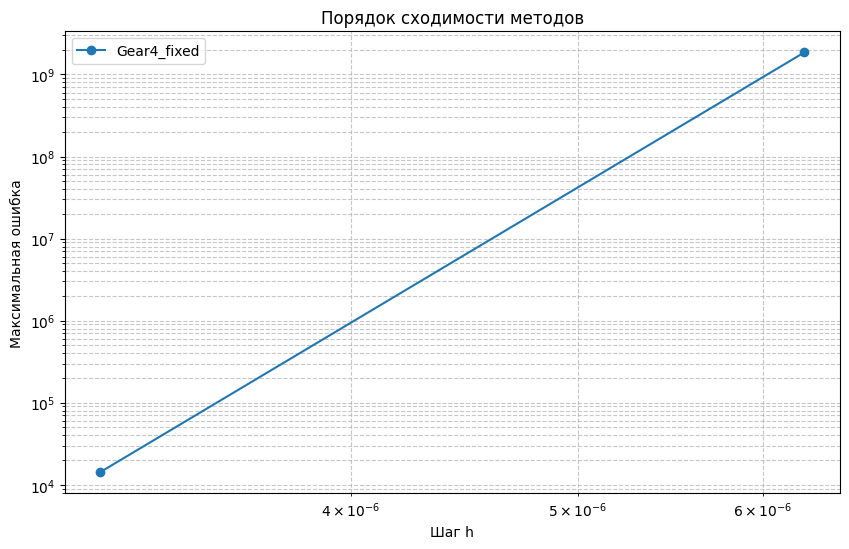

ITERATION 2 0
x0= 0.02 y0= 0.0
✅ rk4_solve: успех, 101 шагов (h=0.0001)
✅ pece4_solve: успех, 101 шагов (h=0.0001)
✅ gear4_fixed_step: успех, 101 шагов (h=0.0001)
✅ rk4_solve: успех, 201 шагов (h=5e-05)
✅ pece4_solve: успех, 201 шагов (h=5e-05)
✅ gear4_fixed_step: успех, 201 шагов (h=5e-05)
✅ rk4_solve: успех, 401 шагов (h=2.5e-05)
✅ pece4_solve: успех, 401 шагов (h=2.5e-05)
✅ gear4_fixed_step: успех, 401 шагов (h=2.5e-05)
✅ rk4_solve: успех, 801 шагов (h=1.25e-05)
✅ pece4_solve: успех, 801 шагов (h=1.25e-05)
✅ gear4_fixed_step: успех, 801 шагов (h=1.25e-05)
✅ rk4_solve: успех, 1601 шагов (h=6.25e-06)
✅ pece4_solve: успех, 1601 шагов (h=6.25e-06)
✅ gear4_fixed_step: успех, 1601 шагов (h=6.25e-06)
✅ rk4_solve: успех, 3201 шагов (h=3.125e-06)
✅ pece4_solve: успех, 3201 шагов (h=3.125e-06)
✅ gear4_fixed_step: успех, 3201 шагов (h=3.125e-06)
          h           RK4  p_RK4         PECE4  p_PECE4   Gear4_fixed  p_Gear4_fixed
0  0.000100  3.286301e-10    NaN  3.286301e-10      NaN  3.290391

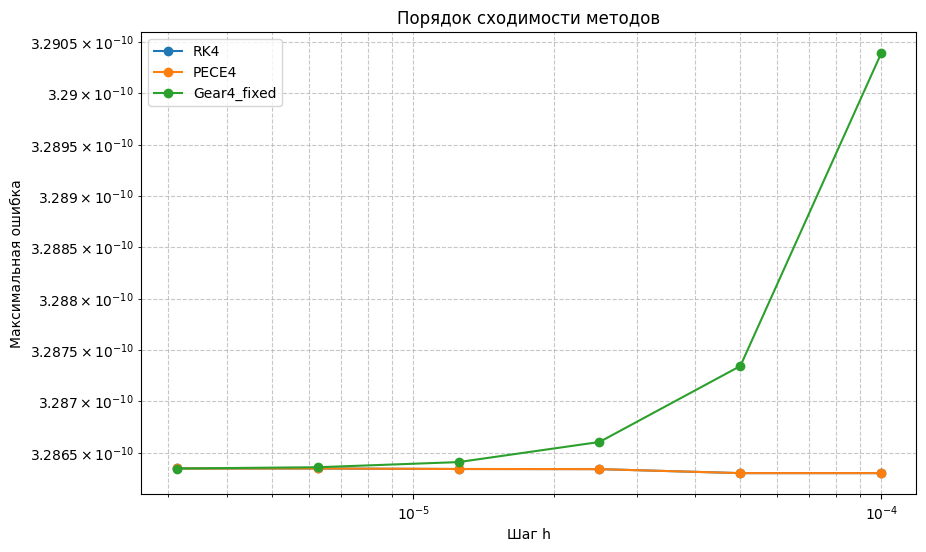

ITERATION 2 1
x0= 0.02 y0= 0.01
❌ rk4_solve: NaN или inf в решении (h=0.0001)
⚠️ RK4 при h=0.0001: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ pece4_solve: NaN или inf в решении (h=0.0001)
⚠️ PECE4 при h=0.0001: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ Gear4: расходимость на шаге 3, h=0.0001
❌ gear4_fixed_step: переполнение (h=0.0001)
⚠️ Gear4_fixed при h=0.0001: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ rk4_solve: NaN или inf в решении (h=5e-05)
⚠️ RK4 при h=5e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ pece4_solve: NaN или inf в решении (h=5e-05)
⚠️ PECE4 при h=5e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ Gear4: расходимость на шаге 3, h=5e-05
✅ gear4_fixed_step: успех, 4 шагов (h=5e-05)
❌ rk4_solve: NaN или inf в решении (h=2.5e-05)
⚠️ RK4 при h=2.5e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ pece4_solve: NaN или inf в р

C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:7: RuntimeWarning: overflow encountered in scalar multiply
  dydt = y * (2 * a2 - 0.5 * y - 3.5 * (a2_reg**2) * x)
C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:6: RuntimeWarning: invalid value encountered in scalar multiply
  dxdt = x * (1 - 0.5 * x - (2/7) * (a2_reg**-2) * y)
C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:7: RuntimeWarning: overflow encountered in scalar power
  dydt = y * (2 * a2 - 0.5 * y - 3.5 * (a2_reg**2) * x)
C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:7: RuntimeWarning: invalid value encountered in scalar subtract
  dydt = y * (2 * a2 - 0.5 * y - 3.5 * (a2_reg**2) * x)
C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:8: RuntimeWarning: overflow encountered in scalar multiply
  da2dt = epsilon * (2 - 7 * a2 * x)
C:\Users\lilia\AppData\Local\Programs\Python\Python313\Lib\site-packages\numpy\linalg\_linalg.py:2792: RuntimeWarning: 

❌ Gear4: расходимость на шаге 3, h=2.5e-05
✅ gear4_fixed_step: успех, 4 шагов (h=2.5e-05)
✅ rk4_solve: успех, 801 шагов (h=1.25e-05)
❌ pece4_solve: NaN или inf в решении (h=1.25e-05)
⚠️ PECE4 при h=1.25e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ Gear4: расходимость на шаге 4, h=1.25e-05
✅ gear4_fixed_step: успех, 5 шагов (h=1.25e-05)
✅ rk4_solve: успех, 1601 шагов (h=6.25e-06)
✅ pece4_solve: успех, 1601 шагов (h=6.25e-06)
✅ gear4_fixed_step: успех, 1601 шагов (h=6.25e-06)
✅ rk4_solve: успех, 3201 шагов (h=3.125e-06)
✅ pece4_solve: успех, 3201 шагов (h=3.125e-06)
✅ gear4_fixed_step: успех, 3201 шагов (h=3.125e-06)
          h           RK4  p_RK4          PECE4  p_PECE4   Gear4_fixed  p_Gear4_fixed
0  0.000100           NaN    NaN            NaN      NaN           NaN            NaN
1  0.000050           NaN    NaN            NaN      NaN  6.105448e+09            NaN
2  0.000025           NaN    NaN            NaN      NaN  5.845276e+03          19.99
3  0.

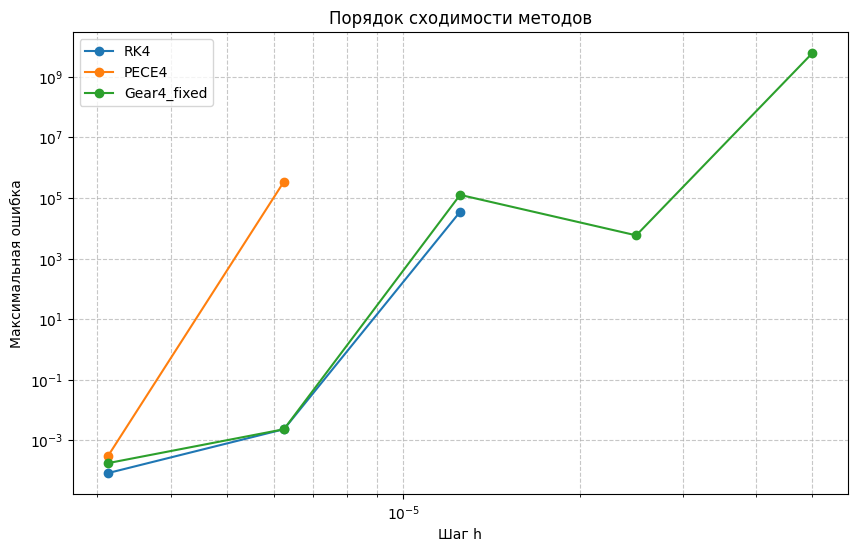

ITERATION 2 2
x0= 0.02 y0= 0.02
❌ rk4_solve: NaN или inf в решении (h=0.0001)
⚠️ RK4 при h=0.0001: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ pece4_solve: NaN или inf в решении (h=0.0001)
⚠️ PECE4 при h=0.0001: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ Gear4: расходимость на шаге 3, h=0.0001
❌ gear4_fixed_step: переполнение (h=0.0001)
⚠️ Gear4_fixed при h=0.0001: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ rk4_solve: NaN или inf в решении (h=5e-05)
⚠️ RK4 при h=5e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ pece4_solve: NaN или inf в решении (h=5e-05)
⚠️ PECE4 при h=5e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ Gear4: расходимость на шаге 3, h=5e-05
❌ gear4_fixed_step: переполнение (h=5e-05)
⚠️ Gear4_fixed при h=5e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ rk4_solve: NaN или inf в решении (h=2.5e-05)
⚠️ RK4 при h=2.5e-05: oper

C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:7: RuntimeWarning: overflow encountered in scalar multiply
  dydt = y * (2 * a2 - 0.5 * y - 3.5 * (a2_reg**2) * x)
C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:6: RuntimeWarning: invalid value encountered in scalar multiply
  dxdt = x * (1 - 0.5 * x - (2/7) * (a2_reg**-2) * y)
C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:7: RuntimeWarning: overflow encountered in scalar power
  dydt = y * (2 * a2 - 0.5 * y - 3.5 * (a2_reg**2) * x)
C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:7: RuntimeWarning: invalid value encountered in scalar subtract
  dydt = y * (2 * a2 - 0.5 * y - 3.5 * (a2_reg**2) * x)
C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:8: RuntimeWarning: overflow encountered in scalar multiply
  da2dt = epsilon * (2 - 7 * a2 * x)
C:\Users\lilia\AppData\Local\Programs\Python\Python313\Lib\site-packages\numpy\linalg\_linalg.py:2792: RuntimeWarning: 

❌ rk4_solve: NaN или inf в решении (h=1.25e-05)
⚠️ RK4 при h=1.25e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ pece4_solve: NaN или inf в решении (h=1.25e-05)
⚠️ PECE4 при h=1.25e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ Gear4: расходимость на шаге 3, h=1.25e-05
✅ gear4_fixed_step: успех, 4 шагов (h=1.25e-05)
✅ rk4_solve: успех, 1601 шагов (h=6.25e-06)
❌ pece4_solve: NaN или inf в решении (h=6.25e-06)
⚠️ PECE4 при h=6.25e-06: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ Gear4: расходимость на шаге 4, h=6.25e-06
✅ gear4_fixed_step: успех, 5 шагов (h=6.25e-06)
✅ rk4_solve: успех, 3201 шагов (h=3.125e-06)
✅ pece4_solve: успех, 3201 шагов (h=3.125e-06)
✅ gear4_fixed_step: успех, 3201 шагов (h=3.125e-06)
          h           RK4  p_RK4          PECE4  p_PECE4   Gear4_fixed  p_Gear4_fixed
0  0.000100           NaN    NaN            NaN      NaN           NaN            NaN
1  0.000050           NaN    NaN     

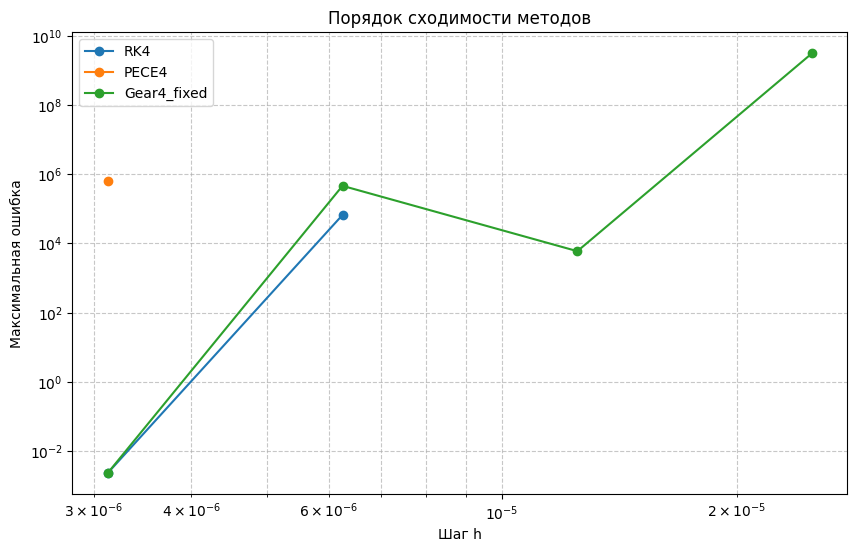

ITERATION 2 3
x0= 0.02 y0= 0.03
❌ rk4_solve: NaN или inf в решении (h=0.0001)
⚠️ RK4 при h=0.0001: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ pece4_solve: NaN или inf в решении (h=0.0001)
⚠️ PECE4 при h=0.0001: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ Gear4: расходимость на шаге 3, h=0.0001
❌ gear4_fixed_step: переполнение (h=0.0001)
⚠️ Gear4_fixed при h=0.0001: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ rk4_solve: NaN или inf в решении (h=5e-05)
⚠️ RK4 при h=5e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ pece4_solve: NaN или inf в решении (h=5e-05)
⚠️ PECE4 при h=5e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ Gear4: расходимость на шаге 3, h=5e-05
❌ gear4_fixed_step: переполнение (h=5e-05)
⚠️ Gear4_fixed при h=5e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ rk4_solve: NaN или inf в решении (h=2.5e-05)
⚠️ RK4 при h=2.5e-05: oper

C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:7: RuntimeWarning: overflow encountered in scalar multiply
  dydt = y * (2 * a2 - 0.5 * y - 3.5 * (a2_reg**2) * x)
C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:6: RuntimeWarning: invalid value encountered in scalar multiply
  dxdt = x * (1 - 0.5 * x - (2/7) * (a2_reg**-2) * y)
C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:7: RuntimeWarning: overflow encountered in scalar power
  dydt = y * (2 * a2 - 0.5 * y - 3.5 * (a2_reg**2) * x)
C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:7: RuntimeWarning: invalid value encountered in scalar subtract
  dydt = y * (2 * a2 - 0.5 * y - 3.5 * (a2_reg**2) * x)
C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:8: RuntimeWarning: overflow encountered in scalar multiply
  da2dt = epsilon * (2 - 7 * a2 * x)
C:\Users\lilia\AppData\Local\Programs\Python\Python313\Lib\site-packages\numpy\linalg\_linalg.py:2792: RuntimeWarning: 

❌ pece4_solve: NaN или inf в решении (h=1.25e-05)
⚠️ PECE4 при h=1.25e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ Gear4: расходимость на шаге 3, h=1.25e-05
✅ gear4_fixed_step: успех, 4 шагов (h=1.25e-05)
❌ rk4_solve: NaN или inf в решении (h=6.25e-06)
⚠️ RK4 при h=6.25e-06: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ pece4_solve: NaN или inf в решении (h=6.25e-06)
⚠️ PECE4 при h=6.25e-06: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ Gear4: расходимость на шаге 3, h=6.25e-06
✅ gear4_fixed_step: успех, 4 шагов (h=6.25e-06)
✅ rk4_solve: успех, 3201 шагов (h=3.125e-06)
❌ pece4_solve: NaN или inf в решении (h=3.125e-06)
⚠️ PECE4 при h=3.125e-06: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ Gear4: расходимость на шаге 8, h=3.125e-06
✅ gear4_fixed_step: успех, 9 шагов (h=3.125e-06)
          h       RK4  p_RK4  PECE4  p_PECE4   Gear4_fixed  p_Gear4_fixed
0  0.000100       NaN    NaN    NaN      

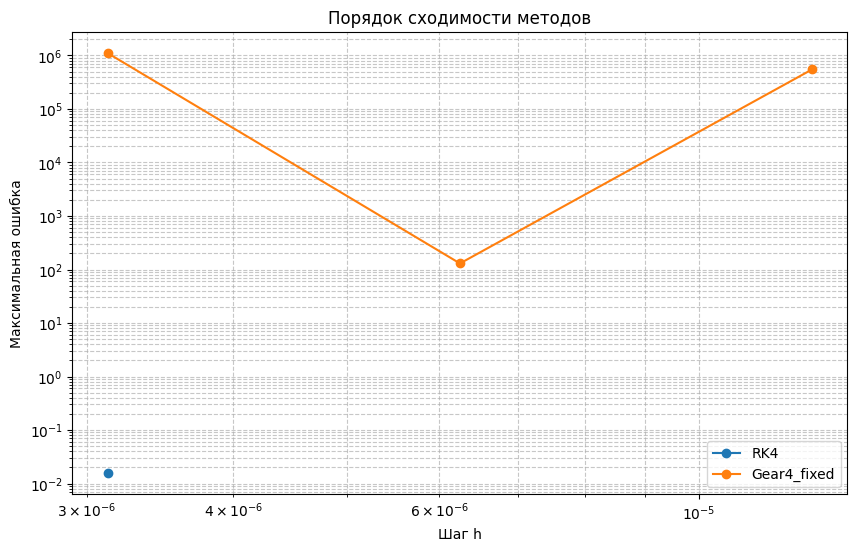

ITERATION 2 4
x0= 0.02 y0= 0.04
❌ rk4_solve: NaN или inf в решении (h=0.0001)
⚠️ RK4 при h=0.0001: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ pece4_solve: NaN или inf в решении (h=0.0001)
⚠️ PECE4 при h=0.0001: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ Gear4: расходимость на шаге 3, h=0.0001
❌ gear4_fixed_step: NaN или inf в решении (h=0.0001)
⚠️ Gear4_fixed при h=0.0001: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ rk4_solve: NaN или inf в решении (h=5e-05)
⚠️ RK4 при h=5e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ pece4_solve: NaN или inf в решении (h=5e-05)
⚠️ PECE4 при h=5e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ Gear4: расходимость на шаге 3, h=5e-05
❌ gear4_fixed_step: переполнение (h=5e-05)
⚠️ Gear4_fixed при h=5e-05: operands could not be broadcast together with shapes (1,0) (1,3) 


C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:7: RuntimeWarning: overflow encountered in scalar multiply
  dydt = y * (2 * a2 - 0.5 * y - 3.5 * (a2_reg**2) * x)
C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:7: RuntimeWarning: invalid value encountered in scalar subtract
  dydt = y * (2 * a2 - 0.5 * y - 3.5 * (a2_reg**2) * x)
C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:7: RuntimeWarning: overflow encountered in scalar power
  dydt = y * (2 * a2 - 0.5 * y - 3.5 * (a2_reg**2) * x)
C:\Users\lilia\AppData\Local\Programs\Python\Python313\Lib\site-packages\numpy\linalg\_linalg.py:2792: RuntimeWarning: overflow encountered in dot
  sqnorm = x.dot(x)
C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:6: RuntimeWarning: invalid value encountered in scalar multiply
  dxdt = x * (1 - 0.5 * x - (2/7) * (a2_reg**-2) * y)
C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:8: RuntimeWarning: overflow encountered in scala

❌ rk4_solve: NaN или inf в решении (h=2.5e-05)
⚠️ RK4 при h=2.5e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ pece4_solve: NaN или inf в решении (h=2.5e-05)
⚠️ PECE4 при h=2.5e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ Gear4: расходимость на шаге 3, h=2.5e-05
❌ gear4_fixed_step: переполнение (h=2.5e-05)
⚠️ Gear4_fixed при h=2.5e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ rk4_solve: NaN или inf в решении (h=1.25e-05)
⚠️ RK4 при h=1.25e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ pece4_solve: NaN или inf в решении (h=1.25e-05)
⚠️ PECE4 при h=1.25e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ Gear4: расходимость на шаге 3, h=1.25e-05
✅ gear4_fixed_step: успех, 4 шагов (h=1.25e-05)
❌ rk4_solve: NaN или inf в решении (h=6.25e-06)
⚠️ RK4 при h=6.25e-06: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ pece4_solve: NaN или inf в решени

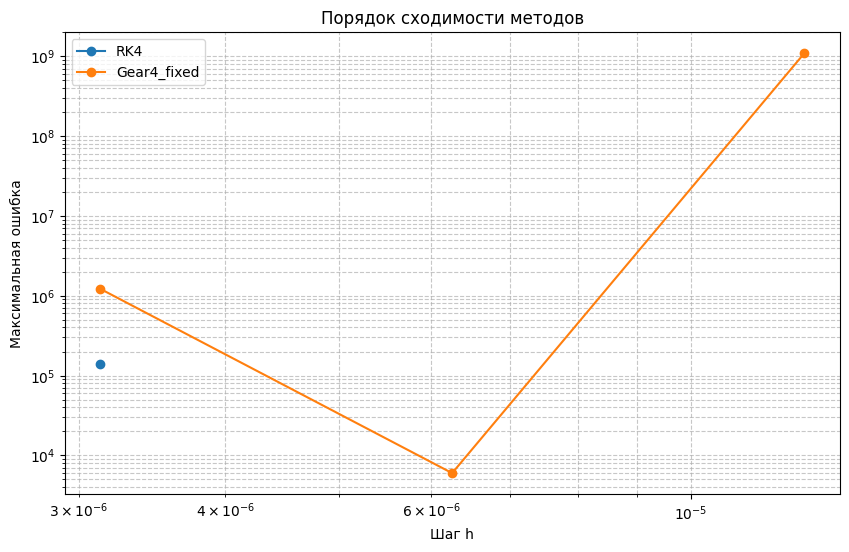

ITERATION 2 5
x0= 0.02 y0= 0.05
❌ rk4_solve: NaN или inf в решении (h=0.0001)
⚠️ RK4 при h=0.0001: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ pece4_solve: NaN или inf в решении (h=0.0001)
⚠️ PECE4 при h=0.0001: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ Gear4: расходимость на шаге 3, h=0.0001
❌ gear4_fixed_step: NaN или inf в решении (h=0.0001)
⚠️ Gear4_fixed при h=0.0001: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ rk4_solve: NaN или inf в решении (h=5e-05)
⚠️ RK4 при h=5e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ pece4_solve: NaN или inf в решении (h=5e-05)
⚠️ PECE4 при h=5e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ Gear4: расходимость на шаге 3, h=5e-05
❌ gear4_fixed_step: NaN или inf в решении (h=5e-05)
⚠️ Gear4_fixed при h=5e-05: operands could not be broadcast together with shapes (1,0) (1,3) 


C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:7: RuntimeWarning: overflow encountered in scalar multiply
  dydt = y * (2 * a2 - 0.5 * y - 3.5 * (a2_reg**2) * x)
C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:7: RuntimeWarning: overflow encountered in scalar power
  dydt = y * (2 * a2 - 0.5 * y - 3.5 * (a2_reg**2) * x)
C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:7: RuntimeWarning: invalid value encountered in scalar subtract
  dydt = y * (2 * a2 - 0.5 * y - 3.5 * (a2_reg**2) * x)
C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:8: RuntimeWarning: overflow encountered in scalar multiply
  da2dt = epsilon * (2 - 7 * a2 * x)
C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\1111329400.py:7: RuntimeWarning: invalid value encountered in add
  k2 = f(t + h/2, y + h/2 * k1, epsilon)
C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\995573919.py:8: RuntimeWarning: invalid value encountered in add
  y_pred = y + h/24 * (55*f_v

❌ rk4_solve: NaN или inf в решении (h=2.5e-05)
⚠️ RK4 при h=2.5e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ pece4_solve: NaN или inf в решении (h=2.5e-05)
⚠️ PECE4 при h=2.5e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ Gear4: расходимость на шаге 3, h=2.5e-05
❌ gear4_fixed_step: переполнение (h=2.5e-05)
⚠️ Gear4_fixed при h=2.5e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ rk4_solve: NaN или inf в решении (h=1.25e-05)
⚠️ RK4 при h=1.25e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ pece4_solve: NaN или inf в решении (h=1.25e-05)
⚠️ PECE4 при h=1.25e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ Gear4: расходимость на шаге 3, h=1.25e-05
✅ gear4_fixed_step: успех, 4 шагов (h=1.25e-05)
❌ rk4_solve: NaN или inf в решении (h=6.25e-06)
⚠️ RK4 при h=6.25e-06: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ pece4_solve: NaN или inf в решени

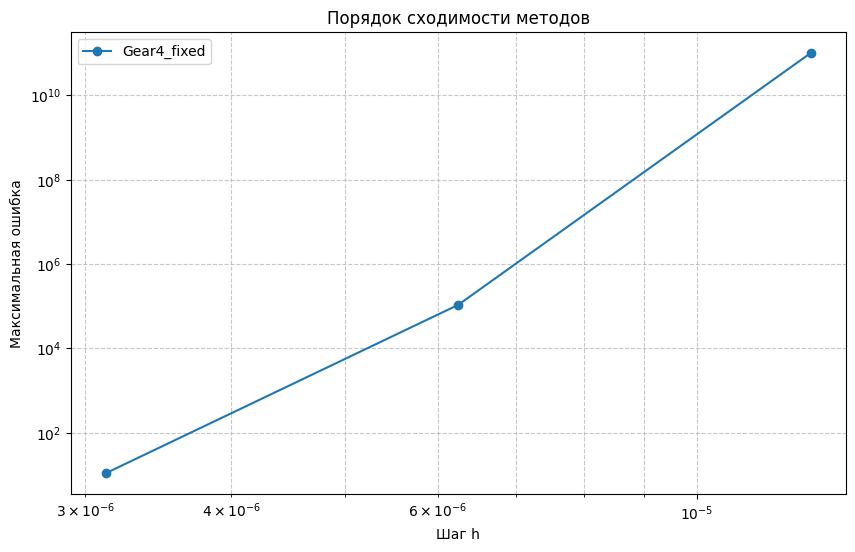

ITERATION 2 6
x0= 0.02 y0= 0.06
❌ rk4_solve: NaN или inf в решении (h=0.0001)
⚠️ RK4 при h=0.0001: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ pece4_solve: NaN или inf в решении (h=0.0001)
⚠️ PECE4 при h=0.0001: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ Gear4: расходимость на шаге 3, h=0.0001
❌ gear4_fixed_step: NaN или inf в решении (h=0.0001)
⚠️ Gear4_fixed при h=0.0001: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ rk4_solve: NaN или inf в решении (h=5e-05)
⚠️ RK4 при h=5e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ pece4_solve: NaN или inf в решении (h=5e-05)
⚠️ PECE4 при h=5e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ Gear4: расходимость на шаге 3, h=5e-05
❌ gear4_fixed_step: NaN или inf в решении (h=5e-05)
⚠️ Gear4_fixed при h=5e-05: operands could not be broadcast together with shapes (1,0) (1,3) 


C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:7: RuntimeWarning: overflow encountered in scalar multiply
  dydt = y * (2 * a2 - 0.5 * y - 3.5 * (a2_reg**2) * x)
C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:6: RuntimeWarning: invalid value encountered in scalar multiply
  dxdt = x * (1 - 0.5 * x - (2/7) * (a2_reg**-2) * y)
C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:7: RuntimeWarning: overflow encountered in scalar power
  dydt = y * (2 * a2 - 0.5 * y - 3.5 * (a2_reg**2) * x)
C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:7: RuntimeWarning: invalid value encountered in scalar subtract
  dydt = y * (2 * a2 - 0.5 * y - 3.5 * (a2_reg**2) * x)
C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:8: RuntimeWarning: overflow encountered in scalar multiply
  da2dt = epsilon * (2 - 7 * a2 * x)
C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\1111329400.py:11: RuntimeWarning: invalid value encountered in add
  

❌ rk4_solve: NaN или inf в решении (h=2.5e-05)
⚠️ RK4 при h=2.5e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ pece4_solve: NaN или inf в решении (h=2.5e-05)
⚠️ PECE4 при h=2.5e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ Gear4: расходимость на шаге 3, h=2.5e-05
❌ gear4_fixed_step: переполнение (h=2.5e-05)
⚠️ Gear4_fixed при h=2.5e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ rk4_solve: NaN или inf в решении (h=1.25e-05)
⚠️ RK4 при h=1.25e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ pece4_solve: NaN или inf в решении (h=1.25e-05)
⚠️ PECE4 при h=1.25e-05: operands could not be broadcast together with shapes (1,0) (1,3) 


C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3752895320.py:31: RuntimeWarning: invalid value encountered in scalar divide
  err = np.linalg.norm(y_next - y_new) / (1 + np.linalg.norm(y_new))


❌ Gear4: расходимость на шаге 3, h=1.25e-05
❌ gear4_fixed_step: переполнение (h=1.25e-05)
⚠️ Gear4_fixed при h=1.25e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ rk4_solve: NaN или inf в решении (h=6.25e-06)
⚠️ RK4 при h=6.25e-06: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ pece4_solve: NaN или inf в решении (h=6.25e-06)
⚠️ PECE4 при h=6.25e-06: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ Gear4: расходимость на шаге 3, h=6.25e-06
✅ gear4_fixed_step: успех, 4 шагов (h=6.25e-06)
❌ rk4_solve: NaN или inf в решении (h=3.125e-06)
⚠️ RK4 при h=3.125e-06: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ pece4_solve: NaN или inf в решении (h=3.125e-06)
⚠️ PECE4 при h=3.125e-06: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ Gear4: расходимость на шаге 3, h=3.125e-06
✅ gear4_fixed_step: успех, 4 шагов (h=3.125e-06)
          h  RK4  p_RK4  PECE4  p_PECE4    Gear4_fixed  p_Gear4_fix

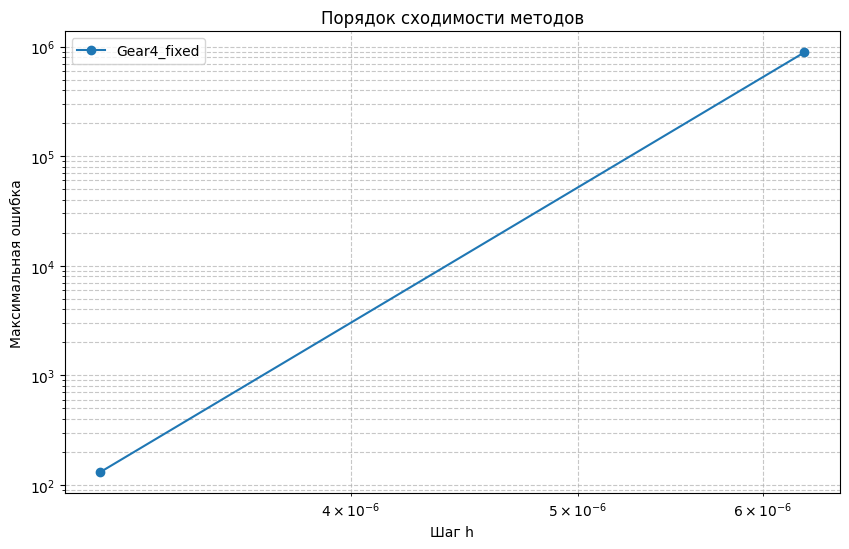

ITERATION 2 7
x0= 0.02 y0= 0.07
❌ rk4_solve: NaN или inf в решении (h=0.0001)
⚠️ RK4 при h=0.0001: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ pece4_solve: NaN или inf в решении (h=0.0001)
⚠️ PECE4 при h=0.0001: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ Gear4: расходимость на шаге 3, h=0.0001
❌ gear4_fixed_step: NaN или inf в решении (h=0.0001)
⚠️ Gear4_fixed при h=0.0001: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ rk4_solve: NaN или inf в решении (h=5e-05)
⚠️ RK4 при h=5e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ pece4_solve: NaN или inf в решении (h=5e-05)
⚠️ PECE4 при h=5e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ Gear4: расходимость на шаге 3, h=5e-05
❌ gear4_fixed_step: переполнение (h=5e-05)
⚠️ Gear4_fixed при h=5e-05: operands could not be broadcast together with shapes (1,0) (1,3) 


C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:7: RuntimeWarning: overflow encountered in scalar multiply
  dydt = y * (2 * a2 - 0.5 * y - 3.5 * (a2_reg**2) * x)
C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:6: RuntimeWarning: invalid value encountered in scalar multiply
  dxdt = x * (1 - 0.5 * x - (2/7) * (a2_reg**-2) * y)
C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:7: RuntimeWarning: overflow encountered in scalar power
  dydt = y * (2 * a2 - 0.5 * y - 3.5 * (a2_reg**2) * x)
C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:7: RuntimeWarning: invalid value encountered in scalar subtract
  dydt = y * (2 * a2 - 0.5 * y - 3.5 * (a2_reg**2) * x)
C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:8: RuntimeWarning: overflow encountered in scalar multiply
  da2dt = epsilon * (2 - 7 * a2 * x)
C:\Users\lilia\AppData\Local\Programs\Python\Python313\Lib\site-packages\numpy\linalg\_linalg.py:2792: RuntimeWarning: 

❌ rk4_solve: NaN или inf в решении (h=2.5e-05)
⚠️ RK4 при h=2.5e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ pece4_solve: NaN или inf в решении (h=2.5e-05)
⚠️ PECE4 при h=2.5e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ Gear4: расходимость на шаге 3, h=2.5e-05
❌ gear4_fixed_step: переполнение (h=2.5e-05)
⚠️ Gear4_fixed при h=2.5e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ rk4_solve: NaN или inf в решении (h=1.25e-05)
⚠️ RK4 при h=1.25e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ pece4_solve: NaN или inf в решении (h=1.25e-05)
⚠️ PECE4 при h=1.25e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ Gear4: расходимость на шаге 3, h=1.25e-05
❌ gear4_fixed_step: переполнение (h=1.25e-05)
⚠️ Gear4_fixed при h=1.25e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ rk4_solve: NaN или inf в решении (h=6.25e-06)
⚠️ RK4 при h=6.25e-06: operan

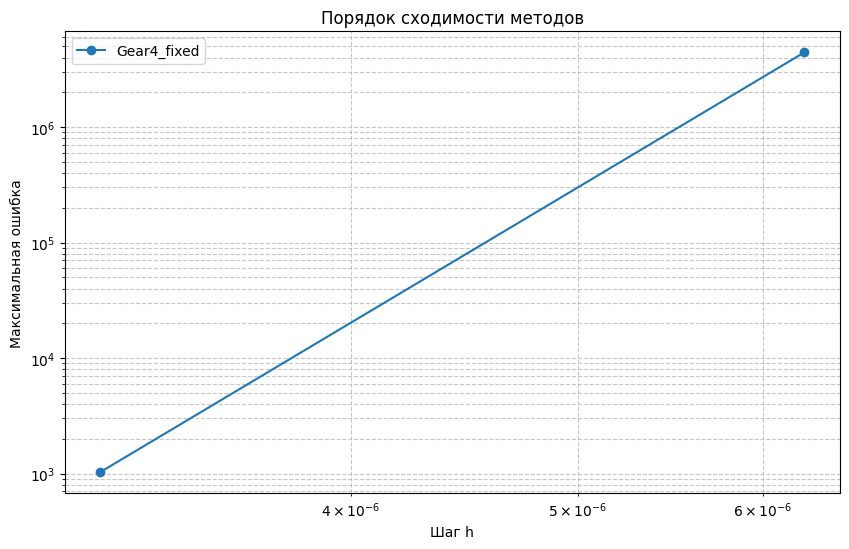

ITERATION 2 8
x0= 0.02 y0= 0.08
❌ rk4_solve: NaN или inf в решении (h=0.0001)
⚠️ RK4 при h=0.0001: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ pece4_solve: NaN или inf в решении (h=0.0001)
⚠️ PECE4 при h=0.0001: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ Gear4: расходимость на шаге 3, h=0.0001
❌ gear4_fixed_step: NaN или inf в решении (h=0.0001)
⚠️ Gear4_fixed при h=0.0001: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ rk4_solve: NaN или inf в решении (h=5e-05)
⚠️ RK4 при h=5e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ pece4_solve: NaN или inf в решении (h=5e-05)
⚠️ PECE4 при h=5e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ Gear4: расходимость на шаге 3, h=5e-05
❌ gear4_fixed_step: NaN или inf в решении (h=5e-05)
⚠️ Gear4_fixed при h=5e-05: operands could not be broadcast together with shapes (1,0) (1,3) 


C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:7: RuntimeWarning: overflow encountered in scalar multiply
  dydt = y * (2 * a2 - 0.5 * y - 3.5 * (a2_reg**2) * x)
C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:6: RuntimeWarning: invalid value encountered in scalar multiply
  dxdt = x * (1 - 0.5 * x - (2/7) * (a2_reg**-2) * y)
C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:7: RuntimeWarning: overflow encountered in scalar power
  dydt = y * (2 * a2 - 0.5 * y - 3.5 * (a2_reg**2) * x)
C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:7: RuntimeWarning: invalid value encountered in scalar subtract
  dydt = y * (2 * a2 - 0.5 * y - 3.5 * (a2_reg**2) * x)
C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:8: RuntimeWarning: overflow encountered in scalar multiply
  da2dt = epsilon * (2 - 7 * a2 * x)
C:\Users\lilia\AppData\Local\Programs\Python\Python313\Lib\site-packages\numpy\linalg\_linalg.py:2792: RuntimeWarning: 

❌ rk4_solve: NaN или inf в решении (h=2.5e-05)
⚠️ RK4 при h=2.5e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ pece4_solve: NaN или inf в решении (h=2.5e-05)
⚠️ PECE4 при h=2.5e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ Gear4: расходимость на шаге 3, h=2.5e-05
❌ gear4_fixed_step: переполнение (h=2.5e-05)
⚠️ Gear4_fixed при h=2.5e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ rk4_solve: NaN или inf в решении (h=1.25e-05)
⚠️ RK4 при h=1.25e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ pece4_solve: NaN или inf в решении (h=1.25e-05)
⚠️ PECE4 при h=1.25e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ Gear4: расходимость на шаге 3, h=1.25e-05
❌ gear4_fixed_step: переполнение (h=1.25e-05)
⚠️ Gear4_fixed при h=1.25e-05: operands could not be broadcast together with shapes (1,0) (1,3) 


C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\995573919.py:8: RuntimeWarning: invalid value encountered in add
  y_pred = y + h/24 * (55*f_vals[3] - 59*f_vals[2] + 37*f_vals[1] - 9*f_vals[0])
C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\1111329400.py:11: RuntimeWarning: invalid value encountered in add
  return y + h/6 * (k1 + 2*k2 + 2*k3 + k4)


❌ rk4_solve: NaN или inf в решении (h=6.25e-06)
⚠️ RK4 при h=6.25e-06: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ pece4_solve: NaN или inf в решении (h=6.25e-06)
⚠️ PECE4 при h=6.25e-06: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ Gear4: расходимость на шаге 3, h=6.25e-06
✅ gear4_fixed_step: успех, 4 шагов (h=6.25e-06)
❌ rk4_solve: NaN или inf в решении (h=3.125e-06)
⚠️ RK4 при h=3.125e-06: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ pece4_solve: NaN или inf в решении (h=3.125e-06)
⚠️ PECE4 при h=3.125e-06: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ Gear4: расходимость на шаге 3, h=3.125e-06
✅ gear4_fixed_step: успех, 4 шагов (h=3.125e-06)
          h  RK4  p_RK4  PECE4  p_PECE4   Gear4_fixed  p_Gear4_fixed
0  0.000100  NaN    NaN    NaN      NaN           NaN            NaN
1  0.000050  NaN    NaN    NaN      NaN           NaN            NaN
2  0.000025  NaN    NaN    NaN      NaN        

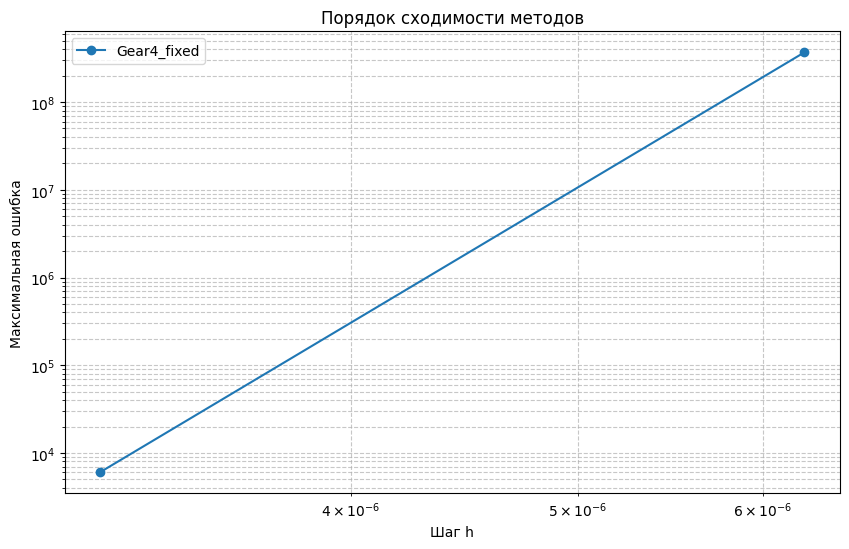

ITERATION 2 9
x0= 0.02 y0= 0.09
❌ rk4_solve: NaN или inf в решении (h=0.0001)
⚠️ RK4 при h=0.0001: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ pece4_solve: NaN или inf в решении (h=0.0001)
⚠️ PECE4 при h=0.0001: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ Gear4: расходимость на шаге 3, h=0.0001
❌ gear4_fixed_step: NaN или inf в решении (h=0.0001)
⚠️ Gear4_fixed при h=0.0001: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ rk4_solve: NaN или inf в решении (h=5e-05)
⚠️ RK4 при h=5e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ pece4_solve: NaN или inf в решении (h=5e-05)
⚠️ PECE4 при h=5e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ Gear4: расходимость на шаге 3, h=5e-05
❌ gear4_fixed_step: NaN или inf в решении (h=5e-05)
⚠️ Gear4_fixed при h=5e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ rk4_solve: NaN или inf в решении (h=2.5e-05)
⚠️ RK4 п

C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:7: RuntimeWarning: overflow encountered in scalar multiply
  dydt = y * (2 * a2 - 0.5 * y - 3.5 * (a2_reg**2) * x)
C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:6: RuntimeWarning: invalid value encountered in scalar multiply
  dxdt = x * (1 - 0.5 * x - (2/7) * (a2_reg**-2) * y)
C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:7: RuntimeWarning: overflow encountered in scalar power
  dydt = y * (2 * a2 - 0.5 * y - 3.5 * (a2_reg**2) * x)
C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:7: RuntimeWarning: invalid value encountered in scalar subtract
  dydt = y * (2 * a2 - 0.5 * y - 3.5 * (a2_reg**2) * x)
C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:8: RuntimeWarning: overflow encountered in scalar multiply
  da2dt = epsilon * (2 - 7 * a2 * x)
C:\Users\lilia\AppData\Local\Programs\Python\Python313\Lib\site-packages\numpy\linalg\_linalg.py:2792: RuntimeWarning: 

❌ pece4_solve: NaN или inf в решении (h=2.5e-05)
⚠️ PECE4 при h=2.5e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ Gear4: расходимость на шаге 3, h=2.5e-05
❌ gear4_fixed_step: переполнение (h=2.5e-05)
⚠️ Gear4_fixed при h=2.5e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ rk4_solve: NaN или inf в решении (h=1.25e-05)
⚠️ RK4 при h=1.25e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ pece4_solve: NaN или inf в решении (h=1.25e-05)
⚠️ PECE4 при h=1.25e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ Gear4: расходимость на шаге 3, h=1.25e-05
❌ gear4_fixed_step: переполнение (h=1.25e-05)
⚠️ Gear4_fixed при h=1.25e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ rk4_solve: NaN или inf в решении (h=6.25e-06)
⚠️ RK4 при h=6.25e-06: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ pece4_solve: NaN или inf в решении (h=6.25e-06)
⚠️ PECE4 при h=6.25e-06: 

C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\995573919.py:14: RuntimeWarning: invalid value encountered in add
  y_corr = y + h/24 * (9*f_pred + 19*f_vals[3] - 5*f_vals[2] + f_vals[1])


❌ pece4_solve: NaN или inf в решении (h=3.125e-06)
⚠️ PECE4 при h=3.125e-06: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ Gear4: расходимость на шаге 3, h=3.125e-06
✅ gear4_fixed_step: успех, 4 шагов (h=3.125e-06)
          h  RK4  p_RK4  PECE4  p_PECE4   Gear4_fixed  p_Gear4_fixed
0  0.000100  NaN    NaN    NaN      NaN           NaN            NaN
1  0.000050  NaN    NaN    NaN      NaN           NaN            NaN
2  0.000025  NaN    NaN    NaN      NaN           NaN            NaN
3  0.000013  NaN    NaN    NaN      NaN           NaN            NaN
4  0.000006  NaN    NaN    NaN      NaN  1.135419e+10            NaN
5  0.000003  NaN    NaN    NaN      NaN  2.824614e+04          18.62


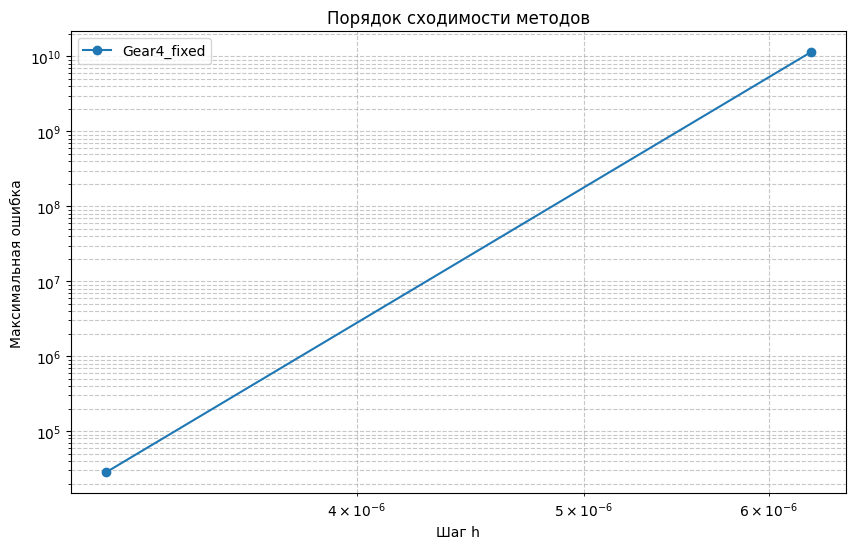

ITERATION 3 0
x0= 0.03 y0= 0.0
✅ rk4_solve: успех, 101 шагов (h=0.0001)
✅ pece4_solve: успех, 101 шагов (h=0.0001)
✅ gear4_fixed_step: успех, 101 шагов (h=0.0001)
✅ rk4_solve: успех, 201 шагов (h=5e-05)
✅ pece4_solve: успех, 201 шагов (h=5e-05)
✅ gear4_fixed_step: успех, 201 шагов (h=5e-05)
✅ rk4_solve: успех, 401 шагов (h=2.5e-05)
✅ pece4_solve: успех, 401 шагов (h=2.5e-05)
✅ gear4_fixed_step: успех, 401 шагов (h=2.5e-05)
✅ rk4_solve: успех, 801 шагов (h=1.25e-05)
✅ pece4_solve: успех, 801 шагов (h=1.25e-05)
✅ gear4_fixed_step: успех, 801 шагов (h=1.25e-05)
✅ rk4_solve: успех, 1601 шагов (h=6.25e-06)
✅ pece4_solve: успех, 1601 шагов (h=6.25e-06)
✅ gear4_fixed_step: успех, 1601 шагов (h=6.25e-06)
✅ rk4_solve: успех, 3201 шагов (h=3.125e-06)
✅ pece4_solve: успех, 3201 шагов (h=3.125e-06)
✅ gear4_fixed_step: успех, 3201 шагов (h=3.125e-06)
          h           RK4  p_RK4         PECE4  p_PECE4   Gear4_fixed  p_Gear4_fixed
0  0.000100  3.644213e-10    NaN  3.644213e-10      NaN  3.650453

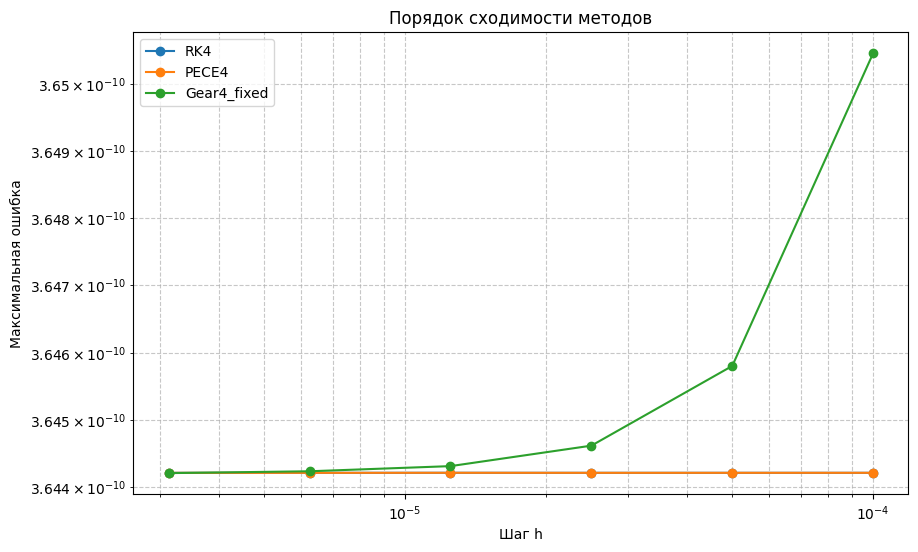

ITERATION 3 1
x0= 0.03 y0= 0.01
❌ rk4_solve: NaN или inf в решении (h=0.0001)
⚠️ RK4 при h=0.0001: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ pece4_solve: NaN или inf в решении (h=0.0001)
⚠️ PECE4 при h=0.0001: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ Gear4: расходимость на шаге 3, h=0.0001
❌ gear4_fixed_step: переполнение (h=0.0001)
⚠️ Gear4_fixed при h=0.0001: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ rk4_solve: NaN или inf в решении (h=5e-05)
⚠️ RK4 при h=5e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ pece4_solve: NaN или inf в решении (h=5e-05)
⚠️ PECE4 при h=5e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ Gear4: расходимость на шаге 3, h=5e-05
✅ gear4_fixed_step: успех, 4 шагов (h=5e-05)
❌ rk4_solve: NaN или inf в решении (h=2.5e-05)
⚠️ RK4 при h=2.5e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ pece4_solve: NaN или inf в р

C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:7: RuntimeWarning: overflow encountered in scalar multiply
  dydt = y * (2 * a2 - 0.5 * y - 3.5 * (a2_reg**2) * x)
C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:6: RuntimeWarning: invalid value encountered in scalar multiply
  dxdt = x * (1 - 0.5 * x - (2/7) * (a2_reg**-2) * y)
C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:7: RuntimeWarning: overflow encountered in scalar power
  dydt = y * (2 * a2 - 0.5 * y - 3.5 * (a2_reg**2) * x)
C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:7: RuntimeWarning: invalid value encountered in scalar subtract
  dydt = y * (2 * a2 - 0.5 * y - 3.5 * (a2_reg**2) * x)
C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:8: RuntimeWarning: overflow encountered in scalar multiply
  da2dt = epsilon * (2 - 7 * a2 * x)
C:\Users\lilia\AppData\Local\Programs\Python\Python313\Lib\site-packages\numpy\linalg\_linalg.py:2792: RuntimeWarning: 

✅ rk4_solve: успех, 801 шагов (h=1.25e-05)
❌ pece4_solve: NaN или inf в решении (h=1.25e-05)
⚠️ PECE4 при h=1.25e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ Gear4: расходимость на шаге 5, h=1.25e-05
✅ gear4_fixed_step: успех, 6 шагов (h=1.25e-05)
✅ rk4_solve: успех, 1601 шагов (h=6.25e-06)
✅ pece4_solve: успех, 1601 шагов (h=6.25e-06)
✅ gear4_fixed_step: успех, 1601 шагов (h=6.25e-06)
✅ rk4_solve: успех, 3201 шагов (h=3.125e-06)
✅ pece4_solve: успех, 3201 шагов (h=3.125e-06)
✅ gear4_fixed_step: успех, 3201 шагов (h=3.125e-06)
          h           RK4  p_RK4          PECE4  p_PECE4   Gear4_fixed  p_Gear4_fixed
0  0.000100           NaN    NaN            NaN      NaN           NaN            NaN
1  0.000050           NaN    NaN            NaN      NaN  6.914722e+09            NaN
2  0.000025           NaN    NaN            NaN      NaN  8.710960e+03          19.60
3  0.000013  33741.359351    NaN            NaN      NaN  4.832521e+05          -5.79
4  0.0000

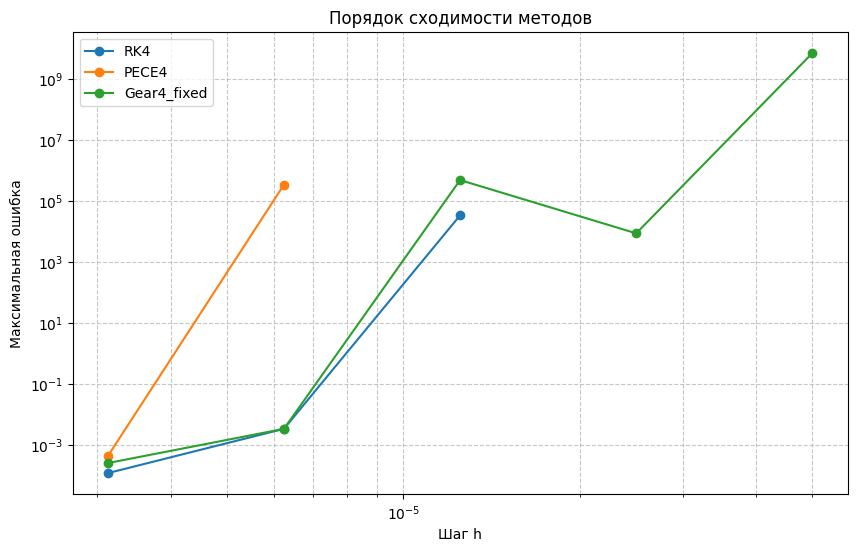

ITERATION 3 2
x0= 0.03 y0= 0.02
❌ rk4_solve: NaN или inf в решении (h=0.0001)
⚠️ RK4 при h=0.0001: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ pece4_solve: NaN или inf в решении (h=0.0001)
⚠️ PECE4 при h=0.0001: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ Gear4: расходимость на шаге 3, h=0.0001
❌ gear4_fixed_step: NaN или inf в решении (h=0.0001)
⚠️ Gear4_fixed при h=0.0001: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ rk4_solve: NaN или inf в решении (h=5e-05)
⚠️ RK4 при h=5e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ pece4_solve: NaN или inf в решении (h=5e-05)
⚠️ PECE4 при h=5e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ Gear4: расходимость на шаге 3, h=5e-05
❌ gear4_fixed_step: переполнение (h=5e-05)
⚠️ Gear4_fixed при h=5e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ rk4_solve: NaN или inf в решении (h=2.5e-05)
⚠️ RK4 при h=2.5e

C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:7: RuntimeWarning: overflow encountered in scalar multiply
  dydt = y * (2 * a2 - 0.5 * y - 3.5 * (a2_reg**2) * x)
C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:7: RuntimeWarning: invalid value encountered in scalar subtract
  dydt = y * (2 * a2 - 0.5 * y - 3.5 * (a2_reg**2) * x)
C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:7: RuntimeWarning: overflow encountered in scalar power
  dydt = y * (2 * a2 - 0.5 * y - 3.5 * (a2_reg**2) * x)
C:\Users\lilia\AppData\Local\Programs\Python\Python313\Lib\site-packages\numpy\linalg\_linalg.py:2792: RuntimeWarning: overflow encountered in dot
  sqnorm = x.dot(x)
C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:6: RuntimeWarning: invalid value encountered in scalar multiply
  dxdt = x * (1 - 0.5 * x - (2/7) * (a2_reg**-2) * y)
C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:8: RuntimeWarning: overflow encountered in scala

❌ rk4_solve: NaN или inf в решении (h=1.25e-05)
⚠️ RK4 при h=1.25e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ pece4_solve: NaN или inf в решении (h=1.25e-05)
⚠️ PECE4 при h=1.25e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ Gear4: расходимость на шаге 3, h=1.25e-05
✅ gear4_fixed_step: успех, 4 шагов (h=1.25e-05)
✅ rk4_solve: успех, 1601 шагов (h=6.25e-06)
❌ pece4_solve: NaN или inf в решении (h=6.25e-06)
⚠️ PECE4 при h=6.25e-06: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ Gear4: расходимость на шаге 7, h=6.25e-06
✅ gear4_fixed_step: успех, 8 шагов (h=6.25e-06)
✅ rk4_solve: успех, 3201 шагов (h=3.125e-06)
✅ pece4_solve: успех, 3201 шагов (h=3.125e-06)
✅ gear4_fixed_step: успех, 3201 шагов (h=3.125e-06)
          h           RK4  p_RK4          PECE4  p_PECE4   Gear4_fixed  p_Gear4_fixed
0  0.000100           NaN    NaN            NaN      NaN           NaN            NaN
1  0.000050           NaN    NaN     

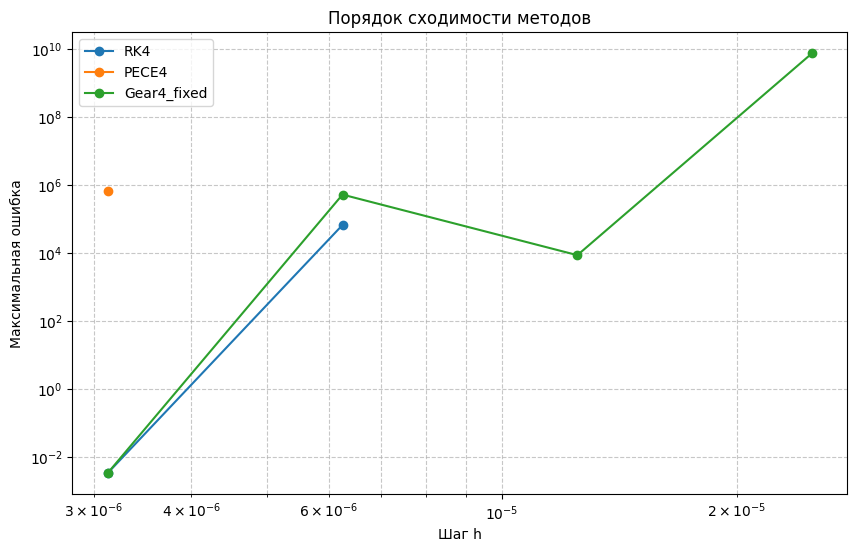

ITERATION 3 3
x0= 0.03 y0= 0.03
❌ rk4_solve: NaN или inf в решении (h=0.0001)
⚠️ RK4 при h=0.0001: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ pece4_solve: NaN или inf в решении (h=0.0001)
⚠️ PECE4 при h=0.0001: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ Gear4: расходимость на шаге 3, h=0.0001
❌ gear4_fixed_step: NaN или inf в решении (h=0.0001)
⚠️ Gear4_fixed при h=0.0001: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ rk4_solve: NaN или inf в решении (h=5e-05)
⚠️ RK4 при h=5e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ pece4_solve: NaN или inf в решении (h=5e-05)
⚠️ PECE4 при h=5e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ Gear4: расходимость на шаге 3, h=5e-05
❌ gear4_fixed_step: переполнение (h=5e-05)
⚠️ Gear4_fixed при h=5e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ rk4_solve: NaN или inf в решении (h=2.5e-05)
⚠️ RK4 при h=2.5e

C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:7: RuntimeWarning: overflow encountered in scalar multiply
  dydt = y * (2 * a2 - 0.5 * y - 3.5 * (a2_reg**2) * x)
C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:6: RuntimeWarning: invalid value encountered in scalar multiply
  dxdt = x * (1 - 0.5 * x - (2/7) * (a2_reg**-2) * y)
C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:7: RuntimeWarning: overflow encountered in scalar power
  dydt = y * (2 * a2 - 0.5 * y - 3.5 * (a2_reg**2) * x)
C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:7: RuntimeWarning: invalid value encountered in scalar subtract
  dydt = y * (2 * a2 - 0.5 * y - 3.5 * (a2_reg**2) * x)
C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:8: RuntimeWarning: overflow encountered in scalar multiply
  da2dt = epsilon * (2 - 7 * a2 * x)
C:\Users\lilia\AppData\Local\Programs\Python\Python313\Lib\site-packages\numpy\linalg\_linalg.py:2792: RuntimeWarning: 

❌ rk4_solve: NaN или inf в решении (h=1.25e-05)
⚠️ RK4 при h=1.25e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ pece4_solve: NaN или inf в решении (h=1.25e-05)
⚠️ PECE4 при h=1.25e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ Gear4: расходимость на шаге 3, h=1.25e-05
✅ gear4_fixed_step: успех, 4 шагов (h=1.25e-05)
✅ rk4_solve: успех, 1601 шагов (h=6.25e-06)
❌ pece4_solve: NaN или inf в решении (h=6.25e-06)
⚠️ PECE4 при h=6.25e-06: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ Gear4: расходимость на шаге 3, h=6.25e-06
✅ gear4_fixed_step: успех, 4 шагов (h=6.25e-06)
✅ rk4_solve: успех, 3201 шагов (h=3.125e-06)


C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\995573919.py:8: RuntimeWarning: invalid value encountered in add
  y_pred = y + h/24 * (55*f_vals[3] - 59*f_vals[2] + 37*f_vals[1] - 9*f_vals[0])


❌ pece4_solve: NaN или inf в решении (h=3.125e-06)
⚠️ PECE4 при h=3.125e-06: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ Gear4: расходимость на шаге 7, h=3.125e-06
✅ gear4_fixed_step: успех, 8 шагов (h=3.125e-06)
          h           RK4  p_RK4  PECE4  p_PECE4   Gear4_fixed  p_Gear4_fixed
0  0.000100           NaN    NaN    NaN      NaN           NaN            NaN
1  0.000050           NaN    NaN    NaN      NaN           NaN            NaN
2  0.000025           NaN    NaN    NaN      NaN           NaN            NaN
3  0.000013           NaN    NaN    NaN      NaN  2.943815e+05            NaN
4  0.000006  1.201129e+06    NaN    NaN      NaN  1.947141e+02          10.56
5  0.000003  2.345309e-02  25.61    NaN      NaN  1.661302e+06         -13.06


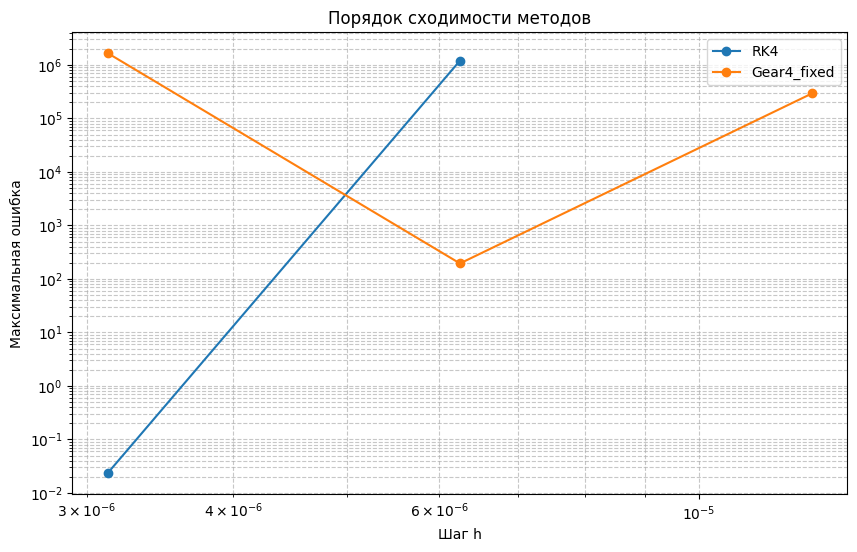

ITERATION 3 4
x0= 0.03 y0= 0.04
❌ rk4_solve: NaN или inf в решении (h=0.0001)
⚠️ RK4 при h=0.0001: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ pece4_solve: NaN или inf в решении (h=0.0001)
⚠️ PECE4 при h=0.0001: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ Gear4: расходимость на шаге 3, h=0.0001
❌ gear4_fixed_step: NaN или inf в решении (h=0.0001)
⚠️ Gear4_fixed при h=0.0001: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ rk4_solve: NaN или inf в решении (h=5e-05)
⚠️ RK4 при h=5e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ pece4_solve: NaN или inf в решении (h=5e-05)
⚠️ PECE4 при h=5e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ Gear4: расходимость на шаге 3, h=5e-05
❌ gear4_fixed_step: переполнение (h=5e-05)
⚠️ Gear4_fixed при h=5e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ rk4_solve: NaN или inf в решении (h=2.5e-05)
⚠️ RK4 при h=2.5e

C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:7: RuntimeWarning: overflow encountered in scalar multiply
  dydt = y * (2 * a2 - 0.5 * y - 3.5 * (a2_reg**2) * x)
C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:7: RuntimeWarning: invalid value encountered in scalar subtract
  dydt = y * (2 * a2 - 0.5 * y - 3.5 * (a2_reg**2) * x)
C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:7: RuntimeWarning: overflow encountered in scalar power
  dydt = y * (2 * a2 - 0.5 * y - 3.5 * (a2_reg**2) * x)
C:\Users\lilia\AppData\Local\Programs\Python\Python313\Lib\site-packages\numpy\linalg\_linalg.py:2792: RuntimeWarning: overflow encountered in dot
  sqnorm = x.dot(x)
C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:6: RuntimeWarning: invalid value encountered in scalar multiply
  dxdt = x * (1 - 0.5 * x - (2/7) * (a2_reg**-2) * y)
C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:8: RuntimeWarning: overflow encountered in scala

❌ pece4_solve: NaN или inf в решении (h=1.25e-05)
⚠️ PECE4 при h=1.25e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ Gear4: расходимость на шаге 3, h=1.25e-05
✅ gear4_fixed_step: успех, 4 шагов (h=1.25e-05)
❌ rk4_solve: NaN или inf в решении (h=6.25e-06)
⚠️ RK4 при h=6.25e-06: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ pece4_solve: NaN или inf в решении (h=6.25e-06)
⚠️ PECE4 при h=6.25e-06: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ Gear4: расходимость на шаге 3, h=6.25e-06
✅ gear4_fixed_step: успех, 4 шагов (h=6.25e-06)
✅ rk4_solve: успех, 3201 шагов (h=3.125e-06)
❌ pece4_solve: NaN или inf в решении (h=3.125e-06)
⚠️ PECE4 при h=3.125e-06: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ Gear4: расходимость на шаге 4, h=3.125e-06
✅ gear4_fixed_step: успех, 5 шагов (h=3.125e-06)
          h            RK4  p_RK4  PECE4  p_PECE4   Gear4_fixed  p_Gear4_fixed
0  0.000100            NaN    NaN   

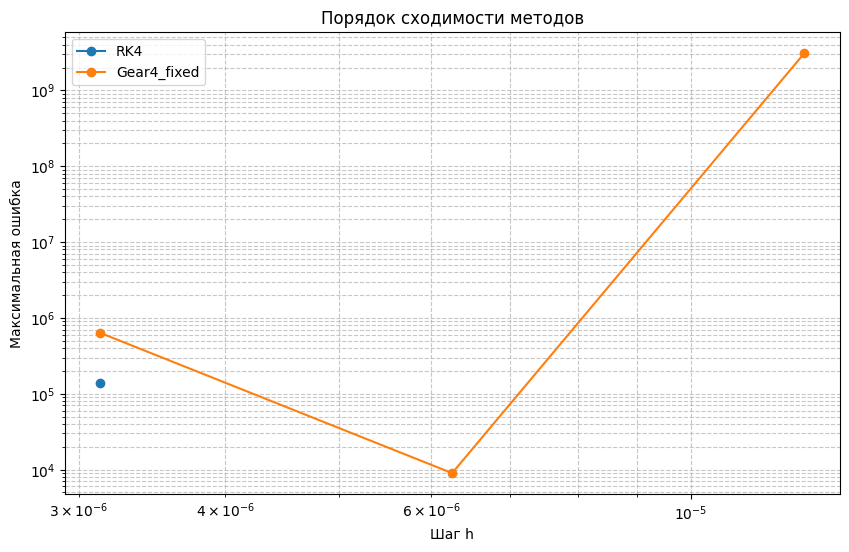

ITERATION 3 5
x0= 0.03 y0= 0.05
❌ rk4_solve: NaN или inf в решении (h=0.0001)
⚠️ RK4 при h=0.0001: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ pece4_solve: NaN или inf в решении (h=0.0001)
⚠️ PECE4 при h=0.0001: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ Gear4: расходимость на шаге 3, h=0.0001
❌ gear4_fixed_step: NaN или inf в решении (h=0.0001)
⚠️ Gear4_fixed при h=0.0001: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ rk4_solve: NaN или inf в решении (h=5e-05)
⚠️ RK4 при h=5e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ pece4_solve: NaN или inf в решении (h=5e-05)
⚠️ PECE4 при h=5e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ Gear4: расходимость на шаге 3, h=5e-05
❌ gear4_fixed_step: NaN или inf в решении (h=5e-05)
⚠️ Gear4_fixed при h=5e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ rk4_solve: NaN или inf в решении (h=2.5e-05)
⚠️ RK4 п

C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:7: RuntimeWarning: overflow encountered in scalar multiply
  dydt = y * (2 * a2 - 0.5 * y - 3.5 * (a2_reg**2) * x)
C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:6: RuntimeWarning: invalid value encountered in scalar multiply
  dxdt = x * (1 - 0.5 * x - (2/7) * (a2_reg**-2) * y)
C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:7: RuntimeWarning: overflow encountered in scalar power
  dydt = y * (2 * a2 - 0.5 * y - 3.5 * (a2_reg**2) * x)
C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:7: RuntimeWarning: invalid value encountered in scalar subtract
  dydt = y * (2 * a2 - 0.5 * y - 3.5 * (a2_reg**2) * x)
C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:8: RuntimeWarning: overflow encountered in scalar multiply
  da2dt = epsilon * (2 - 7 * a2 * x)
C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\1111329400.py:11: RuntimeWarning: invalid value encountered in add
  

❌ rk4_solve: NaN или inf в решении (h=1.25e-05)
⚠️ RK4 при h=1.25e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ pece4_solve: NaN или inf в решении (h=1.25e-05)
⚠️ PECE4 при h=1.25e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ Gear4: расходимость на шаге 3, h=1.25e-05
✅ gear4_fixed_step: успех, 4 шагов (h=1.25e-05)
❌ rk4_solve: NaN или inf в решении (h=6.25e-06)
⚠️ RK4 при h=6.25e-06: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ pece4_solve: NaN или inf в решении (h=6.25e-06)
⚠️ PECE4 при h=6.25e-06: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ Gear4: расходимость на шаге 3, h=6.25e-06
✅ gear4_fixed_step: успех, 4 шагов (h=6.25e-06)
❌ rk4_solve: NaN или inf в решении (h=3.125e-06)
⚠️ RK4 при h=3.125e-06: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ pece4_solve: NaN или inf в решении (h=3.125e-06)
⚠️ PECE4 при h=3.125e-06: operands could not be broadcast together wit

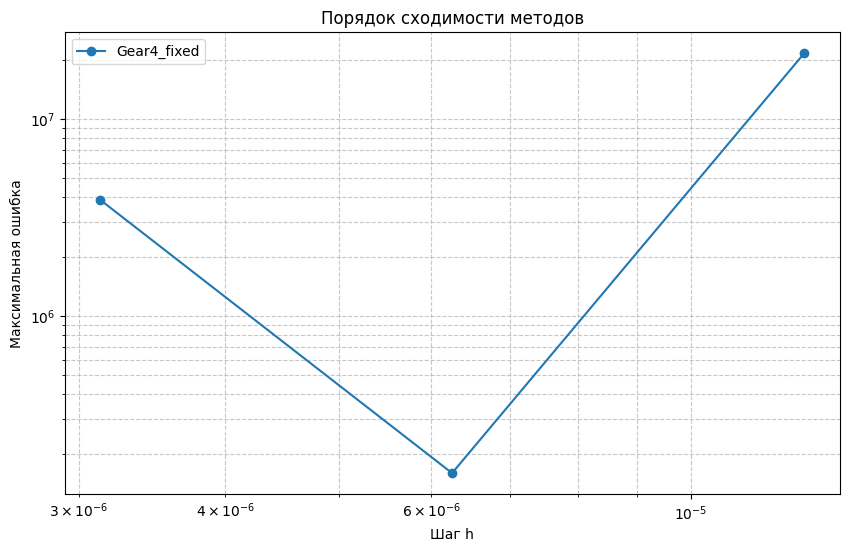

ITERATION 3 6
x0= 0.03 y0= 0.06
❌ rk4_solve: NaN или inf в решении (h=0.0001)
⚠️ RK4 при h=0.0001: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ pece4_solve: NaN или inf в решении (h=0.0001)
⚠️ PECE4 при h=0.0001: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ Gear4: расходимость на шаге 3, h=0.0001
❌ gear4_fixed_step: NaN или inf в решении (h=0.0001)
⚠️ Gear4_fixed при h=0.0001: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ rk4_solve: NaN или inf в решении (h=5e-05)
⚠️ RK4 при h=5e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ pece4_solve: NaN или inf в решении (h=5e-05)
⚠️ PECE4 при h=5e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ Gear4: расходимость на шаге 3, h=5e-05
❌ gear4_fixed_step: NaN или inf в решении (h=5e-05)
⚠️ Gear4_fixed при h=5e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ rk4_solve: NaN или inf в решении (h=2.5e-05)
⚠️ RK4 п

C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:7: RuntimeWarning: overflow encountered in scalar multiply
  dydt = y * (2 * a2 - 0.5 * y - 3.5 * (a2_reg**2) * x)
C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:6: RuntimeWarning: invalid value encountered in scalar multiply
  dxdt = x * (1 - 0.5 * x - (2/7) * (a2_reg**-2) * y)
C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:7: RuntimeWarning: overflow encountered in scalar power
  dydt = y * (2 * a2 - 0.5 * y - 3.5 * (a2_reg**2) * x)
C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:7: RuntimeWarning: invalid value encountered in scalar subtract
  dydt = y * (2 * a2 - 0.5 * y - 3.5 * (a2_reg**2) * x)
C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:8: RuntimeWarning: overflow encountered in scalar multiply
  da2dt = epsilon * (2 - 7 * a2 * x)
C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\1111329400.py:11: RuntimeWarning: invalid value encountered in add
  

❌ rk4_solve: NaN или inf в решении (h=1.25e-05)
⚠️ RK4 при h=1.25e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ pece4_solve: NaN или inf в решении (h=1.25e-05)
⚠️ PECE4 при h=1.25e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ Gear4: расходимость на шаге 3, h=1.25e-05
❌ gear4_fixed_step: переполнение (h=1.25e-05)
⚠️ Gear4_fixed при h=1.25e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ rk4_solve: NaN или inf в решении (h=6.25e-06)
⚠️ RK4 при h=6.25e-06: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ pece4_solve: NaN или inf в решении (h=6.25e-06)
⚠️ PECE4 при h=6.25e-06: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ Gear4: расходимость на шаге 3, h=6.25e-06
✅ gear4_fixed_step: успех, 4 шагов (h=6.25e-06)
❌ rk4_solve: NaN или inf в решении (h=3.125e-06)
⚠️ RK4 при h=3.125e-06: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ pece4_solve: NaN или inf

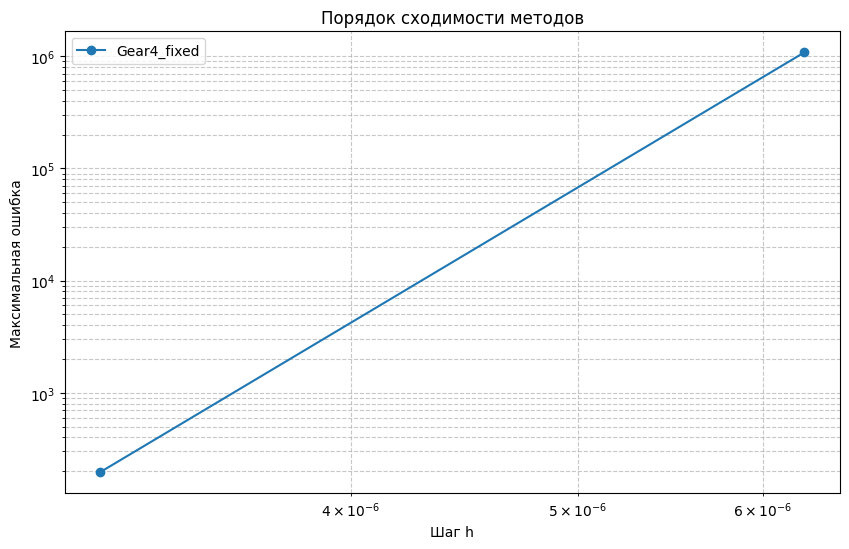

ITERATION 3 7
x0= 0.03 y0= 0.07
❌ rk4_solve: NaN или inf в решении (h=0.0001)
⚠️ RK4 при h=0.0001: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ pece4_solve: NaN или inf в решении (h=0.0001)
⚠️ PECE4 при h=0.0001: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ Gear4: расходимость на шаге 3, h=0.0001
❌ gear4_fixed_step: NaN или inf в решении (h=0.0001)
⚠️ Gear4_fixed при h=0.0001: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ rk4_solve: NaN или inf в решении (h=5e-05)
⚠️ RK4 при h=5e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ pece4_solve: NaN или inf в решении (h=5e-05)
⚠️ PECE4 при h=5e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ Gear4: расходимость на шаге 3, h=5e-05
❌ gear4_fixed_step: NaN или inf в решении (h=5e-05)
⚠️ Gear4_fixed при h=5e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ rk4_solve: NaN или inf в решении (h=2.5e-05)
⚠️ RK4 п

C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:7: RuntimeWarning: overflow encountered in scalar multiply
  dydt = y * (2 * a2 - 0.5 * y - 3.5 * (a2_reg**2) * x)
C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:6: RuntimeWarning: invalid value encountered in scalar multiply
  dxdt = x * (1 - 0.5 * x - (2/7) * (a2_reg**-2) * y)
C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:7: RuntimeWarning: overflow encountered in scalar power
  dydt = y * (2 * a2 - 0.5 * y - 3.5 * (a2_reg**2) * x)
C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:7: RuntimeWarning: invalid value encountered in scalar subtract
  dydt = y * (2 * a2 - 0.5 * y - 3.5 * (a2_reg**2) * x)
C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:8: RuntimeWarning: overflow encountered in scalar multiply
  da2dt = epsilon * (2 - 7 * a2 * x)
C:\Users\lilia\AppData\Local\Programs\Python\Python313\Lib\site-packages\numpy\linalg\_linalg.py:2792: RuntimeWarning: 

❌ pece4_solve: NaN или inf в решении (h=1.25e-05)
⚠️ PECE4 при h=1.25e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ Gear4: расходимость на шаге 3, h=1.25e-05
❌ gear4_fixed_step: переполнение (h=1.25e-05)
⚠️ Gear4_fixed при h=1.25e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ rk4_solve: NaN или inf в решении (h=6.25e-06)
⚠️ RK4 при h=6.25e-06: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ pece4_solve: NaN или inf в решении (h=6.25e-06)
⚠️ PECE4 при h=6.25e-06: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ Gear4: расходимость на шаге 3, h=6.25e-06
✅ gear4_fixed_step: успех, 4 шагов (h=6.25e-06)
❌ rk4_solve: NaN или inf в решении (h=3.125e-06)
⚠️ RK4 при h=3.125e-06: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ pece4_solve: NaN или inf в решении (h=3.125e-06)
⚠️ PECE4 при h=3.125e-06: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ Gear4: расходимост

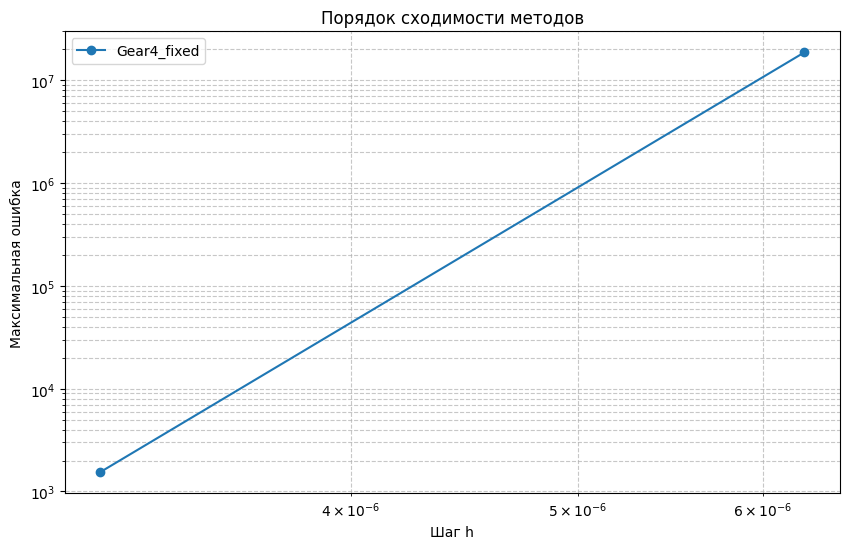

ITERATION 3 8
x0= 0.03 y0= 0.08
❌ rk4_solve: NaN или inf в решении (h=0.0001)
⚠️ RK4 при h=0.0001: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ pece4_solve: NaN или inf в решении (h=0.0001)
⚠️ PECE4 при h=0.0001: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ Gear4: расходимость на шаге 3, h=0.0001
❌ gear4_fixed_step: NaN или inf в решении (h=0.0001)
⚠️ Gear4_fixed при h=0.0001: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ rk4_solve: NaN или inf в решении (h=5e-05)
⚠️ RK4 при h=5e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ pece4_solve: NaN или inf в решении (h=5e-05)
⚠️ PECE4 при h=5e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ Gear4: расходимость на шаге 3, h=5e-05
❌ gear4_fixed_step: NaN или inf в решении (h=5e-05)
⚠️ Gear4_fixed при h=5e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ rk4_solve: NaN или inf в решении (h=2.5e-05)
⚠️ RK4 п

C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:7: RuntimeWarning: overflow encountered in scalar multiply
  dydt = y * (2 * a2 - 0.5 * y - 3.5 * (a2_reg**2) * x)
C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:6: RuntimeWarning: invalid value encountered in scalar multiply
  dxdt = x * (1 - 0.5 * x - (2/7) * (a2_reg**-2) * y)
C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:7: RuntimeWarning: overflow encountered in scalar power
  dydt = y * (2 * a2 - 0.5 * y - 3.5 * (a2_reg**2) * x)
C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:7: RuntimeWarning: invalid value encountered in scalar subtract
  dydt = y * (2 * a2 - 0.5 * y - 3.5 * (a2_reg**2) * x)
C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:8: RuntimeWarning: overflow encountered in scalar multiply
  da2dt = epsilon * (2 - 7 * a2 * x)
C:\Users\lilia\AppData\Local\Programs\Python\Python313\Lib\site-packages\numpy\linalg\_linalg.py:2792: RuntimeWarning: 

❌ rk4_solve: NaN или inf в решении (h=1.25e-05)
⚠️ RK4 при h=1.25e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ pece4_solve: NaN или inf в решении (h=1.25e-05)
⚠️ PECE4 при h=1.25e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ Gear4: расходимость на шаге 3, h=1.25e-05
❌ gear4_fixed_step: переполнение (h=1.25e-05)
⚠️ Gear4_fixed при h=1.25e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ rk4_solve: NaN или inf в решении (h=6.25e-06)
⚠️ RK4 при h=6.25e-06: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ pece4_solve: NaN или inf в решении (h=6.25e-06)
⚠️ PECE4 при h=6.25e-06: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ Gear4: расходимость на шаге 3, h=6.25e-06
✅ gear4_fixed_step: успех, 4 шагов (h=6.25e-06)


C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\1111329400.py:11: RuntimeWarning: invalid value encountered in add
  return y + h/6 * (k1 + 2*k2 + 2*k3 + k4)


❌ rk4_solve: NaN или inf в решении (h=3.125e-06)
⚠️ RK4 при h=3.125e-06: operands could not be broadcast together with shapes (1,0) (1,3) 


C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\995573919.py:14: RuntimeWarning: invalid value encountered in add
  y_corr = y + h/24 * (9*f_pred + 19*f_vals[3] - 5*f_vals[2] + f_vals[1])


❌ pece4_solve: NaN или inf в решении (h=3.125e-06)
⚠️ PECE4 при h=3.125e-06: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ Gear4: расходимость на шаге 3, h=3.125e-06
✅ gear4_fixed_step: успех, 4 шагов (h=3.125e-06)
          h  RK4  p_RK4  PECE4  p_PECE4   Gear4_fixed  p_Gear4_fixed
0  0.000100  NaN    NaN    NaN      NaN           NaN            NaN
1  0.000050  NaN    NaN    NaN      NaN           NaN            NaN
2  0.000025  NaN    NaN    NaN      NaN           NaN            NaN
3  0.000013  NaN    NaN    NaN      NaN           NaN            NaN
4  0.000006  NaN    NaN    NaN      NaN  1.050235e+09            NaN
5  0.000003  NaN    NaN    NaN      NaN  9.015185e+03          16.83


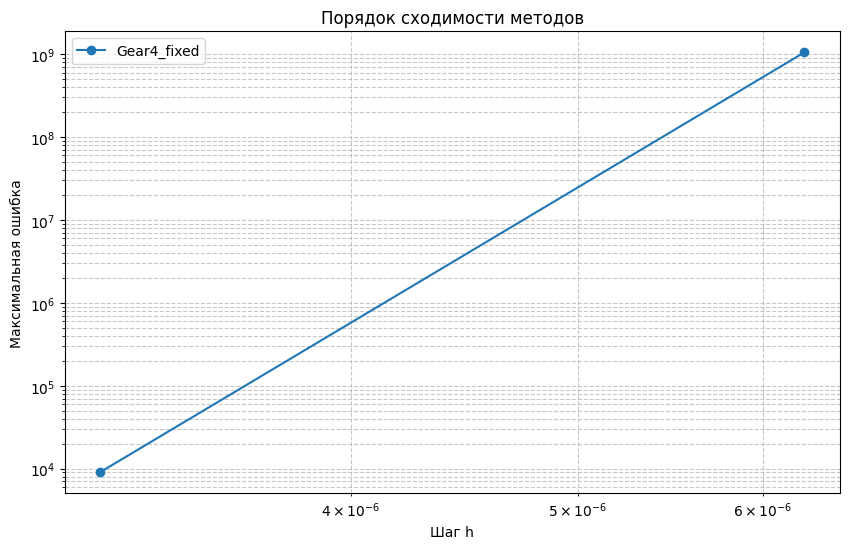

ITERATION 3 9
x0= 0.03 y0= 0.09
❌ rk4_solve: NaN или inf в решении (h=0.0001)
⚠️ RK4 при h=0.0001: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ pece4_solve: NaN или inf в решении (h=0.0001)
⚠️ PECE4 при h=0.0001: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ Gear4: расходимость на шаге 3, h=0.0001
❌ gear4_fixed_step: NaN или inf в решении (h=0.0001)
⚠️ Gear4_fixed при h=0.0001: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ rk4_solve: NaN или inf в решении (h=5e-05)
⚠️ RK4 при h=5e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ pece4_solve: NaN или inf в решении (h=5e-05)
⚠️ PECE4 при h=5e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ Gear4: расходимость на шаге 3, h=5e-05
❌ gear4_fixed_step: NaN или inf в решении (h=5e-05)
⚠️ Gear4_fixed при h=5e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ rk4_solve: NaN или inf в решении (h=2.5e-05)
⚠️ RK4 п

C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:7: RuntimeWarning: overflow encountered in scalar multiply
  dydt = y * (2 * a2 - 0.5 * y - 3.5 * (a2_reg**2) * x)
C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:7: RuntimeWarning: invalid value encountered in scalar subtract
  dydt = y * (2 * a2 - 0.5 * y - 3.5 * (a2_reg**2) * x)
C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:7: RuntimeWarning: overflow encountered in scalar power
  dydt = y * (2 * a2 - 0.5 * y - 3.5 * (a2_reg**2) * x)
C:\Users\lilia\AppData\Local\Programs\Python\Python313\Lib\site-packages\numpy\linalg\_linalg.py:2792: RuntimeWarning: overflow encountered in dot
  sqnorm = x.dot(x)
C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:6: RuntimeWarning: invalid value encountered in scalar multiply
  dxdt = x * (1 - 0.5 * x - (2/7) * (a2_reg**-2) * y)
C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:8: RuntimeWarning: overflow encountered in scala

❌ rk4_solve: NaN или inf в решении (h=1.25e-05)
⚠️ RK4 при h=1.25e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ pece4_solve: NaN или inf в решении (h=1.25e-05)
⚠️ PECE4 при h=1.25e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ Gear4: расходимость на шаге 3, h=1.25e-05
❌ gear4_fixed_step: переполнение (h=1.25e-05)
⚠️ Gear4_fixed при h=1.25e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ rk4_solve: NaN или inf в решении (h=6.25e-06)
⚠️ RK4 при h=6.25e-06: operands could not be broadcast together with shapes (1,0) (1,3) 


C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\995573919.py:8: RuntimeWarning: invalid value encountered in add
  y_pred = y + h/24 * (55*f_vals[3] - 59*f_vals[2] + 37*f_vals[1] - 9*f_vals[0])


❌ pece4_solve: NaN или inf в решении (h=6.25e-06)
⚠️ PECE4 при h=6.25e-06: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ Gear4: расходимость на шаге 3, h=6.25e-06
✅ gear4_fixed_step: успех, 4 шагов (h=6.25e-06)
❌ rk4_solve: NaN или inf в решении (h=3.125e-06)
⚠️ RK4 при h=3.125e-06: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ pece4_solve: NaN или inf в решении (h=3.125e-06)
⚠️ PECE4 при h=3.125e-06: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ Gear4: расходимость на шаге 3, h=3.125e-06
✅ gear4_fixed_step: успех, 4 шагов (h=3.125e-06)
          h  RK4  p_RK4  PECE4  p_PECE4   Gear4_fixed  p_Gear4_fixed
0  0.000100  NaN    NaN    NaN      NaN           NaN            NaN
1  0.000050  NaN    NaN    NaN      NaN           NaN            NaN
2  0.000025  NaN    NaN    NaN      NaN           NaN            NaN
3  0.000013  NaN    NaN    NaN      NaN           NaN            NaN
4  0.000006  NaN    NaN    NaN      NaN  3.162

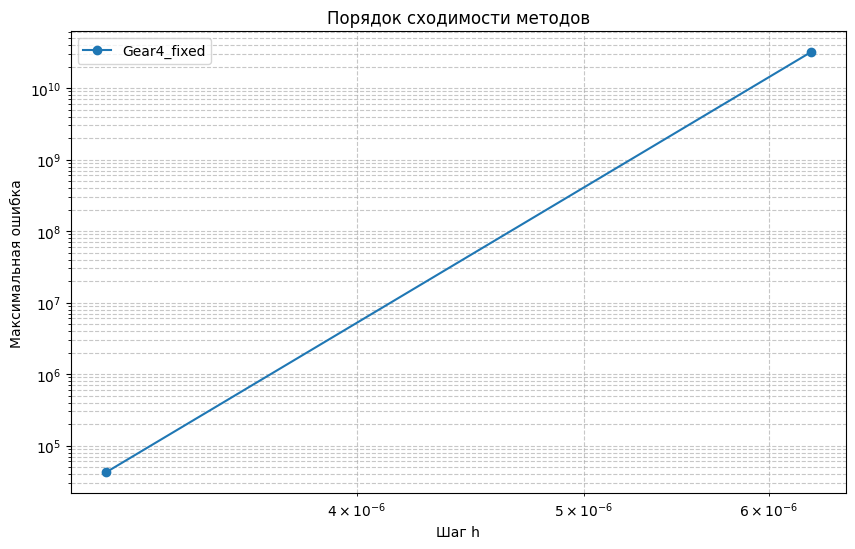

ITERATION 4 0
x0= 0.04 y0= 0.0
✅ rk4_solve: успех, 101 шагов (h=0.0001)
✅ pece4_solve: успех, 101 шагов (h=0.0001)
✅ gear4_fixed_step: успех, 101 шагов (h=0.0001)
✅ rk4_solve: успех, 201 шагов (h=5e-05)
✅ pece4_solve: успех, 201 шагов (h=5e-05)
✅ gear4_fixed_step: успех, 201 шагов (h=5e-05)
✅ rk4_solve: успех, 401 шагов (h=2.5e-05)
✅ pece4_solve: успех, 401 шагов (h=2.5e-05)
✅ gear4_fixed_step: успех, 401 шагов (h=2.5e-05)
✅ rk4_solve: успех, 801 шагов (h=1.25e-05)
✅ pece4_solve: успех, 801 шагов (h=1.25e-05)
✅ gear4_fixed_step: успех, 801 шагов (h=1.25e-05)
✅ rk4_solve: успех, 1601 шагов (h=6.25e-06)
✅ pece4_solve: успех, 1601 шагов (h=6.25e-06)
✅ gear4_fixed_step: успех, 1601 шагов (h=6.25e-06)
✅ rk4_solve: успех, 3201 шагов (h=3.125e-06)
✅ pece4_solve: успех, 3201 шагов (h=3.125e-06)
✅ gear4_fixed_step: успех, 3201 шагов (h=3.125e-06)
          h           RK4  p_RK4         PECE4  p_PECE4   Gear4_fixed  p_Gear4_fixed
0  0.000100  3.661234e-10    NaN  3.661234e-10      NaN  3.669340

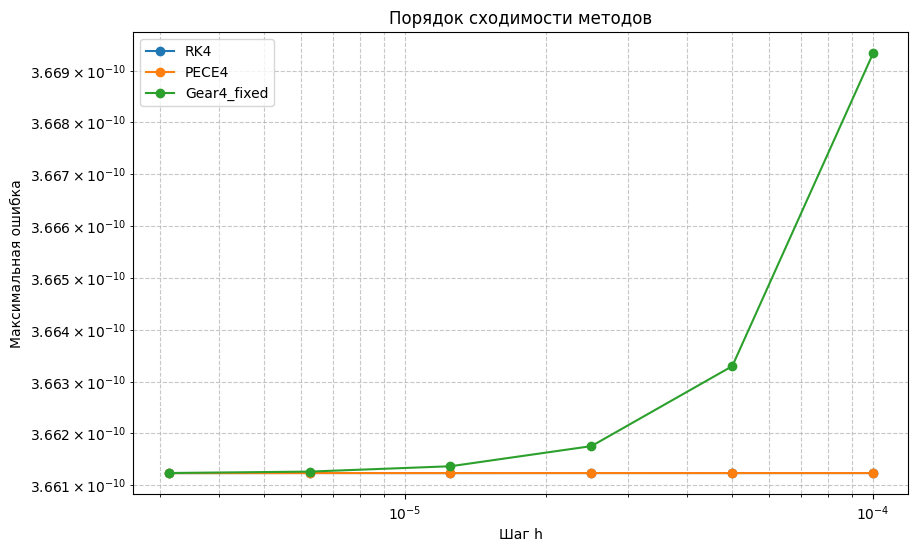

ITERATION 4 1
x0= 0.04 y0= 0.01
❌ rk4_solve: NaN или inf в решении (h=0.0001)
⚠️ RK4 при h=0.0001: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ pece4_solve: NaN или inf в решении (h=0.0001)
⚠️ PECE4 при h=0.0001: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ Gear4: расходимость на шаге 3, h=0.0001
❌ gear4_fixed_step: переполнение (h=0.0001)
⚠️ Gear4_fixed при h=0.0001: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ rk4_solve: NaN или inf в решении (h=5e-05)
⚠️ RK4 при h=5e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ pece4_solve: NaN или inf в решении (h=5e-05)
⚠️ PECE4 при h=5e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ Gear4: расходимость на шаге 3, h=5e-05
✅ gear4_fixed_step: успех, 4 шагов (h=5e-05)
❌ rk4_solve: NaN или inf в решении (h=2.5e-05)
⚠️ RK4 при h=2.5e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ pece4_solve: NaN или inf в р

C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:7: RuntimeWarning: overflow encountered in scalar multiply
  dydt = y * (2 * a2 - 0.5 * y - 3.5 * (a2_reg**2) * x)
C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:6: RuntimeWarning: invalid value encountered in scalar multiply
  dxdt = x * (1 - 0.5 * x - (2/7) * (a2_reg**-2) * y)
C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:7: RuntimeWarning: overflow encountered in scalar power
  dydt = y * (2 * a2 - 0.5 * y - 3.5 * (a2_reg**2) * x)
C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:7: RuntimeWarning: invalid value encountered in scalar subtract
  dydt = y * (2 * a2 - 0.5 * y - 3.5 * (a2_reg**2) * x)
C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:8: RuntimeWarning: overflow encountered in scalar multiply
  da2dt = epsilon * (2 - 7 * a2 * x)
C:\Users\lilia\AppData\Local\Programs\Python\Python313\Lib\site-packages\numpy\linalg\_linalg.py:2792: RuntimeWarning: 

✅ rk4_solve: успех, 801 шагов (h=1.25e-05)
❌ pece4_solve: NaN или inf в решении (h=1.25e-05)
⚠️ PECE4 при h=1.25e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ Gear4: расходимость на шаге 7, h=1.25e-05
✅ gear4_fixed_step: успех, 8 шагов (h=1.25e-05)
✅ rk4_solve: успех, 1601 шагов (h=6.25e-06)
✅ pece4_solve: успех, 1601 шагов (h=6.25e-06)
✅ gear4_fixed_step: успех, 1601 шагов (h=6.25e-06)
✅ rk4_solve: успех, 3201 шагов (h=3.125e-06)
✅ pece4_solve: успех, 3201 шагов (h=3.125e-06)
✅ gear4_fixed_step: успех, 3201 шагов (h=3.125e-06)
          h           RK4  p_RK4          PECE4  p_PECE4   Gear4_fixed  p_Gear4_fixed
0  0.000100           NaN    NaN            NaN      NaN           NaN            NaN
1  0.000050           NaN    NaN            NaN      NaN  2.327108e+09            NaN
2  0.000025           NaN    NaN            NaN      NaN  1.153847e+04          17.62
3  0.000013  34114.445483    NaN            NaN      NaN  2.515270e+05          -4.45
4  0.0000

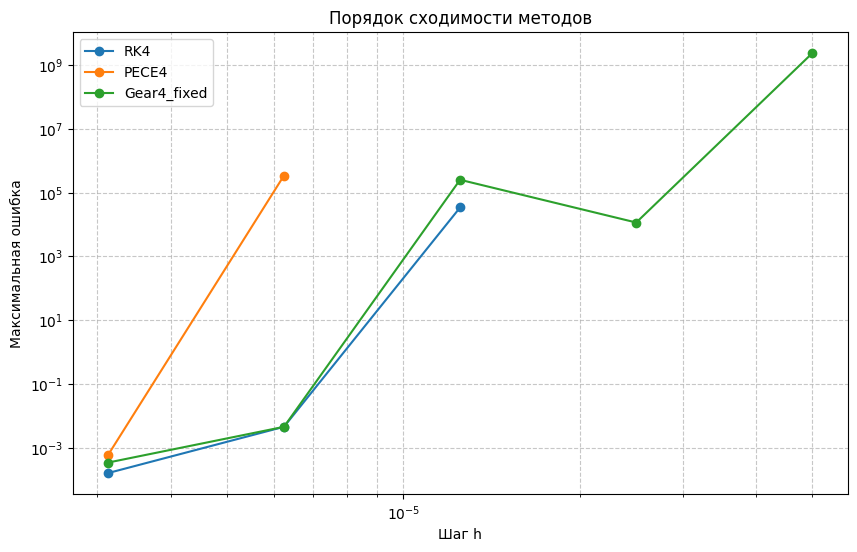

ITERATION 4 2
x0= 0.04 y0= 0.02
❌ rk4_solve: NaN или inf в решении (h=0.0001)
⚠️ RK4 при h=0.0001: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ pece4_solve: NaN или inf в решении (h=0.0001)
⚠️ PECE4 при h=0.0001: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ Gear4: расходимость на шаге 3, h=0.0001
❌ gear4_fixed_step: NaN или inf в решении (h=0.0001)
⚠️ Gear4_fixed при h=0.0001: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ rk4_solve: NaN или inf в решении (h=5e-05)
⚠️ RK4 при h=5e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ pece4_solve: NaN или inf в решении (h=5e-05)
⚠️ PECE4 при h=5e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ Gear4: расходимость на шаге 3, h=5e-05
❌ gear4_fixed_step: переполнение (h=5e-05)
⚠️ Gear4_fixed при h=5e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ rk4_solve: NaN или inf в решении (h=2.5e-05)
⚠️ RK4 при h=2.5e

C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:7: RuntimeWarning: overflow encountered in scalar multiply
  dydt = y * (2 * a2 - 0.5 * y - 3.5 * (a2_reg**2) * x)
C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:7: RuntimeWarning: invalid value encountered in scalar subtract
  dydt = y * (2 * a2 - 0.5 * y - 3.5 * (a2_reg**2) * x)
C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:7: RuntimeWarning: overflow encountered in scalar power
  dydt = y * (2 * a2 - 0.5 * y - 3.5 * (a2_reg**2) * x)
C:\Users\lilia\AppData\Local\Programs\Python\Python313\Lib\site-packages\numpy\linalg\_linalg.py:2792: RuntimeWarning: overflow encountered in dot
  sqnorm = x.dot(x)
C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:6: RuntimeWarning: invalid value encountered in scalar multiply
  dxdt = x * (1 - 0.5 * x - (2/7) * (a2_reg**-2) * y)
C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:8: RuntimeWarning: overflow encountered in scala

❌ rk4_solve: NaN или inf в решении (h=1.25e-05)
⚠️ RK4 при h=1.25e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ pece4_solve: NaN или inf в решении (h=1.25e-05)
⚠️ PECE4 при h=1.25e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ Gear4: расходимость на шаге 3, h=1.25e-05
✅ gear4_fixed_step: успех, 4 шагов (h=1.25e-05)
✅ rk4_solve: успех, 1601 шагов (h=6.25e-06)
❌ pece4_solve: NaN или inf в решении (h=6.25e-06)
⚠️ PECE4 при h=6.25e-06: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ Gear4: расходимость на шаге 4, h=6.25e-06
✅ gear4_fixed_step: успех, 5 шагов (h=6.25e-06)
✅ rk4_solve: успех, 3201 шагов (h=3.125e-06)
✅ pece4_solve: успех, 3201 шагов (h=3.125e-06)
✅ gear4_fixed_step: успех, 3201 шагов (h=3.125e-06)
          h           RK4  p_RK4          PECE4  p_PECE4   Gear4_fixed  p_Gear4_fixed
0  0.000100           NaN    NaN            NaN      NaN           NaN            NaN
1  0.000050           NaN    NaN     

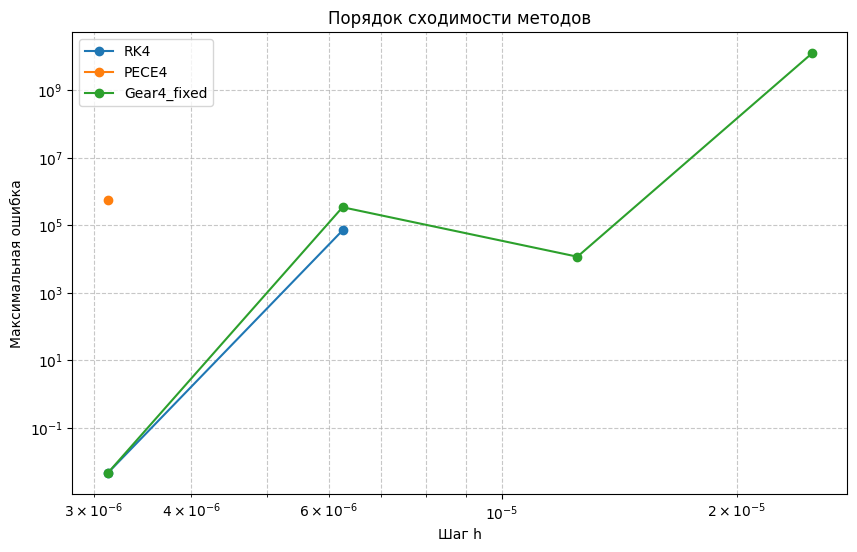

ITERATION 4 3
x0= 0.04 y0= 0.03
❌ rk4_solve: NaN или inf в решении (h=0.0001)
⚠️ RK4 при h=0.0001: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ pece4_solve: NaN или inf в решении (h=0.0001)
⚠️ PECE4 при h=0.0001: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ Gear4: расходимость на шаге 3, h=0.0001
❌ gear4_fixed_step: NaN или inf в решении (h=0.0001)
⚠️ Gear4_fixed при h=0.0001: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ rk4_solve: NaN или inf в решении (h=5e-05)
⚠️ RK4 при h=5e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ pece4_solve: NaN или inf в решении (h=5e-05)
⚠️ PECE4 при h=5e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ Gear4: расходимость на шаге 3, h=5e-05
❌ gear4_fixed_step: переполнение (h=5e-05)
⚠️ Gear4_fixed при h=5e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ rk4_solve: NaN или inf в решении (h=2.5e-05)
⚠️ RK4 при h=2.5e

C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:7: RuntimeWarning: overflow encountered in scalar multiply
  dydt = y * (2 * a2 - 0.5 * y - 3.5 * (a2_reg**2) * x)
C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:6: RuntimeWarning: invalid value encountered in scalar multiply
  dxdt = x * (1 - 0.5 * x - (2/7) * (a2_reg**-2) * y)
C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:7: RuntimeWarning: overflow encountered in scalar power
  dydt = y * (2 * a2 - 0.5 * y - 3.5 * (a2_reg**2) * x)
C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:7: RuntimeWarning: invalid value encountered in scalar subtract
  dydt = y * (2 * a2 - 0.5 * y - 3.5 * (a2_reg**2) * x)
C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:8: RuntimeWarning: overflow encountered in scalar multiply
  da2dt = epsilon * (2 - 7 * a2 * x)
C:\Users\lilia\AppData\Local\Programs\Python\Python313\Lib\site-packages\numpy\linalg\_linalg.py:2792: RuntimeWarning: 

❌ rk4_solve: NaN или inf в решении (h=1.25e-05)
⚠️ RK4 при h=1.25e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ pece4_solve: NaN или inf в решении (h=1.25e-05)
⚠️ PECE4 при h=1.25e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ Gear4: расходимость на шаге 3, h=1.25e-05
✅ gear4_fixed_step: успех, 4 шагов (h=1.25e-05)
❌ rk4_solve: NaN или inf в решении (h=6.25e-06)
⚠️ RK4 при h=6.25e-06: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ pece4_solve: NaN или inf в решении (h=6.25e-06)
⚠️ PECE4 при h=6.25e-06: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ Gear4: расходимость на шаге 3, h=6.25e-06
✅ gear4_fixed_step: успех, 4 шагов (h=6.25e-06)
✅ rk4_solve: успех, 3201 шагов (h=3.125e-06)
❌ pece4_solve: NaN или inf в решении (h=3.125e-06)
⚠️ PECE4 при h=3.125e-06: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ Gear4: расходимость на шаге 7, h=3.125e-06
✅ gear4_fixed_step: успех, 

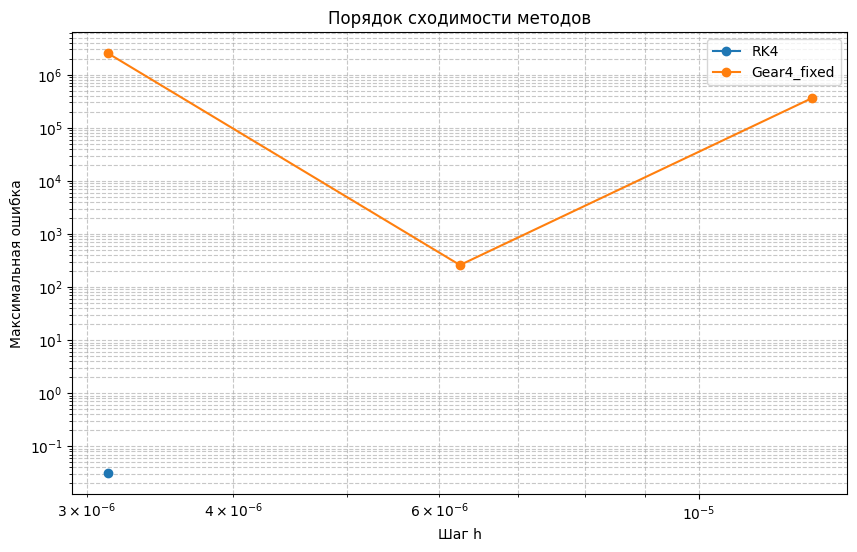

ITERATION 4 4
x0= 0.04 y0= 0.04
❌ rk4_solve: NaN или inf в решении (h=0.0001)
⚠️ RK4 при h=0.0001: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ pece4_solve: NaN или inf в решении (h=0.0001)
⚠️ PECE4 при h=0.0001: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ Gear4: расходимость на шаге 3, h=0.0001
❌ gear4_fixed_step: NaN или inf в решении (h=0.0001)
⚠️ Gear4_fixed при h=0.0001: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ rk4_solve: NaN или inf в решении (h=5e-05)
⚠️ RK4 при h=5e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ pece4_solve: NaN или inf в решении (h=5e-05)
⚠️ PECE4 при h=5e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ Gear4: расходимость на шаге 3, h=5e-05
❌ gear4_fixed_step: переполнение (h=5e-05)
⚠️ Gear4_fixed при h=5e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ rk4_solve: NaN или inf в решении (h=2.5e-05)
⚠️ RK4 при h=2.5e

C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:7: RuntimeWarning: overflow encountered in scalar multiply
  dydt = y * (2 * a2 - 0.5 * y - 3.5 * (a2_reg**2) * x)
C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:7: RuntimeWarning: invalid value encountered in scalar subtract
  dydt = y * (2 * a2 - 0.5 * y - 3.5 * (a2_reg**2) * x)
C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:8: RuntimeWarning: overflow encountered in scalar multiply
  da2dt = epsilon * (2 - 7 * a2 * x)
C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\1111329400.py:7: RuntimeWarning: invalid value encountered in add
  k2 = f(t + h/2, y + h/2 * k1, epsilon)
C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\995573919.py:8: RuntimeWarning: invalid value encountered in add
  y_pred = y + h/24 * (55*f_vals[3] - 59*f_vals[2] + 37*f_vals[1] - 9*f_vals[0])
C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3752895320.py:29: RuntimeWarning: invalid value encountered in add
  y_nex

❌ pece4_solve: NaN или inf в решении (h=1.25e-05)
⚠️ PECE4 при h=1.25e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ Gear4: расходимость на шаге 3, h=1.25e-05
✅ gear4_fixed_step: успех, 4 шагов (h=1.25e-05)
❌ rk4_solve: NaN или inf в решении (h=6.25e-06)
⚠️ RK4 при h=6.25e-06: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ pece4_solve: NaN или inf в решении (h=6.25e-06)
⚠️ PECE4 при h=6.25e-06: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ Gear4: расходимость на шаге 3, h=6.25e-06
✅ gear4_fixed_step: успех, 4 шагов (h=6.25e-06)
✅ rk4_solve: успех, 3201 шагов (h=3.125e-06)
❌ pece4_solve: NaN или inf в решении (h=3.125e-06)
⚠️ PECE4 при h=3.125e-06: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ Gear4: расходимость на шаге 4, h=3.125e-06
✅ gear4_fixed_step: успех, 5 шагов (h=3.125e-06)
          h            RK4  p_RK4  PECE4  p_PECE4   Gear4_fixed  p_Gear4_fixed
0  0.000100            NaN    NaN   

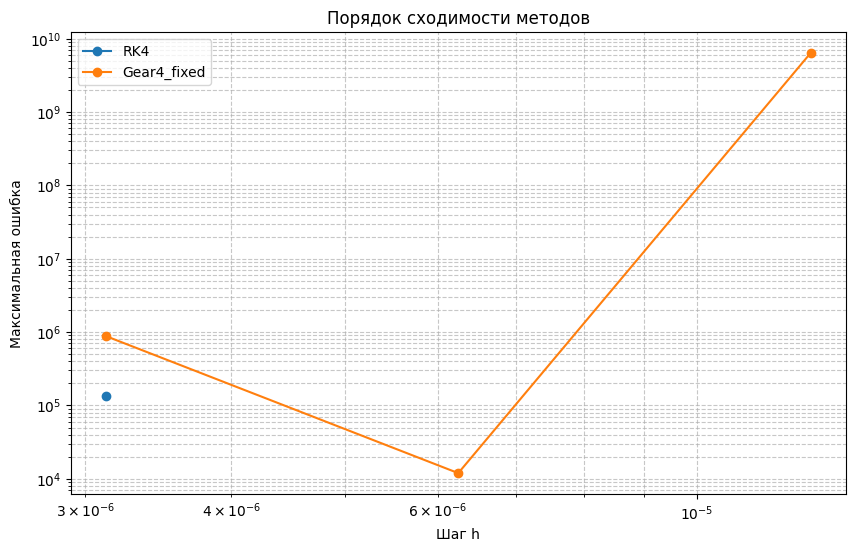

ITERATION 4 5
x0= 0.04 y0= 0.05
❌ rk4_solve: NaN или inf в решении (h=0.0001)
⚠️ RK4 при h=0.0001: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ pece4_solve: NaN или inf в решении (h=0.0001)
⚠️ PECE4 при h=0.0001: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ Gear4: расходимость на шаге 3, h=0.0001
❌ gear4_fixed_step: NaN или inf в решении (h=0.0001)
⚠️ Gear4_fixed при h=0.0001: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ rk4_solve: NaN или inf в решении (h=5e-05)
⚠️ RK4 при h=5e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ pece4_solve: NaN или inf в решении (h=5e-05)
⚠️ PECE4 при h=5e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ Gear4: расходимость на шаге 3, h=5e-05
❌ gear4_fixed_step: NaN или inf в решении (h=5e-05)
⚠️ Gear4_fixed при h=5e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ rk4_solve: NaN или inf в решении (h=2.5e-05)
⚠️ RK4 п

C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:7: RuntimeWarning: overflow encountered in scalar multiply
  dydt = y * (2 * a2 - 0.5 * y - 3.5 * (a2_reg**2) * x)
C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:6: RuntimeWarning: invalid value encountered in scalar multiply
  dxdt = x * (1 - 0.5 * x - (2/7) * (a2_reg**-2) * y)
C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:7: RuntimeWarning: overflow encountered in scalar power
  dydt = y * (2 * a2 - 0.5 * y - 3.5 * (a2_reg**2) * x)
C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:7: RuntimeWarning: invalid value encountered in scalar subtract
  dydt = y * (2 * a2 - 0.5 * y - 3.5 * (a2_reg**2) * x)
C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:8: RuntimeWarning: overflow encountered in scalar multiply
  da2dt = epsilon * (2 - 7 * a2 * x)
C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\1111329400.py:11: RuntimeWarning: invalid value encountered in add
  

❌ rk4_solve: NaN или inf в решении (h=1.25e-05)
⚠️ RK4 при h=1.25e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ pece4_solve: NaN или inf в решении (h=1.25e-05)
⚠️ PECE4 при h=1.25e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ Gear4: расходимость на шаге 3, h=1.25e-05
✅ gear4_fixed_step: успех, 4 шагов (h=1.25e-05)
❌ rk4_solve: NaN или inf в решении (h=6.25e-06)
⚠️ RK4 при h=6.25e-06: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ pece4_solve: NaN или inf в решении (h=6.25e-06)
⚠️ PECE4 при h=6.25e-06: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ Gear4: расходимость на шаге 3, h=6.25e-06
✅ gear4_fixed_step: успех, 4 шагов (h=6.25e-06)
✅ rk4_solve: успех, 3201 шагов (h=3.125e-06)
❌ pece4_solve: NaN или inf в решении (h=3.125e-06)
⚠️ PECE4 при h=3.125e-06: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ Gear4: расходимость на шаге 4, h=3.125e-06
✅ gear4_fixed_step: успех, 

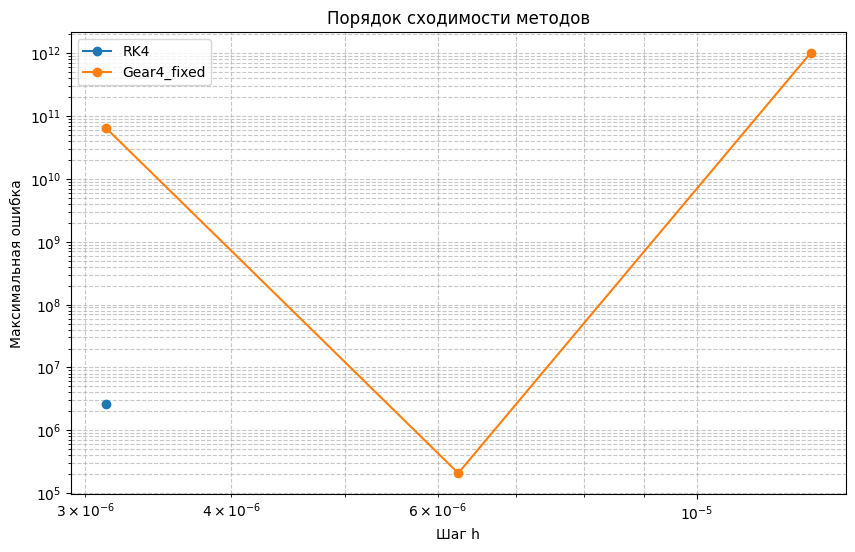

ITERATION 4 6
x0= 0.04 y0= 0.06
❌ rk4_solve: NaN или inf в решении (h=0.0001)
⚠️ RK4 при h=0.0001: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ pece4_solve: NaN или inf в решении (h=0.0001)
⚠️ PECE4 при h=0.0001: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ Gear4: расходимость на шаге 3, h=0.0001
❌ gear4_fixed_step: NaN или inf в решении (h=0.0001)
⚠️ Gear4_fixed при h=0.0001: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ rk4_solve: NaN или inf в решении (h=5e-05)
⚠️ RK4 при h=5e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ pece4_solve: NaN или inf в решении (h=5e-05)
⚠️ PECE4 при h=5e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ Gear4: расходимость на шаге 3, h=5e-05
❌ gear4_fixed_step: переполнение (h=5e-05)
⚠️ Gear4_fixed при h=5e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ rk4_solve: NaN или inf в решении (h=2.5e-05)
⚠️ RK4 при h=2.5e

C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:7: RuntimeWarning: overflow encountered in scalar multiply
  dydt = y * (2 * a2 - 0.5 * y - 3.5 * (a2_reg**2) * x)
C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:6: RuntimeWarning: invalid value encountered in scalar multiply
  dxdt = x * (1 - 0.5 * x - (2/7) * (a2_reg**-2) * y)
C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:7: RuntimeWarning: overflow encountered in scalar power
  dydt = y * (2 * a2 - 0.5 * y - 3.5 * (a2_reg**2) * x)
C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:7: RuntimeWarning: invalid value encountered in scalar subtract
  dydt = y * (2 * a2 - 0.5 * y - 3.5 * (a2_reg**2) * x)
C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:8: RuntimeWarning: overflow encountered in scalar multiply
  da2dt = epsilon * (2 - 7 * a2 * x)
C:\Users\lilia\AppData\Local\Programs\Python\Python313\Lib\site-packages\numpy\linalg\_linalg.py:2792: RuntimeWarning: 

❌ rk4_solve: NaN или inf в решении (h=1.25e-05)
⚠️ RK4 при h=1.25e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ pece4_solve: NaN или inf в решении (h=1.25e-05)
⚠️ PECE4 при h=1.25e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ Gear4: расходимость на шаге 3, h=1.25e-05
❌ gear4_fixed_step: переполнение (h=1.25e-05)
⚠️ Gear4_fixed при h=1.25e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ rk4_solve: NaN или inf в решении (h=6.25e-06)
⚠️ RK4 при h=6.25e-06: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ pece4_solve: NaN или inf в решении (h=6.25e-06)
⚠️ PECE4 при h=6.25e-06: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ Gear4: расходимость на шаге 3, h=6.25e-06
✅ gear4_fixed_step: успех, 4 шагов (h=6.25e-06)
❌ rk4_solve: NaN или inf в решении (h=3.125e-06)
⚠️ RK4 при h=3.125e-06: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ pece4_solve: NaN или inf

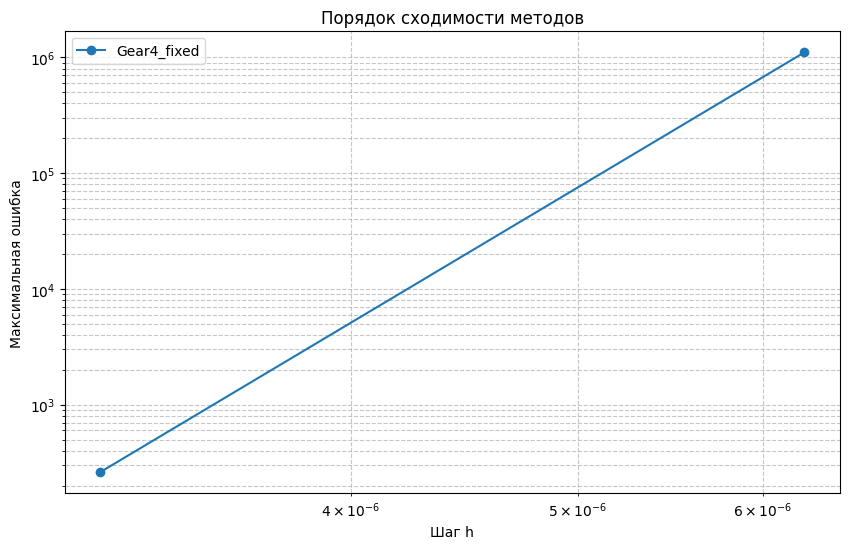

ITERATION 4 7
x0= 0.04 y0= 0.07
❌ rk4_solve: NaN или inf в решении (h=0.0001)
⚠️ RK4 при h=0.0001: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ pece4_solve: NaN или inf в решении (h=0.0001)
⚠️ PECE4 при h=0.0001: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ Gear4: расходимость на шаге 3, h=0.0001
❌ gear4_fixed_step: NaN или inf в решении (h=0.0001)
⚠️ Gear4_fixed при h=0.0001: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ rk4_solve: NaN или inf в решении (h=5e-05)
⚠️ RK4 при h=5e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ pece4_solve: NaN или inf в решении (h=5e-05)
⚠️ PECE4 при h=5e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ Gear4: расходимость на шаге 3, h=5e-05
❌ gear4_fixed_step: NaN или inf в решении (h=5e-05)
⚠️ Gear4_fixed при h=5e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ rk4_solve: NaN или inf в решении (h=2.5e-05)
⚠️ RK4 п

C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:7: RuntimeWarning: overflow encountered in scalar multiply
  dydt = y * (2 * a2 - 0.5 * y - 3.5 * (a2_reg**2) * x)
C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:6: RuntimeWarning: invalid value encountered in scalar multiply
  dxdt = x * (1 - 0.5 * x - (2/7) * (a2_reg**-2) * y)
C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:7: RuntimeWarning: overflow encountered in scalar power
  dydt = y * (2 * a2 - 0.5 * y - 3.5 * (a2_reg**2) * x)
C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:7: RuntimeWarning: invalid value encountered in scalar subtract
  dydt = y * (2 * a2 - 0.5 * y - 3.5 * (a2_reg**2) * x)
C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:8: RuntimeWarning: overflow encountered in scalar multiply
  da2dt = epsilon * (2 - 7 * a2 * x)
C:\Users\lilia\AppData\Local\Programs\Python\Python313\Lib\site-packages\numpy\linalg\_linalg.py:2792: RuntimeWarning: 

❌ pece4_solve: NaN или inf в решении (h=1.25e-05)
⚠️ PECE4 при h=1.25e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ Gear4: расходимость на шаге 3, h=1.25e-05
❌ gear4_fixed_step: переполнение (h=1.25e-05)
⚠️ Gear4_fixed при h=1.25e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ rk4_solve: NaN или inf в решении (h=6.25e-06)
⚠️ RK4 при h=6.25e-06: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ pece4_solve: NaN или inf в решении (h=6.25e-06)
⚠️ PECE4 при h=6.25e-06: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ Gear4: расходимость на шаге 3, h=6.25e-06
✅ gear4_fixed_step: успех, 4 шагов (h=6.25e-06)
❌ rk4_solve: NaN или inf в решении (h=3.125e-06)
⚠️ RK4 при h=3.125e-06: operands could not be broadcast together with shapes (1,0) (1,3) 


C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\1111329400.py:7: RuntimeWarning: invalid value encountered in add
  k2 = f(t + h/2, y + h/2 * k1, epsilon)
C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\995573919.py:14: RuntimeWarning: invalid value encountered in add
  y_corr = y + h/24 * (9*f_pred + 19*f_vals[3] - 5*f_vals[2] + f_vals[1])


❌ pece4_solve: NaN или inf в решении (h=3.125e-06)
⚠️ PECE4 при h=3.125e-06: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ Gear4: расходимость на шаге 3, h=3.125e-06
✅ gear4_fixed_step: успех, 4 шагов (h=3.125e-06)
          h  RK4  p_RK4  PECE4  p_PECE4   Gear4_fixed  p_Gear4_fixed
0  0.000100  NaN    NaN    NaN      NaN           NaN            NaN
1  0.000050  NaN    NaN    NaN      NaN           NaN            NaN
2  0.000025  NaN    NaN    NaN      NaN           NaN            NaN
3  0.000013  NaN    NaN    NaN      NaN           NaN            NaN
4  0.000006  NaN    NaN    NaN      NaN  4.314620e+07            NaN
5  0.000003  NaN    NaN    NaN      NaN  2.047389e+03          14.36


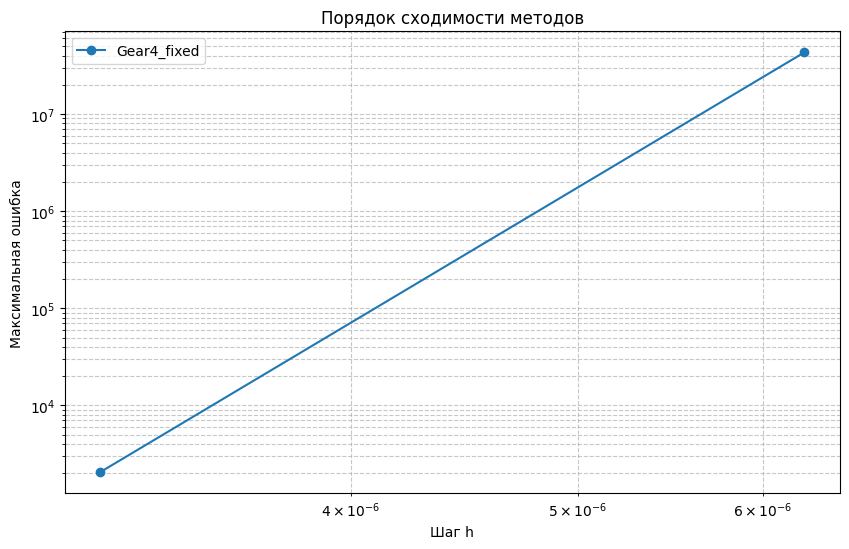

ITERATION 4 8
x0= 0.04 y0= 0.08
❌ rk4_solve: NaN или inf в решении (h=0.0001)
⚠️ RK4 при h=0.0001: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ pece4_solve: NaN или inf в решении (h=0.0001)
⚠️ PECE4 при h=0.0001: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ Gear4: расходимость на шаге 3, h=0.0001
❌ gear4_fixed_step: NaN или inf в решении (h=0.0001)
⚠️ Gear4_fixed при h=0.0001: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ rk4_solve: NaN или inf в решении (h=5e-05)
⚠️ RK4 при h=5e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ pece4_solve: NaN или inf в решении (h=5e-05)
⚠️ PECE4 при h=5e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ Gear4: расходимость на шаге 3, h=5e-05
❌ gear4_fixed_step: NaN или inf в решении (h=5e-05)
⚠️ Gear4_fixed при h=5e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ rk4_solve: NaN или inf в решении (h=2.5e-05)
⚠️ RK4 п

C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:7: RuntimeWarning: overflow encountered in scalar multiply
  dydt = y * (2 * a2 - 0.5 * y - 3.5 * (a2_reg**2) * x)
C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:6: RuntimeWarning: invalid value encountered in scalar multiply
  dxdt = x * (1 - 0.5 * x - (2/7) * (a2_reg**-2) * y)
C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:7: RuntimeWarning: overflow encountered in scalar power
  dydt = y * (2 * a2 - 0.5 * y - 3.5 * (a2_reg**2) * x)
C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:7: RuntimeWarning: invalid value encountered in scalar subtract
  dydt = y * (2 * a2 - 0.5 * y - 3.5 * (a2_reg**2) * x)
C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:8: RuntimeWarning: overflow encountered in scalar multiply
  da2dt = epsilon * (2 - 7 * a2 * x)
C:\Users\lilia\AppData\Local\Programs\Python\Python313\Lib\site-packages\numpy\linalg\_linalg.py:2792: RuntimeWarning: 

❌ pece4_solve: NaN или inf в решении (h=2.5e-05)
⚠️ PECE4 при h=2.5e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ Gear4: расходимость на шаге 3, h=2.5e-05
❌ gear4_fixed_step: переполнение (h=2.5e-05)
⚠️ Gear4_fixed при h=2.5e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ rk4_solve: NaN или inf в решении (h=1.25e-05)
⚠️ RK4 при h=1.25e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ pece4_solve: NaN или inf в решении (h=1.25e-05)
⚠️ PECE4 при h=1.25e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ Gear4: расходимость на шаге 3, h=1.25e-05
❌ gear4_fixed_step: переполнение (h=1.25e-05)
⚠️ Gear4_fixed при h=1.25e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ rk4_solve: NaN или inf в решении (h=6.25e-06)
⚠️ RK4 при h=6.25e-06: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ pece4_solve: NaN или inf в решении (h=6.25e-06)
⚠️ PECE4 при h=6.25e-06: 

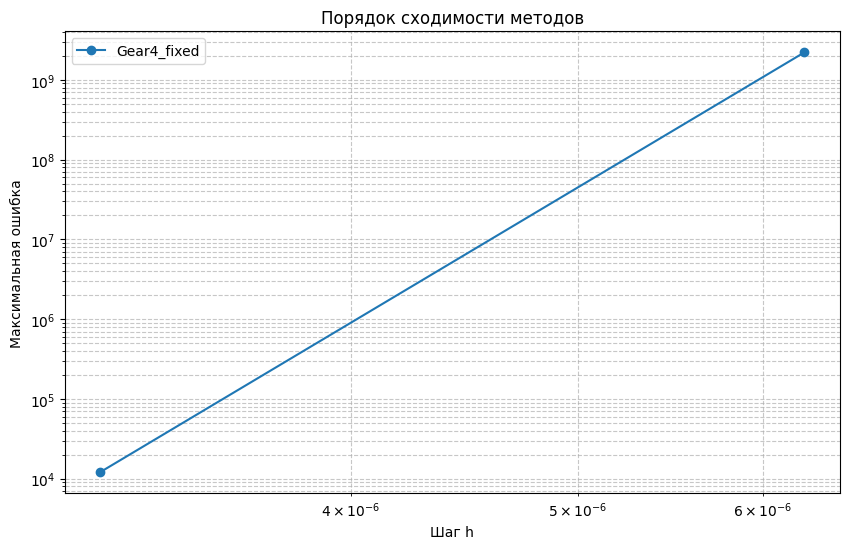

ITERATION 4 9
x0= 0.04 y0= 0.09
❌ rk4_solve: NaN или inf в решении (h=0.0001)
⚠️ RK4 при h=0.0001: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ pece4_solve: NaN или inf в решении (h=0.0001)
⚠️ PECE4 при h=0.0001: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ Gear4: расходимость на шаге 3, h=0.0001
❌ gear4_fixed_step: NaN или inf в решении (h=0.0001)
⚠️ Gear4_fixed при h=0.0001: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ rk4_solve: NaN или inf в решении (h=5e-05)
⚠️ RK4 при h=5e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ pece4_solve: NaN или inf в решении (h=5e-05)
⚠️ PECE4 при h=5e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ Gear4: расходимость на шаге 3, h=5e-05
❌ gear4_fixed_step: NaN или inf в решении (h=5e-05)
⚠️ Gear4_fixed при h=5e-05: operands could not be broadcast together with shapes (1,0) (1,3) 


C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:7: RuntimeWarning: overflow encountered in scalar multiply
  dydt = y * (2 * a2 - 0.5 * y - 3.5 * (a2_reg**2) * x)
C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:7: RuntimeWarning: invalid value encountered in scalar subtract
  dydt = y * (2 * a2 - 0.5 * y - 3.5 * (a2_reg**2) * x)
C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:7: RuntimeWarning: overflow encountered in scalar power
  dydt = y * (2 * a2 - 0.5 * y - 3.5 * (a2_reg**2) * x)
C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:8: RuntimeWarning: overflow encountered in scalar multiply
  da2dt = epsilon * (2 - 7 * a2 * x)
C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\1111329400.py:7: RuntimeWarning: invalid value encountered in add
  k2 = f(t + h/2, y + h/2 * k1, epsilon)
C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\995573919.py:8: RuntimeWarning: invalid value encountered in add
  y_pred = y + h/24 * (55*f_v

❌ rk4_solve: NaN или inf в решении (h=2.5e-05)
⚠️ RK4 при h=2.5e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ pece4_solve: NaN или inf в решении (h=2.5e-05)
⚠️ PECE4 при h=2.5e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ Gear4: расходимость на шаге 3, h=2.5e-05
❌ gear4_fixed_step: переполнение (h=2.5e-05)
⚠️ Gear4_fixed при h=2.5e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ rk4_solve: NaN или inf в решении (h=1.25e-05)
⚠️ RK4 при h=1.25e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ pece4_solve: NaN или inf в решении (h=1.25e-05)
⚠️ PECE4 при h=1.25e-05: operands could not be broadcast together with shapes (1,0) (1,3) 


C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\995573919.py:14: RuntimeWarning: invalid value encountered in add
  y_corr = y + h/24 * (9*f_pred + 19*f_vals[3] - 5*f_vals[2] + f_vals[1])


❌ Gear4: расходимость на шаге 3, h=1.25e-05
❌ gear4_fixed_step: переполнение (h=1.25e-05)
⚠️ Gear4_fixed при h=1.25e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ rk4_solve: NaN или inf в решении (h=6.25e-06)
⚠️ RK4 при h=6.25e-06: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ pece4_solve: NaN или inf в решении (h=6.25e-06)
⚠️ PECE4 при h=6.25e-06: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ Gear4: расходимость на шаге 3, h=6.25e-06
✅ gear4_fixed_step: успех, 4 шагов (h=6.25e-06)
❌ rk4_solve: NaN или inf в решении (h=3.125e-06)
⚠️ RK4 при h=3.125e-06: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ pece4_solve: NaN или inf в решении (h=3.125e-06)
⚠️ PECE4 при h=3.125e-06: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ Gear4: расходимость на шаге 3, h=3.125e-06
✅ gear4_fixed_step: успех, 4 шагов (h=3.125e-06)
          h  RK4  p_RK4  PECE4  p_PECE4   Gear4_fixed  p_Gear4_fixe

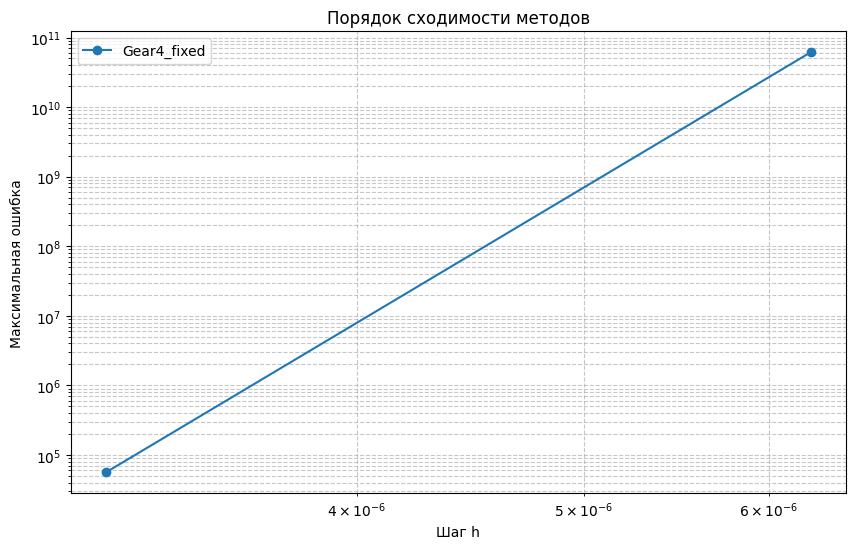

ITERATION 5 0
x0= 0.05 y0= 0.0
✅ rk4_solve: успех, 101 шагов (h=0.0001)
✅ pece4_solve: успех, 101 шагов (h=0.0001)
✅ gear4_fixed_step: успех, 101 шагов (h=0.0001)
✅ rk4_solve: успех, 201 шагов (h=5e-05)
✅ pece4_solve: успех, 201 шагов (h=5e-05)
✅ gear4_fixed_step: успех, 201 шагов (h=5e-05)
✅ rk4_solve: успех, 401 шагов (h=2.5e-05)
✅ pece4_solve: успех, 401 шагов (h=2.5e-05)
✅ gear4_fixed_step: успех, 401 шагов (h=2.5e-05)
✅ rk4_solve: успех, 801 шагов (h=1.25e-05)
✅ pece4_solve: успех, 801 шагов (h=1.25e-05)
✅ gear4_fixed_step: успех, 801 шагов (h=1.25e-05)
✅ rk4_solve: успех, 1601 шагов (h=6.25e-06)
✅ pece4_solve: успех, 1601 шагов (h=6.25e-06)
✅ gear4_fixed_step: успех, 1601 шагов (h=6.25e-06)
✅ rk4_solve: успех, 3201 шагов (h=3.125e-06)
✅ pece4_solve: успех, 3201 шагов (h=3.125e-06)
✅ gear4_fixed_step: успех, 3201 шагов (h=3.125e-06)
          h           RK4  p_RK4         PECE4  p_PECE4   Gear4_fixed  p_Gear4_fixed
0  0.000100  3.678814e-10    NaN  3.678814e-10      NaN  3.688685

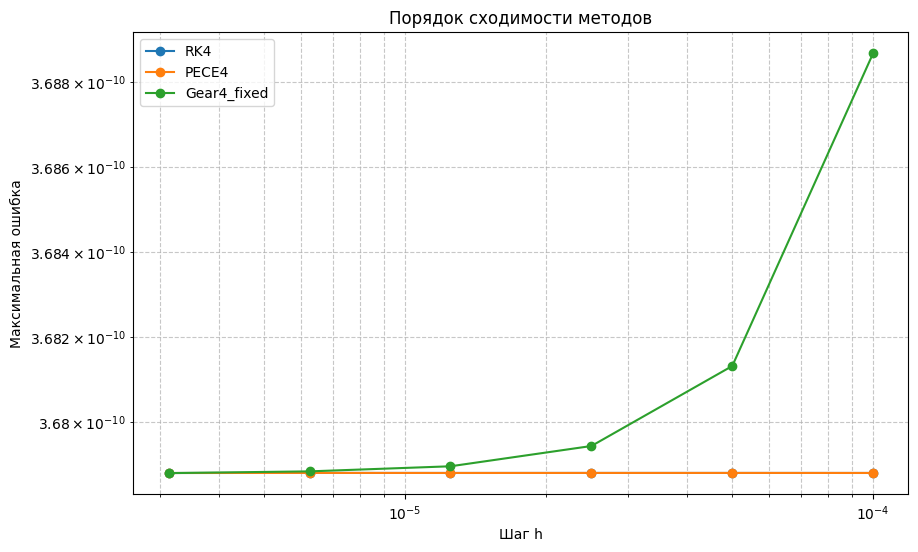

ITERATION 5 1
x0= 0.05 y0= 0.01
❌ rk4_solve: NaN или inf в решении (h=0.0001)
⚠️ RK4 при h=0.0001: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ pece4_solve: NaN или inf в решении (h=0.0001)
⚠️ PECE4 при h=0.0001: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ Gear4: расходимость на шаге 3, h=0.0001
❌ gear4_fixed_step: переполнение (h=0.0001)
⚠️ Gear4_fixed при h=0.0001: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ rk4_solve: NaN или inf в решении (h=5e-05)
⚠️ RK4 при h=5e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ pece4_solve: NaN или inf в решении (h=5e-05)
⚠️ PECE4 при h=5e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ Gear4: расходимость на шаге 3, h=5e-05
✅ gear4_fixed_step: успех, 4 шагов (h=5e-05)


C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:7: RuntimeWarning: overflow encountered in scalar multiply
  dydt = y * (2 * a2 - 0.5 * y - 3.5 * (a2_reg**2) * x)
C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:6: RuntimeWarning: invalid value encountered in scalar multiply
  dxdt = x * (1 - 0.5 * x - (2/7) * (a2_reg**-2) * y)
C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:7: RuntimeWarning: overflow encountered in scalar power
  dydt = y * (2 * a2 - 0.5 * y - 3.5 * (a2_reg**2) * x)
C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:7: RuntimeWarning: invalid value encountered in scalar subtract
  dydt = y * (2 * a2 - 0.5 * y - 3.5 * (a2_reg**2) * x)
C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:8: RuntimeWarning: overflow encountered in scalar multiply
  da2dt = epsilon * (2 - 7 * a2 * x)
C:\Users\lilia\AppData\Local\Programs\Python\Python313\Lib\site-packages\numpy\linalg\_linalg.py:2792: RuntimeWarning: 

❌ rk4_solve: NaN или inf в решении (h=2.5e-05)
⚠️ RK4 при h=2.5e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ pece4_solve: NaN или inf в решении (h=2.5e-05)
⚠️ PECE4 при h=2.5e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ Gear4: расходимость на шаге 3, h=2.5e-05
✅ gear4_fixed_step: успех, 4 шагов (h=2.5e-05)
✅ rk4_solve: успех, 801 шагов (h=1.25e-05)
❌ pece4_solve: NaN или inf в решении (h=1.25e-05)
⚠️ PECE4 при h=1.25e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ Gear4: расходимость на шаге 21, h=1.25e-05
✅ gear4_fixed_step: успех, 22 шагов (h=1.25e-05)
✅ rk4_solve: успех, 1601 шагов (h=6.25e-06)
✅ pece4_solve: успех, 1601 шагов (h=6.25e-06)
✅ gear4_fixed_step: успех, 1601 шагов (h=6.25e-06)
✅ rk4_solve: успех, 3201 шагов (h=3.125e-06)
✅ pece4_solve: успех, 3201 шагов (h=3.125e-06)
✅ gear4_fixed_step: успех, 3201 шагов (h=3.125e-06)
          h           RK4  p_RK4          PECE4  p_PECE4   Gear4_fixed  p

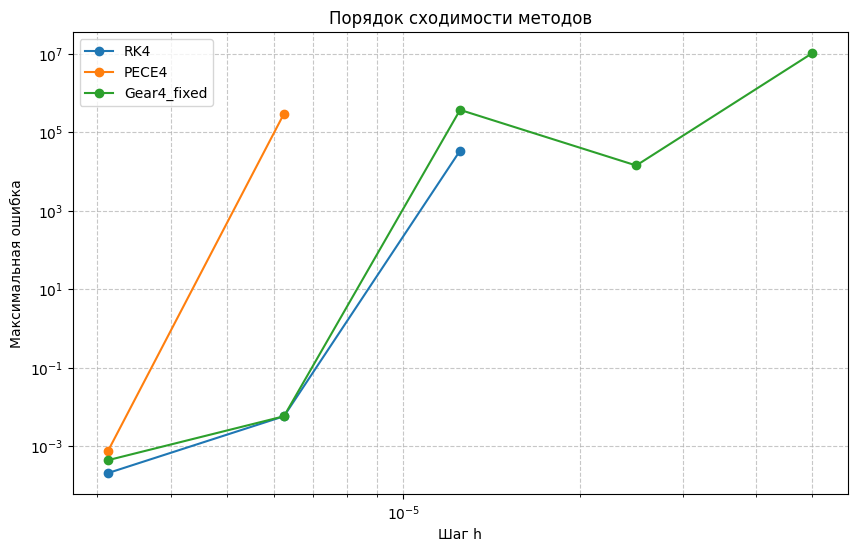

ITERATION 5 2
x0= 0.05 y0= 0.02
❌ rk4_solve: NaN или inf в решении (h=0.0001)
⚠️ RK4 при h=0.0001: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ pece4_solve: NaN или inf в решении (h=0.0001)
⚠️ PECE4 при h=0.0001: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ Gear4: расходимость на шаге 3, h=0.0001
❌ gear4_fixed_step: NaN или inf в решении (h=0.0001)
⚠️ Gear4_fixed при h=0.0001: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ rk4_solve: NaN или inf в решении (h=5e-05)


C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:7: RuntimeWarning: overflow encountered in scalar multiply
  dydt = y * (2 * a2 - 0.5 * y - 3.5 * (a2_reg**2) * x)
C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:7: RuntimeWarning: invalid value encountered in scalar subtract
  dydt = y * (2 * a2 - 0.5 * y - 3.5 * (a2_reg**2) * x)
C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:7: RuntimeWarning: overflow encountered in scalar power
  dydt = y * (2 * a2 - 0.5 * y - 3.5 * (a2_reg**2) * x)
C:\Users\lilia\AppData\Local\Programs\Python\Python313\Lib\site-packages\numpy\linalg\_linalg.py:2792: RuntimeWarning: overflow encountered in dot
  sqnorm = x.dot(x)
C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:6: RuntimeWarning: invalid value encountered in scalar multiply
  dxdt = x * (1 - 0.5 * x - (2/7) * (a2_reg**-2) * y)
C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:8: RuntimeWarning: overflow encountered in scala

⚠️ RK4 при h=5e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ pece4_solve: NaN или inf в решении (h=5e-05)
⚠️ PECE4 при h=5e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ Gear4: расходимость на шаге 3, h=5e-05
❌ gear4_fixed_step: переполнение (h=5e-05)
⚠️ Gear4_fixed при h=5e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ rk4_solve: NaN или inf в решении (h=2.5e-05)
⚠️ RK4 при h=2.5e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ pece4_solve: NaN или inf в решении (h=2.5e-05)
⚠️ PECE4 при h=2.5e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ Gear4: расходимость на шаге 3, h=2.5e-05
✅ gear4_fixed_step: успех, 4 шагов (h=2.5e-05)
❌ rk4_solve: NaN или inf в решении (h=1.25e-05)
⚠️ RK4 при h=1.25e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ pece4_solve: NaN или inf в решении (h=1.25e-05)
⚠️ PECE4 при h=1.25e-05: operands could not be bro

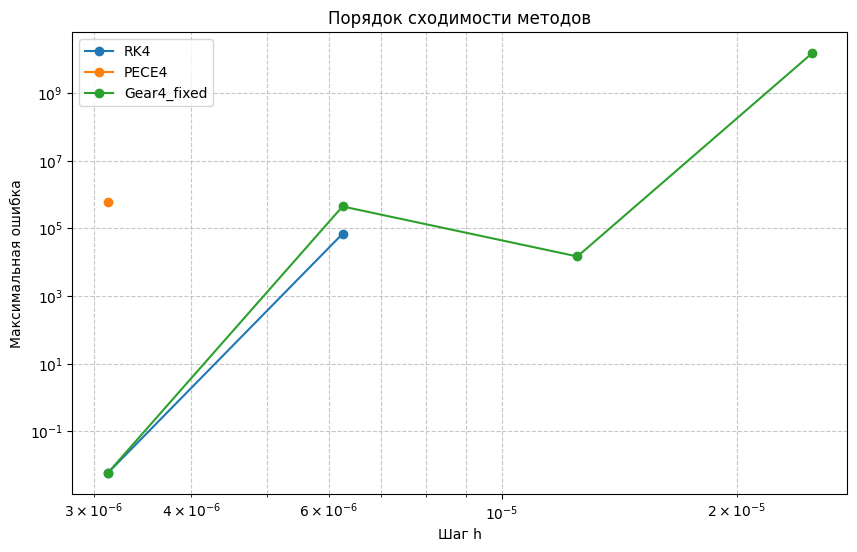

ITERATION 5 3
x0= 0.05 y0= 0.03
❌ rk4_solve: NaN или inf в решении (h=0.0001)
⚠️ RK4 при h=0.0001: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ pece4_solve: NaN или inf в решении (h=0.0001)
⚠️ PECE4 при h=0.0001: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ Gear4: расходимость на шаге 3, h=0.0001
❌ gear4_fixed_step: NaN или inf в решении (h=0.0001)
⚠️ Gear4_fixed при h=0.0001: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ rk4_solve: NaN или inf в решении (h=5e-05)
⚠️ RK4 при h=5e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ pece4_solve: NaN или inf в решении (h=5e-05)
⚠️ PECE4 при h=5e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ Gear4: расходимость на шаге 3, h=5e-05
❌ gear4_fixed_step: переполнение (h=5e-05)
⚠️ Gear4_fixed при h=5e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ rk4_solve: NaN или inf в решении (h=2.5e-05)
⚠️ RK4 при h=2.5e

C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:7: RuntimeWarning: overflow encountered in scalar multiply
  dydt = y * (2 * a2 - 0.5 * y - 3.5 * (a2_reg**2) * x)
C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:6: RuntimeWarning: invalid value encountered in scalar multiply
  dxdt = x * (1 - 0.5 * x - (2/7) * (a2_reg**-2) * y)
C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:7: RuntimeWarning: overflow encountered in scalar power
  dydt = y * (2 * a2 - 0.5 * y - 3.5 * (a2_reg**2) * x)
C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:7: RuntimeWarning: invalid value encountered in scalar subtract
  dydt = y * (2 * a2 - 0.5 * y - 3.5 * (a2_reg**2) * x)
C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:8: RuntimeWarning: overflow encountered in scalar multiply
  da2dt = epsilon * (2 - 7 * a2 * x)
C:\Users\lilia\AppData\Local\Programs\Python\Python313\Lib\site-packages\numpy\linalg\_linalg.py:2792: RuntimeWarning: 

❌ rk4_solve: NaN или inf в решении (h=1.25e-05)
⚠️ RK4 при h=1.25e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ pece4_solve: NaN или inf в решении (h=1.25e-05)
⚠️ PECE4 при h=1.25e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ Gear4: расходимость на шаге 3, h=1.25e-05
✅ gear4_fixed_step: успех, 4 шагов (h=1.25e-05)
❌ rk4_solve: NaN или inf в решении (h=6.25e-06)
⚠️ RK4 при h=6.25e-06: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ pece4_solve: NaN или inf в решении (h=6.25e-06)
⚠️ PECE4 при h=6.25e-06: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ Gear4: расходимость на шаге 3, h=6.25e-06
✅ gear4_fixed_step: успех, 4 шагов (h=6.25e-06)
✅ rk4_solve: успех, 3201 шагов (h=3.125e-06)


C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\995573919.py:8: RuntimeWarning: invalid value encountered in add
  y_pred = y + h/24 * (55*f_vals[3] - 59*f_vals[2] + 37*f_vals[1] - 9*f_vals[0])


❌ pece4_solve: NaN или inf в решении (h=3.125e-06)
⚠️ PECE4 при h=3.125e-06: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ Gear4: расходимость на шаге 7, h=3.125e-06
✅ gear4_fixed_step: успех, 8 шагов (h=3.125e-06)
          h       RK4  p_RK4  PECE4  p_PECE4   Gear4_fixed  p_Gear4_fixed
0  0.000100       NaN    NaN    NaN      NaN           NaN            NaN
1  0.000050       NaN    NaN    NaN      NaN           NaN            NaN
2  0.000025       NaN    NaN    NaN      NaN           NaN            NaN
3  0.000013       NaN    NaN    NaN      NaN  1.459374e+06            NaN
4  0.000006       NaN    NaN    NaN      NaN  3.244776e+02          12.13
5  0.000003  0.039088    NaN    NaN      NaN  1.568905e+06         -12.24


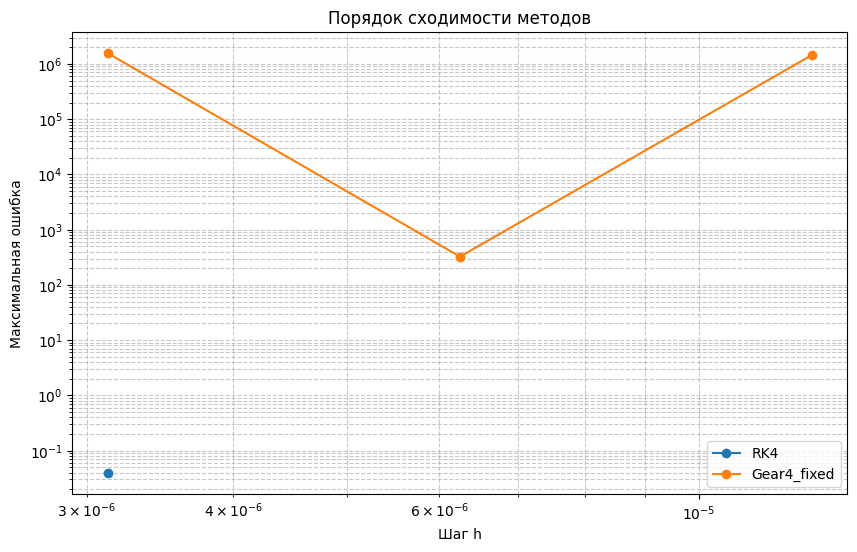

ITERATION 5 4
x0= 0.05 y0= 0.04
❌ rk4_solve: NaN или inf в решении (h=0.0001)
⚠️ RK4 при h=0.0001: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ pece4_solve: NaN или inf в решении (h=0.0001)
⚠️ PECE4 при h=0.0001: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ Gear4: расходимость на шаге 3, h=0.0001
❌ gear4_fixed_step: NaN или inf в решении (h=0.0001)
⚠️ Gear4_fixed при h=0.0001: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ rk4_solve: NaN или inf в решении (h=5e-05)
⚠️ RK4 при h=5e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ pece4_solve: NaN или inf в решении (h=5e-05)
⚠️ PECE4 при h=5e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ Gear4: расходимость на шаге 3, h=5e-05
❌ gear4_fixed_step: NaN или inf в решении (h=5e-05)
⚠️ Gear4_fixed при h=5e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ rk4_solve: NaN или inf в решении (h=2.5e-05)
⚠️ RK4 п

C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:7: RuntimeWarning: overflow encountered in scalar multiply
  dydt = y * (2 * a2 - 0.5 * y - 3.5 * (a2_reg**2) * x)
C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:7: RuntimeWarning: overflow encountered in scalar power
  dydt = y * (2 * a2 - 0.5 * y - 3.5 * (a2_reg**2) * x)
C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:7: RuntimeWarning: invalid value encountered in scalar subtract
  dydt = y * (2 * a2 - 0.5 * y - 3.5 * (a2_reg**2) * x)
C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:8: RuntimeWarning: overflow encountered in scalar multiply
  da2dt = epsilon * (2 - 7 * a2 * x)
C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\1111329400.py:7: RuntimeWarning: invalid value encountered in add
  k2 = f(t + h/2, y + h/2 * k1, epsilon)
C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\995573919.py:8: RuntimeWarning: invalid value encountered in add
  y_pred = y + h/24 * (55*f_v

❌ pece4_solve: NaN или inf в решении (h=2.5e-05)
⚠️ PECE4 при h=2.5e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ Gear4: расходимость на шаге 3, h=2.5e-05
❌ gear4_fixed_step: переполнение (h=2.5e-05)
⚠️ Gear4_fixed при h=2.5e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ rk4_solve: NaN или inf в решении (h=1.25e-05)
⚠️ RK4 при h=1.25e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ pece4_solve: NaN или inf в решении (h=1.25e-05)
⚠️ PECE4 при h=1.25e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ Gear4: расходимость на шаге 3, h=1.25e-05
✅ gear4_fixed_step: успех, 4 шагов (h=1.25e-05)
❌ rk4_solve: NaN или inf в решении (h=6.25e-06)


C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:6: RuntimeWarning: invalid value encountered in scalar multiply
  dxdt = x * (1 - 0.5 * x - (2/7) * (a2_reg**-2) * y)


⚠️ RK4 при h=6.25e-06: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ pece4_solve: NaN или inf в решении (h=6.25e-06)
⚠️ PECE4 при h=6.25e-06: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ Gear4: расходимость на шаге 3, h=6.25e-06
✅ gear4_fixed_step: успех, 4 шагов (h=6.25e-06)
✅ rk4_solve: успех, 3201 шагов (h=3.125e-06)
❌ pece4_solve: NaN или inf в решении (h=3.125e-06)
⚠️ PECE4 при h=3.125e-06: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ Gear4: расходимость на шаге 5, h=3.125e-06
✅ gear4_fixed_step: успех, 6 шагов (h=3.125e-06)
          h            RK4  p_RK4  PECE4  p_PECE4   Gear4_fixed  p_Gear4_fixed
0  0.000100            NaN    NaN    NaN      NaN           NaN            NaN
1  0.000050            NaN    NaN    NaN      NaN           NaN            NaN
2  0.000025            NaN    NaN    NaN      NaN           NaN            NaN
3  0.000013            NaN    NaN    NaN      NaN  1.071592e+10            NaN
4

C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3752895320.py:31: RuntimeWarning: invalid value encountered in scalar divide
  err = np.linalg.norm(y_next - y_new) / (1 + np.linalg.norm(y_new))


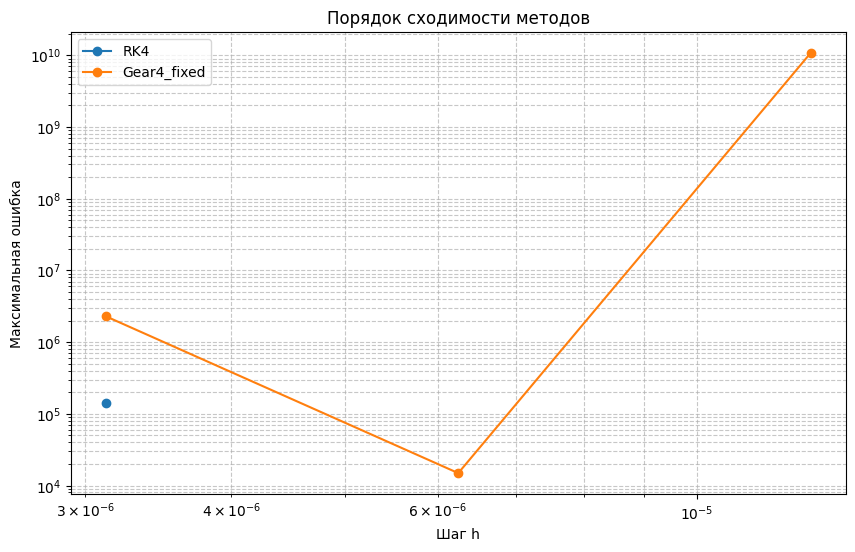

ITERATION 5 5
x0= 0.05 y0= 0.05
❌ rk4_solve: NaN или inf в решении (h=0.0001)
⚠️ RK4 при h=0.0001: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ pece4_solve: NaN или inf в решении (h=0.0001)
⚠️ PECE4 при h=0.0001: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ Gear4: расходимость на шаге 3, h=0.0001
❌ gear4_fixed_step: NaN или inf в решении (h=0.0001)
⚠️ Gear4_fixed при h=0.0001: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ rk4_solve: NaN или inf в решении (h=5e-05)
⚠️ RK4 при h=5e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ pece4_solve: NaN или inf в решении (h=5e-05)
⚠️ PECE4 при h=5e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ Gear4: расходимость на шаге 3, h=5e-05
❌ gear4_fixed_step: NaN или inf в решении (h=5e-05)
⚠️ Gear4_fixed при h=5e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ rk4_solve: NaN или inf в решении (h=2.5e-05)
⚠️ RK4 п

C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:7: RuntimeWarning: overflow encountered in scalar multiply
  dydt = y * (2 * a2 - 0.5 * y - 3.5 * (a2_reg**2) * x)
C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:6: RuntimeWarning: invalid value encountered in scalar multiply
  dxdt = x * (1 - 0.5 * x - (2/7) * (a2_reg**-2) * y)
C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:7: RuntimeWarning: overflow encountered in scalar power
  dydt = y * (2 * a2 - 0.5 * y - 3.5 * (a2_reg**2) * x)
C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:7: RuntimeWarning: invalid value encountered in scalar subtract
  dydt = y * (2 * a2 - 0.5 * y - 3.5 * (a2_reg**2) * x)
C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:8: RuntimeWarning: overflow encountered in scalar multiply
  da2dt = epsilon * (2 - 7 * a2 * x)
C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\1111329400.py:11: RuntimeWarning: invalid value encountered in add
  

❌ pece4_solve: NaN или inf в решении (h=2.5e-05)
⚠️ PECE4 при h=2.5e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ Gear4: расходимость на шаге 3, h=2.5e-05
❌ gear4_fixed_step: переполнение (h=2.5e-05)
⚠️ Gear4_fixed при h=2.5e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ rk4_solve: NaN или inf в решении (h=1.25e-05)
⚠️ RK4 при h=1.25e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ pece4_solve: NaN или inf в решении (h=1.25e-05)
⚠️ PECE4 при h=1.25e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ Gear4: расходимость на шаге 3, h=1.25e-05
❌ gear4_fixed_step: переполнение (h=1.25e-05)
⚠️ Gear4_fixed при h=1.25e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ rk4_solve: NaN или inf в решении (h=6.25e-06)
⚠️ RK4 при h=6.25e-06: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ pece4_solve: NaN или inf в решении (h=6.25e-06)
⚠️ PECE4 при h=6.25e-06: 

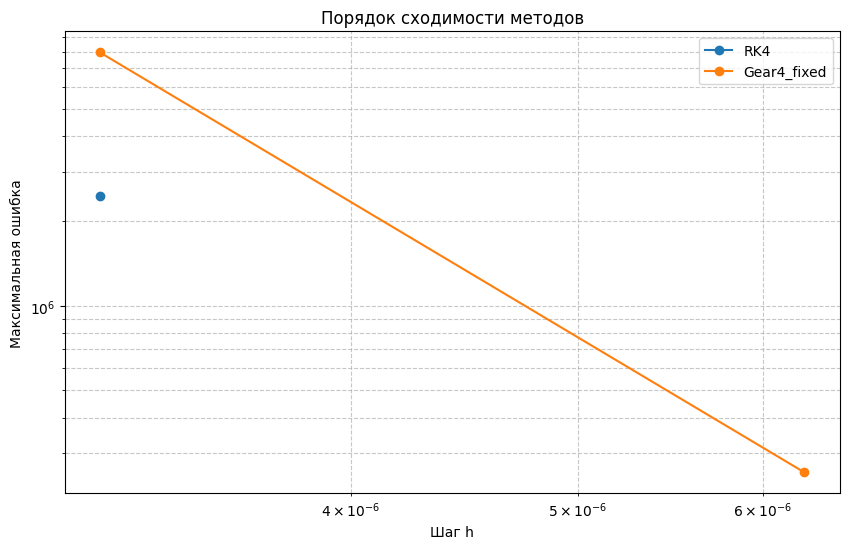

ITERATION 5 6
x0= 0.05 y0= 0.06
❌ rk4_solve: NaN или inf в решении (h=0.0001)
⚠️ RK4 при h=0.0001: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ pece4_solve: NaN или inf в решении (h=0.0001)
⚠️ PECE4 при h=0.0001: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ Gear4: расходимость на шаге 3, h=0.0001
❌ gear4_fixed_step: NaN или inf в решении (h=0.0001)
⚠️ Gear4_fixed при h=0.0001: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ rk4_solve: NaN или inf в решении (h=5e-05)
⚠️ RK4 при h=5e-05: operands could not be broadcast together with shapes (1,0) (1,3) 


C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:7: RuntimeWarning: overflow encountered in scalar multiply
  dydt = y * (2 * a2 - 0.5 * y - 3.5 * (a2_reg**2) * x)
C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:6: RuntimeWarning: invalid value encountered in scalar multiply
  dxdt = x * (1 - 0.5 * x - (2/7) * (a2_reg**-2) * y)
C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:7: RuntimeWarning: overflow encountered in scalar power
  dydt = y * (2 * a2 - 0.5 * y - 3.5 * (a2_reg**2) * x)
C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:7: RuntimeWarning: invalid value encountered in scalar subtract
  dydt = y * (2 * a2 - 0.5 * y - 3.5 * (a2_reg**2) * x)
C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:8: RuntimeWarning: overflow encountered in scalar multiply
  da2dt = epsilon * (2 - 7 * a2 * x)
C:\Users\lilia\AppData\Local\Programs\Python\Python313\Lib\site-packages\numpy\linalg\_linalg.py:2792: RuntimeWarning: 

❌ pece4_solve: NaN или inf в решении (h=5e-05)
⚠️ PECE4 при h=5e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ Gear4: расходимость на шаге 3, h=5e-05
❌ gear4_fixed_step: NaN или inf в решении (h=5e-05)
⚠️ Gear4_fixed при h=5e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ rk4_solve: NaN или inf в решении (h=2.5e-05)
⚠️ RK4 при h=2.5e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ pece4_solve: NaN или inf в решении (h=2.5e-05)
⚠️ PECE4 при h=2.5e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ Gear4: расходимость на шаге 3, h=2.5e-05
❌ gear4_fixed_step: переполнение (h=2.5e-05)
⚠️ Gear4_fixed при h=2.5e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ rk4_solve: NaN или inf в решении (h=1.25e-05)
⚠️ RK4 при h=1.25e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ pece4_solve: NaN или inf в решении (h=1.25e-05)
⚠️ PECE4 при h=1.25e-05: operands

C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\1111329400.py:11: RuntimeWarning: invalid value encountered in add
  return y + h/6 * (k1 + 2*k2 + 2*k3 + k4)


❌ rk4_solve: NaN или inf в решении (h=6.25e-06)
⚠️ RK4 при h=6.25e-06: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ pece4_solve: NaN или inf в решении (h=6.25e-06)
⚠️ PECE4 при h=6.25e-06: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ Gear4: расходимость на шаге 3, h=6.25e-06
✅ gear4_fixed_step: успех, 4 шагов (h=6.25e-06)
✅ rk4_solve: успех, 3201 шагов (h=3.125e-06)
❌ pece4_solve: NaN или inf в решении (h=3.125e-06)
⚠️ PECE4 при h=3.125e-06: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ Gear4: расходимость на шаге 3, h=3.125e-06
✅ gear4_fixed_step: успех, 4 шагов (h=3.125e-06)
          h           RK4  p_RK4  PECE4  p_PECE4    Gear4_fixed  p_Gear4_fixed
0  0.000100           NaN    NaN    NaN      NaN            NaN            NaN
1  0.000050           NaN    NaN    NaN      NaN            NaN            NaN
2  0.000025           NaN    NaN    NaN      NaN            NaN            NaN
3  0.000013           NaN    NaN

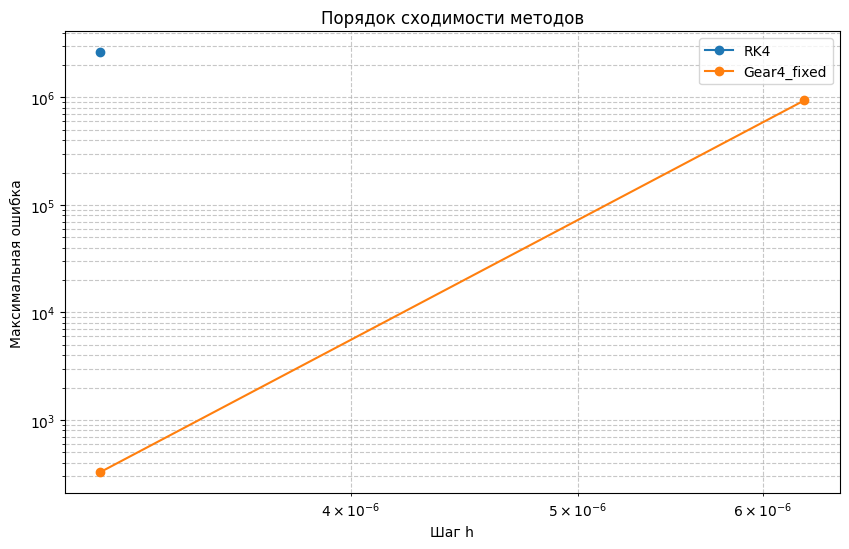

ITERATION 5 7
x0= 0.05 y0= 0.07
❌ rk4_solve: NaN или inf в решении (h=0.0001)
⚠️ RK4 при h=0.0001: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ pece4_solve: NaN или inf в решении (h=0.0001)
⚠️ PECE4 при h=0.0001: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ Gear4: расходимость на шаге 3, h=0.0001
❌ gear4_fixed_step: NaN или inf в решении (h=0.0001)
⚠️ Gear4_fixed при h=0.0001: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ rk4_solve: NaN или inf в решении (h=5e-05)
⚠️ RK4 при h=5e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ pece4_solve: NaN или inf в решении (h=5e-05)
⚠️ PECE4 при h=5e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ Gear4: расходимость на шаге 3, h=5e-05
❌ gear4_fixed_step: NaN или inf в решении (h=5e-05)
⚠️ Gear4_fixed при h=5e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ rk4_solve: NaN или inf в решении (h=2.5e-05)
⚠️ RK4 п

C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:7: RuntimeWarning: overflow encountered in scalar multiply
  dydt = y * (2 * a2 - 0.5 * y - 3.5 * (a2_reg**2) * x)
C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:6: RuntimeWarning: invalid value encountered in scalar multiply
  dxdt = x * (1 - 0.5 * x - (2/7) * (a2_reg**-2) * y)
C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:7: RuntimeWarning: overflow encountered in scalar power
  dydt = y * (2 * a2 - 0.5 * y - 3.5 * (a2_reg**2) * x)
C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:7: RuntimeWarning: invalid value encountered in scalar subtract
  dydt = y * (2 * a2 - 0.5 * y - 3.5 * (a2_reg**2) * x)
C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:8: RuntimeWarning: overflow encountered in scalar multiply
  da2dt = epsilon * (2 - 7 * a2 * x)
C:\Users\lilia\AppData\Local\Programs\Python\Python313\Lib\site-packages\numpy\linalg\_linalg.py:2792: RuntimeWarning: 

❌ rk4_solve: NaN или inf в решении (h=1.25e-05)
⚠️ RK4 при h=1.25e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ pece4_solve: NaN или inf в решении (h=1.25e-05)
⚠️ PECE4 при h=1.25e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ Gear4: расходимость на шаге 3, h=1.25e-05
❌ gear4_fixed_step: переполнение (h=1.25e-05)
⚠️ Gear4_fixed при h=1.25e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ rk4_solve: NaN или inf в решении (h=6.25e-06)
⚠️ RK4 при h=6.25e-06: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ pece4_solve: NaN или inf в решении (h=6.25e-06)
⚠️ PECE4 при h=6.25e-06: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ Gear4: расходимость на шаге 3, h=6.25e-06
✅ gear4_fixed_step: успех, 4 шагов (h=6.25e-06)
❌ rk4_solve: NaN или inf в решении (h=3.125e-06)
⚠️ RK4 при h=3.125e-06: operands could not be broadcast together with shapes (1,0) (1,3) 


C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\995573919.py:14: RuntimeWarning: invalid value encountered in add
  y_corr = y + h/24 * (9*f_pred + 19*f_vals[3] - 5*f_vals[2] + f_vals[1])


❌ pece4_solve: NaN или inf в решении (h=3.125e-06)
⚠️ PECE4 при h=3.125e-06: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ Gear4: расходимость на шаге 3, h=3.125e-06
✅ gear4_fixed_step: успех, 4 шагов (h=3.125e-06)
          h  RK4  p_RK4  PECE4  p_PECE4   Gear4_fixed  p_Gear4_fixed
0  0.000100  NaN    NaN    NaN      NaN           NaN            NaN
1  0.000050  NaN    NaN    NaN      NaN           NaN            NaN
2  0.000025  NaN    NaN    NaN      NaN           NaN            NaN
3  0.000013  NaN    NaN    NaN      NaN           NaN            NaN
4  0.000006  NaN    NaN    NaN      NaN  7.909891e+07            NaN
5  0.000003  NaN    NaN    NaN      NaN  2.558751e+03          14.92


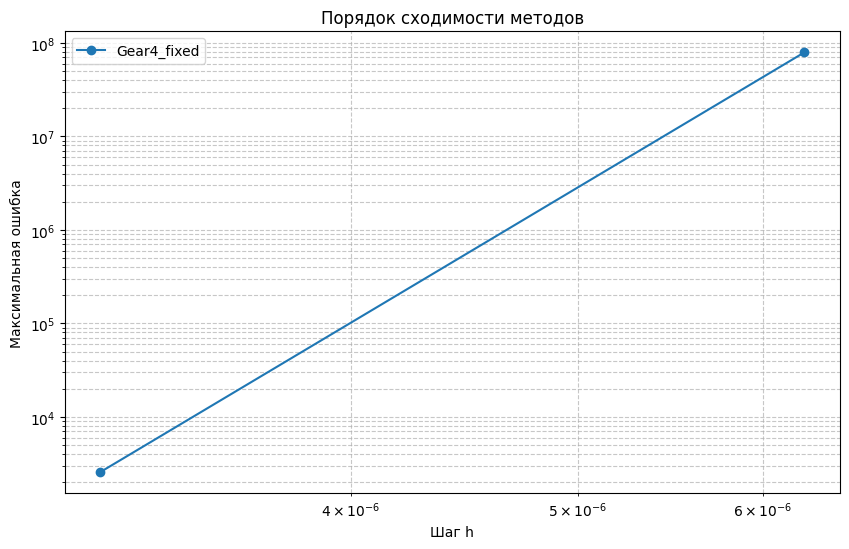

ITERATION 5 8
x0= 0.05 y0= 0.08
❌ rk4_solve: NaN или inf в решении (h=0.0001)
⚠️ RK4 при h=0.0001: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ pece4_solve: NaN или inf в решении (h=0.0001)
⚠️ PECE4 при h=0.0001: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ Gear4: расходимость на шаге 3, h=0.0001
❌ gear4_fixed_step: NaN или inf в решении (h=0.0001)
⚠️ Gear4_fixed при h=0.0001: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ rk4_solve: NaN или inf в решении (h=5e-05)
⚠️ RK4 при h=5e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ pece4_solve: NaN или inf в решении (h=5e-05)
⚠️ PECE4 при h=5e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ Gear4: расходимость на шаге 3, h=5e-05
❌ gear4_fixed_step: NaN или inf в решении (h=5e-05)
⚠️ Gear4_fixed при h=5e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ rk4_solve: NaN или inf в решении (h=2.5e-05)
⚠️ RK4 п

C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:7: RuntimeWarning: overflow encountered in scalar multiply
  dydt = y * (2 * a2 - 0.5 * y - 3.5 * (a2_reg**2) * x)
C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:7: RuntimeWarning: invalid value encountered in scalar subtract
  dydt = y * (2 * a2 - 0.5 * y - 3.5 * (a2_reg**2) * x)
C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:7: RuntimeWarning: overflow encountered in scalar power
  dydt = y * (2 * a2 - 0.5 * y - 3.5 * (a2_reg**2) * x)
C:\Users\lilia\AppData\Local\Programs\Python\Python313\Lib\site-packages\numpy\linalg\_linalg.py:2792: RuntimeWarning: overflow encountered in dot
  sqnorm = x.dot(x)
C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:6: RuntimeWarning: invalid value encountered in scalar multiply
  dxdt = x * (1 - 0.5 * x - (2/7) * (a2_reg**-2) * y)
C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:8: RuntimeWarning: overflow encountered in scala

❌ rk4_solve: NaN или inf в решении (h=1.25e-05)
⚠️ RK4 при h=1.25e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ pece4_solve: NaN или inf в решении (h=1.25e-05)
⚠️ PECE4 при h=1.25e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ Gear4: расходимость на шаге 3, h=1.25e-05
❌ gear4_fixed_step: переполнение (h=1.25e-05)
⚠️ Gear4_fixed при h=1.25e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ rk4_solve: NaN или inf в решении (h=6.25e-06)
⚠️ RK4 при h=6.25e-06: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ pece4_solve: NaN или inf в решении (h=6.25e-06)
⚠️ PECE4 при h=6.25e-06: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ Gear4: расходимость на шаге 3, h=6.25e-06
✅ gear4_fixed_step: успех, 4 шагов (h=6.25e-06)
❌ rk4_solve: NaN или inf в решении (h=3.125e-06)
⚠️ RK4 при h=3.125e-06: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ pece4_solve: NaN или inf

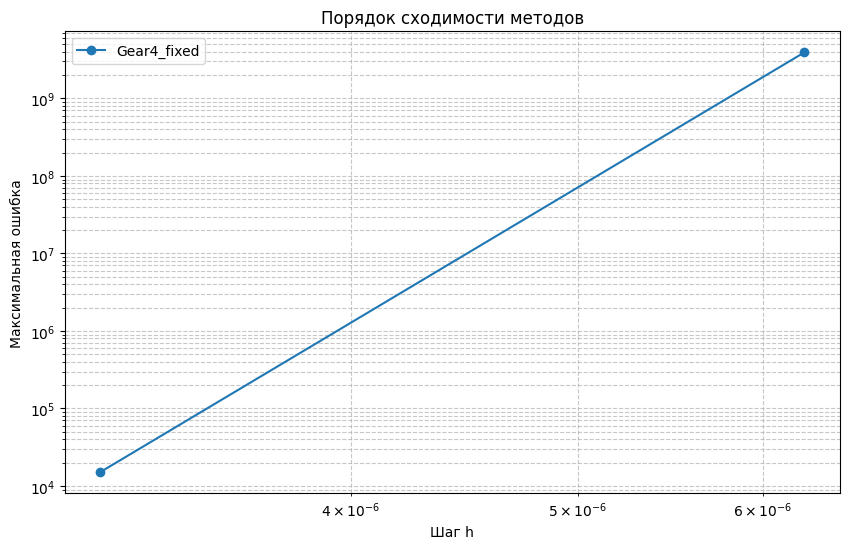

ITERATION 5 9
x0= 0.05 y0= 0.09
❌ rk4_solve: NaN или inf в решении (h=0.0001)
⚠️ RK4 при h=0.0001: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ pece4_solve: NaN или inf в решении (h=0.0001)
⚠️ PECE4 при h=0.0001: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ Gear4: расходимость на шаге 3, h=0.0001
❌ gear4_fixed_step: NaN или inf в решении (h=0.0001)
⚠️ Gear4_fixed при h=0.0001: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ rk4_solve: NaN или inf в решении (h=5e-05)
⚠️ RK4 при h=5e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ pece4_solve: NaN или inf в решении (h=5e-05)
⚠️ PECE4 при h=5e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ Gear4: расходимость на шаге 3, h=5e-05
❌ gear4_fixed_step: NaN или inf в решении (h=5e-05)
⚠️ Gear4_fixed при h=5e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ rk4_solve: NaN или inf в решении (h=2.5e-05)
⚠️ RK4 п

C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:7: RuntimeWarning: overflow encountered in scalar multiply
  dydt = y * (2 * a2 - 0.5 * y - 3.5 * (a2_reg**2) * x)
C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:7: RuntimeWarning: invalid value encountered in scalar subtract
  dydt = y * (2 * a2 - 0.5 * y - 3.5 * (a2_reg**2) * x)
C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:7: RuntimeWarning: overflow encountered in scalar power
  dydt = y * (2 * a2 - 0.5 * y - 3.5 * (a2_reg**2) * x)
C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:8: RuntimeWarning: overflow encountered in scalar multiply
  da2dt = epsilon * (2 - 7 * a2 * x)
C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\1111329400.py:7: RuntimeWarning: invalid value encountered in add
  k2 = f(t + h/2, y + h/2 * k1, epsilon)
C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\995573919.py:8: RuntimeWarning: invalid value encountered in add
  y_pred = y + h/24 * (55*f_v

❌ rk4_solve: NaN или inf в решении (h=1.25e-05)
⚠️ RK4 при h=1.25e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ pece4_solve: NaN или inf в решении (h=1.25e-05)
⚠️ PECE4 при h=1.25e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ Gear4: расходимость на шаге 3, h=1.25e-05
❌ gear4_fixed_step: переполнение (h=1.25e-05)
⚠️ Gear4_fixed при h=1.25e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ rk4_solve: NaN или inf в решении (h=6.25e-06)
⚠️ RK4 при h=6.25e-06: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ pece4_solve: NaN или inf в решении (h=6.25e-06)
⚠️ PECE4 при h=6.25e-06: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ Gear4: расходимость на шаге 3, h=6.25e-06
✅ gear4_fixed_step: успех, 4 шагов (h=6.25e-06)
❌ rk4_solve: NaN или inf в решении (h=3.125e-06)
⚠️ RK4 при h=3.125e-06: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ pece4_solve: NaN или inf

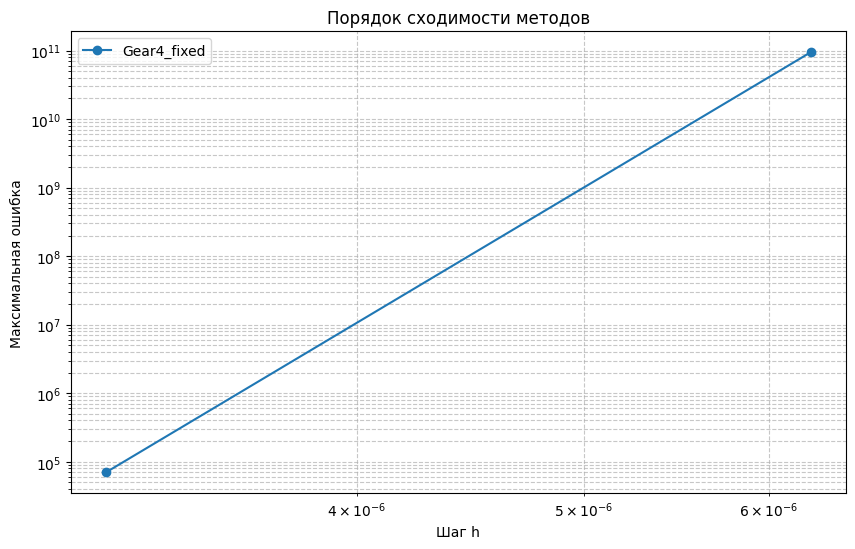

ITERATION 6 0
x0= 0.06 y0= 0.0
✅ rk4_solve: успех, 101 шагов (h=0.0001)
✅ pece4_solve: успех, 101 шагов (h=0.0001)
✅ gear4_fixed_step: успех, 101 шагов (h=0.0001)
✅ rk4_solve: успех, 201 шагов (h=5e-05)
✅ pece4_solve: успех, 201 шагов (h=5e-05)
✅ gear4_fixed_step: успех, 201 шагов (h=5e-05)
✅ rk4_solve: успех, 401 шагов (h=2.5e-05)
✅ pece4_solve: успех, 401 шагов (h=2.5e-05)
✅ gear4_fixed_step: успех, 401 шагов (h=2.5e-05)
✅ rk4_solve: успех, 801 шагов (h=1.25e-05)
✅ pece4_solve: успех, 801 шагов (h=1.25e-05)
✅ gear4_fixed_step: успех, 801 шагов (h=1.25e-05)
✅ rk4_solve: успех, 1601 шагов (h=6.25e-06)
✅ pece4_solve: успех, 1601 шагов (h=6.25e-06)
✅ gear4_fixed_step: успех, 1601 шагов (h=6.25e-06)
✅ rk4_solve: успех, 3201 шагов (h=3.125e-06)
✅ pece4_solve: успех, 3201 шагов (h=3.125e-06)
✅ gear4_fixed_step: успех, 3201 шагов (h=3.125e-06)
          h           RK4  p_RK4         PECE4  p_PECE4   Gear4_fixed  p_Gear4_fixed
0  0.000100  3.698710e-10    NaN  3.698710e-10      NaN  3.710246

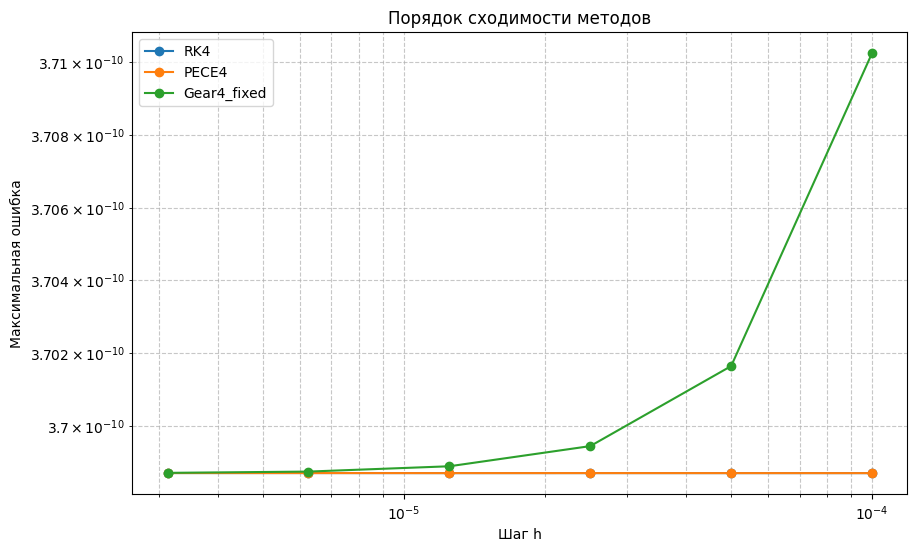

ITERATION 6 1
x0= 0.06 y0= 0.01
❌ rk4_solve: NaN или inf в решении (h=0.0001)
⚠️ RK4 при h=0.0001: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ pece4_solve: NaN или inf в решении (h=0.0001)
⚠️ PECE4 при h=0.0001: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ Gear4: расходимость на шаге 3, h=0.0001
❌ gear4_fixed_step: переполнение (h=0.0001)
⚠️ Gear4_fixed при h=0.0001: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ rk4_solve: NaN или inf в решении (h=5e-05)
⚠️ RK4 при h=5e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ pece4_solve: NaN или inf в решении (h=5e-05)
⚠️ PECE4 при h=5e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ Gear4: расходимость на шаге 3, h=5e-05
✅ gear4_fixed_step: успех, 4 шагов (h=5e-05)
❌ rk4_solve: NaN или inf в решении (h=2.5e-05)
⚠️ RK4 при h=2.5e-05: operands could not be broadcast together with shapes (1,0) (1,3) 


C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:7: RuntimeWarning: overflow encountered in scalar multiply
  dydt = y * (2 * a2 - 0.5 * y - 3.5 * (a2_reg**2) * x)
C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:6: RuntimeWarning: invalid value encountered in scalar multiply
  dxdt = x * (1 - 0.5 * x - (2/7) * (a2_reg**-2) * y)
C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:7: RuntimeWarning: overflow encountered in scalar power
  dydt = y * (2 * a2 - 0.5 * y - 3.5 * (a2_reg**2) * x)
C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:7: RuntimeWarning: invalid value encountered in scalar subtract
  dydt = y * (2 * a2 - 0.5 * y - 3.5 * (a2_reg**2) * x)
C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:8: RuntimeWarning: overflow encountered in scalar multiply
  da2dt = epsilon * (2 - 7 * a2 * x)
C:\Users\lilia\AppData\Local\Programs\Python\Python313\Lib\site-packages\numpy\linalg\_linalg.py:2792: RuntimeWarning: 

❌ pece4_solve: NaN или inf в решении (h=2.5e-05)
⚠️ PECE4 при h=2.5e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ Gear4: расходимость на шаге 3, h=2.5e-05
✅ gear4_fixed_step: успех, 4 шагов (h=2.5e-05)
✅ rk4_solve: успех, 801 шагов (h=1.25e-05)
❌ pece4_solve: NaN или inf в решении (h=1.25e-05)
⚠️ PECE4 при h=1.25e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ Gear4: расходимость на шаге 4, h=1.25e-05
✅ gear4_fixed_step: успех, 5 шагов (h=1.25e-05)
✅ rk4_solve: успех, 1601 шагов (h=6.25e-06)
✅ pece4_solve: успех, 1601 шагов (h=6.25e-06)
✅ gear4_fixed_step: успех, 1601 шагов (h=6.25e-06)
✅ rk4_solve: успех, 3201 шагов (h=3.125e-06)
✅ pece4_solve: успех, 3201 шагов (h=3.125e-06)
✅ gear4_fixed_step: успех, 3201 шагов (h=3.125e-06)
          h           RK4  p_RK4          PECE4  p_PECE4   Gear4_fixed  p_Gear4_fixed
0  0.000100           NaN    NaN            NaN      NaN           NaN            NaN
1  0.000050           NaN    NaN      

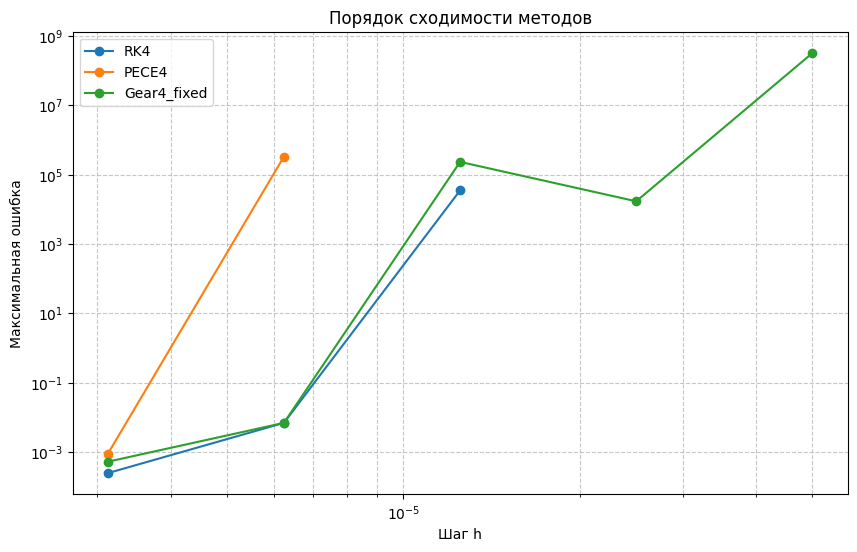

ITERATION 6 2
x0= 0.06 y0= 0.02
❌ rk4_solve: NaN или inf в решении (h=0.0001)
⚠️ RK4 при h=0.0001: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ pece4_solve: NaN или inf в решении (h=0.0001)
⚠️ PECE4 при h=0.0001: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ Gear4: расходимость на шаге 3, h=0.0001
❌ gear4_fixed_step: NaN или inf в решении (h=0.0001)
⚠️ Gear4_fixed при h=0.0001: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ rk4_solve: NaN или inf в решении (h=5e-05)
⚠️ RK4 при h=5e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ pece4_solve: NaN или inf в решении (h=5e-05)
⚠️ PECE4 при h=5e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ Gear4: расходимость на шаге 3, h=5e-05
❌ gear4_fixed_step: переполнение (h=5e-05)
⚠️ Gear4_fixed при h=5e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ rk4_solve: NaN или inf в решении (h=2.5e-05)
⚠️ RK4 при h=2.5e

C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:7: RuntimeWarning: overflow encountered in scalar multiply
  dydt = y * (2 * a2 - 0.5 * y - 3.5 * (a2_reg**2) * x)
C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:7: RuntimeWarning: invalid value encountered in scalar subtract
  dydt = y * (2 * a2 - 0.5 * y - 3.5 * (a2_reg**2) * x)
C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:7: RuntimeWarning: overflow encountered in scalar power
  dydt = y * (2 * a2 - 0.5 * y - 3.5 * (a2_reg**2) * x)
C:\Users\lilia\AppData\Local\Programs\Python\Python313\Lib\site-packages\numpy\linalg\_linalg.py:2792: RuntimeWarning: overflow encountered in dot
  sqnorm = x.dot(x)
C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:6: RuntimeWarning: invalid value encountered in scalar multiply
  dxdt = x * (1 - 0.5 * x - (2/7) * (a2_reg**-2) * y)
C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:8: RuntimeWarning: overflow encountered in scala

❌ rk4_solve: NaN или inf в решении (h=1.25e-05)
⚠️ RK4 при h=1.25e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ pece4_solve: NaN или inf в решении (h=1.25e-05)
⚠️ PECE4 при h=1.25e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ Gear4: расходимость на шаге 3, h=1.25e-05
✅ gear4_fixed_step: успех, 4 шагов (h=1.25e-05)
✅ rk4_solve: успех, 1601 шагов (h=6.25e-06)
❌ pece4_solve: NaN или inf в решении (h=6.25e-06)
⚠️ PECE4 при h=6.25e-06: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ Gear4: расходимость на шаге 4, h=6.25e-06
✅ gear4_fixed_step: успех, 5 шагов (h=6.25e-06)
✅ rk4_solve: успех, 3201 шагов (h=3.125e-06)
✅ pece4_solve: успех, 3201 шагов (h=3.125e-06)
✅ gear4_fixed_step: успех, 3201 шагов (h=3.125e-06)
          h           RK4  p_RK4          PECE4  p_PECE4   Gear4_fixed  p_Gear4_fixed
0  0.000100           NaN    NaN            NaN      NaN           NaN            NaN
1  0.000050           NaN    NaN     

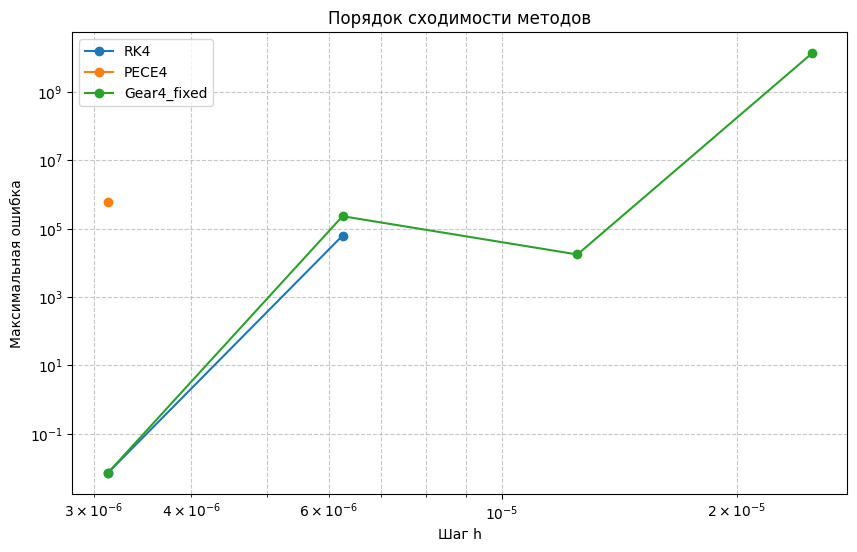

ITERATION 6 3
x0= 0.06 y0= 0.03
❌ rk4_solve: NaN или inf в решении (h=0.0001)
⚠️ RK4 при h=0.0001: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ pece4_solve: NaN или inf в решении (h=0.0001)
⚠️ PECE4 при h=0.0001: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ Gear4: расходимость на шаге 3, h=0.0001
❌ gear4_fixed_step: NaN или inf в решении (h=0.0001)
⚠️ Gear4_fixed при h=0.0001: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ rk4_solve: NaN или inf в решении (h=5e-05)
⚠️ RK4 при h=5e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ pece4_solve: NaN или inf в решении (h=5e-05)
⚠️ PECE4 при h=5e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ Gear4: расходимость на шаге 3, h=5e-05
❌ gear4_fixed_step: переполнение (h=5e-05)
⚠️ Gear4_fixed при h=5e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ rk4_solve: NaN или inf в решении (h=2.5e-05)
⚠️ RK4 при h=2.5e

C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:7: RuntimeWarning: overflow encountered in scalar multiply
  dydt = y * (2 * a2 - 0.5 * y - 3.5 * (a2_reg**2) * x)
C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:6: RuntimeWarning: invalid value encountered in scalar multiply
  dxdt = x * (1 - 0.5 * x - (2/7) * (a2_reg**-2) * y)
C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:7: RuntimeWarning: overflow encountered in scalar power
  dydt = y * (2 * a2 - 0.5 * y - 3.5 * (a2_reg**2) * x)
C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:7: RuntimeWarning: invalid value encountered in scalar subtract
  dydt = y * (2 * a2 - 0.5 * y - 3.5 * (a2_reg**2) * x)
C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:8: RuntimeWarning: overflow encountered in scalar multiply
  da2dt = epsilon * (2 - 7 * a2 * x)
C:\Users\lilia\AppData\Local\Programs\Python\Python313\Lib\site-packages\numpy\linalg\_linalg.py:2792: RuntimeWarning: 

❌ rk4_solve: NaN или inf в решении (h=1.25e-05)
⚠️ RK4 при h=1.25e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ pece4_solve: NaN или inf в решении (h=1.25e-05)
⚠️ PECE4 при h=1.25e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ Gear4: расходимость на шаге 3, h=1.25e-05
✅ gear4_fixed_step: успех, 4 шагов (h=1.25e-05)
❌ rk4_solve: NaN или inf в решении (h=6.25e-06)
⚠️ RK4 при h=6.25e-06: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ pece4_solve: NaN или inf в решении (h=6.25e-06)
⚠️ PECE4 при h=6.25e-06: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ Gear4: расходимость на шаге 3, h=6.25e-06
✅ gear4_fixed_step: успех, 4 шагов (h=6.25e-06)
✅ rk4_solve: успех, 3201 шагов (h=3.125e-06)
❌ pece4_solve: NaN или inf в решении (h=3.125e-06)
⚠️ PECE4 при h=3.125e-06: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ Gear4: расходимость на шаге 8, h=3.125e-06
✅ gear4_fixed_step: успех, 

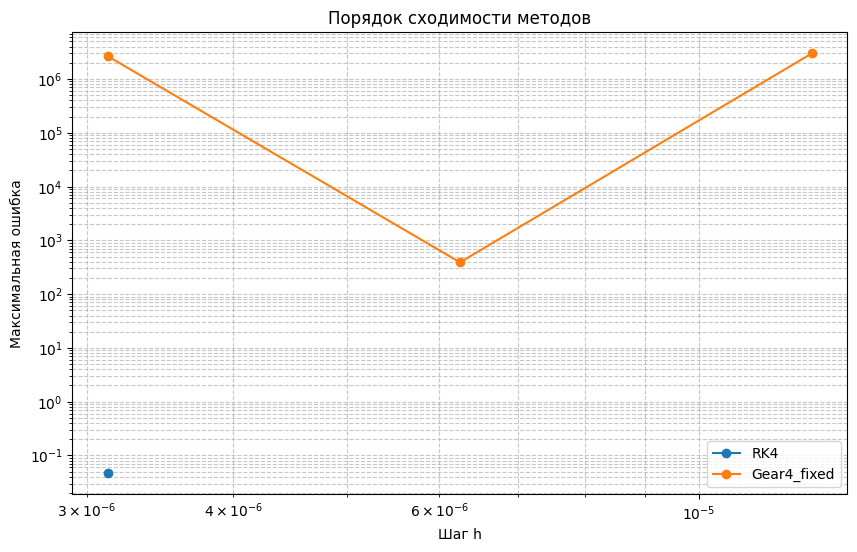

ITERATION 6 4
x0= 0.06 y0= 0.04
❌ rk4_solve: NaN или inf в решении (h=0.0001)
⚠️ RK4 при h=0.0001: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ pece4_solve: NaN или inf в решении (h=0.0001)
⚠️ PECE4 при h=0.0001: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ Gear4: расходимость на шаге 3, h=0.0001
❌ gear4_fixed_step: NaN или inf в решении (h=0.0001)
⚠️ Gear4_fixed при h=0.0001: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ rk4_solve: NaN или inf в решении (h=5e-05)
⚠️ RK4 при h=5e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ pece4_solve: NaN или inf в решении (h=5e-05)
⚠️ PECE4 при h=5e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ Gear4: расходимость на шаге 3, h=5e-05
❌ gear4_fixed_step: NaN или inf в решении (h=5e-05)
⚠️ Gear4_fixed при h=5e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ rk4_solve: NaN или inf в решении (h=2.5e-05)
⚠️ RK4 п

C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:7: RuntimeWarning: overflow encountered in scalar multiply
  dydt = y * (2 * a2 - 0.5 * y - 3.5 * (a2_reg**2) * x)
C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:6: RuntimeWarning: invalid value encountered in scalar multiply
  dxdt = x * (1 - 0.5 * x - (2/7) * (a2_reg**-2) * y)
C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:7: RuntimeWarning: overflow encountered in scalar power
  dydt = y * (2 * a2 - 0.5 * y - 3.5 * (a2_reg**2) * x)
C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:7: RuntimeWarning: invalid value encountered in scalar subtract
  dydt = y * (2 * a2 - 0.5 * y - 3.5 * (a2_reg**2) * x)
C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:8: RuntimeWarning: overflow encountered in scalar multiply
  da2dt = epsilon * (2 - 7 * a2 * x)
C:\Users\lilia\AppData\Local\Programs\Python\Python313\Lib\site-packages\numpy\linalg\_linalg.py:2792: RuntimeWarning: 

❌ rk4_solve: NaN или inf в решении (h=1.25e-05)
⚠️ RK4 при h=1.25e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ pece4_solve: NaN или inf в решении (h=1.25e-05)
⚠️ PECE4 при h=1.25e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ Gear4: расходимость на шаге 3, h=1.25e-05
✅ gear4_fixed_step: успех, 4 шагов (h=1.25e-05)
❌ rk4_solve: NaN или inf в решении (h=6.25e-06)
⚠️ RK4 при h=6.25e-06: operands could not be broadcast together with shapes (1,0) (1,3) 


C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\995573919.py:14: RuntimeWarning: invalid value encountered in add
  y_corr = y + h/24 * (9*f_pred + 19*f_vals[3] - 5*f_vals[2] + f_vals[1])


❌ pece4_solve: NaN или inf в решении (h=6.25e-06)
⚠️ PECE4 при h=6.25e-06: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ Gear4: расходимость на шаге 3, h=6.25e-06
✅ gear4_fixed_step: успех, 4 шагов (h=6.25e-06)
✅ rk4_solve: успех, 3201 шагов (h=3.125e-06)
❌ pece4_solve: NaN или inf в решении (h=3.125e-06)
⚠️ PECE4 при h=3.125e-06: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ Gear4: расходимость на шаге 9, h=3.125e-06
✅ gear4_fixed_step: успех, 10 шагов (h=3.125e-06)
          h            RK4  p_RK4  PECE4  p_PECE4   Gear4_fixed  p_Gear4_fixed
0  0.000100            NaN    NaN    NaN      NaN           NaN            NaN
1  0.000050            NaN    NaN    NaN      NaN           NaN            NaN
2  0.000025            NaN    NaN    NaN      NaN           NaN            NaN
3  0.000013            NaN    NaN    NaN      NaN  1.576184e+10            NaN
4  0.000006            NaN    NaN    NaN      NaN  1.785499e+04          19.75
5  0.00000

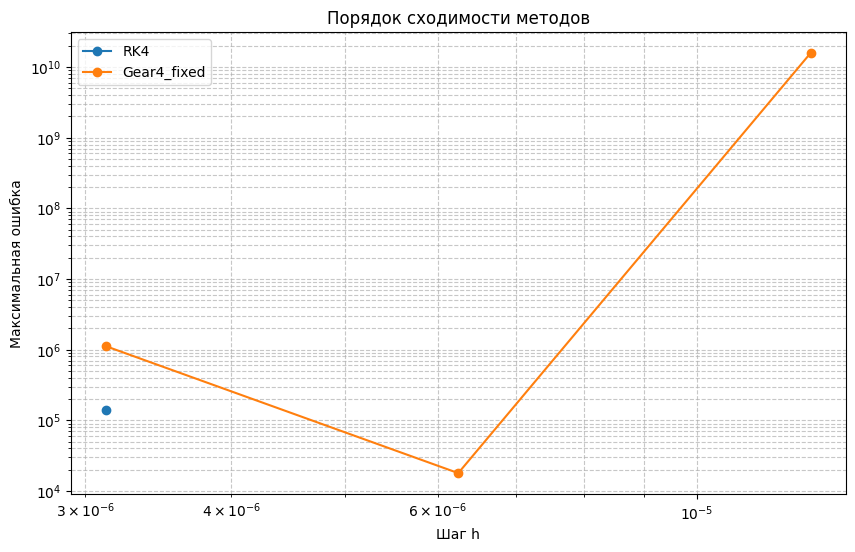

ITERATION 6 5
x0= 0.06 y0= 0.05
❌ rk4_solve: NaN или inf в решении (h=0.0001)
⚠️ RK4 при h=0.0001: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ pece4_solve: NaN или inf в решении (h=0.0001)
⚠️ PECE4 при h=0.0001: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ Gear4: расходимость на шаге 3, h=0.0001
❌ gear4_fixed_step: NaN или inf в решении (h=0.0001)
⚠️ Gear4_fixed при h=0.0001: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ rk4_solve: NaN или inf в решении (h=5e-05)
⚠️ RK4 при h=5e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ pece4_solve: NaN или inf в решении (h=5e-05)
⚠️ PECE4 при h=5e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ Gear4: расходимость на шаге 3, h=5e-05
❌ gear4_fixed_step: NaN или inf в решении (h=5e-05)
⚠️ Gear4_fixed при h=5e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ rk4_solve: NaN или inf в решении (h=2.5e-05)
⚠️ RK4 п

C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:7: RuntimeWarning: overflow encountered in scalar multiply
  dydt = y * (2 * a2 - 0.5 * y - 3.5 * (a2_reg**2) * x)
C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:6: RuntimeWarning: invalid value encountered in scalar multiply
  dxdt = x * (1 - 0.5 * x - (2/7) * (a2_reg**-2) * y)
C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:7: RuntimeWarning: overflow encountered in scalar power
  dydt = y * (2 * a2 - 0.5 * y - 3.5 * (a2_reg**2) * x)
C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:7: RuntimeWarning: invalid value encountered in scalar subtract
  dydt = y * (2 * a2 - 0.5 * y - 3.5 * (a2_reg**2) * x)
C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:8: RuntimeWarning: overflow encountered in scalar multiply
  da2dt = epsilon * (2 - 7 * a2 * x)
C:\Users\lilia\AppData\Local\Programs\Python\Python313\Lib\site-packages\numpy\linalg\_linalg.py:2792: RuntimeWarning: 

❌ rk4_solve: NaN или inf в решении (h=1.25e-05)
⚠️ RK4 при h=1.25e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ pece4_solve: NaN или inf в решении (h=1.25e-05)
⚠️ PECE4 при h=1.25e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ Gear4: расходимость на шаге 3, h=1.25e-05
❌ gear4_fixed_step: переполнение (h=1.25e-05)
⚠️ Gear4_fixed при h=1.25e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ rk4_solve: NaN или inf в решении (h=6.25e-06)
⚠️ RK4 при h=6.25e-06: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ pece4_solve: NaN или inf в решении (h=6.25e-06)
⚠️ PECE4 при h=6.25e-06: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ Gear4: расходимость на шаге 3, h=6.25e-06
✅ gear4_fixed_step: успех, 4 шагов (h=6.25e-06)
❌ rk4_solve: NaN или inf в решении (h=3.125e-06)
⚠️ RK4 при h=3.125e-06: operands could not be broadcast together with shapes (1,0) (1,3) 


C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3752895320.py:31: RuntimeWarning: invalid value encountered in scalar divide
  err = np.linalg.norm(y_next - y_new) / (1 + np.linalg.norm(y_new))


❌ pece4_solve: NaN или inf в решении (h=3.125e-06)
⚠️ PECE4 при h=3.125e-06: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ Gear4: расходимость на шаге 4, h=3.125e-06
✅ gear4_fixed_step: успех, 5 шагов (h=3.125e-06)
          h  RK4  p_RK4  PECE4  p_PECE4    Gear4_fixed  p_Gear4_fixed
0  0.000100  NaN    NaN    NaN      NaN            NaN            NaN
1  0.000050  NaN    NaN    NaN      NaN            NaN            NaN
2  0.000025  NaN    NaN    NaN      NaN            NaN            NaN
3  0.000013  NaN    NaN    NaN      NaN            NaN            NaN
4  0.000006  NaN    NaN    NaN      NaN  300576.023404            NaN
5  0.000003  NaN    NaN    NaN      NaN  525362.315115          -0.81


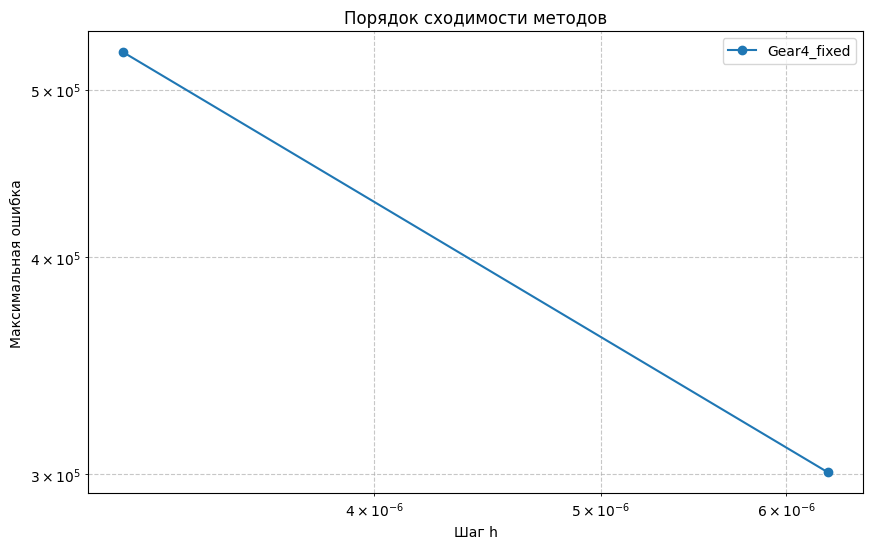

ITERATION 6 6
x0= 0.06 y0= 0.06
❌ rk4_solve: NaN или inf в решении (h=0.0001)
⚠️ RK4 при h=0.0001: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ pece4_solve: NaN или inf в решении (h=0.0001)
⚠️ PECE4 при h=0.0001: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ Gear4: расходимость на шаге 3, h=0.0001
❌ gear4_fixed_step: NaN или inf в решении (h=0.0001)
⚠️ Gear4_fixed при h=0.0001: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ rk4_solve: NaN или inf в решении (h=5e-05)
⚠️ RK4 при h=5e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ pece4_solve: NaN или inf в решении (h=5e-05)
⚠️ PECE4 при h=5e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ Gear4: расходимость на шаге 3, h=5e-05
❌ gear4_fixed_step: NaN или inf в решении (h=5e-05)
⚠️ Gear4_fixed при h=5e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ rk4_solve: NaN или inf в решении (h=2.5e-05)
⚠️ RK4 п

C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:7: RuntimeWarning: overflow encountered in scalar multiply
  dydt = y * (2 * a2 - 0.5 * y - 3.5 * (a2_reg**2) * x)
C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:6: RuntimeWarning: invalid value encountered in scalar multiply
  dxdt = x * (1 - 0.5 * x - (2/7) * (a2_reg**-2) * y)
C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:7: RuntimeWarning: overflow encountered in scalar power
  dydt = y * (2 * a2 - 0.5 * y - 3.5 * (a2_reg**2) * x)
C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:7: RuntimeWarning: invalid value encountered in scalar subtract
  dydt = y * (2 * a2 - 0.5 * y - 3.5 * (a2_reg**2) * x)
C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:8: RuntimeWarning: overflow encountered in scalar multiply
  da2dt = epsilon * (2 - 7 * a2 * x)
C:\Users\lilia\AppData\Local\Programs\Python\Python313\Lib\site-packages\numpy\linalg\_linalg.py:2792: RuntimeWarning: 

❌ rk4_solve: NaN или inf в решении (h=1.25e-05)
⚠️ RK4 при h=1.25e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ pece4_solve: NaN или inf в решении (h=1.25e-05)
⚠️ PECE4 при h=1.25e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ Gear4: расходимость на шаге 3, h=1.25e-05
❌ gear4_fixed_step: переполнение (h=1.25e-05)
⚠️ Gear4_fixed при h=1.25e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ rk4_solve: NaN или inf в решении (h=6.25e-06)
⚠️ RK4 при h=6.25e-06: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ pece4_solve: NaN или inf в решении (h=6.25e-06)
⚠️ PECE4 при h=6.25e-06: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ Gear4: расходимость на шаге 3, h=6.25e-06
✅ gear4_fixed_step: успех, 4 шагов (h=6.25e-06)
✅ rk4_solve: успех, 3201 шагов (h=3.125e-06)
❌ pece4_solve: NaN или inf в решении (h=3.125e-06)
⚠️ PECE4 при h=3.125e-06: operands could not be broadcast together wi

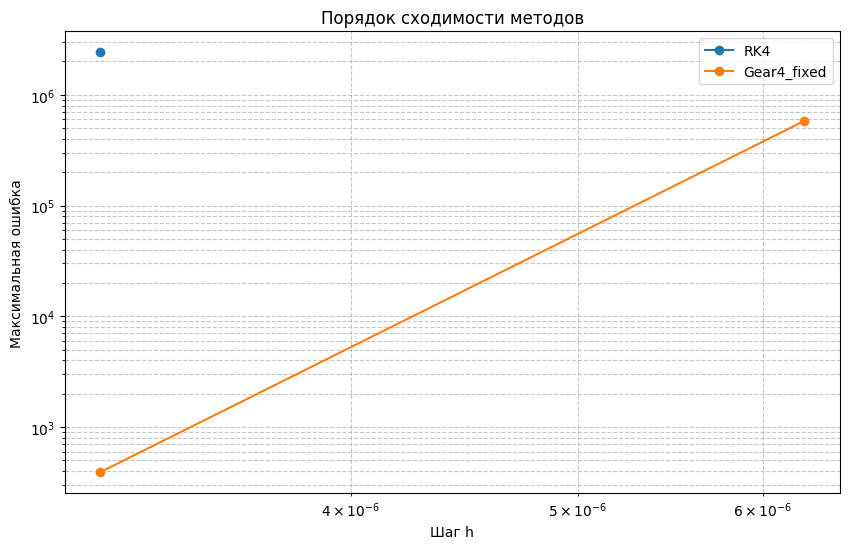

ITERATION 6 7
x0= 0.06 y0= 0.07
❌ rk4_solve: NaN или inf в решении (h=0.0001)
⚠️ RK4 при h=0.0001: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ pece4_solve: NaN или inf в решении (h=0.0001)
⚠️ PECE4 при h=0.0001: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ Gear4: расходимость на шаге 3, h=0.0001
❌ gear4_fixed_step: NaN или inf в решении (h=0.0001)
⚠️ Gear4_fixed при h=0.0001: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ rk4_solve: NaN или inf в решении (h=5e-05)
⚠️ RK4 при h=5e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ pece4_solve: NaN или inf в решении (h=5e-05)
⚠️ PECE4 при h=5e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ Gear4: расходимость на шаге 3, h=5e-05
❌ gear4_fixed_step: NaN или inf в решении (h=5e-05)
⚠️ Gear4_fixed при h=5e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ rk4_solve: NaN или inf в решении (h=2.5e-05)
⚠️ RK4 п

C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:7: RuntimeWarning: overflow encountered in scalar multiply
  dydt = y * (2 * a2 - 0.5 * y - 3.5 * (a2_reg**2) * x)
C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:6: RuntimeWarning: invalid value encountered in scalar multiply
  dxdt = x * (1 - 0.5 * x - (2/7) * (a2_reg**-2) * y)
C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:7: RuntimeWarning: overflow encountered in scalar power
  dydt = y * (2 * a2 - 0.5 * y - 3.5 * (a2_reg**2) * x)
C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:7: RuntimeWarning: invalid value encountered in scalar subtract
  dydt = y * (2 * a2 - 0.5 * y - 3.5 * (a2_reg**2) * x)
C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:8: RuntimeWarning: overflow encountered in scalar multiply
  da2dt = epsilon * (2 - 7 * a2 * x)
C:\Users\lilia\AppData\Local\Programs\Python\Python313\Lib\site-packages\numpy\linalg\_linalg.py:2792: RuntimeWarning: 

❌ rk4_solve: NaN или inf в решении (h=1.25e-05)
⚠️ RK4 при h=1.25e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ pece4_solve: NaN или inf в решении (h=1.25e-05)
⚠️ PECE4 при h=1.25e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ Gear4: расходимость на шаге 3, h=1.25e-05
❌ gear4_fixed_step: переполнение (h=1.25e-05)
⚠️ Gear4_fixed при h=1.25e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ rk4_solve: NaN или inf в решении (h=6.25e-06)
⚠️ RK4 при h=6.25e-06: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ pece4_solve: NaN или inf в решении (h=6.25e-06)
⚠️ PECE4 при h=6.25e-06: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ Gear4: расходимость на шаге 3, h=6.25e-06
✅ gear4_fixed_step: успех, 4 шагов (h=6.25e-06)


C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\995573919.py:14: RuntimeWarning: invalid value encountered in add
  y_corr = y + h/24 * (9*f_pred + 19*f_vals[3] - 5*f_vals[2] + f_vals[1])


❌ rk4_solve: NaN или inf в решении (h=3.125e-06)
⚠️ RK4 при h=3.125e-06: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ pece4_solve: NaN или inf в решении (h=3.125e-06)
⚠️ PECE4 при h=3.125e-06: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ Gear4: расходимость на шаге 3, h=3.125e-06
✅ gear4_fixed_step: успех, 4 шагов (h=3.125e-06)
          h  RK4  p_RK4  PECE4  p_PECE4   Gear4_fixed  p_Gear4_fixed
0  0.000100  NaN    NaN    NaN      NaN           NaN            NaN
1  0.000050  NaN    NaN    NaN      NaN           NaN            NaN
2  0.000025  NaN    NaN    NaN      NaN           NaN            NaN
3  0.000013  NaN    NaN    NaN      NaN           NaN            NaN
4  0.000006  NaN    NaN    NaN      NaN  1.280698e+08            NaN
5  0.000003  NaN    NaN    NaN      NaN  3.069920e+03          15.35


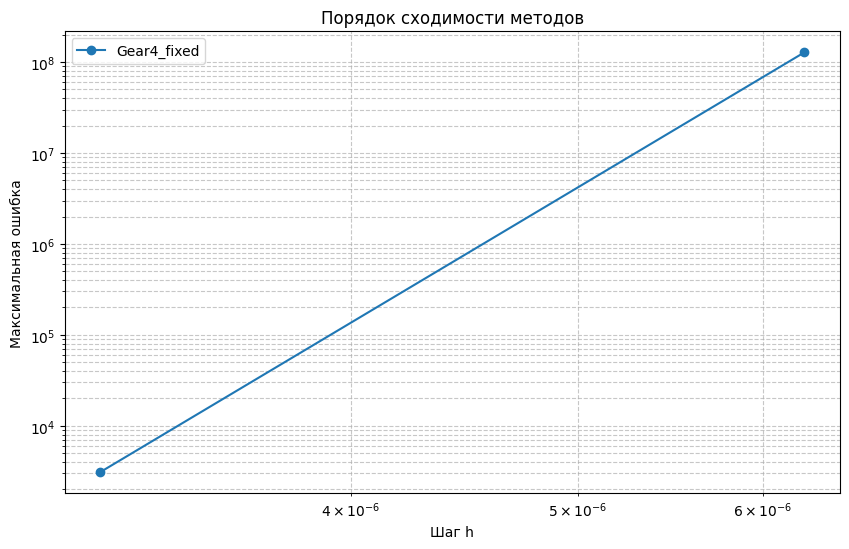

ITERATION 6 8
x0= 0.06 y0= 0.08
❌ rk4_solve: NaN или inf в решении (h=0.0001)
⚠️ RK4 при h=0.0001: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ pece4_solve: NaN или inf в решении (h=0.0001)
⚠️ PECE4 при h=0.0001: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ Gear4: расходимость на шаге 3, h=0.0001
❌ gear4_fixed_step: NaN или inf в решении (h=0.0001)
⚠️ Gear4_fixed при h=0.0001: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ rk4_solve: NaN или inf в решении (h=5e-05)
⚠️ RK4 при h=5e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ pece4_solve: NaN или inf в решении (h=5e-05)
⚠️ PECE4 при h=5e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ Gear4: расходимость на шаге 3, h=5e-05
❌ gear4_fixed_step: NaN или inf в решении (h=5e-05)
⚠️ Gear4_fixed при h=5e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ rk4_solve: NaN или inf в решении (h=2.5e-05)
⚠️ RK4 п

C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:7: RuntimeWarning: overflow encountered in scalar multiply
  dydt = y * (2 * a2 - 0.5 * y - 3.5 * (a2_reg**2) * x)
C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:7: RuntimeWarning: invalid value encountered in scalar subtract
  dydt = y * (2 * a2 - 0.5 * y - 3.5 * (a2_reg**2) * x)
C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:7: RuntimeWarning: overflow encountered in scalar power
  dydt = y * (2 * a2 - 0.5 * y - 3.5 * (a2_reg**2) * x)
C:\Users\lilia\AppData\Local\Programs\Python\Python313\Lib\site-packages\numpy\linalg\_linalg.py:2792: RuntimeWarning: overflow encountered in dot
  sqnorm = x.dot(x)
C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:6: RuntimeWarning: invalid value encountered in scalar multiply
  dxdt = x * (1 - 0.5 * x - (2/7) * (a2_reg**-2) * y)
C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:8: RuntimeWarning: overflow encountered in scala

❌ rk4_solve: NaN или inf в решении (h=1.25e-05)
⚠️ RK4 при h=1.25e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ pece4_solve: NaN или inf в решении (h=1.25e-05)
⚠️ PECE4 при h=1.25e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ Gear4: расходимость на шаге 3, h=1.25e-05
❌ gear4_fixed_step: переполнение (h=1.25e-05)
⚠️ Gear4_fixed при h=1.25e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ rk4_solve: NaN или inf в решении (h=6.25e-06)
⚠️ RK4 при h=6.25e-06: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ pece4_solve: NaN или inf в решении (h=6.25e-06)
⚠️ PECE4 при h=6.25e-06: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ Gear4: расходимость на шаге 3, h=6.25e-06
✅ gear4_fixed_step: успех, 4 шагов (h=6.25e-06)
❌ rk4_solve: NaN или inf в решении (h=3.125e-06)
⚠️ RK4 при h=3.125e-06: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ pece4_solve: NaN или inf

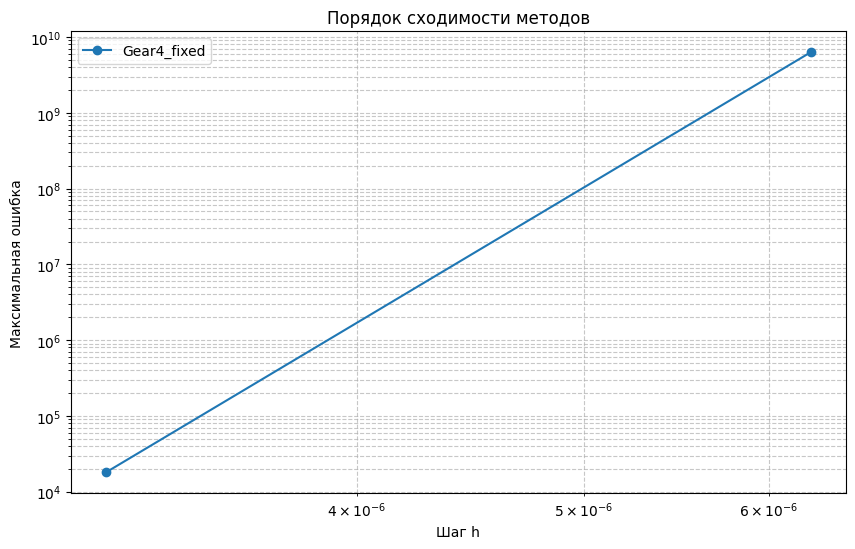

ITERATION 6 9
x0= 0.06 y0= 0.09
❌ rk4_solve: NaN или inf в решении (h=0.0001)
⚠️ RK4 при h=0.0001: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ pece4_solve: NaN или inf в решении (h=0.0001)
⚠️ PECE4 при h=0.0001: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ Gear4: расходимость на шаге 3, h=0.0001
❌ gear4_fixed_step: NaN или inf в решении (h=0.0001)
⚠️ Gear4_fixed при h=0.0001: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ rk4_solve: NaN или inf в решении (h=5e-05)
⚠️ RK4 при h=5e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ pece4_solve: NaN или inf в решении (h=5e-05)
⚠️ PECE4 при h=5e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ Gear4: расходимость на шаге 3, h=5e-05
❌ gear4_fixed_step: NaN или inf в решении (h=5e-05)
⚠️ Gear4_fixed при h=5e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ rk4_solve: NaN или inf в решении (h=2.5e-05)
⚠️ RK4 п

C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:7: RuntimeWarning: overflow encountered in scalar multiply
  dydt = y * (2 * a2 - 0.5 * y - 3.5 * (a2_reg**2) * x)
C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:7: RuntimeWarning: invalid value encountered in scalar subtract
  dydt = y * (2 * a2 - 0.5 * y - 3.5 * (a2_reg**2) * x)
C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:7: RuntimeWarning: overflow encountered in scalar power
  dydt = y * (2 * a2 - 0.5 * y - 3.5 * (a2_reg**2) * x)
C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:8: RuntimeWarning: overflow encountered in scalar multiply
  da2dt = epsilon * (2 - 7 * a2 * x)
C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\1111329400.py:7: RuntimeWarning: invalid value encountered in add
  k2 = f(t + h/2, y + h/2 * k1, epsilon)
C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\995573919.py:8: RuntimeWarning: invalid value encountered in add
  y_pred = y + h/24 * (55*f_v

❌ rk4_solve: NaN или inf в решении (h=1.25e-05)
⚠️ RK4 при h=1.25e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ pece4_solve: NaN или inf в решении (h=1.25e-05)
⚠️ PECE4 при h=1.25e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ Gear4: расходимость на шаге 3, h=1.25e-05
❌ gear4_fixed_step: переполнение (h=1.25e-05)
⚠️ Gear4_fixed при h=1.25e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ rk4_solve: NaN или inf в решении (h=6.25e-06)
⚠️ RK4 при h=6.25e-06: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ pece4_solve: NaN или inf в решении (h=6.25e-06)
⚠️ PECE4 при h=6.25e-06: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ Gear4: расходимость на шаге 3, h=6.25e-06
✅ gear4_fixed_step: успех, 4 шагов (h=6.25e-06)
❌ rk4_solve: NaN или inf в решении (h=3.125e-06)
⚠️ RK4 при h=3.125e-06: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ pece4_solve: NaN или inf

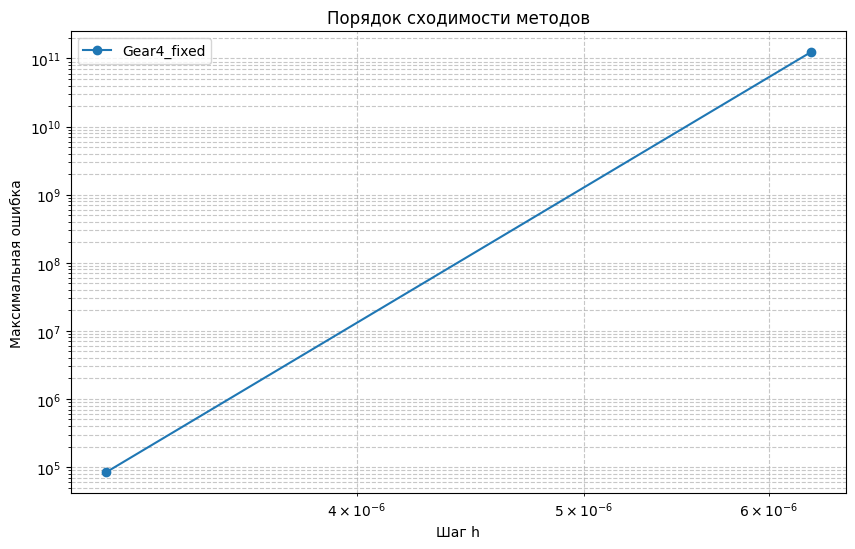

ITERATION 7 0
x0= 0.07 y0= 0.0
✅ rk4_solve: успех, 101 шагов (h=0.0001)
✅ pece4_solve: успех, 101 шагов (h=0.0001)
✅ gear4_fixed_step: успех, 101 шагов (h=0.0001)
✅ rk4_solve: успех, 201 шагов (h=5e-05)
✅ pece4_solve: успех, 201 шагов (h=5e-05)
✅ gear4_fixed_step: успех, 201 шагов (h=5e-05)
✅ rk4_solve: успех, 401 шагов (h=2.5e-05)
✅ pece4_solve: успех, 401 шагов (h=2.5e-05)
✅ gear4_fixed_step: успех, 401 шагов (h=2.5e-05)
✅ rk4_solve: успех, 801 шагов (h=1.25e-05)
✅ pece4_solve: успех, 801 шагов (h=1.25e-05)
✅ gear4_fixed_step: успех, 801 шагов (h=1.25e-05)
✅ rk4_solve: успех, 1601 шагов (h=6.25e-06)
✅ pece4_solve: успех, 1601 шагов (h=6.25e-06)
✅ gear4_fixed_step: успех, 1601 шагов (h=6.25e-06)
✅ rk4_solve: успех, 3201 шагов (h=3.125e-06)
✅ pece4_solve: успех, 3201 шагов (h=3.125e-06)
✅ gear4_fixed_step: успех, 3201 шагов (h=3.125e-06)
          h           RK4  p_RK4         PECE4  p_PECE4   Gear4_fixed  p_Gear4_fixed
0  0.000100  3.720346e-10    NaN  3.720346e-10      NaN  3.733449

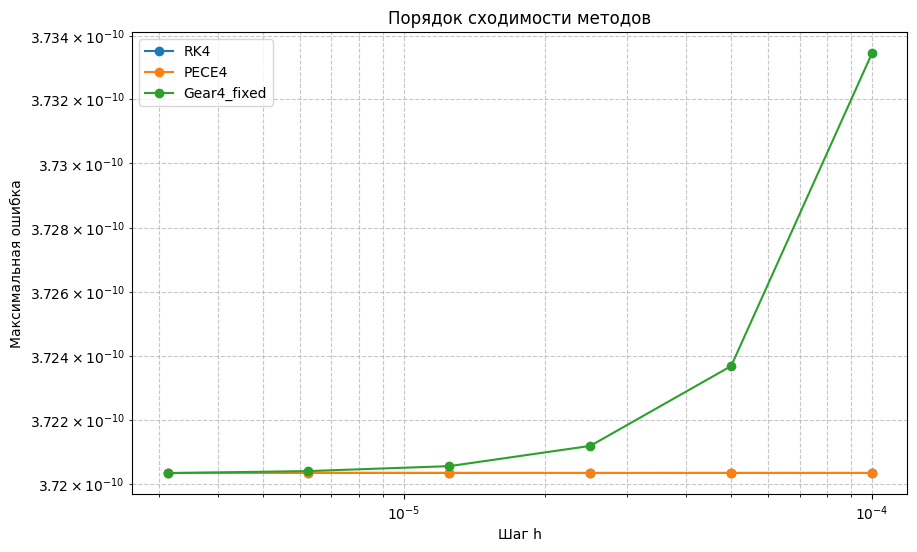

ITERATION 7 1
x0= 0.07 y0= 0.01
❌ rk4_solve: NaN или inf в решении (h=0.0001)
⚠️ RK4 при h=0.0001: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ pece4_solve: NaN или inf в решении (h=0.0001)
⚠️ PECE4 при h=0.0001: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ Gear4: расходимость на шаге 3, h=0.0001
❌ gear4_fixed_step: переполнение (h=0.0001)
⚠️ Gear4_fixed при h=0.0001: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ rk4_solve: NaN или inf в решении (h=5e-05)
⚠️ RK4 при h=5e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ pece4_solve: NaN или inf в решении (h=5e-05)
⚠️ PECE4 при h=5e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ Gear4: расходимость на шаге 3, h=5e-05
✅ gear4_fixed_step: успех, 4 шагов (h=5e-05)
❌ rk4_solve: NaN или inf в решении (h=2.5e-05)
⚠️ RK4 при h=2.5e-05: operands could not be broadcast together with shapes (1,0) (1,3) 


C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:7: RuntimeWarning: overflow encountered in scalar multiply
  dydt = y * (2 * a2 - 0.5 * y - 3.5 * (a2_reg**2) * x)
C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:7: RuntimeWarning: invalid value encountered in scalar subtract
  dydt = y * (2 * a2 - 0.5 * y - 3.5 * (a2_reg**2) * x)
C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:7: RuntimeWarning: overflow encountered in scalar power
  dydt = y * (2 * a2 - 0.5 * y - 3.5 * (a2_reg**2) * x)
C:\Users\lilia\AppData\Local\Programs\Python\Python313\Lib\site-packages\numpy\linalg\_linalg.py:2792: RuntimeWarning: overflow encountered in dot
  sqnorm = x.dot(x)
C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:6: RuntimeWarning: invalid value encountered in scalar multiply
  dxdt = x * (1 - 0.5 * x - (2/7) * (a2_reg**-2) * y)
C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:8: RuntimeWarning: overflow encountered in scala

❌ pece4_solve: NaN или inf в решении (h=2.5e-05)
⚠️ PECE4 при h=2.5e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ Gear4: расходимость на шаге 3, h=2.5e-05
✅ gear4_fixed_step: успех, 4 шагов (h=2.5e-05)
✅ rk4_solve: успех, 801 шагов (h=1.25e-05)
❌ pece4_solve: NaN или inf в решении (h=1.25e-05)
⚠️ PECE4 при h=1.25e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ Gear4: расходимость на шаге 4, h=1.25e-05
✅ gear4_fixed_step: успех, 5 шагов (h=1.25e-05)
✅ rk4_solve: успех, 1601 шагов (h=6.25e-06)
✅ pece4_solve: успех, 1601 шагов (h=6.25e-06)
✅ gear4_fixed_step: успех, 1601 шагов (h=6.25e-06)
✅ rk4_solve: успех, 3201 шагов (h=3.125e-06)
✅ pece4_solve: успех, 3201 шагов (h=3.125e-06)
✅ gear4_fixed_step: успех, 3201 шагов (h=3.125e-06)
          h           RK4  p_RK4          PECE4  p_PECE4   Gear4_fixed  p_Gear4_fixed
0  0.000100           NaN    NaN            NaN      NaN           NaN            NaN
1  0.000050           NaN    NaN      

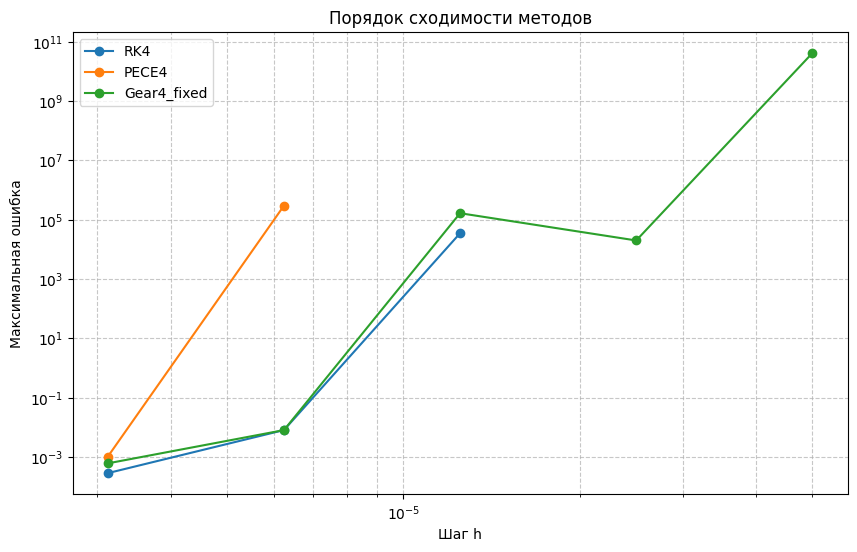

ITERATION 7 2
x0= 0.07 y0= 0.02
❌ rk4_solve: NaN или inf в решении (h=0.0001)
⚠️ RK4 при h=0.0001: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ pece4_solve: NaN или inf в решении (h=0.0001)
⚠️ PECE4 при h=0.0001: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ Gear4: расходимость на шаге 3, h=0.0001
❌ gear4_fixed_step: NaN или inf в решении (h=0.0001)
⚠️ Gear4_fixed при h=0.0001: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ rk4_solve: NaN или inf в решении (h=5e-05)
⚠️ RK4 при h=5e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ pece4_solve: NaN или inf в решении (h=5e-05)
⚠️ PECE4 при h=5e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ Gear4: расходимость на шаге 3, h=5e-05
❌ gear4_fixed_step: переполнение (h=5e-05)
⚠️ Gear4_fixed при h=5e-05: operands could not be broadcast together with shapes (1,0) (1,3) 


C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:7: RuntimeWarning: overflow encountered in scalar multiply
  dydt = y * (2 * a2 - 0.5 * y - 3.5 * (a2_reg**2) * x)
C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:7: RuntimeWarning: invalid value encountered in scalar subtract
  dydt = y * (2 * a2 - 0.5 * y - 3.5 * (a2_reg**2) * x)
C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:7: RuntimeWarning: overflow encountered in scalar power
  dydt = y * (2 * a2 - 0.5 * y - 3.5 * (a2_reg**2) * x)
C:\Users\lilia\AppData\Local\Programs\Python\Python313\Lib\site-packages\numpy\linalg\_linalg.py:2792: RuntimeWarning: overflow encountered in dot
  sqnorm = x.dot(x)
C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:6: RuntimeWarning: invalid value encountered in scalar multiply
  dxdt = x * (1 - 0.5 * x - (2/7) * (a2_reg**-2) * y)
C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:8: RuntimeWarning: overflow encountered in scala

❌ rk4_solve: NaN или inf в решении (h=2.5e-05)
⚠️ RK4 при h=2.5e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ pece4_solve: NaN или inf в решении (h=2.5e-05)
⚠️ PECE4 при h=2.5e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ Gear4: расходимость на шаге 3, h=2.5e-05
✅ gear4_fixed_step: успех, 4 шагов (h=2.5e-05)
❌ rk4_solve: NaN или inf в решении (h=1.25e-05)
⚠️ RK4 при h=1.25e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ pece4_solve: NaN или inf в решении (h=1.25e-05)
⚠️ PECE4 при h=1.25e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ Gear4: расходимость на шаге 3, h=1.25e-05
✅ gear4_fixed_step: успех, 4 шагов (h=1.25e-05)
✅ rk4_solve: успех, 1601 шагов (h=6.25e-06)
❌ pece4_solve: NaN или inf в решении (h=6.25e-06)
⚠️ PECE4 при h=6.25e-06: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ Gear4: расходимость на шаге 4, h=6.25e-06
✅ gear4_fixed_step: успех, 5 шагов (h

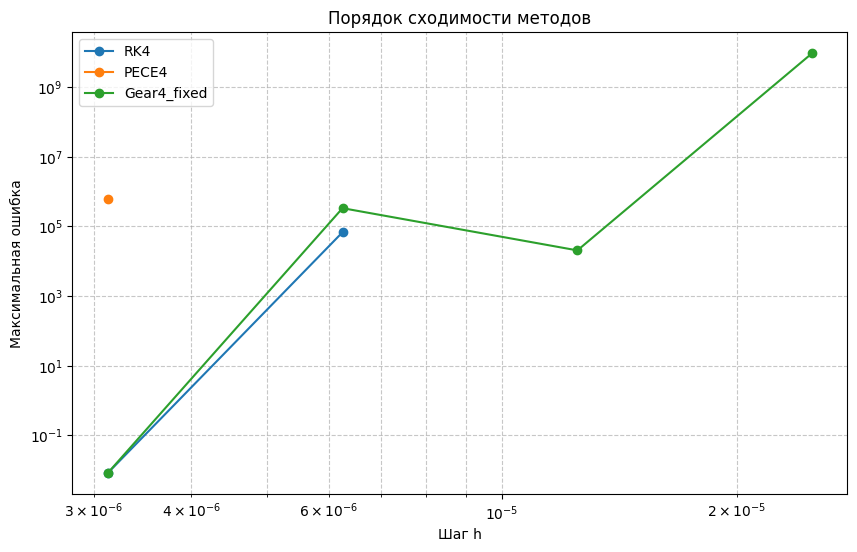

ITERATION 7 3
x0= 0.07 y0= 0.03
❌ rk4_solve: NaN или inf в решении (h=0.0001)
⚠️ RK4 при h=0.0001: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ pece4_solve: NaN или inf в решении (h=0.0001)
⚠️ PECE4 при h=0.0001: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ Gear4: расходимость на шаге 3, h=0.0001
❌ gear4_fixed_step: NaN или inf в решении (h=0.0001)
⚠️ Gear4_fixed при h=0.0001: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ rk4_solve: NaN или inf в решении (h=5e-05)
⚠️ RK4 при h=5e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ pece4_solve: NaN или inf в решении (h=5e-05)
⚠️ PECE4 при h=5e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ Gear4: расходимость на шаге 3, h=5e-05
❌ gear4_fixed_step: переполнение (h=5e-05)
⚠️ Gear4_fixed при h=5e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ rk4_solve: NaN или inf в решении (h=2.5e-05)
⚠️ RK4 при h=2.5e

C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:7: RuntimeWarning: overflow encountered in scalar multiply
  dydt = y * (2 * a2 - 0.5 * y - 3.5 * (a2_reg**2) * x)
C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:6: RuntimeWarning: invalid value encountered in scalar multiply
  dxdt = x * (1 - 0.5 * x - (2/7) * (a2_reg**-2) * y)
C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:7: RuntimeWarning: overflow encountered in scalar power
  dydt = y * (2 * a2 - 0.5 * y - 3.5 * (a2_reg**2) * x)
C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:7: RuntimeWarning: invalid value encountered in scalar subtract
  dydt = y * (2 * a2 - 0.5 * y - 3.5 * (a2_reg**2) * x)
C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:8: RuntimeWarning: overflow encountered in scalar multiply
  da2dt = epsilon * (2 - 7 * a2 * x)
C:\Users\lilia\AppData\Local\Programs\Python\Python313\Lib\site-packages\numpy\linalg\_linalg.py:2792: RuntimeWarning: 

❌ pece4_solve: NaN или inf в решении (h=1.25e-05)
⚠️ PECE4 при h=1.25e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ Gear4: расходимость на шаге 3, h=1.25e-05
✅ gear4_fixed_step: успех, 4 шагов (h=1.25e-05)
❌ rk4_solve: NaN или inf в решении (h=6.25e-06)
⚠️ RK4 при h=6.25e-06: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ pece4_solve: NaN или inf в решении (h=6.25e-06)
⚠️ PECE4 при h=6.25e-06: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ Gear4: расходимость на шаге 3, h=6.25e-06
✅ gear4_fixed_step: успех, 4 шагов (h=6.25e-06)
✅ rk4_solve: успех, 3201 шагов (h=3.125e-06)
❌ pece4_solve: NaN или inf в решении (h=3.125e-06)
⚠️ PECE4 при h=3.125e-06: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ Gear4: расходимость на шаге 28, h=3.125e-06
✅ gear4_fixed_step: успех, 29 шагов (h=3.125e-06)
          h       RK4  p_RK4  PECE4  p_PECE4   Gear4_fixed  p_Gear4_fixed
0  0.000100       NaN    NaN    NaN    

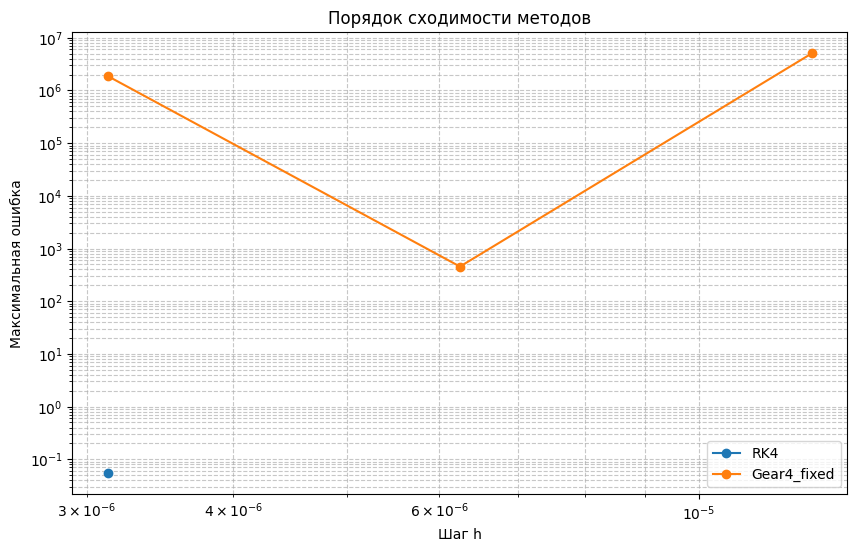

ITERATION 7 4
x0= 0.07 y0= 0.04
❌ rk4_solve: NaN или inf в решении (h=0.0001)
⚠️ RK4 при h=0.0001: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ pece4_solve: NaN или inf в решении (h=0.0001)
⚠️ PECE4 при h=0.0001: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ Gear4: расходимость на шаге 3, h=0.0001
❌ gear4_fixed_step: NaN или inf в решении (h=0.0001)
⚠️ Gear4_fixed при h=0.0001: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ rk4_solve: NaN или inf в решении (h=5e-05)
⚠️ RK4 при h=5e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ pece4_solve: NaN или inf в решении (h=5e-05)
⚠️ PECE4 при h=5e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ Gear4: расходимость на шаге 3, h=5e-05
❌ gear4_fixed_step: NaN или inf в решении (h=5e-05)
⚠️ Gear4_fixed при h=5e-05: operands could not be broadcast together with shapes (1,0) (1,3) 


C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:7: RuntimeWarning: overflow encountered in scalar multiply
  dydt = y * (2 * a2 - 0.5 * y - 3.5 * (a2_reg**2) * x)
C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:6: RuntimeWarning: invalid value encountered in scalar multiply
  dxdt = x * (1 - 0.5 * x - (2/7) * (a2_reg**-2) * y)
C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:7: RuntimeWarning: overflow encountered in scalar power
  dydt = y * (2 * a2 - 0.5 * y - 3.5 * (a2_reg**2) * x)
C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:7: RuntimeWarning: invalid value encountered in scalar subtract
  dydt = y * (2 * a2 - 0.5 * y - 3.5 * (a2_reg**2) * x)
C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:8: RuntimeWarning: overflow encountered in scalar multiply
  da2dt = epsilon * (2 - 7 * a2 * x)
C:\Users\lilia\AppData\Local\Programs\Python\Python313\Lib\site-packages\numpy\linalg\_linalg.py:2792: RuntimeWarning: 

❌ rk4_solve: NaN или inf в решении (h=2.5e-05)
⚠️ RK4 при h=2.5e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ pece4_solve: NaN или inf в решении (h=2.5e-05)
⚠️ PECE4 при h=2.5e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ Gear4: расходимость на шаге 3, h=2.5e-05
❌ gear4_fixed_step: переполнение (h=2.5e-05)
⚠️ Gear4_fixed при h=2.5e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ rk4_solve: NaN или inf в решении (h=1.25e-05)
⚠️ RK4 при h=1.25e-05: operands could not be broadcast together with shapes (1,0) (1,3) 


C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\995573919.py:8: RuntimeWarning: invalid value encountered in add
  y_pred = y + h/24 * (55*f_vals[3] - 59*f_vals[2] + 37*f_vals[1] - 9*f_vals[0])


❌ pece4_solve: NaN или inf в решении (h=1.25e-05)
⚠️ PECE4 при h=1.25e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ Gear4: расходимость на шаге 3, h=1.25e-05
✅ gear4_fixed_step: успех, 4 шагов (h=1.25e-05)
❌ rk4_solve: NaN или inf в решении (h=6.25e-06)
⚠️ RK4 при h=6.25e-06: operands could not be broadcast together with shapes (1,0) (1,3) 


C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\995573919.py:14: RuntimeWarning: invalid value encountered in add
  y_corr = y + h/24 * (9*f_pred + 19*f_vals[3] - 5*f_vals[2] + f_vals[1])


❌ pece4_solve: NaN или inf в решении (h=6.25e-06)
⚠️ PECE4 при h=6.25e-06: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ Gear4: расходимость на шаге 3, h=6.25e-06
✅ gear4_fixed_step: успех, 4 шагов (h=6.25e-06)
✅ rk4_solve: успех, 3201 шагов (h=3.125e-06)
❌ pece4_solve: NaN или inf в решении (h=3.125e-06)
⚠️ PECE4 при h=3.125e-06: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ Gear4: расходимость на шаге 8, h=3.125e-06
✅ gear4_fixed_step: успех, 9 шагов (h=3.125e-06)
          h            RK4  p_RK4  PECE4  p_PECE4   Gear4_fixed  p_Gear4_fixed
0  0.000100            NaN    NaN    NaN      NaN           NaN            NaN
1  0.000050            NaN    NaN    NaN      NaN           NaN            NaN
2  0.000025            NaN    NaN    NaN      NaN           NaN            NaN
3  0.000013            NaN    NaN    NaN      NaN  2.091052e+10            NaN
4  0.000006            NaN    NaN    NaN      NaN  2.079686e+04          19.94
5  0.000003

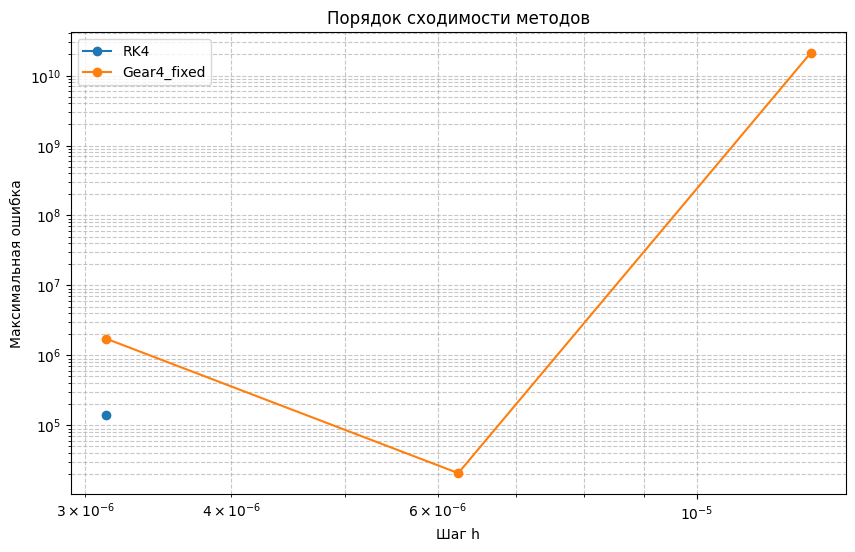

ITERATION 7 5
x0= 0.07 y0= 0.05
❌ rk4_solve: NaN или inf в решении (h=0.0001)
⚠️ RK4 при h=0.0001: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ pece4_solve: NaN или inf в решении (h=0.0001)
⚠️ PECE4 при h=0.0001: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ Gear4: расходимость на шаге 3, h=0.0001
❌ gear4_fixed_step: NaN или inf в решении (h=0.0001)
⚠️ Gear4_fixed при h=0.0001: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ rk4_solve: NaN или inf в решении (h=5e-05)
⚠️ RK4 при h=5e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ pece4_solve: NaN или inf в решении (h=5e-05)
⚠️ PECE4 при h=5e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ Gear4: расходимость на шаге 3, h=5e-05
❌ gear4_fixed_step: NaN или inf в решении (h=5e-05)
⚠️ Gear4_fixed при h=5e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ rk4_solve: NaN или inf в решении (h=2.5e-05)
⚠️ RK4 п

C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:7: RuntimeWarning: overflow encountered in scalar multiply
  dydt = y * (2 * a2 - 0.5 * y - 3.5 * (a2_reg**2) * x)
C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:6: RuntimeWarning: invalid value encountered in scalar multiply
  dxdt = x * (1 - 0.5 * x - (2/7) * (a2_reg**-2) * y)
C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:7: RuntimeWarning: overflow encountered in scalar power
  dydt = y * (2 * a2 - 0.5 * y - 3.5 * (a2_reg**2) * x)
C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:7: RuntimeWarning: invalid value encountered in scalar subtract
  dydt = y * (2 * a2 - 0.5 * y - 3.5 * (a2_reg**2) * x)
C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:8: RuntimeWarning: overflow encountered in scalar multiply
  da2dt = epsilon * (2 - 7 * a2 * x)
C:\Users\lilia\AppData\Local\Programs\Python\Python313\Lib\site-packages\numpy\linalg\_linalg.py:2792: RuntimeWarning: 

❌ rk4_solve: NaN или inf в решении (h=1.25e-05)
⚠️ RK4 при h=1.25e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ pece4_solve: NaN или inf в решении (h=1.25e-05)
⚠️ PECE4 при h=1.25e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ Gear4: расходимость на шаге 3, h=1.25e-05
❌ gear4_fixed_step: переполнение (h=1.25e-05)
⚠️ Gear4_fixed при h=1.25e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ rk4_solve: NaN или inf в решении (h=6.25e-06)
⚠️ RK4 при h=6.25e-06: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ pece4_solve: NaN или inf в решении (h=6.25e-06)
⚠️ PECE4 при h=6.25e-06: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ Gear4: расходимость на шаге 3, h=6.25e-06
✅ gear4_fixed_step: успех, 4 шагов (h=6.25e-06)
❌ rk4_solve: NaN или inf в решении (h=3.125e-06)
⚠️ RK4 при h=3.125e-06: operands could not be broadcast together with shapes (1,0) (1,3) 


C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3752895320.py:31: RuntimeWarning: invalid value encountered in scalar divide
  err = np.linalg.norm(y_next - y_new) / (1 + np.linalg.norm(y_new))


❌ pece4_solve: NaN или inf в решении (h=3.125e-06)
⚠️ PECE4 при h=3.125e-06: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ Gear4: расходимость на шаге 3, h=3.125e-06
✅ gear4_fixed_step: успех, 4 шагов (h=3.125e-06)
          h  RK4  p_RK4  PECE4  p_PECE4    Gear4_fixed  p_Gear4_fixed
0  0.000100  NaN    NaN    NaN      NaN            NaN            NaN
1  0.000050  NaN    NaN    NaN      NaN            NaN            NaN
2  0.000025  NaN    NaN    NaN      NaN            NaN            NaN
3  0.000013  NaN    NaN    NaN      NaN            NaN            NaN
4  0.000006  NaN    NaN    NaN      NaN  343371.704976            NaN
5  0.000003  NaN    NaN    NaN      NaN      38.804269          13.11


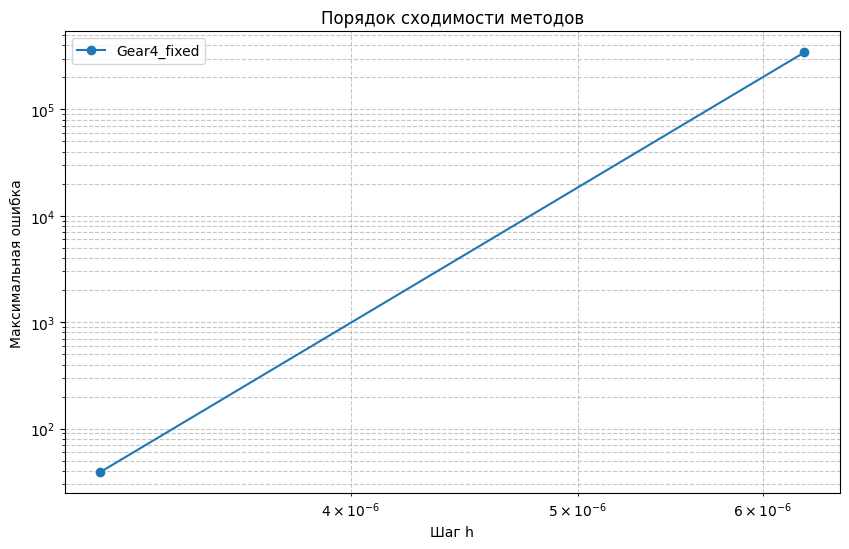

ITERATION 7 6
x0= 0.07 y0= 0.06
❌ rk4_solve: NaN или inf в решении (h=0.0001)
⚠️ RK4 при h=0.0001: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ pece4_solve: NaN или inf в решении (h=0.0001)
⚠️ PECE4 при h=0.0001: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ Gear4: расходимость на шаге 3, h=0.0001
❌ gear4_fixed_step: NaN или inf в решении (h=0.0001)
⚠️ Gear4_fixed при h=0.0001: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ rk4_solve: NaN или inf в решении (h=5e-05)
⚠️ RK4 при h=5e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ pece4_solve: NaN или inf в решении (h=5e-05)
⚠️ PECE4 при h=5e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ Gear4: расходимость на шаге 3, h=5e-05
❌ gear4_fixed_step: NaN или inf в решении (h=5e-05)
⚠️ Gear4_fixed при h=5e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ rk4_solve: NaN или inf в решении (h=2.5e-05)
⚠️ RK4 п

C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:7: RuntimeWarning: overflow encountered in scalar multiply
  dydt = y * (2 * a2 - 0.5 * y - 3.5 * (a2_reg**2) * x)
C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:6: RuntimeWarning: invalid value encountered in scalar multiply
  dxdt = x * (1 - 0.5 * x - (2/7) * (a2_reg**-2) * y)
C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:7: RuntimeWarning: overflow encountered in scalar power
  dydt = y * (2 * a2 - 0.5 * y - 3.5 * (a2_reg**2) * x)
C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:7: RuntimeWarning: invalid value encountered in scalar subtract
  dydt = y * (2 * a2 - 0.5 * y - 3.5 * (a2_reg**2) * x)
C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:8: RuntimeWarning: overflow encountered in scalar multiply
  da2dt = epsilon * (2 - 7 * a2 * x)
C:\Users\lilia\AppData\Local\Programs\Python\Python313\Lib\site-packages\numpy\linalg\_linalg.py:2792: RuntimeWarning: 

❌ rk4_solve: NaN или inf в решении (h=1.25e-05)
⚠️ RK4 при h=1.25e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ pece4_solve: NaN или inf в решении (h=1.25e-05)
⚠️ PECE4 при h=1.25e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ Gear4: расходимость на шаге 3, h=1.25e-05
❌ gear4_fixed_step: переполнение (h=1.25e-05)
⚠️ Gear4_fixed при h=1.25e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ rk4_solve: NaN или inf в решении (h=6.25e-06)
⚠️ RK4 при h=6.25e-06: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ pece4_solve: NaN или inf в решении (h=6.25e-06)
⚠️ PECE4 при h=6.25e-06: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ Gear4: расходимость на шаге 3, h=6.25e-06
✅ gear4_fixed_step: успех, 4 шагов (h=6.25e-06)
✅ rk4_solve: успех, 3201 шагов (h=3.125e-06)
❌ pece4_solve: NaN или inf в решении (h=3.125e-06)
⚠️ PECE4 при h=3.125e-06: operands could not be broadcast together wi

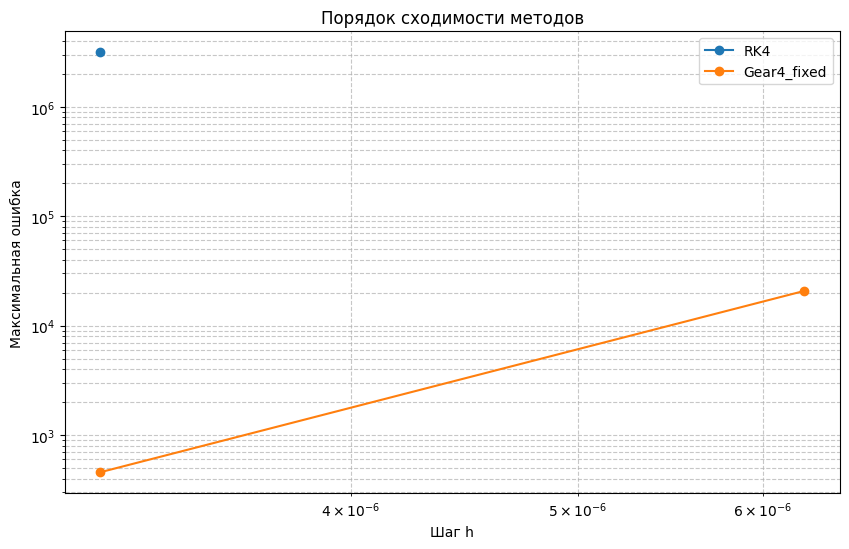

ITERATION 7 7
x0= 0.07 y0= 0.07
❌ rk4_solve: NaN или inf в решении (h=0.0001)
⚠️ RK4 при h=0.0001: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ pece4_solve: NaN или inf в решении (h=0.0001)
⚠️ PECE4 при h=0.0001: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ Gear4: расходимость на шаге 3, h=0.0001
❌ gear4_fixed_step: NaN или inf в решении (h=0.0001)
⚠️ Gear4_fixed при h=0.0001: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ rk4_solve: NaN или inf в решении (h=5e-05)
⚠️ RK4 при h=5e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ pece4_solve: NaN или inf в решении (h=5e-05)
⚠️ PECE4 при h=5e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ Gear4: расходимость на шаге 3, h=5e-05
❌ gear4_fixed_step: NaN или inf в решении (h=5e-05)
⚠️ Gear4_fixed при h=5e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ rk4_solve: NaN или inf в решении (h=2.5e-05)
⚠️ RK4 п

C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:7: RuntimeWarning: overflow encountered in scalar multiply
  dydt = y * (2 * a2 - 0.5 * y - 3.5 * (a2_reg**2) * x)
C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:6: RuntimeWarning: invalid value encountered in scalar multiply
  dxdt = x * (1 - 0.5 * x - (2/7) * (a2_reg**-2) * y)
C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:7: RuntimeWarning: overflow encountered in scalar power
  dydt = y * (2 * a2 - 0.5 * y - 3.5 * (a2_reg**2) * x)
C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:7: RuntimeWarning: invalid value encountered in scalar subtract
  dydt = y * (2 * a2 - 0.5 * y - 3.5 * (a2_reg**2) * x)
C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:8: RuntimeWarning: overflow encountered in scalar multiply
  da2dt = epsilon * (2 - 7 * a2 * x)
C:\Users\lilia\AppData\Local\Programs\Python\Python313\Lib\site-packages\numpy\linalg\_linalg.py:2792: RuntimeWarning: 

❌ pece4_solve: NaN или inf в решении (h=2.5e-05)
⚠️ PECE4 при h=2.5e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ Gear4: расходимость на шаге 3, h=2.5e-05
❌ gear4_fixed_step: переполнение (h=2.5e-05)
⚠️ Gear4_fixed при h=2.5e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ rk4_solve: NaN или inf в решении (h=1.25e-05)
⚠️ RK4 при h=1.25e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ pece4_solve: NaN или inf в решении (h=1.25e-05)
⚠️ PECE4 при h=1.25e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ Gear4: расходимость на шаге 3, h=1.25e-05
❌ gear4_fixed_step: переполнение (h=1.25e-05)
⚠️ Gear4_fixed при h=1.25e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ rk4_solve: NaN или inf в решении (h=6.25e-06)
⚠️ RK4 при h=6.25e-06: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ pece4_solve: NaN или inf в решении (h=6.25e-06)
⚠️ PECE4 при h=6.25e-06: 

C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\1111329400.py:11: RuntimeWarning: invalid value encountered in add
  return y + h/6 * (k1 + 2*k2 + 2*k3 + k4)


❌ pece4_solve: NaN или inf в решении (h=3.125e-06)
⚠️ PECE4 при h=3.125e-06: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ Gear4: расходимость на шаге 3, h=3.125e-06
✅ gear4_fixed_step: успех, 4 шагов (h=3.125e-06)
          h  RK4  p_RK4  PECE4  p_PECE4   Gear4_fixed  p_Gear4_fixed
0  0.000100  NaN    NaN    NaN      NaN           NaN            NaN
1  0.000050  NaN    NaN    NaN      NaN           NaN            NaN
2  0.000025  NaN    NaN    NaN      NaN           NaN            NaN
3  0.000013  NaN    NaN    NaN      NaN           NaN            NaN
4  0.000006  NaN    NaN    NaN      NaN  1.914694e+08            NaN
5  0.000003  NaN    NaN    NaN      NaN  3.580894e+03          15.71


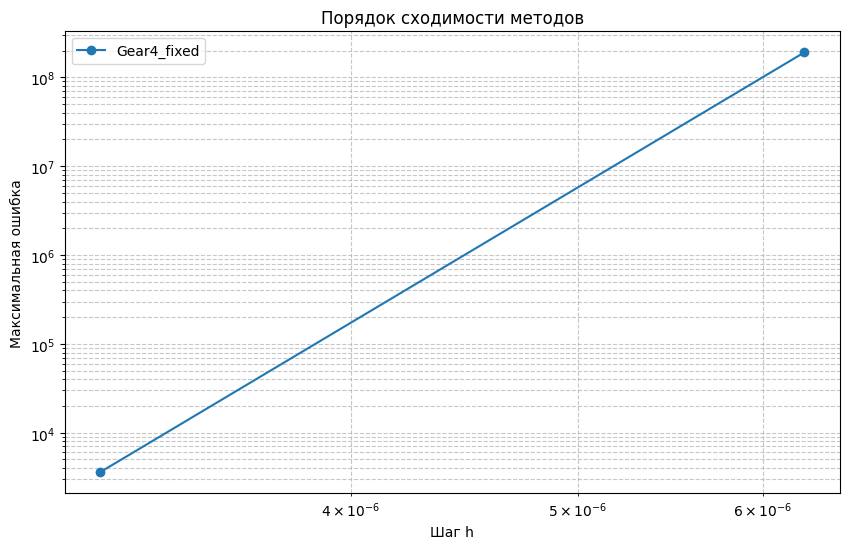

ITERATION 7 8
x0= 0.07 y0= 0.08
❌ rk4_solve: NaN или inf в решении (h=0.0001)
⚠️ RK4 при h=0.0001: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ pece4_solve: NaN или inf в решении (h=0.0001)
⚠️ PECE4 при h=0.0001: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ Gear4: расходимость на шаге 3, h=0.0001
❌ gear4_fixed_step: NaN или inf в решении (h=0.0001)
⚠️ Gear4_fixed при h=0.0001: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ rk4_solve: NaN или inf в решении (h=5e-05)
⚠️ RK4 при h=5e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ pece4_solve: NaN или inf в решении (h=5e-05)
⚠️ PECE4 при h=5e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ Gear4: расходимость на шаге 3, h=5e-05
❌ gear4_fixed_step: NaN или inf в решении (h=5e-05)
⚠️ Gear4_fixed при h=5e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ rk4_solve: NaN или inf в решении (h=2.5e-05)
⚠️ RK4 п

C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:7: RuntimeWarning: overflow encountered in scalar multiply
  dydt = y * (2 * a2 - 0.5 * y - 3.5 * (a2_reg**2) * x)
C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:7: RuntimeWarning: invalid value encountered in scalar subtract
  dydt = y * (2 * a2 - 0.5 * y - 3.5 * (a2_reg**2) * x)
C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:7: RuntimeWarning: overflow encountered in scalar power
  dydt = y * (2 * a2 - 0.5 * y - 3.5 * (a2_reg**2) * x)
C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:8: RuntimeWarning: overflow encountered in scalar multiply
  da2dt = epsilon * (2 - 7 * a2 * x)
C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\1111329400.py:7: RuntimeWarning: invalid value encountered in add
  k2 = f(t + h/2, y + h/2 * k1, epsilon)
C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\995573919.py:8: RuntimeWarning: invalid value encountered in add
  y_pred = y + h/24 * (55*f_v

❌ pece4_solve: NaN или inf в решении (h=2.5e-05)
⚠️ PECE4 при h=2.5e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ Gear4: расходимость на шаге 3, h=2.5e-05
❌ gear4_fixed_step: переполнение (h=2.5e-05)
⚠️ Gear4_fixed при h=2.5e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ rk4_solve: NaN или inf в решении (h=1.25e-05)
⚠️ RK4 при h=1.25e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ pece4_solve: NaN или inf в решении (h=1.25e-05)
⚠️ PECE4 при h=1.25e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ Gear4: расходимость на шаге 3, h=1.25e-05
❌ gear4_fixed_step: переполнение (h=1.25e-05)
⚠️ Gear4_fixed при h=1.25e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ rk4_solve: NaN или inf в решении (h=6.25e-06)
⚠️ RK4 при h=6.25e-06: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ pece4_solve: NaN или inf в решении (h=6.25e-06)
⚠️ PECE4 при h=6.25e-06: 

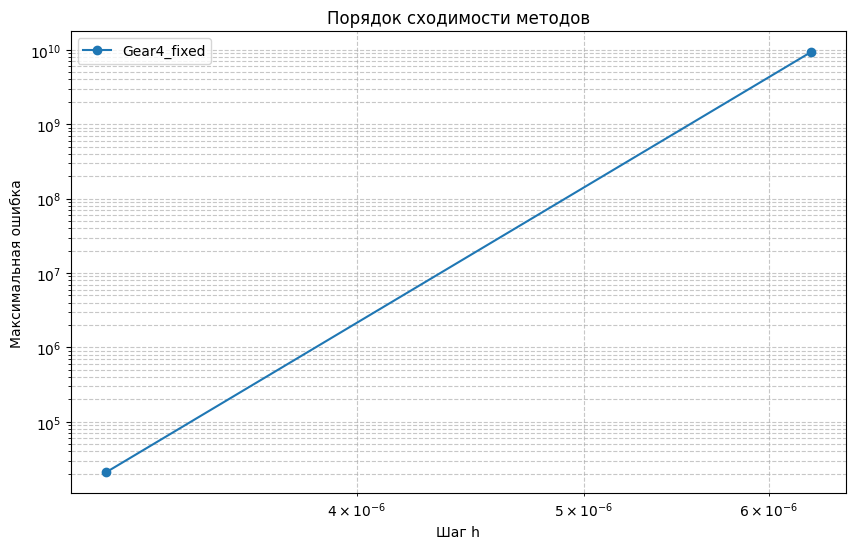

ITERATION 7 9
x0= 0.07 y0= 0.09
❌ rk4_solve: NaN или inf в решении (h=0.0001)
⚠️ RK4 при h=0.0001: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ pece4_solve: NaN или inf в решении (h=0.0001)
⚠️ PECE4 при h=0.0001: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ Gear4: расходимость на шаге 3, h=0.0001
❌ gear4_fixed_step: NaN или inf в решении (h=0.0001)
⚠️ Gear4_fixed при h=0.0001: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ rk4_solve: NaN или inf в решении (h=5e-05)
⚠️ RK4 при h=5e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ pece4_solve: NaN или inf в решении (h=5e-05)
⚠️ PECE4 при h=5e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ Gear4: расходимость на шаге 3, h=5e-05
❌ gear4_fixed_step: NaN или inf в решении (h=5e-05)
⚠️ Gear4_fixed при h=5e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ rk4_solve: NaN или inf в решении (h=2.5e-05)
⚠️ RK4 п

C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:7: RuntimeWarning: overflow encountered in scalar multiply
  dydt = y * (2 * a2 - 0.5 * y - 3.5 * (a2_reg**2) * x)
C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:7: RuntimeWarning: invalid value encountered in scalar subtract
  dydt = y * (2 * a2 - 0.5 * y - 3.5 * (a2_reg**2) * x)
C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:8: RuntimeWarning: overflow encountered in scalar multiply
  da2dt = epsilon * (2 - 7 * a2 * x)
C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\1111329400.py:11: RuntimeWarning: invalid value encountered in add
  return y + h/6 * (k1 + 2*k2 + 2*k3 + k4)
C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:6: RuntimeWarning: invalid value encountered in scalar multiply
  dxdt = x * (1 - 0.5 * x - (2/7) * (a2_reg**-2) * y)
C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:7: RuntimeWarning: overflow encountered in scalar power
  dydt = y * (2

❌ rk4_solve: NaN или inf в решении (h=1.25e-05)
⚠️ RK4 при h=1.25e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ pece4_solve: NaN или inf в решении (h=1.25e-05)
⚠️ PECE4 при h=1.25e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ Gear4: расходимость на шаге 3, h=1.25e-05
❌ gear4_fixed_step: переполнение (h=1.25e-05)
⚠️ Gear4_fixed при h=1.25e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ rk4_solve: NaN или inf в решении (h=6.25e-06)
⚠️ RK4 при h=6.25e-06: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ pece4_solve: NaN или inf в решении (h=6.25e-06)
⚠️ PECE4 при h=6.25e-06: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ Gear4: расходимость на шаге 3, h=6.25e-06
✅ gear4_fixed_step: успех, 4 шагов (h=6.25e-06)


C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\1111329400.py:7: RuntimeWarning: invalid value encountered in add
  k2 = f(t + h/2, y + h/2 * k1, epsilon)


❌ rk4_solve: NaN или inf в решении (h=3.125e-06)
⚠️ RK4 при h=3.125e-06: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ pece4_solve: NaN или inf в решении (h=3.125e-06)
⚠️ PECE4 при h=3.125e-06: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ Gear4: расходимость на шаге 3, h=3.125e-06
✅ gear4_fixed_step: успех, 4 шагов (h=3.125e-06)
          h  RK4  p_RK4  PECE4  p_PECE4   Gear4_fixed  p_Gear4_fixed
0  0.000100  NaN    NaN    NaN      NaN           NaN            NaN
1  0.000050  NaN    NaN    NaN      NaN           NaN            NaN
2  0.000025  NaN    NaN    NaN      NaN           NaN            NaN
3  0.000013  NaN    NaN    NaN      NaN           NaN            NaN
4  0.000006  NaN    NaN    NaN      NaN  1.392456e+11            NaN
5  0.000003  NaN    NaN    NaN      NaN  9.742661e+04          20.45


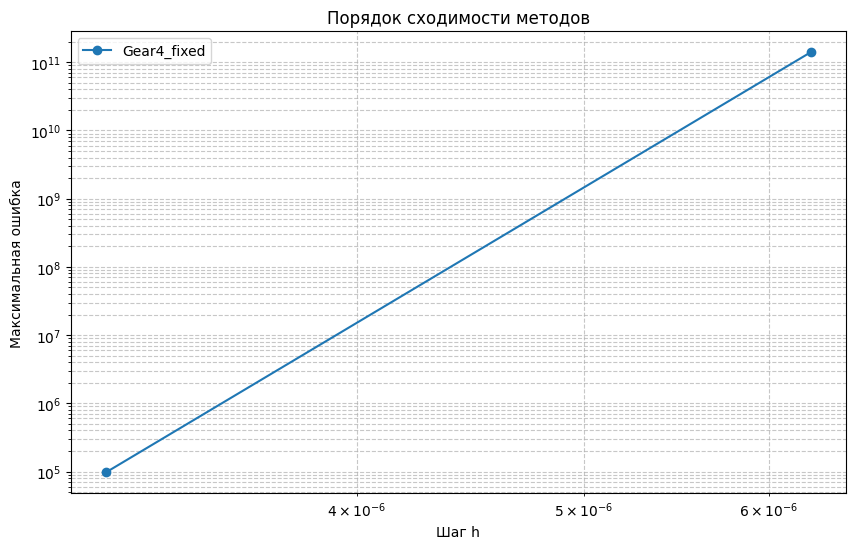

ITERATION 8 0
x0= 0.08 y0= 0.0
✅ rk4_solve: успех, 101 шагов (h=0.0001)
✅ pece4_solve: успех, 101 шагов (h=0.0001)
✅ gear4_fixed_step: успех, 101 шагов (h=0.0001)
✅ rk4_solve: успех, 201 шагов (h=5e-05)
✅ pece4_solve: успех, 201 шагов (h=5e-05)
✅ gear4_fixed_step: успех, 201 шагов (h=5e-05)
✅ rk4_solve: успех, 401 шагов (h=2.5e-05)
✅ pece4_solve: успех, 401 шагов (h=2.5e-05)
✅ gear4_fixed_step: успех, 401 шагов (h=2.5e-05)
✅ rk4_solve: успех, 801 шагов (h=1.25e-05)
✅ pece4_solve: успех, 801 шагов (h=1.25e-05)
✅ gear4_fixed_step: успех, 801 шагов (h=1.25e-05)
✅ rk4_solve: успех, 1601 шагов (h=6.25e-06)
✅ pece4_solve: успех, 1601 шагов (h=6.25e-06)
✅ gear4_fixed_step: успех, 1601 шагов (h=6.25e-06)
✅ rk4_solve: успех, 3201 шагов (h=3.125e-06)
✅ pece4_solve: успех, 3201 шагов (h=3.125e-06)
✅ gear4_fixed_step: успех, 3201 шагов (h=3.125e-06)
          h           RK4  p_RK4         PECE4  p_PECE4   Gear4_fixed  p_Gear4_fixed
0  0.000100  3.718452e-10    NaN  3.718452e-10      NaN  3.733029

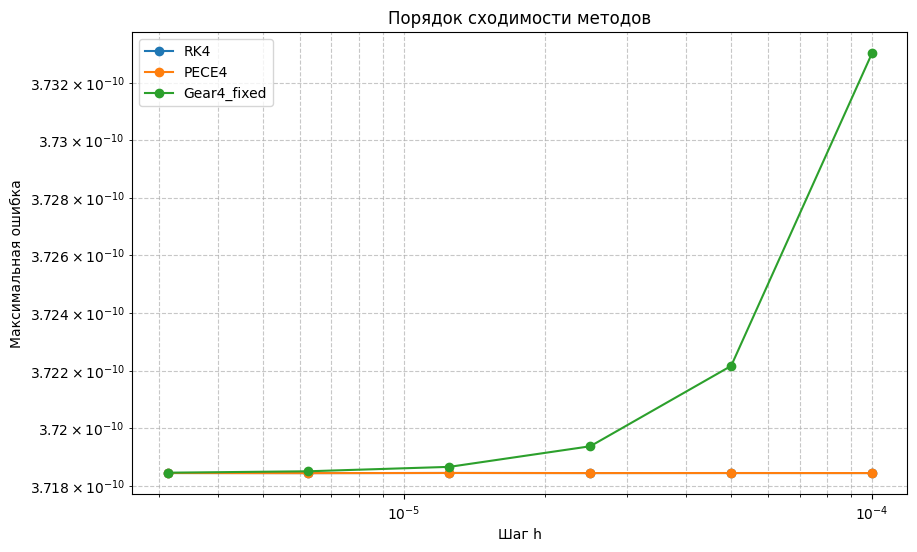

ITERATION 8 1
x0= 0.08 y0= 0.01
❌ rk4_solve: NaN или inf в решении (h=0.0001)
⚠️ RK4 при h=0.0001: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ pece4_solve: NaN или inf в решении (h=0.0001)
⚠️ PECE4 при h=0.0001: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ Gear4: расходимость на шаге 3, h=0.0001
❌ gear4_fixed_step: переполнение (h=0.0001)
⚠️ Gear4_fixed при h=0.0001: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ rk4_solve: NaN или inf в решении (h=5e-05)
⚠️ RK4 при h=5e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ pece4_solve: NaN или inf в решении (h=5e-05)
⚠️ PECE4 при h=5e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ Gear4: расходимость на шаге 3, h=5e-05
✅ gear4_fixed_step: успех, 4 шагов (h=5e-05)
❌ rk4_solve: NaN или inf в решении (h=2.5e-05)
⚠️ RK4 при h=2.5e-05: operands could not be broadcast together with shapes (1,0) (1,3) 


C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:7: RuntimeWarning: overflow encountered in scalar multiply
  dydt = y * (2 * a2 - 0.5 * y - 3.5 * (a2_reg**2) * x)
C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:7: RuntimeWarning: invalid value encountered in scalar subtract
  dydt = y * (2 * a2 - 0.5 * y - 3.5 * (a2_reg**2) * x)
C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:7: RuntimeWarning: overflow encountered in scalar power
  dydt = y * (2 * a2 - 0.5 * y - 3.5 * (a2_reg**2) * x)
C:\Users\lilia\AppData\Local\Programs\Python\Python313\Lib\site-packages\numpy\linalg\_linalg.py:2792: RuntimeWarning: overflow encountered in dot
  sqnorm = x.dot(x)
C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:6: RuntimeWarning: invalid value encountered in scalar multiply
  dxdt = x * (1 - 0.5 * x - (2/7) * (a2_reg**-2) * y)
C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:8: RuntimeWarning: overflow encountered in scala

❌ pece4_solve: NaN или inf в решении (h=2.5e-05)
⚠️ PECE4 при h=2.5e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ Gear4: расходимость на шаге 3, h=2.5e-05
✅ gear4_fixed_step: успех, 4 шагов (h=2.5e-05)
✅ rk4_solve: успех, 801 шагов (h=1.25e-05)
❌ pece4_solve: NaN или inf в решении (h=1.25e-05)
⚠️ PECE4 при h=1.25e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ Gear4: расходимость на шаге 7, h=1.25e-05
✅ gear4_fixed_step: успех, 8 шагов (h=1.25e-05)
✅ rk4_solve: успех, 1601 шагов (h=6.25e-06)
✅ pece4_solve: успех, 1601 шагов (h=6.25e-06)
✅ gear4_fixed_step: успех, 1601 шагов (h=6.25e-06)
✅ rk4_solve: успех, 3201 шагов (h=3.125e-06)
✅ pece4_solve: успех, 3201 шагов (h=3.125e-06)
✅ gear4_fixed_step: успех, 3201 шагов (h=3.125e-06)
          h           RK4  p_RK4          PECE4  p_PECE4   Gear4_fixed  p_Gear4_fixed
0  0.000100           NaN    NaN            NaN      NaN           NaN            NaN
1  0.000050           NaN    NaN      

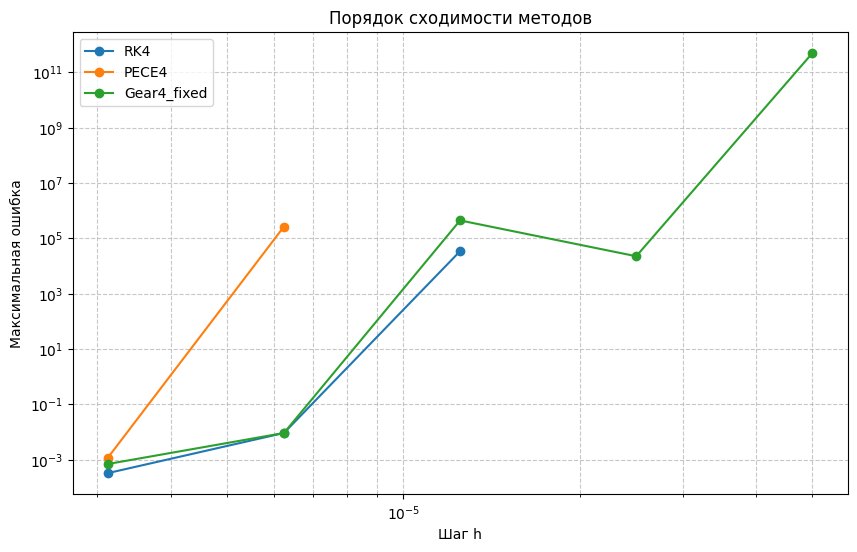

ITERATION 8 2
x0= 0.08 y0= 0.02
❌ rk4_solve: NaN или inf в решении (h=0.0001)
⚠️ RK4 при h=0.0001: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ pece4_solve: NaN или inf в решении (h=0.0001)
⚠️ PECE4 при h=0.0001: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ Gear4: расходимость на шаге 3, h=0.0001
❌ gear4_fixed_step: переполнение (h=0.0001)
⚠️ Gear4_fixed при h=0.0001: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ rk4_solve: NaN или inf в решении (h=5e-05)
⚠️ RK4 при h=5e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ pece4_solve: NaN или inf в решении (h=5e-05)
⚠️ PECE4 при h=5e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ Gear4: расходимость на шаге 3, h=5e-05
❌ gear4_fixed_step: переполнение (h=5e-05)
⚠️ Gear4_fixed при h=5e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ rk4_solve: NaN или inf в решении (h=2.5e-05)
⚠️ RK4 при h=2.5e-05: oper

C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:7: RuntimeWarning: overflow encountered in scalar multiply
  dydt = y * (2 * a2 - 0.5 * y - 3.5 * (a2_reg**2) * x)
C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:6: RuntimeWarning: invalid value encountered in scalar multiply
  dxdt = x * (1 - 0.5 * x - (2/7) * (a2_reg**-2) * y)
C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:7: RuntimeWarning: overflow encountered in scalar power
  dydt = y * (2 * a2 - 0.5 * y - 3.5 * (a2_reg**2) * x)
C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:7: RuntimeWarning: invalid value encountered in scalar subtract
  dydt = y * (2 * a2 - 0.5 * y - 3.5 * (a2_reg**2) * x)
C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:8: RuntimeWarning: overflow encountered in scalar multiply
  da2dt = epsilon * (2 - 7 * a2 * x)
C:\Users\lilia\AppData\Local\Programs\Python\Python313\Lib\site-packages\numpy\linalg\_linalg.py:2792: RuntimeWarning: 

❌ pece4_solve: NaN или inf в решении (h=1.25e-05)
⚠️ PECE4 при h=1.25e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ Gear4: расходимость на шаге 3, h=1.25e-05
✅ gear4_fixed_step: успех, 4 шагов (h=1.25e-05)
✅ rk4_solve: успех, 1601 шагов (h=6.25e-06)
❌ pece4_solve: NaN или inf в решении (h=6.25e-06)
⚠️ PECE4 при h=6.25e-06: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ Gear4: расходимость на шаге 6, h=6.25e-06
✅ gear4_fixed_step: успех, 7 шагов (h=6.25e-06)
✅ rk4_solve: успех, 3201 шагов (h=3.125e-06)
✅ pece4_solve: успех, 3201 шагов (h=3.125e-06)
✅ gear4_fixed_step: успех, 3201 шагов (h=3.125e-06)
          h           RK4  p_RK4          PECE4  p_PECE4   Gear4_fixed  p_Gear4_fixed
0  0.000100           NaN    NaN            NaN      NaN           NaN            NaN
1  0.000050           NaN    NaN            NaN      NaN           NaN            NaN
2  0.000025           NaN    NaN            NaN      NaN  4.418585e+09            NaN
3 

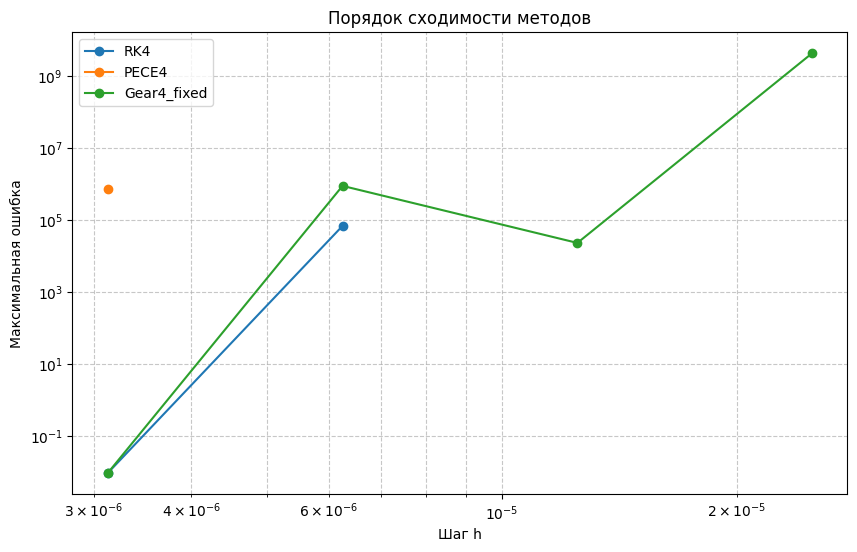

ITERATION 8 3
x0= 0.08 y0= 0.03
❌ rk4_solve: NaN или inf в решении (h=0.0001)
⚠️ RK4 при h=0.0001: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ pece4_solve: NaN или inf в решении (h=0.0001)
⚠️ PECE4 при h=0.0001: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ Gear4: расходимость на шаге 3, h=0.0001
❌ gear4_fixed_step: NaN или inf в решении (h=0.0001)
⚠️ Gear4_fixed при h=0.0001: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ rk4_solve: NaN или inf в решении (h=5e-05)
⚠️ RK4 при h=5e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ pece4_solve: NaN или inf в решении (h=5e-05)
⚠️ PECE4 при h=5e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ Gear4: расходимость на шаге 3, h=5e-05
❌ gear4_fixed_step: переполнение (h=5e-05)
⚠️ Gear4_fixed при h=5e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ rk4_solve: NaN или inf в решении (h=2.5e-05)
⚠️ RK4 при h=2.5e

C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:7: RuntimeWarning: overflow encountered in scalar multiply
  dydt = y * (2 * a2 - 0.5 * y - 3.5 * (a2_reg**2) * x)
C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:7: RuntimeWarning: invalid value encountered in scalar subtract
  dydt = y * (2 * a2 - 0.5 * y - 3.5 * (a2_reg**2) * x)
C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:7: RuntimeWarning: overflow encountered in scalar power
  dydt = y * (2 * a2 - 0.5 * y - 3.5 * (a2_reg**2) * x)
C:\Users\lilia\AppData\Local\Programs\Python\Python313\Lib\site-packages\numpy\linalg\_linalg.py:2792: RuntimeWarning: overflow encountered in dot
  sqnorm = x.dot(x)
C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:6: RuntimeWarning: invalid value encountered in scalar multiply
  dxdt = x * (1 - 0.5 * x - (2/7) * (a2_reg**-2) * y)
C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:8: RuntimeWarning: overflow encountered in scala

❌ rk4_solve: NaN или inf в решении (h=1.25e-05)
⚠️ RK4 при h=1.25e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ pece4_solve: NaN или inf в решении (h=1.25e-05)
⚠️ PECE4 при h=1.25e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ Gear4: расходимость на шаге 3, h=1.25e-05
✅ gear4_fixed_step: успех, 4 шагов (h=1.25e-05)
❌ rk4_solve: NaN или inf в решении (h=6.25e-06)
⚠️ RK4 при h=6.25e-06: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ pece4_solve: NaN или inf в решении (h=6.25e-06)
⚠️ PECE4 при h=6.25e-06: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ Gear4: расходимость на шаге 3, h=6.25e-06
✅ gear4_fixed_step: успех, 4 шагов (h=6.25e-06)
✅ rk4_solve: успех, 3201 шагов (h=3.125e-06)
❌ pece4_solve: NaN или inf в решении (h=3.125e-06)
⚠️ PECE4 при h=3.125e-06: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ Gear4: расходимость на шаге 7, h=3.125e-06
✅ gear4_fixed_step: успех, 

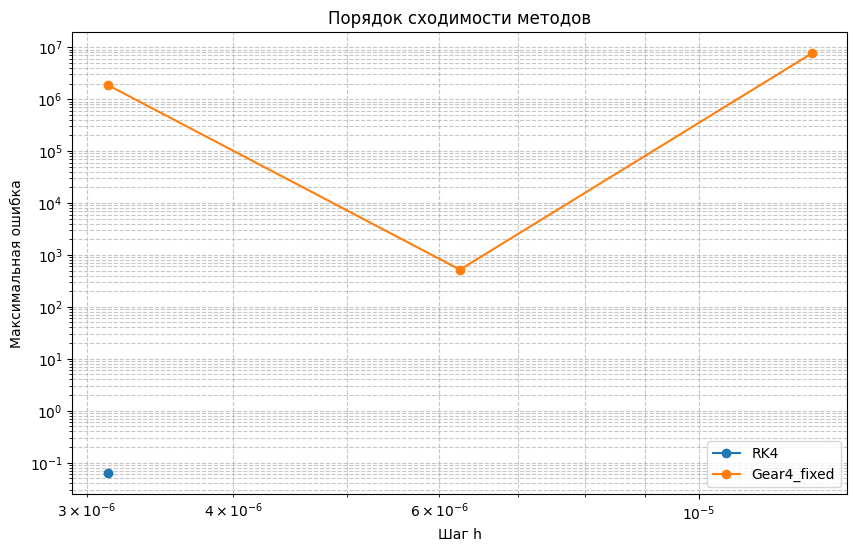

ITERATION 8 4
x0= 0.08 y0= 0.04
❌ rk4_solve: NaN или inf в решении (h=0.0001)
⚠️ RK4 при h=0.0001: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ pece4_solve: NaN или inf в решении (h=0.0001)
⚠️ PECE4 при h=0.0001: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ Gear4: расходимость на шаге 3, h=0.0001
❌ gear4_fixed_step: NaN или inf в решении (h=0.0001)
⚠️ Gear4_fixed при h=0.0001: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ rk4_solve: NaN или inf в решении (h=5e-05)
⚠️ RK4 при h=5e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ pece4_solve: NaN или inf в решении (h=5e-05)
⚠️ PECE4 при h=5e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ Gear4: расходимость на шаге 3, h=5e-05
❌ gear4_fixed_step: NaN или inf в решении (h=5e-05)
⚠️ Gear4_fixed при h=5e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ rk4_solve: NaN или inf в решении (h=2.5e-05)
⚠️ RK4 п

C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:7: RuntimeWarning: overflow encountered in scalar multiply
  dydt = y * (2 * a2 - 0.5 * y - 3.5 * (a2_reg**2) * x)
C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:6: RuntimeWarning: invalid value encountered in scalar multiply
  dxdt = x * (1 - 0.5 * x - (2/7) * (a2_reg**-2) * y)
C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:7: RuntimeWarning: overflow encountered in scalar power
  dydt = y * (2 * a2 - 0.5 * y - 3.5 * (a2_reg**2) * x)
C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:7: RuntimeWarning: invalid value encountered in scalar subtract
  dydt = y * (2 * a2 - 0.5 * y - 3.5 * (a2_reg**2) * x)
C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:8: RuntimeWarning: overflow encountered in scalar multiply
  da2dt = epsilon * (2 - 7 * a2 * x)
C:\Users\lilia\AppData\Local\Programs\Python\Python313\Lib\site-packages\numpy\linalg\_linalg.py:2792: RuntimeWarning: 

❌ pece4_solve: NaN или inf в решении (h=2.5e-05)
⚠️ PECE4 при h=2.5e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ Gear4: расходимость на шаге 3, h=2.5e-05
❌ gear4_fixed_step: переполнение (h=2.5e-05)
⚠️ Gear4_fixed при h=2.5e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ rk4_solve: NaN или inf в решении (h=1.25e-05)
⚠️ RK4 при h=1.25e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ pece4_solve: NaN или inf в решении (h=1.25e-05)
⚠️ PECE4 при h=1.25e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ Gear4: расходимость на шаге 3, h=1.25e-05
✅ gear4_fixed_step: успех, 4 шагов (h=1.25e-05)
❌ rk4_solve: NaN или inf в решении (h=6.25e-06)
⚠️ RK4 при h=6.25e-06: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ pece4_solve: NaN или inf в решении (h=6.25e-06)
⚠️ PECE4 при h=6.25e-06: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ Gear4: расходимость на шаге

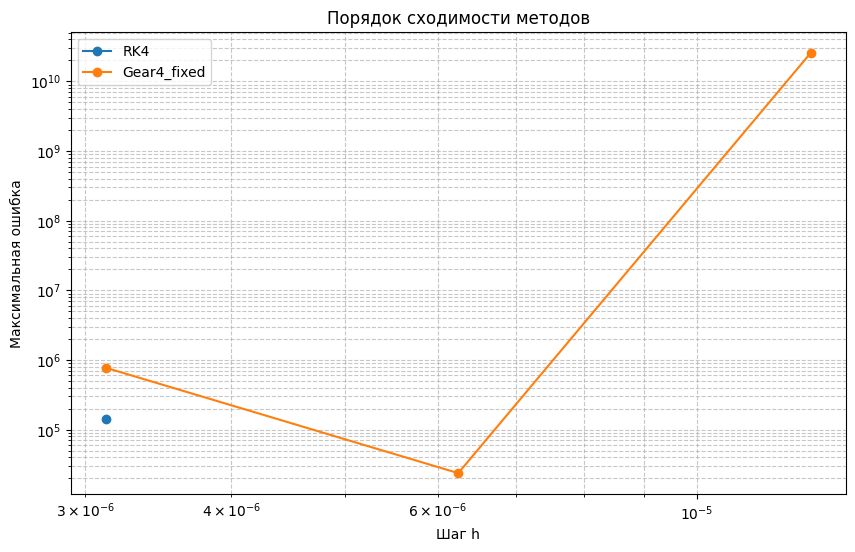

ITERATION 8 5
x0= 0.08 y0= 0.05
❌ rk4_solve: NaN или inf в решении (h=0.0001)
⚠️ RK4 при h=0.0001: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ pece4_solve: NaN или inf в решении (h=0.0001)
⚠️ PECE4 при h=0.0001: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ Gear4: расходимость на шаге 3, h=0.0001
❌ gear4_fixed_step: NaN или inf в решении (h=0.0001)
⚠️ Gear4_fixed при h=0.0001: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ rk4_solve: NaN или inf в решении (h=5e-05)
⚠️ RK4 при h=5e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ pece4_solve: NaN или inf в решении (h=5e-05)
⚠️ PECE4 при h=5e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ Gear4: расходимость на шаге 3, h=5e-05
❌ gear4_fixed_step: переполнение (h=5e-05)
⚠️ Gear4_fixed при h=5e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ rk4_solve: NaN или inf в решении (h=2.5e-05)
⚠️ RK4 при h=2.5e

C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:7: RuntimeWarning: overflow encountered in scalar multiply
  dydt = y * (2 * a2 - 0.5 * y - 3.5 * (a2_reg**2) * x)
C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:6: RuntimeWarning: invalid value encountered in scalar multiply
  dxdt = x * (1 - 0.5 * x - (2/7) * (a2_reg**-2) * y)
C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:7: RuntimeWarning: overflow encountered in scalar power
  dydt = y * (2 * a2 - 0.5 * y - 3.5 * (a2_reg**2) * x)
C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:7: RuntimeWarning: invalid value encountered in scalar subtract
  dydt = y * (2 * a2 - 0.5 * y - 3.5 * (a2_reg**2) * x)
C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:8: RuntimeWarning: overflow encountered in scalar multiply
  da2dt = epsilon * (2 - 7 * a2 * x)
C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\995573919.py:8: RuntimeWarning: invalid value encountered in add
  y_

❌ rk4_solve: NaN или inf в решении (h=1.25e-05)
⚠️ RK4 при h=1.25e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ pece4_solve: NaN или inf в решении (h=1.25e-05)
⚠️ PECE4 при h=1.25e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ Gear4: расходимость на шаге 3, h=1.25e-05
❌ gear4_fixed_step: переполнение (h=1.25e-05)
⚠️ Gear4_fixed при h=1.25e-05: operands could not be broadcast together with shapes (1,0) (1,3) 


C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3752895320.py:31: RuntimeWarning: invalid value encountered in scalar divide
  err = np.linalg.norm(y_next - y_new) / (1 + np.linalg.norm(y_new))


❌ rk4_solve: NaN или inf в решении (h=6.25e-06)
⚠️ RK4 при h=6.25e-06: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ pece4_solve: NaN или inf в решении (h=6.25e-06)
⚠️ PECE4 при h=6.25e-06: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ Gear4: расходимость на шаге 3, h=6.25e-06
✅ gear4_fixed_step: успех, 4 шагов (h=6.25e-06)
✅ rk4_solve: успех, 3201 шагов (h=3.125e-06)
❌ pece4_solve: NaN или inf в решении (h=3.125e-06)
⚠️ PECE4 при h=3.125e-06: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ Gear4: расходимость на шаге 3, h=3.125e-06
✅ gear4_fixed_step: успех, 4 шагов (h=3.125e-06)
          h           RK4  p_RK4  PECE4  p_PECE4    Gear4_fixed  p_Gear4_fixed
0  0.000100           NaN    NaN    NaN      NaN            NaN            NaN
1  0.000050           NaN    NaN    NaN      NaN            NaN            NaN
2  0.000025           NaN    NaN    NaN      NaN            NaN            NaN
3  0.000013           NaN    NaN

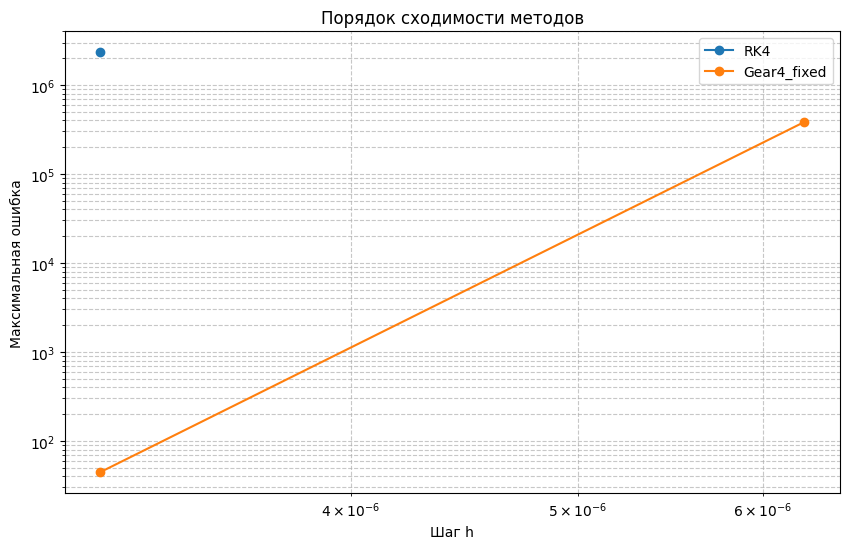

ITERATION 8 6
x0= 0.08 y0= 0.06
❌ rk4_solve: NaN или inf в решении (h=0.0001)
⚠️ RK4 при h=0.0001: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ pece4_solve: NaN или inf в решении (h=0.0001)
⚠️ PECE4 при h=0.0001: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ Gear4: расходимость на шаге 3, h=0.0001
❌ gear4_fixed_step: NaN или inf в решении (h=0.0001)
⚠️ Gear4_fixed при h=0.0001: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ rk4_solve: NaN или inf в решении (h=5e-05)
⚠️ RK4 при h=5e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ pece4_solve: NaN или inf в решении (h=5e-05)
⚠️ PECE4 при h=5e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ Gear4: расходимость на шаге 3, h=5e-05
❌ gear4_fixed_step: NaN или inf в решении (h=5e-05)
⚠️ Gear4_fixed при h=5e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ rk4_solve: NaN или inf в решении (h=2.5e-05)
⚠️ RK4 п

C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:7: RuntimeWarning: overflow encountered in scalar multiply
  dydt = y * (2 * a2 - 0.5 * y - 3.5 * (a2_reg**2) * x)
C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:6: RuntimeWarning: invalid value encountered in scalar multiply
  dxdt = x * (1 - 0.5 * x - (2/7) * (a2_reg**-2) * y)
C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:7: RuntimeWarning: overflow encountered in scalar power
  dydt = y * (2 * a2 - 0.5 * y - 3.5 * (a2_reg**2) * x)
C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:8: RuntimeWarning: overflow encountered in scalar multiply
  da2dt = epsilon * (2 - 7 * a2 * x)
C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:7: RuntimeWarning: invalid value encountered in scalar subtract
  dydt = y * (2 * a2 - 0.5 * y - 3.5 * (a2_reg**2) * x)
C:\Users\lilia\AppData\Local\Programs\Python\Python313\Lib\site-packages\numpy\linalg\_linalg.py:2792: RuntimeWarning: 

❌ Gear4: расходимость на шаге 3, h=2.5e-05
❌ gear4_fixed_step: переполнение (h=2.5e-05)
⚠️ Gear4_fixed при h=2.5e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ rk4_solve: NaN или inf в решении (h=1.25e-05)
⚠️ RK4 при h=1.25e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ pece4_solve: NaN или inf в решении (h=1.25e-05)
⚠️ PECE4 при h=1.25e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ Gear4: расходимость на шаге 3, h=1.25e-05
❌ gear4_fixed_step: переполнение (h=1.25e-05)
⚠️ Gear4_fixed при h=1.25e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ rk4_solve: NaN или inf в решении (h=6.25e-06)
⚠️ RK4 при h=6.25e-06: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ pece4_solve: NaN или inf в решении (h=6.25e-06)
⚠️ PECE4 при h=6.25e-06: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ Gear4: расходимость на шаге 3, h=6.25e-06
✅ gear4_fixed_step: успех, 4 

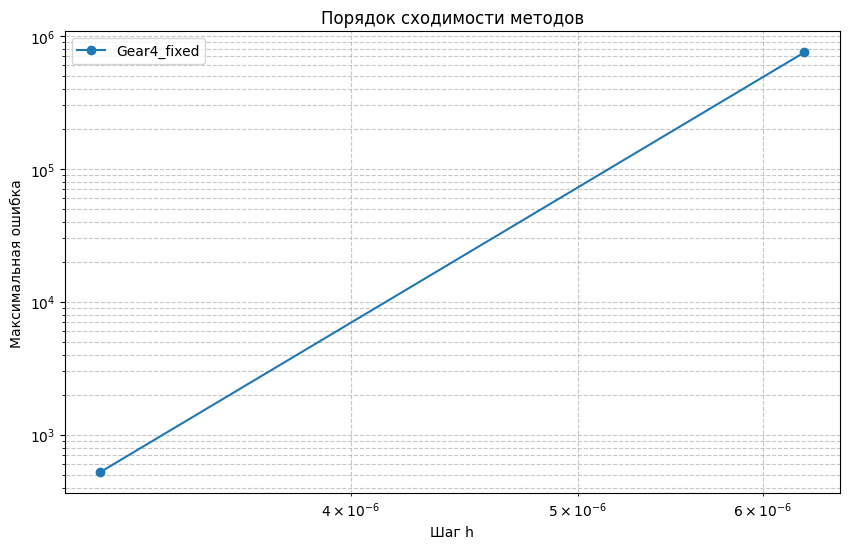

ITERATION 8 7
x0= 0.08 y0= 0.07
❌ rk4_solve: NaN или inf в решении (h=0.0001)
⚠️ RK4 при h=0.0001: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ pece4_solve: NaN или inf в решении (h=0.0001)
⚠️ PECE4 при h=0.0001: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ Gear4: расходимость на шаге 3, h=0.0001
❌ gear4_fixed_step: NaN или inf в решении (h=0.0001)
⚠️ Gear4_fixed при h=0.0001: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ rk4_solve: NaN или inf в решении (h=5e-05)
⚠️ RK4 при h=5e-05: operands could not be broadcast together with shapes (1,0) (1,3) 


C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:7: RuntimeWarning: overflow encountered in scalar multiply
  dydt = y * (2 * a2 - 0.5 * y - 3.5 * (a2_reg**2) * x)
C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:6: RuntimeWarning: invalid value encountered in scalar multiply
  dxdt = x * (1 - 0.5 * x - (2/7) * (a2_reg**-2) * y)
C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:7: RuntimeWarning: overflow encountered in scalar power
  dydt = y * (2 * a2 - 0.5 * y - 3.5 * (a2_reg**2) * x)
C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:7: RuntimeWarning: invalid value encountered in scalar subtract
  dydt = y * (2 * a2 - 0.5 * y - 3.5 * (a2_reg**2) * x)
C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:8: RuntimeWarning: overflow encountered in scalar multiply
  da2dt = epsilon * (2 - 7 * a2 * x)
C:\Users\lilia\AppData\Local\Programs\Python\Python313\Lib\site-packages\numpy\linalg\_linalg.py:2792: RuntimeWarning: 

❌ pece4_solve: NaN или inf в решении (h=5e-05)
⚠️ PECE4 при h=5e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ Gear4: расходимость на шаге 3, h=5e-05
❌ gear4_fixed_step: NaN или inf в решении (h=5e-05)
⚠️ Gear4_fixed при h=5e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ rk4_solve: NaN или inf в решении (h=2.5e-05)
⚠️ RK4 при h=2.5e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ pece4_solve: NaN или inf в решении (h=2.5e-05)
⚠️ PECE4 при h=2.5e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ Gear4: расходимость на шаге 3, h=2.5e-05
❌ gear4_fixed_step: переполнение (h=2.5e-05)
⚠️ Gear4_fixed при h=2.5e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ rk4_solve: NaN или inf в решении (h=1.25e-05)
⚠️ RK4 при h=1.25e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ pece4_solve: NaN или inf в решении (h=1.25e-05)
⚠️ PECE4 при h=1.25e-05: operands

C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\1111329400.py:11: RuntimeWarning: invalid value encountered in add
  return y + h/6 * (k1 + 2*k2 + 2*k3 + k4)


❌ rk4_solve: NaN или inf в решении (h=6.25e-06)
⚠️ RK4 при h=6.25e-06: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ pece4_solve: NaN или inf в решении (h=6.25e-06)
⚠️ PECE4 при h=6.25e-06: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ Gear4: расходимость на шаге 3, h=6.25e-06
✅ gear4_fixed_step: успех, 4 шагов (h=6.25e-06)
❌ rk4_solve: NaN или inf в решении (h=3.125e-06)
⚠️ RK4 при h=3.125e-06: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ pece4_solve: NaN или inf в решении (h=3.125e-06)
⚠️ PECE4 при h=3.125e-06: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ Gear4: расходимость на шаге 3, h=3.125e-06
✅ gear4_fixed_step: успех, 4 шагов (h=3.125e-06)
          h  RK4  p_RK4  PECE4  p_PECE4   Gear4_fixed  p_Gear4_fixed
0  0.000100  NaN    NaN    NaN      NaN           NaN            NaN
1  0.000050  NaN    NaN    NaN      NaN           NaN            NaN
2  0.000025  NaN    NaN    NaN      NaN        

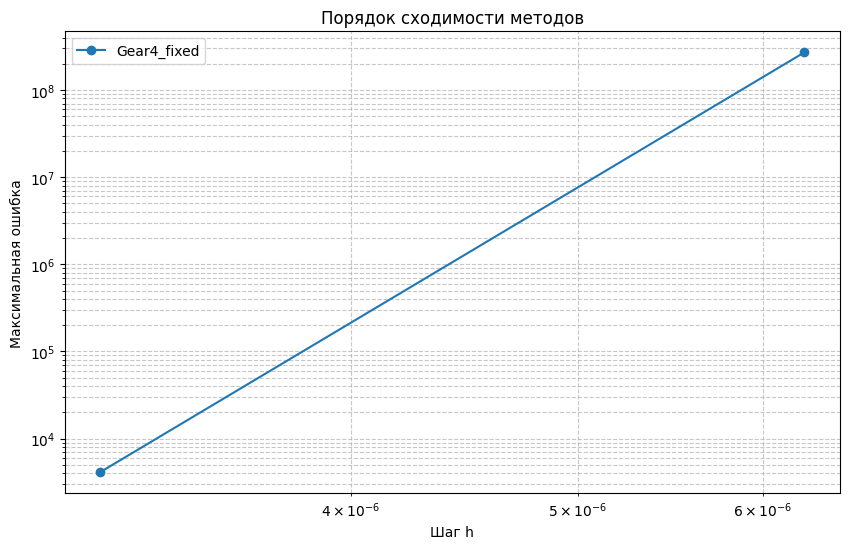

ITERATION 8 8
x0= 0.08 y0= 0.08
❌ rk4_solve: NaN или inf в решении (h=0.0001)
⚠️ RK4 при h=0.0001: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ pece4_solve: NaN или inf в решении (h=0.0001)
⚠️ PECE4 при h=0.0001: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ Gear4: расходимость на шаге 3, h=0.0001
❌ gear4_fixed_step: NaN или inf в решении (h=0.0001)
⚠️ Gear4_fixed при h=0.0001: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ rk4_solve: NaN или inf в решении (h=5e-05)
⚠️ RK4 при h=5e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ pece4_solve: NaN или inf в решении (h=5e-05)
⚠️ PECE4 при h=5e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ Gear4: расходимость на шаге 3, h=5e-05
❌ gear4_fixed_step: NaN или inf в решении (h=5e-05)
⚠️ Gear4_fixed при h=5e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ rk4_solve: NaN или inf в решении (h=2.5e-05)
⚠️ RK4 п

C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:7: RuntimeWarning: overflow encountered in scalar multiply
  dydt = y * (2 * a2 - 0.5 * y - 3.5 * (a2_reg**2) * x)
C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:7: RuntimeWarning: invalid value encountered in scalar subtract
  dydt = y * (2 * a2 - 0.5 * y - 3.5 * (a2_reg**2) * x)
C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:7: RuntimeWarning: overflow encountered in scalar power
  dydt = y * (2 * a2 - 0.5 * y - 3.5 * (a2_reg**2) * x)
C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:8: RuntimeWarning: overflow encountered in scalar multiply
  da2dt = epsilon * (2 - 7 * a2 * x)
C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\1111329400.py:7: RuntimeWarning: invalid value encountered in add
  k2 = f(t + h/2, y + h/2 * k1, epsilon)
C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\995573919.py:8: RuntimeWarning: invalid value encountered in add
  y_pred = y + h/24 * (55*f_v

❌ rk4_solve: NaN или inf в решении (h=1.25e-05)
⚠️ RK4 при h=1.25e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ pece4_solve: NaN или inf в решении (h=1.25e-05)
⚠️ PECE4 при h=1.25e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ Gear4: расходимость на шаге 3, h=1.25e-05
❌ gear4_fixed_step: переполнение (h=1.25e-05)
⚠️ Gear4_fixed при h=1.25e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ rk4_solve: NaN или inf в решении (h=6.25e-06)
⚠️ RK4 при h=6.25e-06: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ pece4_solve: NaN или inf в решении (h=6.25e-06)
⚠️ PECE4 при h=6.25e-06: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ Gear4: расходимость на шаге 3, h=6.25e-06
✅ gear4_fixed_step: успех, 4 шагов (h=6.25e-06)
❌ rk4_solve: NaN или inf в решении (h=3.125e-06)
⚠️ RK4 при h=3.125e-06: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ pece4_solve: NaN или inf

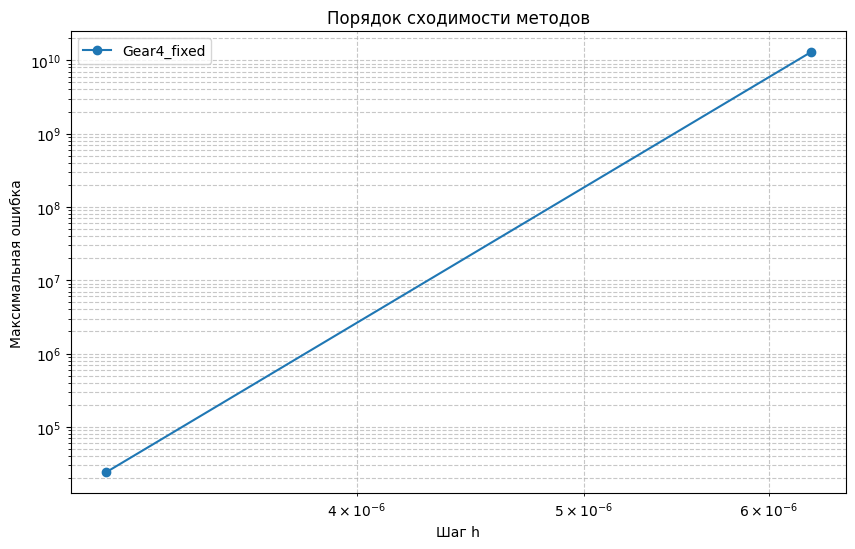

ITERATION 8 9
x0= 0.08 y0= 0.09
❌ rk4_solve: NaN или inf в решении (h=0.0001)
⚠️ RK4 при h=0.0001: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ pece4_solve: NaN или inf в решении (h=0.0001)
⚠️ PECE4 при h=0.0001: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ Gear4: расходимость на шаге 3, h=0.0001
❌ gear4_fixed_step: NaN или inf в решении (h=0.0001)
⚠️ Gear4_fixed при h=0.0001: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ rk4_solve: NaN или inf в решении (h=5e-05)
⚠️ RK4 при h=5e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ pece4_solve: NaN или inf в решении (h=5e-05)
⚠️ PECE4 при h=5e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ Gear4: расходимость на шаге 3, h=5e-05
❌ gear4_fixed_step: NaN или inf в решении (h=5e-05)
⚠️ Gear4_fixed при h=5e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ rk4_solve: NaN или inf в решении (h=2.5e-05)
⚠️ RK4 п

C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:7: RuntimeWarning: overflow encountered in scalar multiply
  dydt = y * (2 * a2 - 0.5 * y - 3.5 * (a2_reg**2) * x)
C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:7: RuntimeWarning: invalid value encountered in scalar subtract
  dydt = y * (2 * a2 - 0.5 * y - 3.5 * (a2_reg**2) * x)
C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:8: RuntimeWarning: overflow encountered in scalar multiply
  da2dt = epsilon * (2 - 7 * a2 * x)
C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\1111329400.py:11: RuntimeWarning: invalid value encountered in add
  return y + h/6 * (k1 + 2*k2 + 2*k3 + k4)
C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:6: RuntimeWarning: invalid value encountered in scalar multiply
  dxdt = x * (1 - 0.5 * x - (2/7) * (a2_reg**-2) * y)
C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:7: RuntimeWarning: overflow encountered in scalar power
  dydt = y * (2

❌ rk4_solve: NaN или inf в решении (h=1.25e-05)
⚠️ RK4 при h=1.25e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ pece4_solve: NaN или inf в решении (h=1.25e-05)
⚠️ PECE4 при h=1.25e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ Gear4: расходимость на шаге 3, h=1.25e-05
❌ gear4_fixed_step: переполнение (h=1.25e-05)
⚠️ Gear4_fixed при h=1.25e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ rk4_solve: NaN или inf в решении (h=6.25e-06)
⚠️ RK4 при h=6.25e-06: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ pece4_solve: NaN или inf в решении (h=6.25e-06)
⚠️ PECE4 при h=6.25e-06: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ Gear4: расходимость на шаге 3, h=6.25e-06
✅ gear4_fixed_step: успех, 4 шагов (h=6.25e-06)
❌ rk4_solve: NaN или inf в решении (h=3.125e-06)
⚠️ RK4 при h=3.125e-06: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ pece4_solve: NaN или inf

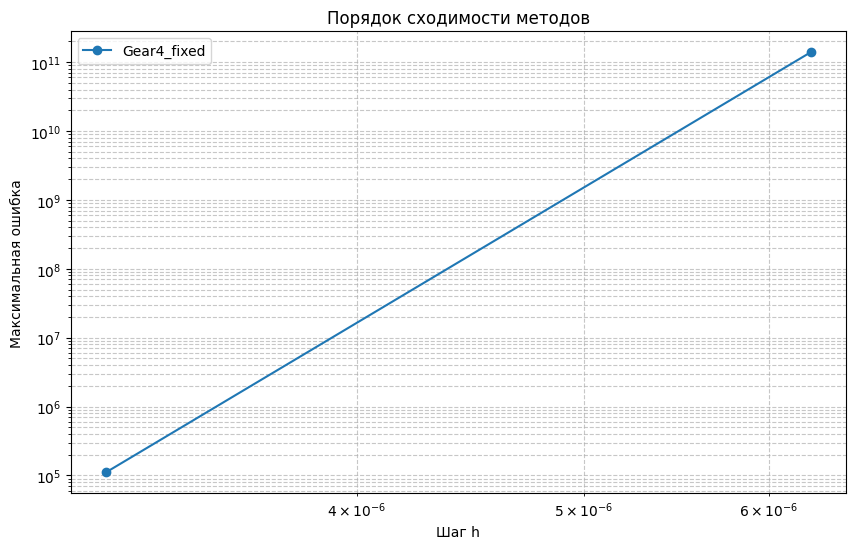

ITERATION 9 0
x0= 0.09 y0= 0.0
✅ rk4_solve: успех, 101 шагов (h=0.0001)
✅ pece4_solve: успех, 101 шагов (h=0.0001)
✅ gear4_fixed_step: успех, 101 шагов (h=0.0001)
✅ rk4_solve: успех, 201 шагов (h=5e-05)
✅ pece4_solve: успех, 201 шагов (h=5e-05)
✅ gear4_fixed_step: успех, 201 шагов (h=5e-05)
✅ rk4_solve: успех, 401 шагов (h=2.5e-05)
✅ pece4_solve: успех, 401 шагов (h=2.5e-05)
✅ gear4_fixed_step: успех, 401 шагов (h=2.5e-05)
✅ rk4_solve: успех, 801 шагов (h=1.25e-05)
✅ pece4_solve: успех, 801 шагов (h=1.25e-05)
✅ gear4_fixed_step: успех, 801 шагов (h=1.25e-05)
✅ rk4_solve: успех, 1601 шагов (h=6.25e-06)
✅ pece4_solve: успех, 1601 шагов (h=6.25e-06)
✅ gear4_fixed_step: успех, 1601 шагов (h=6.25e-06)
✅ rk4_solve: успех, 3201 шагов (h=3.125e-06)
✅ pece4_solve: успех, 3201 шагов (h=3.125e-06)
✅ gear4_fixed_step: успех, 3201 шагов (h=3.125e-06)
          h           RK4  p_RK4         PECE4  p_PECE4   Gear4_fixed  p_Gear4_fixed
0  0.000100  3.666034e-10    NaN  3.666034e-10      NaN  3.681724

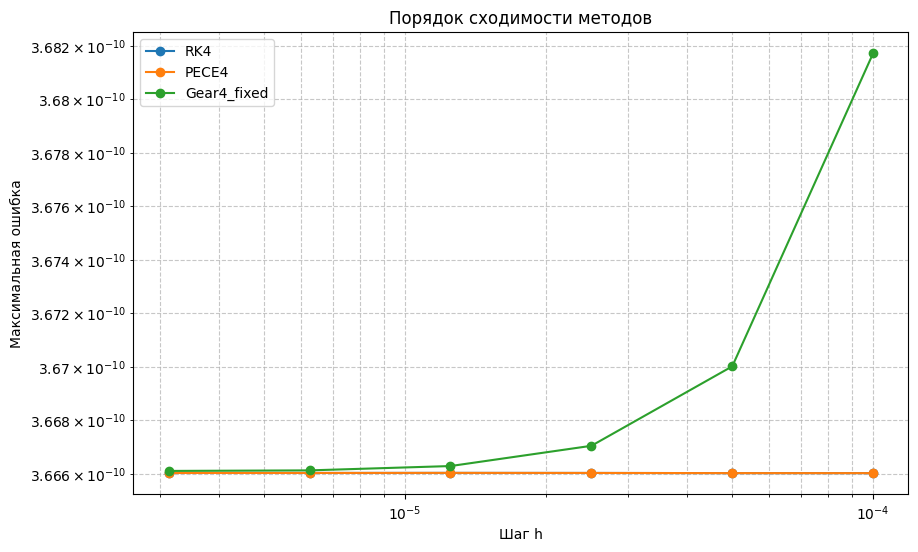

ITERATION 9 1
x0= 0.09 y0= 0.01
❌ rk4_solve: NaN или inf в решении (h=0.0001)
⚠️ RK4 при h=0.0001: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ pece4_solve: NaN или inf в решении (h=0.0001)
⚠️ PECE4 при h=0.0001: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ Gear4: расходимость на шаге 3, h=0.0001
❌ gear4_fixed_step: переполнение (h=0.0001)
⚠️ Gear4_fixed при h=0.0001: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ rk4_solve: NaN или inf в решении (h=5e-05)
⚠️ RK4 при h=5e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ pece4_solve: NaN или inf в решении (h=5e-05)
⚠️ PECE4 при h=5e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ Gear4: расходимость на шаге 3, h=5e-05
❌ gear4_fixed_step: переполнение (h=5e-05)
⚠️ Gear4_fixed при h=5e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ rk4_solve: NaN или inf в решении (h=2.5e-05)
⚠️ RK4 при h=2.5e-05: oper

C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:7: RuntimeWarning: overflow encountered in scalar multiply
  dydt = y * (2 * a2 - 0.5 * y - 3.5 * (a2_reg**2) * x)
C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:7: RuntimeWarning: invalid value encountered in scalar subtract
  dydt = y * (2 * a2 - 0.5 * y - 3.5 * (a2_reg**2) * x)
C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:7: RuntimeWarning: overflow encountered in scalar power
  dydt = y * (2 * a2 - 0.5 * y - 3.5 * (a2_reg**2) * x)
C:\Users\lilia\AppData\Local\Programs\Python\Python313\Lib\site-packages\numpy\linalg\_linalg.py:2792: RuntimeWarning: overflow encountered in dot
  sqnorm = x.dot(x)
C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:6: RuntimeWarning: invalid value encountered in scalar multiply
  dxdt = x * (1 - 0.5 * x - (2/7) * (a2_reg**-2) * y)
C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:8: RuntimeWarning: overflow encountered in scala

✅ rk4_solve: успех, 801 шагов (h=1.25e-05)
❌ pece4_solve: NaN или inf в решении (h=1.25e-05)
⚠️ PECE4 при h=1.25e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ Gear4: расходимость на шаге 4, h=1.25e-05
✅ gear4_fixed_step: успех, 5 шагов (h=1.25e-05)
✅ rk4_solve: успех, 1601 шагов (h=6.25e-06)
✅ pece4_solve: успех, 1601 шагов (h=6.25e-06)
✅ gear4_fixed_step: успех, 1601 шагов (h=6.25e-06)
✅ rk4_solve: успех, 3201 шагов (h=3.125e-06)
✅ pece4_solve: успех, 3201 шагов (h=3.125e-06)
✅ gear4_fixed_step: успех, 3201 шагов (h=3.125e-06)
          h           RK4  p_RK4          PECE4  p_PECE4    Gear4_fixed  p_Gear4_fixed
0  0.000100           NaN    NaN            NaN      NaN            NaN            NaN
1  0.000050           NaN    NaN            NaN      NaN            NaN            NaN
2  0.000025           NaN    NaN            NaN      NaN   25097.932463            NaN
3  0.000013  33552.626065    NaN            NaN      NaN  224545.484125          -3.16
4  0

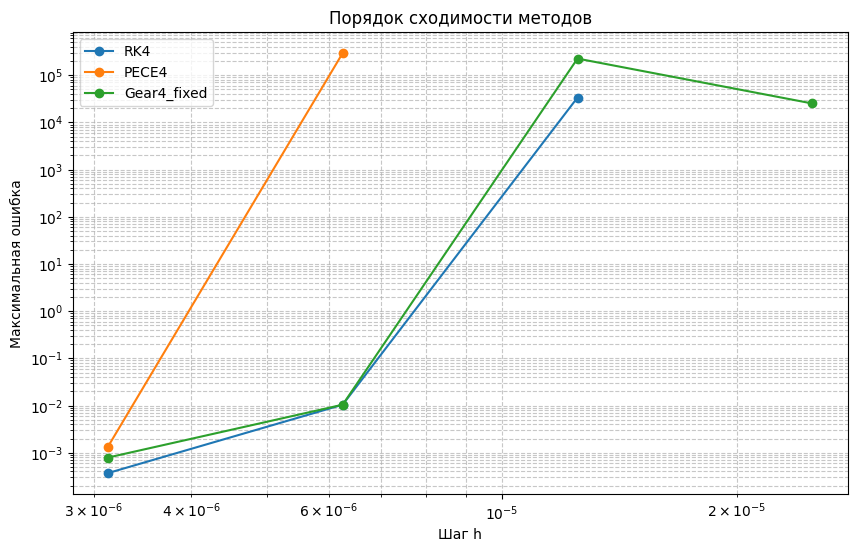

ITERATION 9 2
x0= 0.09 y0= 0.02
❌ rk4_solve: NaN или inf в решении (h=0.0001)
⚠️ RK4 при h=0.0001: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ pece4_solve: NaN или inf в решении (h=0.0001)
⚠️ PECE4 при h=0.0001: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ Gear4: расходимость на шаге 3, h=0.0001
❌ gear4_fixed_step: переполнение (h=0.0001)
⚠️ Gear4_fixed при h=0.0001: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ rk4_solve: NaN или inf в решении (h=5e-05)
⚠️ RK4 при h=5e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ pece4_solve: NaN или inf в решении (h=5e-05)
⚠️ PECE4 при h=5e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ Gear4: расходимость на шаге 3, h=5e-05
❌ gear4_fixed_step: переполнение (h=5e-05)
⚠️ Gear4_fixed при h=5e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ rk4_solve: NaN или inf в решении (h=2.5e-05)
⚠️ RK4 при h=2.5e-05: oper

C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:7: RuntimeWarning: overflow encountered in scalar multiply
  dydt = y * (2 * a2 - 0.5 * y - 3.5 * (a2_reg**2) * x)
C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:6: RuntimeWarning: invalid value encountered in scalar multiply
  dxdt = x * (1 - 0.5 * x - (2/7) * (a2_reg**-2) * y)
C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:7: RuntimeWarning: overflow encountered in scalar power
  dydt = y * (2 * a2 - 0.5 * y - 3.5 * (a2_reg**2) * x)
C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:7: RuntimeWarning: invalid value encountered in scalar subtract
  dydt = y * (2 * a2 - 0.5 * y - 3.5 * (a2_reg**2) * x)
C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:8: RuntimeWarning: overflow encountered in scalar multiply
  da2dt = epsilon * (2 - 7 * a2 * x)
C:\Users\lilia\AppData\Local\Programs\Python\Python313\Lib\site-packages\numpy\linalg\_linalg.py:2792: RuntimeWarning: 

❌ rk4_solve: NaN или inf в решении (h=1.25e-05)
⚠️ RK4 при h=1.25e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ pece4_solve: NaN или inf в решении (h=1.25e-05)
⚠️ PECE4 при h=1.25e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ Gear4: расходимость на шаге 3, h=1.25e-05
✅ gear4_fixed_step: успех, 4 шагов (h=1.25e-05)
✅ rk4_solve: успех, 1601 шагов (h=6.25e-06)
❌ pece4_solve: NaN или inf в решении (h=6.25e-06)
⚠️ PECE4 при h=6.25e-06: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ Gear4: расходимость на шаге 4, h=6.25e-06
✅ gear4_fixed_step: успех, 5 шагов (h=6.25e-06)
✅ rk4_solve: успех, 3201 шагов (h=3.125e-06)
✅ pece4_solve: успех, 3201 шагов (h=3.125e-06)
✅ gear4_fixed_step: успех, 3201 шагов (h=3.125e-06)
          h           RK4  p_RK4          PECE4  p_PECE4   Gear4_fixed  p_Gear4_fixed
0  0.000100           NaN    NaN            NaN      NaN           NaN            NaN
1  0.000050           NaN    NaN     

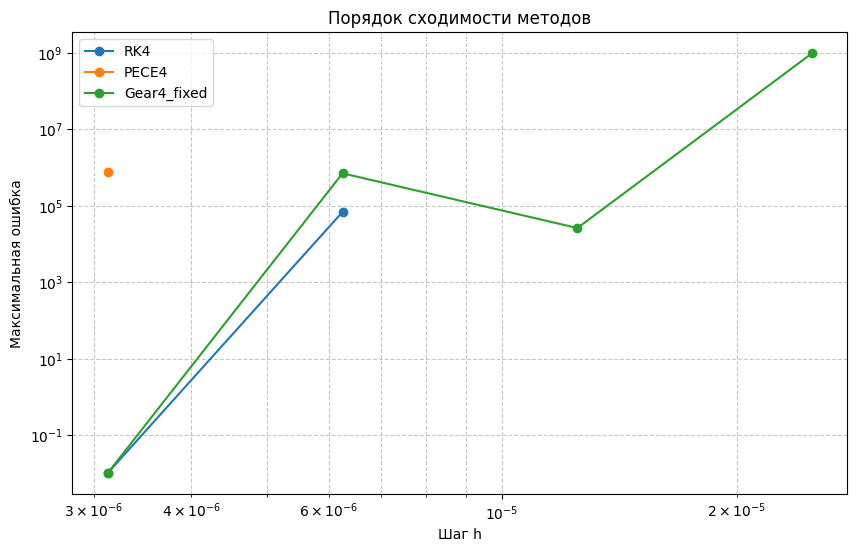

ITERATION 9 3
x0= 0.09 y0= 0.03
❌ rk4_solve: NaN или inf в решении (h=0.0001)
⚠️ RK4 при h=0.0001: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ pece4_solve: NaN или inf в решении (h=0.0001)
⚠️ PECE4 при h=0.0001: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ Gear4: расходимость на шаге 3, h=0.0001
❌ gear4_fixed_step: NaN или inf в решении (h=0.0001)
⚠️ Gear4_fixed при h=0.0001: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ rk4_solve: NaN или inf в решении (h=5e-05)
⚠️ RK4 при h=5e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ pece4_solve: NaN или inf в решении (h=5e-05)
⚠️ PECE4 при h=5e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ Gear4: расходимость на шаге 3, h=5e-05
❌ gear4_fixed_step: переполнение (h=5e-05)
⚠️ Gear4_fixed при h=5e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ rk4_solve: NaN или inf в решении (h=2.5e-05)
⚠️ RK4 при h=2.5e

C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:7: RuntimeWarning: overflow encountered in scalar multiply
  dydt = y * (2 * a2 - 0.5 * y - 3.5 * (a2_reg**2) * x)
C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:7: RuntimeWarning: invalid value encountered in scalar subtract
  dydt = y * (2 * a2 - 0.5 * y - 3.5 * (a2_reg**2) * x)
C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:7: RuntimeWarning: overflow encountered in scalar power
  dydt = y * (2 * a2 - 0.5 * y - 3.5 * (a2_reg**2) * x)
C:\Users\lilia\AppData\Local\Programs\Python\Python313\Lib\site-packages\numpy\linalg\_linalg.py:2792: RuntimeWarning: overflow encountered in dot
  sqnorm = x.dot(x)
C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:6: RuntimeWarning: invalid value encountered in scalar multiply
  dxdt = x * (1 - 0.5 * x - (2/7) * (a2_reg**-2) * y)
C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:8: RuntimeWarning: overflow encountered in scala

❌ rk4_solve: NaN или inf в решении (h=1.25e-05)
⚠️ RK4 при h=1.25e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ pece4_solve: NaN или inf в решении (h=1.25e-05)
⚠️ PECE4 при h=1.25e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ Gear4: расходимость на шаге 3, h=1.25e-05
✅ gear4_fixed_step: успех, 4 шагов (h=1.25e-05)
❌ rk4_solve: NaN или inf в решении (h=6.25e-06)
⚠️ RK4 при h=6.25e-06: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ pece4_solve: NaN или inf в решении (h=6.25e-06)
⚠️ PECE4 при h=6.25e-06: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ Gear4: расходимость на шаге 3, h=6.25e-06
✅ gear4_fixed_step: успех, 4 шагов (h=6.25e-06)
✅ rk4_solve: успех, 3201 шагов (h=3.125e-06)
❌ pece4_solve: NaN или inf в решении (h=3.125e-06)
⚠️ PECE4 при h=3.125e-06: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ Gear4: расходимость на шаге 7, h=3.125e-06
✅ gear4_fixed_step: успех, 

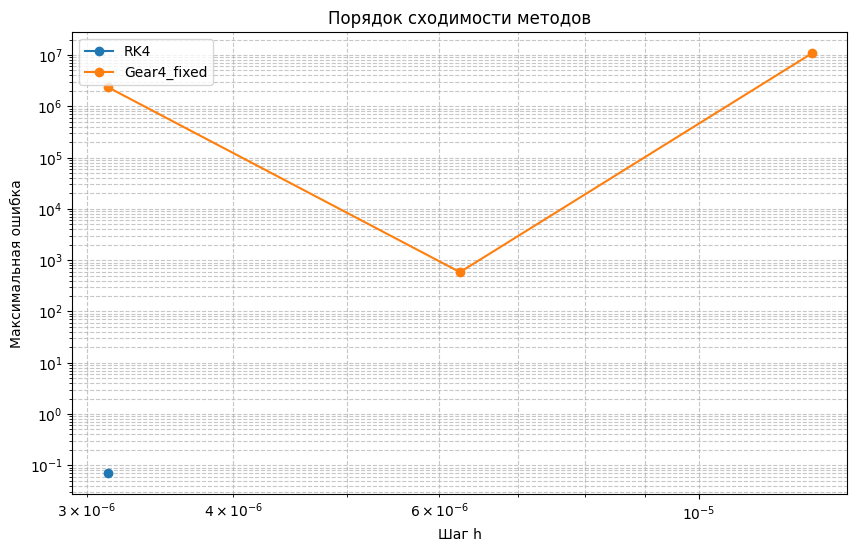

ITERATION 9 4
x0= 0.09 y0= 0.04
❌ rk4_solve: NaN или inf в решении (h=0.0001)
⚠️ RK4 при h=0.0001: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ pece4_solve: NaN или inf в решении (h=0.0001)
⚠️ PECE4 при h=0.0001: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ Gear4: расходимость на шаге 3, h=0.0001
❌ gear4_fixed_step: NaN или inf в решении (h=0.0001)
⚠️ Gear4_fixed при h=0.0001: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ rk4_solve: NaN или inf в решении (h=5e-05)
⚠️ RK4 при h=5e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ pece4_solve: NaN или inf в решении (h=5e-05)
⚠️ PECE4 при h=5e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ Gear4: расходимость на шаге 3, h=5e-05
❌ gear4_fixed_step: NaN или inf в решении (h=5e-05)
⚠️ Gear4_fixed при h=5e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ rk4_solve: NaN или inf в решении (h=2.5e-05)
⚠️ RK4 п

C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:7: RuntimeWarning: overflow encountered in scalar multiply
  dydt = y * (2 * a2 - 0.5 * y - 3.5 * (a2_reg**2) * x)
C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:6: RuntimeWarning: invalid value encountered in scalar multiply
  dxdt = x * (1 - 0.5 * x - (2/7) * (a2_reg**-2) * y)
C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:7: RuntimeWarning: overflow encountered in scalar power
  dydt = y * (2 * a2 - 0.5 * y - 3.5 * (a2_reg**2) * x)
C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:7: RuntimeWarning: invalid value encountered in scalar subtract
  dydt = y * (2 * a2 - 0.5 * y - 3.5 * (a2_reg**2) * x)
C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:8: RuntimeWarning: overflow encountered in scalar multiply
  da2dt = epsilon * (2 - 7 * a2 * x)
C:\Users\lilia\AppData\Local\Programs\Python\Python313\Lib\site-packages\numpy\linalg\_linalg.py:2792: RuntimeWarning: 

❌ rk4_solve: NaN или inf в решении (h=1.25e-05)
⚠️ RK4 при h=1.25e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ pece4_solve: NaN или inf в решении (h=1.25e-05)
⚠️ PECE4 при h=1.25e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ Gear4: расходимость на шаге 3, h=1.25e-05
✅ gear4_fixed_step: успех, 4 шагов (h=1.25e-05)
❌ rk4_solve: NaN или inf в решении (h=6.25e-06)
⚠️ RK4 при h=6.25e-06: operands could not be broadcast together with shapes (1,0) (1,3) 


C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\1111329400.py:7: RuntimeWarning: invalid value encountered in add
  k2 = f(t + h/2, y + h/2 * k1, epsilon)


❌ pece4_solve: NaN или inf в решении (h=6.25e-06)
⚠️ PECE4 при h=6.25e-06: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ Gear4: расходимость на шаге 3, h=6.25e-06
✅ gear4_fixed_step: успех, 4 шагов (h=6.25e-06)
✅ rk4_solve: успех, 3201 шагов (h=3.125e-06)
❌ pece4_solve: NaN или inf в решении (h=3.125e-06)
⚠️ PECE4 при h=3.125e-06: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ Gear4: расходимость на шаге 4, h=3.125e-06
✅ gear4_fixed_step: успех, 5 шагов (h=3.125e-06)
          h            RK4  p_RK4  PECE4  p_PECE4   Gear4_fixed  p_Gear4_fixed
0  0.000100            NaN    NaN    NaN      NaN           NaN            NaN
1  0.000050            NaN    NaN    NaN      NaN           NaN            NaN
2  0.000025            NaN    NaN    NaN      NaN           NaN            NaN
3  0.000013            NaN    NaN    NaN      NaN  2.885387e+10            NaN
4  0.000006            NaN    NaN    NaN      NaN  2.665140e+04          20.05
5  0.000003

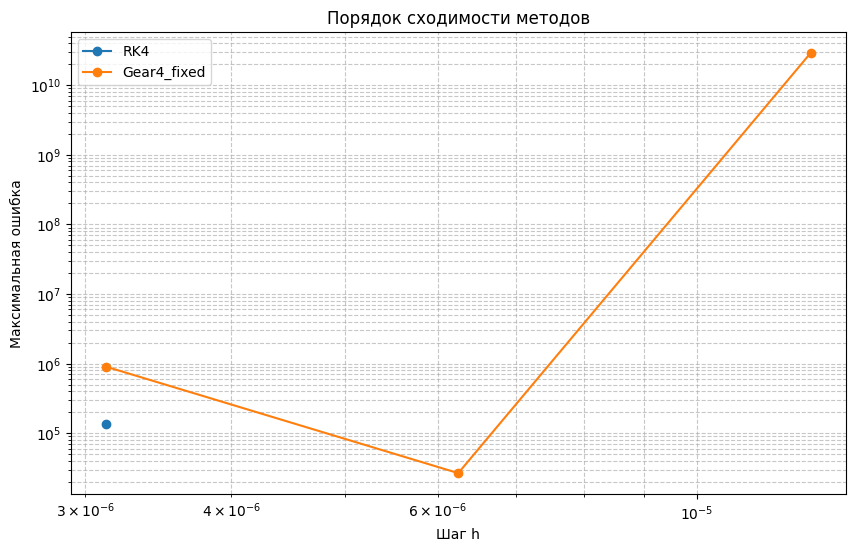

ITERATION 9 5
x0= 0.09 y0= 0.05
❌ rk4_solve: NaN или inf в решении (h=0.0001)
⚠️ RK4 при h=0.0001: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ pece4_solve: NaN или inf в решении (h=0.0001)
⚠️ PECE4 при h=0.0001: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ Gear4: расходимость на шаге 3, h=0.0001
❌ gear4_fixed_step: NaN или inf в решении (h=0.0001)
⚠️ Gear4_fixed при h=0.0001: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ rk4_solve: NaN или inf в решении (h=5e-05)
⚠️ RK4 при h=5e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ pece4_solve: NaN или inf в решении (h=5e-05)
⚠️ PECE4 при h=5e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ Gear4: расходимость на шаге 3, h=5e-05
❌ gear4_fixed_step: NaN или inf в решении (h=5e-05)
⚠️ Gear4_fixed при h=5e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ rk4_solve: NaN или inf в решении (h=2.5e-05)
⚠️ RK4 п

C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:7: RuntimeWarning: overflow encountered in scalar multiply
  dydt = y * (2 * a2 - 0.5 * y - 3.5 * (a2_reg**2) * x)
C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:6: RuntimeWarning: invalid value encountered in scalar multiply
  dxdt = x * (1 - 0.5 * x - (2/7) * (a2_reg**-2) * y)
C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:7: RuntimeWarning: overflow encountered in scalar power
  dydt = y * (2 * a2 - 0.5 * y - 3.5 * (a2_reg**2) * x)
C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:7: RuntimeWarning: invalid value encountered in scalar subtract
  dydt = y * (2 * a2 - 0.5 * y - 3.5 * (a2_reg**2) * x)
C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:8: RuntimeWarning: overflow encountered in scalar multiply
  da2dt = epsilon * (2 - 7 * a2 * x)
C:\Users\lilia\AppData\Local\Programs\Python\Python313\Lib\site-packages\numpy\linalg\_linalg.py:2792: RuntimeWarning: 

❌ rk4_solve: NaN или inf в решении (h=1.25e-05)
⚠️ RK4 при h=1.25e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ pece4_solve: NaN или inf в решении (h=1.25e-05)
⚠️ PECE4 при h=1.25e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ Gear4: расходимость на шаге 3, h=1.25e-05
❌ gear4_fixed_step: переполнение (h=1.25e-05)
⚠️ Gear4_fixed при h=1.25e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ rk4_solve: NaN или inf в решении (h=6.25e-06)
⚠️ RK4 при h=6.25e-06: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ pece4_solve: NaN или inf в решении (h=6.25e-06)
⚠️ PECE4 при h=6.25e-06: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ Gear4: расходимость на шаге 3, h=6.25e-06
✅ gear4_fixed_step: успех, 4 шагов (h=6.25e-06)
✅ rk4_solve: успех, 3201 шагов (h=3.125e-06)
❌ pece4_solve: NaN или inf в решении (h=3.125e-06)
⚠️ PECE4 при h=3.125e-06: operands could not be broadcast together wi

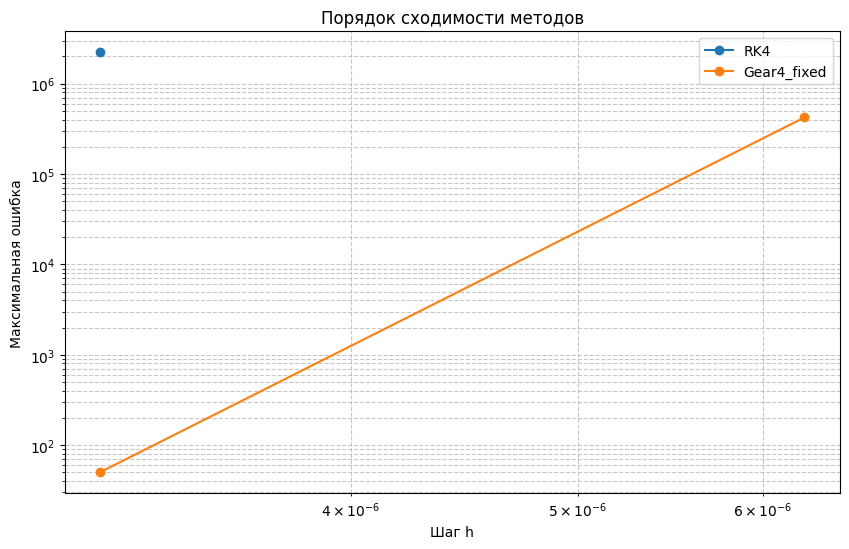

ITERATION 9 6
x0= 0.09 y0= 0.06
❌ rk4_solve: NaN или inf в решении (h=0.0001)
⚠️ RK4 при h=0.0001: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ pece4_solve: NaN или inf в решении (h=0.0001)
⚠️ PECE4 при h=0.0001: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ Gear4: расходимость на шаге 3, h=0.0001
❌ gear4_fixed_step: NaN или inf в решении (h=0.0001)
⚠️ Gear4_fixed при h=0.0001: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ rk4_solve: NaN или inf в решении (h=5e-05)
⚠️ RK4 при h=5e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ pece4_solve: NaN или inf в решении (h=5e-05)
⚠️ PECE4 при h=5e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ Gear4: расходимость на шаге 3, h=5e-05
❌ gear4_fixed_step: NaN или inf в решении (h=5e-05)
⚠️ Gear4_fixed при h=5e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ rk4_solve: NaN или inf в решении (h=2.5e-05)
⚠️ RK4 п

C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:7: RuntimeWarning: overflow encountered in scalar multiply
  dydt = y * (2 * a2 - 0.5 * y - 3.5 * (a2_reg**2) * x)
C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:6: RuntimeWarning: invalid value encountered in scalar multiply
  dxdt = x * (1 - 0.5 * x - (2/7) * (a2_reg**-2) * y)
C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:7: RuntimeWarning: overflow encountered in scalar power
  dydt = y * (2 * a2 - 0.5 * y - 3.5 * (a2_reg**2) * x)
C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:8: RuntimeWarning: overflow encountered in scalar multiply
  da2dt = epsilon * (2 - 7 * a2 * x)
C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:7: RuntimeWarning: invalid value encountered in scalar subtract
  dydt = y * (2 * a2 - 0.5 * y - 3.5 * (a2_reg**2) * x)
C:\Users\lilia\AppData\Local\Programs\Python\Python313\Lib\site-packages\numpy\linalg\_linalg.py:2792: RuntimeWarning: 

❌ rk4_solve: NaN или inf в решении (h=1.25e-05)
⚠️ RK4 при h=1.25e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ pece4_solve: NaN или inf в решении (h=1.25e-05)
⚠️ PECE4 при h=1.25e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ Gear4: расходимость на шаге 3, h=1.25e-05
❌ gear4_fixed_step: переполнение (h=1.25e-05)
⚠️ Gear4_fixed при h=1.25e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ rk4_solve: NaN или inf в решении (h=6.25e-06)
⚠️ RK4 при h=6.25e-06: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ pece4_solve: NaN или inf в решении (h=6.25e-06)
⚠️ PECE4 при h=6.25e-06: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ Gear4: расходимость на шаге 3, h=6.25e-06
✅ gear4_fixed_step: успех, 4 шагов (h=6.25e-06)


C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\1111329400.py:11: RuntimeWarning: invalid value encountered in add
  return y + h/6 * (k1 + 2*k2 + 2*k3 + k4)


❌ rk4_solve: NaN или inf в решении (h=3.125e-06)
⚠️ RK4 при h=3.125e-06: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ pece4_solve: NaN или inf в решении (h=3.125e-06)
⚠️ PECE4 при h=3.125e-06: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ Gear4: расходимость на шаге 3, h=3.125e-06
✅ gear4_fixed_step: успех, 4 шагов (h=3.125e-06)
          h  RK4  p_RK4  PECE4  p_PECE4   Gear4_fixed  p_Gear4_fixed
0  0.000100  NaN    NaN    NaN      NaN           NaN            NaN
1  0.000050  NaN    NaN    NaN      NaN           NaN            NaN
2  0.000025  NaN    NaN    NaN      NaN           NaN            NaN
3  0.000013  NaN    NaN    NaN      NaN           NaN            NaN
4  0.000006  NaN    NaN    NaN      NaN  1.743589e+06            NaN
5  0.000003  NaN    NaN    NaN      NaN  5.855587e+02          11.54


C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\995573919.py:14: RuntimeWarning: overflow encountered in multiply
  y_corr = y + h/24 * (9*f_pred + 19*f_vals[3] - 5*f_vals[2] + f_vals[1])


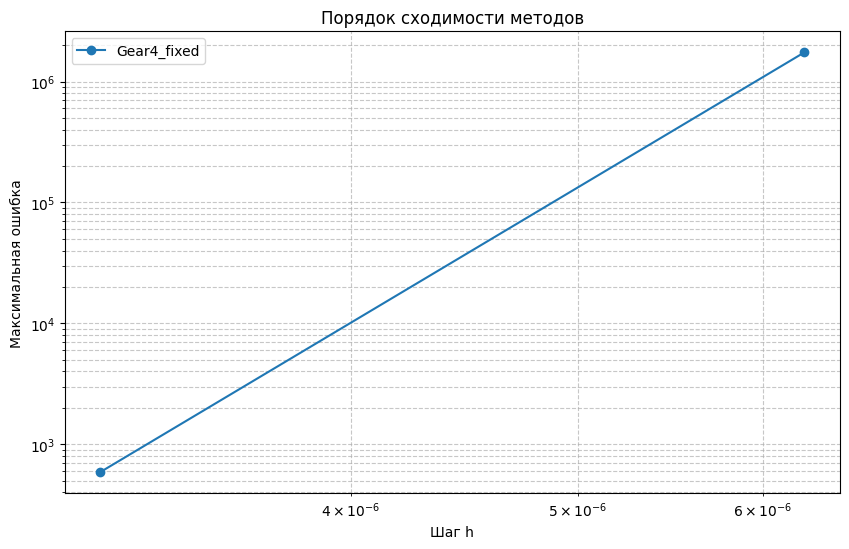

ITERATION 9 7
x0= 0.09 y0= 0.07
❌ rk4_solve: NaN или inf в решении (h=0.0001)
⚠️ RK4 при h=0.0001: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ pece4_solve: NaN или inf в решении (h=0.0001)
⚠️ PECE4 при h=0.0001: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ Gear4: расходимость на шаге 3, h=0.0001
❌ gear4_fixed_step: NaN или inf в решении (h=0.0001)
⚠️ Gear4_fixed при h=0.0001: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ rk4_solve: NaN или inf в решении (h=5e-05)
⚠️ RK4 при h=5e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ pece4_solve: NaN или inf в решении (h=5e-05)
⚠️ PECE4 при h=5e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ Gear4: расходимость на шаге 3, h=5e-05
❌ gear4_fixed_step: NaN или inf в решении (h=5e-05)
⚠️ Gear4_fixed при h=5e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ rk4_solve: NaN или inf в решении (h=2.5e-05)
⚠️ RK4 п

C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:7: RuntimeWarning: overflow encountered in scalar multiply
  dydt = y * (2 * a2 - 0.5 * y - 3.5 * (a2_reg**2) * x)
C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:7: RuntimeWarning: invalid value encountered in scalar subtract
  dydt = y * (2 * a2 - 0.5 * y - 3.5 * (a2_reg**2) * x)
C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:7: RuntimeWarning: overflow encountered in scalar power
  dydt = y * (2 * a2 - 0.5 * y - 3.5 * (a2_reg**2) * x)
C:\Users\lilia\AppData\Local\Programs\Python\Python313\Lib\site-packages\numpy\linalg\_linalg.py:2792: RuntimeWarning: overflow encountered in dot
  sqnorm = x.dot(x)
C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:6: RuntimeWarning: invalid value encountered in scalar multiply
  dxdt = x * (1 - 0.5 * x - (2/7) * (a2_reg**-2) * y)
C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:8: RuntimeWarning: overflow encountered in scala

❌ rk4_solve: NaN или inf в решении (h=1.25e-05)
⚠️ RK4 при h=1.25e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ pece4_solve: NaN или inf в решении (h=1.25e-05)
⚠️ PECE4 при h=1.25e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ Gear4: расходимость на шаге 3, h=1.25e-05
❌ gear4_fixed_step: переполнение (h=1.25e-05)
⚠️ Gear4_fixed при h=1.25e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ rk4_solve: NaN или inf в решении (h=6.25e-06)
⚠️ RK4 при h=6.25e-06: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ pece4_solve: NaN или inf в решении (h=6.25e-06)
⚠️ PECE4 при h=6.25e-06: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ Gear4: расходимость на шаге 3, h=6.25e-06
✅ gear4_fixed_step: успех, 4 шагов (h=6.25e-06)
❌ rk4_solve: NaN или inf в решении (h=3.125e-06)
⚠️ RK4 при h=3.125e-06: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ pece4_solve: NaN или inf

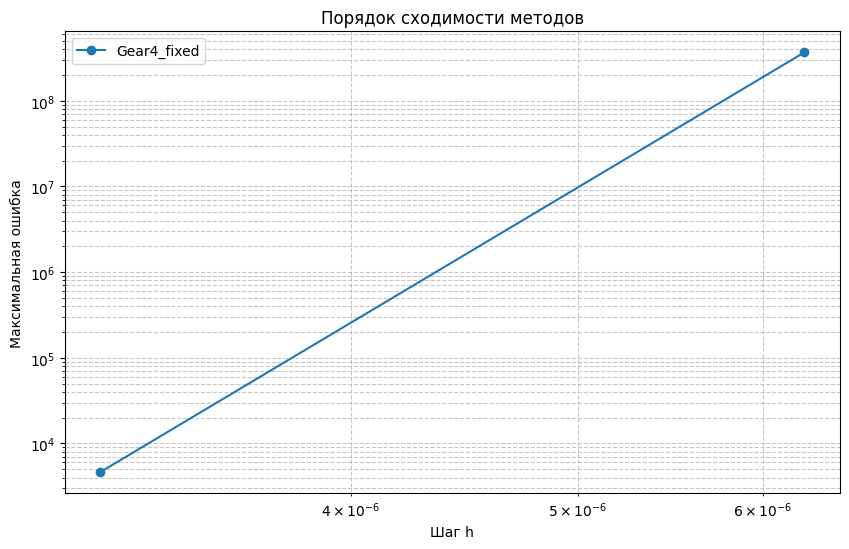

ITERATION 9 8
x0= 0.09 y0= 0.08
❌ rk4_solve: NaN или inf в решении (h=0.0001)
⚠️ RK4 при h=0.0001: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ pece4_solve: NaN или inf в решении (h=0.0001)
⚠️ PECE4 при h=0.0001: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ Gear4: расходимость на шаге 3, h=0.0001
❌ gear4_fixed_step: NaN или inf в решении (h=0.0001)
⚠️ Gear4_fixed при h=0.0001: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ rk4_solve: NaN или inf в решении (h=5e-05)
⚠️ RK4 при h=5e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ pece4_solve: NaN или inf в решении (h=5e-05)
⚠️ PECE4 при h=5e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ Gear4: расходимость на шаге 3, h=5e-05
❌ gear4_fixed_step: NaN или inf в решении (h=5e-05)
⚠️ Gear4_fixed при h=5e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ rk4_solve: NaN или inf в решении (h=2.5e-05)
⚠️ RK4 п

C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:7: RuntimeWarning: overflow encountered in scalar multiply
  dydt = y * (2 * a2 - 0.5 * y - 3.5 * (a2_reg**2) * x)
C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:7: RuntimeWarning: invalid value encountered in scalar subtract
  dydt = y * (2 * a2 - 0.5 * y - 3.5 * (a2_reg**2) * x)
C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:7: RuntimeWarning: overflow encountered in scalar power
  dydt = y * (2 * a2 - 0.5 * y - 3.5 * (a2_reg**2) * x)
C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:8: RuntimeWarning: overflow encountered in scalar multiply
  da2dt = epsilon * (2 - 7 * a2 * x)
C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\1111329400.py:7: RuntimeWarning: invalid value encountered in add
  k2 = f(t + h/2, y + h/2 * k1, epsilon)
C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\995573919.py:8: RuntimeWarning: invalid value encountered in add
  y_pred = y + h/24 * (55*f_v

❌ rk4_solve: NaN или inf в решении (h=1.25e-05)
⚠️ RK4 при h=1.25e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ pece4_solve: NaN или inf в решении (h=1.25e-05)
⚠️ PECE4 при h=1.25e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ Gear4: расходимость на шаге 3, h=1.25e-05
❌ gear4_fixed_step: переполнение (h=1.25e-05)
⚠️ Gear4_fixed при h=1.25e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ rk4_solve: NaN или inf в решении (h=6.25e-06)
⚠️ RK4 при h=6.25e-06: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ pece4_solve: NaN или inf в решении (h=6.25e-06)
⚠️ PECE4 при h=6.25e-06: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ Gear4: расходимость на шаге 3, h=6.25e-06
✅ gear4_fixed_step: успех, 4 шагов (h=6.25e-06)
❌ rk4_solve: NaN или inf в решении (h=3.125e-06)
⚠️ RK4 при h=3.125e-06: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ pece4_solve: NaN или inf

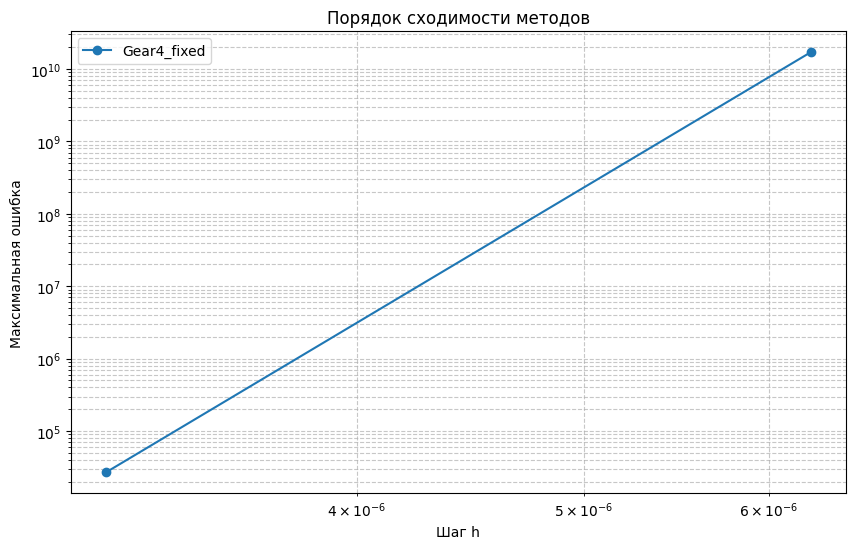

ITERATION 9 9
x0= 0.09 y0= 0.09
❌ rk4_solve: NaN или inf в решении (h=0.0001)
⚠️ RK4 при h=0.0001: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ pece4_solve: NaN или inf в решении (h=0.0001)
⚠️ PECE4 при h=0.0001: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ Gear4: расходимость на шаге 3, h=0.0001
❌ gear4_fixed_step: NaN или inf в решении (h=0.0001)
⚠️ Gear4_fixed при h=0.0001: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ rk4_solve: NaN или inf в решении (h=5e-05)
⚠️ RK4 при h=5e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ pece4_solve: NaN или inf в решении (h=5e-05)
⚠️ PECE4 при h=5e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ Gear4: расходимость на шаге 3, h=5e-05
❌ gear4_fixed_step: NaN или inf в решении (h=5e-05)
⚠️ Gear4_fixed при h=5e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ rk4_solve: NaN или inf в решении (h=2.5e-05)
⚠️ RK4 п

C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:7: RuntimeWarning: overflow encountered in scalar multiply
  dydt = y * (2 * a2 - 0.5 * y - 3.5 * (a2_reg**2) * x)
C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:7: RuntimeWarning: invalid value encountered in scalar subtract
  dydt = y * (2 * a2 - 0.5 * y - 3.5 * (a2_reg**2) * x)
C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:8: RuntimeWarning: overflow encountered in scalar multiply
  da2dt = epsilon * (2 - 7 * a2 * x)
C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\1111329400.py:11: RuntimeWarning: invalid value encountered in add
  return y + h/6 * (k1 + 2*k2 + 2*k3 + k4)
C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:6: RuntimeWarning: invalid value encountered in scalar multiply
  dxdt = x * (1 - 0.5 * x - (2/7) * (a2_reg**-2) * y)
C:\Users\lilia\AppData\Local\Temp\ipykernel_13592\3758990596.py:7: RuntimeWarning: overflow encountered in scalar power
  dydt = y * (2

❌ rk4_solve: NaN или inf в решении (h=1.25e-05)
⚠️ RK4 при h=1.25e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ pece4_solve: NaN или inf в решении (h=1.25e-05)
⚠️ PECE4 при h=1.25e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ Gear4: расходимость на шаге 3, h=1.25e-05
❌ gear4_fixed_step: переполнение (h=1.25e-05)
⚠️ Gear4_fixed при h=1.25e-05: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ rk4_solve: NaN или inf в решении (h=6.25e-06)
⚠️ RK4 при h=6.25e-06: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ pece4_solve: NaN или inf в решении (h=6.25e-06)
⚠️ PECE4 при h=6.25e-06: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ Gear4: расходимость на шаге 3, h=6.25e-06
✅ gear4_fixed_step: успех, 4 шагов (h=6.25e-06)
❌ rk4_solve: NaN или inf в решении (h=3.125e-06)
⚠️ RK4 при h=3.125e-06: operands could not be broadcast together with shapes (1,0) (1,3) 
❌ pece4_solve: NaN или inf

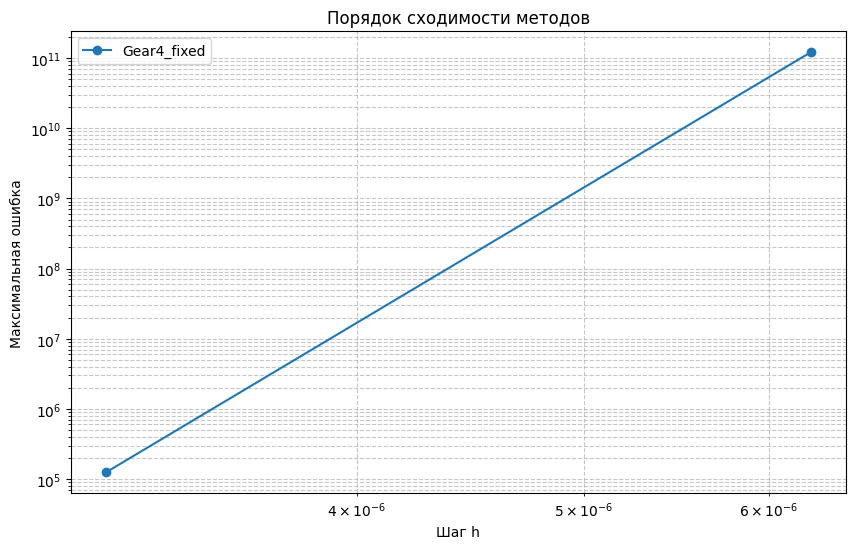

In [17]:
r=0
s=0
for t in range (10):
    r=t*0.01
    for p in range (10):
        s=p*0.01
        print ("ITERATION", t, p) 
        print ("x0=", r, "y0=", s) 
        df = run_convergence_analysis(
            y0_system=[r, s, 0.0001],
            t_range=[0, 0.01],
            epsilon=0.001
        )


Так, ну, у гира с фиксированным шагом и рунге-кутты в целом вроде шансы есть. Чем дальше от нуля тем больше бардак, но гир хотя бы дощитывает во многих случаях